In [1]:
%matplotlib inline

import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob

from random import randint, shuffle
from skimage.feature import hog
from sklearn.model_selection import train_test_split
from mpl_toolkits.mplot3d import Axes3D

##Data Explorer

###- Feature Extraction
#### * object-detection-crowdai dataset
#### * object-dataset

In [2]:
data_crowdai = pd.read_csv('object-detection-crowdai/labels.csv', header=0)
data_crowdai['Path'] = './object-detection-crowdai/'+ data_crowdai['Frame']
data_crowdai = data_crowdai.drop('Preview URL', 1)
data_crowdai = data_crowdai.drop('Frame', 1)
data_crowdai['Label'] = data_crowdai['Label'].str.lower()

data_crowdai.columns = ['xmin', 'ymin', 'xmax', 'ymax', 'Label', 'Path']
data_crowdai.head()

,xmin,ymin,xmax,ymax,Label,Path
0,785,533,905,644,car,./object-detection-crowdai/1479498371963069978...
1,89,551,291,680,car,./object-detection-crowdai/1479498371963069978...
2,268,546,383,650,car,./object-detection-crowdai/1479498371963069978...
3,455,522,548,615,truck,./object-detection-crowdai/1479498371963069978...
4,548,522,625,605,truck,./object-detection-crowdai/1479498371963069978...


In [3]:
print("Number of file : ", len(data_crowdai))
print("Unique lables are", np.unique(data_crowdai['Label']))

print("Number of car : ", (data_crowdai['Label'] == 'car').sum())
print("Number of truck : ", (data_crowdai['Label'] == 'truck').sum())
print("Number of pederstrians : ", (data_crowdai['Label'] == 'pedestrian').sum())

Number of file :  72064
Unique lables are ['car' 'pedestrian' 'truck']
Number of car :  62570
Number of truck :  3819
Number of pederstrians :  5675


In [4]:
name = ['Frame', 'xmin', 'ymin', 'xmax', 'ymax', 'ind', 'Label', 'RM']

data_object = pd.read_csv('object-dataset/labels.csv', delim_whitespace=True, names=name)
data_object['Path'] = './object-dataset/' + data_object['Frame']
data_object = data_object.drop('RM', 1)
data_object = data_object.drop('Frame', 1)
data_object = data_object.drop('ind', 1)

data_object.columns = ['xmin', 'ymin', 'xmax', 'ymax', 'Label', 'Path']
data_object.head()

,xmin,ymin,xmax,ymax,Label,Path
0,950,574,1004,620,car,./object-dataset/1478019952686311006.jpg
1,1748,482,1818,744,pedestrian,./object-dataset/1478019952686311006.jpg
2,872,586,926,632,car,./object-dataset/1478019953180167674.jpg
3,686,566,728,618,truck,./object-dataset/1478019953689774621.jpg
4,716,578,764,622,car,./object-dataset/1478019953689774621.jpg


In [5]:
print("Number of file : ", len(data_object))
print("Unique lables are", np.unique(data_object['Label']))

print("Number of car : ", (data_object['Label'] == 'car').sum())
print("Number of truck : ", (data_object['Label'] == 'truck').sum())
print("Number of pederstrians : ", (data_object['Label'] == 'pedestrian').sum())

Number of file :  93086
Unique lables are ['biker' 'car' 'pedestrian' 'trafficLight' 'truck']
Number of car :  60788
Number of truck :  3503
Number of pederstrians :  9866


In [6]:
# Combine each dataset

data_train = pd.concat([data_crowdai, data_object]).reset_index()
data_train = data_train.drop('index', 1)
data_train.columns = ['xmin', 'ymin', 'xmax', 'ymax', 'Label', 'Path']
data_train.head()

,xmin,ymin,xmax,ymax,Label,Path
0,785,533,905,644,car,./object-detection-crowdai/1479498371963069978...
1,89,551,291,680,car,./object-detection-crowdai/1479498371963069978...
2,268,546,383,650,car,./object-detection-crowdai/1479498371963069978...
3,455,522,548,615,truck,./object-detection-crowdai/1479498371963069978...
4,548,522,625,605,truck,./object-detection-crowdai/1479498371963069978...


In [7]:
cars_s = data_train[(data_train['Label'] == 'car') | (data_train['Label'] == 'truck')].reset_index()
nocars_s = data_train[(data_train['Label'] != 'car') & (data_train['Label'] != 'truck')].reset_index()

print("Number of examples =", len(data_train)) 
print("Number of car examples =", len(cars_s)) 
print("Number of other examples =", len(nocars_s))

Number of examples = 165150
Number of car examples = 130680
Number of other examples = 34470


In [9]:
# Sampling dataset

cars = []
nocars = []

sample_size = 30000

# sampling car data in dataset
for i in range(sample_size):
    index = randint(0, len(cars_s)-1)
    image = cv2.imread(cars_s['Path'][index])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = image[cars_s['ymin'][index]:cars_s['ymax'][index], 
                  cars_s['xmin'][index]:cars_s['xmax'][index]]

    if np.array(image).shape[0] <= 0 or np.array(image).shape[1] <= 0:
        continue
    
    image = cv2.resize(image, (64, 64), interpolation=cv2.INTER_AREA)
    cars.append(image)

# sampling not car data in dataset
for i in range(sample_size):
    index = randint(0, len(nocars_s)-1)
    image = cv2.imread(nocars_s['Path'][index])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = image[nocars_s['ymin'][index]:nocars_s['ymax'][index], 
                  nocars_s['xmin'][index]:nocars_s['xmax'][index]]
    if np.array(image).shape[0] <= 0 or np.array(image).shape[1] <= 0:
        continue
    image = cv2.resize(image, (64, 64), interpolation=cv2.INTER_AREA)
    nocars.append(image)

In [10]:
print("Number of car examples =", len(cars)) 
print("Number of no car examples =", len(nocars))

print(np.array(cars_s).shape)
print(np.array(nocars_s).shape)

Number of car examples = 29997
Number of no car examples = 30000
(130680, 7)
(34470, 7)


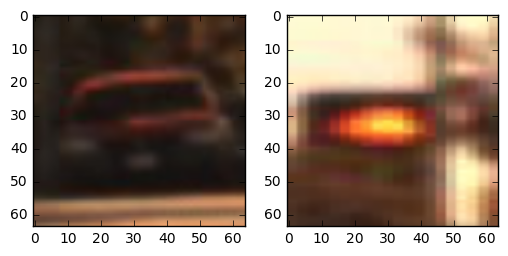

In [11]:
plt.subplot(1, 2, 1)
plt.imshow(cars[2999])  
plt.subplot(1, 2, 2)
plt.imshow(nocars[1932])

In [12]:
car_images = glob.glob('vehicles/**/*.png')
for i in range(len(car_images)):
    image = cv2.imread(car_images[i])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    cars.append(image)

noncar_images = glob.glob('non-vehicles/**/*.png')
for i in range(len(noncar_images)):
    image = cv2.imread(noncar_images[i])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    nocars.append(image)
    
# Summaries    
print("Number of car examples =", len(cars)) 
print("Number of nocar examples =", len(nocars))

Number of car examples = 38789
Number of nocar examples = 38965


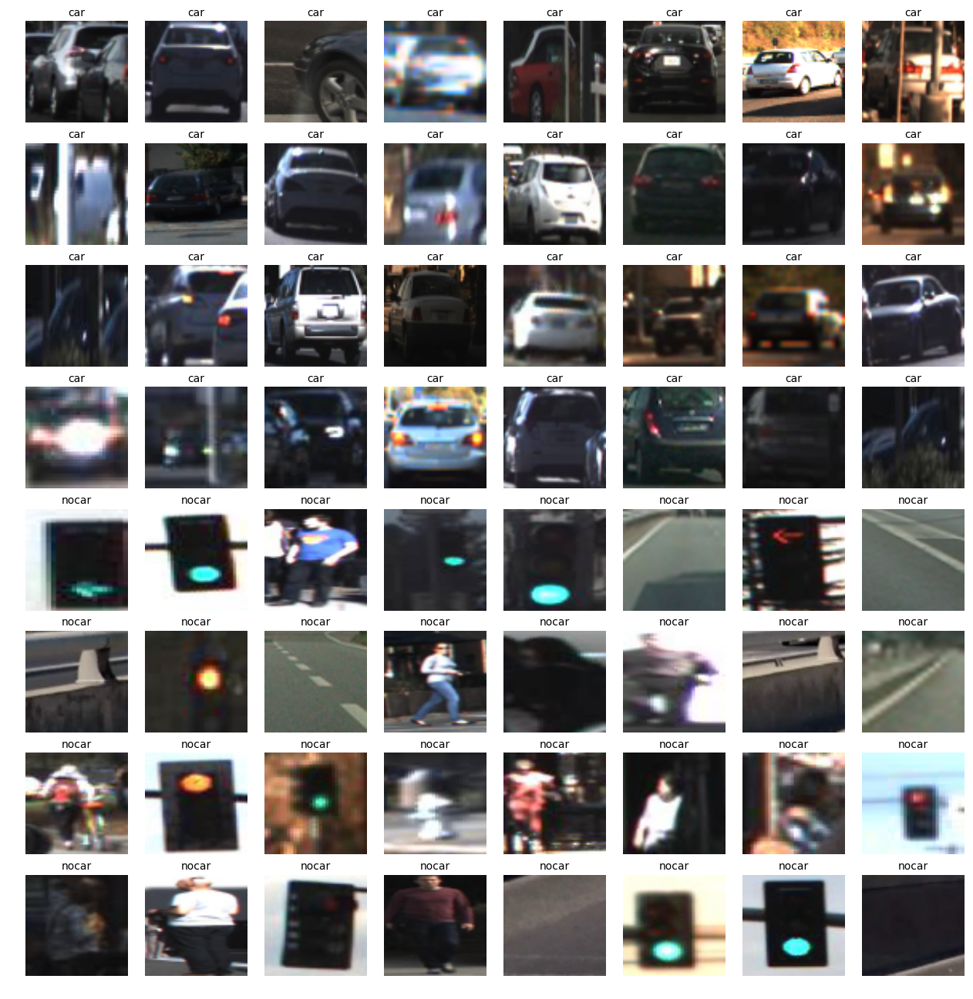

In [18]:
#look few imgaes
fig, axs = plt.subplots(8, 8, figsize=(16, 16))
fig.subplots_adjust(hspace=.2, wspace=.001)
axs = axs.ravel()

for i in np.arange(32):
    img = cars[np.random.randint(0, len(cars))]
    axs[i].axis('off')
    axs[i].set_title('car', fontsize=10)
    axs[i].imshow(img)
for i in np.arange(32, 64):
    img = nocars[np.random.randint(0, len(nocars))]
    axs[i].axis('off')
    axs[i].set_title('nocar', fontsize=10)
    axs[i].imshow(img)

In [19]:
import os.path
import pickle

# Save the data using python pickle
pickle_file = 'vehicle_detection_data.p'
if not os.path.isfile(pickle_file):
    print('Saving data')
    try:
        with open('vehicle_detection_data.p', 'wb') as pfile:
            pickle.dump(
                {
                    'cars': cars,
                    'nocars': nocars,
                },
                pfile, pickle.HIGHEST_PROTOCOL)
    except Exception as e:
        print('Error : ', e)
        raise

print('Data save in successfully')

Saving data


Data save in successfully


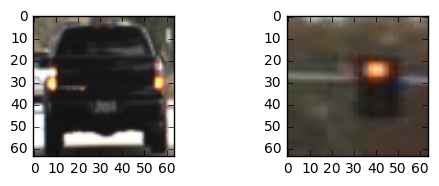

In [4]:
#look few images
plt.subplot(2, 2, 1)
plt.imshow(cars[878])  
plt.subplot(2, 2, 2)
plt.imshow(nocars[10])

##Explore different approaches to feature generation

Histograms of Color, Spatial Binning of Color, HOG

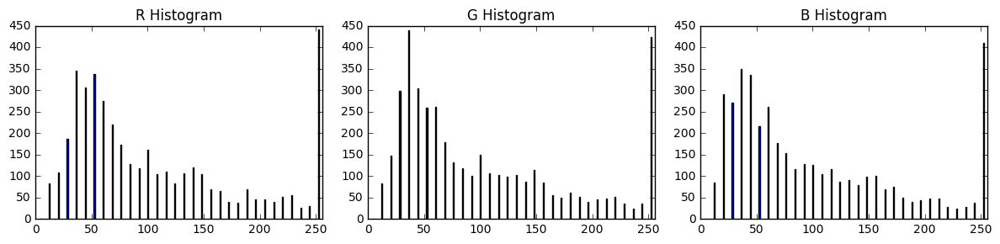

In [3]:
# Define a function to compute color histogram features  
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the RGB channels separately
    rhist = np.histogram(img[:, :, 0], bins=nbins, range=bins_range)
    ghist = np.histogram(img[:, :, 1], bins=nbins, range=bins_range)
    bhist = np.histogram(img[:, :, 2], bins=nbins, range=bins_range)
    # Generating bin centers
    bin_edges = rhist[1]
    bin_centers = (bin_edges[1:]  + bin_edges[0:len(bin_edges)-1])/2
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((rhist[0], ghist[0], bhist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return rhist, ghist, bhist, bin_centers, hist_features


rh, gh, bh, bincen, feature_vec = color_hist(cars[101], nbins=32, bins_range=(0, 256))

fig = plt.figure(figsize=(12, 3))
plt.subplot(131)
plt.bar(bincen, rh[0])
plt.xlim(0, 256)
plt.title('R Histogram')
plt.subplot(132)
plt.bar(bincen, gh[0])
plt.xlim(0, 256)
plt.title('G Histogram')
plt.subplot(133)
plt.bar(bincen, bh[0])
plt.xlim(0, 256)
plt.title('B Histogram')
fig.tight_layout()

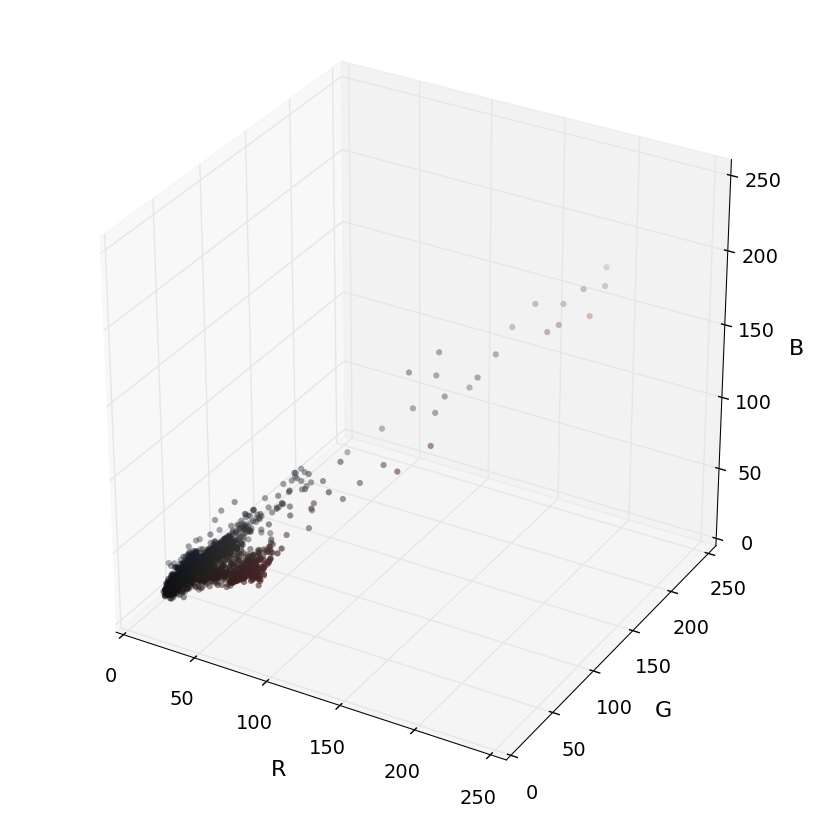

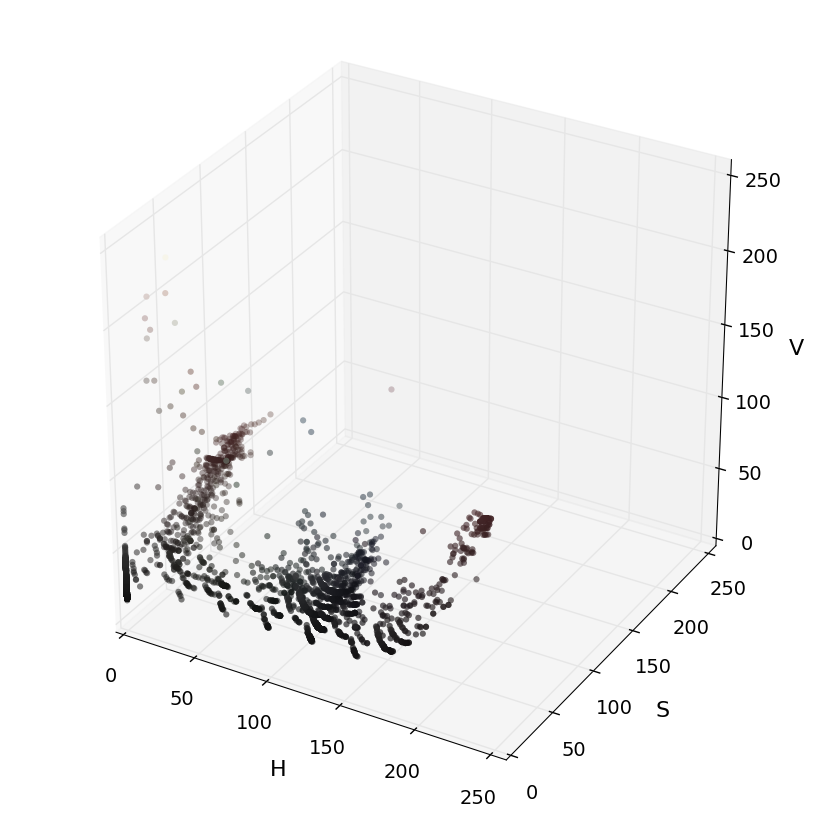

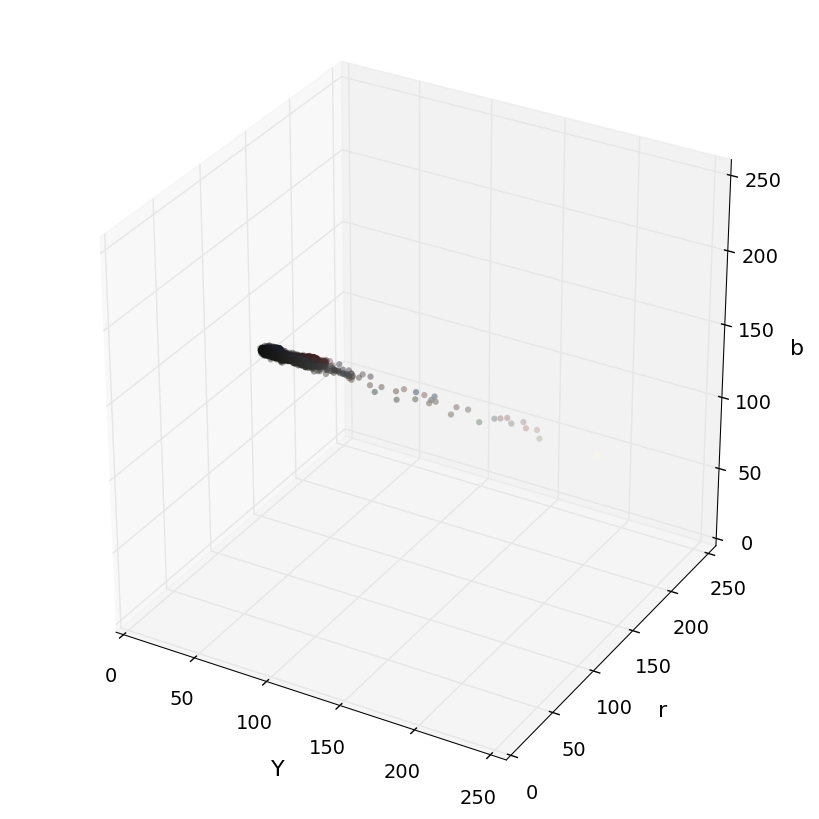

In [4]:
def plot3d(pixels, colors_rgb, axis_labels=list("RGB"), axis_limits=[(0, 255), (0, 255), (0, 255)]):
    """Plot pixels in 3D."""

    # Create figure and 3D axes
    fig = plt.figure(figsize=(8, 8))
    ax = Axes3D(fig)

    # Set axis limits
    ax.set_xlim(*axis_limits[0])
    ax.set_ylim(*axis_limits[1])
    ax.set_zlim(*axis_limits[2])

    # Set axis labels and sizes
    ax.tick_params(axis='both', which='major', labelsize=14, pad=8)
    ax.set_xlabel(axis_labels[0], fontsize=16, labelpad=16)
    ax.set_ylabel(axis_labels[1], fontsize=16, labelpad=16)
    ax.set_zlabel(axis_labels[2], fontsize=16, labelpad=16)

    # Plot pixel values with colors given in colors_rgb
    ax.scatter(pixels[:, :, 0].ravel(), pixels[:, :, 1].ravel(), pixels[:, :, 2].ravel(), 
               c=colors_rgb.reshape((-1, 3)), edgecolors='none')

    return ax  # return Axes3D object for further manipulation

# Convert image to desired color space(s)
img_small_RGB = cars[23]
img_small_HSV = cv2.cvtColor(img_small_RGB, cv2.COLOR_RGB2HSV)
img_small_YCrCb = cv2.cvtColor(img_small_RGB, cv2.COLOR_RGB2YCrCb)
img_small_rgb = img_small_RGB / 255.  # scaled to [0, 1], only for plotting

# Plot and show
plot3d(img_small_RGB, img_small_rgb)
plot3d(img_small_HSV, img_small_rgb, axis_labels=list("HSV"))
plot3d(img_small_YCrCb, img_small_rgb, axis_labels=list("Yrb"))

##Spatial binning of color

(3072,)


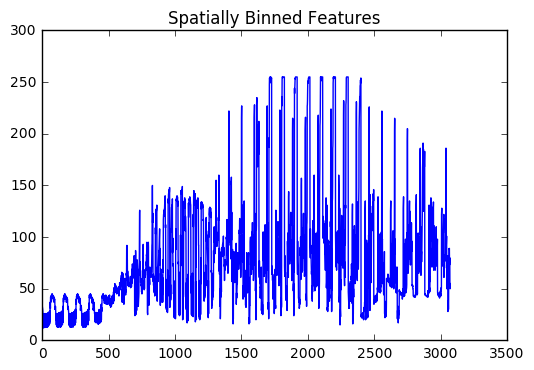

In [5]:
def bin_spatial(img, color_space='RGB', size=(32, 32)):
    # Convert image to new color space (if specified)
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)             
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(feature_image, size).ravel() 
    # Return the feature vector
    return features

# Check 
features = bin_spatial(cars[99], color_space='RGB', size=(32, 32))
print(features.shape)
plt.plot(features)
plt.title('Spatially Binned Features')

In [3]:
def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=False, 
                                  visualise=vis, feature_vector=feature_vec)
        
        return features, hog_image
    
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=False, 
                       visualise=vis, feature_vector=feature_vec)
        
        return features

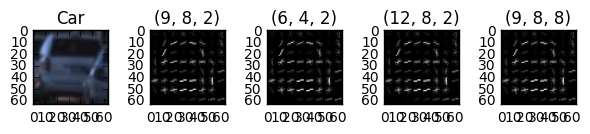

In [4]:
image = cv2.cvtColor(cars[1231], cv2.COLOR_RGB2GRAY)

# Define HOG parameters
features, hog_image1 = get_hog_features(image, orient=9, pix_per_cell=8, cell_per_block=2, vis=True, feature_vec=False)
features, hog_image2 = get_hog_features(image, orient=6, pix_per_cell=4, cell_per_block=2, vis=True, feature_vec=False)
features, hog_image3 = get_hog_features(image, orient=10, pix_per_cell=6, cell_per_block=2, vis=True, feature_vec=False)
features, hog_image4 = get_hog_features(image, orient=12, pix_per_cell=8, cell_per_block=2, vis=True, feature_vec=False)

# Plot the examples
fig = plt.figure()
plt.subplot(151)
plt.imshow(cars[101])
plt.title('Car')
plt.subplot(152)
plt.imshow(hog_image1, cmap='gray')
plt.title('(9, 8, 2)')
plt.subplot(153)
plt.imshow(hog_image1, cmap='gray')
plt.title('(6, 4, 2)')
plt.subplot(154)
plt.imshow(hog_image1, cmap='gray')
plt.title('(12, 8, 2)')
plt.subplot(155)
plt.imshow(hog_image1, cmap='gray')
plt.title('(9, 8, 8)')
fig.tight_layout()

##Classifiers
###Project Solution - 1

SVM approach and use relatively small amount of data.

In [2]:
%matplotlib inline

import time
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob

# sklearn
from sklearn.utils import shuffle
from skimage.feature import hog
from sklearn.svm import LinearSVC
from scipy.ndimage.measurements import label

In [3]:
car_images = glob.glob('./vehicles/**/*.png')
noncar_images = glob.glob('./non-vehicles/**/*.png')

In [4]:
def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=False, 
                                  visualise=vis, feature_vector=feature_vec)
        
        return features, hog_image
    
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=False, 
                       visualise=vis, feature_vector=feature_vec)
        
        return features

In [5]:
def extract_features(imgs, cspace='RGB', orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if cspace != 'RGB':
            if cspace == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif cspace == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif cspace == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif cspace == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif cspace == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        # Call get_hog_features() with vis=False, feature_vec=True
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))
            hog_features = np.ravel(hog_features)        
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        # Append the new feature vector to the features list
        features.append(hog_features)
    # Return list of feature vectors
    return features

In [6]:
# Feature extraction parameters
colorspace = 'YUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 11
pix_per_cell = 16
cell_per_block = 2
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"

t = time.time()
car_features = extract_features(car_images, cspace=colorspace, orient=orient, pix_per_cell=pix_per_cell, 
                                cell_per_block=cell_per_block, hog_channel=hog_channel)
nocar_features = extract_features(noncar_images, cspace=colorspace, orient=orient, pix_per_cell=pix_per_cell, 
                                   cell_per_block=cell_per_block, hog_channel=hog_channel)

# Create an array stack of feature vectors
X = np.vstack((car_features, nocar_features)).astype(np.float64)  

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(nocar_features))))

# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=rand_state)

In [7]:
# Summaries
print("Number of training examples =", len(X_train)) 
print("Number of testing examples =", len(X_test))
print("Number of valid train examples =", len(y_train)) 
print("Number of valid test examples =", len(y_test))

Number of training examples = 14208
Number of testing examples = 3552
Number of valid train examples = 14208
Number of valid test examples = 3552


In [8]:
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t = time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t2 = time.time()
n_predict = 10
print(round(t2-t, 5), 'Seconds to predict', n_predict, 'labels with SVC')

0.86 Seconds to train SVC...
Test Accuracy of SVC =  0.984
0.85966 Seconds to predict 10 labels with SVC


##Using Classifier to Detect Cars

In [9]:
# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, ystart, ystop, scale, cspace, hog_channel, svc, X_scaler, orient,
              pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles=False):
    rectangles = []

    img = img.astype(np.float32) / 255

    img_tosearch = img[ystart:ystop, :, :]

    # apply color conversion
    if cspace != 'RGB':
        if cspace == 'HSV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HSV)
        elif cspace == 'LUV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2LUV)
        elif cspace == 'HLS':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HLS)
        elif cspace == 'YUV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YUV)
        elif cspace == 'YCrCb':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YCrCb)
    else:
        ctrans_tosearch = np.copy(image)

    # rescale image if other than 1.0 scale
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1] / scale), np.int(imshape[0] / scale)))

    # select colorspace channel for HOG 
    if hog_channel == 'ALL':
        ch1 = ctrans_tosearch[:, :, 0]
        ch2 = ctrans_tosearch[:, :, 1]
        ch3 = ctrans_tosearch[:, :, 2]
    else:
        ch1 = ctrans_tosearch[:, :, hog_channel]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) + 1 #-1 
    nyblocks = (ch1.shape[0] // pix_per_cell) + 1 #-1

    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step

    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    if hog_channel == 'ALL':
        hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
        hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)

    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb * cells_per_step
            xpos = xb * cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos + nblocks_per_window, xpos:xpos + nblocks_per_window].ravel()
            if hog_channel == 'ALL':
                hog_feat2 = hog2[ypos:ypos + nblocks_per_window, xpos:xpos + nblocks_per_window].ravel()
                hog_feat3 = hog3[ypos:ypos + nblocks_per_window, xpos:xpos + nblocks_per_window].ravel()
                hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            else:
                hog_features = hog_feat1

            xleft = xpos * pix_per_cell
            ytop = ypos * pix_per_cell
            
            hog_features_re = np.array([hog_features])
            test_prediction = svc.predict(hog_features_re)

            if test_prediction == 1 or show_all_rectangles:
                xbox_left = np.int(xleft * scale)
                ytop_draw = np.int(ytop * scale)
                win_draw = np.int(window * scale)
                rectangles.append(
                    ((xbox_left, ytop_draw + ystart), (xbox_left + win_draw, ytop_draw + win_draw + ystart)))

    return rectangles

In [10]:
test_img = mpimg.imread('./test_img/test2.jpg')

ystart = 400
ystop = 656
scale = 1.5
colorspace = 'YUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 11
pix_per_cell = 16
cell_per_block = 2
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"

rectangles = find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc, None, orient, pix_per_cell, cell_per_block, None, None)

print(len(rectangles), 'rectangles found in image')

3 rectangles found in image


###Draw BoundingBox on Images

In [11]:
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    random_color = False
    # Iterate through the bounding boxes
    for bbox in bboxes:
        if color == 'random' or random_color:
            color = (np.random.randint(0,255), np.random.randint(0, 255), np.random.randint(0, 255))
            random_color = True
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

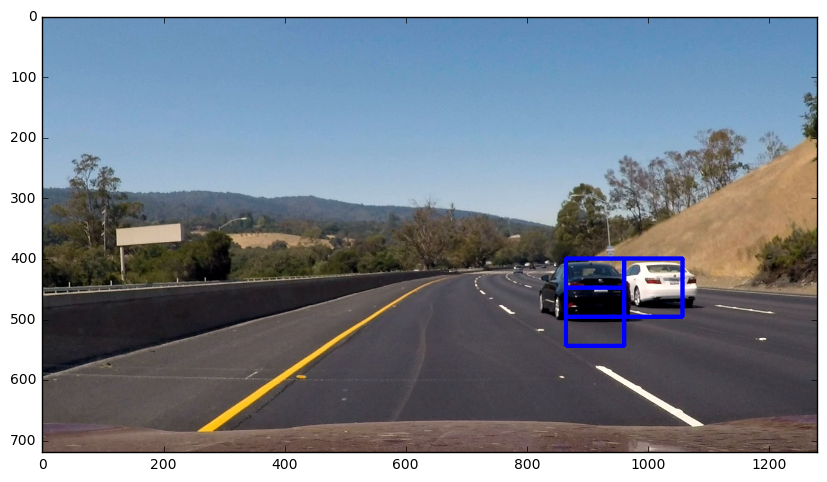

In [22]:
test_img_rects = draw_boxes(test_img, rectangles)
plt.figure(figsize=(10, 10))
plt.imshow(test_img_rects)

###Potential Search Areas

The scale of the car varies according to the distance of the camera from the image. So you have to call the search method many times with different parameters.

boxes:  39


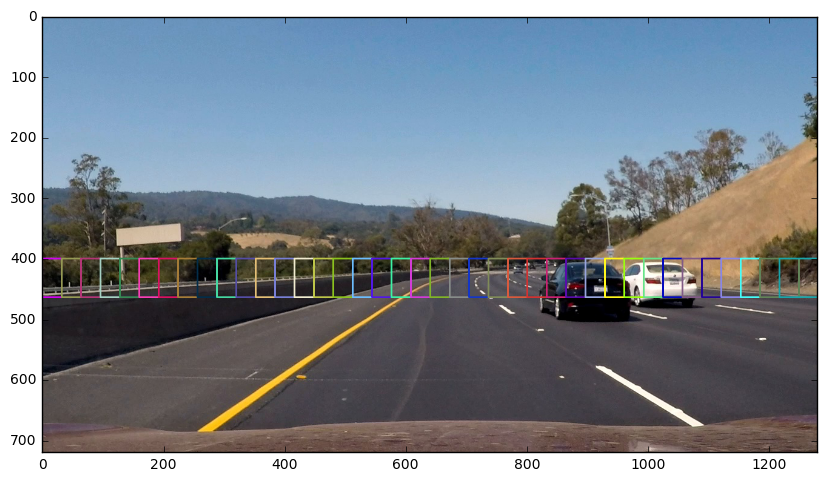

In [14]:
# search for values of parameters that work well

test_img = mpimg.imread('./test_img/test2.jpg')

rects = []

ystart = 400
ystop = 464
scale = 1.0
rects.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc, None, 
                       orient, pix_per_cell, cell_per_block, None, None, show_all_rectangles=True))
ystart = 420
ystop = 500
scale = 1.5
rects.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc, None, 
                       orient, pix_per_cell, cell_per_block, None, None, show_all_rectangles=True))

rectangles = [item for sublist in rects for item in sublist] 
test_img_rects = draw_boxes(test_img, rectangles, color='random', thick=2)
plt.figure(figsize=(10, 10))
plt.imshow(test_img_rects)

print('boxes: ', len(rectangles))

boxes:  25


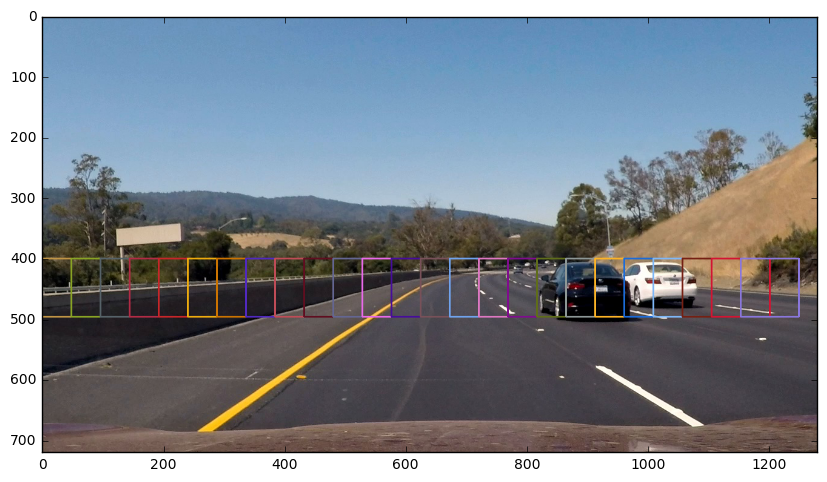

In [15]:
rects = []

ystart = 400
ystop = 530
scale = 1.5
rects.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc, None, 
                       orient, pix_per_cell, cell_per_block, None, None, show_all_rectangles=True))
ystart = 440
ystop = 560
scale = 2.0
rects.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc, None, 
                       orient, pix_per_cell, cell_per_block, None, None, show_all_rectangles=True))

rectangles = [item for sublist in rects for item in sublist] 
test_img_rects = draw_boxes(test_img, rectangles, color='random', thick=2)
plt.figure(figsize=(10,10))
plt.imshow(test_img_rects)
print('boxes: ', len(rectangles))

boxes:  24


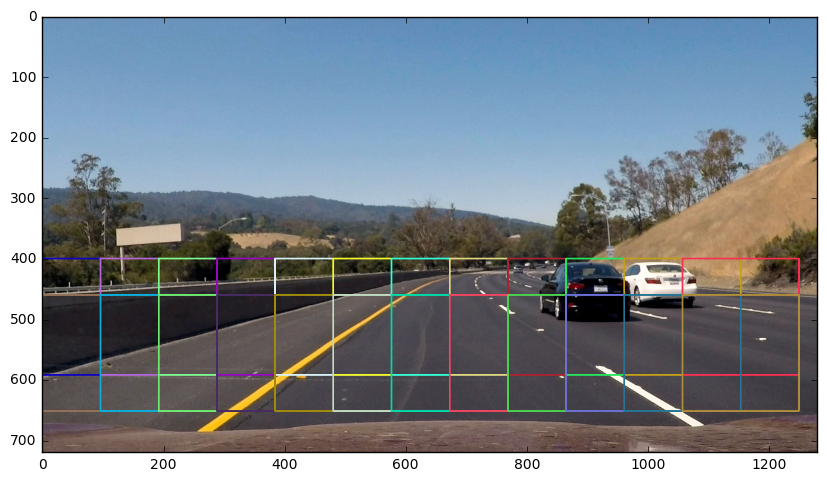

In [16]:
rects = []

ystart = 400
ystop = 600
scale = 3.0
rects.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc, None, 
                       orient, pix_per_cell, cell_per_block, None, None, show_all_rectangles=True))
ystart = 460
ystop = 660
scale = 3.0
rects.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc, None, 
                       orient, pix_per_cell, cell_per_block, None, None, show_all_rectangles=True))

rectangles = [item for sublist in rects for item in sublist] 
test_img_rects = draw_boxes(test_img, rectangles, color='random', thick=2)
plt.figure(figsize=(10,10))
plt.imshow(test_img_rects)

print('boxes: ', len(rectangles))

Number of boxes:  19


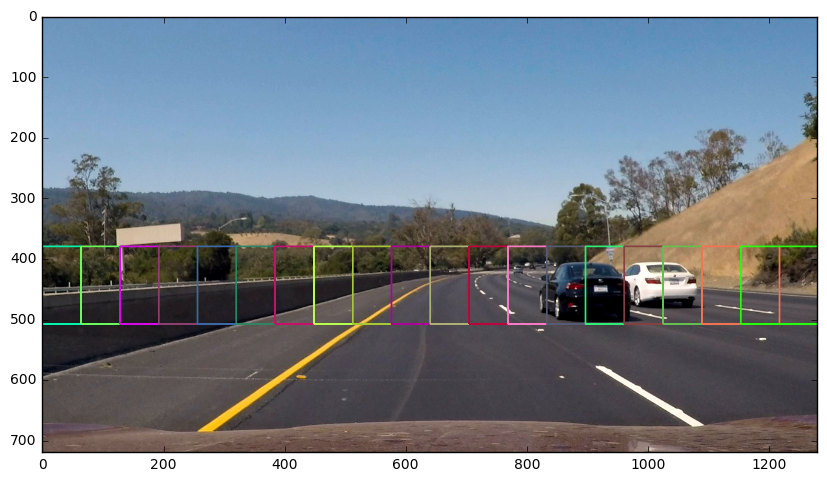

In [17]:
rects = []

ystart = 350
ystop = 400
scale = 2.0
rects.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc, None, 
                       orient, pix_per_cell, cell_per_block, None, None, show_all_rectangles=True))
ystart = 380
ystop = 550
scale = 2.0
rects.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc, None, 
                       orient, pix_per_cell, cell_per_block, None, None, show_all_rectangles=True))

rectangles = [item for sublist in rects for item in sublist] 
test_img_rects = draw_boxes(test_img, rectangles, color='random', thick=2)
plt.figure(figsize=(10,10))
plt.imshow(test_img_rects)
print('Number of boxes: ', len(rectangles))

##Heatmap

In [12]:
def add_heat(heatmap, bbox_list):

    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap

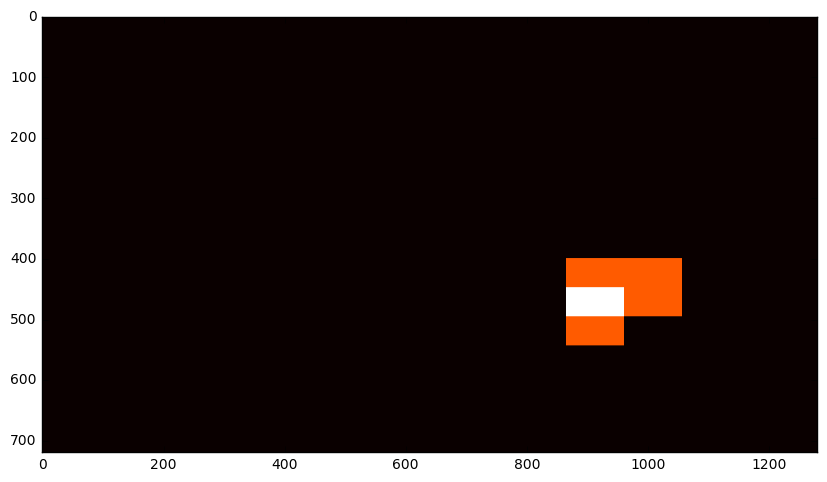

In [14]:
# Test heatmap
heatmap_img = np.zeros_like(test_img[:, :, 0])
heatmap_img = add_heat(heatmap_img, rectangles)

plt.figure(figsize=(10,10))
plt.imshow(heatmap_img, cmap='hot')

In [13]:
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

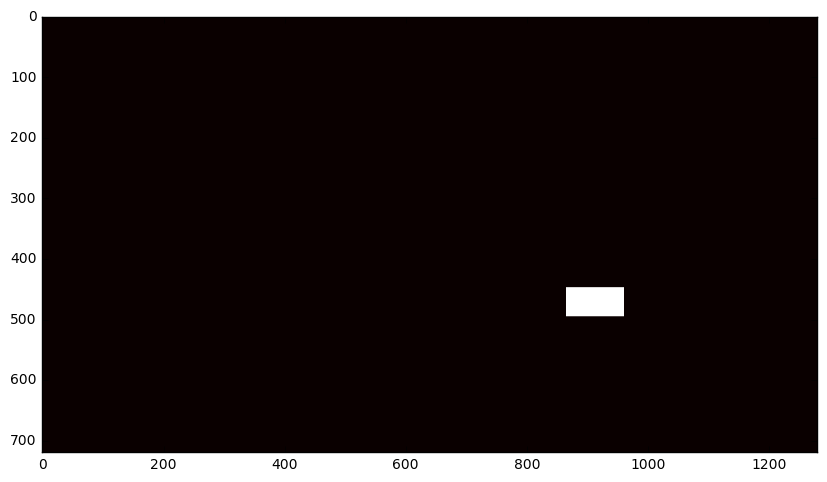

In [15]:
heatmap_img = apply_threshold(heatmap_img, 1)

plt.figure(figsize=(10,10))
plt.imshow(heatmap_img, cmap='hot')

1 cars found


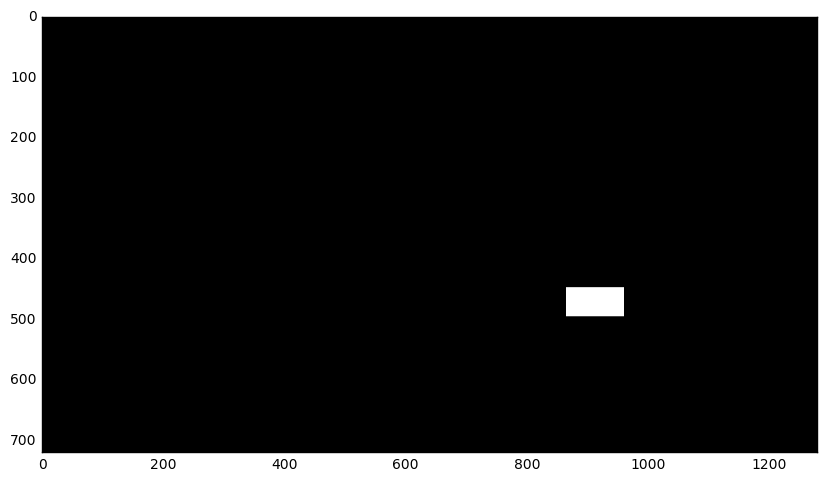

In [16]:
# Label to Heatmap
labels = label(heatmap_img)

plt.figure(figsize=(10, 10))
plt.imshow(labels[0], cmap='gray')

print(labels[1], 'cars found')

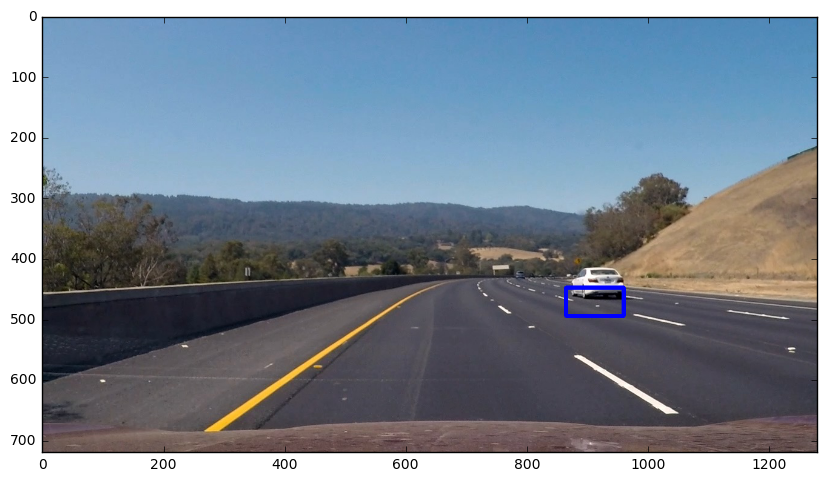

In [17]:
from scipy.ndimage.measurements import label

test_img = mpimg.imread('./test_img/test3.jpg')
# Draw Bounding Boxes
def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    rects = []
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        rects.append(bbox)
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image and final rectangles
    return img, rects

bb_img, rect = draw_labeled_bboxes(np.copy(test_img), labels)

plt.figure(figsize=(10, 10))
plt.imshow(bb_img)

####Process Video Frame

In [18]:
# Define a class to reflect scale change, more robust tracking
class Detect():
    def __init__(self):
        self.prev_rect = [] 
        
    def add_rect(self, rect):
        self.prev_rect.append(rect)
        if len(self.prev_rect) > 13:
            self.prev_rect = self.prev_rect[len(self.prev_rect)-13:]

In [21]:
def process(img):

    rectangles = []

    colorspace = 'YUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
    orient = 11
    pix_per_cell = 16
    cell_per_block = 2
    hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
    
    ystart = 400
    ystop = 464
    scale = 1.0
    rectangles.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc, None, orient, pix_per_cell, 
                                cell_per_block, None, None))
    ystart = 416
    ystop = 480
    scale = 1.0
    rectangles.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc, None, orient, pix_per_cell, 
                                cell_per_block, None, None))
    ystart = 400
    ystop = 496
    scale = 1.5
    rectangles.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc, None, orient, pix_per_cell, 
                                cell_per_block, None, None))
    ystart = 432
    ystop = 528
    scale = 1.5
    rectangles.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc, None, orient, pix_per_cell, 
                                cell_per_block, None, None))
    ystart = 400
    ystop = 528
    scale = 2.0
    rectangles.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc, None, orient, pix_per_cell, 
                                cell_per_block, None, None))
    ystart = 432
    ystop = 560
    scale = 2.0
    rectangles.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc, None, orient, pix_per_cell, 
                                cell_per_block, None, None))
    ystart = 400
    ystop = 596
    scale = 3.5
    rectangles.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc, None, orient, pix_per_cell, 
                                cell_per_block, None, None))
    ystart = 464
    ystop = 660
    scale = 3.5
    rectangles.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc, None, orient, pix_per_cell, 
                                cell_per_block, None, None))
 
    rectangles = [item for sublist in rectangles for item in sublist] 
    
    # add detections to the history
    if len(rectangles) > 0:
        det.add_rect(rectangles)
    
    heatmap_img = np.zeros_like(img[:, :, 0])
    for rect_set in det.prev_rect:
        heatmap_img = add_heat(heatmap_img, rect_set)
    heatmap_img = apply_threshold(heatmap_img, 1 + len(det.prev_rect)//2)
     
    labels = label(heatmap_img)
    draw_img, rect = draw_labeled_bboxes(np.copy(img), labels)
    
    return draw_img

In [23]:
from moviepy.editor import VideoFileClip

det = Detect()

result_file1 = 'result_video_1.mp4'
clip1 = VideoFileClip('project_video.mp4')
clip1_ = clip1.fl_image(process)
%time clip1_.write_videofile(result_file1, audio=False)

[MoviePy] >>>> Building video result_video_1.mp4


[MoviePy] Writing video result_video_1.mp4


  0%|          | 0/1261 [00:00<?, ?it/s]

  0%|          | 1/1261 [00:00<03:54,  5.37it/s]

  0%|          | 2/1261 [00:00<03:57,  5.31it/s]

  0%|          | 3/1261 [00:00<03:59,  5.26it/s]

  0%|          | 4/1261 [00:00<03:57,  5.29it/s]

  0%|          | 5/1261 [00:00<03:56,  5.31it/s]

  0%|          | 6/1261 [00:01<03:55,  5.34it/s]

  1%|          | 7/1261 [00:01<03:53,  5.36it/s]

  1%|          | 8/1261 [00:01<03:53,  5.37it/s]

  1%|          | 9/1261 [00:01<03:53,  5.37it/s]

  1%|          | 10/1261 [00:01<03:52,  5.37it/s]

  1%|          | 11/1261 [00:02<03:52,  5.37it/s]

  1%|          | 12/1261 [00:02<03:52,  5.37it/s]

  1%|          | 13/1261 [00:02<03:52,  5.38it/s]

  1%|          | 14/1261 [00:02<03:52,  5.37it/s]

  1%|          | 15/1261 [00:02<03:51,  5.37it/s]

  1%|▏         | 16/1261 [00:02<03:53,  5.34it/s]

  1%|▏         | 17/1261 [00:03<03:57,  5.24it/s]

  1%|▏         | 18/1261 [00:03<03:58,  5.21it/s]

  2%|▏         | 19/1261 [00:03<03:57,  5.22it/s]

  2%|▏         | 20/1261 [00:03<03:57,  5.23it/s]

  2%|▏         | 21/1261 [00:03<03:55,  5.27it/s]

  2%|▏         | 22/1261 [00:04<03:53,  5.30it/s]

  2%|▏         | 23/1261 [00:04<03:52,  5.31it/s]

  2%|▏         | 24/1261 [00:04<03:53,  5.30it/s]

  2%|▏         | 25/1261 [00:04<03:52,  5.31it/s]

  2%|▏         | 26/1261 [00:04<03:52,  5.31it/s]

  2%|▏         | 27/1261 [00:05<03:51,  5.33it/s]

  2%|▏         | 28/1261 [00:05<03:50,  5.35it/s]

  2%|▏         | 29/1261 [00:05<03:49,  5.36it/s]

  2%|▏         | 30/1261 [00:05<03:50,  5.35it/s]

  2%|▏         | 31/1261 [00:05<03:49,  5.35it/s]

  3%|▎         | 32/1261 [00:06<03:49,  5.35it/s]

  3%|▎         | 33/1261 [00:06<03:48,  5.37it/s]

  3%|▎         | 34/1261 [00:06<03:49,  5.34it/s]

  3%|▎         | 35/1261 [00:06<03:49,  5.34it/s]

  3%|▎         | 36/1261 [00:06<03:49,  5.33it/s]

  3%|▎         | 37/1261 [00:06<03:49,  5.34it/s]

  3%|▎         | 38/1261 [00:07<03:48,  5.36it/s]

  3%|▎         | 39/1261 [00:07<03:47,  5.37it/s]

  3%|▎         | 40/1261 [00:07<03:46,  5.39it/s]

  3%|▎         | 41/1261 [00:07<03:45,  5.41it/s]

  3%|▎         | 42/1261 [00:07<03:46,  5.39it/s]

  3%|▎         | 43/1261 [00:08<03:50,  5.28it/s]

  3%|▎         | 44/1261 [00:08<03:48,  5.32it/s]

  4%|▎         | 45/1261 [00:08<03:47,  5.34it/s]

  4%|▎         | 46/1261 [00:08<03:46,  5.36it/s]

  4%|▎         | 47/1261 [00:08<03:46,  5.36it/s]

  4%|▍         | 48/1261 [00:09<03:45,  5.37it/s]

  4%|▍         | 49/1261 [00:09<03:46,  5.36it/s]

  4%|▍         | 50/1261 [00:09<03:46,  5.35it/s]

  4%|▍         | 51/1261 [00:09<03:46,  5.34it/s]

  4%|▍         | 52/1261 [00:09<03:47,  5.31it/s]

  4%|▍         | 53/1261 [00:09<03:52,  5.20it/s]

  4%|▍         | 54/1261 [00:10<03:57,  5.09it/s]

  4%|▍         | 55/1261 [00:10<03:53,  5.16it/s]

  4%|▍         | 56/1261 [00:10<03:50,  5.22it/s]

  5%|▍         | 57/1261 [00:10<03:48,  5.27it/s]

  5%|▍         | 58/1261 [00:10<03:47,  5.29it/s]

  5%|▍         | 59/1261 [00:11<03:46,  5.30it/s]

  5%|▍         | 60/1261 [00:11<03:46,  5.30it/s]

  5%|▍         | 61/1261 [00:11<03:44,  5.35it/s]

  5%|▍         | 62/1261 [00:11<03:42,  5.39it/s]

  5%|▍         | 63/1261 [00:11<03:42,  5.39it/s]

  5%|▌         | 64/1261 [00:12<03:42,  5.39it/s]

  5%|▌         | 65/1261 [00:12<03:42,  5.38it/s]

  5%|▌         | 66/1261 [00:12<03:41,  5.39it/s]

  5%|▌         | 67/1261 [00:12<03:41,  5.40it/s]

  5%|▌         | 68/1261 [00:12<03:41,  5.38it/s]

  5%|▌         | 69/1261 [00:12<03:41,  5.38it/s]

  6%|▌         | 70/1261 [00:13<03:42,  5.36it/s]

  6%|▌         | 71/1261 [00:13<03:42,  5.34it/s]

  6%|▌         | 72/1261 [00:13<03:43,  5.31it/s]

  6%|▌         | 73/1261 [00:13<03:52,  5.10it/s]

  6%|▌         | 74/1261 [00:13<03:51,  5.13it/s]

  6%|▌         | 75/1261 [00:14<03:50,  5.15it/s]

  6%|▌         | 76/1261 [00:14<03:51,  5.13it/s]

  6%|▌         | 77/1261 [00:14<03:51,  5.12it/s]

  6%|▌         | 78/1261 [00:14<03:56,  5.00it/s]

  6%|▋         | 79/1261 [00:14<03:53,  5.06it/s]

  6%|▋         | 80/1261 [00:15<03:50,  5.11it/s]

  6%|▋         | 81/1261 [00:15<03:50,  5.13it/s]

  7%|▋         | 82/1261 [00:15<03:47,  5.18it/s]

  7%|▋         | 83/1261 [00:15<03:46,  5.20it/s]

  7%|▋         | 84/1261 [00:15<03:44,  5.24it/s]

  7%|▋         | 85/1261 [00:16<03:43,  5.26it/s]

  7%|▋         | 86/1261 [00:16<03:42,  5.28it/s]

  7%|▋         | 87/1261 [00:16<03:42,  5.28it/s]

  7%|▋         | 88/1261 [00:16<03:41,  5.30it/s]

  7%|▋         | 89/1261 [00:16<03:40,  5.31it/s]

  7%|▋         | 90/1261 [00:16<03:40,  5.30it/s]

  7%|▋         | 91/1261 [00:17<03:39,  5.34it/s]

  7%|▋         | 92/1261 [00:17<03:37,  5.37it/s]

  7%|▋         | 93/1261 [00:17<03:36,  5.40it/s]

  7%|▋         | 94/1261 [00:17<03:35,  5.41it/s]

  8%|▊         | 95/1261 [00:17<03:45,  5.18it/s]

  8%|▊         | 96/1261 [00:18<03:48,  5.11it/s]

  8%|▊         | 97/1261 [00:18<03:44,  5.18it/s]

  8%|▊         | 98/1261 [00:18<03:42,  5.24it/s]

  8%|▊         | 99/1261 [00:18<03:40,  5.27it/s]

  8%|▊         | 100/1261 [00:18<03:38,  5.30it/s]

  8%|▊         | 101/1261 [00:19<03:37,  5.32it/s]

  8%|▊         | 102/1261 [00:19<03:37,  5.32it/s]

  8%|▊         | 103/1261 [00:19<03:36,  5.35it/s]

  8%|▊         | 104/1261 [00:19<03:36,  5.35it/s]

  8%|▊         | 105/1261 [00:19<03:36,  5.35it/s]

  8%|▊         | 106/1261 [00:20<03:36,  5.35it/s]

  8%|▊         | 107/1261 [00:20<03:36,  5.34it/s]

  9%|▊         | 108/1261 [00:20<03:36,  5.33it/s]

  9%|▊         | 109/1261 [00:20<03:36,  5.32it/s]

  9%|▊         | 110/1261 [00:20<03:36,  5.31it/s]

  9%|▉         | 111/1261 [00:20<03:36,  5.31it/s]

  9%|▉         | 112/1261 [00:21<03:36,  5.31it/s]

  9%|▉         | 113/1261 [00:21<03:36,  5.31it/s]

  9%|▉         | 114/1261 [00:21<03:35,  5.33it/s]

  9%|▉         | 115/1261 [00:21<03:36,  5.30it/s]

  9%|▉         | 116/1261 [00:21<03:35,  5.31it/s]

  9%|▉         | 117/1261 [00:22<03:36,  5.28it/s]

  9%|▉         | 118/1261 [00:22<03:36,  5.29it/s]

  9%|▉         | 119/1261 [00:22<03:35,  5.31it/s]

 10%|▉         | 120/1261 [00:22<03:34,  5.31it/s]

 10%|▉         | 121/1261 [00:22<03:33,  5.33it/s]

 10%|▉         | 122/1261 [00:23<03:33,  5.34it/s]

 10%|▉         | 123/1261 [00:23<03:33,  5.34it/s]

 10%|▉         | 124/1261 [00:23<03:40,  5.16it/s]

 10%|▉         | 125/1261 [00:23<03:39,  5.18it/s]

 10%|▉         | 126/1261 [00:23<03:37,  5.21it/s]

 10%|█         | 127/1261 [00:23<03:35,  5.27it/s]

 10%|█         | 128/1261 [00:24<03:35,  5.27it/s]

 10%|█         | 129/1261 [00:24<03:34,  5.27it/s]

 10%|█         | 130/1261 [00:24<03:33,  5.29it/s]

 10%|█         | 131/1261 [00:24<03:33,  5.29it/s]

 10%|█         | 132/1261 [00:24<03:32,  5.31it/s]

 11%|█         | 133/1261 [00:25<03:33,  5.29it/s]

 11%|█         | 134/1261 [00:25<03:33,  5.27it/s]

 11%|█         | 135/1261 [00:25<03:32,  5.29it/s]

 11%|█         | 136/1261 [00:25<03:33,  5.27it/s]

 11%|█         | 137/1261 [00:25<03:33,  5.27it/s]

 11%|█         | 138/1261 [00:26<03:33,  5.25it/s]

 11%|█         | 139/1261 [00:26<03:42,  5.05it/s]

 11%|█         | 140/1261 [00:26<03:39,  5.12it/s]

 11%|█         | 141/1261 [00:26<03:38,  5.13it/s]

 11%|█▏        | 142/1261 [00:26<03:36,  5.17it/s]

 11%|█▏        | 143/1261 [00:27<03:34,  5.22it/s]

 11%|█▏        | 144/1261 [00:27<03:32,  5.25it/s]

 11%|█▏        | 145/1261 [00:27<03:31,  5.27it/s]

 12%|█▏        | 146/1261 [00:27<03:30,  5.30it/s]

 12%|█▏        | 147/1261 [00:27<03:29,  5.31it/s]

 12%|█▏        | 148/1261 [00:27<03:29,  5.32it/s]

 12%|█▏        | 149/1261 [00:28<03:29,  5.32it/s]

 12%|█▏        | 150/1261 [00:28<03:29,  5.31it/s]

 12%|█▏        | 151/1261 [00:28<03:27,  5.35it/s]

 12%|█▏        | 152/1261 [00:28<03:27,  5.35it/s]

 12%|█▏        | 153/1261 [00:28<03:26,  5.38it/s]

 12%|█▏        | 154/1261 [00:29<03:25,  5.39it/s]

 12%|█▏        | 155/1261 [00:29<03:25,  5.38it/s]

 12%|█▏        | 156/1261 [00:29<03:25,  5.39it/s]

 12%|█▏        | 157/1261 [00:29<03:24,  5.39it/s]

 13%|█▎        | 158/1261 [00:29<03:33,  5.16it/s]

 13%|█▎        | 159/1261 [00:30<03:32,  5.20it/s]

 13%|█▎        | 160/1261 [00:30<03:30,  5.23it/s]

 13%|█▎        | 161/1261 [00:30<03:28,  5.26it/s]

 13%|█▎        | 162/1261 [00:30<03:28,  5.28it/s]

 13%|█▎        | 163/1261 [00:30<03:34,  5.11it/s]

 13%|█▎        | 164/1261 [00:31<03:33,  5.13it/s]

 13%|█▎        | 165/1261 [00:31<03:32,  5.15it/s]

 13%|█▎        | 166/1261 [00:31<03:31,  5.17it/s]

 13%|█▎        | 167/1261 [00:31<03:32,  5.15it/s]

 13%|█▎        | 168/1261 [00:31<03:32,  5.15it/s]

 13%|█▎        | 169/1261 [00:31<03:32,  5.14it/s]

 13%|█▎        | 170/1261 [00:32<03:31,  5.15it/s]

 14%|█▎        | 171/1261 [00:32<03:30,  5.17it/s]

 14%|█▎        | 172/1261 [00:32<03:30,  5.18it/s]

 14%|█▎        | 173/1261 [00:32<03:29,  5.20it/s]

 14%|█▍        | 174/1261 [00:32<03:35,  5.04it/s]

 14%|█▍        | 175/1261 [00:33<03:33,  5.09it/s]

 14%|█▍        | 176/1261 [00:33<03:32,  5.11it/s]

 14%|█▍        | 177/1261 [00:33<03:30,  5.16it/s]

 14%|█▍        | 178/1261 [00:33<03:29,  5.16it/s]

 14%|█▍        | 179/1261 [00:33<03:29,  5.16it/s]

 14%|█▍        | 180/1261 [00:34<03:29,  5.15it/s]

 14%|█▍        | 181/1261 [00:34<03:28,  5.17it/s]

 14%|█▍        | 182/1261 [00:34<03:27,  5.20it/s]

 15%|█▍        | 183/1261 [00:34<03:28,  5.18it/s]

 15%|█▍        | 184/1261 [00:34<03:28,  5.15it/s]

 15%|█▍        | 185/1261 [00:35<03:27,  5.18it/s]

 15%|█▍        | 186/1261 [00:35<03:26,  5.20it/s]

 15%|█▍        | 187/1261 [00:35<03:26,  5.21it/s]

 15%|█▍        | 188/1261 [00:35<03:26,  5.19it/s]

 15%|█▍        | 189/1261 [00:35<03:27,  5.16it/s]

 15%|█▌        | 190/1261 [00:36<03:26,  5.19it/s]

 15%|█▌        | 191/1261 [00:36<03:26,  5.19it/s]

 15%|█▌        | 192/1261 [00:36<03:26,  5.18it/s]

 15%|█▌        | 193/1261 [00:36<03:25,  5.19it/s]

 15%|█▌        | 194/1261 [00:36<03:25,  5.19it/s]

 15%|█▌        | 195/1261 [00:37<03:25,  5.19it/s]

 16%|█▌        | 196/1261 [00:37<03:25,  5.19it/s]

 16%|█▌        | 197/1261 [00:37<03:26,  5.16it/s]

 16%|█▌        | 198/1261 [00:37<03:32,  5.00it/s]

 16%|█▌        | 199/1261 [00:37<03:36,  4.90it/s]

 16%|█▌        | 200/1261 [00:38<03:32,  5.00it/s]

 16%|█▌        | 201/1261 [00:38<03:28,  5.07it/s]

 16%|█▌        | 202/1261 [00:38<03:26,  5.12it/s]

 16%|█▌        | 203/1261 [00:38<03:24,  5.19it/s]

 16%|█▌        | 204/1261 [00:38<03:22,  5.21it/s]

 16%|█▋        | 205/1261 [00:38<03:22,  5.21it/s]

 16%|█▋        | 206/1261 [00:39<03:22,  5.22it/s]

 16%|█▋        | 207/1261 [00:39<03:21,  5.23it/s]

 16%|█▋        | 208/1261 [00:39<03:20,  5.24it/s]

 17%|█▋        | 209/1261 [00:39<03:21,  5.23it/s]

 17%|█▋        | 210/1261 [00:39<03:21,  5.22it/s]

 17%|█▋        | 211/1261 [00:40<03:20,  5.24it/s]

 17%|█▋        | 212/1261 [00:40<03:28,  5.03it/s]

 17%|█▋        | 213/1261 [00:40<03:24,  5.11it/s]

 17%|█▋        | 214/1261 [00:40<03:31,  4.94it/s]

 17%|█▋        | 215/1261 [00:40<03:28,  5.02it/s]

 17%|█▋        | 216/1261 [00:41<03:26,  5.06it/s]

 17%|█▋        | 217/1261 [00:41<03:27,  5.03it/s]

 17%|█▋        | 218/1261 [00:41<03:26,  5.04it/s]

 17%|█▋        | 219/1261 [00:41<03:26,  5.04it/s]

 17%|█▋        | 220/1261 [00:41<03:27,  5.02it/s]

 18%|█▊        | 221/1261 [00:42<03:26,  5.02it/s]

 18%|█▊        | 222/1261 [00:42<03:25,  5.06it/s]

 18%|█▊        | 223/1261 [00:42<03:29,  4.95it/s]

 18%|█▊        | 224/1261 [00:42<03:26,  5.03it/s]

 18%|█▊        | 225/1261 [00:42<03:24,  5.08it/s]

 18%|█▊        | 226/1261 [00:43<03:22,  5.11it/s]

 18%|█▊        | 227/1261 [00:43<03:21,  5.12it/s]

 18%|█▊        | 228/1261 [00:43<03:20,  5.15it/s]

 18%|█▊        | 229/1261 [00:43<03:19,  5.17it/s]

 18%|█▊        | 230/1261 [00:43<03:19,  5.17it/s]

 18%|█▊        | 231/1261 [00:44<03:19,  5.16it/s]

 18%|█▊        | 232/1261 [00:44<03:18,  5.18it/s]

 18%|█▊        | 233/1261 [00:44<03:26,  4.99it/s]

 19%|█▊        | 234/1261 [00:44<03:23,  5.05it/s]

 19%|█▊        | 235/1261 [00:44<03:22,  5.08it/s]

 19%|█▊        | 236/1261 [00:45<03:25,  4.98it/s]

 19%|█▉        | 237/1261 [00:45<03:22,  5.05it/s]

 19%|█▉        | 238/1261 [00:45<03:21,  5.08it/s]

 19%|█▉        | 239/1261 [00:45<03:26,  4.95it/s]

 19%|█▉        | 240/1261 [00:45<03:23,  5.01it/s]

 19%|█▉        | 241/1261 [00:46<03:20,  5.09it/s]

 19%|█▉        | 242/1261 [00:46<03:17,  5.15it/s]

 19%|█▉        | 243/1261 [00:46<03:23,  5.01it/s]

 19%|█▉        | 244/1261 [00:46<03:20,  5.08it/s]

 19%|█▉        | 245/1261 [00:46<03:18,  5.12it/s]

 20%|█▉        | 246/1261 [00:47<03:16,  5.16it/s]

 20%|█▉        | 247/1261 [00:47<03:15,  5.19it/s]

 20%|█▉        | 248/1261 [00:47<03:21,  5.03it/s]

 20%|█▉        | 249/1261 [00:47<03:19,  5.08it/s]

 20%|█▉        | 250/1261 [00:47<03:17,  5.12it/s]

 20%|█▉        | 251/1261 [00:48<03:16,  5.14it/s]

 20%|█▉        | 252/1261 [00:48<03:15,  5.15it/s]

 20%|██        | 253/1261 [00:48<03:15,  5.17it/s]

 20%|██        | 254/1261 [00:48<03:13,  5.19it/s]

 20%|██        | 255/1261 [00:48<03:13,  5.19it/s]

 20%|██        | 256/1261 [00:48<03:14,  5.18it/s]

 20%|██        | 257/1261 [00:49<03:13,  5.18it/s]

 20%|██        | 258/1261 [00:49<03:12,  5.20it/s]

 21%|██        | 259/1261 [00:49<03:12,  5.21it/s]

 21%|██        | 260/1261 [00:49<03:12,  5.20it/s]

 21%|██        | 261/1261 [00:49<03:12,  5.20it/s]

 21%|██        | 262/1261 [00:50<03:13,  5.17it/s]

 21%|██        | 263/1261 [00:50<03:12,  5.17it/s]

 21%|██        | 264/1261 [00:50<03:11,  5.19it/s]

 21%|██        | 265/1261 [00:50<03:11,  5.19it/s]

 21%|██        | 266/1261 [00:50<03:11,  5.18it/s]

 21%|██        | 267/1261 [00:51<03:11,  5.18it/s]

 21%|██▏       | 268/1261 [00:51<03:11,  5.19it/s]

 21%|██▏       | 269/1261 [00:51<03:11,  5.19it/s]

 21%|██▏       | 270/1261 [00:51<03:10,  5.20it/s]

 21%|██▏       | 271/1261 [00:51<03:09,  5.22it/s]

 22%|██▏       | 272/1261 [00:52<03:09,  5.22it/s]

 22%|██▏       | 273/1261 [00:52<03:08,  5.24it/s]

 22%|██▏       | 274/1261 [00:52<03:08,  5.22it/s]

 22%|██▏       | 275/1261 [00:52<03:13,  5.08it/s]

 22%|██▏       | 276/1261 [00:52<03:12,  5.11it/s]

 22%|██▏       | 277/1261 [00:53<03:11,  5.15it/s]

 22%|██▏       | 278/1261 [00:53<03:09,  5.19it/s]

 22%|██▏       | 279/1261 [00:53<03:09,  5.19it/s]

 22%|██▏       | 280/1261 [00:53<03:08,  5.20it/s]

 22%|██▏       | 281/1261 [00:53<03:08,  5.20it/s]

 22%|██▏       | 282/1261 [00:53<03:07,  5.21it/s]

 22%|██▏       | 283/1261 [00:54<03:07,  5.22it/s]

 23%|██▎       | 284/1261 [00:54<03:07,  5.21it/s]

 23%|██▎       | 285/1261 [00:54<03:06,  5.23it/s]

 23%|██▎       | 286/1261 [00:54<03:06,  5.23it/s]

 23%|██▎       | 287/1261 [00:54<03:06,  5.23it/s]

 23%|██▎       | 288/1261 [00:55<03:06,  5.22it/s]

 23%|██▎       | 289/1261 [00:55<03:12,  5.04it/s]

 23%|██▎       | 290/1261 [00:55<03:10,  5.09it/s]

 23%|██▎       | 291/1261 [00:55<03:09,  5.11it/s]

 23%|██▎       | 292/1261 [00:55<03:14,  4.97it/s]

 23%|██▎       | 293/1261 [00:56<03:18,  4.87it/s]

 23%|██▎       | 294/1261 [00:56<03:16,  4.92it/s]

 23%|██▎       | 295/1261 [00:56<03:13,  5.00it/s]

 23%|██▎       | 296/1261 [00:56<03:11,  5.05it/s]

 24%|██▎       | 297/1261 [00:56<03:09,  5.10it/s]

 24%|██▎       | 298/1261 [00:57<03:12,  5.01it/s]

 24%|██▎       | 299/1261 [00:57<03:09,  5.06it/s]

 24%|██▍       | 300/1261 [00:57<03:08,  5.09it/s]

 24%|██▍       | 301/1261 [00:57<03:06,  5.16it/s]

 24%|██▍       | 302/1261 [00:57<03:04,  5.21it/s]

 24%|██▍       | 303/1261 [00:58<03:04,  5.20it/s]

 24%|██▍       | 304/1261 [00:58<03:03,  5.21it/s]

 24%|██▍       | 305/1261 [00:58<03:03,  5.22it/s]

 24%|██▍       | 306/1261 [00:58<03:02,  5.22it/s]

 24%|██▍       | 307/1261 [00:58<03:03,  5.21it/s]

 24%|██▍       | 308/1261 [00:59<03:03,  5.20it/s]

 25%|██▍       | 309/1261 [00:59<03:02,  5.20it/s]

 25%|██▍       | 310/1261 [00:59<03:02,  5.21it/s]

 25%|██▍       | 311/1261 [00:59<03:01,  5.22it/s]

 25%|██▍       | 312/1261 [00:59<03:01,  5.23it/s]

 25%|██▍       | 313/1261 [01:00<03:01,  5.22it/s]

 25%|██▍       | 314/1261 [01:00<03:01,  5.23it/s]

 25%|██▍       | 315/1261 [01:00<03:01,  5.22it/s]

 25%|██▌       | 316/1261 [01:00<03:00,  5.22it/s]

 25%|██▌       | 317/1261 [01:00<03:00,  5.23it/s]

 25%|██▌       | 318/1261 [01:00<03:00,  5.23it/s]

 25%|██▌       | 319/1261 [01:01<03:00,  5.22it/s]

 25%|██▌       | 320/1261 [01:01<03:00,  5.22it/s]

 25%|██▌       | 321/1261 [01:01<03:00,  5.21it/s]

 26%|██▌       | 322/1261 [01:01<03:01,  5.16it/s]

 26%|██▌       | 323/1261 [01:01<03:03,  5.10it/s]

 26%|██▌       | 324/1261 [01:02<03:03,  5.12it/s]

 26%|██▌       | 325/1261 [01:02<03:05,  5.04it/s]

 26%|██▌       | 326/1261 [01:02<03:04,  5.07it/s]

 26%|██▌       | 327/1261 [01:02<03:02,  5.11it/s]

 26%|██▌       | 328/1261 [01:02<03:08,  4.94it/s]

 26%|██▌       | 329/1261 [01:03<03:10,  4.90it/s]

 26%|██▌       | 330/1261 [01:03<03:07,  4.97it/s]

 26%|██▌       | 331/1261 [01:03<03:03,  5.06it/s]

 26%|██▋       | 332/1261 [01:03<03:01,  5.11it/s]

 26%|██▋       | 333/1261 [01:03<02:59,  5.16it/s]

 26%|██▋       | 334/1261 [01:04<02:59,  5.18it/s]

 27%|██▋       | 335/1261 [01:04<02:58,  5.18it/s]

 27%|██▋       | 336/1261 [01:04<02:57,  5.20it/s]

 27%|██▋       | 337/1261 [01:04<02:59,  5.16it/s]

 27%|██▋       | 338/1261 [01:04<03:00,  5.12it/s]

 27%|██▋       | 339/1261 [01:05<02:59,  5.13it/s]

 27%|██▋       | 340/1261 [01:05<02:58,  5.16it/s]

 27%|██▋       | 341/1261 [01:05<03:04,  4.99it/s]

 27%|██▋       | 342/1261 [01:05<03:03,  5.01it/s]

 27%|██▋       | 343/1261 [01:05<03:03,  5.00it/s]

 27%|██▋       | 344/1261 [01:06<03:03,  4.99it/s]

 27%|██▋       | 345/1261 [01:06<03:03,  4.99it/s]

 27%|██▋       | 346/1261 [01:06<03:04,  4.95it/s]

 28%|██▊       | 347/1261 [01:06<03:05,  4.93it/s]

 28%|██▊       | 348/1261 [01:06<03:04,  4.94it/s]

 28%|██▊       | 349/1261 [01:07<03:04,  4.95it/s]

 28%|██▊       | 350/1261 [01:07<03:03,  4.96it/s]

 28%|██▊       | 351/1261 [01:07<03:02,  4.99it/s]

 28%|██▊       | 352/1261 [01:07<03:02,  4.99it/s]

 28%|██▊       | 353/1261 [01:07<03:02,  4.98it/s]

 28%|██▊       | 354/1261 [01:08<03:02,  4.97it/s]

 28%|██▊       | 355/1261 [01:08<03:02,  4.97it/s]

 28%|██▊       | 356/1261 [01:08<03:01,  4.98it/s]

 28%|██▊       | 357/1261 [01:08<02:59,  5.03it/s]

 28%|██▊       | 358/1261 [01:08<02:58,  5.07it/s]

 28%|██▊       | 359/1261 [01:09<02:56,  5.11it/s]

 29%|██▊       | 360/1261 [01:09<02:55,  5.15it/s]

 29%|██▊       | 361/1261 [01:09<02:59,  5.02it/s]

 29%|██▊       | 362/1261 [01:09<02:56,  5.08it/s]

 29%|██▉       | 363/1261 [01:09<03:00,  4.98it/s]

 29%|██▉       | 364/1261 [01:10<02:58,  5.03it/s]

 29%|██▉       | 365/1261 [01:10<02:55,  5.10it/s]

 29%|██▉       | 366/1261 [01:10<02:54,  5.13it/s]

 29%|██▉       | 367/1261 [01:10<02:53,  5.15it/s]

 29%|██▉       | 368/1261 [01:10<02:52,  5.17it/s]

 29%|██▉       | 369/1261 [01:11<02:51,  5.19it/s]

 29%|██▉       | 370/1261 [01:11<02:57,  5.02it/s]

 29%|██▉       | 371/1261 [01:11<02:55,  5.06it/s]

 30%|██▉       | 372/1261 [01:11<02:54,  5.10it/s]

 30%|██▉       | 373/1261 [01:11<02:53,  5.12it/s]

 30%|██▉       | 374/1261 [01:12<02:52,  5.14it/s]

 30%|██▉       | 375/1261 [01:12<02:58,  4.97it/s]

 30%|██▉       | 376/1261 [01:12<02:55,  5.03it/s]

 30%|██▉       | 377/1261 [01:12<02:54,  5.06it/s]

 30%|██▉       | 378/1261 [01:12<02:53,  5.10it/s]

 30%|███       | 379/1261 [01:13<02:58,  4.94it/s]

 30%|███       | 380/1261 [01:13<02:56,  4.99it/s]

 30%|███       | 381/1261 [01:13<02:54,  5.04it/s]

 30%|███       | 382/1261 [01:13<02:52,  5.08it/s]

 30%|███       | 383/1261 [01:13<02:51,  5.13it/s]

 30%|███       | 384/1261 [01:14<02:50,  5.15it/s]

 31%|███       | 385/1261 [01:14<02:49,  5.17it/s]

 31%|███       | 386/1261 [01:14<02:49,  5.18it/s]

 31%|███       | 387/1261 [01:14<02:49,  5.17it/s]

 31%|███       | 388/1261 [01:14<02:48,  5.17it/s]

 31%|███       | 389/1261 [01:14<02:48,  5.17it/s]

 31%|███       | 390/1261 [01:15<02:47,  5.20it/s]

 31%|███       | 391/1261 [01:15<02:46,  5.23it/s]

 31%|███       | 392/1261 [01:15<02:45,  5.24it/s]

 31%|███       | 393/1261 [01:15<02:45,  5.26it/s]

 31%|███       | 394/1261 [01:15<02:44,  5.26it/s]

 31%|███▏      | 395/1261 [01:16<02:44,  5.26it/s]

 31%|███▏      | 396/1261 [01:16<02:44,  5.27it/s]

 31%|███▏      | 397/1261 [01:16<02:43,  5.27it/s]

 32%|███▏      | 398/1261 [01:16<02:43,  5.26it/s]

 32%|███▏      | 399/1261 [01:16<02:43,  5.26it/s]

 32%|███▏      | 400/1261 [01:17<02:43,  5.25it/s]

 32%|███▏      | 401/1261 [01:17<02:43,  5.25it/s]

 32%|███▏      | 402/1261 [01:17<02:43,  5.26it/s]

 32%|███▏      | 403/1261 [01:17<02:43,  5.25it/s]

 32%|███▏      | 404/1261 [01:17<02:43,  5.24it/s]

 32%|███▏      | 405/1261 [01:18<02:43,  5.23it/s]

 32%|███▏      | 406/1261 [01:18<02:43,  5.23it/s]

 32%|███▏      | 407/1261 [01:18<02:43,  5.21it/s]

 32%|███▏      | 408/1261 [01:18<02:48,  5.06it/s]

 32%|███▏      | 409/1261 [01:18<02:48,  5.07it/s]

 33%|███▎      | 410/1261 [01:19<02:46,  5.10it/s]

 33%|███▎      | 411/1261 [01:19<02:50,  4.98it/s]

 33%|███▎      | 412/1261 [01:19<02:48,  5.04it/s]

 33%|███▎      | 413/1261 [01:19<02:46,  5.09it/s]

 33%|███▎      | 414/1261 [01:19<02:45,  5.13it/s]

 33%|███▎      | 415/1261 [01:19<02:44,  5.15it/s]

 33%|███▎      | 416/1261 [01:20<02:43,  5.16it/s]

 33%|███▎      | 417/1261 [01:20<02:42,  5.19it/s]

 33%|███▎      | 418/1261 [01:20<02:42,  5.20it/s]

 33%|███▎      | 419/1261 [01:20<02:41,  5.21it/s]

 33%|███▎      | 420/1261 [01:20<02:41,  5.21it/s]

 33%|███▎      | 421/1261 [01:21<02:40,  5.22it/s]

 33%|███▎      | 422/1261 [01:21<02:40,  5.24it/s]

 34%|███▎      | 423/1261 [01:21<02:39,  5.27it/s]

 34%|███▎      | 424/1261 [01:21<02:38,  5.27it/s]

 34%|███▎      | 425/1261 [01:21<02:38,  5.28it/s]

 34%|███▍      | 426/1261 [01:22<02:38,  5.27it/s]

 34%|███▍      | 427/1261 [01:22<02:38,  5.26it/s]

 34%|███▍      | 428/1261 [01:22<02:44,  5.07it/s]

 34%|███▍      | 429/1261 [01:22<02:42,  5.12it/s]

 34%|███▍      | 430/1261 [01:22<02:41,  5.16it/s]

 34%|███▍      | 431/1261 [01:23<02:40,  5.17it/s]

 34%|███▍      | 432/1261 [01:23<02:39,  5.19it/s]

 34%|███▍      | 433/1261 [01:23<02:38,  5.22it/s]

 34%|███▍      | 434/1261 [01:23<02:38,  5.22it/s]

 34%|███▍      | 435/1261 [01:23<02:38,  5.23it/s]

 35%|███▍      | 436/1261 [01:24<02:37,  5.23it/s]

 35%|███▍      | 437/1261 [01:24<02:37,  5.22it/s]

 35%|███▍      | 438/1261 [01:24<02:37,  5.22it/s]

 35%|███▍      | 439/1261 [01:24<02:37,  5.23it/s]

 35%|███▍      | 440/1261 [01:24<02:43,  5.02it/s]

 35%|███▍      | 441/1261 [01:25<02:41,  5.07it/s]

 35%|███▌      | 442/1261 [01:25<02:44,  4.97it/s]

 35%|███▌      | 443/1261 [01:25<02:42,  5.05it/s]

 35%|███▌      | 444/1261 [01:25<02:40,  5.10it/s]

 35%|███▌      | 445/1261 [01:25<02:38,  5.14it/s]

 35%|███▌      | 446/1261 [01:25<02:37,  5.17it/s]

 35%|███▌      | 447/1261 [01:26<02:37,  5.18it/s]

 36%|███▌      | 448/1261 [01:26<02:36,  5.20it/s]

 36%|███▌      | 449/1261 [01:26<02:35,  5.21it/s]

 36%|███▌      | 450/1261 [01:26<02:35,  5.21it/s]

 36%|███▌      | 451/1261 [01:26<02:34,  5.24it/s]

 36%|███▌      | 452/1261 [01:27<02:33,  5.25it/s]

 36%|███▌      | 453/1261 [01:27<02:33,  5.25it/s]

 36%|███▌      | 454/1261 [01:27<02:33,  5.26it/s]

 36%|███▌      | 455/1261 [01:27<02:32,  5.27it/s]

 36%|███▌      | 456/1261 [01:27<02:32,  5.28it/s]

 36%|███▌      | 457/1261 [01:28<02:32,  5.27it/s]

 36%|███▋      | 458/1261 [01:28<02:32,  5.26it/s]

 36%|███▋      | 459/1261 [01:28<02:32,  5.26it/s]

 36%|███▋      | 460/1261 [01:28<02:36,  5.12it/s]

 37%|███▋      | 461/1261 [01:28<02:41,  4.95it/s]

 37%|███▋      | 462/1261 [01:29<02:38,  5.03it/s]

 37%|███▋      | 463/1261 [01:29<02:37,  5.07it/s]

 37%|███▋      | 464/1261 [01:29<02:41,  4.93it/s]

 37%|███▋      | 465/1261 [01:29<02:42,  4.89it/s]

 37%|███▋      | 466/1261 [01:29<02:39,  4.99it/s]

 37%|███▋      | 467/1261 [01:30<02:37,  5.05it/s]

 37%|███▋      | 468/1261 [01:30<02:35,  5.09it/s]

 37%|███▋      | 469/1261 [01:30<02:34,  5.14it/s]

 37%|███▋      | 470/1261 [01:30<02:33,  5.16it/s]

 37%|███▋      | 471/1261 [01:30<02:33,  5.16it/s]

 37%|███▋      | 472/1261 [01:31<02:32,  5.18it/s]

 38%|███▊      | 473/1261 [01:31<02:31,  5.20it/s]

 38%|███▊      | 474/1261 [01:31<02:30,  5.22it/s]

 38%|███▊      | 475/1261 [01:31<02:35,  5.07it/s]

 38%|███▊      | 476/1261 [01:31<02:33,  5.11it/s]

 38%|███▊      | 477/1261 [01:32<02:32,  5.15it/s]

 38%|███▊      | 478/1261 [01:32<02:31,  5.15it/s]

 38%|███▊      | 479/1261 [01:32<02:30,  5.20it/s]

 38%|███▊      | 480/1261 [01:32<02:29,  5.22it/s]

 38%|███▊      | 481/1261 [01:32<02:28,  5.24it/s]

 38%|███▊      | 482/1261 [01:32<02:31,  5.13it/s]

 38%|███▊      | 483/1261 [01:33<02:31,  5.15it/s]

 38%|███▊      | 484/1261 [01:33<02:30,  5.16it/s]

 38%|███▊      | 485/1261 [01:33<02:35,  4.98it/s]

 39%|███▊      | 486/1261 [01:33<02:34,  5.02it/s]

 39%|███▊      | 487/1261 [01:33<02:33,  5.04it/s]

 39%|███▊      | 488/1261 [01:34<02:33,  5.04it/s]

 39%|███▉      | 489/1261 [01:34<02:32,  5.06it/s]

 39%|███▉      | 490/1261 [01:34<02:31,  5.09it/s]

 39%|███▉      | 491/1261 [01:34<02:30,  5.10it/s]

 39%|███▉      | 492/1261 [01:34<02:31,  5.07it/s]

 39%|███▉      | 493/1261 [01:35<02:30,  5.11it/s]

 39%|███▉      | 494/1261 [01:35<02:29,  5.12it/s]

 39%|███▉      | 495/1261 [01:35<02:30,  5.10it/s]

 39%|███▉      | 496/1261 [01:35<02:29,  5.12it/s]

 39%|███▉      | 497/1261 [01:35<02:30,  5.09it/s]

 39%|███▉      | 498/1261 [01:36<02:28,  5.13it/s]

 40%|███▉      | 499/1261 [01:36<02:28,  5.13it/s]

 40%|███▉      | 500/1261 [01:36<02:27,  5.15it/s]

 40%|███▉      | 501/1261 [01:36<02:27,  5.16it/s]

 40%|███▉      | 502/1261 [01:36<02:27,  5.14it/s]

 40%|███▉      | 503/1261 [01:37<02:27,  5.15it/s]

 40%|███▉      | 504/1261 [01:37<02:27,  5.12it/s]

 40%|████      | 505/1261 [01:37<02:26,  5.15it/s]

 40%|████      | 506/1261 [01:37<02:26,  5.14it/s]

 40%|████      | 507/1261 [01:37<02:26,  5.16it/s]

 40%|████      | 508/1261 [01:38<02:25,  5.17it/s]

 40%|████      | 509/1261 [01:38<02:25,  5.17it/s]

 40%|████      | 510/1261 [01:38<02:24,  5.18it/s]

 41%|████      | 511/1261 [01:38<02:23,  5.22it/s]

 41%|████      | 512/1261 [01:38<02:23,  5.21it/s]

 41%|████      | 513/1261 [01:39<02:23,  5.19it/s]

 41%|████      | 514/1261 [01:39<02:23,  5.22it/s]

 41%|████      | 515/1261 [01:39<02:22,  5.22it/s]

 41%|████      | 516/1261 [01:39<02:23,  5.19it/s]

 41%|████      | 517/1261 [01:39<02:22,  5.21it/s]

 41%|████      | 518/1261 [01:39<02:22,  5.23it/s]

 41%|████      | 519/1261 [01:40<02:21,  5.24it/s]

 41%|████      | 520/1261 [01:40<02:21,  5.23it/s]

 41%|████▏     | 521/1261 [01:40<02:22,  5.19it/s]

 41%|████▏     | 522/1261 [01:40<02:23,  5.17it/s]

 41%|████▏     | 523/1261 [01:40<02:22,  5.16it/s]

 42%|████▏     | 524/1261 [01:41<02:22,  5.17it/s]

 42%|████▏     | 525/1261 [01:41<02:22,  5.17it/s]

 42%|████▏     | 526/1261 [01:41<02:22,  5.17it/s]

 42%|████▏     | 527/1261 [01:41<02:22,  5.17it/s]

 42%|████▏     | 528/1261 [01:41<02:21,  5.18it/s]

 42%|████▏     | 529/1261 [01:42<02:22,  5.15it/s]

 42%|████▏     | 530/1261 [01:42<02:21,  5.15it/s]

 42%|████▏     | 531/1261 [01:42<02:21,  5.17it/s]

 42%|████▏     | 532/1261 [01:42<02:21,  5.17it/s]

 42%|████▏     | 533/1261 [01:42<02:21,  5.15it/s]

 42%|████▏     | 534/1261 [01:43<02:20,  5.17it/s]

 42%|████▏     | 535/1261 [01:43<02:20,  5.17it/s]

 43%|████▎     | 536/1261 [01:43<02:20,  5.16it/s]

 43%|████▎     | 537/1261 [01:43<02:20,  5.16it/s]

 43%|████▎     | 538/1261 [01:43<02:22,  5.09it/s]

 43%|████▎     | 539/1261 [01:44<02:20,  5.12it/s]

 43%|████▎     | 540/1261 [01:44<02:20,  5.13it/s]

 43%|████▎     | 541/1261 [01:44<02:19,  5.15it/s]

 43%|████▎     | 542/1261 [01:44<02:19,  5.14it/s]

 43%|████▎     | 543/1261 [01:44<02:19,  5.14it/s]

 43%|████▎     | 544/1261 [01:45<02:19,  5.16it/s]

 43%|████▎     | 545/1261 [01:45<02:18,  5.19it/s]

 43%|████▎     | 546/1261 [01:45<02:21,  5.05it/s]

 43%|████▎     | 547/1261 [01:45<02:19,  5.11it/s]

 43%|████▎     | 548/1261 [01:45<02:18,  5.16it/s]

 44%|████▎     | 549/1261 [01:45<02:17,  5.19it/s]

 44%|████▎     | 550/1261 [01:46<02:16,  5.22it/s]

 44%|████▎     | 551/1261 [01:46<02:15,  5.23it/s]

 44%|████▍     | 552/1261 [01:46<02:15,  5.23it/s]

 44%|████▍     | 553/1261 [01:46<02:15,  5.23it/s]

 44%|████▍     | 554/1261 [01:46<02:15,  5.22it/s]

 44%|████▍     | 555/1261 [01:47<02:15,  5.20it/s]

 44%|████▍     | 556/1261 [01:47<02:15,  5.19it/s]

 44%|████▍     | 557/1261 [01:47<02:15,  5.19it/s]

 44%|████▍     | 558/1261 [01:47<02:15,  5.19it/s]

 44%|████▍     | 559/1261 [01:47<02:15,  5.17it/s]

 44%|████▍     | 560/1261 [01:48<02:15,  5.16it/s]

 44%|████▍     | 561/1261 [01:48<02:16,  5.14it/s]

 45%|████▍     | 562/1261 [01:48<02:16,  5.12it/s]

 45%|████▍     | 563/1261 [01:48<02:16,  5.12it/s]

 45%|████▍     | 564/1261 [01:48<02:16,  5.11it/s]

 45%|████▍     | 565/1261 [01:49<02:16,  5.10it/s]

 45%|████▍     | 566/1261 [01:49<02:22,  4.88it/s]

 45%|████▍     | 567/1261 [01:49<02:20,  4.92it/s]

 45%|████▌     | 568/1261 [01:49<02:19,  4.98it/s]

 45%|████▌     | 569/1261 [01:49<02:24,  4.80it/s]

 45%|████▌     | 570/1261 [01:50<02:20,  4.90it/s]

 45%|████▌     | 571/1261 [01:50<02:17,  5.00it/s]

 45%|████▌     | 572/1261 [01:50<02:15,  5.08it/s]

 45%|████▌     | 573/1261 [01:50<02:14,  5.12it/s]

 46%|████▌     | 574/1261 [01:50<02:13,  5.13it/s]

 46%|████▌     | 575/1261 [01:51<02:12,  5.16it/s]

 46%|████▌     | 576/1261 [01:51<02:12,  5.16it/s]

 46%|████▌     | 577/1261 [01:51<02:12,  5.17it/s]

 46%|████▌     | 578/1261 [01:51<02:18,  4.92it/s]

 46%|████▌     | 579/1261 [01:51<02:16,  5.01it/s]

 46%|████▌     | 580/1261 [01:52<02:14,  5.06it/s]

 46%|████▌     | 581/1261 [01:52<02:13,  5.11it/s]

 46%|████▌     | 582/1261 [01:52<02:12,  5.13it/s]

 46%|████▌     | 583/1261 [01:52<02:11,  5.15it/s]

 46%|████▋     | 584/1261 [01:52<02:16,  4.96it/s]

 46%|████▋     | 585/1261 [01:53<02:14,  5.02it/s]

 46%|████▋     | 586/1261 [01:53<02:12,  5.08it/s]

 47%|████▋     | 587/1261 [01:53<02:19,  4.83it/s]

 47%|████▋     | 588/1261 [01:53<02:16,  4.92it/s]

 47%|████▋     | 589/1261 [01:53<02:14,  4.99it/s]

 47%|████▋     | 590/1261 [01:54<02:12,  5.06it/s]

 47%|████▋     | 591/1261 [01:54<02:11,  5.09it/s]

 47%|████▋     | 592/1261 [01:54<02:10,  5.11it/s]

 47%|████▋     | 593/1261 [01:54<02:10,  5.13it/s]

 47%|████▋     | 594/1261 [01:54<02:09,  5.14it/s]

 47%|████▋     | 595/1261 [01:55<02:09,  5.14it/s]

 47%|████▋     | 596/1261 [01:55<02:09,  5.14it/s]

 47%|████▋     | 597/1261 [01:55<02:08,  5.15it/s]

 47%|████▋     | 598/1261 [01:55<02:08,  5.16it/s]

 48%|████▊     | 599/1261 [01:55<02:08,  5.15it/s]

 48%|████▊     | 600/1261 [01:56<02:08,  5.15it/s]

 48%|████▊     | 601/1261 [01:56<02:06,  5.21it/s]

 48%|████▊     | 602/1261 [01:56<02:05,  5.24it/s]

 48%|████▊     | 603/1261 [01:56<02:04,  5.27it/s]

 48%|████▊     | 604/1261 [01:56<02:04,  5.27it/s]

 48%|████▊     | 605/1261 [01:56<02:04,  5.27it/s]

 48%|████▊     | 606/1261 [01:57<02:04,  5.25it/s]

 48%|████▊     | 607/1261 [01:57<02:05,  5.23it/s]

 48%|████▊     | 608/1261 [01:57<02:04,  5.24it/s]

 48%|████▊     | 609/1261 [01:57<02:04,  5.25it/s]

 48%|████▊     | 610/1261 [01:57<02:04,  5.22it/s]

 48%|████▊     | 611/1261 [01:58<02:05,  5.20it/s]

 49%|████▊     | 612/1261 [01:58<02:04,  5.21it/s]

 49%|████▊     | 613/1261 [01:58<02:04,  5.21it/s]

 49%|████▊     | 614/1261 [01:58<02:03,  5.22it/s]

 49%|████▉     | 615/1261 [01:58<02:03,  5.23it/s]

 49%|████▉     | 616/1261 [01:59<02:03,  5.24it/s]

 49%|████▉     | 617/1261 [01:59<02:03,  5.24it/s]

 49%|████▉     | 618/1261 [01:59<02:02,  5.24it/s]

 49%|████▉     | 619/1261 [01:59<02:02,  5.26it/s]

 49%|████▉     | 620/1261 [01:59<02:02,  5.25it/s]

 49%|████▉     | 621/1261 [02:00<02:02,  5.25it/s]

 49%|████▉     | 622/1261 [02:00<02:01,  5.24it/s]

 49%|████▉     | 623/1261 [02:00<02:01,  5.23it/s]

 49%|████▉     | 624/1261 [02:00<02:01,  5.25it/s]

 50%|████▉     | 625/1261 [02:00<02:01,  5.25it/s]

 50%|████▉     | 626/1261 [02:00<02:01,  5.23it/s]

 50%|████▉     | 627/1261 [02:01<02:01,  5.23it/s]

 50%|████▉     | 628/1261 [02:01<02:01,  5.22it/s]

 50%|████▉     | 629/1261 [02:01<02:00,  5.22it/s]

 50%|████▉     | 630/1261 [02:01<02:00,  5.25it/s]

 50%|█████     | 631/1261 [02:01<01:59,  5.29it/s]

 50%|█████     | 632/1261 [02:02<01:58,  5.31it/s]

 50%|█████     | 633/1261 [02:02<01:58,  5.32it/s]

 50%|█████     | 634/1261 [02:02<01:57,  5.32it/s]

 50%|█████     | 635/1261 [02:02<01:57,  5.33it/s]

 50%|█████     | 636/1261 [02:02<01:57,  5.32it/s]

 51%|█████     | 637/1261 [02:03<01:57,  5.31it/s]

 51%|█████     | 638/1261 [02:03<01:57,  5.29it/s]

 51%|█████     | 639/1261 [02:03<01:57,  5.29it/s]

 51%|█████     | 640/1261 [02:03<01:57,  5.30it/s]

 51%|█████     | 641/1261 [02:03<01:57,  5.29it/s]

 51%|█████     | 642/1261 [02:03<01:56,  5.30it/s]

 51%|█████     | 643/1261 [02:04<01:56,  5.30it/s]

 51%|█████     | 644/1261 [02:04<01:56,  5.28it/s]

 51%|█████     | 645/1261 [02:04<01:56,  5.27it/s]

 51%|█████     | 646/1261 [02:04<01:56,  5.27it/s]

 51%|█████▏    | 647/1261 [02:04<01:56,  5.26it/s]

 51%|█████▏    | 648/1261 [02:05<01:56,  5.27it/s]

 51%|█████▏    | 649/1261 [02:05<01:55,  5.28it/s]

 52%|█████▏    | 650/1261 [02:05<01:55,  5.28it/s]

 52%|█████▏    | 651/1261 [02:05<01:55,  5.28it/s]

 52%|█████▏    | 652/1261 [02:05<01:55,  5.27it/s]

 52%|█████▏    | 653/1261 [02:06<01:55,  5.26it/s]

 52%|█████▏    | 654/1261 [02:06<01:55,  5.26it/s]

 52%|█████▏    | 655/1261 [02:06<01:55,  5.26it/s]

 52%|█████▏    | 656/1261 [02:06<01:54,  5.26it/s]

 52%|█████▏    | 657/1261 [02:06<01:54,  5.26it/s]

 52%|█████▏    | 658/1261 [02:07<01:54,  5.26it/s]

 52%|█████▏    | 659/1261 [02:07<01:54,  5.27it/s]

 52%|█████▏    | 660/1261 [02:07<01:54,  5.26it/s]

 52%|█████▏    | 661/1261 [02:07<01:52,  5.32it/s]

 52%|█████▏    | 662/1261 [02:07<01:51,  5.35it/s]

 53%|█████▎    | 663/1261 [02:07<01:51,  5.36it/s]

 53%|█████▎    | 664/1261 [02:08<01:55,  5.17it/s]

 53%|█████▎    | 665/1261 [02:08<01:54,  5.20it/s]

 53%|█████▎    | 666/1261 [02:08<01:53,  5.23it/s]

 53%|█████▎    | 667/1261 [02:08<01:53,  5.25it/s]

 53%|█████▎    | 668/1261 [02:08<01:52,  5.25it/s]

 53%|█████▎    | 669/1261 [02:09<01:52,  5.26it/s]

 53%|█████▎    | 670/1261 [02:09<01:52,  5.26it/s]

 53%|█████▎    | 671/1261 [02:09<01:51,  5.27it/s]

 53%|█████▎    | 672/1261 [02:09<01:52,  5.25it/s]

 53%|█████▎    | 673/1261 [02:09<01:56,  5.05it/s]

 53%|█████▎    | 674/1261 [02:10<01:54,  5.11it/s]

 54%|█████▎    | 675/1261 [02:10<01:53,  5.15it/s]

 54%|█████▎    | 676/1261 [02:10<01:53,  5.17it/s]

 54%|█████▎    | 677/1261 [02:10<01:52,  5.20it/s]

 54%|█████▍    | 678/1261 [02:10<01:51,  5.22it/s]

 54%|█████▍    | 679/1261 [02:11<01:51,  5.23it/s]

 54%|█████▍    | 680/1261 [02:11<01:50,  5.25it/s]

 54%|█████▍    | 681/1261 [02:11<01:50,  5.25it/s]

 54%|█████▍    | 682/1261 [02:11<01:50,  5.26it/s]

 54%|█████▍    | 683/1261 [02:11<01:49,  5.26it/s]

 54%|█████▍    | 684/1261 [02:11<01:49,  5.27it/s]

 54%|█████▍    | 685/1261 [02:12<01:49,  5.26it/s]

 54%|█████▍    | 686/1261 [02:12<01:49,  5.26it/s]

 54%|█████▍    | 687/1261 [02:12<01:48,  5.27it/s]

 55%|█████▍    | 688/1261 [02:12<01:48,  5.27it/s]

 55%|█████▍    | 689/1261 [02:12<01:48,  5.26it/s]

 55%|█████▍    | 690/1261 [02:13<01:48,  5.26it/s]

 55%|█████▍    | 691/1261 [02:13<01:48,  5.28it/s]

 55%|█████▍    | 692/1261 [02:13<01:51,  5.12it/s]

 55%|█████▍    | 693/1261 [02:13<01:49,  5.18it/s]

 55%|█████▌    | 694/1261 [02:13<01:48,  5.21it/s]

 55%|█████▌    | 695/1261 [02:14<01:51,  5.06it/s]

 55%|█████▌    | 696/1261 [02:14<01:54,  4.94it/s]

 55%|█████▌    | 697/1261 [02:14<01:51,  5.04it/s]

 55%|█████▌    | 698/1261 [02:14<01:54,  4.94it/s]

 55%|█████▌    | 699/1261 [02:14<01:54,  4.89it/s]

 56%|█████▌    | 700/1261 [02:15<01:55,  4.85it/s]

 56%|█████▌    | 701/1261 [02:15<01:53,  4.95it/s]

 56%|█████▌    | 702/1261 [02:15<01:50,  5.06it/s]

 56%|█████▌    | 703/1261 [02:15<01:49,  5.10it/s]

 56%|█████▌    | 704/1261 [02:15<01:51,  4.98it/s]

 56%|█████▌    | 705/1261 [02:16<01:53,  4.88it/s]

 56%|█████▌    | 706/1261 [02:16<01:51,  4.97it/s]

 56%|█████▌    | 707/1261 [02:16<01:51,  4.98it/s]

 56%|█████▌    | 708/1261 [02:16<01:51,  4.96it/s]

 56%|█████▌    | 709/1261 [02:16<01:50,  4.98it/s]

 56%|█████▋    | 710/1261 [02:17<01:49,  5.03it/s]

 56%|█████▋    | 711/1261 [02:17<01:48,  5.08it/s]

 56%|█████▋    | 712/1261 [02:17<01:47,  5.13it/s]

 57%|█████▋    | 713/1261 [02:17<01:46,  5.14it/s]

 57%|█████▋    | 714/1261 [02:17<01:47,  5.10it/s]

 57%|█████▋    | 715/1261 [02:18<01:46,  5.13it/s]

 57%|█████▋    | 716/1261 [02:18<01:46,  5.13it/s]

 57%|█████▋    | 717/1261 [02:18<01:45,  5.15it/s]

 57%|█████▋    | 718/1261 [02:18<01:45,  5.14it/s]

 57%|█████▋    | 719/1261 [02:18<01:45,  5.15it/s]

 57%|█████▋    | 720/1261 [02:19<01:44,  5.16it/s]

 57%|█████▋    | 721/1261 [02:19<01:44,  5.18it/s]

 57%|█████▋    | 722/1261 [02:19<01:43,  5.20it/s]

 57%|█████▋    | 723/1261 [02:19<01:43,  5.20it/s]

 57%|█████▋    | 724/1261 [02:19<01:43,  5.21it/s]

 57%|█████▋    | 725/1261 [02:20<01:42,  5.21it/s]

 58%|█████▊    | 726/1261 [02:20<01:42,  5.22it/s]

 58%|█████▊    | 727/1261 [02:20<01:44,  5.10it/s]

 58%|█████▊    | 728/1261 [02:20<01:43,  5.14it/s]

 58%|█████▊    | 729/1261 [02:20<01:43,  5.16it/s]

 58%|█████▊    | 730/1261 [02:21<01:42,  5.16it/s]

 58%|█████▊    | 731/1261 [02:21<01:42,  5.17it/s]

 58%|█████▊    | 732/1261 [02:21<01:42,  5.17it/s]

 58%|█████▊    | 733/1261 [02:21<01:42,  5.16it/s]

 58%|█████▊    | 734/1261 [02:21<01:45,  5.01it/s]

 58%|█████▊    | 735/1261 [02:21<01:44,  5.04it/s]

 58%|█████▊    | 736/1261 [02:22<01:44,  5.04it/s]

 58%|█████▊    | 737/1261 [02:22<01:43,  5.05it/s]

 59%|█████▊    | 738/1261 [02:22<01:43,  5.07it/s]

 59%|█████▊    | 739/1261 [02:22<01:42,  5.08it/s]

 59%|█████▊    | 740/1261 [02:22<01:42,  5.07it/s]

 59%|█████▉    | 741/1261 [02:23<01:42,  5.07it/s]

 59%|█████▉    | 742/1261 [02:23<01:42,  5.08it/s]

 59%|█████▉    | 743/1261 [02:23<01:41,  5.08it/s]

 59%|█████▉    | 744/1261 [02:23<01:41,  5.10it/s]

 59%|█████▉    | 745/1261 [02:23<01:41,  5.07it/s]

 59%|█████▉    | 746/1261 [02:24<01:41,  5.08it/s]

 59%|█████▉    | 747/1261 [02:24<01:44,  4.90it/s]

 59%|█████▉    | 748/1261 [02:24<01:43,  4.96it/s]

 59%|█████▉    | 749/1261 [02:24<01:42,  4.99it/s]

 59%|█████▉    | 750/1261 [02:24<01:41,  5.02it/s]

 60%|█████▉    | 751/1261 [02:25<01:41,  5.04it/s]

 60%|█████▉    | 752/1261 [02:25<01:40,  5.08it/s]

 60%|█████▉    | 753/1261 [02:25<01:40,  5.04it/s]

 60%|█████▉    | 754/1261 [02:25<01:41,  5.00it/s]

 60%|█████▉    | 755/1261 [02:25<01:41,  4.97it/s]

 60%|█████▉    | 756/1261 [02:26<01:40,  5.02it/s]

 60%|██████    | 757/1261 [02:26<01:39,  5.05it/s]

 60%|██████    | 758/1261 [02:26<01:38,  5.08it/s]

 60%|██████    | 759/1261 [02:26<01:38,  5.10it/s]

 60%|██████    | 760/1261 [02:26<01:37,  5.12it/s]

 60%|██████    | 761/1261 [02:27<01:37,  5.12it/s]

 60%|██████    | 762/1261 [02:27<01:37,  5.13it/s]

 61%|██████    | 763/1261 [02:27<01:36,  5.14it/s]

 61%|██████    | 764/1261 [02:27<01:39,  4.99it/s]

 61%|██████    | 765/1261 [02:27<01:38,  5.02it/s]

 61%|██████    | 766/1261 [02:28<01:38,  5.05it/s]

 61%|██████    | 767/1261 [02:28<01:41,  4.85it/s]

 61%|██████    | 768/1261 [02:28<01:39,  4.94it/s]

 61%|██████    | 769/1261 [02:28<01:38,  5.00it/s]

 61%|██████    | 770/1261 [02:28<01:37,  5.03it/s]

 61%|██████    | 771/1261 [02:29<01:37,  5.05it/s]

 61%|██████    | 772/1261 [02:29<01:37,  5.02it/s]

 61%|██████▏   | 773/1261 [02:29<01:36,  5.06it/s]

 61%|██████▏   | 774/1261 [02:29<01:35,  5.08it/s]

 61%|██████▏   | 775/1261 [02:29<01:35,  5.10it/s]

 62%|██████▏   | 776/1261 [02:30<01:34,  5.12it/s]

 62%|██████▏   | 777/1261 [02:30<01:34,  5.13it/s]

 62%|██████▏   | 778/1261 [02:30<01:34,  5.13it/s]

 62%|██████▏   | 779/1261 [02:30<01:33,  5.13it/s]

 62%|██████▏   | 780/1261 [02:30<01:35,  5.06it/s]

 62%|██████▏   | 781/1261 [02:31<01:34,  5.07it/s]

 62%|██████▏   | 782/1261 [02:31<01:34,  5.06it/s]

 62%|██████▏   | 783/1261 [02:31<01:33,  5.09it/s]

 62%|██████▏   | 784/1261 [02:31<01:32,  5.14it/s]

 62%|██████▏   | 785/1261 [02:31<01:32,  5.16it/s]

 62%|██████▏   | 786/1261 [02:32<01:31,  5.18it/s]

 62%|██████▏   | 787/1261 [02:32<01:32,  5.13it/s]

 62%|██████▏   | 788/1261 [02:32<01:33,  5.08it/s]

 63%|██████▎   | 789/1261 [02:32<01:32,  5.12it/s]

 63%|██████▎   | 790/1261 [02:32<01:31,  5.16it/s]

 63%|██████▎   | 791/1261 [02:33<01:31,  5.15it/s]

 63%|██████▎   | 792/1261 [02:33<01:31,  5.15it/s]

 63%|██████▎   | 793/1261 [02:33<01:31,  5.12it/s]

 63%|██████▎   | 794/1261 [02:33<01:30,  5.14it/s]

 63%|██████▎   | 795/1261 [02:33<01:30,  5.12it/s]

 63%|██████▎   | 796/1261 [02:34<01:30,  5.12it/s]

 63%|██████▎   | 797/1261 [02:34<01:33,  4.95it/s]

 63%|██████▎   | 798/1261 [02:34<01:36,  4.82it/s]

 63%|██████▎   | 799/1261 [02:34<01:35,  4.84it/s]

 63%|██████▎   | 800/1261 [02:34<01:34,  4.85it/s]

 64%|██████▎   | 801/1261 [02:35<01:34,  4.86it/s]

 64%|██████▎   | 802/1261 [02:35<01:33,  4.89it/s]

 64%|██████▎   | 803/1261 [02:35<01:33,  4.92it/s]

 64%|██████▍   | 804/1261 [02:35<01:32,  4.92it/s]

 64%|██████▍   | 805/1261 [02:35<01:32,  4.94it/s]

 64%|██████▍   | 806/1261 [02:36<01:32,  4.92it/s]

 64%|██████▍   | 807/1261 [02:36<01:31,  4.98it/s]

 64%|██████▍   | 808/1261 [02:36<01:33,  4.84it/s]

 64%|██████▍   | 809/1261 [02:36<01:31,  4.94it/s]

 64%|██████▍   | 810/1261 [02:36<01:29,  5.03it/s]

 64%|██████▍   | 811/1261 [02:37<01:28,  5.09it/s]

 64%|██████▍   | 812/1261 [02:37<01:30,  4.98it/s]

 64%|██████▍   | 813/1261 [02:37<01:28,  5.07it/s]

 65%|██████▍   | 814/1261 [02:37<01:29,  5.00it/s]

 65%|██████▍   | 815/1261 [02:37<01:27,  5.08it/s]

 65%|██████▍   | 816/1261 [02:38<01:26,  5.13it/s]

 65%|██████▍   | 817/1261 [02:38<01:26,  5.16it/s]

 65%|██████▍   | 818/1261 [02:38<01:25,  5.19it/s]

 65%|██████▍   | 819/1261 [02:38<01:25,  5.19it/s]

 65%|██████▌   | 820/1261 [02:38<01:24,  5.21it/s]

 65%|██████▌   | 821/1261 [02:39<01:24,  5.23it/s]

 65%|██████▌   | 822/1261 [02:39<01:23,  5.24it/s]

 65%|██████▌   | 823/1261 [02:39<01:23,  5.24it/s]

 65%|██████▌   | 824/1261 [02:39<01:23,  5.25it/s]

 65%|██████▌   | 825/1261 [02:39<01:23,  5.21it/s]

 66%|██████▌   | 826/1261 [02:39<01:23,  5.23it/s]

 66%|██████▌   | 827/1261 [02:40<01:23,  5.22it/s]

 66%|██████▌   | 828/1261 [02:40<01:22,  5.23it/s]

 66%|██████▌   | 829/1261 [02:40<01:22,  5.22it/s]

 66%|██████▌   | 830/1261 [02:40<01:22,  5.21it/s]

 66%|██████▌   | 831/1261 [02:40<01:22,  5.21it/s]

 66%|██████▌   | 832/1261 [02:41<01:22,  5.20it/s]

 66%|██████▌   | 833/1261 [02:41<01:22,  5.20it/s]

 66%|██████▌   | 834/1261 [02:41<01:22,  5.20it/s]

 66%|██████▌   | 835/1261 [02:41<01:22,  5.19it/s]

 66%|██████▋   | 836/1261 [02:41<01:21,  5.19it/s]

 66%|██████▋   | 837/1261 [02:42<01:21,  5.20it/s]

 66%|██████▋   | 838/1261 [02:42<01:23,  5.05it/s]

 67%|██████▋   | 839/1261 [02:42<01:22,  5.09it/s]

 67%|██████▋   | 840/1261 [02:42<01:22,  5.13it/s]

 67%|██████▋   | 841/1261 [02:42<01:21,  5.17it/s]

 67%|██████▋   | 842/1261 [02:43<01:20,  5.21it/s]

 67%|██████▋   | 843/1261 [02:43<01:20,  5.21it/s]

 67%|██████▋   | 844/1261 [02:43<01:19,  5.26it/s]

 67%|██████▋   | 845/1261 [02:43<01:19,  5.26it/s]

 67%|██████▋   | 846/1261 [02:43<01:19,  5.25it/s]

 67%|██████▋   | 847/1261 [02:44<01:18,  5.27it/s]

 67%|██████▋   | 848/1261 [02:44<01:18,  5.26it/s]

 67%|██████▋   | 849/1261 [02:44<01:18,  5.24it/s]

 67%|██████▋   | 850/1261 [02:44<01:18,  5.25it/s]

 67%|██████▋   | 851/1261 [02:44<01:18,  5.23it/s]

 68%|██████▊   | 852/1261 [02:44<01:18,  5.23it/s]

 68%|██████▊   | 853/1261 [02:45<01:20,  5.07it/s]

 68%|██████▊   | 854/1261 [02:45<01:19,  5.12it/s]

 68%|██████▊   | 855/1261 [02:45<01:18,  5.16it/s]

 68%|██████▊   | 856/1261 [02:45<01:18,  5.17it/s]

 68%|██████▊   | 857/1261 [02:45<01:17,  5.20it/s]

 68%|██████▊   | 858/1261 [02:46<01:17,  5.19it/s]

 68%|██████▊   | 859/1261 [02:46<01:17,  5.20it/s]

 68%|██████▊   | 860/1261 [02:46<01:17,  5.19it/s]

 68%|██████▊   | 861/1261 [02:46<01:16,  5.20it/s]

 68%|██████▊   | 862/1261 [02:46<01:16,  5.20it/s]

 68%|██████▊   | 863/1261 [02:47<01:16,  5.19it/s]

 69%|██████▊   | 864/1261 [02:47<01:19,  5.00it/s]

 69%|██████▊   | 865/1261 [02:47<01:17,  5.08it/s]

 69%|██████▊   | 866/1261 [02:47<01:17,  5.11it/s]

 69%|██████▉   | 867/1261 [02:47<01:16,  5.15it/s]

 69%|██████▉   | 868/1261 [02:48<01:15,  5.18it/s]

 69%|██████▉   | 869/1261 [02:48<01:15,  5.20it/s]

 69%|██████▉   | 870/1261 [02:48<01:14,  5.23it/s]

 69%|██████▉   | 871/1261 [02:48<01:14,  5.23it/s]

 69%|██████▉   | 872/1261 [02:48<01:14,  5.25it/s]

 69%|██████▉   | 873/1261 [02:49<01:13,  5.26it/s]

 69%|██████▉   | 874/1261 [02:49<01:13,  5.27it/s]

 69%|██████▉   | 875/1261 [02:49<01:13,  5.28it/s]

 69%|██████▉   | 876/1261 [02:49<01:13,  5.27it/s]

 70%|██████▉   | 877/1261 [02:49<01:12,  5.27it/s]

 70%|██████▉   | 878/1261 [02:49<01:12,  5.26it/s]

 70%|██████▉   | 879/1261 [02:50<01:12,  5.26it/s]

 70%|██████▉   | 880/1261 [02:50<01:12,  5.27it/s]

 70%|██████▉   | 881/1261 [02:50<01:11,  5.28it/s]

 70%|██████▉   | 882/1261 [02:50<01:11,  5.28it/s]

 70%|███████   | 883/1261 [02:50<01:11,  5.28it/s]

 70%|███████   | 884/1261 [02:51<01:11,  5.27it/s]

 70%|███████   | 885/1261 [02:51<01:11,  5.26it/s]

 70%|███████   | 886/1261 [02:51<01:11,  5.27it/s]

 70%|███████   | 887/1261 [02:51<01:11,  5.25it/s]

 70%|███████   | 888/1261 [02:51<01:11,  5.25it/s]

 70%|███████   | 889/1261 [02:52<01:10,  5.24it/s]

 71%|███████   | 890/1261 [02:52<01:10,  5.23it/s]

 71%|███████   | 891/1261 [02:52<01:10,  5.24it/s]

 71%|███████   | 892/1261 [02:52<01:10,  5.24it/s]

 71%|███████   | 893/1261 [02:52<01:10,  5.24it/s]

 71%|███████   | 894/1261 [02:53<01:09,  5.26it/s]

 71%|███████   | 895/1261 [02:53<01:09,  5.24it/s]

 71%|███████   | 896/1261 [02:53<01:09,  5.23it/s]

 71%|███████   | 897/1261 [02:53<01:09,  5.24it/s]

 71%|███████   | 898/1261 [02:53<01:09,  5.23it/s]

 71%|███████▏  | 899/1261 [02:53<01:09,  5.23it/s]

 71%|███████▏  | 900/1261 [02:54<01:09,  5.22it/s]

 71%|███████▏  | 901/1261 [02:54<01:08,  5.24it/s]

 72%|███████▏  | 902/1261 [02:54<01:08,  5.26it/s]

 72%|███████▏  | 903/1261 [02:54<01:08,  5.25it/s]

 72%|███████▏  | 904/1261 [02:54<01:07,  5.27it/s]

 72%|███████▏  | 905/1261 [02:55<01:07,  5.27it/s]

 72%|███████▏  | 906/1261 [02:55<01:07,  5.26it/s]

 72%|███████▏  | 907/1261 [02:55<01:07,  5.25it/s]

 72%|███████▏  | 908/1261 [02:55<01:07,  5.24it/s]

 72%|███████▏  | 909/1261 [02:55<01:07,  5.24it/s]

 72%|███████▏  | 910/1261 [02:56<01:06,  5.25it/s]

 72%|███████▏  | 911/1261 [02:56<01:06,  5.24it/s]

 72%|███████▏  | 912/1261 [02:56<01:06,  5.25it/s]

 72%|███████▏  | 913/1261 [02:56<01:06,  5.25it/s]

 72%|███████▏  | 914/1261 [02:56<01:07,  5.11it/s]

 73%|███████▎  | 915/1261 [02:57<01:09,  5.01it/s]

 73%|███████▎  | 916/1261 [02:57<01:08,  5.07it/s]

 73%|███████▎  | 917/1261 [02:57<01:07,  5.12it/s]

 73%|███████▎  | 918/1261 [02:57<01:06,  5.16it/s]

 73%|███████▎  | 919/1261 [02:57<01:06,  5.17it/s]

 73%|███████▎  | 920/1261 [02:58<01:05,  5.21it/s]

 73%|███████▎  | 921/1261 [02:58<01:05,  5.19it/s]

 73%|███████▎  | 922/1261 [02:58<01:04,  5.23it/s]

 73%|███████▎  | 923/1261 [02:58<01:04,  5.25it/s]

 73%|███████▎  | 924/1261 [02:58<01:04,  5.25it/s]

 73%|███████▎  | 925/1261 [02:58<01:03,  5.25it/s]

 73%|███████▎  | 926/1261 [02:59<01:03,  5.25it/s]

 74%|███████▎  | 927/1261 [02:59<01:03,  5.24it/s]

 74%|███████▎  | 928/1261 [02:59<01:03,  5.24it/s]

 74%|███████▎  | 929/1261 [02:59<01:03,  5.22it/s]

 74%|███████▍  | 930/1261 [02:59<01:03,  5.21it/s]

 74%|███████▍  | 931/1261 [03:00<01:03,  5.23it/s]

 74%|███████▍  | 932/1261 [03:00<01:03,  5.22it/s]

 74%|███████▍  | 933/1261 [03:00<01:02,  5.24it/s]

 74%|███████▍  | 934/1261 [03:00<01:02,  5.22it/s]

 74%|███████▍  | 935/1261 [03:00<01:02,  5.24it/s]

 74%|███████▍  | 936/1261 [03:01<01:02,  5.22it/s]

 74%|███████▍  | 937/1261 [03:01<01:03,  5.07it/s]

 74%|███████▍  | 938/1261 [03:01<01:02,  5.13it/s]

 74%|███████▍  | 939/1261 [03:01<01:02,  5.14it/s]

 75%|███████▍  | 940/1261 [03:01<01:03,  5.02it/s]

 75%|███████▍  | 941/1261 [03:02<01:03,  5.08it/s]

 75%|███████▍  | 942/1261 [03:02<01:02,  5.11it/s]

 75%|███████▍  | 943/1261 [03:02<01:01,  5.15it/s]

 75%|███████▍  | 944/1261 [03:02<01:01,  5.16it/s]

 75%|███████▍  | 945/1261 [03:02<01:02,  5.06it/s]

 75%|███████▌  | 946/1261 [03:03<01:02,  5.07it/s]

 75%|███████▌  | 947/1261 [03:03<01:01,  5.08it/s]

 75%|███████▌  | 948/1261 [03:03<01:01,  5.10it/s]

 75%|███████▌  | 949/1261 [03:03<01:01,  5.10it/s]

 75%|███████▌  | 950/1261 [03:03<01:00,  5.12it/s]

 75%|███████▌  | 951/1261 [03:04<01:00,  5.13it/s]

 75%|███████▌  | 952/1261 [03:04<01:00,  5.13it/s]

 76%|███████▌  | 953/1261 [03:04<01:00,  5.13it/s]

 76%|███████▌  | 954/1261 [03:04<01:01,  5.01it/s]

 76%|███████▌  | 955/1261 [03:04<01:00,  5.04it/s]

 76%|███████▌  | 956/1261 [03:05<01:00,  5.08it/s]

 76%|███████▌  | 957/1261 [03:05<00:59,  5.09it/s]

 76%|███████▌  | 958/1261 [03:05<00:59,  5.11it/s]

 76%|███████▌  | 959/1261 [03:05<00:58,  5.13it/s]

 76%|███████▌  | 960/1261 [03:05<00:58,  5.13it/s]

 76%|███████▌  | 961/1261 [03:05<00:58,  5.14it/s]

 76%|███████▋  | 962/1261 [03:06<00:58,  5.15it/s]

 76%|███████▋  | 963/1261 [03:06<00:59,  4.98it/s]

 76%|███████▋  | 964/1261 [03:06<01:00,  4.93it/s]

 77%|███████▋  | 965/1261 [03:06<00:59,  4.99it/s]

 77%|███████▋  | 966/1261 [03:06<00:58,  5.03it/s]

 77%|███████▋  | 967/1261 [03:07<00:58,  5.06it/s]

 77%|███████▋  | 968/1261 [03:07<00:57,  5.11it/s]

 77%|███████▋  | 969/1261 [03:07<00:56,  5.13it/s]

 77%|███████▋  | 970/1261 [03:07<00:57,  5.08it/s]

 77%|███████▋  | 971/1261 [03:07<00:56,  5.09it/s]

 77%|███████▋  | 972/1261 [03:08<00:58,  4.97it/s]

 77%|███████▋  | 973/1261 [03:08<00:59,  4.86it/s]

 77%|███████▋  | 974/1261 [03:08<00:58,  4.92it/s]

 77%|███████▋  | 975/1261 [03:08<00:57,  4.97it/s]

 77%|███████▋  | 976/1261 [03:08<00:56,  5.02it/s]

 77%|███████▋  | 977/1261 [03:09<00:56,  5.04it/s]

 78%|███████▊  | 978/1261 [03:09<00:55,  5.05it/s]

 78%|███████▊  | 979/1261 [03:09<00:55,  5.08it/s]

 78%|███████▊  | 980/1261 [03:09<00:55,  5.08it/s]

 78%|███████▊  | 981/1261 [03:09<00:54,  5.10it/s]

 78%|███████▊  | 982/1261 [03:10<00:54,  5.08it/s]

 78%|███████▊  | 983/1261 [03:10<00:54,  5.09it/s]

 78%|███████▊  | 984/1261 [03:10<00:54,  5.12it/s]

 78%|███████▊  | 985/1261 [03:10<00:53,  5.11it/s]

 78%|███████▊  | 986/1261 [03:10<00:53,  5.10it/s]

 78%|███████▊  | 987/1261 [03:11<00:53,  5.09it/s]

 78%|███████▊  | 988/1261 [03:11<00:53,  5.09it/s]

 78%|███████▊  | 989/1261 [03:11<00:53,  5.09it/s]

 79%|███████▊  | 990/1261 [03:11<00:55,  4.88it/s]

 79%|███████▊  | 991/1261 [03:11<00:54,  4.98it/s]

 79%|███████▊  | 992/1261 [03:12<00:53,  5.03it/s]

 79%|███████▊  | 993/1261 [03:12<00:53,  5.06it/s]

 79%|███████▉  | 994/1261 [03:12<00:52,  5.09it/s]

 79%|███████▉  | 995/1261 [03:12<00:52,  5.07it/s]

 79%|███████▉  | 996/1261 [03:12<00:52,  5.08it/s]

 79%|███████▉  | 997/1261 [03:13<00:51,  5.08it/s]

 79%|███████▉  | 998/1261 [03:13<00:51,  5.07it/s]

 79%|███████▉  | 999/1261 [03:13<00:51,  5.09it/s]

 79%|███████▉  | 1000/1261 [03:13<00:51,  5.06it/s]

 79%|███████▉  | 1001/1261 [03:13<00:51,  5.06it/s]

 79%|███████▉  | 1002/1261 [03:14<00:53,  4.88it/s]

 80%|███████▉  | 1003/1261 [03:14<00:52,  4.93it/s]

 80%|███████▉  | 1004/1261 [03:14<00:51,  4.95it/s]

 80%|███████▉  | 1005/1261 [03:14<00:51,  4.98it/s]

 80%|███████▉  | 1006/1261 [03:14<00:50,  5.00it/s]

 80%|███████▉  | 1007/1261 [03:15<00:50,  5.00it/s]

 80%|███████▉  | 1008/1261 [03:15<00:50,  5.00it/s]

 80%|████████  | 1009/1261 [03:15<00:50,  5.00it/s]

 80%|████████  | 1010/1261 [03:15<00:50,  4.99it/s]

 80%|████████  | 1011/1261 [03:15<00:49,  5.01it/s]

 80%|████████  | 1012/1261 [03:16<00:49,  5.01it/s]

 80%|████████  | 1013/1261 [03:16<00:49,  5.01it/s]

 80%|████████  | 1014/1261 [03:16<00:51,  4.79it/s]

 80%|████████  | 1015/1261 [03:16<00:50,  4.87it/s]

 81%|████████  | 1016/1261 [03:16<00:49,  4.91it/s]

 81%|████████  | 1017/1261 [03:17<00:49,  4.95it/s]

 81%|████████  | 1018/1261 [03:17<00:48,  4.96it/s]

 81%|████████  | 1019/1261 [03:17<00:48,  5.00it/s]

 81%|████████  | 1020/1261 [03:17<00:48,  4.99it/s]

 81%|████████  | 1021/1261 [03:17<00:47,  5.05it/s]

 81%|████████  | 1022/1261 [03:18<00:47,  5.07it/s]

 81%|████████  | 1023/1261 [03:18<00:46,  5.10it/s]

 81%|████████  | 1024/1261 [03:18<00:48,  4.89it/s]

 81%|████████▏ | 1025/1261 [03:18<00:49,  4.78it/s]

 81%|████████▏ | 1026/1261 [03:18<00:47,  4.90it/s]

 81%|████████▏ | 1027/1261 [03:19<00:47,  4.96it/s]

 82%|████████▏ | 1028/1261 [03:19<00:46,  5.01it/s]

 82%|████████▏ | 1029/1261 [03:19<00:46,  5.02it/s]

 82%|████████▏ | 1030/1261 [03:19<00:47,  4.86it/s]

 82%|████████▏ | 1031/1261 [03:19<00:46,  4.93it/s]

 82%|████████▏ | 1032/1261 [03:20<00:45,  4.99it/s]

 82%|████████▏ | 1033/1261 [03:20<00:47,  4.83it/s]

 82%|████████▏ | 1034/1261 [03:20<00:47,  4.75it/s]

 82%|████████▏ | 1035/1261 [03:20<00:48,  4.70it/s]

 82%|████████▏ | 1036/1261 [03:21<00:46,  4.82it/s]

 82%|████████▏ | 1037/1261 [03:21<00:45,  4.92it/s]

 82%|████████▏ | 1038/1261 [03:21<00:44,  4.99it/s]

 82%|████████▏ | 1039/1261 [03:21<00:43,  5.06it/s]

 82%|████████▏ | 1040/1261 [03:21<00:43,  5.10it/s]

 83%|████████▎ | 1041/1261 [03:21<00:42,  5.14it/s]

 83%|████████▎ | 1042/1261 [03:22<00:42,  5.17it/s]

 83%|████████▎ | 1043/1261 [03:22<00:42,  5.16it/s]

 83%|████████▎ | 1044/1261 [03:22<00:41,  5.17it/s]

 83%|████████▎ | 1045/1261 [03:22<00:41,  5.18it/s]

 83%|████████▎ | 1046/1261 [03:22<00:41,  5.17it/s]

 83%|████████▎ | 1047/1261 [03:23<00:41,  5.17it/s]

 83%|████████▎ | 1048/1261 [03:23<00:41,  5.15it/s]

 83%|████████▎ | 1049/1261 [03:23<00:41,  5.12it/s]

 83%|████████▎ | 1050/1261 [03:23<00:41,  5.12it/s]

 83%|████████▎ | 1051/1261 [03:23<00:40,  5.17it/s]

 83%|████████▎ | 1052/1261 [03:24<00:40,  5.19it/s]

 84%|████████▎ | 1053/1261 [03:24<00:40,  5.19it/s]

 84%|████████▎ | 1054/1261 [03:24<00:39,  5.19it/s]

 84%|████████▎ | 1055/1261 [03:24<00:39,  5.17it/s]

 84%|████████▎ | 1056/1261 [03:24<00:39,  5.15it/s]

 84%|████████▍ | 1057/1261 [03:25<00:39,  5.15it/s]

 84%|████████▍ | 1058/1261 [03:25<00:39,  5.16it/s]

 84%|████████▍ | 1059/1261 [03:25<00:39,  5.15it/s]

 84%|████████▍ | 1060/1261 [03:25<00:39,  5.12it/s]

 84%|████████▍ | 1061/1261 [03:25<00:39,  5.05it/s]

 84%|████████▍ | 1062/1261 [03:26<00:39,  5.05it/s]

 84%|████████▍ | 1063/1261 [03:26<00:40,  4.86it/s]

 84%|████████▍ | 1064/1261 [03:26<00:40,  4.90it/s]

 84%|████████▍ | 1065/1261 [03:26<00:39,  4.95it/s]

 85%|████████▍ | 1066/1261 [03:26<00:39,  5.00it/s]

 85%|████████▍ | 1067/1261 [03:27<00:38,  5.01it/s]

 85%|████████▍ | 1068/1261 [03:27<00:38,  5.03it/s]

 85%|████████▍ | 1069/1261 [03:27<00:38,  5.04it/s]

 85%|████████▍ | 1070/1261 [03:27<00:37,  5.05it/s]

 85%|████████▍ | 1071/1261 [03:27<00:37,  5.07it/s]

 85%|████████▌ | 1072/1261 [03:28<00:37,  5.06it/s]

 85%|████████▌ | 1073/1261 [03:28<00:37,  5.07it/s]

 85%|████████▌ | 1074/1261 [03:28<00:37,  5.02it/s]

 85%|████████▌ | 1075/1261 [03:28<00:36,  5.03it/s]

 85%|████████▌ | 1076/1261 [03:28<00:38,  4.80it/s]

 85%|████████▌ | 1077/1261 [03:29<00:37,  4.87it/s]

 85%|████████▌ | 1078/1261 [03:29<00:37,  4.91it/s]

 86%|████████▌ | 1079/1261 [03:29<00:37,  4.92it/s]

 86%|████████▌ | 1080/1261 [03:29<00:36,  4.97it/s]

 86%|████████▌ | 1081/1261 [03:29<00:35,  5.08it/s]

 86%|████████▌ | 1082/1261 [03:30<00:34,  5.13it/s]

 86%|████████▌ | 1083/1261 [03:30<00:34,  5.15it/s]

 86%|████████▌ | 1084/1261 [03:30<00:34,  5.15it/s]

 86%|████████▌ | 1085/1261 [03:30<00:34,  5.16it/s]

 86%|████████▌ | 1086/1261 [03:30<00:33,  5.18it/s]

 86%|████████▌ | 1087/1261 [03:31<00:33,  5.15it/s]

 86%|████████▋ | 1088/1261 [03:31<00:33,  5.15it/s]

 86%|████████▋ | 1089/1261 [03:31<00:33,  5.14it/s]

 86%|████████▋ | 1090/1261 [03:31<00:33,  5.14it/s]

 87%|████████▋ | 1091/1261 [03:31<00:33,  5.14it/s]

 87%|████████▋ | 1092/1261 [03:32<00:32,  5.15it/s]

 87%|████████▋ | 1093/1261 [03:32<00:32,  5.14it/s]

 87%|████████▋ | 1094/1261 [03:32<00:33,  4.95it/s]

 87%|████████▋ | 1095/1261 [03:32<00:33,  5.01it/s]

 87%|████████▋ | 1096/1261 [03:32<00:32,  5.04it/s]

 87%|████████▋ | 1097/1261 [03:33<00:32,  5.05it/s]

 87%|████████▋ | 1098/1261 [03:33<00:32,  5.09it/s]

 87%|████████▋ | 1099/1261 [03:33<00:31,  5.11it/s]

 87%|████████▋ | 1100/1261 [03:33<00:31,  5.12it/s]

 87%|████████▋ | 1101/1261 [03:33<00:32,  4.97it/s]

 87%|████████▋ | 1102/1261 [03:33<00:31,  5.01it/s]

 87%|████████▋ | 1103/1261 [03:34<00:31,  5.06it/s]

 88%|████████▊ | 1104/1261 [03:34<00:30,  5.08it/s]

 88%|████████▊ | 1105/1261 [03:34<00:30,  5.12it/s]

 88%|████████▊ | 1106/1261 [03:34<00:30,  5.13it/s]

 88%|████████▊ | 1107/1261 [03:34<00:30,  5.11it/s]

 88%|████████▊ | 1108/1261 [03:35<00:29,  5.12it/s]

 88%|████████▊ | 1109/1261 [03:35<00:29,  5.11it/s]

 88%|████████▊ | 1110/1261 [03:35<00:29,  5.11it/s]

 88%|████████▊ | 1111/1261 [03:35<00:29,  5.16it/s]

 88%|████████▊ | 1112/1261 [03:35<00:28,  5.17it/s]

 88%|████████▊ | 1113/1261 [03:36<00:28,  5.19it/s]

 88%|████████▊ | 1114/1261 [03:36<00:29,  5.05it/s]

 88%|████████▊ | 1115/1261 [03:36<00:28,  5.10it/s]

 89%|████████▊ | 1116/1261 [03:36<00:28,  5.13it/s]

 89%|████████▊ | 1117/1261 [03:36<00:28,  5.13it/s]

 89%|████████▊ | 1118/1261 [03:37<00:27,  5.14it/s]

 89%|████████▊ | 1119/1261 [03:37<00:27,  5.15it/s]

 89%|████████▉ | 1120/1261 [03:37<00:27,  5.16it/s]

 89%|████████▉ | 1121/1261 [03:37<00:28,  5.00it/s]

 89%|████████▉ | 1122/1261 [03:37<00:27,  5.05it/s]

 89%|████████▉ | 1123/1261 [03:38<00:27,  5.05it/s]

 89%|████████▉ | 1124/1261 [03:38<00:27,  5.07it/s]

 89%|████████▉ | 1125/1261 [03:38<00:26,  5.10it/s]

 89%|████████▉ | 1126/1261 [03:38<00:27,  4.99it/s]

 89%|████████▉ | 1127/1261 [03:38<00:26,  5.01it/s]

 89%|████████▉ | 1128/1261 [03:39<00:26,  5.05it/s]

 90%|████████▉ | 1129/1261 [03:39<00:25,  5.09it/s]

 90%|████████▉ | 1130/1261 [03:39<00:25,  5.10it/s]

 90%|████████▉ | 1131/1261 [03:39<00:25,  5.13it/s]

 90%|████████▉ | 1132/1261 [03:39<00:25,  5.10it/s]

 90%|████████▉ | 1133/1261 [03:40<00:25,  5.00it/s]

 90%|████████▉ | 1134/1261 [03:40<00:25,  4.99it/s]

 90%|█████████ | 1135/1261 [03:40<00:25,  5.01it/s]

 90%|█████████ | 1136/1261 [03:40<00:24,  5.01it/s]

 90%|█████████ | 1137/1261 [03:40<00:24,  5.00it/s]

 90%|█████████ | 1138/1261 [03:41<00:24,  5.04it/s]

 90%|█████████ | 1139/1261 [03:41<00:24,  5.05it/s]

 90%|█████████ | 1140/1261 [03:41<00:23,  5.07it/s]

 90%|█████████ | 1141/1261 [03:41<00:23,  5.12it/s]

 91%|█████████ | 1142/1261 [03:41<00:23,  5.09it/s]

 91%|█████████ | 1143/1261 [03:42<00:23,  5.12it/s]

 91%|█████████ | 1144/1261 [03:42<00:22,  5.13it/s]

 91%|█████████ | 1145/1261 [03:42<00:22,  5.18it/s]

 91%|█████████ | 1146/1261 [03:42<00:22,  5.19it/s]

 91%|█████████ | 1147/1261 [03:42<00:22,  5.15it/s]

 91%|█████████ | 1148/1261 [03:43<00:22,  5.10it/s]

 91%|█████████ | 1149/1261 [03:43<00:21,  5.12it/s]

 91%|█████████ | 1150/1261 [03:43<00:21,  5.11it/s]

 91%|█████████▏| 1151/1261 [03:43<00:21,  5.09it/s]

 91%|█████████▏| 1152/1261 [03:43<00:22,  4.93it/s]

 91%|█████████▏| 1153/1261 [03:44<00:21,  4.96it/s]

 92%|█████████▏| 1154/1261 [03:44<00:21,  5.05it/s]

 92%|█████████▏| 1155/1261 [03:44<00:20,  5.09it/s]

 92%|█████████▏| 1156/1261 [03:44<00:20,  5.05it/s]

 92%|█████████▏| 1157/1261 [03:44<00:20,  5.07it/s]

 92%|█████████▏| 1158/1261 [03:45<00:20,  5.08it/s]

 92%|█████████▏| 1159/1261 [03:45<00:20,  5.02it/s]

 92%|█████████▏| 1160/1261 [03:45<00:19,  5.08it/s]

 92%|█████████▏| 1161/1261 [03:45<00:19,  5.13it/s]

 92%|█████████▏| 1162/1261 [03:45<00:19,  5.15it/s]

 92%|█████████▏| 1163/1261 [03:45<00:18,  5.20it/s]

 92%|█████████▏| 1164/1261 [03:46<00:18,  5.20it/s]

 92%|█████████▏| 1165/1261 [03:46<00:18,  5.21it/s]

 92%|█████████▏| 1166/1261 [03:46<00:18,  5.20it/s]

 93%|█████████▎| 1167/1261 [03:46<00:18,  5.19it/s]

 93%|█████████▎| 1168/1261 [03:46<00:17,  5.19it/s]

 93%|█████████▎| 1169/1261 [03:47<00:17,  5.17it/s]

 93%|█████████▎| 1170/1261 [03:47<00:18,  4.99it/s]

 93%|█████████▎| 1171/1261 [03:47<00:17,  5.09it/s]

 93%|█████████▎| 1172/1261 [03:47<00:17,  5.15it/s]

 93%|█████████▎| 1173/1261 [03:47<00:16,  5.19it/s]

 93%|█████████▎| 1174/1261 [03:48<00:16,  5.23it/s]

 93%|█████████▎| 1175/1261 [03:48<00:16,  5.24it/s]

 93%|█████████▎| 1176/1261 [03:48<00:16,  5.26it/s]

 93%|█████████▎| 1177/1261 [03:48<00:16,  5.24it/s]

 93%|█████████▎| 1178/1261 [03:48<00:15,  5.25it/s]

 93%|█████████▎| 1179/1261 [03:49<00:15,  5.23it/s]

 94%|█████████▎| 1180/1261 [03:49<00:15,  5.22it/s]

 94%|█████████▎| 1181/1261 [03:49<00:15,  5.22it/s]

 94%|█████████▎| 1182/1261 [03:49<00:15,  5.06it/s]

 94%|█████████▍| 1183/1261 [03:49<00:15,  5.12it/s]

 94%|█████████▍| 1184/1261 [03:50<00:15,  5.12it/s]

 94%|█████████▍| 1185/1261 [03:50<00:14,  5.12it/s]

 94%|█████████▍| 1186/1261 [03:50<00:14,  5.15it/s]

 94%|█████████▍| 1187/1261 [03:50<00:14,  5.17it/s]

 94%|█████████▍| 1188/1261 [03:50<00:14,  5.15it/s]

 94%|█████████▍| 1189/1261 [03:51<00:14,  5.11it/s]

 94%|█████████▍| 1190/1261 [03:51<00:14,  5.07it/s]

 94%|█████████▍| 1191/1261 [03:51<00:13,  5.08it/s]

 95%|█████████▍| 1192/1261 [03:51<00:13,  5.10it/s]

 95%|█████████▍| 1193/1261 [03:51<00:13,  5.13it/s]

 95%|█████████▍| 1194/1261 [03:51<00:13,  5.12it/s]

 95%|█████████▍| 1195/1261 [03:52<00:12,  5.14it/s]

 95%|█████████▍| 1196/1261 [03:52<00:12,  5.13it/s]

 95%|█████████▍| 1197/1261 [03:52<00:12,  5.16it/s]

 95%|█████████▌| 1198/1261 [03:52<00:12,  5.14it/s]

 95%|█████████▌| 1199/1261 [03:52<00:12,  5.16it/s]

 95%|█████████▌| 1200/1261 [03:53<00:11,  5.17it/s]

 95%|█████████▌| 1201/1261 [03:53<00:11,  5.19it/s]

 95%|█████████▌| 1202/1261 [03:53<00:11,  5.20it/s]

 95%|█████████▌| 1203/1261 [03:53<00:11,  5.20it/s]

 95%|█████████▌| 1204/1261 [03:53<00:10,  5.23it/s]

 96%|█████████▌| 1205/1261 [03:54<00:10,  5.25it/s]

 96%|█████████▌| 1206/1261 [03:54<00:10,  5.24it/s]

 96%|█████████▌| 1207/1261 [03:54<00:10,  5.24it/s]

 96%|█████████▌| 1208/1261 [03:54<00:10,  5.23it/s]

 96%|█████████▌| 1209/1261 [03:54<00:09,  5.23it/s]

 96%|█████████▌| 1210/1261 [03:55<00:09,  5.21it/s]

 96%|█████████▌| 1211/1261 [03:55<00:09,  5.22it/s]

 96%|█████████▌| 1212/1261 [03:55<00:09,  5.23it/s]

 96%|█████████▌| 1213/1261 [03:55<00:09,  5.18it/s]

 96%|█████████▋| 1214/1261 [03:55<00:09,  5.10it/s]

 96%|█████████▋| 1215/1261 [03:56<00:09,  5.11it/s]

 96%|█████████▋| 1216/1261 [03:56<00:08,  5.12it/s]

 97%|█████████▋| 1217/1261 [03:56<00:08,  5.09it/s]

 97%|█████████▋| 1218/1261 [03:56<00:08,  5.10it/s]

 97%|█████████▋| 1219/1261 [03:56<00:08,  5.11it/s]

 97%|█████████▋| 1220/1261 [03:57<00:07,  5.13it/s]

 97%|█████████▋| 1221/1261 [03:57<00:07,  5.14it/s]

 97%|█████████▋| 1222/1261 [03:57<00:07,  5.15it/s]

 97%|█████████▋| 1223/1261 [03:57<00:07,  5.17it/s]

 97%|█████████▋| 1224/1261 [03:57<00:07,  5.18it/s]

 97%|█████████▋| 1225/1261 [03:57<00:06,  5.19it/s]

 97%|█████████▋| 1226/1261 [03:58<00:06,  5.19it/s]

 97%|█████████▋| 1227/1261 [03:58<00:06,  5.19it/s]

 97%|█████████▋| 1228/1261 [03:58<00:06,  5.21it/s]

 97%|█████████▋| 1229/1261 [03:58<00:06,  5.21it/s]

 98%|█████████▊| 1230/1261 [03:58<00:05,  5.21it/s]

 98%|█████████▊| 1231/1261 [03:59<00:05,  5.21it/s]

 98%|█████████▊| 1232/1261 [03:59<00:05,  5.19it/s]

 98%|█████████▊| 1233/1261 [03:59<00:05,  5.21it/s]

 98%|█████████▊| 1234/1261 [03:59<00:05,  5.19it/s]

 98%|█████████▊| 1235/1261 [03:59<00:04,  5.21it/s]

 98%|█████████▊| 1236/1261 [04:00<00:04,  5.20it/s]

 98%|█████████▊| 1237/1261 [04:00<00:04,  5.21it/s]

 98%|█████████▊| 1238/1261 [04:00<00:04,  5.22it/s]

 98%|█████████▊| 1239/1261 [04:00<00:04,  5.21it/s]

 98%|█████████▊| 1240/1261 [04:00<00:04,  5.22it/s]

 98%|█████████▊| 1241/1261 [04:01<00:03,  5.20it/s]

 98%|█████████▊| 1242/1261 [04:01<00:03,  5.20it/s]

 99%|█████████▊| 1243/1261 [04:01<00:03,  5.20it/s]

 99%|█████████▊| 1244/1261 [04:01<00:03,  5.18it/s]

 99%|█████████▊| 1245/1261 [04:01<00:03,  5.18it/s]

 99%|█████████▉| 1246/1261 [04:02<00:02,  5.18it/s]

 99%|█████████▉| 1247/1261 [04:02<00:02,  5.17it/s]

 99%|█████████▉| 1248/1261 [04:02<00:02,  5.16it/s]

 99%|█████████▉| 1249/1261 [04:02<00:02,  5.18it/s]

 99%|█████████▉| 1250/1261 [04:02<00:02,  5.18it/s]

 99%|█████████▉| 1251/1261 [04:02<00:01,  5.18it/s]

 99%|█████████▉| 1252/1261 [04:03<00:01,  5.19it/s]

 99%|█████████▉| 1253/1261 [04:03<00:01,  5.20it/s]

 99%|█████████▉| 1254/1261 [04:03<00:01,  5.20it/s]

100%|█████████▉| 1255/1261 [04:03<00:01,  5.19it/s]

100%|█████████▉| 1256/1261 [04:03<00:00,  5.18it/s]

100%|█████████▉| 1257/1261 [04:04<00:00,  5.17it/s]

100%|█████████▉| 1258/1261 [04:04<00:00,  5.16it/s]

100%|█████████▉| 1259/1261 [04:04<00:00,  5.17it/s]

100%|█████████▉| 1260/1261 [04:04<00:00,  5.14it/s]

[MoviePy] Done.


[MoviePy] >>>> Video ready: result_video_1.mp4 



CPU times: user 4min 7s, sys: 2.12 s, total: 4min 9s
Wall time: 4min 5s


###Project Solution - 2

Deep Learning approach and use large amount of data.

In [11]:
import numpy as np
import cv2
from sklearn.model_selection import train_test_split
# keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten,Lambda
from keras.layers import Convolution2D, MaxPooling2D
from keras.utils import np_utils
from keras import backend as K
from keras.optimizers import Adam
from keras.models import load_model

In [2]:
import pickle
pickle_file = 'vehicle_detection_data.p'

with open(pickle_file, 'rb') as f:
    data = pickle.load(f)
    cars = data['cars']
    nocars = data['nocars']
    del data
    
print("Number of car test examples =", len(cars)) 
print("Number of other test examples =", len(nocars))

Number of car test examples = 38780
Number of other test examples = 38780


In [5]:
# Generate Y Vector
Y = np.concatenate([np.ones(len(cars)), np.zeros(len(nocars))-1])

# Read X Vector
X = []
for i in range(len(cars)):    
    X.append(cars[i])
    
for i in range(len(nocars)):    
    X.append(nocars[i])
X = np.array(X)

In [7]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.10, random_state=42)

X_train = X_train.astype('float32')
X_test = X_test.astype('float32')
print('X_train shape:', X_train.shape)
print(X_train.shape[0], 'train samples')
print(X_test.shape[0], 'test samples')
input_shape = (3, 64, 64)

X_train shape: (69804, 64, 64, 3)
69804 train samples
7756 test samples


In [8]:
# Henrik Tünnermann's model 
def get_conv(input_shape=(64, 64, 3), filename=None):
    model = Sequential()
    model.add(Lambda(lambda x: x/127.5 - 1., input_shape=input_shape, output_shape=input_shape))
    model.add(Convolution2D(10, 3, 3, activation='relu', name='conv1', input_shape=input_shape, border_mode="same"))
    model.add(Convolution2D(10, 3, 3, activation='relu', name='conv2', border_mode="same"))
    model.add(MaxPooling2D(pool_size=(8, 8)))
    model.add(Dropout(0.25))
    model.add(Convolution2D(128, 8, 8, activation="relu", name="dense1")) # This was Dense(128)
    model.add(Dropout(0.5))
    model.add(Convolution2D(1, 1, 1, name="dense2", activation="tanh")) # This was Dense(1)
    if filename:
        model.load_weights(filename)        
    return model

model = get_conv()
model.add(Flatten())
model.compile(loss='mse', optimizer='adadelta', metrics=['accuracy'])

model.fit(X_train, Y_train, batch_size=128, nb_epoch=20, verbose=1, validation_data=(X_test, Y_test))
score = model.evaluate(X_test, Y_test, verbose=0)
print('Test score:', score[0])
print('Test accuracy:', score[1])

model.save_weights("result.h5")

Train on 69804 samples, validate on 7756 samples
Epoch 1/20


  128/69804 [..............................] - ETA: 508s - loss: 0.9937 - acc: 0.0078

  256/69804 [..............................] - ETA: 259s - loss: 0.9913 - acc: 0.0039

  384/69804 [..............................] - ETA: 177s - loss: 0.9696 - acc: 0.0078

  512/69804 [..............................] - ETA: 135s - loss: 0.9628 - acc: 0.0098

  640/69804 [..............................] - ETA: 110s - loss: 0.9511 - acc: 0.0109

  768/69804 [..............................] - ETA: 94s - loss: 0.9432 - acc: 0.0130 

  896/69804 [..............................] - ETA: 82s - loss: 0.9335 - acc: 0.0134

 1024/69804 [..............................] - ETA: 73s - loss: 0.9294 - acc: 0.0225

 1152/69804 [..............................] - ETA: 66s - loss: 0.9194 - acc: 0.0217

 1280/69804 [..............................] - ETA: 60s - loss: 0.9151 - acc: 0.0289

 1408/69804 [..............................] - ETA: 56s - loss: 0.9074 - acc: 0.0327

 1536/69804 [..............................] - ETA: 52s - loss: 0.9017 - acc: 0.0417

 1664/69804 [..............................] - ETA: 49s - loss: 0.8958 - acc: 0.0475

 1792/69804 [..............................] - ETA: 46s - loss: 0.8903 - acc: 0.0508

 1920/69804 [..............................] - ETA: 43s - loss: 0.8857 - acc: 0.0526

 2048/69804 [..............................] - ETA: 41s - loss: 0.8782 - acc: 0.0654

 2176/69804 [..............................] - ETA: 39s - loss: 0.8706 - acc: 0.0666

 2304/69804 [..............................] - ETA: 38s - loss: 0.8600 - acc: 0.0768

 2432/69804 [>.............................] - ETA: 36s - loss: 0.8549 - acc: 0.0851

 2560/69804 [>.............................] - ETA: 35s - loss: 0.8476 - acc: 0.0883

 2688/69804 [>.............................] - ETA: 33s - loss: 0.8434 - acc: 0.0952

 2816/69804 [>.............................] - ETA: 32s - loss: 0.8382 - acc: 0.1009

 2944/69804 [>.............................] - ETA: 31s - loss: 0.8341 - acc: 0.1121

 3072/69804 [>.............................] - ETA: 30s - loss: 0.8302 - acc: 0.1156

 3200/69804 [>.............................] - ETA: 29s - loss: 0.8270 - acc: 0.1244

 3328/69804 [>.............................] - ETA: 28s - loss: 0.8221 - acc: 0.1277

 3456/69804 [>.............................] - ETA: 28s - loss: 0.8180 - acc: 0.1334

 3584/69804 [>.............................] - ETA: 27s - loss: 0.8152 - acc: 0.1378

 3712/69804 [>.............................] - ETA: 26s - loss: 0.8118 - acc: 0.1433

 3840/69804 [>.............................] - ETA: 26s - loss: 0.8068 - acc: 0.1513

 3968/69804 [>.............................] - ETA: 25s - loss: 0.8053 - acc: 0.1545

 4096/69804 [>.............................] - ETA: 24s - loss: 0.8046 - acc: 0.1616

 4224/69804 [>.............................] - ETA: 24s - loss: 0.7997 - acc: 0.1650

 4352/69804 [>.............................] - ETA: 24s - loss: 0.7905 - acc: 0.1742

 4480/69804 [>.............................] - ETA: 23s - loss: 0.7829 - acc: 0.1821

 4608/69804 [>.............................] - ETA: 23s - loss: 0.7811 - acc: 0.1853

 4736/69804 [=>............................] - ETA: 22s - loss: 0.7797 - acc: 0.1898

 4864/69804 [=>............................] - ETA: 22s - loss: 0.7750 - acc: 0.1980

 4992/69804 [=>............................] - ETA: 22s - loss: 0.7714 - acc: 0.2027

 5120/69804 [=>............................] - ETA: 21s - loss: 0.7703 - acc: 0.2061

 5248/69804 [=>............................] - ETA: 21s - loss: 0.7654 - acc: 0.2134

 5376/69804 [=>............................] - ETA: 20s - loss: 0.7630 - acc: 0.2174

 5504/69804 [=>............................] - ETA: 20s - loss: 0.7592 - acc: 0.2218

 5632/69804 [=>............................] - ETA: 20s - loss: 0.7533 - acc: 0.2276

 5760/69804 [=>............................] - ETA: 20s - loss: 0.7523 - acc: 0.2309

 5888/69804 [=>............................] - ETA: 19s - loss: 0.7515 - acc: 0.2349

 6016/69804 [=>............................] - ETA: 19s - loss: 0.7491 - acc: 0.2389

 6144/69804 [=>............................] - ETA: 19s - loss: 0.7467 - acc: 0.2417

 6272/69804 [=>............................] - ETA: 19s - loss: 0.7443 - acc: 0.2436

 6400/69804 [=>............................] - ETA: 18s - loss: 0.7402 - acc: 0.2480

 6528/69804 [=>............................] - ETA: 18s - loss: 0.7398 - acc: 0.2502

 6656/69804 [=>............................] - ETA: 18s - loss: 0.7374 - acc: 0.2542

 6784/69804 [=>............................] - ETA: 18s - loss: 0.7349 - acc: 0.2590

 6912/69804 [=>............................] - ETA: 18s - loss: 0.7321 - acc: 0.2616

 7040/69804 [==>...........................] - ETA: 17s - loss: 0.7290 - acc: 0.2659

 7168/69804 [==>...........................] - ETA: 17s - loss: 0.7280 - acc: 0.2704

 7296/69804 [==>...........................] - ETA: 17s - loss: 0.7270 - acc: 0.2726

 7424/69804 [==>...........................] - ETA: 17s - loss: 0.7264 - acc: 0.2748

 7552/69804 [==>...........................] - ETA: 17s - loss: 0.7247 - acc: 0.2769

 7680/69804 [==>...........................] - ETA: 16s - loss: 0.7208 - acc: 0.2812

 7808/69804 [==>...........................] - ETA: 16s - loss: 0.7203 - acc: 0.2834

 7936/69804 [==>...........................] - ETA: 16s - loss: 0.7166 - acc: 0.2872

 8064/69804 [==>...........................] - ETA: 16s - loss: 0.7149 - acc: 0.2897

 8192/69804 [==>...........................] - ETA: 16s - loss: 0.7134 - acc: 0.2916

 8320/69804 [==>...........................] - ETA: 16s - loss: 0.7108 - acc: 0.2950

 8448/69804 [==>...........................] - ETA: 15s - loss: 0.7107 - acc: 0.2965

 8576/69804 [==>...........................] - ETA: 15s - loss: 0.7099 - acc: 0.2984

 8704/69804 [==>...........................] - ETA: 15s - loss: 0.7087 - acc: 0.2999

 8832/69804 [==>...........................] - ETA: 15s - loss: 0.7079 - acc: 0.3023

 8960/69804 [==>...........................] - ETA: 15s - loss: 0.7061 - acc: 0.3046

 9088/69804 [==>...........................] - ETA: 15s - loss: 0.7058 - acc: 0.3061

 9216/69804 [==>...........................] - ETA: 15s - loss: 0.7038 - acc: 0.3077

 9344/69804 [===>..........................] - ETA: 15s - loss: 0.7014 - acc: 0.3101

 9472/69804 [===>..........................] - ETA: 15s - loss: 0.6987 - acc: 0.3131

 9600/69804 [===>..........................] - ETA: 14s - loss: 0.6954 - acc: 0.3164

 9728/69804 [===>..........................] - ETA: 14s - loss: 0.6919 - acc: 0.3191

 9856/69804 [===>..........................] - ETA: 14s - loss: 0.6887 - acc: 0.3222

 9984/69804 [===>..........................] - ETA: 14s - loss: 0.6869 - acc: 0.3247

10112/69804 [===>..........................] - ETA: 14s - loss: 0.6863 - acc: 0.3263

10240/69804 [===>..........................] - ETA: 14s - loss: 0.6858 - acc: 0.3276

10368/69804 [===>..........................] - ETA: 14s - loss: 0.6844 - acc: 0.3302

10496/69804 [===>..........................] - ETA: 14s - loss: 0.6828 - acc: 0.3316

10624/69804 [===>..........................] - ETA: 14s - loss: 0.6809 - acc: 0.3341

10752/69804 [===>..........................] - ETA: 13s - loss: 0.6799 - acc: 0.3356

10880/69804 [===>..........................] - ETA: 13s - loss: 0.6768 - acc: 0.3387

11008/69804 [===>..........................] - ETA: 13s - loss: 0.6746 - acc: 0.3412

11136/69804 [===>..........................] - ETA: 13s - loss: 0.6724 - acc: 0.3439

11264/69804 [===>..........................] - ETA: 13s - loss: 0.6709 - acc: 0.3459

11392/69804 [===>..........................] - ETA: 13s - loss: 0.6691 - acc: 0.3479

11520/69804 [===>..........................] - ETA: 13s - loss: 0.6669 - acc: 0.3506

11648/69804 [====>.........................] - ETA: 13s - loss: 0.6655 - acc: 0.3527

11776/69804 [====>.........................] - ETA: 13s - loss: 0.6644 - acc: 0.3550

11904/69804 [====>.........................] - ETA: 13s - loss: 0.6645 - acc: 0.3579

12032/69804 [====>.........................] - ETA: 13s - loss: 0.6636 - acc: 0.3601

12160/69804 [====>.........................] - ETA: 13s - loss: 0.6610 - acc: 0.3627

12288/69804 [====>.........................] - ETA: 12s - loss: 0.6595 - acc: 0.3649

12416/69804 [====>.........................] - ETA: 12s - loss: 0.6574 - acc: 0.3669

12544/69804 [====>.........................] - ETA: 12s - loss: 0.6551 - acc: 0.3693

12672/69804 [====>.........................] - ETA: 12s - loss: 0.6536 - acc: 0.3708

12800/69804 [====>.........................] - ETA: 12s - loss: 0.6515 - acc: 0.3725

12928/69804 [====>.........................] - ETA: 12s - loss: 0.6494 - acc: 0.3744

13056/69804 [====>.........................] - ETA: 12s - loss: 0.6479 - acc: 0.3762

13184/69804 [====>.........................] - ETA: 12s - loss: 0.6466 - acc: 0.3780

13312/69804 [====>.........................] - ETA: 12s - loss: 0.6451 - acc: 0.3805

13440/69804 [====>.........................] - ETA: 12s - loss: 0.6434 - acc: 0.3829

13568/69804 [====>.........................] - ETA: 12s - loss: 0.6410 - acc: 0.3851

13696/69804 [====>.........................] - ETA: 12s - loss: 0.6393 - acc: 0.3870

13824/69804 [====>.........................] - ETA: 12s - loss: 0.6398 - acc: 0.3885

13952/69804 [====>.........................] - ETA: 12s - loss: 0.6383 - acc: 0.3903

14080/69804 [=====>........................] - ETA: 12s - loss: 0.6364 - acc: 0.3920

14208/69804 [=====>........................] - ETA: 11s - loss: 0.6347 - acc: 0.3937

14336/69804 [=====>........................] - ETA: 11s - loss: 0.6334 - acc: 0.3952

14464/69804 [=====>........................] - ETA: 11s - loss: 0.6319 - acc: 0.3973

14592/69804 [=====>........................] - ETA: 11s - loss: 0.6302 - acc: 0.3987

14720/69804 [=====>........................] - ETA: 11s - loss: 0.6304 - acc: 0.3998

14848/69804 [=====>........................] - ETA: 11s - loss: 0.6279 - acc: 0.4017

14976/69804 [=====>........................] - ETA: 11s - loss: 0.6277 - acc: 0.4031

15104/69804 [=====>........................] - ETA: 11s - loss: 0.6267 - acc: 0.4047

15232/69804 [=====>........................] - ETA: 11s - loss: 0.6271 - acc: 0.4059

15360/69804 [=====>........................] - ETA: 11s - loss: 0.6260 - acc: 0.4072

15488/69804 [=====>........................] - ETA: 11s - loss: 0.6250 - acc: 0.4084

15616/69804 [=====>........................] - ETA: 11s - loss: 0.6229 - acc: 0.4100

15744/69804 [=====>........................] - ETA: 11s - loss: 0.6222 - acc: 0.4113

15872/69804 [=====>........................] - ETA: 11s - loss: 0.6198 - acc: 0.4136

16000/69804 [=====>........................] - ETA: 11s - loss: 0.6180 - acc: 0.4156

16128/69804 [=====>........................] - ETA: 11s - loss: 0.6173 - acc: 0.4165

16256/69804 [=====>........................] - ETA: 11s - loss: 0.6150 - acc: 0.4181

16384/69804 [======>.......................] - ETA: 10s - loss: 0.6127 - acc: 0.4196

16512/69804 [======>.......................] - ETA: 10s - loss: 0.6111 - acc: 0.4211

16640/69804 [======>.......................] - ETA: 10s - loss: 0.6096 - acc: 0.4228

16768/69804 [======>.......................] - ETA: 10s - loss: 0.6077 - acc: 0.4247

16896/69804 [======>.......................] - ETA: 10s - loss: 0.6066 - acc: 0.4263

17024/69804 [======>.......................] - ETA: 10s - loss: 0.6053 - acc: 0.4280

17152/69804 [======>.......................] - ETA: 10s - loss: 0.6043 - acc: 0.4295

17280/69804 [======>.......................] - ETA: 10s - loss: 0.6029 - acc: 0.4310

17408/69804 [======>.......................] - ETA: 10s - loss: 0.6015 - acc: 0.4323

17536/69804 [======>.......................] - ETA: 10s - loss: 0.6014 - acc: 0.4337

17664/69804 [======>.......................] - ETA: 10s - loss: 0.6006 - acc: 0.4350

17792/69804 [======>.......................] - ETA: 10s - loss: 0.5996 - acc: 0.4361

17920/69804 [======>.......................] - ETA: 10s - loss: 0.5984 - acc: 0.4371

18048/69804 [======>.......................] - ETA: 10s - loss: 0.5973 - acc: 0.4381

18176/69804 [======>.......................] - ETA: 10s - loss: 0.5969 - acc: 0.4394

18304/69804 [======>.......................] - ETA: 10s - loss: 0.5962 - acc: 0.4409

18432/69804 [======>.......................] - ETA: 10s - loss: 0.5947 - acc: 0.4425

18560/69804 [======>.......................] - ETA: 10s - loss: 0.5943 - acc: 0.4434

18688/69804 [=======>......................] - ETA: 10s - loss: 0.5926 - acc: 0.4450

18816/69804 [=======>......................] - ETA: 10s - loss: 0.5914 - acc: 0.4464

18944/69804 [=======>......................] - ETA: 10s - loss: 0.5905 - acc: 0.4479

19072/69804 [=======>......................] - ETA: 10s - loss: 0.5892 - acc: 0.4493

19200/69804 [=======>......................] - ETA: 9s - loss: 0.5882 - acc: 0.4508 

19328/69804 [=======>......................] - ETA: 9s - loss: 0.5868 - acc: 0.4522

19456/69804 [=======>......................] - ETA: 9s - loss: 0.5847 - acc: 0.4541

19584/69804 [=======>......................] - ETA: 9s - loss: 0.5844 - acc: 0.4549

19712/69804 [=======>......................] - ETA: 9s - loss: 0.5831 - acc: 0.4563

19840/69804 [=======>......................] - ETA: 9s - loss: 0.5825 - acc: 0.4578

19968/69804 [=======>......................] - ETA: 9s - loss: 0.5815 - acc: 0.4593

20096/69804 [=======>......................] - ETA: 9s - loss: 0.5812 - acc: 0.4601

20224/69804 [=======>......................] - ETA: 9s - loss: 0.5803 - acc: 0.4610

20352/69804 [=======>......................] - ETA: 9s - loss: 0.5795 - acc: 0.4622

20480/69804 [=======>......................] - ETA: 9s - loss: 0.5786 - acc: 0.4633

20608/69804 [=======>......................] - ETA: 9s - loss: 0.5772 - acc: 0.4648

20736/69804 [=======>......................] - ETA: 9s - loss: 0.5767 - acc: 0.4659

20864/69804 [=======>......................] - ETA: 9s - loss: 0.5754 - acc: 0.4668

20992/69804 [========>.....................] - ETA: 9s - loss: 0.5745 - acc: 0.4679

21120/69804 [========>.....................] - ETA: 9s - loss: 0.5730 - acc: 0.4696

21248/69804 [========>.....................] - ETA: 9s - loss: 0.5720 - acc: 0.4707

21376/69804 [========>.....................] - ETA: 9s - loss: 0.5708 - acc: 0.4719

21504/69804 [========>.....................] - ETA: 9s - loss: 0.5695 - acc: 0.4733

21632/69804 [========>.....................] - ETA: 9s - loss: 0.5686 - acc: 0.4742

21760/69804 [========>.....................] - ETA: 9s - loss: 0.5678 - acc: 0.4756

21888/69804 [========>.....................] - ETA: 9s - loss: 0.5667 - acc: 0.4769

22016/69804 [========>.....................] - ETA: 9s - loss: 0.5659 - acc: 0.4781

22144/69804 [========>.....................] - ETA: 9s - loss: 0.5640 - acc: 0.4797

22272/69804 [========>.....................] - ETA: 9s - loss: 0.5633 - acc: 0.4808

22400/69804 [========>.....................] - ETA: 8s - loss: 0.5625 - acc: 0.4818

22528/69804 [========>.....................] - ETA: 8s - loss: 0.5621 - acc: 0.4830

22656/69804 [========>.....................] - ETA: 8s - loss: 0.5607 - acc: 0.4841

22784/69804 [========>.....................] - ETA: 8s - loss: 0.5600 - acc: 0.4849

22912/69804 [========>.....................] - ETA: 8s - loss: 0.5590 - acc: 0.4858

23040/69804 [========>.....................] - ETA: 8s - loss: 0.5576 - acc: 0.4867

23168/69804 [========>.....................] - ETA: 8s - loss: 0.5567 - acc: 0.4877

23296/69804 [=========>....................] - ETA: 8s - loss: 0.5566 - acc: 0.4883

23424/69804 [=========>....................] - ETA: 8s - loss: 0.5566 - acc: 0.4890

23552/69804 [=========>....................] - ETA: 8s - loss: 0.5555 - acc: 0.4901

23680/69804 [=========>....................] - ETA: 8s - loss: 0.5547 - acc: 0.4914

23808/69804 [=========>....................] - ETA: 8s - loss: 0.5535 - acc: 0.4926

23936/69804 [=========>....................] - ETA: 8s - loss: 0.5525 - acc: 0.4937

24064/69804 [=========>....................] - ETA: 8s - loss: 0.5513 - acc: 0.4948

24192/69804 [=========>....................] - ETA: 8s - loss: 0.5506 - acc: 0.4960

24320/69804 [=========>....................] - ETA: 8s - loss: 0.5498 - acc: 0.4969

24448/69804 [=========>....................] - ETA: 8s - loss: 0.5483 - acc: 0.4982

24576/69804 [=========>....................] - ETA: 8s - loss: 0.5470 - acc: 0.4996

24704/69804 [=========>....................] - ETA: 8s - loss: 0.5461 - acc: 0.5003

24832/69804 [=========>....................] - ETA: 8s - loss: 0.5448 - acc: 0.5014

24960/69804 [=========>....................] - ETA: 8s - loss: 0.5436 - acc: 0.5026

25088/69804 [=========>....................] - ETA: 8s - loss: 0.5428 - acc: 0.5038

25216/69804 [=========>....................] - ETA: 8s - loss: 0.5418 - acc: 0.5048

25344/69804 [=========>....................] - ETA: 8s - loss: 0.5408 - acc: 0.5059

25472/69804 [=========>....................] - ETA: 8s - loss: 0.5390 - acc: 0.5073

25600/69804 [==========>...................] - ETA: 8s - loss: 0.5386 - acc: 0.5080

25728/69804 [==========>...................] - ETA: 8s - loss: 0.5386 - acc: 0.5087

25856/69804 [==========>...................] - ETA: 8s - loss: 0.5375 - acc: 0.5100

25984/69804 [==========>...................] - ETA: 8s - loss: 0.5369 - acc: 0.5108

26112/69804 [==========>...................] - ETA: 8s - loss: 0.5364 - acc: 0.5115

26240/69804 [==========>...................] - ETA: 7s - loss: 0.5355 - acc: 0.5126

26368/69804 [==========>...................] - ETA: 7s - loss: 0.5348 - acc: 0.5133

26496/69804 [==========>...................] - ETA: 7s - loss: 0.5341 - acc: 0.5139

26624/69804 [==========>...................] - ETA: 7s - loss: 0.5336 - acc: 0.5146

26752/69804 [==========>...................] - ETA: 7s - loss: 0.5336 - acc: 0.5154

26880/69804 [==========>...................] - ETA: 7s - loss: 0.5335 - acc: 0.5161

27008/69804 [==========>...................] - ETA: 7s - loss: 0.5328 - acc: 0.5169

27136/69804 [==========>...................] - ETA: 7s - loss: 0.5321 - acc: 0.5177

27264/69804 [==========>...................] - ETA: 7s - loss: 0.5314 - acc: 0.5183

27392/69804 [==========>...................] - ETA: 7s - loss: 0.5304 - acc: 0.5195

27520/69804 [==========>...................] - ETA: 7s - loss: 0.5297 - acc: 0.5202

27648/69804 [==========>...................] - ETA: 7s - loss: 0.5291 - acc: 0.5210

27776/69804 [==========>...................] - ETA: 7s - loss: 0.5286 - acc: 0.5218

27904/69804 [==========>...................] - ETA: 7s - loss: 0.5280 - acc: 0.5225

28032/69804 [===========>..................] - ETA: 7s - loss: 0.5274 - acc: 0.5235

28160/69804 [===========>..................] - ETA: 7s - loss: 0.5268 - acc: 0.5241

28288/69804 [===========>..................] - ETA: 7s - loss: 0.5262 - acc: 0.5250

28416/69804 [===========>..................] - ETA: 7s - loss: 0.5256 - acc: 0.5255

28544/69804 [===========>..................] - ETA: 7s - loss: 0.5248 - acc: 0.5265

28672/69804 [===========>..................] - ETA: 7s - loss: 0.5236 - acc: 0.5276

28800/69804 [===========>..................] - ETA: 7s - loss: 0.5226 - acc: 0.5286

28928/69804 [===========>..................] - ETA: 7s - loss: 0.5222 - acc: 0.5292

29056/69804 [===========>..................] - ETA: 7s - loss: 0.5213 - acc: 0.5301

29184/69804 [===========>..................] - ETA: 7s - loss: 0.5206 - acc: 0.5310

29312/69804 [===========>..................] - ETA: 7s - loss: 0.5202 - acc: 0.5316

29440/69804 [===========>..................] - ETA: 7s - loss: 0.5191 - acc: 0.5327

29568/69804 [===========>..................] - ETA: 7s - loss: 0.5181 - acc: 0.5337

29696/69804 [===========>..................] - ETA: 7s - loss: 0.5171 - acc: 0.5346

29824/69804 [===========>..................] - ETA: 7s - loss: 0.5169 - acc: 0.5351

29952/69804 [===========>..................] - ETA: 7s - loss: 0.5161 - acc: 0.5361

30080/69804 [===========>..................] - ETA: 7s - loss: 0.5151 - acc: 0.5371

30208/69804 [===========>..................] - ETA: 7s - loss: 0.5149 - acc: 0.5378

30336/69804 [============>.................] - ETA: 7s - loss: 0.5140 - acc: 0.5389

30464/69804 [============>.................] - ETA: 6s - loss: 0.5135 - acc: 0.5397

30592/69804 [============>.................] - ETA: 6s - loss: 0.5134 - acc: 0.5403

30720/69804 [============>.................] - ETA: 6s - loss: 0.5126 - acc: 0.5412

30848/69804 [============>.................] - ETA: 6s - loss: 0.5114 - acc: 0.5422

30976/69804 [============>.................] - ETA: 6s - loss: 0.5109 - acc: 0.5430

31104/69804 [============>.................] - ETA: 6s - loss: 0.5104 - acc: 0.5438

31232/69804 [============>.................] - ETA: 6s - loss: 0.5095 - acc: 0.5447

31360/69804 [============>.................] - ETA: 6s - loss: 0.5090 - acc: 0.5453

31488/69804 [============>.................] - ETA: 6s - loss: 0.5089 - acc: 0.5460

31616/69804 [============>.................] - ETA: 6s - loss: 0.5086 - acc: 0.5466

31744/69804 [============>.................] - ETA: 6s - loss: 0.5079 - acc: 0.5475

31872/69804 [============>.................] - ETA: 6s - loss: 0.5068 - acc: 0.5486

32000/69804 [============>.................] - ETA: 6s - loss: 0.5067 - acc: 0.5493

32128/69804 [============>.................] - ETA: 6s - loss: 0.5059 - acc: 0.5501

32256/69804 [============>.................] - ETA: 6s - loss: 0.5050 - acc: 0.5510

32384/69804 [============>.................] - ETA: 6s - loss: 0.5042 - acc: 0.5517

32512/69804 [============>.................] - ETA: 6s - loss: 0.5037 - acc: 0.5523

32640/69804 [=============>................] - ETA: 6s - loss: 0.5029 - acc: 0.5532

32768/69804 [=============>................] - ETA: 6s - loss: 0.5020 - acc: 0.5539

32896/69804 [=============>................] - ETA: 6s - loss: 0.5019 - acc: 0.5543

33024/69804 [=============>................] - ETA: 6s - loss: 0.5016 - acc: 0.5549

33152/69804 [=============>................] - ETA: 6s - loss: 0.5012 - acc: 0.5557

33280/69804 [=============>................] - ETA: 6s - loss: 0.5011 - acc: 0.5561

33408/69804 [=============>................] - ETA: 6s - loss: 0.5004 - acc: 0.5567

33536/69804 [=============>................] - ETA: 6s - loss: 0.5000 - acc: 0.5573

33664/69804 [=============>................] - ETA: 6s - loss: 0.4990 - acc: 0.5582

33792/69804 [=============>................] - ETA: 6s - loss: 0.4988 - acc: 0.5587

33920/69804 [=============>................] - ETA: 6s - loss: 0.4983 - acc: 0.5593

34048/69804 [=============>................] - ETA: 6s - loss: 0.4974 - acc: 0.5600

34176/69804 [=============>................] - ETA: 6s - loss: 0.4967 - acc: 0.5607

34304/69804 [=============>................] - ETA: 6s - loss: 0.4959 - acc: 0.5614

34432/69804 [=============>................] - ETA: 6s - loss: 0.4953 - acc: 0.5620

34560/69804 [=============>................] - ETA: 6s - loss: 0.4946 - acc: 0.5629

34688/69804 [=============>................] - ETA: 6s - loss: 0.4936 - acc: 0.5637

34816/69804 [=============>................] - ETA: 6s - loss: 0.4933 - acc: 0.5641

34944/69804 [==============>...............] - ETA: 6s - loss: 0.4928 - acc: 0.5647

35072/69804 [==============>...............] - ETA: 6s - loss: 0.4921 - acc: 0.5655

35200/69804 [==============>...............] - ETA: 5s - loss: 0.4914 - acc: 0.5662

35328/69804 [==============>...............] - ETA: 5s - loss: 0.4908 - acc: 0.5667

35456/69804 [==============>...............] - ETA: 5s - loss: 0.4903 - acc: 0.5672

35584/69804 [==============>...............] - ETA: 5s - loss: 0.4902 - acc: 0.5676

35712/69804 [==============>...............] - ETA: 5s - loss: 0.4899 - acc: 0.5681

35840/69804 [==============>...............] - ETA: 5s - loss: 0.4892 - acc: 0.5687

35968/69804 [==============>...............] - ETA: 5s - loss: 0.4886 - acc: 0.5695

36096/69804 [==============>...............] - ETA: 5s - loss: 0.4885 - acc: 0.5699

36224/69804 [==============>...............] - ETA: 5s - loss: 0.4877 - acc: 0.5707

36352/69804 [==============>...............] - ETA: 5s - loss: 0.4872 - acc: 0.5712

36480/69804 [==============>...............] - ETA: 5s - loss: 0.4866 - acc: 0.5718

36608/69804 [==============>...............] - ETA: 5s - loss: 0.4858 - acc: 0.5725

36736/69804 [==============>...............] - ETA: 5s - loss: 0.4851 - acc: 0.5733

36864/69804 [==============>...............] - ETA: 5s - loss: 0.4844 - acc: 0.5741

36992/69804 [==============>...............] - ETA: 5s - loss: 0.4837 - acc: 0.5748

37120/69804 [==============>...............] - ETA: 5s - loss: 0.4832 - acc: 0.5755

37248/69804 [===============>..............] - ETA: 5s - loss: 0.4826 - acc: 0.5761

37376/69804 [===============>..............] - ETA: 5s - loss: 0.4822 - acc: 0.5767

37504/69804 [===============>..............] - ETA: 5s - loss: 0.4819 - acc: 0.5772

37632/69804 [===============>..............] - ETA: 5s - loss: 0.4815 - acc: 0.5778

37760/69804 [===============>..............] - ETA: 5s - loss: 0.4809 - acc: 0.5785

37888/69804 [===============>..............] - ETA: 5s - loss: 0.4803 - acc: 0.5792

38016/69804 [===============>..............] - ETA: 5s - loss: 0.4798 - acc: 0.5798

38144/69804 [===============>..............] - ETA: 5s - loss: 0.4794 - acc: 0.5804

38272/69804 [===============>..............] - ETA: 5s - loss: 0.4791 - acc: 0.5809

38400/69804 [===============>..............] - ETA: 5s - loss: 0.4788 - acc: 0.5816

38528/69804 [===============>..............] - ETA: 5s - loss: 0.4784 - acc: 0.5820

38656/69804 [===============>..............] - ETA: 5s - loss: 0.4780 - acc: 0.5824

38784/69804 [===============>..............] - ETA: 5s - loss: 0.4776 - acc: 0.5829

38912/69804 [===============>..............] - ETA: 5s - loss: 0.4767 - acc: 0.5838

39040/69804 [===============>..............] - ETA: 5s - loss: 0.4764 - acc: 0.5844

39168/69804 [===============>..............] - ETA: 5s - loss: 0.4762 - acc: 0.5849

39296/69804 [===============>..............] - ETA: 5s - loss: 0.4758 - acc: 0.5854

39424/69804 [===============>..............] - ETA: 5s - loss: 0.4753 - acc: 0.5859

39552/69804 [===============>..............] - ETA: 5s - loss: 0.4746 - acc: 0.5865

39680/69804 [================>.............] - ETA: 5s - loss: 0.4740 - acc: 0.5872

39808/69804 [================>.............] - ETA: 5s - loss: 0.4735 - acc: 0.5877

39936/69804 [================>.............] - ETA: 5s - loss: 0.4732 - acc: 0.5882

40064/69804 [================>.............] - ETA: 5s - loss: 0.4723 - acc: 0.5890

40192/69804 [================>.............] - ETA: 5s - loss: 0.4717 - acc: 0.5897

40320/69804 [================>.............] - ETA: 4s - loss: 0.4712 - acc: 0.5903

40448/69804 [================>.............] - ETA: 4s - loss: 0.4705 - acc: 0.5909

40576/69804 [================>.............] - ETA: 4s - loss: 0.4701 - acc: 0.5915

40704/69804 [================>.............] - ETA: 4s - loss: 0.4696 - acc: 0.5921

40832/69804 [================>.............] - ETA: 4s - loss: 0.4697 - acc: 0.5924

40960/69804 [================>.............] - ETA: 4s - loss: 0.4694 - acc: 0.5929

41088/69804 [================>.............] - ETA: 4s - loss: 0.4687 - acc: 0.5937

41216/69804 [================>.............] - ETA: 4s - loss: 0.4682 - acc: 0.5944

41344/69804 [================>.............] - ETA: 4s - loss: 0.4678 - acc: 0.5948

41472/69804 [================>.............] - ETA: 4s - loss: 0.4672 - acc: 0.5954

41600/69804 [================>.............] - ETA: 4s - loss: 0.4667 - acc: 0.5959

41728/69804 [================>.............] - ETA: 4s - loss: 0.4665 - acc: 0.5961

41856/69804 [================>.............] - ETA: 4s - loss: 0.4659 - acc: 0.5965

41984/69804 [=================>............] - ETA: 4s - loss: 0.4655 - acc: 0.5970

42112/69804 [=================>............] - ETA: 4s - loss: 0.4649 - acc: 0.5976

42240/69804 [=================>............] - ETA: 4s - loss: 0.4644 - acc: 0.5981

42368/69804 [=================>............] - ETA: 4s - loss: 0.4638 - acc: 0.5986

42496/69804 [=================>............] - ETA: 4s - loss: 0.4633 - acc: 0.5991

42624/69804 [=================>............] - ETA: 4s - loss: 0.4627 - acc: 0.5997

42752/69804 [=================>............] - ETA: 4s - loss: 0.4622 - acc: 0.6002

42880/69804 [=================>............] - ETA: 4s - loss: 0.4615 - acc: 0.6008

43008/69804 [=================>............] - ETA: 4s - loss: 0.4609 - acc: 0.6014

43136/69804 [=================>............] - ETA: 4s - loss: 0.4603 - acc: 0.6019

43264/69804 [=================>............] - ETA: 4s - loss: 0.4597 - acc: 0.6025

43392/69804 [=================>............] - ETA: 4s - loss: 0.4593 - acc: 0.6031

43520/69804 [=================>............] - ETA: 4s - loss: 0.4589 - acc: 0.6035

43648/69804 [=================>............] - ETA: 4s - loss: 0.4594 - acc: 0.6036

43776/69804 [=================>............] - ETA: 4s - loss: 0.4591 - acc: 0.6041

43904/69804 [=================>............] - ETA: 4s - loss: 0.4584 - acc: 0.6047

44032/69804 [=================>............] - ETA: 4s - loss: 0.4578 - acc: 0.6052

44160/69804 [=================>............] - ETA: 4s - loss: 0.4575 - acc: 0.6056

44288/69804 [==================>...........] - ETA: 4s - loss: 0.4569 - acc: 0.6061

44416/69804 [==================>...........] - ETA: 4s - loss: 0.4564 - acc: 0.6067

44544/69804 [==================>...........] - ETA: 4s - loss: 0.4558 - acc: 0.6073

44672/69804 [==================>...........] - ETA: 4s - loss: 0.4551 - acc: 0.6078

44800/69804 [==================>...........] - ETA: 4s - loss: 0.4547 - acc: 0.6082

44928/69804 [==================>...........] - ETA: 4s - loss: 0.4541 - acc: 0.6089

45056/69804 [==================>...........] - ETA: 4s - loss: 0.4536 - acc: 0.6094

45184/69804 [==================>...........] - ETA: 4s - loss: 0.4530 - acc: 0.6100

45312/69804 [==================>...........] - ETA: 4s - loss: 0.4528 - acc: 0.6103

45440/69804 [==================>...........] - ETA: 4s - loss: 0.4522 - acc: 0.6108

45568/69804 [==================>...........] - ETA: 4s - loss: 0.4518 - acc: 0.6112

45696/69804 [==================>...........] - ETA: 4s - loss: 0.4515 - acc: 0.6117

45824/69804 [==================>...........] - ETA: 3s - loss: 0.4515 - acc: 0.6121

45952/69804 [==================>...........] - ETA: 3s - loss: 0.4510 - acc: 0.6126

46080/69804 [==================>...........] - ETA: 3s - loss: 0.4507 - acc: 0.6130

46208/69804 [==================>...........] - ETA: 3s - loss: 0.4505 - acc: 0.6133

46336/69804 [==================>...........] - ETA: 3s - loss: 0.4500 - acc: 0.6138

46464/69804 [==================>...........] - ETA: 3s - loss: 0.4494 - acc: 0.6143

46592/69804 [===================>..........] - ETA: 3s - loss: 0.4490 - acc: 0.6148

46720/69804 [===================>..........] - ETA: 3s - loss: 0.4487 - acc: 0.6151

46848/69804 [===================>..........] - ETA: 3s - loss: 0.4484 - acc: 0.6157

46976/69804 [===================>..........] - ETA: 3s - loss: 0.4479 - acc: 0.6160

47104/69804 [===================>..........] - ETA: 3s - loss: 0.4475 - acc: 0.6165

47232/69804 [===================>..........] - ETA: 3s - loss: 0.4468 - acc: 0.6170

47360/69804 [===================>..........] - ETA: 3s - loss: 0.4464 - acc: 0.6174

47488/69804 [===================>..........] - ETA: 3s - loss: 0.4459 - acc: 0.6179

47616/69804 [===================>..........] - ETA: 3s - loss: 0.4455 - acc: 0.6184

47744/69804 [===================>..........] - ETA: 3s - loss: 0.4450 - acc: 0.6189

47872/69804 [===================>..........] - ETA: 3s - loss: 0.4442 - acc: 0.6194

48000/69804 [===================>..........] - ETA: 3s - loss: 0.4435 - acc: 0.6199

48128/69804 [===================>..........] - ETA: 3s - loss: 0.4431 - acc: 0.6203

48256/69804 [===================>..........] - ETA: 3s - loss: 0.4432 - acc: 0.6205

48384/69804 [===================>..........] - ETA: 3s - loss: 0.4429 - acc: 0.6209

48512/69804 [===================>..........] - ETA: 3s - loss: 0.4427 - acc: 0.6212

48640/69804 [===================>..........] - ETA: 3s - loss: 0.4423 - acc: 0.6218

48768/69804 [===================>..........] - ETA: 3s - loss: 0.4421 - acc: 0.6221

48896/69804 [====================>.........] - ETA: 3s - loss: 0.4416 - acc: 0.6225

49024/69804 [====================>.........] - ETA: 3s - loss: 0.4414 - acc: 0.6229

49152/69804 [====================>.........] - ETA: 3s - loss: 0.4411 - acc: 0.6234

49280/69804 [====================>.........] - ETA: 3s - loss: 0.4407 - acc: 0.6238

49408/69804 [====================>.........] - ETA: 3s - loss: 0.4404 - acc: 0.6241

49536/69804 [====================>.........] - ETA: 3s - loss: 0.4398 - acc: 0.6245

49664/69804 [====================>.........] - ETA: 3s - loss: 0.4397 - acc: 0.6249

49792/69804 [====================>.........] - ETA: 3s - loss: 0.4394 - acc: 0.6252

49920/69804 [====================>.........] - ETA: 3s - loss: 0.4390 - acc: 0.6257

50048/69804 [====================>.........] - ETA: 3s - loss: 0.4389 - acc: 0.6260

50176/69804 [====================>.........] - ETA: 3s - loss: 0.4383 - acc: 0.6265

50304/69804 [====================>.........] - ETA: 3s - loss: 0.4379 - acc: 0.6268

50432/69804 [====================>.........] - ETA: 3s - loss: 0.4376 - acc: 0.6272

50560/69804 [====================>.........] - ETA: 3s - loss: 0.4373 - acc: 0.6276

50688/69804 [====================>.........] - ETA: 3s - loss: 0.4370 - acc: 0.6281

50816/69804 [====================>.........] - ETA: 3s - loss: 0.4369 - acc: 0.6284

50944/69804 [====================>.........] - ETA: 3s - loss: 0.4366 - acc: 0.6288

51072/69804 [====================>.........] - ETA: 3s - loss: 0.4362 - acc: 0.6292

51200/69804 [=====================>........] - ETA: 3s - loss: 0.4361 - acc: 0.6295

51328/69804 [=====================>........] - ETA: 3s - loss: 0.4356 - acc: 0.6299

51456/69804 [=====================>........] - ETA: 2s - loss: 0.4349 - acc: 0.6304

51584/69804 [=====================>........] - ETA: 2s - loss: 0.4345 - acc: 0.6310

51712/69804 [=====================>........] - ETA: 2s - loss: 0.4343 - acc: 0.6314

51840/69804 [=====================>........] - ETA: 2s - loss: 0.4340 - acc: 0.6318

51968/69804 [=====================>........] - ETA: 2s - loss: 0.4337 - acc: 0.6320

52096/69804 [=====================>........] - ETA: 2s - loss: 0.4332 - acc: 0.6325

52224/69804 [=====================>........] - ETA: 2s - loss: 0.4329 - acc: 0.6329

52352/69804 [=====================>........] - ETA: 2s - loss: 0.4326 - acc: 0.6333

52480/69804 [=====================>........] - ETA: 2s - loss: 0.4322 - acc: 0.6337

52608/69804 [=====================>........] - ETA: 2s - loss: 0.4316 - acc: 0.6342

52736/69804 [=====================>........] - ETA: 2s - loss: 0.4311 - acc: 0.6347

52864/69804 [=====================>........] - ETA: 2s - loss: 0.4307 - acc: 0.6351

52992/69804 [=====================>........] - ETA: 2s - loss: 0.4303 - acc: 0.6354

53120/69804 [=====================>........] - ETA: 2s - loss: 0.4300 - acc: 0.6359

53248/69804 [=====================>........] - ETA: 2s - loss: 0.4297 - acc: 0.6362

53376/69804 [=====================>........] - ETA: 2s - loss: 0.4292 - acc: 0.6368

53504/69804 [=====================>........] - ETA: 2s - loss: 0.4289 - acc: 0.6371

53632/69804 [======================>.......] - ETA: 2s - loss: 0.4289 - acc: 0.6373

53760/69804 [======================>.......] - ETA: 2s - loss: 0.4289 - acc: 0.6374

53888/69804 [======================>.......] - ETA: 2s - loss: 0.4285 - acc: 0.6378

54016/69804 [======================>.......] - ETA: 2s - loss: 0.4280 - acc: 0.6383

54144/69804 [======================>.......] - ETA: 2s - loss: 0.4276 - acc: 0.6387

54272/69804 [======================>.......] - ETA: 2s - loss: 0.4271 - acc: 0.6391

54400/69804 [======================>.......] - ETA: 2s - loss: 0.4268 - acc: 0.6395

54528/69804 [======================>.......] - ETA: 2s - loss: 0.4264 - acc: 0.6400

54656/69804 [======================>.......] - ETA: 2s - loss: 0.4261 - acc: 0.6403

54784/69804 [======================>.......] - ETA: 2s - loss: 0.4259 - acc: 0.6406

54912/69804 [======================>.......] - ETA: 2s - loss: 0.4256 - acc: 0.6410

55040/69804 [======================>.......] - ETA: 2s - loss: 0.4252 - acc: 0.6413

55168/69804 [======================>.......] - ETA: 2s - loss: 0.4248 - acc: 0.6417

55296/69804 [======================>.......] - ETA: 2s - loss: 0.4247 - acc: 0.6420

55424/69804 [======================>.......] - ETA: 2s - loss: 0.4243 - acc: 0.6424

55552/69804 [======================>.......] - ETA: 2s - loss: 0.4241 - acc: 0.6427

55680/69804 [======================>.......] - ETA: 2s - loss: 0.4236 - acc: 0.6432

55808/69804 [======================>.......] - ETA: 2s - loss: 0.4236 - acc: 0.6435

55936/69804 [=======================>......] - ETA: 2s - loss: 0.4233 - acc: 0.6437

56064/69804 [=======================>......] - ETA: 2s - loss: 0.4230 - acc: 0.6440

56192/69804 [=======================>......] - ETA: 2s - loss: 0.4226 - acc: 0.6444

56320/69804 [=======================>......] - ETA: 2s - loss: 0.4223 - acc: 0.6447

56448/69804 [=======================>......] - ETA: 2s - loss: 0.4221 - acc: 0.6450

56576/69804 [=======================>......] - ETA: 2s - loss: 0.4218 - acc: 0.6453

56704/69804 [=======================>......] - ETA: 2s - loss: 0.4215 - acc: 0.6456

56832/69804 [=======================>......] - ETA: 2s - loss: 0.4212 - acc: 0.6459

56960/69804 [=======================>......] - ETA: 2s - loss: 0.4211 - acc: 0.6461

57088/69804 [=======================>......] - ETA: 2s - loss: 0.4209 - acc: 0.6464

57216/69804 [=======================>......] - ETA: 2s - loss: 0.4206 - acc: 0.6467

57344/69804 [=======================>......] - ETA: 2s - loss: 0.4203 - acc: 0.6470

57472/69804 [=======================>......] - ETA: 1s - loss: 0.4200 - acc: 0.6473

57600/69804 [=======================>......] - ETA: 1s - loss: 0.4197 - acc: 0.6477

57728/69804 [=======================>......] - ETA: 1s - loss: 0.4192 - acc: 0.6481

57856/69804 [=======================>......] - ETA: 1s - loss: 0.4189 - acc: 0.6485

57984/69804 [=======================>......] - ETA: 1s - loss: 0.4187 - acc: 0.6487

58112/69804 [=======================>......] - ETA: 1s - loss: 0.4186 - acc: 0.6490

58240/69804 [========================>.....] - ETA: 1s - loss: 0.4182 - acc: 0.6493

58368/69804 [========================>.....] - ETA: 1s - loss: 0.4178 - acc: 0.6497

58496/69804 [========================>.....] - ETA: 1s - loss: 0.4175 - acc: 0.6500

58624/69804 [========================>.....] - ETA: 1s - loss: 0.4171 - acc: 0.6503

58752/69804 [========================>.....] - ETA: 1s - loss: 0.4168 - acc: 0.6507

58880/69804 [========================>.....] - ETA: 1s - loss: 0.4168 - acc: 0.6510

59008/69804 [========================>.....] - ETA: 1s - loss: 0.4164 - acc: 0.6514

59136/69804 [========================>.....] - ETA: 1s - loss: 0.4162 - acc: 0.6518

59264/69804 [========================>.....] - ETA: 1s - loss: 0.4160 - acc: 0.6520

59392/69804 [========================>.....] - ETA: 1s - loss: 0.4155 - acc: 0.6524

59520/69804 [========================>.....] - ETA: 1s - loss: 0.4150 - acc: 0.6529

59648/69804 [========================>.....] - ETA: 1s - loss: 0.4146 - acc: 0.6532

59776/69804 [========================>.....] - ETA: 1s - loss: 0.4142 - acc: 0.6536

59904/69804 [========================>.....] - ETA: 1s - loss: 0.4138 - acc: 0.6539

60032/69804 [========================>.....] - ETA: 1s - loss: 0.4135 - acc: 0.6544

60160/69804 [========================>.....] - ETA: 1s - loss: 0.4129 - acc: 0.6547

60288/69804 [========================>.....] - ETA: 1s - loss: 0.4127 - acc: 0.6550

60416/69804 [========================>.....] - ETA: 1s - loss: 0.4126 - acc: 0.6552

60544/69804 [=========================>....] - ETA: 1s - loss: 0.4123 - acc: 0.6555

60672/69804 [=========================>....] - ETA: 1s - loss: 0.4121 - acc: 0.6559

60800/69804 [=========================>....] - ETA: 1s - loss: 0.4117 - acc: 0.6563

60928/69804 [=========================>....] - ETA: 1s - loss: 0.4115 - acc: 0.6566

61056/69804 [=========================>....] - ETA: 1s - loss: 0.4110 - acc: 0.6570

61184/69804 [=========================>....] - ETA: 1s - loss: 0.4105 - acc: 0.6575

61312/69804 [=========================>....] - ETA: 1s - loss: 0.4103 - acc: 0.6578

61440/69804 [=========================>....] - ETA: 1s - loss: 0.4100 - acc: 0.6581

61568/69804 [=========================>....] - ETA: 1s - loss: 0.4096 - acc: 0.6585

61696/69804 [=========================>....] - ETA: 1s - loss: 0.4094 - acc: 0.6588

61824/69804 [=========================>....] - ETA: 1s - loss: 0.4092 - acc: 0.6590

61952/69804 [=========================>....] - ETA: 1s - loss: 0.4091 - acc: 0.6593

62080/69804 [=========================>....] - ETA: 1s - loss: 0.4090 - acc: 0.6596

62208/69804 [=========================>....] - ETA: 1s - loss: 0.4088 - acc: 0.6599

62336/69804 [=========================>....] - ETA: 1s - loss: 0.4086 - acc: 0.6602

62464/69804 [=========================>....] - ETA: 1s - loss: 0.4082 - acc: 0.6606

62592/69804 [=========================>....] - ETA: 1s - loss: 0.4081 - acc: 0.6608

62720/69804 [=========================>....] - ETA: 1s - loss: 0.4078 - acc: 0.6611

62848/69804 [==========================>...] - ETA: 1s - loss: 0.4077 - acc: 0.6614

62976/69804 [==========================>...] - ETA: 1s - loss: 0.4073 - acc: 0.6618

63104/69804 [==========================>...] - ETA: 1s - loss: 0.4069 - acc: 0.6622

63232/69804 [==========================>...] - ETA: 1s - loss: 0.4068 - acc: 0.6624

63360/69804 [==========================>...] - ETA: 1s - loss: 0.4065 - acc: 0.6627

63488/69804 [==========================>...] - ETA: 1s - loss: 0.4061 - acc: 0.6630

63616/69804 [==========================>...] - ETA: 0s - loss: 0.4059 - acc: 0.6632

63744/69804 [==========================>...] - ETA: 0s - loss: 0.4056 - acc: 0.6635

63872/69804 [==========================>...] - ETA: 0s - loss: 0.4053 - acc: 0.6638

64000/69804 [==========================>...] - ETA: 0s - loss: 0.4051 - acc: 0.6641

64128/69804 [==========================>...] - ETA: 0s - loss: 0.4049 - acc: 0.6643

64256/69804 [==========================>...] - ETA: 0s - loss: 0.4045 - acc: 0.6646

64384/69804 [==========================>...] - ETA: 0s - loss: 0.4041 - acc: 0.6650

64512/69804 [==========================>...] - ETA: 0s - loss: 0.4038 - acc: 0.6653

64640/69804 [==========================>...] - ETA: 0s - loss: 0.4033 - acc: 0.6657

64768/69804 [==========================>...] - ETA: 0s - loss: 0.4031 - acc: 0.6659

64896/69804 [==========================>...] - ETA: 0s - loss: 0.4028 - acc: 0.6662

65024/69804 [==========================>...] - ETA: 0s - loss: 0.4026 - acc: 0.6665

65152/69804 [===========================>..] - ETA: 0s - loss: 0.4023 - acc: 0.6668

65280/69804 [===========================>..] - ETA: 0s - loss: 0.4022 - acc: 0.6670

65408/69804 [===========================>..] - ETA: 0s - loss: 0.4021 - acc: 0.6672

65536/69804 [===========================>..] - ETA: 0s - loss: 0.4020 - acc: 0.6674

65664/69804 [===========================>..] - ETA: 0s - loss: 0.4016 - acc: 0.6677

65792/69804 [===========================>..] - ETA: 0s - loss: 0.4014 - acc: 0.6680

65920/69804 [===========================>..] - ETA: 0s - loss: 0.4012 - acc: 0.6682

66048/69804 [===========================>..] - ETA: 0s - loss: 0.4011 - acc: 0.6684

66176/69804 [===========================>..] - ETA: 0s - loss: 0.4008 - acc: 0.6688

66304/69804 [===========================>..] - ETA: 0s - loss: 0.4005 - acc: 0.6691

66432/69804 [===========================>..] - ETA: 0s - loss: 0.4000 - acc: 0.6695

66560/69804 [===========================>..] - ETA: 0s - loss: 0.3999 - acc: 0.6696

66688/69804 [===========================>..] - ETA: 0s - loss: 0.3998 - acc: 0.6698

66816/69804 [===========================>..] - ETA: 0s - loss: 0.3995 - acc: 0.6701

66944/69804 [===========================>..] - ETA: 0s - loss: 0.3991 - acc: 0.6705

67072/69804 [===========================>..] - ETA: 0s - loss: 0.3989 - acc: 0.6708

67200/69804 [===========================>..] - ETA: 0s - loss: 0.3985 - acc: 0.6712

67328/69804 [===========================>..] - ETA: 0s - loss: 0.3983 - acc: 0.6714

67456/69804 [===========================>..] - ETA: 0s - loss: 0.3982 - acc: 0.6717

67584/69804 [============================>.] - ETA: 0s - loss: 0.3977 - acc: 0.6719

67712/69804 [============================>.] - ETA: 0s - loss: 0.3975 - acc: 0.6722

67840/69804 [============================>.] - ETA: 0s - loss: 0.3971 - acc: 0.6725

67968/69804 [============================>.] - ETA: 0s - loss: 0.3968 - acc: 0.6728

68096/69804 [============================>.] - ETA: 0s - loss: 0.3964 - acc: 0.6732

68224/69804 [============================>.] - ETA: 0s - loss: 0.3963 - acc: 0.6733

68352/69804 [============================>.] - ETA: 0s - loss: 0.3959 - acc: 0.6736

68480/69804 [============================>.] - ETA: 0s - loss: 0.3956 - acc: 0.6740

68608/69804 [============================>.] - ETA: 0s - loss: 0.3952 - acc: 0.6743

68736/69804 [============================>.] - ETA: 0s - loss: 0.3951 - acc: 0.6745

68864/69804 [============================>.] - ETA: 0s - loss: 0.3948 - acc: 0.6748

68992/69804 [============================>.] - ETA: 0s - loss: 0.3946 - acc: 0.6751

69120/69804 [============================>.] - ETA: 0s - loss: 0.3943 - acc: 0.6753

69248/69804 [============================>.] - ETA: 0s - loss: 0.3940 - acc: 0.6756

69376/69804 [============================>.] - ETA: 0s - loss: 0.3938 - acc: 0.6758

69504/69804 [============================>.] - ETA: 0s - loss: 0.3936 - acc: 0.6760

69632/69804 [============================>.] - ETA: 0s - loss: 0.3931 - acc: 0.6764

69760/69804 [============================>.] - ETA: 0s - loss: 0.3930 - acc: 0.6766

69804/69804 [==============================] - 11s - loss: 0.3930 - acc: 0.6766 - val_loss: 0.2977 - val_acc: 0.7875


Epoch 2/20
  128/69804 [..............................] - ETA: 10s - loss: 0.3149 - acc: 0.7734

  256/69804 [..............................] - ETA: 10s - loss: 0.3355 - acc: 0.7578

  384/69804 [..............................] - ETA: 10s - loss: 0.3073 - acc: 0.7682

  512/69804 [..............................] - ETA: 10s - loss: 0.2831 - acc: 0.7871

  640/69804 [..............................] - ETA: 10s - loss: 0.2802 - acc: 0.7937

  768/69804 [..............................] - ETA: 10s - loss: 0.2753 - acc: 0.7930

  896/69804 [..............................] - ETA: 10s - loss: 0.2738 - acc: 0.7980

 1024/69804 [..............................] - ETA: 10s - loss: 0.2773 - acc: 0.7939

 1152/69804 [..............................] - ETA: 9s - loss: 0.2794 - acc: 0.7925 

 1280/69804 [..............................] - ETA: 9s - loss: 0.2758 - acc: 0.7906

 1408/69804 [..............................] - ETA: 9s - loss: 0.2766 - acc: 0.7912

 1536/69804 [..............................] - ETA: 9s - loss: 0.2683 - acc: 0.7969

 1664/69804 [..............................] - ETA: 9s - loss: 0.2608 - acc: 0.7993

 1792/69804 [..............................] - ETA: 9s - loss: 0.2590 - acc: 0.8013

 1920/69804 [..............................] - ETA: 9s - loss: 0.2611 - acc: 0.8005

 2048/69804 [..............................] - ETA: 9s - loss: 0.2570 - acc: 0.8022

 2176/69804 [..............................] - ETA: 9s - loss: 0.2555 - acc: 0.8028

 2304/69804 [..............................] - ETA: 9s - loss: 0.2557 - acc: 0.8060

 2432/69804 [>.............................] - ETA: 9s - loss: 0.2596 - acc: 0.8051

 2560/69804 [>.............................] - ETA: 9s - loss: 0.2615 - acc: 0.8031

 2688/69804 [>.............................] - ETA: 9s - loss: 0.2635 - acc: 0.8028

 2816/69804 [>.............................] - ETA: 9s - loss: 0.2651 - acc: 0.8040

 2944/69804 [>.............................] - ETA: 9s - loss: 0.2672 - acc: 0.8026

 3072/69804 [>.............................] - ETA: 9s - loss: 0.2691 - acc: 0.8027

 3200/69804 [>.............................] - ETA: 9s - loss: 0.2690 - acc: 0.8047

 3328/69804 [>.............................] - ETA: 9s - loss: 0.2678 - acc: 0.8059

 3456/69804 [>.............................] - ETA: 9s - loss: 0.2676 - acc: 0.8061

 3584/69804 [>.............................] - ETA: 9s - loss: 0.2643 - acc: 0.8072

 3712/69804 [>.............................] - ETA: 9s - loss: 0.2647 - acc: 0.8068

 3840/69804 [>.............................] - ETA: 9s - loss: 0.2643 - acc: 0.8076

 3968/69804 [>.............................] - ETA: 9s - loss: 0.2630 - acc: 0.8090

 4096/69804 [>.............................] - ETA: 9s - loss: 0.2615 - acc: 0.8105

 4224/69804 [>.............................] - ETA: 9s - loss: 0.2607 - acc: 0.8101

 4352/69804 [>.............................] - ETA: 9s - loss: 0.2613 - acc: 0.8095

 4480/69804 [>.............................] - ETA: 9s - loss: 0.2580 - acc: 0.8112

 4608/69804 [>.............................] - ETA: 9s - loss: 0.2583 - acc: 0.8101

 4736/69804 [=>............................] - ETA: 9s - loss: 0.2599 - acc: 0.8085

 4864/69804 [=>............................] - ETA: 9s - loss: 0.2627 - acc: 0.8074

 4992/69804 [=>............................] - ETA: 9s - loss: 0.2616 - acc: 0.8071

 5120/69804 [=>............................] - ETA: 9s - loss: 0.2643 - acc: 0.8061

 5248/69804 [=>............................] - ETA: 9s - loss: 0.2639 - acc: 0.8068

 5376/69804 [=>............................] - ETA: 9s - loss: 0.2663 - acc: 0.8058

 5504/69804 [=>............................] - ETA: 9s - loss: 0.2672 - acc: 0.8058

 5632/69804 [=>............................] - ETA: 9s - loss: 0.2666 - acc: 0.8068

 5760/69804 [=>............................] - ETA: 9s - loss: 0.2665 - acc: 0.8082

 5888/69804 [=>............................] - ETA: 9s - loss: 0.2674 - acc: 0.8072

 6016/69804 [=>............................] - ETA: 9s - loss: 0.2681 - acc: 0.8063

 6144/69804 [=>............................] - ETA: 9s - loss: 0.2672 - acc: 0.8068

 6272/69804 [=>............................] - ETA: 9s - loss: 0.2691 - acc: 0.8052

 6400/69804 [=>............................] - ETA: 9s - loss: 0.2678 - acc: 0.8050

 6528/69804 [=>............................] - ETA: 9s - loss: 0.2715 - acc: 0.8036

 6656/69804 [=>............................] - ETA: 9s - loss: 0.2719 - acc: 0.8039

 6784/69804 [=>............................] - ETA: 9s - loss: 0.2725 - acc: 0.8035

 6912/69804 [=>............................] - ETA: 9s - loss: 0.2736 - acc: 0.8027

 7040/69804 [==>...........................] - ETA: 9s - loss: 0.2718 - acc: 0.8033

 7168/69804 [==>...........................] - ETA: 9s - loss: 0.2743 - acc: 0.8019

 7296/69804 [==>...........................] - ETA: 9s - loss: 0.2758 - acc: 0.8015

 7424/69804 [==>...........................] - ETA: 9s - loss: 0.2782 - acc: 0.8000

 7552/69804 [==>...........................] - ETA: 9s - loss: 0.2775 - acc: 0.8006

 7680/69804 [==>...........................] - ETA: 9s - loss: 0.2759 - acc: 0.8014

 7808/69804 [==>...........................] - ETA: 9s - loss: 0.2751 - acc: 0.8025

 7936/69804 [==>...........................] - ETA: 9s - loss: 0.2746 - acc: 0.8028

 8064/69804 [==>...........................] - ETA: 9s - loss: 0.2780 - acc: 0.8021

 8192/69804 [==>...........................] - ETA: 9s - loss: 0.2766 - acc: 0.8035

 8320/69804 [==>...........................] - ETA: 8s - loss: 0.2761 - acc: 0.8041

 8448/69804 [==>...........................] - ETA: 8s - loss: 0.2758 - acc: 0.8047

 8576/69804 [==>...........................] - ETA: 8s - loss: 0.2747 - acc: 0.8054

 8704/69804 [==>...........................] - ETA: 8s - loss: 0.2738 - acc: 0.8056

 8832/69804 [==>...........................] - ETA: 8s - loss: 0.2729 - acc: 0.8062

 8960/69804 [==>...........................] - ETA: 8s - loss: 0.2728 - acc: 0.8056

 9088/69804 [==>...........................] - ETA: 8s - loss: 0.2717 - acc: 0.8060

 9216/69804 [==>...........................] - ETA: 8s - loss: 0.2727 - acc: 0.8058

 9344/69804 [===>..........................] - ETA: 8s - loss: 0.2730 - acc: 0.8060

 9472/69804 [===>..........................] - ETA: 8s - loss: 0.2726 - acc: 0.8061

 9600/69804 [===>..........................] - ETA: 8s - loss: 0.2726 - acc: 0.8060

 9728/69804 [===>..........................] - ETA: 8s - loss: 0.2721 - acc: 0.8063

 9856/69804 [===>..........................] - ETA: 8s - loss: 0.2723 - acc: 0.8065

 9984/69804 [===>..........................] - ETA: 8s - loss: 0.2712 - acc: 0.8068

10112/69804 [===>..........................] - ETA: 8s - loss: 0.2704 - acc: 0.8075

10240/69804 [===>..........................] - ETA: 8s - loss: 0.2694 - acc: 0.8083

10368/69804 [===>..........................] - ETA: 8s - loss: 0.2689 - acc: 0.8084

10496/69804 [===>..........................] - ETA: 8s - loss: 0.2684 - acc: 0.8089

10624/69804 [===>..........................] - ETA: 8s - loss: 0.2671 - acc: 0.8092

10752/69804 [===>..........................] - ETA: 8s - loss: 0.2677 - acc: 0.8093

10880/69804 [===>..........................] - ETA: 8s - loss: 0.2676 - acc: 0.8094

11008/69804 [===>..........................] - ETA: 8s - loss: 0.2660 - acc: 0.8103

11136/69804 [===>..........................] - ETA: 8s - loss: 0.2653 - acc: 0.8111

11264/69804 [===>..........................] - ETA: 8s - loss: 0.2645 - acc: 0.8115

11392/69804 [===>..........................] - ETA: 8s - loss: 0.2636 - acc: 0.8114

11520/69804 [===>..........................] - ETA: 8s - loss: 0.2634 - acc: 0.8115

11648/69804 [====>.........................] - ETA: 8s - loss: 0.2634 - acc: 0.8118

11776/69804 [====>.........................] - ETA: 8s - loss: 0.2636 - acc: 0.8111

11904/69804 [====>.........................] - ETA: 8s - loss: 0.2635 - acc: 0.8107

12032/69804 [====>.........................] - ETA: 8s - loss: 0.2628 - acc: 0.8112

12160/69804 [====>.........................] - ETA: 8s - loss: 0.2626 - acc: 0.8109

12288/69804 [====>.........................] - ETA: 8s - loss: 0.2625 - acc: 0.8111

12416/69804 [====>.........................] - ETA: 8s - loss: 0.2627 - acc: 0.8107

12544/69804 [====>.........................] - ETA: 8s - loss: 0.2617 - acc: 0.8111

12672/69804 [====>.........................] - ETA: 8s - loss: 0.2619 - acc: 0.8111

12800/69804 [====>.........................] - ETA: 8s - loss: 0.2618 - acc: 0.8117

12928/69804 [====>.........................] - ETA: 8s - loss: 0.2618 - acc: 0.8120

13056/69804 [====>.........................] - ETA: 8s - loss: 0.2624 - acc: 0.8119

13184/69804 [====>.........................] - ETA: 8s - loss: 0.2623 - acc: 0.8120

13312/69804 [====>.........................] - ETA: 8s - loss: 0.2625 - acc: 0.8119

13440/69804 [====>.........................] - ETA: 8s - loss: 0.2622 - acc: 0.8119

13568/69804 [====>.........................] - ETA: 8s - loss: 0.2619 - acc: 0.8120

13696/69804 [====>.........................] - ETA: 8s - loss: 0.2623 - acc: 0.8118

13824/69804 [====>.........................] - ETA: 8s - loss: 0.2621 - acc: 0.8120

13952/69804 [====>.........................] - ETA: 8s - loss: 0.2610 - acc: 0.8127

14080/69804 [=====>........................] - ETA: 8s - loss: 0.2610 - acc: 0.8128

14208/69804 [=====>........................] - ETA: 8s - loss: 0.2604 - acc: 0.8133

14336/69804 [=====>........................] - ETA: 8s - loss: 0.2609 - acc: 0.8131

14464/69804 [=====>........................] - ETA: 8s - loss: 0.2615 - acc: 0.8128

14592/69804 [=====>........................] - ETA: 8s - loss: 0.2611 - acc: 0.8131

14720/69804 [=====>........................] - ETA: 8s - loss: 0.2606 - acc: 0.8135

14848/69804 [=====>........................] - ETA: 8s - loss: 0.2619 - acc: 0.8128

14976/69804 [=====>........................] - ETA: 8s - loss: 0.2621 - acc: 0.8126

15104/69804 [=====>........................] - ETA: 8s - loss: 0.2616 - acc: 0.8128

15232/69804 [=====>........................] - ETA: 8s - loss: 0.2608 - acc: 0.8130

15360/69804 [=====>........................] - ETA: 7s - loss: 0.2602 - acc: 0.8135

15488/69804 [=====>........................] - ETA: 7s - loss: 0.2593 - acc: 0.8144

15616/69804 [=====>........................] - ETA: 7s - loss: 0.2594 - acc: 0.8147

15744/69804 [=====>........................] - ETA: 7s - loss: 0.2605 - acc: 0.8144

15872/69804 [=====>........................] - ETA: 7s - loss: 0.2608 - acc: 0.8143

16000/69804 [=====>........................] - ETA: 7s - loss: 0.2610 - acc: 0.8144

16128/69804 [=====>........................] - ETA: 7s - loss: 0.2604 - acc: 0.8149

16256/69804 [=====>........................] - ETA: 7s - loss: 0.2607 - acc: 0.8148

16384/69804 [======>.......................] - ETA: 7s - loss: 0.2609 - acc: 0.8147

16512/69804 [======>.......................] - ETA: 7s - loss: 0.2609 - acc: 0.8146

16640/69804 [======>.......................] - ETA: 7s - loss: 0.2606 - acc: 0.8149

16768/69804 [======>.......................] - ETA: 7s - loss: 0.2599 - acc: 0.8155

16896/69804 [======>.......................] - ETA: 7s - loss: 0.2599 - acc: 0.8154

17024/69804 [======>.......................] - ETA: 7s - loss: 0.2600 - acc: 0.8152

17152/69804 [======>.......................] - ETA: 7s - loss: 0.2600 - acc: 0.8153

17280/69804 [======>.......................] - ETA: 7s - loss: 0.2605 - acc: 0.8154

17408/69804 [======>.......................] - ETA: 7s - loss: 0.2602 - acc: 0.8156

17536/69804 [======>.......................] - ETA: 7s - loss: 0.2602 - acc: 0.8156

17664/69804 [======>.......................] - ETA: 7s - loss: 0.2595 - acc: 0.8159

17792/69804 [======>.......................] - ETA: 7s - loss: 0.2593 - acc: 0.8160

17920/69804 [======>.......................] - ETA: 7s - loss: 0.2597 - acc: 0.8160

18048/69804 [======>.......................] - ETA: 7s - loss: 0.2596 - acc: 0.8162

18176/69804 [======>.......................] - ETA: 7s - loss: 0.2594 - acc: 0.8160

18304/69804 [======>.......................] - ETA: 7s - loss: 0.2593 - acc: 0.8159

18432/69804 [======>.......................] - ETA: 7s - loss: 0.2597 - acc: 0.8158

18560/69804 [======>.......................] - ETA: 7s - loss: 0.2596 - acc: 0.8157

18688/69804 [=======>......................] - ETA: 7s - loss: 0.2597 - acc: 0.8159

18816/69804 [=======>......................] - ETA: 7s - loss: 0.2596 - acc: 0.8161

18944/69804 [=======>......................] - ETA: 7s - loss: 0.2602 - acc: 0.8161

19072/69804 [=======>......................] - ETA: 7s - loss: 0.2598 - acc: 0.8163

19200/69804 [=======>......................] - ETA: 7s - loss: 0.2594 - acc: 0.8167

19328/69804 [=======>......................] - ETA: 7s - loss: 0.2593 - acc: 0.8167

19456/69804 [=======>......................] - ETA: 7s - loss: 0.2594 - acc: 0.8165

19584/69804 [=======>......................] - ETA: 7s - loss: 0.2599 - acc: 0.8163

19712/69804 [=======>......................] - ETA: 7s - loss: 0.2606 - acc: 0.8161

19840/69804 [=======>......................] - ETA: 7s - loss: 0.2599 - acc: 0.8165

19968/69804 [=======>......................] - ETA: 7s - loss: 0.2598 - acc: 0.8167

20096/69804 [=======>......................] - ETA: 7s - loss: 0.2595 - acc: 0.8166

20224/69804 [=======>......................] - ETA: 7s - loss: 0.2595 - acc: 0.8166

20352/69804 [=======>......................] - ETA: 7s - loss: 0.2599 - acc: 0.8164

20480/69804 [=======>......................] - ETA: 7s - loss: 0.2599 - acc: 0.8164

20608/69804 [=======>......................] - ETA: 7s - loss: 0.2598 - acc: 0.8164

20736/69804 [=======>......................] - ETA: 7s - loss: 0.2600 - acc: 0.8164

20864/69804 [=======>......................] - ETA: 7s - loss: 0.2603 - acc: 0.8163

20992/69804 [========>.....................] - ETA: 7s - loss: 0.2603 - acc: 0.8161

21120/69804 [========>.....................] - ETA: 7s - loss: 0.2608 - acc: 0.8161

21248/69804 [========>.....................] - ETA: 7s - loss: 0.2607 - acc: 0.8163

21376/69804 [========>.....................] - ETA: 7s - loss: 0.2607 - acc: 0.8162

21504/69804 [========>.....................] - ETA: 7s - loss: 0.2609 - acc: 0.8161

21632/69804 [========>.....................] - ETA: 7s - loss: 0.2606 - acc: 0.8163

21760/69804 [========>.....................] - ETA: 7s - loss: 0.2602 - acc: 0.8164

21888/69804 [========>.....................] - ETA: 7s - loss: 0.2599 - acc: 0.8166

22016/69804 [========>.....................] - ETA: 7s - loss: 0.2598 - acc: 0.8165

22144/69804 [========>.....................] - ETA: 6s - loss: 0.2597 - acc: 0.8167

22272/69804 [========>.....................] - ETA: 6s - loss: 0.2591 - acc: 0.8169

22400/69804 [========>.....................] - ETA: 6s - loss: 0.2589 - acc: 0.8171

22528/69804 [========>.....................] - ETA: 6s - loss: 0.2585 - acc: 0.8174

22656/69804 [========>.....................] - ETA: 6s - loss: 0.2579 - acc: 0.8177

22784/69804 [========>.....................] - ETA: 6s - loss: 0.2583 - acc: 0.8176

22912/69804 [========>.....................] - ETA: 6s - loss: 0.2583 - acc: 0.8177

23040/69804 [========>.....................] - ETA: 6s - loss: 0.2586 - acc: 0.8177

23168/69804 [========>.....................] - ETA: 6s - loss: 0.2582 - acc: 0.8176

23296/69804 [=========>....................] - ETA: 6s - loss: 0.2585 - acc: 0.8175

23424/69804 [=========>....................] - ETA: 6s - loss: 0.2588 - acc: 0.8173

23552/69804 [=========>....................] - ETA: 6s - loss: 0.2589 - acc: 0.8174

23680/69804 [=========>....................] - ETA: 6s - loss: 0.2583 - acc: 0.8177

23808/69804 [=========>....................] - ETA: 6s - loss: 0.2581 - acc: 0.8179

23936/69804 [=========>....................] - ETA: 6s - loss: 0.2577 - acc: 0.8180

24064/69804 [=========>....................] - ETA: 6s - loss: 0.2576 - acc: 0.8181

24192/69804 [=========>....................] - ETA: 6s - loss: 0.2571 - acc: 0.8182

24320/69804 [=========>....................] - ETA: 6s - loss: 0.2566 - acc: 0.8183

24448/69804 [=========>....................] - ETA: 6s - loss: 0.2563 - acc: 0.8182

24576/69804 [=========>....................] - ETA: 6s - loss: 0.2559 - acc: 0.8184

24704/69804 [=========>....................] - ETA: 6s - loss: 0.2559 - acc: 0.8183

24832/69804 [=========>....................] - ETA: 6s - loss: 0.2558 - acc: 0.8183

24960/69804 [=========>....................] - ETA: 6s - loss: 0.2555 - acc: 0.8186

25088/69804 [=========>....................] - ETA: 6s - loss: 0.2555 - acc: 0.8187

25216/69804 [=========>....................] - ETA: 6s - loss: 0.2554 - acc: 0.8190

25344/69804 [=========>....................] - ETA: 6s - loss: 0.2551 - acc: 0.8190

25472/69804 [=========>....................] - ETA: 6s - loss: 0.2550 - acc: 0.8190

25600/69804 [==========>...................] - ETA: 6s - loss: 0.2551 - acc: 0.8192

25728/69804 [==========>...................] - ETA: 6s - loss: 0.2556 - acc: 0.8189

25856/69804 [==========>...................] - ETA: 6s - loss: 0.2553 - acc: 0.8192

25984/69804 [==========>...................] - ETA: 6s - loss: 0.2552 - acc: 0.8190

26112/69804 [==========>...................] - ETA: 6s - loss: 0.2549 - acc: 0.8190

26240/69804 [==========>...................] - ETA: 6s - loss: 0.2546 - acc: 0.8192

26368/69804 [==========>...................] - ETA: 6s - loss: 0.2548 - acc: 0.8192

26496/69804 [==========>...................] - ETA: 6s - loss: 0.2547 - acc: 0.8192

26624/69804 [==========>...................] - ETA: 6s - loss: 0.2550 - acc: 0.8192

26752/69804 [==========>...................] - ETA: 6s - loss: 0.2553 - acc: 0.8191

26880/69804 [==========>...................] - ETA: 6s - loss: 0.2552 - acc: 0.8193

27008/69804 [==========>...................] - ETA: 6s - loss: 0.2551 - acc: 0.8193

27136/69804 [==========>...................] - ETA: 6s - loss: 0.2548 - acc: 0.8196

27264/69804 [==========>...................] - ETA: 6s - loss: 0.2547 - acc: 0.8197

27392/69804 [==========>...................] - ETA: 6s - loss: 0.2546 - acc: 0.8199

27520/69804 [==========>...................] - ETA: 6s - loss: 0.2544 - acc: 0.8201

27648/69804 [==========>...................] - ETA: 6s - loss: 0.2549 - acc: 0.8196

27776/69804 [==========>...................] - ETA: 6s - loss: 0.2549 - acc: 0.8196

27904/69804 [==========>...................] - ETA: 6s - loss: 0.2552 - acc: 0.8196

28032/69804 [===========>..................] - ETA: 6s - loss: 0.2550 - acc: 0.8199

28160/69804 [===========>..................] - ETA: 6s - loss: 0.2548 - acc: 0.8200

28288/69804 [===========>..................] - ETA: 6s - loss: 0.2548 - acc: 0.8200

28416/69804 [===========>..................] - ETA: 6s - loss: 0.2549 - acc: 0.8201

28544/69804 [===========>..................] - ETA: 6s - loss: 0.2550 - acc: 0.8202

28672/69804 [===========>..................] - ETA: 6s - loss: 0.2549 - acc: 0.8202

28800/69804 [===========>..................] - ETA: 5s - loss: 0.2551 - acc: 0.8201

28928/69804 [===========>..................] - ETA: 5s - loss: 0.2553 - acc: 0.8201

29056/69804 [===========>..................] - ETA: 5s - loss: 0.2554 - acc: 0.8199

29184/69804 [===========>..................] - ETA: 5s - loss: 0.2555 - acc: 0.8199

29312/69804 [===========>..................] - ETA: 5s - loss: 0.2555 - acc: 0.8200

29440/69804 [===========>..................] - ETA: 5s - loss: 0.2555 - acc: 0.8199

29568/69804 [===========>..................] - ETA: 5s - loss: 0.2557 - acc: 0.8199

29696/69804 [===========>..................] - ETA: 5s - loss: 0.2553 - acc: 0.8200

29824/69804 [===========>..................] - ETA: 5s - loss: 0.2551 - acc: 0.8200

29952/69804 [===========>..................] - ETA: 5s - loss: 0.2552 - acc: 0.8198

30080/69804 [===========>..................] - ETA: 5s - loss: 0.2554 - acc: 0.8198

30208/69804 [===========>..................] - ETA: 5s - loss: 0.2549 - acc: 0.8199

30336/69804 [============>.................] - ETA: 5s - loss: 0.2546 - acc: 0.8202

30464/69804 [============>.................] - ETA: 5s - loss: 0.2542 - acc: 0.8204

30592/69804 [============>.................] - ETA: 5s - loss: 0.2542 - acc: 0.8206

30720/69804 [============>.................] - ETA: 5s - loss: 0.2540 - acc: 0.8208

30848/69804 [============>.................] - ETA: 5s - loss: 0.2538 - acc: 0.8209

30976/69804 [============>.................] - ETA: 5s - loss: 0.2541 - acc: 0.8208

31104/69804 [============>.................] - ETA: 5s - loss: 0.2538 - acc: 0.8210

31232/69804 [============>.................] - ETA: 5s - loss: 0.2534 - acc: 0.8211

31360/69804 [============>.................] - ETA: 5s - loss: 0.2531 - acc: 0.8212

31488/69804 [============>.................] - ETA: 5s - loss: 0.2531 - acc: 0.8211

31616/69804 [============>.................] - ETA: 5s - loss: 0.2531 - acc: 0.8212

31744/69804 [============>.................] - ETA: 5s - loss: 0.2530 - acc: 0.8211

31872/69804 [============>.................] - ETA: 5s - loss: 0.2529 - acc: 0.8210

32000/69804 [============>.................] - ETA: 5s - loss: 0.2527 - acc: 0.8212

32128/69804 [============>.................] - ETA: 5s - loss: 0.2527 - acc: 0.8212

32256/69804 [============>.................] - ETA: 5s - loss: 0.2524 - acc: 0.8213

32384/69804 [============>.................] - ETA: 5s - loss: 0.2524 - acc: 0.8216

32512/69804 [============>.................] - ETA: 5s - loss: 0.2522 - acc: 0.8217

32640/69804 [=============>................] - ETA: 5s - loss: 0.2521 - acc: 0.8219

32768/69804 [=============>................] - ETA: 5s - loss: 0.2525 - acc: 0.8217

32896/69804 [=============>................] - ETA: 5s - loss: 0.2524 - acc: 0.8218

33024/69804 [=============>................] - ETA: 5s - loss: 0.2522 - acc: 0.8220

33152/69804 [=============>................] - ETA: 5s - loss: 0.2524 - acc: 0.8219

33280/69804 [=============>................] - ETA: 5s - loss: 0.2521 - acc: 0.8220

33408/69804 [=============>................] - ETA: 5s - loss: 0.2519 - acc: 0.8220

33536/69804 [=============>................] - ETA: 5s - loss: 0.2517 - acc: 0.8221

33664/69804 [=============>................] - ETA: 5s - loss: 0.2514 - acc: 0.8222

33792/69804 [=============>................] - ETA: 5s - loss: 0.2514 - acc: 0.8223

33920/69804 [=============>................] - ETA: 5s - loss: 0.2512 - acc: 0.8224

34048/69804 [=============>................] - ETA: 5s - loss: 0.2512 - acc: 0.8224

34176/69804 [=============>................] - ETA: 5s - loss: 0.2512 - acc: 0.8224

34304/69804 [=============>................] - ETA: 5s - loss: 0.2510 - acc: 0.8226

34432/69804 [=============>................] - ETA: 5s - loss: 0.2510 - acc: 0.8225

34560/69804 [=============>................] - ETA: 5s - loss: 0.2512 - acc: 0.8225

34688/69804 [=============>................] - ETA: 5s - loss: 0.2512 - acc: 0.8226

34816/69804 [=============>................] - ETA: 5s - loss: 0.2511 - acc: 0.8226

34944/69804 [==============>...............] - ETA: 5s - loss: 0.2509 - acc: 0.8226

35072/69804 [==============>...............] - ETA: 5s - loss: 0.2508 - acc: 0.8227

35200/69804 [==============>...............] - ETA: 5s - loss: 0.2508 - acc: 0.8227

35328/69804 [==============>...............] - ETA: 5s - loss: 0.2506 - acc: 0.8229

35456/69804 [==============>...............] - ETA: 5s - loss: 0.2505 - acc: 0.8230

35584/69804 [==============>...............] - ETA: 4s - loss: 0.2501 - acc: 0.8233

35712/69804 [==============>...............] - ETA: 4s - loss: 0.2501 - acc: 0.8233

35840/69804 [==============>...............] - ETA: 4s - loss: 0.2503 - acc: 0.8234

35968/69804 [==============>...............] - ETA: 4s - loss: 0.2505 - acc: 0.8234

36096/69804 [==============>...............] - ETA: 4s - loss: 0.2507 - acc: 0.8232

36224/69804 [==============>...............] - ETA: 4s - loss: 0.2507 - acc: 0.8232

36352/69804 [==============>...............] - ETA: 4s - loss: 0.2507 - acc: 0.8232

36480/69804 [==============>...............] - ETA: 4s - loss: 0.2509 - acc: 0.8231

36608/69804 [==============>...............] - ETA: 4s - loss: 0.2508 - acc: 0.8232

36736/69804 [==============>...............] - ETA: 4s - loss: 0.2512 - acc: 0.8231

36864/69804 [==============>...............] - ETA: 4s - loss: 0.2510 - acc: 0.8232

36992/69804 [==============>...............] - ETA: 4s - loss: 0.2508 - acc: 0.8233

37120/69804 [==============>...............] - ETA: 4s - loss: 0.2506 - acc: 0.8235

37248/69804 [===============>..............] - ETA: 4s - loss: 0.2503 - acc: 0.8237

37376/69804 [===============>..............] - ETA: 4s - loss: 0.2501 - acc: 0.8238

37504/69804 [===============>..............] - ETA: 4s - loss: 0.2501 - acc: 0.8239

37632/69804 [===============>..............] - ETA: 4s - loss: 0.2500 - acc: 0.8239

37760/69804 [===============>..............] - ETA: 4s - loss: 0.2497 - acc: 0.8240

37888/69804 [===============>..............] - ETA: 4s - loss: 0.2498 - acc: 0.8241

38016/69804 [===============>..............] - ETA: 4s - loss: 0.2499 - acc: 0.8242

38144/69804 [===============>..............] - ETA: 4s - loss: 0.2497 - acc: 0.8243

38272/69804 [===============>..............] - ETA: 4s - loss: 0.2499 - acc: 0.8242

38400/69804 [===============>..............] - ETA: 4s - loss: 0.2498 - acc: 0.8243

38528/69804 [===============>..............] - ETA: 4s - loss: 0.2500 - acc: 0.8241

38656/69804 [===============>..............] - ETA: 4s - loss: 0.2497 - acc: 0.8242

38784/69804 [===============>..............] - ETA: 4s - loss: 0.2494 - acc: 0.8244

38912/69804 [===============>..............] - ETA: 4s - loss: 0.2492 - acc: 0.8246

39040/69804 [===============>..............] - ETA: 4s - loss: 0.2493 - acc: 0.8246

39168/69804 [===============>..............] - ETA: 4s - loss: 0.2494 - acc: 0.8246

39296/69804 [===============>..............] - ETA: 4s - loss: 0.2493 - acc: 0.8247

39424/69804 [===============>..............] - ETA: 4s - loss: 0.2488 - acc: 0.8249

39552/69804 [===============>..............] - ETA: 4s - loss: 0.2488 - acc: 0.8250

39680/69804 [================>.............] - ETA: 4s - loss: 0.2488 - acc: 0.8250

39808/69804 [================>.............] - ETA: 4s - loss: 0.2488 - acc: 0.8251

39936/69804 [================>.............] - ETA: 4s - loss: 0.2486 - acc: 0.8252

40064/69804 [================>.............] - ETA: 4s - loss: 0.2486 - acc: 0.8253

40192/69804 [================>.............] - ETA: 4s - loss: 0.2488 - acc: 0.8252

40320/69804 [================>.............] - ETA: 4s - loss: 0.2488 - acc: 0.8251

40448/69804 [================>.............] - ETA: 4s - loss: 0.2488 - acc: 0.8253

40576/69804 [================>.............] - ETA: 4s - loss: 0.2487 - acc: 0.8254

40704/69804 [================>.............] - ETA: 4s - loss: 0.2485 - acc: 0.8255

40832/69804 [================>.............] - ETA: 4s - loss: 0.2483 - acc: 0.8255

40960/69804 [================>.............] - ETA: 4s - loss: 0.2481 - acc: 0.8256

41088/69804 [================>.............] - ETA: 4s - loss: 0.2478 - acc: 0.8258

41216/69804 [================>.............] - ETA: 4s - loss: 0.2479 - acc: 0.8258

41344/69804 [================>.............] - ETA: 4s - loss: 0.2479 - acc: 0.8260

41472/69804 [================>.............] - ETA: 4s - loss: 0.2478 - acc: 0.8261

41600/69804 [================>.............] - ETA: 4s - loss: 0.2477 - acc: 0.8262

41728/69804 [================>.............] - ETA: 4s - loss: 0.2476 - acc: 0.8262

41856/69804 [================>.............] - ETA: 4s - loss: 0.2479 - acc: 0.8260

41984/69804 [=================>............] - ETA: 4s - loss: 0.2479 - acc: 0.8260

42112/69804 [=================>............] - ETA: 4s - loss: 0.2476 - acc: 0.8261

42240/69804 [=================>............] - ETA: 3s - loss: 0.2476 - acc: 0.8261

42368/69804 [=================>............] - ETA: 3s - loss: 0.2480 - acc: 0.8260

42496/69804 [=================>............] - ETA: 3s - loss: 0.2478 - acc: 0.8261

42624/69804 [=================>............] - ETA: 3s - loss: 0.2475 - acc: 0.8262

42752/69804 [=================>............] - ETA: 3s - loss: 0.2476 - acc: 0.8260

42880/69804 [=================>............] - ETA: 3s - loss: 0.2476 - acc: 0.8260

43008/69804 [=================>............] - ETA: 3s - loss: 0.2474 - acc: 0.8262

43136/69804 [=================>............] - ETA: 3s - loss: 0.2472 - acc: 0.8262

43264/69804 [=================>............] - ETA: 3s - loss: 0.2474 - acc: 0.8262

43392/69804 [=================>............] - ETA: 3s - loss: 0.2471 - acc: 0.8264

43520/69804 [=================>............] - ETA: 3s - loss: 0.2470 - acc: 0.8264

43648/69804 [=================>............] - ETA: 3s - loss: 0.2467 - acc: 0.8267

43776/69804 [=================>............] - ETA: 3s - loss: 0.2467 - acc: 0.8268

43904/69804 [=================>............] - ETA: 3s - loss: 0.2470 - acc: 0.8267

44032/69804 [=================>............] - ETA: 3s - loss: 0.2468 - acc: 0.8267

44160/69804 [=================>............] - ETA: 3s - loss: 0.2466 - acc: 0.8269

44288/69804 [==================>...........] - ETA: 3s - loss: 0.2465 - acc: 0.8269

44416/69804 [==================>...........] - ETA: 3s - loss: 0.2467 - acc: 0.8269

44544/69804 [==================>...........] - ETA: 3s - loss: 0.2469 - acc: 0.8268

44672/69804 [==================>...........] - ETA: 3s - loss: 0.2469 - acc: 0.8267

44800/69804 [==================>...........] - ETA: 3s - loss: 0.2470 - acc: 0.8268

44928/69804 [==================>...........] - ETA: 3s - loss: 0.2468 - acc: 0.8271

45056/69804 [==================>...........] - ETA: 3s - loss: 0.2467 - acc: 0.8271

45184/69804 [==================>...........] - ETA: 3s - loss: 0.2468 - acc: 0.8271

45312/69804 [==================>...........] - ETA: 3s - loss: 0.2467 - acc: 0.8270

45440/69804 [==================>...........] - ETA: 3s - loss: 0.2470 - acc: 0.8270

45568/69804 [==================>...........] - ETA: 3s - loss: 0.2467 - acc: 0.8272

45696/69804 [==================>...........] - ETA: 3s - loss: 0.2467 - acc: 0.8272

45824/69804 [==================>...........] - ETA: 3s - loss: 0.2470 - acc: 0.8271

45952/69804 [==================>...........] - ETA: 3s - loss: 0.2467 - acc: 0.8273

46080/69804 [==================>...........] - ETA: 3s - loss: 0.2466 - acc: 0.8273

46208/69804 [==================>...........] - ETA: 3s - loss: 0.2465 - acc: 0.8273

46336/69804 [==================>...........] - ETA: 3s - loss: 0.2467 - acc: 0.8273

46464/69804 [==================>...........] - ETA: 3s - loss: 0.2468 - acc: 0.8273

46592/69804 [===================>..........] - ETA: 3s - loss: 0.2470 - acc: 0.8273

46720/69804 [===================>..........] - ETA: 3s - loss: 0.2469 - acc: 0.8274

46848/69804 [===================>..........] - ETA: 3s - loss: 0.2472 - acc: 0.8274

46976/69804 [===================>..........] - ETA: 3s - loss: 0.2472 - acc: 0.8273

47104/69804 [===================>..........] - ETA: 3s - loss: 0.2472 - acc: 0.8273

47232/69804 [===================>..........] - ETA: 3s - loss: 0.2470 - acc: 0.8272

47360/69804 [===================>..........] - ETA: 3s - loss: 0.2471 - acc: 0.8272

47488/69804 [===================>..........] - ETA: 3s - loss: 0.2469 - acc: 0.8274

47616/69804 [===================>..........] - ETA: 3s - loss: 0.2470 - acc: 0.8273

47744/69804 [===================>..........] - ETA: 3s - loss: 0.2468 - acc: 0.8274

47872/69804 [===================>..........] - ETA: 3s - loss: 0.2467 - acc: 0.8274

48000/69804 [===================>..........] - ETA: 3s - loss: 0.2467 - acc: 0.8274

48128/69804 [===================>..........] - ETA: 3s - loss: 0.2468 - acc: 0.8275

48256/69804 [===================>..........] - ETA: 3s - loss: 0.2467 - acc: 0.8275

48384/69804 [===================>..........] - ETA: 3s - loss: 0.2467 - acc: 0.8275

48512/69804 [===================>..........] - ETA: 3s - loss: 0.2466 - acc: 0.8275

48640/69804 [===================>..........] - ETA: 3s - loss: 0.2465 - acc: 0.8276

48768/69804 [===================>..........] - ETA: 3s - loss: 0.2465 - acc: 0.8276

48896/69804 [====================>.........] - ETA: 3s - loss: 0.2465 - acc: 0.8276

49024/69804 [====================>.........] - ETA: 3s - loss: 0.2465 - acc: 0.8275

49152/69804 [====================>.........] - ETA: 2s - loss: 0.2465 - acc: 0.8276

49280/69804 [====================>.........] - ETA: 2s - loss: 0.2465 - acc: 0.8276

49408/69804 [====================>.........] - ETA: 2s - loss: 0.2466 - acc: 0.8277

49536/69804 [====================>.........] - ETA: 2s - loss: 0.2467 - acc: 0.8277

49664/69804 [====================>.........] - ETA: 2s - loss: 0.2469 - acc: 0.8278

49792/69804 [====================>.........] - ETA: 2s - loss: 0.2470 - acc: 0.8277

49920/69804 [====================>.........] - ETA: 2s - loss: 0.2467 - acc: 0.8279

50048/69804 [====================>.........] - ETA: 2s - loss: 0.2467 - acc: 0.8279

50176/69804 [====================>.........] - ETA: 2s - loss: 0.2469 - acc: 0.8278

50304/69804 [====================>.........] - ETA: 2s - loss: 0.2468 - acc: 0.8278

50432/69804 [====================>.........] - ETA: 2s - loss: 0.2466 - acc: 0.8279

50560/69804 [====================>.........] - ETA: 2s - loss: 0.2464 - acc: 0.8280

50688/69804 [====================>.........] - ETA: 2s - loss: 0.2465 - acc: 0.8280

50816/69804 [====================>.........] - ETA: 2s - loss: 0.2465 - acc: 0.8280

50944/69804 [====================>.........] - ETA: 2s - loss: 0.2465 - acc: 0.8280

51072/69804 [====================>.........] - ETA: 2s - loss: 0.2463 - acc: 0.8281

51200/69804 [=====================>........] - ETA: 2s - loss: 0.2463 - acc: 0.8281

51328/69804 [=====================>........] - ETA: 2s - loss: 0.2462 - acc: 0.8282

51456/69804 [=====================>........] - ETA: 2s - loss: 0.2460 - acc: 0.8284

51584/69804 [=====================>........] - ETA: 2s - loss: 0.2459 - acc: 0.8284

51712/69804 [=====================>........] - ETA: 2s - loss: 0.2457 - acc: 0.8286

51840/69804 [=====================>........] - ETA: 2s - loss: 0.2457 - acc: 0.8285

51968/69804 [=====================>........] - ETA: 2s - loss: 0.2460 - acc: 0.8285

52096/69804 [=====================>........] - ETA: 2s - loss: 0.2461 - acc: 0.8284

52224/69804 [=====================>........] - ETA: 2s - loss: 0.2461 - acc: 0.8284

52352/69804 [=====================>........] - ETA: 2s - loss: 0.2463 - acc: 0.8284

52480/69804 [=====================>........] - ETA: 2s - loss: 0.2460 - acc: 0.8285

52608/69804 [=====================>........] - ETA: 2s - loss: 0.2457 - acc: 0.8287

52736/69804 [=====================>........] - ETA: 2s - loss: 0.2457 - acc: 0.8287

52864/69804 [=====================>........] - ETA: 2s - loss: 0.2455 - acc: 0.8287

52992/69804 [=====================>........] - ETA: 2s - loss: 0.2453 - acc: 0.8287

53120/69804 [=====================>........] - ETA: 2s - loss: 0.2451 - acc: 0.8288

53248/69804 [=====================>........] - ETA: 2s - loss: 0.2453 - acc: 0.8287

53376/69804 [=====================>........] - ETA: 2s - loss: 0.2451 - acc: 0.8289

53504/69804 [=====================>........] - ETA: 2s - loss: 0.2449 - acc: 0.8289

53632/69804 [======================>.......] - ETA: 2s - loss: 0.2449 - acc: 0.8289

53760/69804 [======================>.......] - ETA: 2s - loss: 0.2449 - acc: 0.8289

53888/69804 [======================>.......] - ETA: 2s - loss: 0.2447 - acc: 0.8289

54016/69804 [======================>.......] - ETA: 2s - loss: 0.2450 - acc: 0.8288

54144/69804 [======================>.......] - ETA: 2s - loss: 0.2449 - acc: 0.8288

54272/69804 [======================>.......] - ETA: 2s - loss: 0.2448 - acc: 0.8289

54400/69804 [======================>.......] - ETA: 2s - loss: 0.2446 - acc: 0.8290

54528/69804 [======================>.......] - ETA: 2s - loss: 0.2445 - acc: 0.8290

54656/69804 [======================>.......] - ETA: 2s - loss: 0.2445 - acc: 0.8291

54784/69804 [======================>.......] - ETA: 2s - loss: 0.2445 - acc: 0.8291

54912/69804 [======================>.......] - ETA: 2s - loss: 0.2446 - acc: 0.8291

55040/69804 [======================>.......] - ETA: 2s - loss: 0.2445 - acc: 0.8292

55168/69804 [======================>.......] - ETA: 2s - loss: 0.2443 - acc: 0.8294

55296/69804 [======================>.......] - ETA: 2s - loss: 0.2442 - acc: 0.8295

55424/69804 [======================>.......] - ETA: 2s - loss: 0.2442 - acc: 0.8295

55552/69804 [======================>.......] - ETA: 2s - loss: 0.2441 - acc: 0.8296

55680/69804 [======================>.......] - ETA: 2s - loss: 0.2440 - acc: 0.8297

55808/69804 [======================>.......] - ETA: 2s - loss: 0.2439 - acc: 0.8298

55936/69804 [=======================>......] - ETA: 1s - loss: 0.2439 - acc: 0.8297

56064/69804 [=======================>......] - ETA: 1s - loss: 0.2437 - acc: 0.8299

56192/69804 [=======================>......] - ETA: 1s - loss: 0.2435 - acc: 0.8300

56320/69804 [=======================>......] - ETA: 1s - loss: 0.2433 - acc: 0.8302

56448/69804 [=======================>......] - ETA: 1s - loss: 0.2433 - acc: 0.8301

56576/69804 [=======================>......] - ETA: 1s - loss: 0.2432 - acc: 0.8302

56704/69804 [=======================>......] - ETA: 1s - loss: 0.2433 - acc: 0.8302

56832/69804 [=======================>......] - ETA: 1s - loss: 0.2434 - acc: 0.8302

56960/69804 [=======================>......] - ETA: 1s - loss: 0.2434 - acc: 0.8302

57088/69804 [=======================>......] - ETA: 1s - loss: 0.2436 - acc: 0.8301

57216/69804 [=======================>......] - ETA: 1s - loss: 0.2435 - acc: 0.8302

57344/69804 [=======================>......] - ETA: 1s - loss: 0.2434 - acc: 0.8302

57472/69804 [=======================>......] - ETA: 1s - loss: 0.2433 - acc: 0.8303

57600/69804 [=======================>......] - ETA: 1s - loss: 0.2432 - acc: 0.8304

57728/69804 [=======================>......] - ETA: 1s - loss: 0.2432 - acc: 0.8304

57856/69804 [=======================>......] - ETA: 1s - loss: 0.2431 - acc: 0.8305

57984/69804 [=======================>......] - ETA: 1s - loss: 0.2429 - acc: 0.8306

58112/69804 [=======================>......] - ETA: 1s - loss: 0.2430 - acc: 0.8307

58240/69804 [========================>.....] - ETA: 1s - loss: 0.2428 - acc: 0.8309

58368/69804 [========================>.....] - ETA: 1s - loss: 0.2427 - acc: 0.8309

58496/69804 [========================>.....] - ETA: 1s - loss: 0.2427 - acc: 0.8310

58624/69804 [========================>.....] - ETA: 1s - loss: 0.2425 - acc: 0.8311

58752/69804 [========================>.....] - ETA: 1s - loss: 0.2424 - acc: 0.8311

58880/69804 [========================>.....] - ETA: 1s - loss: 0.2424 - acc: 0.8311

59008/69804 [========================>.....] - ETA: 1s - loss: 0.2425 - acc: 0.8311

59136/69804 [========================>.....] - ETA: 1s - loss: 0.2425 - acc: 0.8311

59264/69804 [========================>.....] - ETA: 1s - loss: 0.2425 - acc: 0.8311

59392/69804 [========================>.....] - ETA: 1s - loss: 0.2425 - acc: 0.8310

59520/69804 [========================>.....] - ETA: 1s - loss: 0.2423 - acc: 0.8311

59648/69804 [========================>.....] - ETA: 1s - loss: 0.2423 - acc: 0.8311

59776/69804 [========================>.....] - ETA: 1s - loss: 0.2424 - acc: 0.8311

59904/69804 [========================>.....] - ETA: 1s - loss: 0.2422 - acc: 0.8312

60032/69804 [========================>.....] - ETA: 1s - loss: 0.2421 - acc: 0.8313

60160/69804 [========================>.....] - ETA: 1s - loss: 0.2419 - acc: 0.8314

60288/69804 [========================>.....] - ETA: 1s - loss: 0.2418 - acc: 0.8314

60416/69804 [========================>.....] - ETA: 1s - loss: 0.2416 - acc: 0.8316

60544/69804 [=========================>....] - ETA: 1s - loss: 0.2417 - acc: 0.8316

60672/69804 [=========================>....] - ETA: 1s - loss: 0.2416 - acc: 0.8316

60800/69804 [=========================>....] - ETA: 1s - loss: 0.2416 - acc: 0.8316

60928/69804 [=========================>....] - ETA: 1s - loss: 0.2417 - acc: 0.8315

61056/69804 [=========================>....] - ETA: 1s - loss: 0.2416 - acc: 0.8316

61184/69804 [=========================>....] - ETA: 1s - loss: 0.2415 - acc: 0.8317

61312/69804 [=========================>....] - ETA: 1s - loss: 0.2415 - acc: 0.8318

61440/69804 [=========================>....] - ETA: 1s - loss: 0.2416 - acc: 0.8318

61568/69804 [=========================>....] - ETA: 1s - loss: 0.2417 - acc: 0.8318

61696/69804 [=========================>....] - ETA: 1s - loss: 0.2416 - acc: 0.8318

61824/69804 [=========================>....] - ETA: 1s - loss: 0.2417 - acc: 0.8318

61952/69804 [=========================>....] - ETA: 1s - loss: 0.2417 - acc: 0.8317

62080/69804 [=========================>....] - ETA: 1s - loss: 0.2418 - acc: 0.8317

62208/69804 [=========================>....] - ETA: 1s - loss: 0.2419 - acc: 0.8316

62336/69804 [=========================>....] - ETA: 1s - loss: 0.2420 - acc: 0.8316

62464/69804 [=========================>....] - ETA: 1s - loss: 0.2419 - acc: 0.8316

62592/69804 [=========================>....] - ETA: 1s - loss: 0.2419 - acc: 0.8316

62720/69804 [=========================>....] - ETA: 1s - loss: 0.2420 - acc: 0.8315

62848/69804 [==========================>...] - ETA: 0s - loss: 0.2419 - acc: 0.8315

62976/69804 [==========================>...] - ETA: 0s - loss: 0.2418 - acc: 0.8316

63104/69804 [==========================>...] - ETA: 0s - loss: 0.2419 - acc: 0.8315

63232/69804 [==========================>...] - ETA: 0s - loss: 0.2420 - acc: 0.8316

63360/69804 [==========================>...] - ETA: 0s - loss: 0.2419 - acc: 0.8317

63488/69804 [==========================>...] - ETA: 0s - loss: 0.2418 - acc: 0.8317

63616/69804 [==========================>...] - ETA: 0s - loss: 0.2416 - acc: 0.8318

63744/69804 [==========================>...] - ETA: 0s - loss: 0.2415 - acc: 0.8319

63872/69804 [==========================>...] - ETA: 0s - loss: 0.2412 - acc: 0.8320

64000/69804 [==========================>...] - ETA: 0s - loss: 0.2411 - acc: 0.8320

64128/69804 [==========================>...] - ETA: 0s - loss: 0.2410 - acc: 0.8321

64256/69804 [==========================>...] - ETA: 0s - loss: 0.2411 - acc: 0.8321

64384/69804 [==========================>...] - ETA: 0s - loss: 0.2411 - acc: 0.8321

64512/69804 [==========================>...] - ETA: 0s - loss: 0.2409 - acc: 0.8322

64640/69804 [==========================>...] - ETA: 0s - loss: 0.2409 - acc: 0.8323

64768/69804 [==========================>...] - ETA: 0s - loss: 0.2410 - acc: 0.8324

64896/69804 [==========================>...] - ETA: 0s - loss: 0.2411 - acc: 0.8323

65024/69804 [==========================>...] - ETA: 0s - loss: 0.2410 - acc: 0.8324

65152/69804 [===========================>..] - ETA: 0s - loss: 0.2410 - acc: 0.8325

65280/69804 [===========================>..] - ETA: 0s - loss: 0.2409 - acc: 0.8325

65408/69804 [===========================>..] - ETA: 0s - loss: 0.2408 - acc: 0.8325

65536/69804 [===========================>..] - ETA: 0s - loss: 0.2408 - acc: 0.8325

65664/69804 [===========================>..] - ETA: 0s - loss: 0.2409 - acc: 0.8326

65792/69804 [===========================>..] - ETA: 0s - loss: 0.2408 - acc: 0.8327

65920/69804 [===========================>..] - ETA: 0s - loss: 0.2409 - acc: 0.8326

66048/69804 [===========================>..] - ETA: 0s - loss: 0.2406 - acc: 0.8327

66176/69804 [===========================>..] - ETA: 0s - loss: 0.2406 - acc: 0.8327

66304/69804 [===========================>..] - ETA: 0s - loss: 0.2405 - acc: 0.8327

66432/69804 [===========================>..] - ETA: 0s - loss: 0.2405 - acc: 0.8328

66560/69804 [===========================>..] - ETA: 0s - loss: 0.2403 - acc: 0.8329

66688/69804 [===========================>..] - ETA: 0s - loss: 0.2404 - acc: 0.8329

66816/69804 [===========================>..] - ETA: 0s - loss: 0.2402 - acc: 0.8330

66944/69804 [===========================>..] - ETA: 0s - loss: 0.2401 - acc: 0.8331

67072/69804 [===========================>..] - ETA: 0s - loss: 0.2399 - acc: 0.8332

67200/69804 [===========================>..] - ETA: 0s - loss: 0.2400 - acc: 0.8332

67328/69804 [===========================>..] - ETA: 0s - loss: 0.2401 - acc: 0.8332

67456/69804 [===========================>..] - ETA: 0s - loss: 0.2400 - acc: 0.8333

67584/69804 [============================>.] - ETA: 0s - loss: 0.2401 - acc: 0.8333

67712/69804 [============================>.] - ETA: 0s - loss: 0.2399 - acc: 0.8333

67840/69804 [============================>.] - ETA: 0s - loss: 0.2398 - acc: 0.8335

67968/69804 [============================>.] - ETA: 0s - loss: 0.2397 - acc: 0.8335

68096/69804 [============================>.] - ETA: 0s - loss: 0.2396 - acc: 0.8336

68224/69804 [============================>.] - ETA: 0s - loss: 0.2394 - acc: 0.8337

68352/69804 [============================>.] - ETA: 0s - loss: 0.2395 - acc: 0.8336

68480/69804 [============================>.] - ETA: 0s - loss: 0.2396 - acc: 0.8335

68608/69804 [============================>.] - ETA: 0s - loss: 0.2396 - acc: 0.8336

68736/69804 [============================>.] - ETA: 0s - loss: 0.2393 - acc: 0.8337

68864/69804 [============================>.] - ETA: 0s - loss: 0.2392 - acc: 0.8338

68992/69804 [============================>.] - ETA: 0s - loss: 0.2390 - acc: 0.8340

69120/69804 [============================>.] - ETA: 0s - loss: 0.2391 - acc: 0.8340

69248/69804 [============================>.] - ETA: 0s - loss: 0.2390 - acc: 0.8341

69376/69804 [============================>.] - ETA: 0s - loss: 0.2389 - acc: 0.8341

69504/69804 [============================>.] - ETA: 0s - loss: 0.2388 - acc: 0.8342

69632/69804 [============================>.] - ETA: 0s - loss: 0.2387 - acc: 0.8342

69760/69804 [============================>.] - ETA: 0s - loss: 0.2389 - acc: 0.8342

69804/69804 [==============================] - 10s - loss: 0.2389 - acc: 0.8342 - val_loss: 0.1939 - val_acc: 0.8694


Epoch 3/20
  128/69804 [..............................] - ETA: 17s - loss: 0.2122 - acc: 0.9141

  256/69804 [..............................] - ETA: 15s - loss: 0.2448 - acc: 0.8828

  384/69804 [..............................] - ETA: 15s - loss: 0.2418 - acc: 0.8672

  512/69804 [..............................] - ETA: 14s - loss: 0.2116 - acc: 0.8672

  640/69804 [..............................] - ETA: 13s - loss: 0.2004 - acc: 0.8719

  768/69804 [..............................] - ETA: 13s - loss: 0.2035 - acc: 0.8698

  896/69804 [..............................] - ETA: 12s - loss: 0.2063 - acc: 0.8638

 1024/69804 [..............................] - ETA: 12s - loss: 0.2138 - acc: 0.8594

 1152/69804 [..............................] - ETA: 12s - loss: 0.2109 - acc: 0.8576

 1280/69804 [..............................] - ETA: 12s - loss: 0.2141 - acc: 0.8594

 1408/69804 [..............................] - ETA: 11s - loss: 0.2119 - acc: 0.8594

 1536/69804 [..............................] - ETA: 11s - loss: 0.2143 - acc: 0.8581

 1664/69804 [..............................] - ETA: 11s - loss: 0.2195 - acc: 0.8534

 1792/69804 [..............................] - ETA: 11s - loss: 0.2180 - acc: 0.8516

 1920/69804 [..............................] - ETA: 11s - loss: 0.2222 - acc: 0.8490

 2048/69804 [..............................] - ETA: 11s - loss: 0.2236 - acc: 0.8477

 2176/69804 [..............................] - ETA: 10s - loss: 0.2214 - acc: 0.8470

 2304/69804 [..............................] - ETA: 10s - loss: 0.2196 - acc: 0.8472

 2432/69804 [>.............................] - ETA: 10s - loss: 0.2165 - acc: 0.8491

 2560/69804 [>.............................] - ETA: 10s - loss: 0.2102 - acc: 0.8523

 2688/69804 [>.............................] - ETA: 10s - loss: 0.2083 - acc: 0.8531

 2816/69804 [>.............................] - ETA: 10s - loss: 0.2087 - acc: 0.8516

 2944/69804 [>.............................] - ETA: 10s - loss: 0.2084 - acc: 0.8502

 3072/69804 [>.............................] - ETA: 10s - loss: 0.2092 - acc: 0.8496

 3200/69804 [>.............................] - ETA: 10s - loss: 0.2118 - acc: 0.8478

 3328/69804 [>.............................] - ETA: 10s - loss: 0.2121 - acc: 0.8489

 3456/69804 [>.............................] - ETA: 10s - loss: 0.2175 - acc: 0.8469

 3584/69804 [>.............................] - ETA: 10s - loss: 0.2165 - acc: 0.8465

 3712/69804 [>.............................] - ETA: 10s - loss: 0.2164 - acc: 0.8470

 3840/69804 [>.............................] - ETA: 10s - loss: 0.2151 - acc: 0.8482

 3968/69804 [>.............................] - ETA: 10s - loss: 0.2156 - acc: 0.8488

 4096/69804 [>.............................] - ETA: 10s - loss: 0.2177 - acc: 0.8467

 4224/69804 [>.............................] - ETA: 10s - loss: 0.2210 - acc: 0.8461

 4352/69804 [>.............................] - ETA: 9s - loss: 0.2222 - acc: 0.8458 

 4480/69804 [>.............................] - ETA: 9s - loss: 0.2232 - acc: 0.8453

 4608/69804 [>.............................] - ETA: 9s - loss: 0.2248 - acc: 0.8457

 4736/69804 [=>............................] - ETA: 9s - loss: 0.2244 - acc: 0.8459

 4864/69804 [=>............................] - ETA: 9s - loss: 0.2219 - acc: 0.8479

 4992/69804 [=>............................] - ETA: 9s - loss: 0.2205 - acc: 0.8480

 5120/69804 [=>............................] - ETA: 9s - loss: 0.2209 - acc: 0.8477

 5248/69804 [=>............................] - ETA: 9s - loss: 0.2205 - acc: 0.8470

 5376/69804 [=>............................] - ETA: 9s - loss: 0.2207 - acc: 0.8471

 5504/69804 [=>............................] - ETA: 9s - loss: 0.2198 - acc: 0.8472

 5632/69804 [=>............................] - ETA: 9s - loss: 0.2174 - acc: 0.8484

 5760/69804 [=>............................] - ETA: 9s - loss: 0.2182 - acc: 0.8486

 5888/69804 [=>............................] - ETA: 9s - loss: 0.2167 - acc: 0.8494

 6016/69804 [=>............................] - ETA: 9s - loss: 0.2166 - acc: 0.8497

 6144/69804 [=>............................] - ETA: 9s - loss: 0.2153 - acc: 0.8504

 6272/69804 [=>............................] - ETA: 9s - loss: 0.2136 - acc: 0.8519

 6400/69804 [=>............................] - ETA: 9s - loss: 0.2142 - acc: 0.8520

 6528/69804 [=>............................] - ETA: 9s - loss: 0.2146 - acc: 0.8517

 6656/69804 [=>............................] - ETA: 9s - loss: 0.2149 - acc: 0.8520

 6784/69804 [=>............................] - ETA: 9s - loss: 0.2135 - acc: 0.8527

 6912/69804 [=>............................] - ETA: 9s - loss: 0.2129 - acc: 0.8533

 7040/69804 [==>...........................] - ETA: 9s - loss: 0.2119 - acc: 0.8538

 7168/69804 [==>...........................] - ETA: 9s - loss: 0.2109 - acc: 0.8541

 7296/69804 [==>...........................] - ETA: 9s - loss: 0.2114 - acc: 0.8533

 7424/69804 [==>...........................] - ETA: 9s - loss: 0.2131 - acc: 0.8528

 7552/69804 [==>...........................] - ETA: 9s - loss: 0.2128 - acc: 0.8530

 7680/69804 [==>...........................] - ETA: 9s - loss: 0.2126 - acc: 0.8529

 7808/69804 [==>...........................] - ETA: 9s - loss: 0.2121 - acc: 0.8527

 7936/69804 [==>...........................] - ETA: 9s - loss: 0.2114 - acc: 0.8535

 8064/69804 [==>...........................] - ETA: 9s - loss: 0.2107 - acc: 0.8538

 8192/69804 [==>...........................] - ETA: 9s - loss: 0.2099 - acc: 0.8539

 8320/69804 [==>...........................] - ETA: 9s - loss: 0.2100 - acc: 0.8535

 8448/69804 [==>...........................] - ETA: 9s - loss: 0.2097 - acc: 0.8535

 8576/69804 [==>...........................] - ETA: 9s - loss: 0.2096 - acc: 0.8537

 8704/69804 [==>...........................] - ETA: 9s - loss: 0.2091 - acc: 0.8543

 8832/69804 [==>...........................] - ETA: 9s - loss: 0.2101 - acc: 0.8542

 8960/69804 [==>...........................] - ETA: 9s - loss: 0.2119 - acc: 0.8532

 9088/69804 [==>...........................] - ETA: 9s - loss: 0.2117 - acc: 0.8534

 9216/69804 [==>...........................] - ETA: 9s - loss: 0.2112 - acc: 0.8537

 9344/69804 [===>..........................] - ETA: 9s - loss: 0.2112 - acc: 0.8537

 9472/69804 [===>..........................] - ETA: 9s - loss: 0.2116 - acc: 0.8534

 9600/69804 [===>..........................] - ETA: 9s - loss: 0.2129 - acc: 0.8531

 9728/69804 [===>..........................] - ETA: 9s - loss: 0.2126 - acc: 0.8529

 9856/69804 [===>..........................] - ETA: 9s - loss: 0.2130 - acc: 0.8524

 9984/69804 [===>..........................] - ETA: 9s - loss: 0.2120 - acc: 0.8529

10112/69804 [===>..........................] - ETA: 8s - loss: 0.2122 - acc: 0.8533

10240/69804 [===>..........................] - ETA: 8s - loss: 0.2115 - acc: 0.8537

10368/69804 [===>..........................] - ETA: 8s - loss: 0.2127 - acc: 0.8534

10496/69804 [===>..........................] - ETA: 8s - loss: 0.2132 - acc: 0.8532

10624/69804 [===>..........................] - ETA: 8s - loss: 0.2136 - acc: 0.8528

10752/69804 [===>..........................] - ETA: 8s - loss: 0.2138 - acc: 0.8525

10880/69804 [===>..........................] - ETA: 8s - loss: 0.2143 - acc: 0.8526

11008/69804 [===>..........................] - ETA: 8s - loss: 0.2146 - acc: 0.8524

11136/69804 [===>..........................] - ETA: 8s - loss: 0.2144 - acc: 0.8526

11264/69804 [===>..........................] - ETA: 8s - loss: 0.2149 - acc: 0.8522

11392/69804 [===>..........................] - ETA: 8s - loss: 0.2148 - acc: 0.8523

11520/69804 [===>..........................] - ETA: 8s - loss: 0.2143 - acc: 0.8523

11648/69804 [====>.........................] - ETA: 8s - loss: 0.2142 - acc: 0.8522

11776/69804 [====>.........................] - ETA: 8s - loss: 0.2143 - acc: 0.8523

11904/69804 [====>.........................] - ETA: 8s - loss: 0.2159 - acc: 0.8517

12032/69804 [====>.........................] - ETA: 8s - loss: 0.2158 - acc: 0.8519

12160/69804 [====>.........................] - ETA: 8s - loss: 0.2161 - acc: 0.8515

12288/69804 [====>.........................] - ETA: 8s - loss: 0.2159 - acc: 0.8517

12416/69804 [====>.........................] - ETA: 8s - loss: 0.2157 - acc: 0.8516

12544/69804 [====>.........................] - ETA: 8s - loss: 0.2153 - acc: 0.8518

12672/69804 [====>.........................] - ETA: 8s - loss: 0.2146 - acc: 0.8518

12800/69804 [====>.........................] - ETA: 8s - loss: 0.2140 - acc: 0.8523

12928/69804 [====>.........................] - ETA: 8s - loss: 0.2136 - acc: 0.8523

13056/69804 [====>.........................] - ETA: 8s - loss: 0.2126 - acc: 0.8529

13184/69804 [====>.........................] - ETA: 8s - loss: 0.2121 - acc: 0.8533

13312/69804 [====>.........................] - ETA: 8s - loss: 0.2113 - acc: 0.8537

13440/69804 [====>.........................] - ETA: 8s - loss: 0.2112 - acc: 0.8538

13568/69804 [====>.........................] - ETA: 8s - loss: 0.2107 - acc: 0.8540

13696/69804 [====>.........................] - ETA: 8s - loss: 0.2106 - acc: 0.8543

13824/69804 [====>.........................] - ETA: 8s - loss: 0.2112 - acc: 0.8544

13952/69804 [====>.........................] - ETA: 8s - loss: 0.2117 - acc: 0.8542

14080/69804 [=====>........................] - ETA: 8s - loss: 0.2113 - acc: 0.8543

14208/69804 [=====>........................] - ETA: 8s - loss: 0.2110 - acc: 0.8545

14336/69804 [=====>........................] - ETA: 8s - loss: 0.2106 - acc: 0.8548

14464/69804 [=====>........................] - ETA: 8s - loss: 0.2109 - acc: 0.8545

14592/69804 [=====>........................] - ETA: 8s - loss: 0.2112 - acc: 0.8545

14720/69804 [=====>........................] - ETA: 8s - loss: 0.2119 - acc: 0.8541

14848/69804 [=====>........................] - ETA: 8s - loss: 0.2128 - acc: 0.8541

14976/69804 [=====>........................] - ETA: 8s - loss: 0.2130 - acc: 0.8544

15104/69804 [=====>........................] - ETA: 8s - loss: 0.2132 - acc: 0.8543

15232/69804 [=====>........................] - ETA: 8s - loss: 0.2135 - acc: 0.8543

15360/69804 [=====>........................] - ETA: 8s - loss: 0.2130 - acc: 0.8543

15488/69804 [=====>........................] - ETA: 8s - loss: 0.2135 - acc: 0.8540

15616/69804 [=====>........................] - ETA: 8s - loss: 0.2138 - acc: 0.8539

15744/69804 [=====>........................] - ETA: 8s - loss: 0.2138 - acc: 0.8538

15872/69804 [=====>........................] - ETA: 8s - loss: 0.2135 - acc: 0.8541

16000/69804 [=====>........................] - ETA: 8s - loss: 0.2136 - acc: 0.8541

16128/69804 [=====>........................] - ETA: 8s - loss: 0.2136 - acc: 0.8540

16256/69804 [=====>........................] - ETA: 7s - loss: 0.2137 - acc: 0.8540

16384/69804 [======>.......................] - ETA: 7s - loss: 0.2140 - acc: 0.8538

16512/69804 [======>.......................] - ETA: 7s - loss: 0.2136 - acc: 0.8540

16640/69804 [======>.......................] - ETA: 7s - loss: 0.2133 - acc: 0.8539

16768/69804 [======>.......................] - ETA: 7s - loss: 0.2132 - acc: 0.8540

16896/69804 [======>.......................] - ETA: 7s - loss: 0.2128 - acc: 0.8542

17024/69804 [======>.......................] - ETA: 7s - loss: 0.2125 - acc: 0.8543

17152/69804 [======>.......................] - ETA: 7s - loss: 0.2122 - acc: 0.8546

17280/69804 [======>.......................] - ETA: 7s - loss: 0.2120 - acc: 0.8546

17408/69804 [======>.......................] - ETA: 7s - loss: 0.2118 - acc: 0.8547

17536/69804 [======>.......................] - ETA: 7s - loss: 0.2125 - acc: 0.8542

17664/69804 [======>.......................] - ETA: 7s - loss: 0.2124 - acc: 0.8542

17792/69804 [======>.......................] - ETA: 7s - loss: 0.2124 - acc: 0.8545

17920/69804 [======>.......................] - ETA: 7s - loss: 0.2128 - acc: 0.8544

18048/69804 [======>.......................] - ETA: 7s - loss: 0.2126 - acc: 0.8545

18176/69804 [======>.......................] - ETA: 7s - loss: 0.2123 - acc: 0.8547

18304/69804 [======>.......................] - ETA: 7s - loss: 0.2120 - acc: 0.8547

18432/69804 [======>.......................] - ETA: 7s - loss: 0.2120 - acc: 0.8548

18560/69804 [======>.......................] - ETA: 7s - loss: 0.2112 - acc: 0.8551

18688/69804 [=======>......................] - ETA: 7s - loss: 0.2109 - acc: 0.8552

18816/69804 [=======>......................] - ETA: 7s - loss: 0.2103 - acc: 0.8554

18944/69804 [=======>......................] - ETA: 7s - loss: 0.2098 - acc: 0.8555

19072/69804 [=======>......................] - ETA: 7s - loss: 0.2096 - acc: 0.8556

19200/69804 [=======>......................] - ETA: 7s - loss: 0.2092 - acc: 0.8557

19328/69804 [=======>......................] - ETA: 7s - loss: 0.2087 - acc: 0.8558

19456/69804 [=======>......................] - ETA: 7s - loss: 0.2087 - acc: 0.8557

19584/69804 [=======>......................] - ETA: 7s - loss: 0.2087 - acc: 0.8557

19712/69804 [=======>......................] - ETA: 7s - loss: 0.2083 - acc: 0.8559

19840/69804 [=======>......................] - ETA: 7s - loss: 0.2083 - acc: 0.8557

19968/69804 [=======>......................] - ETA: 7s - loss: 0.2089 - acc: 0.8556

20096/69804 [=======>......................] - ETA: 7s - loss: 0.2089 - acc: 0.8556

20224/69804 [=======>......................] - ETA: 7s - loss: 0.2087 - acc: 0.8559

20352/69804 [=======>......................] - ETA: 7s - loss: 0.2091 - acc: 0.8558

20480/69804 [=======>......................] - ETA: 7s - loss: 0.2090 - acc: 0.8561

20608/69804 [=======>......................] - ETA: 7s - loss: 0.2091 - acc: 0.8559

20736/69804 [=======>......................] - ETA: 7s - loss: 0.2092 - acc: 0.8560

20864/69804 [=======>......................] - ETA: 7s - loss: 0.2091 - acc: 0.8559

20992/69804 [========>.....................] - ETA: 7s - loss: 0.2092 - acc: 0.8557

21120/69804 [========>.....................] - ETA: 7s - loss: 0.2094 - acc: 0.8558

21248/69804 [========>.....................] - ETA: 7s - loss: 0.2088 - acc: 0.8560

21376/69804 [========>.....................] - ETA: 7s - loss: 0.2091 - acc: 0.8558

21504/69804 [========>.....................] - ETA: 7s - loss: 0.2090 - acc: 0.8560

21632/69804 [========>.....................] - ETA: 7s - loss: 0.2090 - acc: 0.8560

21760/69804 [========>.....................] - ETA: 7s - loss: 0.2087 - acc: 0.8560

21888/69804 [========>.....................] - ETA: 7s - loss: 0.2086 - acc: 0.8559

22016/69804 [========>.....................] - ETA: 7s - loss: 0.2084 - acc: 0.8560

22144/69804 [========>.....................] - ETA: 7s - loss: 0.2083 - acc: 0.8562

22272/69804 [========>.....................] - ETA: 7s - loss: 0.2084 - acc: 0.8563

22400/69804 [========>.....................] - ETA: 7s - loss: 0.2090 - acc: 0.8560

22528/69804 [========>.....................] - ETA: 7s - loss: 0.2094 - acc: 0.8556

22656/69804 [========>.....................] - ETA: 6s - loss: 0.2093 - acc: 0.8555

22784/69804 [========>.....................] - ETA: 6s - loss: 0.2095 - acc: 0.8556

22912/69804 [========>.....................] - ETA: 6s - loss: 0.2092 - acc: 0.8559

23040/69804 [========>.....................] - ETA: 6s - loss: 0.2102 - acc: 0.8556

23168/69804 [========>.....................] - ETA: 6s - loss: 0.2103 - acc: 0.8557

23296/69804 [=========>....................] - ETA: 6s - loss: 0.2106 - acc: 0.8556

23424/69804 [=========>....................] - ETA: 6s - loss: 0.2108 - acc: 0.8556

23552/69804 [=========>....................] - ETA: 6s - loss: 0.2106 - acc: 0.8556

23680/69804 [=========>....................] - ETA: 6s - loss: 0.2109 - acc: 0.8556

23808/69804 [=========>....................] - ETA: 6s - loss: 0.2108 - acc: 0.8555

23936/69804 [=========>....................] - ETA: 6s - loss: 0.2106 - acc: 0.8556

24064/69804 [=========>....................] - ETA: 6s - loss: 0.2110 - acc: 0.8554

24192/69804 [=========>....................] - ETA: 6s - loss: 0.2111 - acc: 0.8554

24320/69804 [=========>....................] - ETA: 6s - loss: 0.2110 - acc: 0.8553

24448/69804 [=========>....................] - ETA: 6s - loss: 0.2110 - acc: 0.8554

24576/69804 [=========>....................] - ETA: 6s - loss: 0.2112 - acc: 0.8556

24704/69804 [=========>....................] - ETA: 6s - loss: 0.2108 - acc: 0.8559

24832/69804 [=========>....................] - ETA: 6s - loss: 0.2107 - acc: 0.8561

24960/69804 [=========>....................] - ETA: 6s - loss: 0.2105 - acc: 0.8562

25088/69804 [=========>....................] - ETA: 6s - loss: 0.2102 - acc: 0.8564

25216/69804 [=========>....................] - ETA: 6s - loss: 0.2099 - acc: 0.8564

25344/69804 [=========>....................] - ETA: 6s - loss: 0.2097 - acc: 0.8565

25472/69804 [=========>....................] - ETA: 6s - loss: 0.2095 - acc: 0.8566

25600/69804 [==========>...................] - ETA: 6s - loss: 0.2094 - acc: 0.8566

25728/69804 [==========>...................] - ETA: 6s - loss: 0.2096 - acc: 0.8566

25856/69804 [==========>...................] - ETA: 6s - loss: 0.2098 - acc: 0.8567

25984/69804 [==========>...................] - ETA: 6s - loss: 0.2098 - acc: 0.8565

26112/69804 [==========>...................] - ETA: 6s - loss: 0.2104 - acc: 0.8561

26240/69804 [==========>...................] - ETA: 6s - loss: 0.2099 - acc: 0.8563

26368/69804 [==========>...................] - ETA: 6s - loss: 0.2100 - acc: 0.8563

26496/69804 [==========>...................] - ETA: 6s - loss: 0.2099 - acc: 0.8564

26624/69804 [==========>...................] - ETA: 6s - loss: 0.2097 - acc: 0.8565

26752/69804 [==========>...................] - ETA: 6s - loss: 0.2099 - acc: 0.8565

26880/69804 [==========>...................] - ETA: 6s - loss: 0.2099 - acc: 0.8564

27008/69804 [==========>...................] - ETA: 6s - loss: 0.2098 - acc: 0.8564

27136/69804 [==========>...................] - ETA: 6s - loss: 0.2101 - acc: 0.8562

27264/69804 [==========>...................] - ETA: 6s - loss: 0.2104 - acc: 0.8561

27392/69804 [==========>...................] - ETA: 6s - loss: 0.2102 - acc: 0.8562

27520/69804 [==========>...................] - ETA: 6s - loss: 0.2100 - acc: 0.8564

27648/69804 [==========>...................] - ETA: 6s - loss: 0.2100 - acc: 0.8564

27776/69804 [==========>...................] - ETA: 6s - loss: 0.2099 - acc: 0.8564

27904/69804 [==========>...................] - ETA: 6s - loss: 0.2099 - acc: 0.8563

28032/69804 [===========>..................] - ETA: 6s - loss: 0.2100 - acc: 0.8561

28160/69804 [===========>..................] - ETA: 6s - loss: 0.2099 - acc: 0.8562

28288/69804 [===========>..................] - ETA: 6s - loss: 0.2096 - acc: 0.8563

28416/69804 [===========>..................] - ETA: 6s - loss: 0.2095 - acc: 0.8565

28544/69804 [===========>..................] - ETA: 6s - loss: 0.2095 - acc: 0.8565

28672/69804 [===========>..................] - ETA: 6s - loss: 0.2095 - acc: 0.8564

28800/69804 [===========>..................] - ETA: 6s - loss: 0.2095 - acc: 0.8564

28928/69804 [===========>..................] - ETA: 6s - loss: 0.2092 - acc: 0.8565

29056/69804 [===========>..................] - ETA: 6s - loss: 0.2094 - acc: 0.8564

29184/69804 [===========>..................] - ETA: 6s - loss: 0.2094 - acc: 0.8565

29312/69804 [===========>..................] - ETA: 5s - loss: 0.2096 - acc: 0.8565

29440/69804 [===========>..................] - ETA: 5s - loss: 0.2093 - acc: 0.8565

29568/69804 [===========>..................] - ETA: 5s - loss: 0.2091 - acc: 0.8565

29696/69804 [===========>..................] - ETA: 5s - loss: 0.2093 - acc: 0.8564

29824/69804 [===========>..................] - ETA: 5s - loss: 0.2092 - acc: 0.8563

29952/69804 [===========>..................] - ETA: 5s - loss: 0.2093 - acc: 0.8561

30080/69804 [===========>..................] - ETA: 5s - loss: 0.2093 - acc: 0.8561

30208/69804 [===========>..................] - ETA: 5s - loss: 0.2095 - acc: 0.8560

30336/69804 [============>.................] - ETA: 5s - loss: 0.2095 - acc: 0.8559

30464/69804 [============>.................] - ETA: 5s - loss: 0.2095 - acc: 0.8559

30592/69804 [============>.................] - ETA: 5s - loss: 0.2095 - acc: 0.8559

30720/69804 [============>.................] - ETA: 5s - loss: 0.2094 - acc: 0.8559

30848/69804 [============>.................] - ETA: 5s - loss: 0.2097 - acc: 0.8556

30976/69804 [============>.................] - ETA: 5s - loss: 0.2098 - acc: 0.8556

31104/69804 [============>.................] - ETA: 5s - loss: 0.2097 - acc: 0.8557

31232/69804 [============>.................] - ETA: 5s - loss: 0.2094 - acc: 0.8559

31360/69804 [============>.................] - ETA: 5s - loss: 0.2094 - acc: 0.8558

31488/69804 [============>.................] - ETA: 5s - loss: 0.2092 - acc: 0.8558

31616/69804 [============>.................] - ETA: 5s - loss: 0.2091 - acc: 0.8559

31744/69804 [============>.................] - ETA: 5s - loss: 0.2091 - acc: 0.8558

31872/69804 [============>.................] - ETA: 5s - loss: 0.2093 - acc: 0.8557

32000/69804 [============>.................] - ETA: 5s - loss: 0.2092 - acc: 0.8557

32128/69804 [============>.................] - ETA: 5s - loss: 0.2097 - acc: 0.8555

32256/69804 [============>.................] - ETA: 5s - loss: 0.2096 - acc: 0.8555

32384/69804 [============>.................] - ETA: 5s - loss: 0.2096 - acc: 0.8555

32512/69804 [============>.................] - ETA: 5s - loss: 0.2094 - acc: 0.8555

32640/69804 [=============>................] - ETA: 5s - loss: 0.2095 - acc: 0.8555

32768/69804 [=============>................] - ETA: 5s - loss: 0.2094 - acc: 0.8556

32896/69804 [=============>................] - ETA: 5s - loss: 0.2092 - acc: 0.8557

33024/69804 [=============>................] - ETA: 5s - loss: 0.2093 - acc: 0.8555

33152/69804 [=============>................] - ETA: 5s - loss: 0.2090 - acc: 0.8556

33280/69804 [=============>................] - ETA: 5s - loss: 0.2091 - acc: 0.8556

33408/69804 [=============>................] - ETA: 5s - loss: 0.2094 - acc: 0.8556

33536/69804 [=============>................] - ETA: 5s - loss: 0.2094 - acc: 0.8556

33664/69804 [=============>................] - ETA: 5s - loss: 0.2093 - acc: 0.8558

33792/69804 [=============>................] - ETA: 5s - loss: 0.2092 - acc: 0.8559

33920/69804 [=============>................] - ETA: 5s - loss: 0.2092 - acc: 0.8559

34048/69804 [=============>................] - ETA: 5s - loss: 0.2092 - acc: 0.8559

34176/69804 [=============>................] - ETA: 5s - loss: 0.2092 - acc: 0.8559

34304/69804 [=============>................] - ETA: 5s - loss: 0.2094 - acc: 0.8559

34432/69804 [=============>................] - ETA: 5s - loss: 0.2099 - acc: 0.8555

34560/69804 [=============>................] - ETA: 5s - loss: 0.2101 - acc: 0.8555

34688/69804 [=============>................] - ETA: 5s - loss: 0.2102 - acc: 0.8556

34816/69804 [=============>................] - ETA: 5s - loss: 0.2101 - acc: 0.8557

34944/69804 [==============>...............] - ETA: 5s - loss: 0.2102 - acc: 0.8556

35072/69804 [==============>...............] - ETA: 5s - loss: 0.2107 - acc: 0.8554

35200/69804 [==============>...............] - ETA: 5s - loss: 0.2109 - acc: 0.8554

35328/69804 [==============>...............] - ETA: 5s - loss: 0.2109 - acc: 0.8554

35456/69804 [==============>...............] - ETA: 5s - loss: 0.2109 - acc: 0.8554

35584/69804 [==============>...............] - ETA: 5s - loss: 0.2106 - acc: 0.8556

35712/69804 [==============>...............] - ETA: 5s - loss: 0.2104 - acc: 0.8557

35840/69804 [==============>...............] - ETA: 4s - loss: 0.2102 - acc: 0.8555

35968/69804 [==============>...............] - ETA: 4s - loss: 0.2103 - acc: 0.8556

36096/69804 [==============>...............] - ETA: 4s - loss: 0.2102 - acc: 0.8556

36224/69804 [==============>...............] - ETA: 4s - loss: 0.2106 - acc: 0.8554

36352/69804 [==============>...............] - ETA: 4s - loss: 0.2104 - acc: 0.8555

36480/69804 [==============>...............] - ETA: 4s - loss: 0.2103 - acc: 0.8556

36608/69804 [==============>...............] - ETA: 4s - loss: 0.2103 - acc: 0.8555

36736/69804 [==============>...............] - ETA: 4s - loss: 0.2101 - acc: 0.8556

36864/69804 [==============>...............] - ETA: 4s - loss: 0.2098 - acc: 0.8558

36992/69804 [==============>...............] - ETA: 4s - loss: 0.2097 - acc: 0.8559

37120/69804 [==============>...............] - ETA: 4s - loss: 0.2097 - acc: 0.8558

37248/69804 [===============>..............] - ETA: 4s - loss: 0.2096 - acc: 0.8559

37376/69804 [===============>..............] - ETA: 4s - loss: 0.2095 - acc: 0.8560

37504/69804 [===============>..............] - ETA: 4s - loss: 0.2095 - acc: 0.8560

37632/69804 [===============>..............] - ETA: 4s - loss: 0.2092 - acc: 0.8561

37760/69804 [===============>..............] - ETA: 4s - loss: 0.2089 - acc: 0.8563

37888/69804 [===============>..............] - ETA: 4s - loss: 0.2088 - acc: 0.8564

38016/69804 [===============>..............] - ETA: 4s - loss: 0.2086 - acc: 0.8566

38144/69804 [===============>..............] - ETA: 4s - loss: 0.2084 - acc: 0.8566

38272/69804 [===============>..............] - ETA: 4s - loss: 0.2086 - acc: 0.8566

38400/69804 [===============>..............] - ETA: 4s - loss: 0.2087 - acc: 0.8565

38528/69804 [===============>..............] - ETA: 4s - loss: 0.2085 - acc: 0.8566

38656/69804 [===============>..............] - ETA: 4s - loss: 0.2084 - acc: 0.8568

38784/69804 [===============>..............] - ETA: 4s - loss: 0.2087 - acc: 0.8566

38912/69804 [===============>..............] - ETA: 4s - loss: 0.2089 - acc: 0.8565

39040/69804 [===============>..............] - ETA: 4s - loss: 0.2090 - acc: 0.8566

39168/69804 [===============>..............] - ETA: 4s - loss: 0.2088 - acc: 0.8567

39296/69804 [===============>..............] - ETA: 4s - loss: 0.2088 - acc: 0.8567

39424/69804 [===============>..............] - ETA: 4s - loss: 0.2089 - acc: 0.8567

39552/69804 [===============>..............] - ETA: 4s - loss: 0.2087 - acc: 0.8567

39680/69804 [================>.............] - ETA: 4s - loss: 0.2086 - acc: 0.8568

39808/69804 [================>.............] - ETA: 4s - loss: 0.2084 - acc: 0.8568

39936/69804 [================>.............] - ETA: 4s - loss: 0.2087 - acc: 0.8568

40064/69804 [================>.............] - ETA: 4s - loss: 0.2088 - acc: 0.8568

40192/69804 [================>.............] - ETA: 4s - loss: 0.2089 - acc: 0.8568

40320/69804 [================>.............] - ETA: 4s - loss: 0.2087 - acc: 0.8568

40448/69804 [================>.............] - ETA: 4s - loss: 0.2088 - acc: 0.8568

40576/69804 [================>.............] - ETA: 4s - loss: 0.2088 - acc: 0.8568

40704/69804 [================>.............] - ETA: 4s - loss: 0.2089 - acc: 0.8567

40832/69804 [================>.............] - ETA: 4s - loss: 0.2089 - acc: 0.8567

40960/69804 [================>.............] - ETA: 4s - loss: 0.2087 - acc: 0.8569

41088/69804 [================>.............] - ETA: 4s - loss: 0.2088 - acc: 0.8568

41216/69804 [================>.............] - ETA: 4s - loss: 0.2091 - acc: 0.8568

41344/69804 [================>.............] - ETA: 4s - loss: 0.2090 - acc: 0.8568

41472/69804 [================>.............] - ETA: 4s - loss: 0.2088 - acc: 0.8569

41600/69804 [================>.............] - ETA: 4s - loss: 0.2089 - acc: 0.8569

41728/69804 [================>.............] - ETA: 4s - loss: 0.2088 - acc: 0.8570

41856/69804 [================>.............] - ETA: 4s - loss: 0.2087 - acc: 0.8569

41984/69804 [=================>............] - ETA: 4s - loss: 0.2084 - acc: 0.8570

42112/69804 [=================>............] - ETA: 4s - loss: 0.2084 - acc: 0.8571

42240/69804 [=================>............] - ETA: 4s - loss: 0.2086 - acc: 0.8570

42368/69804 [=================>............] - ETA: 4s - loss: 0.2084 - acc: 0.8571

42496/69804 [=================>............] - ETA: 3s - loss: 0.2083 - acc: 0.8572

42624/69804 [=================>............] - ETA: 3s - loss: 0.2084 - acc: 0.8572

42752/69804 [=================>............] - ETA: 3s - loss: 0.2085 - acc: 0.8572

42880/69804 [=================>............] - ETA: 3s - loss: 0.2086 - acc: 0.8571

43008/69804 [=================>............] - ETA: 3s - loss: 0.2086 - acc: 0.8572

43136/69804 [=================>............] - ETA: 3s - loss: 0.2085 - acc: 0.8573

43264/69804 [=================>............] - ETA: 3s - loss: 0.2085 - acc: 0.8572

43392/69804 [=================>............] - ETA: 3s - loss: 0.2082 - acc: 0.8574

43520/69804 [=================>............] - ETA: 3s - loss: 0.2081 - acc: 0.8575

43648/69804 [=================>............] - ETA: 3s - loss: 0.2081 - acc: 0.8575

43776/69804 [=================>............] - ETA: 3s - loss: 0.2080 - acc: 0.8576

43904/69804 [=================>............] - ETA: 3s - loss: 0.2081 - acc: 0.8576

44032/69804 [=================>............] - ETA: 3s - loss: 0.2081 - acc: 0.8577

44160/69804 [=================>............] - ETA: 3s - loss: 0.2081 - acc: 0.8577

44288/69804 [==================>...........] - ETA: 3s - loss: 0.2079 - acc: 0.8577

44416/69804 [==================>...........] - ETA: 3s - loss: 0.2079 - acc: 0.8578

44544/69804 [==================>...........] - ETA: 3s - loss: 0.2080 - acc: 0.8577

44672/69804 [==================>...........] - ETA: 3s - loss: 0.2078 - acc: 0.8578

44800/69804 [==================>...........] - ETA: 3s - loss: 0.2082 - acc: 0.8577

44928/69804 [==================>...........] - ETA: 3s - loss: 0.2082 - acc: 0.8576

45056/69804 [==================>...........] - ETA: 3s - loss: 0.2080 - acc: 0.8577

45184/69804 [==================>...........] - ETA: 3s - loss: 0.2078 - acc: 0.8578

45312/69804 [==================>...........] - ETA: 3s - loss: 0.2079 - acc: 0.8579

45440/69804 [==================>...........] - ETA: 3s - loss: 0.2080 - acc: 0.8578

45568/69804 [==================>...........] - ETA: 3s - loss: 0.2082 - acc: 0.8577

45696/69804 [==================>...........] - ETA: 3s - loss: 0.2083 - acc: 0.8576

45824/69804 [==================>...........] - ETA: 3s - loss: 0.2081 - acc: 0.8577

45952/69804 [==================>...........] - ETA: 3s - loss: 0.2080 - acc: 0.8577

46080/69804 [==================>...........] - ETA: 3s - loss: 0.2078 - acc: 0.8578

46208/69804 [==================>...........] - ETA: 3s - loss: 0.2078 - acc: 0.8578

46336/69804 [==================>...........] - ETA: 3s - loss: 0.2076 - acc: 0.8579

46464/69804 [==================>...........] - ETA: 3s - loss: 0.2074 - acc: 0.8580

46592/69804 [===================>..........] - ETA: 3s - loss: 0.2077 - acc: 0.8579

46720/69804 [===================>..........] - ETA: 3s - loss: 0.2078 - acc: 0.8578

46848/69804 [===================>..........] - ETA: 3s - loss: 0.2079 - acc: 0.8578

46976/69804 [===================>..........] - ETA: 3s - loss: 0.2078 - acc: 0.8578

47104/69804 [===================>..........] - ETA: 3s - loss: 0.2078 - acc: 0.8578

47232/69804 [===================>..........] - ETA: 3s - loss: 0.2076 - acc: 0.8580

47360/69804 [===================>..........] - ETA: 3s - loss: 0.2077 - acc: 0.8580

47488/69804 [===================>..........] - ETA: 3s - loss: 0.2079 - acc: 0.8579

47616/69804 [===================>..........] - ETA: 3s - loss: 0.2079 - acc: 0.8579

47744/69804 [===================>..........] - ETA: 3s - loss: 0.2079 - acc: 0.8578

47872/69804 [===================>..........] - ETA: 3s - loss: 0.2078 - acc: 0.8579

48000/69804 [===================>..........] - ETA: 3s - loss: 0.2077 - acc: 0.8580

48128/69804 [===================>..........] - ETA: 3s - loss: 0.2075 - acc: 0.8580

48256/69804 [===================>..........] - ETA: 3s - loss: 0.2077 - acc: 0.8580

48384/69804 [===================>..........] - ETA: 3s - loss: 0.2075 - acc: 0.8580

48512/69804 [===================>..........] - ETA: 3s - loss: 0.2075 - acc: 0.8580

48640/69804 [===================>..........] - ETA: 3s - loss: 0.2074 - acc: 0.8581

48768/69804 [===================>..........] - ETA: 3s - loss: 0.2074 - acc: 0.8580

48896/69804 [====================>.........] - ETA: 3s - loss: 0.2074 - acc: 0.8580

49024/69804 [====================>.........] - ETA: 3s - loss: 0.2076 - acc: 0.8580

49152/69804 [====================>.........] - ETA: 3s - loss: 0.2076 - acc: 0.8580

49280/69804 [====================>.........] - ETA: 2s - loss: 0.2075 - acc: 0.8580

49408/69804 [====================>.........] - ETA: 2s - loss: 0.2075 - acc: 0.8580

49536/69804 [====================>.........] - ETA: 2s - loss: 0.2076 - acc: 0.8580

49664/69804 [====================>.........] - ETA: 2s - loss: 0.2078 - acc: 0.8580

49792/69804 [====================>.........] - ETA: 2s - loss: 0.2075 - acc: 0.8580

49920/69804 [====================>.........] - ETA: 2s - loss: 0.2075 - acc: 0.8581

50048/69804 [====================>.........] - ETA: 2s - loss: 0.2076 - acc: 0.8580

50176/69804 [====================>.........] - ETA: 2s - loss: 0.2075 - acc: 0.8581

50304/69804 [====================>.........] - ETA: 2s - loss: 0.2074 - acc: 0.8581

50432/69804 [====================>.........] - ETA: 2s - loss: 0.2073 - acc: 0.8582

50560/69804 [====================>.........] - ETA: 2s - loss: 0.2073 - acc: 0.8581

50688/69804 [====================>.........] - ETA: 2s - loss: 0.2070 - acc: 0.8583

50816/69804 [====================>.........] - ETA: 2s - loss: 0.2068 - acc: 0.8584

50944/69804 [====================>.........] - ETA: 2s - loss: 0.2067 - acc: 0.8585

51072/69804 [====================>.........] - ETA: 2s - loss: 0.2067 - acc: 0.8585

51200/69804 [=====================>........] - ETA: 2s - loss: 0.2067 - acc: 0.8585

51328/69804 [=====================>........] - ETA: 2s - loss: 0.2068 - acc: 0.8585

51456/69804 [=====================>........] - ETA: 2s - loss: 0.2066 - acc: 0.8585

51584/69804 [=====================>........] - ETA: 2s - loss: 0.2066 - acc: 0.8586

51712/69804 [=====================>........] - ETA: 2s - loss: 0.2064 - acc: 0.8586

51840/69804 [=====================>........] - ETA: 2s - loss: 0.2066 - acc: 0.8586

51968/69804 [=====================>........] - ETA: 2s - loss: 0.2064 - acc: 0.8587

52096/69804 [=====================>........] - ETA: 2s - loss: 0.2064 - acc: 0.8588

52224/69804 [=====================>........] - ETA: 2s - loss: 0.2064 - acc: 0.8588

52352/69804 [=====================>........] - ETA: 2s - loss: 0.2064 - acc: 0.8588

52480/69804 [=====================>........] - ETA: 2s - loss: 0.2062 - acc: 0.8590

52608/69804 [=====================>........] - ETA: 2s - loss: 0.2063 - acc: 0.8589

52736/69804 [=====================>........] - ETA: 2s - loss: 0.2064 - acc: 0.8590

52864/69804 [=====================>........] - ETA: 2s - loss: 0.2063 - acc: 0.8590

52992/69804 [=====================>........] - ETA: 2s - loss: 0.2063 - acc: 0.8589

53120/69804 [=====================>........] - ETA: 2s - loss: 0.2064 - acc: 0.8589

53248/69804 [=====================>........] - ETA: 2s - loss: 0.2064 - acc: 0.8590

53376/69804 [=====================>........] - ETA: 2s - loss: 0.2063 - acc: 0.8590

53504/69804 [=====================>........] - ETA: 2s - loss: 0.2061 - acc: 0.8591

53632/69804 [======================>.......] - ETA: 2s - loss: 0.2061 - acc: 0.8592

53760/69804 [======================>.......] - ETA: 2s - loss: 0.2062 - acc: 0.8592

53888/69804 [======================>.......] - ETA: 2s - loss: 0.2060 - acc: 0.8592

54016/69804 [======================>.......] - ETA: 2s - loss: 0.2060 - acc: 0.8592

54144/69804 [======================>.......] - ETA: 2s - loss: 0.2058 - acc: 0.8593

54272/69804 [======================>.......] - ETA: 2s - loss: 0.2059 - acc: 0.8592

54400/69804 [======================>.......] - ETA: 2s - loss: 0.2060 - acc: 0.8592

54528/69804 [======================>.......] - ETA: 2s - loss: 0.2059 - acc: 0.8592

54656/69804 [======================>.......] - ETA: 2s - loss: 0.2056 - acc: 0.8594

54784/69804 [======================>.......] - ETA: 2s - loss: 0.2056 - acc: 0.8594

54912/69804 [======================>.......] - ETA: 2s - loss: 0.2056 - acc: 0.8595

55040/69804 [======================>.......] - ETA: 2s - loss: 0.2056 - acc: 0.8595

55168/69804 [======================>.......] - ETA: 2s - loss: 0.2057 - acc: 0.8594

55296/69804 [======================>.......] - ETA: 2s - loss: 0.2058 - acc: 0.8594

55424/69804 [======================>.......] - ETA: 2s - loss: 0.2057 - acc: 0.8595

55552/69804 [======================>.......] - ETA: 2s - loss: 0.2057 - acc: 0.8596

55680/69804 [======================>.......] - ETA: 2s - loss: 0.2058 - acc: 0.8596

55808/69804 [======================>.......] - ETA: 2s - loss: 0.2058 - acc: 0.8595

55936/69804 [=======================>......] - ETA: 2s - loss: 0.2060 - acc: 0.8594

56064/69804 [=======================>......] - ETA: 1s - loss: 0.2059 - acc: 0.8594

56192/69804 [=======================>......] - ETA: 1s - loss: 0.2059 - acc: 0.8594

56320/69804 [=======================>......] - ETA: 1s - loss: 0.2060 - acc: 0.8593

56448/69804 [=======================>......] - ETA: 1s - loss: 0.2060 - acc: 0.8593

56576/69804 [=======================>......] - ETA: 1s - loss: 0.2059 - acc: 0.8594

56704/69804 [=======================>......] - ETA: 1s - loss: 0.2058 - acc: 0.8593

56832/69804 [=======================>......] - ETA: 1s - loss: 0.2057 - acc: 0.8593

56960/69804 [=======================>......] - ETA: 1s - loss: 0.2058 - acc: 0.8593

57088/69804 [=======================>......] - ETA: 1s - loss: 0.2055 - acc: 0.8595

57216/69804 [=======================>......] - ETA: 1s - loss: 0.2055 - acc: 0.8595

57344/69804 [=======================>......] - ETA: 1s - loss: 0.2053 - acc: 0.8597

57472/69804 [=======================>......] - ETA: 1s - loss: 0.2052 - acc: 0.8597

57600/69804 [=======================>......] - ETA: 1s - loss: 0.2051 - acc: 0.8598

57728/69804 [=======================>......] - ETA: 1s - loss: 0.2049 - acc: 0.8599

57856/69804 [=======================>......] - ETA: 1s - loss: 0.2049 - acc: 0.8599

57984/69804 [=======================>......] - ETA: 1s - loss: 0.2049 - acc: 0.8600

58112/69804 [=======================>......] - ETA: 1s - loss: 0.2048 - acc: 0.8601

58240/69804 [========================>.....] - ETA: 1s - loss: 0.2046 - acc: 0.8601

58368/69804 [========================>.....] - ETA: 1s - loss: 0.2046 - acc: 0.8601

58496/69804 [========================>.....] - ETA: 1s - loss: 0.2046 - acc: 0.8602

58624/69804 [========================>.....] - ETA: 1s - loss: 0.2045 - acc: 0.8602

58752/69804 [========================>.....] - ETA: 1s - loss: 0.2048 - acc: 0.8601

58880/69804 [========================>.....] - ETA: 1s - loss: 0.2047 - acc: 0.8601

59008/69804 [========================>.....] - ETA: 1s - loss: 0.2047 - acc: 0.8601

59136/69804 [========================>.....] - ETA: 1s - loss: 0.2047 - acc: 0.8601

59264/69804 [========================>.....] - ETA: 1s - loss: 0.2047 - acc: 0.8601

59392/69804 [========================>.....] - ETA: 1s - loss: 0.2049 - acc: 0.8601

59520/69804 [========================>.....] - ETA: 1s - loss: 0.2051 - acc: 0.8601

59648/69804 [========================>.....] - ETA: 1s - loss: 0.2050 - acc: 0.8601

59776/69804 [========================>.....] - ETA: 1s - loss: 0.2051 - acc: 0.8602

59904/69804 [========================>.....] - ETA: 1s - loss: 0.2052 - acc: 0.8601

60032/69804 [========================>.....] - ETA: 1s - loss: 0.2052 - acc: 0.8602

60160/69804 [========================>.....] - ETA: 1s - loss: 0.2052 - acc: 0.8602

60288/69804 [========================>.....] - ETA: 1s - loss: 0.2051 - acc: 0.8602

60416/69804 [========================>.....] - ETA: 1s - loss: 0.2051 - acc: 0.8603

60544/69804 [=========================>....] - ETA: 1s - loss: 0.2053 - acc: 0.8602

60672/69804 [=========================>....] - ETA: 1s - loss: 0.2053 - acc: 0.8602

60800/69804 [=========================>....] - ETA: 1s - loss: 0.2054 - acc: 0.8601

60928/69804 [=========================>....] - ETA: 1s - loss: 0.2055 - acc: 0.8601

61056/69804 [=========================>....] - ETA: 1s - loss: 0.2055 - acc: 0.8601

61184/69804 [=========================>....] - ETA: 1s - loss: 0.2055 - acc: 0.8601

61312/69804 [=========================>....] - ETA: 1s - loss: 0.2054 - acc: 0.8601

61440/69804 [=========================>....] - ETA: 1s - loss: 0.2053 - acc: 0.8602

61568/69804 [=========================>....] - ETA: 1s - loss: 0.2053 - acc: 0.8602

61696/69804 [=========================>....] - ETA: 1s - loss: 0.2051 - acc: 0.8603

61824/69804 [=========================>....] - ETA: 1s - loss: 0.2051 - acc: 0.8603

61952/69804 [=========================>....] - ETA: 1s - loss: 0.2049 - acc: 0.8604

62080/69804 [=========================>....] - ETA: 1s - loss: 0.2048 - acc: 0.8605

62208/69804 [=========================>....] - ETA: 1s - loss: 0.2048 - acc: 0.8606

62336/69804 [=========================>....] - ETA: 1s - loss: 0.2049 - acc: 0.8605

62464/69804 [=========================>....] - ETA: 1s - loss: 0.2047 - acc: 0.8606

62592/69804 [=========================>....] - ETA: 1s - loss: 0.2048 - acc: 0.8606

62720/69804 [=========================>....] - ETA: 1s - loss: 0.2049 - acc: 0.8606

62848/69804 [==========================>...] - ETA: 1s - loss: 0.2049 - acc: 0.8606

62976/69804 [==========================>...] - ETA: 0s - loss: 0.2046 - acc: 0.8608

63104/69804 [==========================>...] - ETA: 0s - loss: 0.2047 - acc: 0.8608

63232/69804 [==========================>...] - ETA: 0s - loss: 0.2047 - acc: 0.8609

63360/69804 [==========================>...] - ETA: 0s - loss: 0.2045 - acc: 0.8608

63488/69804 [==========================>...] - ETA: 0s - loss: 0.2046 - acc: 0.8609

63616/69804 [==========================>...] - ETA: 0s - loss: 0.2048 - acc: 0.8607

63744/69804 [==========================>...] - ETA: 0s - loss: 0.2049 - acc: 0.8607

63872/69804 [==========================>...] - ETA: 0s - loss: 0.2048 - acc: 0.8606

64000/69804 [==========================>...] - ETA: 0s - loss: 0.2048 - acc: 0.8607

64128/69804 [==========================>...] - ETA: 0s - loss: 0.2048 - acc: 0.8607

64256/69804 [==========================>...] - ETA: 0s - loss: 0.2048 - acc: 0.8608

64384/69804 [==========================>...] - ETA: 0s - loss: 0.2050 - acc: 0.8606

64512/69804 [==========================>...] - ETA: 0s - loss: 0.2049 - acc: 0.8607

64640/69804 [==========================>...] - ETA: 0s - loss: 0.2051 - acc: 0.8606

64768/69804 [==========================>...] - ETA: 0s - loss: 0.2049 - acc: 0.8607

64896/69804 [==========================>...] - ETA: 0s - loss: 0.2049 - acc: 0.8607

65024/69804 [==========================>...] - ETA: 0s - loss: 0.2048 - acc: 0.8607

65152/69804 [===========================>..] - ETA: 0s - loss: 0.2048 - acc: 0.8608

65280/69804 [===========================>..] - ETA: 0s - loss: 0.2047 - acc: 0.8608

65408/69804 [===========================>..] - ETA: 0s - loss: 0.2046 - acc: 0.8608

65536/69804 [===========================>..] - ETA: 0s - loss: 0.2045 - acc: 0.8609

65664/69804 [===========================>..] - ETA: 0s - loss: 0.2047 - acc: 0.8608

65792/69804 [===========================>..] - ETA: 0s - loss: 0.2048 - acc: 0.8608

65920/69804 [===========================>..] - ETA: 0s - loss: 0.2049 - acc: 0.8607

66048/69804 [===========================>..] - ETA: 0s - loss: 0.2048 - acc: 0.8608

66176/69804 [===========================>..] - ETA: 0s - loss: 0.2050 - acc: 0.8608

66304/69804 [===========================>..] - ETA: 0s - loss: 0.2051 - acc: 0.8607

66432/69804 [===========================>..] - ETA: 0s - loss: 0.2050 - acc: 0.8607

66560/69804 [===========================>..] - ETA: 0s - loss: 0.2050 - acc: 0.8607

66688/69804 [===========================>..] - ETA: 0s - loss: 0.2050 - acc: 0.8607

66816/69804 [===========================>..] - ETA: 0s - loss: 0.2050 - acc: 0.8607

66944/69804 [===========================>..] - ETA: 0s - loss: 0.2051 - acc: 0.8608

67072/69804 [===========================>..] - ETA: 0s - loss: 0.2051 - acc: 0.8608

67200/69804 [===========================>..] - ETA: 0s - loss: 0.2050 - acc: 0.8608

67328/69804 [===========================>..] - ETA: 0s - loss: 0.2050 - acc: 0.8608

67456/69804 [===========================>..] - ETA: 0s - loss: 0.2050 - acc: 0.8608

67584/69804 [============================>.] - ETA: 0s - loss: 0.2049 - acc: 0.8608

67712/69804 [============================>.] - ETA: 0s - loss: 0.2048 - acc: 0.8609

67840/69804 [============================>.] - ETA: 0s - loss: 0.2048 - acc: 0.8609

67968/69804 [============================>.] - ETA: 0s - loss: 0.2048 - acc: 0.8609

68096/69804 [============================>.] - ETA: 0s - loss: 0.2048 - acc: 0.8609

68224/69804 [============================>.] - ETA: 0s - loss: 0.2049 - acc: 0.8609

68352/69804 [============================>.] - ETA: 0s - loss: 0.2050 - acc: 0.8608

68480/69804 [============================>.] - ETA: 0s - loss: 0.2051 - acc: 0.8608

68608/69804 [============================>.] - ETA: 0s - loss: 0.2051 - acc: 0.8608

68736/69804 [============================>.] - ETA: 0s - loss: 0.2050 - acc: 0.8607

68864/69804 [============================>.] - ETA: 0s - loss: 0.2050 - acc: 0.8607

68992/69804 [============================>.] - ETA: 0s - loss: 0.2052 - acc: 0.8606

69120/69804 [============================>.] - ETA: 0s - loss: 0.2051 - acc: 0.8605

69248/69804 [============================>.] - ETA: 0s - loss: 0.2053 - acc: 0.8605

69376/69804 [============================>.] - ETA: 0s - loss: 0.2052 - acc: 0.8606

69504/69804 [============================>.] - ETA: 0s - loss: 0.2053 - acc: 0.8605

69632/69804 [============================>.] - ETA: 0s - loss: 0.2052 - acc: 0.8606

69760/69804 [============================>.] - ETA: 0s - loss: 0.2052 - acc: 0.8605

69804/69804 [==============================] - 10s - loss: 0.2051 - acc: 0.8605 - val_loss: 0.1745 - val_acc: 0.8793


Epoch 4/20
  128/69804 [..............................] - ETA: 16s - loss: 0.2035 - acc: 0.8672

  256/69804 [..............................] - ETA: 15s - loss: 0.1754 - acc: 0.8828

  384/69804 [..............................] - ETA: 14s - loss: 0.1557 - acc: 0.8854

  512/69804 [..............................] - ETA: 13s - loss: 0.1702 - acc: 0.8711

  640/69804 [..............................] - ETA: 13s - loss: 0.1693 - acc: 0.8781

  768/69804 [..............................] - ETA: 12s - loss: 0.1602 - acc: 0.8815

  896/69804 [..............................] - ETA: 12s - loss: 0.1771 - acc: 0.8750

 1024/69804 [..............................] - ETA: 12s - loss: 0.1706 - acc: 0.8750

 1152/69804 [..............................] - ETA: 12s - loss: 0.1841 - acc: 0.8750

 1280/69804 [..............................] - ETA: 12s - loss: 0.1857 - acc: 0.8727

 1408/69804 [..............................] - ETA: 12s - loss: 0.1882 - acc: 0.8693

 1536/69804 [..............................] - ETA: 12s - loss: 0.1856 - acc: 0.8704

 1664/69804 [..............................] - ETA: 12s - loss: 0.1876 - acc: 0.8702

 1792/69804 [..............................] - ETA: 11s - loss: 0.1848 - acc: 0.8711

 1920/69804 [..............................] - ETA: 11s - loss: 0.1909 - acc: 0.8698

 2048/69804 [..............................] - ETA: 11s - loss: 0.1972 - acc: 0.8696

 2176/69804 [..............................] - ETA: 11s - loss: 0.1936 - acc: 0.8709

 2304/69804 [..............................] - ETA: 11s - loss: 0.1956 - acc: 0.8711

 2432/69804 [>.............................] - ETA: 11s - loss: 0.1955 - acc: 0.8701

 2560/69804 [>.............................] - ETA: 11s - loss: 0.1961 - acc: 0.8711

 2688/69804 [>.............................] - ETA: 11s - loss: 0.1977 - acc: 0.8720

 2816/69804 [>.............................] - ETA: 11s - loss: 0.1978 - acc: 0.8736

 2944/69804 [>.............................] - ETA: 11s - loss: 0.1973 - acc: 0.8733

 3072/69804 [>.............................] - ETA: 11s - loss: 0.1955 - acc: 0.8743

 3200/69804 [>.............................] - ETA: 10s - loss: 0.1983 - acc: 0.8731

 3328/69804 [>.............................] - ETA: 10s - loss: 0.1990 - acc: 0.8726

 3456/69804 [>.............................] - ETA: 10s - loss: 0.1961 - acc: 0.8736

 3584/69804 [>.............................] - ETA: 10s - loss: 0.1963 - acc: 0.8739

 3712/69804 [>.............................] - ETA: 10s - loss: 0.1975 - acc: 0.8734

 3840/69804 [>.............................] - ETA: 10s - loss: 0.1947 - acc: 0.8745

 3968/69804 [>.............................] - ETA: 10s - loss: 0.1951 - acc: 0.8740

 4096/69804 [>.............................] - ETA: 10s - loss: 0.1963 - acc: 0.8728

 4224/69804 [>.............................] - ETA: 10s - loss: 0.1955 - acc: 0.8722

 4352/69804 [>.............................] - ETA: 10s - loss: 0.1941 - acc: 0.8727

 4480/69804 [>.............................] - ETA: 10s - loss: 0.1932 - acc: 0.8723

 4608/69804 [>.............................] - ETA: 10s - loss: 0.1930 - acc: 0.8726

 4736/69804 [=>............................] - ETA: 10s - loss: 0.1912 - acc: 0.8733

 4864/69804 [=>............................] - ETA: 10s - loss: 0.1925 - acc: 0.8715

 4992/69804 [=>............................] - ETA: 10s - loss: 0.1937 - acc: 0.8714

 5120/69804 [=>............................] - ETA: 10s - loss: 0.1935 - acc: 0.8713

 5248/69804 [=>............................] - ETA: 10s - loss: 0.1939 - acc: 0.8712

 5376/69804 [=>............................] - ETA: 10s - loss: 0.1925 - acc: 0.8722

 5504/69804 [=>............................] - ETA: 10s - loss: 0.1911 - acc: 0.8734

 5632/69804 [=>............................] - ETA: 10s - loss: 0.1906 - acc: 0.8738

 5760/69804 [=>............................] - ETA: 10s - loss: 0.1934 - acc: 0.8729

 5888/69804 [=>............................] - ETA: 10s - loss: 0.1936 - acc: 0.8721

 6016/69804 [=>............................] - ETA: 10s - loss: 0.1942 - acc: 0.8715

 6144/69804 [=>............................] - ETA: 9s - loss: 0.1958 - acc: 0.8709 

 6272/69804 [=>............................] - ETA: 9s - loss: 0.1957 - acc: 0.8707

 6400/69804 [=>............................] - ETA: 9s - loss: 0.1953 - acc: 0.8705

 6528/69804 [=>............................] - ETA: 9s - loss: 0.1950 - acc: 0.8704

 6656/69804 [=>............................] - ETA: 9s - loss: 0.1948 - acc: 0.8702

 6784/69804 [=>............................] - ETA: 9s - loss: 0.1946 - acc: 0.8703

 6912/69804 [=>............................] - ETA: 9s - loss: 0.1935 - acc: 0.8704

 7040/69804 [==>...........................] - ETA: 9s - loss: 0.1935 - acc: 0.8696

 7168/69804 [==>...........................] - ETA: 9s - loss: 0.1931 - acc: 0.8698

 7296/69804 [==>...........................] - ETA: 9s - loss: 0.1929 - acc: 0.8695

 7424/69804 [==>...........................] - ETA: 9s - loss: 0.1950 - acc: 0.8684

 7552/69804 [==>...........................] - ETA: 9s - loss: 0.1958 - acc: 0.8678

 7680/69804 [==>...........................] - ETA: 9s - loss: 0.1960 - acc: 0.8681

 7808/69804 [==>...........................] - ETA: 9s - loss: 0.1968 - acc: 0.8676

 7936/69804 [==>...........................] - ETA: 9s - loss: 0.1966 - acc: 0.8671

 8064/69804 [==>...........................] - ETA: 9s - loss: 0.1958 - acc: 0.8676

 8192/69804 [==>...........................] - ETA: 9s - loss: 0.1960 - acc: 0.8678

 8320/69804 [==>...........................] - ETA: 9s - loss: 0.1955 - acc: 0.8680

 8448/69804 [==>...........................] - ETA: 9s - loss: 0.1954 - acc: 0.8683

 8576/69804 [==>...........................] - ETA: 9s - loss: 0.1951 - acc: 0.8680

 8704/69804 [==>...........................] - ETA: 9s - loss: 0.1970 - acc: 0.8667

 8832/69804 [==>...........................] - ETA: 9s - loss: 0.1972 - acc: 0.8665

 8960/69804 [==>...........................] - ETA: 9s - loss: 0.1969 - acc: 0.8669

 9088/69804 [==>...........................] - ETA: 9s - loss: 0.1966 - acc: 0.8671

 9216/69804 [==>...........................] - ETA: 9s - loss: 0.1958 - acc: 0.8673

 9344/69804 [===>..........................] - ETA: 9s - loss: 0.1957 - acc: 0.8672

 9472/69804 [===>..........................] - ETA: 9s - loss: 0.1947 - acc: 0.8677

 9600/69804 [===>..........................] - ETA: 9s - loss: 0.1941 - acc: 0.8682

 9728/69804 [===>..........................] - ETA: 9s - loss: 0.1931 - acc: 0.8688

 9856/69804 [===>..........................] - ETA: 9s - loss: 0.1934 - acc: 0.8686

 9984/69804 [===>..........................] - ETA: 9s - loss: 0.1934 - acc: 0.8687

10112/69804 [===>..........................] - ETA: 9s - loss: 0.1935 - acc: 0.8689

10240/69804 [===>..........................] - ETA: 9s - loss: 0.1935 - acc: 0.8685

10368/69804 [===>..........................] - ETA: 9s - loss: 0.1934 - acc: 0.8682

10496/69804 [===>..........................] - ETA: 9s - loss: 0.1931 - acc: 0.8684

10624/69804 [===>..........................] - ETA: 9s - loss: 0.1924 - acc: 0.8687

10752/69804 [===>..........................] - ETA: 9s - loss: 0.1934 - acc: 0.8680

10880/69804 [===>..........................] - ETA: 9s - loss: 0.1932 - acc: 0.8683

11008/69804 [===>..........................] - ETA: 9s - loss: 0.1930 - acc: 0.8688

11136/69804 [===>..........................] - ETA: 9s - loss: 0.1918 - acc: 0.8695

11264/69804 [===>..........................] - ETA: 9s - loss: 0.1911 - acc: 0.8696

11392/69804 [===>..........................] - ETA: 9s - loss: 0.1920 - acc: 0.8694

11520/69804 [===>..........................] - ETA: 9s - loss: 0.1921 - acc: 0.8694

11648/69804 [====>.........................] - ETA: 8s - loss: 0.1921 - acc: 0.8692

11776/69804 [====>.........................] - ETA: 8s - loss: 0.1923 - acc: 0.8692

11904/69804 [====>.........................] - ETA: 8s - loss: 0.1922 - acc: 0.8692

12032/69804 [====>.........................] - ETA: 8s - loss: 0.1929 - acc: 0.8687

12160/69804 [====>.........................] - ETA: 8s - loss: 0.1929 - acc: 0.8688

12288/69804 [====>.........................] - ETA: 8s - loss: 0.1931 - acc: 0.8687

12416/69804 [====>.........................] - ETA: 8s - loss: 0.1922 - acc: 0.8692

12544/69804 [====>.........................] - ETA: 8s - loss: 0.1917 - acc: 0.8696

12672/69804 [====>.........................] - ETA: 8s - loss: 0.1919 - acc: 0.8696

12800/69804 [====>.........................] - ETA: 8s - loss: 0.1924 - acc: 0.8693

12928/69804 [====>.........................] - ETA: 8s - loss: 0.1918 - acc: 0.8697

13056/69804 [====>.........................] - ETA: 8s - loss: 0.1919 - acc: 0.8694

13184/69804 [====>.........................] - ETA: 8s - loss: 0.1913 - acc: 0.8699

13312/69804 [====>.........................] - ETA: 8s - loss: 0.1916 - acc: 0.8700

13440/69804 [====>.........................] - ETA: 8s - loss: 0.1917 - acc: 0.8698

13568/69804 [====>.........................] - ETA: 8s - loss: 0.1915 - acc: 0.8701

13696/69804 [====>.........................] - ETA: 8s - loss: 0.1909 - acc: 0.8700

13824/69804 [====>.........................] - ETA: 8s - loss: 0.1907 - acc: 0.8700

13952/69804 [====>.........................] - ETA: 8s - loss: 0.1908 - acc: 0.8701

14080/69804 [=====>........................] - ETA: 8s - loss: 0.1912 - acc: 0.8696

14208/69804 [=====>........................] - ETA: 8s - loss: 0.1919 - acc: 0.8694

14336/69804 [=====>........................] - ETA: 8s - loss: 0.1924 - acc: 0.8693

14464/69804 [=====>........................] - ETA: 8s - loss: 0.1925 - acc: 0.8693

14592/69804 [=====>........................] - ETA: 8s - loss: 0.1920 - acc: 0.8692

14720/69804 [=====>........................] - ETA: 8s - loss: 0.1914 - acc: 0.8692

14848/69804 [=====>........................] - ETA: 8s - loss: 0.1909 - acc: 0.8695

14976/69804 [=====>........................] - ETA: 8s - loss: 0.1900 - acc: 0.8697

15104/69804 [=====>........................] - ETA: 8s - loss: 0.1900 - acc: 0.8699

15232/69804 [=====>........................] - ETA: 8s - loss: 0.1905 - acc: 0.8698

15360/69804 [=====>........................] - ETA: 8s - loss: 0.1900 - acc: 0.8700

15488/69804 [=====>........................] - ETA: 8s - loss: 0.1903 - acc: 0.8699

15616/69804 [=====>........................] - ETA: 8s - loss: 0.1903 - acc: 0.8700

15744/69804 [=====>........................] - ETA: 8s - loss: 0.1900 - acc: 0.8700

15872/69804 [=====>........................] - ETA: 8s - loss: 0.1896 - acc: 0.8700

16000/69804 [=====>........................] - ETA: 8s - loss: 0.1894 - acc: 0.8702

16128/69804 [=====>........................] - ETA: 8s - loss: 0.1895 - acc: 0.8701

16256/69804 [=====>........................] - ETA: 8s - loss: 0.1892 - acc: 0.8703

16384/69804 [======>.......................] - ETA: 8s - loss: 0.1886 - acc: 0.8705

16512/69804 [======>.......................] - ETA: 8s - loss: 0.1881 - acc: 0.8708

16640/69804 [======>.......................] - ETA: 8s - loss: 0.1881 - acc: 0.8709

16768/69804 [======>.......................] - ETA: 8s - loss: 0.1881 - acc: 0.8708

16896/69804 [======>.......................] - ETA: 8s - loss: 0.1878 - acc: 0.8710

17024/69804 [======>.......................] - ETA: 8s - loss: 0.1874 - acc: 0.8709

17152/69804 [======>.......................] - ETA: 8s - loss: 0.1878 - acc: 0.8708

17280/69804 [======>.......................] - ETA: 8s - loss: 0.1876 - acc: 0.8708

17408/69804 [======>.......................] - ETA: 7s - loss: 0.1870 - acc: 0.8710

17536/69804 [======>.......................] - ETA: 7s - loss: 0.1865 - acc: 0.8713

17664/69804 [======>.......................] - ETA: 7s - loss: 0.1864 - acc: 0.8714

17792/69804 [======>.......................] - ETA: 7s - loss: 0.1858 - acc: 0.8716

17920/69804 [======>.......................] - ETA: 7s - loss: 0.1861 - acc: 0.8711

18048/69804 [======>.......................] - ETA: 7s - loss: 0.1862 - acc: 0.8712

18176/69804 [======>.......................] - ETA: 7s - loss: 0.1866 - acc: 0.8713

18304/69804 [======>.......................] - ETA: 7s - loss: 0.1868 - acc: 0.8713

18432/69804 [======>.......................] - ETA: 7s - loss: 0.1865 - acc: 0.8713

18560/69804 [======>.......................] - ETA: 7s - loss: 0.1868 - acc: 0.8712

18688/69804 [=======>......................] - ETA: 7s - loss: 0.1868 - acc: 0.8713

18816/69804 [=======>......................] - ETA: 7s - loss: 0.1869 - acc: 0.8709

18944/69804 [=======>......................] - ETA: 7s - loss: 0.1870 - acc: 0.8707

19072/69804 [=======>......................] - ETA: 7s - loss: 0.1872 - acc: 0.8705

19200/69804 [=======>......................] - ETA: 7s - loss: 0.1875 - acc: 0.8705

19328/69804 [=======>......................] - ETA: 7s - loss: 0.1879 - acc: 0.8703

19456/69804 [=======>......................] - ETA: 7s - loss: 0.1877 - acc: 0.8704

19584/69804 [=======>......................] - ETA: 7s - loss: 0.1872 - acc: 0.8708

19712/69804 [=======>......................] - ETA: 7s - loss: 0.1870 - acc: 0.8709

19840/69804 [=======>......................] - ETA: 7s - loss: 0.1867 - acc: 0.8711

19968/69804 [=======>......................] - ETA: 7s - loss: 0.1864 - acc: 0.8714

20096/69804 [=======>......................] - ETA: 7s - loss: 0.1870 - acc: 0.8711

20224/69804 [=======>......................] - ETA: 7s - loss: 0.1875 - acc: 0.8711

20352/69804 [=======>......................] - ETA: 7s - loss: 0.1874 - acc: 0.8713

20480/69804 [=======>......................] - ETA: 7s - loss: 0.1874 - acc: 0.8714

20608/69804 [=======>......................] - ETA: 7s - loss: 0.1874 - acc: 0.8714

20736/69804 [=======>......................] - ETA: 7s - loss: 0.1881 - acc: 0.8710

20864/69804 [=======>......................] - ETA: 7s - loss: 0.1882 - acc: 0.8709

20992/69804 [========>.....................] - ETA: 7s - loss: 0.1880 - acc: 0.8708

21120/69804 [========>.....................] - ETA: 7s - loss: 0.1881 - acc: 0.8708

21248/69804 [========>.....................] - ETA: 7s - loss: 0.1883 - acc: 0.8709

21376/69804 [========>.....................] - ETA: 7s - loss: 0.1886 - acc: 0.8706

21504/69804 [========>.....................] - ETA: 7s - loss: 0.1891 - acc: 0.8704

21632/69804 [========>.....................] - ETA: 7s - loss: 0.1888 - acc: 0.8706

21760/69804 [========>.....................] - ETA: 7s - loss: 0.1891 - acc: 0.8705

21888/69804 [========>.....................] - ETA: 7s - loss: 0.1892 - acc: 0.8703

22016/69804 [========>.....................] - ETA: 7s - loss: 0.1892 - acc: 0.8702

22144/69804 [========>.....................] - ETA: 7s - loss: 0.1894 - acc: 0.8701

22272/69804 [========>.....................] - ETA: 7s - loss: 0.1891 - acc: 0.8701

22400/69804 [========>.....................] - ETA: 7s - loss: 0.1891 - acc: 0.8700

22528/69804 [========>.....................] - ETA: 7s - loss: 0.1890 - acc: 0.8702

22656/69804 [========>.....................] - ETA: 7s - loss: 0.1890 - acc: 0.8701

22784/69804 [========>.....................] - ETA: 7s - loss: 0.1893 - acc: 0.8699

22912/69804 [========>.....................] - ETA: 7s - loss: 0.1892 - acc: 0.8698

23040/69804 [========>.....................] - ETA: 7s - loss: 0.1895 - acc: 0.8696

23168/69804 [========>.....................] - ETA: 7s - loss: 0.1896 - acc: 0.8695

23296/69804 [=========>....................] - ETA: 7s - loss: 0.1897 - acc: 0.8695

23424/69804 [=========>....................] - ETA: 6s - loss: 0.1895 - acc: 0.8696

23552/69804 [=========>....................] - ETA: 6s - loss: 0.1897 - acc: 0.8697

23680/69804 [=========>....................] - ETA: 6s - loss: 0.1901 - acc: 0.8696

23808/69804 [=========>....................] - ETA: 6s - loss: 0.1905 - acc: 0.8692

23936/69804 [=========>....................] - ETA: 6s - loss: 0.1911 - acc: 0.8690

24064/69804 [=========>....................] - ETA: 6s - loss: 0.1909 - acc: 0.8689

24192/69804 [=========>....................] - ETA: 6s - loss: 0.1910 - acc: 0.8689

24320/69804 [=========>....................] - ETA: 6s - loss: 0.1909 - acc: 0.8688

24448/69804 [=========>....................] - ETA: 6s - loss: 0.1913 - acc: 0.8687

24576/69804 [=========>....................] - ETA: 6s - loss: 0.1907 - acc: 0.8691

24704/69804 [=========>....................] - ETA: 6s - loss: 0.1909 - acc: 0.8690

24832/69804 [=========>....................] - ETA: 6s - loss: 0.1906 - acc: 0.8690

24960/69804 [=========>....................] - ETA: 6s - loss: 0.1905 - acc: 0.8691

25088/69804 [=========>....................] - ETA: 6s - loss: 0.1905 - acc: 0.8693

25216/69804 [=========>....................] - ETA: 6s - loss: 0.1905 - acc: 0.8694

25344/69804 [=========>....................] - ETA: 6s - loss: 0.1908 - acc: 0.8692

25472/69804 [=========>....................] - ETA: 6s - loss: 0.1910 - acc: 0.8692

25600/69804 [==========>...................] - ETA: 6s - loss: 0.1907 - acc: 0.8691

25728/69804 [==========>...................] - ETA: 6s - loss: 0.1906 - acc: 0.8692

25856/69804 [==========>...................] - ETA: 6s - loss: 0.1905 - acc: 0.8692

25984/69804 [==========>...................] - ETA: 6s - loss: 0.1903 - acc: 0.8692

26112/69804 [==========>...................] - ETA: 6s - loss: 0.1906 - acc: 0.8691

26240/69804 [==========>...................] - ETA: 6s - loss: 0.1905 - acc: 0.8690

26368/69804 [==========>...................] - ETA: 6s - loss: 0.1906 - acc: 0.8691

26496/69804 [==========>...................] - ETA: 6s - loss: 0.1903 - acc: 0.8693

26624/69804 [==========>...................] - ETA: 6s - loss: 0.1906 - acc: 0.8693

26752/69804 [==========>...................] - ETA: 6s - loss: 0.1907 - acc: 0.8691

26880/69804 [==========>...................] - ETA: 6s - loss: 0.1909 - acc: 0.8690

27008/69804 [==========>...................] - ETA: 6s - loss: 0.1906 - acc: 0.8691

27136/69804 [==========>...................] - ETA: 6s - loss: 0.1904 - acc: 0.8694

27264/69804 [==========>...................] - ETA: 6s - loss: 0.1904 - acc: 0.8693

27392/69804 [==========>...................] - ETA: 6s - loss: 0.1908 - acc: 0.8693

27520/69804 [==========>...................] - ETA: 6s - loss: 0.1910 - acc: 0.8693

27648/69804 [==========>...................] - ETA: 6s - loss: 0.1907 - acc: 0.8694

27776/69804 [==========>...................] - ETA: 6s - loss: 0.1908 - acc: 0.8693

27904/69804 [==========>...................] - ETA: 6s - loss: 0.1910 - acc: 0.8693

28032/69804 [===========>..................] - ETA: 6s - loss: 0.1911 - acc: 0.8691

28160/69804 [===========>..................] - ETA: 6s - loss: 0.1912 - acc: 0.8691

28288/69804 [===========>..................] - ETA: 6s - loss: 0.1911 - acc: 0.8691

28416/69804 [===========>..................] - ETA: 6s - loss: 0.1914 - acc: 0.8689

28544/69804 [===========>..................] - ETA: 6s - loss: 0.1913 - acc: 0.8688

28672/69804 [===========>..................] - ETA: 6s - loss: 0.1912 - acc: 0.8688

28800/69804 [===========>..................] - ETA: 6s - loss: 0.1913 - acc: 0.8686

28928/69804 [===========>..................] - ETA: 6s - loss: 0.1914 - acc: 0.8686

29056/69804 [===========>..................] - ETA: 6s - loss: 0.1913 - acc: 0.8687

29184/69804 [===========>..................] - ETA: 6s - loss: 0.1915 - acc: 0.8686

29312/69804 [===========>..................] - ETA: 6s - loss: 0.1919 - acc: 0.8684

29440/69804 [===========>..................] - ETA: 6s - loss: 0.1919 - acc: 0.8685

29568/69804 [===========>..................] - ETA: 6s - loss: 0.1920 - acc: 0.8684

29696/69804 [===========>..................] - ETA: 6s - loss: 0.1919 - acc: 0.8685

29824/69804 [===========>..................] - ETA: 5s - loss: 0.1920 - acc: 0.8684

29952/69804 [===========>..................] - ETA: 5s - loss: 0.1924 - acc: 0.8682

30080/69804 [===========>..................] - ETA: 5s - loss: 0.1925 - acc: 0.8682

30208/69804 [===========>..................] - ETA: 5s - loss: 0.1922 - acc: 0.8683

30336/69804 [============>.................] - ETA: 5s - loss: 0.1922 - acc: 0.8683

30464/69804 [============>.................] - ETA: 5s - loss: 0.1921 - acc: 0.8684

30592/69804 [============>.................] - ETA: 5s - loss: 0.1921 - acc: 0.8686

30720/69804 [============>.................] - ETA: 5s - loss: 0.1922 - acc: 0.8686

30848/69804 [============>.................] - ETA: 5s - loss: 0.1923 - acc: 0.8686

30976/69804 [============>.................] - ETA: 5s - loss: 0.1922 - acc: 0.8687

31104/69804 [============>.................] - ETA: 5s - loss: 0.1922 - acc: 0.8687

31232/69804 [============>.................] - ETA: 5s - loss: 0.1922 - acc: 0.8686

31360/69804 [============>.................] - ETA: 5s - loss: 0.1925 - acc: 0.8684

31488/69804 [============>.................] - ETA: 5s - loss: 0.1928 - acc: 0.8683

31616/69804 [============>.................] - ETA: 5s - loss: 0.1929 - acc: 0.8683

31744/69804 [============>.................] - ETA: 5s - loss: 0.1927 - acc: 0.8683

31872/69804 [============>.................] - ETA: 5s - loss: 0.1928 - acc: 0.8682

32000/69804 [============>.................] - ETA: 5s - loss: 0.1923 - acc: 0.8683

32128/69804 [============>.................] - ETA: 5s - loss: 0.1923 - acc: 0.8685

32256/69804 [============>.................] - ETA: 5s - loss: 0.1922 - acc: 0.8685

32384/69804 [============>.................] - ETA: 5s - loss: 0.1918 - acc: 0.8686

32512/69804 [============>.................] - ETA: 5s - loss: 0.1919 - acc: 0.8686

32640/69804 [=============>................] - ETA: 5s - loss: 0.1917 - acc: 0.8687

32768/69804 [=============>................] - ETA: 5s - loss: 0.1915 - acc: 0.8687

32896/69804 [=============>................] - ETA: 5s - loss: 0.1914 - acc: 0.8688

33024/69804 [=============>................] - ETA: 5s - loss: 0.1912 - acc: 0.8689

33152/69804 [=============>................] - ETA: 5s - loss: 0.1912 - acc: 0.8690

33280/69804 [=============>................] - ETA: 5s - loss: 0.1911 - acc: 0.8691

33408/69804 [=============>................] - ETA: 5s - loss: 0.1909 - acc: 0.8693

33536/69804 [=============>................] - ETA: 5s - loss: 0.1911 - acc: 0.8693

33664/69804 [=============>................] - ETA: 5s - loss: 0.1914 - acc: 0.8691

33792/69804 [=============>................] - ETA: 5s - loss: 0.1911 - acc: 0.8692

33920/69804 [=============>................] - ETA: 5s - loss: 0.1912 - acc: 0.8692

34048/69804 [=============>................] - ETA: 5s - loss: 0.1910 - acc: 0.8692

34176/69804 [=============>................] - ETA: 5s - loss: 0.1910 - acc: 0.8692

34304/69804 [=============>................] - ETA: 5s - loss: 0.1909 - acc: 0.8693

34432/69804 [=============>................] - ETA: 5s - loss: 0.1907 - acc: 0.8694

34560/69804 [=============>................] - ETA: 5s - loss: 0.1908 - acc: 0.8695

34688/69804 [=============>................] - ETA: 5s - loss: 0.1909 - acc: 0.8694

34816/69804 [=============>................] - ETA: 5s - loss: 0.1906 - acc: 0.8696

34944/69804 [==============>...............] - ETA: 5s - loss: 0.1903 - acc: 0.8697

35072/69804 [==============>...............] - ETA: 5s - loss: 0.1900 - acc: 0.8699

35200/69804 [==============>...............] - ETA: 5s - loss: 0.1901 - acc: 0.8698

35328/69804 [==============>...............] - ETA: 5s - loss: 0.1900 - acc: 0.8699

35456/69804 [==============>...............] - ETA: 5s - loss: 0.1899 - acc: 0.8698

35584/69804 [==============>...............] - ETA: 5s - loss: 0.1899 - acc: 0.8700

35712/69804 [==============>...............] - ETA: 5s - loss: 0.1898 - acc: 0.8702

35840/69804 [==============>...............] - ETA: 5s - loss: 0.1896 - acc: 0.8703

35968/69804 [==============>...............] - ETA: 5s - loss: 0.1896 - acc: 0.8704

36096/69804 [==============>...............] - ETA: 5s - loss: 0.1896 - acc: 0.8703

36224/69804 [==============>...............] - ETA: 4s - loss: 0.1894 - acc: 0.8703

36352/69804 [==============>...............] - ETA: 4s - loss: 0.1894 - acc: 0.8703

36480/69804 [==============>...............] - ETA: 4s - loss: 0.1893 - acc: 0.8704

36608/69804 [==============>...............] - ETA: 4s - loss: 0.1892 - acc: 0.8704

36736/69804 [==============>...............] - ETA: 4s - loss: 0.1894 - acc: 0.8704

36864/69804 [==============>...............] - ETA: 4s - loss: 0.1893 - acc: 0.8703

36992/69804 [==============>...............] - ETA: 4s - loss: 0.1893 - acc: 0.8703

37120/69804 [==============>...............] - ETA: 4s - loss: 0.1891 - acc: 0.8703

37248/69804 [===============>..............] - ETA: 4s - loss: 0.1893 - acc: 0.8703

37376/69804 [===============>..............] - ETA: 4s - loss: 0.1895 - acc: 0.8702

37504/69804 [===============>..............] - ETA: 4s - loss: 0.1897 - acc: 0.8701

37632/69804 [===============>..............] - ETA: 4s - loss: 0.1899 - acc: 0.8700

37760/69804 [===============>..............] - ETA: 4s - loss: 0.1901 - acc: 0.8699

37888/69804 [===============>..............] - ETA: 4s - loss: 0.1899 - acc: 0.8700

38016/69804 [===============>..............] - ETA: 4s - loss: 0.1899 - acc: 0.8699

38144/69804 [===============>..............] - ETA: 4s - loss: 0.1901 - acc: 0.8698

38272/69804 [===============>..............] - ETA: 4s - loss: 0.1899 - acc: 0.8698

38400/69804 [===============>..............] - ETA: 4s - loss: 0.1899 - acc: 0.8699

38528/69804 [===============>..............] - ETA: 4s - loss: 0.1899 - acc: 0.8699

38656/69804 [===============>..............] - ETA: 4s - loss: 0.1900 - acc: 0.8699

38784/69804 [===============>..............] - ETA: 4s - loss: 0.1900 - acc: 0.8699

38912/69804 [===============>..............] - ETA: 4s - loss: 0.1899 - acc: 0.8698

39040/69804 [===============>..............] - ETA: 4s - loss: 0.1897 - acc: 0.8700

39168/69804 [===============>..............] - ETA: 4s - loss: 0.1896 - acc: 0.8701

39296/69804 [===============>..............] - ETA: 4s - loss: 0.1894 - acc: 0.8702

39424/69804 [===============>..............] - ETA: 4s - loss: 0.1896 - acc: 0.8702

39552/69804 [===============>..............] - ETA: 4s - loss: 0.1893 - acc: 0.8703

39680/69804 [================>.............] - ETA: 4s - loss: 0.1895 - acc: 0.8702

39808/69804 [================>.............] - ETA: 4s - loss: 0.1894 - acc: 0.8701

39936/69804 [================>.............] - ETA: 4s - loss: 0.1893 - acc: 0.8703

40064/69804 [================>.............] - ETA: 4s - loss: 0.1892 - acc: 0.8704

40192/69804 [================>.............] - ETA: 4s - loss: 0.1892 - acc: 0.8703

40320/69804 [================>.............] - ETA: 4s - loss: 0.1891 - acc: 0.8704

40448/69804 [================>.............] - ETA: 4s - loss: 0.1890 - acc: 0.8705

40576/69804 [================>.............] - ETA: 4s - loss: 0.1889 - acc: 0.8706

40704/69804 [================>.............] - ETA: 4s - loss: 0.1886 - acc: 0.8707

40832/69804 [================>.............] - ETA: 4s - loss: 0.1889 - acc: 0.8705

40960/69804 [================>.............] - ETA: 4s - loss: 0.1887 - acc: 0.8706

41088/69804 [================>.............] - ETA: 4s - loss: 0.1890 - acc: 0.8705

41216/69804 [================>.............] - ETA: 4s - loss: 0.1888 - acc: 0.8706

41344/69804 [================>.............] - ETA: 4s - loss: 0.1892 - acc: 0.8704

41472/69804 [================>.............] - ETA: 4s - loss: 0.1890 - acc: 0.8705

41600/69804 [================>.............] - ETA: 4s - loss: 0.1892 - acc: 0.8705

41728/69804 [================>.............] - ETA: 4s - loss: 0.1893 - acc: 0.8705

41856/69804 [================>.............] - ETA: 4s - loss: 0.1894 - acc: 0.8705

41984/69804 [=================>............] - ETA: 4s - loss: 0.1894 - acc: 0.8705

42112/69804 [=================>............] - ETA: 4s - loss: 0.1895 - acc: 0.8706

42240/69804 [=================>............] - ETA: 4s - loss: 0.1894 - acc: 0.8705

42368/69804 [=================>............] - ETA: 4s - loss: 0.1894 - acc: 0.8705

42496/69804 [=================>............] - ETA: 4s - loss: 0.1893 - acc: 0.8705

42624/69804 [=================>............] - ETA: 4s - loss: 0.1894 - acc: 0.8705

42752/69804 [=================>............] - ETA: 4s - loss: 0.1892 - acc: 0.8706

42880/69804 [=================>............] - ETA: 3s - loss: 0.1891 - acc: 0.8706

43008/69804 [=================>............] - ETA: 3s - loss: 0.1890 - acc: 0.8706

43136/69804 [=================>............] - ETA: 3s - loss: 0.1891 - acc: 0.8705

43264/69804 [=================>............] - ETA: 3s - loss: 0.1890 - acc: 0.8706

43392/69804 [=================>............] - ETA: 3s - loss: 0.1891 - acc: 0.8706

43520/69804 [=================>............] - ETA: 3s - loss: 0.1892 - acc: 0.8706

43648/69804 [=================>............] - ETA: 3s - loss: 0.1892 - acc: 0.8706

43776/69804 [=================>............] - ETA: 3s - loss: 0.1891 - acc: 0.8706

43904/69804 [=================>............] - ETA: 3s - loss: 0.1889 - acc: 0.8706

44032/69804 [=================>............] - ETA: 3s - loss: 0.1889 - acc: 0.8706

44160/69804 [=================>............] - ETA: 3s - loss: 0.1887 - acc: 0.8707

44288/69804 [==================>...........] - ETA: 3s - loss: 0.1888 - acc: 0.8706

44416/69804 [==================>...........] - ETA: 3s - loss: 0.1890 - acc: 0.8705

44544/69804 [==================>...........] - ETA: 3s - loss: 0.1888 - acc: 0.8707

44672/69804 [==================>...........] - ETA: 3s - loss: 0.1889 - acc: 0.8706

44800/69804 [==================>...........] - ETA: 3s - loss: 0.1888 - acc: 0.8706

44928/69804 [==================>...........] - ETA: 3s - loss: 0.1886 - acc: 0.8708

45056/69804 [==================>...........] - ETA: 3s - loss: 0.1885 - acc: 0.8708

45184/69804 [==================>...........] - ETA: 3s - loss: 0.1883 - acc: 0.8708

45312/69804 [==================>...........] - ETA: 3s - loss: 0.1882 - acc: 0.8709

45440/69804 [==================>...........] - ETA: 3s - loss: 0.1881 - acc: 0.8710

45568/69804 [==================>...........] - ETA: 3s - loss: 0.1882 - acc: 0.8711

45696/69804 [==================>...........] - ETA: 3s - loss: 0.1881 - acc: 0.8712

45824/69804 [==================>...........] - ETA: 3s - loss: 0.1881 - acc: 0.8712

45952/69804 [==================>...........] - ETA: 3s - loss: 0.1879 - acc: 0.8713

46080/69804 [==================>...........] - ETA: 3s - loss: 0.1882 - acc: 0.8711

46208/69804 [==================>...........] - ETA: 3s - loss: 0.1882 - acc: 0.8711

46336/69804 [==================>...........] - ETA: 3s - loss: 0.1881 - acc: 0.8713

46464/69804 [==================>...........] - ETA: 3s - loss: 0.1880 - acc: 0.8713

46592/69804 [===================>..........] - ETA: 3s - loss: 0.1879 - acc: 0.8713

46720/69804 [===================>..........] - ETA: 3s - loss: 0.1878 - acc: 0.8714

46848/69804 [===================>..........] - ETA: 3s - loss: 0.1877 - acc: 0.8714

46976/69804 [===================>..........] - ETA: 3s - loss: 0.1877 - acc: 0.8713

47104/69804 [===================>..........] - ETA: 3s - loss: 0.1880 - acc: 0.8712

47232/69804 [===================>..........] - ETA: 3s - loss: 0.1878 - acc: 0.8714

47360/69804 [===================>..........] - ETA: 3s - loss: 0.1879 - acc: 0.8714

47488/69804 [===================>..........] - ETA: 3s - loss: 0.1878 - acc: 0.8714

47616/69804 [===================>..........] - ETA: 3s - loss: 0.1878 - acc: 0.8714

47744/69804 [===================>..........] - ETA: 3s - loss: 0.1877 - acc: 0.8715

47872/69804 [===================>..........] - ETA: 3s - loss: 0.1877 - acc: 0.8715

48000/69804 [===================>..........] - ETA: 3s - loss: 0.1875 - acc: 0.8715

48128/69804 [===================>..........] - ETA: 3s - loss: 0.1874 - acc: 0.8715

48256/69804 [===================>..........] - ETA: 3s - loss: 0.1873 - acc: 0.8716

48384/69804 [===================>..........] - ETA: 3s - loss: 0.1874 - acc: 0.8716

48512/69804 [===================>..........] - ETA: 3s - loss: 0.1872 - acc: 0.8717

48640/69804 [===================>..........] - ETA: 3s - loss: 0.1870 - acc: 0.8718

48768/69804 [===================>..........] - ETA: 3s - loss: 0.1870 - acc: 0.8718

48896/69804 [====================>.........] - ETA: 3s - loss: 0.1868 - acc: 0.8718

49024/69804 [====================>.........] - ETA: 3s - loss: 0.1867 - acc: 0.8718

49152/69804 [====================>.........] - ETA: 3s - loss: 0.1868 - acc: 0.8719

49280/69804 [====================>.........] - ETA: 3s - loss: 0.1867 - acc: 0.8719

49408/69804 [====================>.........] - ETA: 3s - loss: 0.1866 - acc: 0.8719

49536/69804 [====================>.........] - ETA: 2s - loss: 0.1864 - acc: 0.8721

49664/69804 [====================>.........] - ETA: 2s - loss: 0.1864 - acc: 0.8721

49792/69804 [====================>.........] - ETA: 2s - loss: 0.1864 - acc: 0.8721

49920/69804 [====================>.........] - ETA: 2s - loss: 0.1865 - acc: 0.8722

50048/69804 [====================>.........] - ETA: 2s - loss: 0.1863 - acc: 0.8723

50176/69804 [====================>.........] - ETA: 2s - loss: 0.1864 - acc: 0.8723

50304/69804 [====================>.........] - ETA: 2s - loss: 0.1865 - acc: 0.8722

50432/69804 [====================>.........] - ETA: 2s - loss: 0.1864 - acc: 0.8723

50560/69804 [====================>.........] - ETA: 2s - loss: 0.1864 - acc: 0.8723

50688/69804 [====================>.........] - ETA: 2s - loss: 0.1863 - acc: 0.8723

50816/69804 [====================>.........] - ETA: 2s - loss: 0.1864 - acc: 0.8724

50944/69804 [====================>.........] - ETA: 2s - loss: 0.1863 - acc: 0.8725

51072/69804 [====================>.........] - ETA: 2s - loss: 0.1862 - acc: 0.8726

51200/69804 [=====================>........] - ETA: 2s - loss: 0.1861 - acc: 0.8726

51328/69804 [=====================>........] - ETA: 2s - loss: 0.1858 - acc: 0.8728

51456/69804 [=====================>........] - ETA: 2s - loss: 0.1857 - acc: 0.8729

51584/69804 [=====================>........] - ETA: 2s - loss: 0.1859 - acc: 0.8728

51712/69804 [=====================>........] - ETA: 2s - loss: 0.1858 - acc: 0.8729

51840/69804 [=====================>........] - ETA: 2s - loss: 0.1860 - acc: 0.8729

51968/69804 [=====================>........] - ETA: 2s - loss: 0.1861 - acc: 0.8728

52096/69804 [=====================>........] - ETA: 2s - loss: 0.1860 - acc: 0.8728

52224/69804 [=====================>........] - ETA: 2s - loss: 0.1860 - acc: 0.8729

52352/69804 [=====================>........] - ETA: 2s - loss: 0.1861 - acc: 0.8728

52480/69804 [=====================>........] - ETA: 2s - loss: 0.1860 - acc: 0.8728

52608/69804 [=====================>........] - ETA: 2s - loss: 0.1861 - acc: 0.8728

52736/69804 [=====================>........] - ETA: 2s - loss: 0.1859 - acc: 0.8729

52864/69804 [=====================>........] - ETA: 2s - loss: 0.1859 - acc: 0.8729

52992/69804 [=====================>........] - ETA: 2s - loss: 0.1858 - acc: 0.8729

53120/69804 [=====================>........] - ETA: 2s - loss: 0.1858 - acc: 0.8729

53248/69804 [=====================>........] - ETA: 2s - loss: 0.1859 - acc: 0.8729

53376/69804 [=====================>........] - ETA: 2s - loss: 0.1857 - acc: 0.8729

53504/69804 [=====================>........] - ETA: 2s - loss: 0.1859 - acc: 0.8728

53632/69804 [======================>.......] - ETA: 2s - loss: 0.1858 - acc: 0.8729

53760/69804 [======================>.......] - ETA: 2s - loss: 0.1861 - acc: 0.8727

53888/69804 [======================>.......] - ETA: 2s - loss: 0.1861 - acc: 0.8727

54016/69804 [======================>.......] - ETA: 2s - loss: 0.1861 - acc: 0.8728

54144/69804 [======================>.......] - ETA: 2s - loss: 0.1859 - acc: 0.8729

54272/69804 [======================>.......] - ETA: 2s - loss: 0.1860 - acc: 0.8728

54400/69804 [======================>.......] - ETA: 2s - loss: 0.1861 - acc: 0.8728

54528/69804 [======================>.......] - ETA: 2s - loss: 0.1861 - acc: 0.8729

54656/69804 [======================>.......] - ETA: 2s - loss: 0.1861 - acc: 0.8729

54784/69804 [======================>.......] - ETA: 2s - loss: 0.1859 - acc: 0.8729

54912/69804 [======================>.......] - ETA: 2s - loss: 0.1860 - acc: 0.8729

55040/69804 [======================>.......] - ETA: 2s - loss: 0.1861 - acc: 0.8729

55168/69804 [======================>.......] - ETA: 2s - loss: 0.1862 - acc: 0.8729

55296/69804 [======================>.......] - ETA: 2s - loss: 0.1862 - acc: 0.8728

55424/69804 [======================>.......] - ETA: 2s - loss: 0.1863 - acc: 0.8729

55552/69804 [======================>.......] - ETA: 2s - loss: 0.1865 - acc: 0.8728

55680/69804 [======================>.......] - ETA: 2s - loss: 0.1864 - acc: 0.8728

55808/69804 [======================>.......] - ETA: 2s - loss: 0.1863 - acc: 0.8729

55936/69804 [=======================>......] - ETA: 2s - loss: 0.1861 - acc: 0.8730

56064/69804 [=======================>......] - ETA: 2s - loss: 0.1863 - acc: 0.8729

56192/69804 [=======================>......] - ETA: 1s - loss: 0.1862 - acc: 0.8730

56320/69804 [=======================>......] - ETA: 1s - loss: 0.1862 - acc: 0.8731

56448/69804 [=======================>......] - ETA: 1s - loss: 0.1862 - acc: 0.8731

56576/69804 [=======================>......] - ETA: 1s - loss: 0.1862 - acc: 0.8731

56704/69804 [=======================>......] - ETA: 1s - loss: 0.1863 - acc: 0.8731

56832/69804 [=======================>......] - ETA: 1s - loss: 0.1861 - acc: 0.8732

56960/69804 [=======================>......] - ETA: 1s - loss: 0.1862 - acc: 0.8733

57088/69804 [=======================>......] - ETA: 1s - loss: 0.1861 - acc: 0.8733

57216/69804 [=======================>......] - ETA: 1s - loss: 0.1863 - acc: 0.8733

57344/69804 [=======================>......] - ETA: 1s - loss: 0.1863 - acc: 0.8733

57472/69804 [=======================>......] - ETA: 1s - loss: 0.1862 - acc: 0.8734

57600/69804 [=======================>......] - ETA: 1s - loss: 0.1863 - acc: 0.8734

57728/69804 [=======================>......] - ETA: 1s - loss: 0.1864 - acc: 0.8733

57856/69804 [=======================>......] - ETA: 1s - loss: 0.1864 - acc: 0.8733

57984/69804 [=======================>......] - ETA: 1s - loss: 0.1864 - acc: 0.8733

58112/69804 [=======================>......] - ETA: 1s - loss: 0.1866 - acc: 0.8733

58240/69804 [========================>.....] - ETA: 1s - loss: 0.1864 - acc: 0.8734

58368/69804 [========================>.....] - ETA: 1s - loss: 0.1865 - acc: 0.8733

58496/69804 [========================>.....] - ETA: 1s - loss: 0.1865 - acc: 0.8733

58624/69804 [========================>.....] - ETA: 1s - loss: 0.1863 - acc: 0.8733

58752/69804 [========================>.....] - ETA: 1s - loss: 0.1864 - acc: 0.8733

58880/69804 [========================>.....] - ETA: 1s - loss: 0.1863 - acc: 0.8733

59008/69804 [========================>.....] - ETA: 1s - loss: 0.1864 - acc: 0.8732

59136/69804 [========================>.....] - ETA: 1s - loss: 0.1863 - acc: 0.8733

59264/69804 [========================>.....] - ETA: 1s - loss: 0.1864 - acc: 0.8733

59392/69804 [========================>.....] - ETA: 1s - loss: 0.1864 - acc: 0.8733

59520/69804 [========================>.....] - ETA: 1s - loss: 0.1864 - acc: 0.8734

59648/69804 [========================>.....] - ETA: 1s - loss: 0.1865 - acc: 0.8734

59776/69804 [========================>.....] - ETA: 1s - loss: 0.1866 - acc: 0.8734

59904/69804 [========================>.....] - ETA: 1s - loss: 0.1865 - acc: 0.8734

60032/69804 [========================>.....] - ETA: 1s - loss: 0.1866 - acc: 0.8734

60160/69804 [========================>.....] - ETA: 1s - loss: 0.1866 - acc: 0.8734

60288/69804 [========================>.....] - ETA: 1s - loss: 0.1866 - acc: 0.8734

60416/69804 [========================>.....] - ETA: 1s - loss: 0.1866 - acc: 0.8734

60544/69804 [=========================>....] - ETA: 1s - loss: 0.1867 - acc: 0.8733

60672/69804 [=========================>....] - ETA: 1s - loss: 0.1868 - acc: 0.8733

60800/69804 [=========================>....] - ETA: 1s - loss: 0.1868 - acc: 0.8733

60928/69804 [=========================>....] - ETA: 1s - loss: 0.1867 - acc: 0.8733

61056/69804 [=========================>....] - ETA: 1s - loss: 0.1867 - acc: 0.8733

61184/69804 [=========================>....] - ETA: 1s - loss: 0.1866 - acc: 0.8734

61312/69804 [=========================>....] - ETA: 1s - loss: 0.1864 - acc: 0.8735

61440/69804 [=========================>....] - ETA: 1s - loss: 0.1863 - acc: 0.8736

61568/69804 [=========================>....] - ETA: 1s - loss: 0.1864 - acc: 0.8736

61696/69804 [=========================>....] - ETA: 1s - loss: 0.1864 - acc: 0.8735

61824/69804 [=========================>....] - ETA: 1s - loss: 0.1864 - acc: 0.8735

61952/69804 [=========================>....] - ETA: 1s - loss: 0.1863 - acc: 0.8735

62080/69804 [=========================>....] - ETA: 1s - loss: 0.1864 - acc: 0.8735

62208/69804 [=========================>....] - ETA: 1s - loss: 0.1863 - acc: 0.8736

62336/69804 [=========================>....] - ETA: 1s - loss: 0.1863 - acc: 0.8736

62464/69804 [=========================>....] - ETA: 1s - loss: 0.1862 - acc: 0.8736

62592/69804 [=========================>....] - ETA: 1s - loss: 0.1861 - acc: 0.8736

62720/69804 [=========================>....] - ETA: 1s - loss: 0.1862 - acc: 0.8736

62848/69804 [==========================>...] - ETA: 1s - loss: 0.1863 - acc: 0.8735

62976/69804 [==========================>...] - ETA: 0s - loss: 0.1864 - acc: 0.8734

63104/69804 [==========================>...] - ETA: 0s - loss: 0.1864 - acc: 0.8734

63232/69804 [==========================>...] - ETA: 0s - loss: 0.1865 - acc: 0.8734

63360/69804 [==========================>...] - ETA: 0s - loss: 0.1863 - acc: 0.8735

63488/69804 [==========================>...] - ETA: 0s - loss: 0.1862 - acc: 0.8736

63616/69804 [==========================>...] - ETA: 0s - loss: 0.1864 - acc: 0.8735

63744/69804 [==========================>...] - ETA: 0s - loss: 0.1865 - acc: 0.8734

63872/69804 [==========================>...] - ETA: 0s - loss: 0.1866 - acc: 0.8733

64000/69804 [==========================>...] - ETA: 0s - loss: 0.1865 - acc: 0.8733

64128/69804 [==========================>...] - ETA: 0s - loss: 0.1868 - acc: 0.8732

64256/69804 [==========================>...] - ETA: 0s - loss: 0.1867 - acc: 0.8732

64384/69804 [==========================>...] - ETA: 0s - loss: 0.1867 - acc: 0.8732

64512/69804 [==========================>...] - ETA: 0s - loss: 0.1868 - acc: 0.8732

64640/69804 [==========================>...] - ETA: 0s - loss: 0.1867 - acc: 0.8731

64768/69804 [==========================>...] - ETA: 0s - loss: 0.1866 - acc: 0.8731

64896/69804 [==========================>...] - ETA: 0s - loss: 0.1866 - acc: 0.8730

65024/69804 [==========================>...] - ETA: 0s - loss: 0.1867 - acc: 0.8729

65152/69804 [===========================>..] - ETA: 0s - loss: 0.1866 - acc: 0.8729

65280/69804 [===========================>..] - ETA: 0s - loss: 0.1867 - acc: 0.8728

65408/69804 [===========================>..] - ETA: 0s - loss: 0.1867 - acc: 0.8728

65536/69804 [===========================>..] - ETA: 0s - loss: 0.1867 - acc: 0.8728

65664/69804 [===========================>..] - ETA: 0s - loss: 0.1866 - acc: 0.8729

65792/69804 [===========================>..] - ETA: 0s - loss: 0.1865 - acc: 0.8730

65920/69804 [===========================>..] - ETA: 0s - loss: 0.1864 - acc: 0.8731

66048/69804 [===========================>..] - ETA: 0s - loss: 0.1864 - acc: 0.8731

66176/69804 [===========================>..] - ETA: 0s - loss: 0.1863 - acc: 0.8731

66304/69804 [===========================>..] - ETA: 0s - loss: 0.1862 - acc: 0.8731

66432/69804 [===========================>..] - ETA: 0s - loss: 0.1862 - acc: 0.8732

66560/69804 [===========================>..] - ETA: 0s - loss: 0.1863 - acc: 0.8732

66688/69804 [===========================>..] - ETA: 0s - loss: 0.1863 - acc: 0.8733

66816/69804 [===========================>..] - ETA: 0s - loss: 0.1862 - acc: 0.8734

66944/69804 [===========================>..] - ETA: 0s - loss: 0.1862 - acc: 0.8734

67072/69804 [===========================>..] - ETA: 0s - loss: 0.1862 - acc: 0.8734

67200/69804 [===========================>..] - ETA: 0s - loss: 0.1861 - acc: 0.8734

67328/69804 [===========================>..] - ETA: 0s - loss: 0.1861 - acc: 0.8734

67456/69804 [===========================>..] - ETA: 0s - loss: 0.1860 - acc: 0.8734

67584/69804 [============================>.] - ETA: 0s - loss: 0.1860 - acc: 0.8734

67712/69804 [============================>.] - ETA: 0s - loss: 0.1860 - acc: 0.8734

67840/69804 [============================>.] - ETA: 0s - loss: 0.1860 - acc: 0.8734

67968/69804 [============================>.] - ETA: 0s - loss: 0.1861 - acc: 0.8734

68096/69804 [============================>.] - ETA: 0s - loss: 0.1860 - acc: 0.8735

68224/69804 [============================>.] - ETA: 0s - loss: 0.1861 - acc: 0.8734

68352/69804 [============================>.] - ETA: 0s - loss: 0.1863 - acc: 0.8733

68480/69804 [============================>.] - ETA: 0s - loss: 0.1864 - acc: 0.8733

68608/69804 [============================>.] - ETA: 0s - loss: 0.1864 - acc: 0.8734

68736/69804 [============================>.] - ETA: 0s - loss: 0.1863 - acc: 0.8735

68864/69804 [============================>.] - ETA: 0s - loss: 0.1861 - acc: 0.8735

68992/69804 [============================>.] - ETA: 0s - loss: 0.1863 - acc: 0.8735

69120/69804 [============================>.] - ETA: 0s - loss: 0.1863 - acc: 0.8735

69248/69804 [============================>.] - ETA: 0s - loss: 0.1862 - acc: 0.8735

69376/69804 [============================>.] - ETA: 0s - loss: 0.1862 - acc: 0.8735

69504/69804 [============================>.] - ETA: 0s - loss: 0.1860 - acc: 0.8736

69632/69804 [============================>.] - ETA: 0s - loss: 0.1859 - acc: 0.8736

69760/69804 [============================>.] - ETA: 0s - loss: 0.1859 - acc: 0.8736

69804/69804 [==============================] - 10s - loss: 0.1860 - acc: 0.8735 - val_loss: 0.1585 - val_acc: 0.8916


Epoch 5/20
  128/69804 [..............................] - ETA: 13s - loss: 0.1237 - acc: 0.9141

  256/69804 [..............................] - ETA: 12s - loss: 0.1161 - acc: 0.9219

  384/69804 [..............................] - ETA: 12s - loss: 0.1462 - acc: 0.8984

  512/69804 [..............................] - ETA: 11s - loss: 0.1421 - acc: 0.8945

  640/69804 [..............................] - ETA: 11s - loss: 0.1471 - acc: 0.8875

  768/69804 [..............................] - ETA: 11s - loss: 0.1431 - acc: 0.8919

  896/69804 [..............................] - ETA: 11s - loss: 0.1398 - acc: 0.8917

 1024/69804 [..............................] - ETA: 10s - loss: 0.1398 - acc: 0.8906

 1152/69804 [..............................] - ETA: 10s - loss: 0.1374 - acc: 0.8880

 1280/69804 [..............................] - ETA: 10s - loss: 0.1411 - acc: 0.8875

 1408/69804 [..............................] - ETA: 10s - loss: 0.1388 - acc: 0.8906

 1536/69804 [..............................] - ETA: 10s - loss: 0.1391 - acc: 0.8900

 1664/69804 [..............................] - ETA: 10s - loss: 0.1394 - acc: 0.8906

 1792/69804 [..............................] - ETA: 10s - loss: 0.1416 - acc: 0.8901

 1920/69804 [..............................] - ETA: 10s - loss: 0.1440 - acc: 0.8917

 2048/69804 [..............................] - ETA: 10s - loss: 0.1464 - acc: 0.8926

 2176/69804 [..............................] - ETA: 10s - loss: 0.1485 - acc: 0.8915

 2304/69804 [..............................] - ETA: 10s - loss: 0.1495 - acc: 0.8919

 2432/69804 [>.............................] - ETA: 10s - loss: 0.1518 - acc: 0.8910

 2560/69804 [>.............................] - ETA: 10s - loss: 0.1497 - acc: 0.8898

 2688/69804 [>.............................] - ETA: 10s - loss: 0.1511 - acc: 0.8899

 2816/69804 [>.............................] - ETA: 10s - loss: 0.1515 - acc: 0.8896

 2944/69804 [>.............................] - ETA: 9s - loss: 0.1522 - acc: 0.8886 

 3072/69804 [>.............................] - ETA: 9s - loss: 0.1503 - acc: 0.8887

 3200/69804 [>.............................] - ETA: 9s - loss: 0.1511 - acc: 0.8872

 3328/69804 [>.............................] - ETA: 9s - loss: 0.1532 - acc: 0.8864

 3456/69804 [>.............................] - ETA: 9s - loss: 0.1554 - acc: 0.8857

 3584/69804 [>.............................] - ETA: 9s - loss: 0.1558 - acc: 0.8859

 3712/69804 [>.............................] - ETA: 9s - loss: 0.1562 - acc: 0.8850

 3840/69804 [>.............................] - ETA: 9s - loss: 0.1606 - acc: 0.8831

 3968/69804 [>.............................] - ETA: 9s - loss: 0.1633 - acc: 0.8826

 4096/69804 [>.............................] - ETA: 9s - loss: 0.1627 - acc: 0.8833

 4224/69804 [>.............................] - ETA: 9s - loss: 0.1636 - acc: 0.8823

 4352/69804 [>.............................] - ETA: 9s - loss: 0.1615 - acc: 0.8826

 4480/69804 [>.............................] - ETA: 9s - loss: 0.1627 - acc: 0.8821

 4608/69804 [>.............................] - ETA: 9s - loss: 0.1612 - acc: 0.8832

 4736/69804 [=>............................] - ETA: 9s - loss: 0.1611 - acc: 0.8832

 4864/69804 [=>............................] - ETA: 9s - loss: 0.1608 - acc: 0.8838

 4992/69804 [=>............................] - ETA: 9s - loss: 0.1628 - acc: 0.8840

 5120/69804 [=>............................] - ETA: 9s - loss: 0.1642 - acc: 0.8836

 5248/69804 [=>............................] - ETA: 9s - loss: 0.1639 - acc: 0.8841

 5376/69804 [=>............................] - ETA: 9s - loss: 0.1635 - acc: 0.8841

 5504/69804 [=>............................] - ETA: 9s - loss: 0.1649 - acc: 0.8837

 5632/69804 [=>............................] - ETA: 9s - loss: 0.1665 - acc: 0.8830

 5760/69804 [=>............................] - ETA: 9s - loss: 0.1650 - acc: 0.8837

 5888/69804 [=>............................] - ETA: 9s - loss: 0.1658 - acc: 0.8830

 6016/69804 [=>............................] - ETA: 9s - loss: 0.1658 - acc: 0.8831

 6144/69804 [=>............................] - ETA: 9s - loss: 0.1654 - acc: 0.8838

 6272/69804 [=>............................] - ETA: 9s - loss: 0.1641 - acc: 0.8841

 6400/69804 [=>............................] - ETA: 9s - loss: 0.1644 - acc: 0.8844

 6528/69804 [=>............................] - ETA: 9s - loss: 0.1638 - acc: 0.8850

 6656/69804 [=>............................] - ETA: 9s - loss: 0.1626 - acc: 0.8854

 6784/69804 [=>............................] - ETA: 9s - loss: 0.1613 - acc: 0.8861

 6912/69804 [=>............................] - ETA: 9s - loss: 0.1619 - acc: 0.8859

 7040/69804 [==>...........................] - ETA: 9s - loss: 0.1626 - acc: 0.8849

 7168/69804 [==>...........................] - ETA: 9s - loss: 0.1638 - acc: 0.8841

 7296/69804 [==>...........................] - ETA: 9s - loss: 0.1652 - acc: 0.8831

 7424/69804 [==>...........................] - ETA: 9s - loss: 0.1649 - acc: 0.8834

 7552/69804 [==>...........................] - ETA: 9s - loss: 0.1645 - acc: 0.8828

 7680/69804 [==>...........................] - ETA: 9s - loss: 0.1639 - acc: 0.8828

 7808/69804 [==>...........................] - ETA: 9s - loss: 0.1644 - acc: 0.8826

 7936/69804 [==>...........................] - ETA: 9s - loss: 0.1644 - acc: 0.8824

 8064/69804 [==>...........................] - ETA: 9s - loss: 0.1649 - acc: 0.8821

 8192/69804 [==>...........................] - ETA: 9s - loss: 0.1647 - acc: 0.8826

 8320/69804 [==>...........................] - ETA: 9s - loss: 0.1644 - acc: 0.8829

 8448/69804 [==>...........................] - ETA: 9s - loss: 0.1646 - acc: 0.8834

 8576/69804 [==>...........................] - ETA: 9s - loss: 0.1646 - acc: 0.8836

 8704/69804 [==>...........................] - ETA: 9s - loss: 0.1642 - acc: 0.8836

 8832/69804 [==>...........................] - ETA: 9s - loss: 0.1637 - acc: 0.8837

 8960/69804 [==>...........................] - ETA: 9s - loss: 0.1628 - acc: 0.8839

 9088/69804 [==>...........................] - ETA: 8s - loss: 0.1635 - acc: 0.8840

 9216/69804 [==>...........................] - ETA: 9s - loss: 0.1635 - acc: 0.8837

 9344/69804 [===>..........................] - ETA: 9s - loss: 0.1628 - acc: 0.8840

 9472/69804 [===>..........................] - ETA: 9s - loss: 0.1633 - acc: 0.8839

 9600/69804 [===>..........................] - ETA: 8s - loss: 0.1634 - acc: 0.8838

 9728/69804 [===>..........................] - ETA: 8s - loss: 0.1643 - acc: 0.8833

 9856/69804 [===>..........................] - ETA: 8s - loss: 0.1641 - acc: 0.8830

 9984/69804 [===>..........................] - ETA: 8s - loss: 0.1638 - acc: 0.8834

10112/69804 [===>..........................] - ETA: 8s - loss: 0.1639 - acc: 0.8832

10240/69804 [===>..........................] - ETA: 8s - loss: 0.1648 - acc: 0.8827

10368/69804 [===>..........................] - ETA: 8s - loss: 0.1647 - acc: 0.8832

10496/69804 [===>..........................] - ETA: 8s - loss: 0.1646 - acc: 0.8836

10624/69804 [===>..........................] - ETA: 8s - loss: 0.1643 - acc: 0.8836

10752/69804 [===>..........................] - ETA: 8s - loss: 0.1642 - acc: 0.8836

10880/69804 [===>..........................] - ETA: 8s - loss: 0.1639 - acc: 0.8839

11008/69804 [===>..........................] - ETA: 8s - loss: 0.1630 - acc: 0.8842

11136/69804 [===>..........................] - ETA: 8s - loss: 0.1634 - acc: 0.8842

11264/69804 [===>..........................] - ETA: 8s - loss: 0.1627 - acc: 0.8846

11392/69804 [===>..........................] - ETA: 8s - loss: 0.1631 - acc: 0.8841

11520/69804 [===>..........................] - ETA: 8s - loss: 0.1635 - acc: 0.8840

11648/69804 [====>.........................] - ETA: 8s - loss: 0.1631 - acc: 0.8844

11776/69804 [====>.........................] - ETA: 8s - loss: 0.1631 - acc: 0.8844

11904/69804 [====>.........................] - ETA: 8s - loss: 0.1626 - acc: 0.8850

12032/69804 [====>.........................] - ETA: 8s - loss: 0.1634 - acc: 0.8846

12160/69804 [====>.........................] - ETA: 8s - loss: 0.1637 - acc: 0.8844

12288/69804 [====>.........................] - ETA: 8s - loss: 0.1633 - acc: 0.8844

12416/69804 [====>.........................] - ETA: 8s - loss: 0.1639 - acc: 0.8845

12544/69804 [====>.........................] - ETA: 8s - loss: 0.1640 - acc: 0.8846

12672/69804 [====>.........................] - ETA: 8s - loss: 0.1647 - acc: 0.8846

12800/69804 [====>.........................] - ETA: 8s - loss: 0.1646 - acc: 0.8848

12928/69804 [====>.........................] - ETA: 8s - loss: 0.1644 - acc: 0.8844

13056/69804 [====>.........................] - ETA: 8s - loss: 0.1647 - acc: 0.8838

13184/69804 [====>.........................] - ETA: 8s - loss: 0.1649 - acc: 0.8835

13312/69804 [====>.........................] - ETA: 8s - loss: 0.1651 - acc: 0.8834

13440/69804 [====>.........................] - ETA: 8s - loss: 0.1652 - acc: 0.8835

13568/69804 [====>.........................] - ETA: 8s - loss: 0.1657 - acc: 0.8835

13696/69804 [====>.........................] - ETA: 8s - loss: 0.1654 - acc: 0.8835

13824/69804 [====>.........................] - ETA: 8s - loss: 0.1652 - acc: 0.8836

13952/69804 [====>.........................] - ETA: 8s - loss: 0.1655 - acc: 0.8833

14080/69804 [=====>........................] - ETA: 8s - loss: 0.1655 - acc: 0.8834

14208/69804 [=====>........................] - ETA: 8s - loss: 0.1658 - acc: 0.8834

14336/69804 [=====>........................] - ETA: 8s - loss: 0.1656 - acc: 0.8838

14464/69804 [=====>........................] - ETA: 8s - loss: 0.1658 - acc: 0.8839

14592/69804 [=====>........................] - ETA: 8s - loss: 0.1655 - acc: 0.8841

14720/69804 [=====>........................] - ETA: 8s - loss: 0.1653 - acc: 0.8840

14848/69804 [=====>........................] - ETA: 8s - loss: 0.1665 - acc: 0.8833

14976/69804 [=====>........................] - ETA: 8s - loss: 0.1663 - acc: 0.8833

15104/69804 [=====>........................] - ETA: 8s - loss: 0.1665 - acc: 0.8834

15232/69804 [=====>........................] - ETA: 8s - loss: 0.1659 - acc: 0.8839

15360/69804 [=====>........................] - ETA: 8s - loss: 0.1664 - acc: 0.8837

15488/69804 [=====>........................] - ETA: 8s - loss: 0.1667 - acc: 0.8835

15616/69804 [=====>........................] - ETA: 8s - loss: 0.1668 - acc: 0.8834

15744/69804 [=====>........................] - ETA: 8s - loss: 0.1662 - acc: 0.8839

15872/69804 [=====>........................] - ETA: 8s - loss: 0.1661 - acc: 0.8840

16000/69804 [=====>........................] - ETA: 8s - loss: 0.1662 - acc: 0.8839

16128/69804 [=====>........................] - ETA: 8s - loss: 0.1661 - acc: 0.8841

16256/69804 [=====>........................] - ETA: 7s - loss: 0.1660 - acc: 0.8840

16384/69804 [======>.......................] - ETA: 7s - loss: 0.1667 - acc: 0.8837

16512/69804 [======>.......................] - ETA: 7s - loss: 0.1665 - acc: 0.8835

16640/69804 [======>.......................] - ETA: 7s - loss: 0.1662 - acc: 0.8837

16768/69804 [======>.......................] - ETA: 7s - loss: 0.1666 - acc: 0.8836

16896/69804 [======>.......................] - ETA: 7s - loss: 0.1669 - acc: 0.8835

17024/69804 [======>.......................] - ETA: 7s - loss: 0.1670 - acc: 0.8835

17152/69804 [======>.......................] - ETA: 7s - loss: 0.1679 - acc: 0.8828

17280/69804 [======>.......................] - ETA: 7s - loss: 0.1677 - acc: 0.8829

17408/69804 [======>.......................] - ETA: 7s - loss: 0.1674 - acc: 0.8831

17536/69804 [======>.......................] - ETA: 7s - loss: 0.1674 - acc: 0.8830

17664/69804 [======>.......................] - ETA: 7s - loss: 0.1672 - acc: 0.8831

17792/69804 [======>.......................] - ETA: 7s - loss: 0.1669 - acc: 0.8835

17920/69804 [======>.......................] - ETA: 7s - loss: 0.1667 - acc: 0.8835

18048/69804 [======>.......................] - ETA: 7s - loss: 0.1672 - acc: 0.8834

18176/69804 [======>.......................] - ETA: 7s - loss: 0.1675 - acc: 0.8831

18304/69804 [======>.......................] - ETA: 7s - loss: 0.1670 - acc: 0.8834

18432/69804 [======>.......................] - ETA: 7s - loss: 0.1673 - acc: 0.8833

18560/69804 [======>.......................] - ETA: 7s - loss: 0.1672 - acc: 0.8834

18688/69804 [=======>......................] - ETA: 7s - loss: 0.1675 - acc: 0.8835

18816/69804 [=======>......................] - ETA: 7s - loss: 0.1677 - acc: 0.8833

18944/69804 [=======>......................] - ETA: 7s - loss: 0.1679 - acc: 0.8830

19072/69804 [=======>......................] - ETA: 7s - loss: 0.1684 - acc: 0.8828

19200/69804 [=======>......................] - ETA: 7s - loss: 0.1688 - acc: 0.8824

19328/69804 [=======>......................] - ETA: 7s - loss: 0.1692 - acc: 0.8824

19456/69804 [=======>......................] - ETA: 7s - loss: 0.1694 - acc: 0.8821

19584/69804 [=======>......................] - ETA: 7s - loss: 0.1691 - acc: 0.8825

19712/69804 [=======>......................] - ETA: 7s - loss: 0.1693 - acc: 0.8821

19840/69804 [=======>......................] - ETA: 7s - loss: 0.1693 - acc: 0.8820

19968/69804 [=======>......................] - ETA: 7s - loss: 0.1693 - acc: 0.8819

20096/69804 [=======>......................] - ETA: 7s - loss: 0.1698 - acc: 0.8818

20224/69804 [=======>......................] - ETA: 7s - loss: 0.1701 - acc: 0.8818

20352/69804 [=======>......................] - ETA: 7s - loss: 0.1700 - acc: 0.8819

20480/69804 [=======>......................] - ETA: 7s - loss: 0.1704 - acc: 0.8818

20608/69804 [=======>......................] - ETA: 7s - loss: 0.1701 - acc: 0.8820

20736/69804 [=======>......................] - ETA: 7s - loss: 0.1700 - acc: 0.8820

20864/69804 [=======>......................] - ETA: 7s - loss: 0.1700 - acc: 0.8821

20992/69804 [========>.....................] - ETA: 7s - loss: 0.1700 - acc: 0.8821

21120/69804 [========>.....................] - ETA: 7s - loss: 0.1698 - acc: 0.8822

21248/69804 [========>.....................] - ETA: 7s - loss: 0.1692 - acc: 0.8826

21376/69804 [========>.....................] - ETA: 7s - loss: 0.1690 - acc: 0.8828

21504/69804 [========>.....................] - ETA: 7s - loss: 0.1685 - acc: 0.8829

21632/69804 [========>.....................] - ETA: 7s - loss: 0.1684 - acc: 0.8828

21760/69804 [========>.....................] - ETA: 7s - loss: 0.1687 - acc: 0.8827

21888/69804 [========>.....................] - ETA: 7s - loss: 0.1692 - acc: 0.8826

22016/69804 [========>.....................] - ETA: 7s - loss: 0.1694 - acc: 0.8827

22144/69804 [========>.....................] - ETA: 7s - loss: 0.1695 - acc: 0.8828

22272/69804 [========>.....................] - ETA: 7s - loss: 0.1693 - acc: 0.8830

22400/69804 [========>.....................] - ETA: 7s - loss: 0.1694 - acc: 0.8830

22528/69804 [========>.....................] - ETA: 7s - loss: 0.1694 - acc: 0.8830

22656/69804 [========>.....................] - ETA: 7s - loss: 0.1695 - acc: 0.8828

22784/69804 [========>.....................] - ETA: 6s - loss: 0.1696 - acc: 0.8829

22912/69804 [========>.....................] - ETA: 6s - loss: 0.1694 - acc: 0.8829

23040/69804 [========>.....................] - ETA: 6s - loss: 0.1697 - acc: 0.8830

23168/69804 [========>.....................] - ETA: 6s - loss: 0.1697 - acc: 0.8830

23296/69804 [=========>....................] - ETA: 6s - loss: 0.1696 - acc: 0.8830

23424/69804 [=========>....................] - ETA: 6s - loss: 0.1695 - acc: 0.8829

23552/69804 [=========>....................] - ETA: 6s - loss: 0.1696 - acc: 0.8829

23680/69804 [=========>....................] - ETA: 6s - loss: 0.1692 - acc: 0.8830

23808/69804 [=========>....................] - ETA: 6s - loss: 0.1691 - acc: 0.8831

23936/69804 [=========>....................] - ETA: 6s - loss: 0.1695 - acc: 0.8830

24064/69804 [=========>....................] - ETA: 6s - loss: 0.1691 - acc: 0.8831

24192/69804 [=========>....................] - ETA: 6s - loss: 0.1689 - acc: 0.8830

24320/69804 [=========>....................] - ETA: 6s - loss: 0.1687 - acc: 0.8830

24448/69804 [=========>....................] - ETA: 6s - loss: 0.1692 - acc: 0.8829

24576/69804 [=========>....................] - ETA: 6s - loss: 0.1692 - acc: 0.8830

24704/69804 [=========>....................] - ETA: 6s - loss: 0.1691 - acc: 0.8830

24832/69804 [=========>....................] - ETA: 6s - loss: 0.1698 - acc: 0.8828

24960/69804 [=========>....................] - ETA: 6s - loss: 0.1702 - acc: 0.8827

25088/69804 [=========>....................] - ETA: 6s - loss: 0.1699 - acc: 0.8828

25216/69804 [=========>....................] - ETA: 6s - loss: 0.1701 - acc: 0.8826

25344/69804 [=========>....................] - ETA: 6s - loss: 0.1701 - acc: 0.8825

25472/69804 [=========>....................] - ETA: 6s - loss: 0.1702 - acc: 0.8824

25600/69804 [==========>...................] - ETA: 6s - loss: 0.1708 - acc: 0.8822

25728/69804 [==========>...................] - ETA: 6s - loss: 0.1709 - acc: 0.8823

25856/69804 [==========>...................] - ETA: 6s - loss: 0.1709 - acc: 0.8822

25984/69804 [==========>...................] - ETA: 6s - loss: 0.1714 - acc: 0.8820

26112/69804 [==========>...................] - ETA: 6s - loss: 0.1712 - acc: 0.8822

26240/69804 [==========>...................] - ETA: 6s - loss: 0.1713 - acc: 0.8819

26368/69804 [==========>...................] - ETA: 6s - loss: 0.1710 - acc: 0.8820

26496/69804 [==========>...................] - ETA: 6s - loss: 0.1709 - acc: 0.8821

26624/69804 [==========>...................] - ETA: 6s - loss: 0.1714 - acc: 0.8818

26752/69804 [==========>...................] - ETA: 6s - loss: 0.1715 - acc: 0.8818

26880/69804 [==========>...................] - ETA: 6s - loss: 0.1717 - acc: 0.8817

27008/69804 [==========>...................] - ETA: 6s - loss: 0.1717 - acc: 0.8818

27136/69804 [==========>...................] - ETA: 6s - loss: 0.1723 - acc: 0.8816

27264/69804 [==========>...................] - ETA: 6s - loss: 0.1721 - acc: 0.8815

27392/69804 [==========>...................] - ETA: 6s - loss: 0.1719 - acc: 0.8815

27520/69804 [==========>...................] - ETA: 6s - loss: 0.1722 - acc: 0.8816

27648/69804 [==========>...................] - ETA: 6s - loss: 0.1723 - acc: 0.8817

27776/69804 [==========>...................] - ETA: 6s - loss: 0.1723 - acc: 0.8816

27904/69804 [==========>...................] - ETA: 6s - loss: 0.1726 - acc: 0.8815

28032/69804 [===========>..................] - ETA: 6s - loss: 0.1725 - acc: 0.8815

28160/69804 [===========>..................] - ETA: 6s - loss: 0.1724 - acc: 0.8815

28288/69804 [===========>..................] - ETA: 6s - loss: 0.1722 - acc: 0.8816

28416/69804 [===========>..................] - ETA: 6s - loss: 0.1722 - acc: 0.8813

28544/69804 [===========>..................] - ETA: 6s - loss: 0.1721 - acc: 0.8814

28672/69804 [===========>..................] - ETA: 6s - loss: 0.1722 - acc: 0.8816

28800/69804 [===========>..................] - ETA: 6s - loss: 0.1719 - acc: 0.8817

28928/69804 [===========>..................] - ETA: 6s - loss: 0.1719 - acc: 0.8816

29056/69804 [===========>..................] - ETA: 6s - loss: 0.1719 - acc: 0.8817

29184/69804 [===========>..................] - ETA: 6s - loss: 0.1719 - acc: 0.8818

29312/69804 [===========>..................] - ETA: 6s - loss: 0.1721 - acc: 0.8816

29440/69804 [===========>..................] - ETA: 5s - loss: 0.1720 - acc: 0.8814

29568/69804 [===========>..................] - ETA: 5s - loss: 0.1717 - acc: 0.8816

29696/69804 [===========>..................] - ETA: 5s - loss: 0.1717 - acc: 0.8815

29824/69804 [===========>..................] - ETA: 5s - loss: 0.1715 - acc: 0.8817

29952/69804 [===========>..................] - ETA: 5s - loss: 0.1719 - acc: 0.8817

30080/69804 [===========>..................] - ETA: 5s - loss: 0.1720 - acc: 0.8816

30208/69804 [===========>..................] - ETA: 5s - loss: 0.1720 - acc: 0.8816

30336/69804 [============>.................] - ETA: 5s - loss: 0.1720 - acc: 0.8815

30464/69804 [============>.................] - ETA: 5s - loss: 0.1727 - acc: 0.8813

30592/69804 [============>.................] - ETA: 5s - loss: 0.1728 - acc: 0.8812

30720/69804 [============>.................] - ETA: 5s - loss: 0.1727 - acc: 0.8812

30848/69804 [============>.................] - ETA: 5s - loss: 0.1728 - acc: 0.8811

30976/69804 [============>.................] - ETA: 5s - loss: 0.1727 - acc: 0.8813

31104/69804 [============>.................] - ETA: 5s - loss: 0.1726 - acc: 0.8814

31232/69804 [============>.................] - ETA: 5s - loss: 0.1731 - acc: 0.8812

31360/69804 [============>.................] - ETA: 5s - loss: 0.1734 - acc: 0.8811

31488/69804 [============>.................] - ETA: 5s - loss: 0.1733 - acc: 0.8811

31616/69804 [============>.................] - ETA: 5s - loss: 0.1737 - acc: 0.8811

31744/69804 [============>.................] - ETA: 5s - loss: 0.1737 - acc: 0.8811

31872/69804 [============>.................] - ETA: 5s - loss: 0.1734 - acc: 0.8813

32000/69804 [============>.................] - ETA: 5s - loss: 0.1734 - acc: 0.8814

32128/69804 [============>.................] - ETA: 5s - loss: 0.1731 - acc: 0.8814

32256/69804 [============>.................] - ETA: 5s - loss: 0.1727 - acc: 0.8816

32384/69804 [============>.................] - ETA: 5s - loss: 0.1726 - acc: 0.8817

32512/69804 [============>.................] - ETA: 5s - loss: 0.1727 - acc: 0.8816

32640/69804 [=============>................] - ETA: 5s - loss: 0.1723 - acc: 0.8817

32768/69804 [=============>................] - ETA: 5s - loss: 0.1726 - acc: 0.8816

32896/69804 [=============>................] - ETA: 5s - loss: 0.1724 - acc: 0.8817

33024/69804 [=============>................] - ETA: 5s - loss: 0.1724 - acc: 0.8816

33152/69804 [=============>................] - ETA: 5s - loss: 0.1724 - acc: 0.8817

33280/69804 [=============>................] - ETA: 5s - loss: 0.1726 - acc: 0.8815

33408/69804 [=============>................] - ETA: 5s - loss: 0.1723 - acc: 0.8816

33536/69804 [=============>................] - ETA: 5s - loss: 0.1721 - acc: 0.8817

33664/69804 [=============>................] - ETA: 5s - loss: 0.1721 - acc: 0.8817

33792/69804 [=============>................] - ETA: 5s - loss: 0.1720 - acc: 0.8818

33920/69804 [=============>................] - ETA: 5s - loss: 0.1718 - acc: 0.8818

34048/69804 [=============>................] - ETA: 5s - loss: 0.1718 - acc: 0.8818

34176/69804 [=============>................] - ETA: 5s - loss: 0.1717 - acc: 0.8819

34304/69804 [=============>................] - ETA: 5s - loss: 0.1718 - acc: 0.8819

34432/69804 [=============>................] - ETA: 5s - loss: 0.1718 - acc: 0.8819

34560/69804 [=============>................] - ETA: 5s - loss: 0.1716 - acc: 0.8821

34688/69804 [=============>................] - ETA: 5s - loss: 0.1714 - acc: 0.8822

34816/69804 [=============>................] - ETA: 5s - loss: 0.1713 - acc: 0.8821

34944/69804 [==============>...............] - ETA: 5s - loss: 0.1713 - acc: 0.8820

35072/69804 [==============>...............] - ETA: 5s - loss: 0.1712 - acc: 0.8821

35200/69804 [==============>...............] - ETA: 5s - loss: 0.1710 - acc: 0.8822

35328/69804 [==============>...............] - ETA: 5s - loss: 0.1710 - acc: 0.8822

35456/69804 [==============>...............] - ETA: 5s - loss: 0.1710 - acc: 0.8823

35584/69804 [==============>...............] - ETA: 5s - loss: 0.1709 - acc: 0.8822

35712/69804 [==============>...............] - ETA: 5s - loss: 0.1707 - acc: 0.8823

35840/69804 [==============>...............] - ETA: 5s - loss: 0.1707 - acc: 0.8824

35968/69804 [==============>...............] - ETA: 5s - loss: 0.1706 - acc: 0.8823

36096/69804 [==============>...............] - ETA: 4s - loss: 0.1704 - acc: 0.8824

36224/69804 [==============>...............] - ETA: 4s - loss: 0.1705 - acc: 0.8824

36352/69804 [==============>...............] - ETA: 4s - loss: 0.1702 - acc: 0.8826

36480/69804 [==============>...............] - ETA: 4s - loss: 0.1704 - acc: 0.8825

36608/69804 [==============>...............] - ETA: 4s - loss: 0.1703 - acc: 0.8825

36736/69804 [==============>...............] - ETA: 4s - loss: 0.1702 - acc: 0.8826

36864/69804 [==============>...............] - ETA: 4s - loss: 0.1703 - acc: 0.8826

36992/69804 [==============>...............] - ETA: 4s - loss: 0.1703 - acc: 0.8825

37120/69804 [==============>...............] - ETA: 4s - loss: 0.1703 - acc: 0.8824

37248/69804 [===============>..............] - ETA: 4s - loss: 0.1702 - acc: 0.8825

37376/69804 [===============>..............] - ETA: 4s - loss: 0.1703 - acc: 0.8827

37504/69804 [===============>..............] - ETA: 4s - loss: 0.1703 - acc: 0.8827

37632/69804 [===============>..............] - ETA: 4s - loss: 0.1702 - acc: 0.8827

37760/69804 [===============>..............] - ETA: 4s - loss: 0.1704 - acc: 0.8825

37888/69804 [===============>..............] - ETA: 4s - loss: 0.1704 - acc: 0.8826

38016/69804 [===============>..............] - ETA: 4s - loss: 0.1705 - acc: 0.8825

38144/69804 [===============>..............] - ETA: 4s - loss: 0.1710 - acc: 0.8823

38272/69804 [===============>..............] - ETA: 4s - loss: 0.1710 - acc: 0.8824

38400/69804 [===============>..............] - ETA: 4s - loss: 0.1709 - acc: 0.8823

38528/69804 [===============>..............] - ETA: 4s - loss: 0.1709 - acc: 0.8824

38656/69804 [===============>..............] - ETA: 4s - loss: 0.1707 - acc: 0.8826

38784/69804 [===============>..............] - ETA: 4s - loss: 0.1709 - acc: 0.8826

38912/69804 [===============>..............] - ETA: 4s - loss: 0.1706 - acc: 0.8827

39040/69804 [===============>..............] - ETA: 4s - loss: 0.1706 - acc: 0.8827

39168/69804 [===============>..............] - ETA: 4s - loss: 0.1708 - acc: 0.8827

39296/69804 [===============>..............] - ETA: 4s - loss: 0.1711 - acc: 0.8826

39424/69804 [===============>..............] - ETA: 4s - loss: 0.1710 - acc: 0.8826

39552/69804 [===============>..............] - ETA: 4s - loss: 0.1710 - acc: 0.8827

39680/69804 [================>.............] - ETA: 4s - loss: 0.1711 - acc: 0.8826

39808/69804 [================>.............] - ETA: 4s - loss: 0.1712 - acc: 0.8826

39936/69804 [================>.............] - ETA: 4s - loss: 0.1713 - acc: 0.8826

40064/69804 [================>.............] - ETA: 4s - loss: 0.1716 - acc: 0.8825

40192/69804 [================>.............] - ETA: 4s - loss: 0.1717 - acc: 0.8826

40320/69804 [================>.............] - ETA: 4s - loss: 0.1716 - acc: 0.8825

40448/69804 [================>.............] - ETA: 4s - loss: 0.1717 - acc: 0.8824

40576/69804 [================>.............] - ETA: 4s - loss: 0.1718 - acc: 0.8823

40704/69804 [================>.............] - ETA: 4s - loss: 0.1718 - acc: 0.8824

40832/69804 [================>.............] - ETA: 4s - loss: 0.1718 - acc: 0.8823

40960/69804 [================>.............] - ETA: 4s - loss: 0.1718 - acc: 0.8822

41088/69804 [================>.............] - ETA: 4s - loss: 0.1719 - acc: 0.8823

41216/69804 [================>.............] - ETA: 4s - loss: 0.1719 - acc: 0.8821

41344/69804 [================>.............] - ETA: 4s - loss: 0.1721 - acc: 0.8821

41472/69804 [================>.............] - ETA: 4s - loss: 0.1722 - acc: 0.8820

41600/69804 [================>.............] - ETA: 4s - loss: 0.1722 - acc: 0.8819

41728/69804 [================>.............] - ETA: 4s - loss: 0.1726 - acc: 0.8818

41856/69804 [================>.............] - ETA: 4s - loss: 0.1728 - acc: 0.8817

41984/69804 [=================>............] - ETA: 4s - loss: 0.1728 - acc: 0.8816

42112/69804 [=================>............] - ETA: 4s - loss: 0.1727 - acc: 0.8816

42240/69804 [=================>............] - ETA: 4s - loss: 0.1725 - acc: 0.8816

42368/69804 [=================>............] - ETA: 4s - loss: 0.1725 - acc: 0.8816

42496/69804 [=================>............] - ETA: 4s - loss: 0.1726 - acc: 0.8815

42624/69804 [=================>............] - ETA: 4s - loss: 0.1727 - acc: 0.8815

42752/69804 [=================>............] - ETA: 3s - loss: 0.1724 - acc: 0.8815

42880/69804 [=================>............] - ETA: 3s - loss: 0.1724 - acc: 0.8815

43008/69804 [=================>............] - ETA: 3s - loss: 0.1726 - acc: 0.8815

43136/69804 [=================>............] - ETA: 3s - loss: 0.1725 - acc: 0.8816

43264/69804 [=================>............] - ETA: 3s - loss: 0.1724 - acc: 0.8816

43392/69804 [=================>............] - ETA: 3s - loss: 0.1724 - acc: 0.8816

43520/69804 [=================>............] - ETA: 3s - loss: 0.1725 - acc: 0.8816

43648/69804 [=================>............] - ETA: 3s - loss: 0.1723 - acc: 0.8817

43776/69804 [=================>............] - ETA: 3s - loss: 0.1725 - acc: 0.8815

43904/69804 [=================>............] - ETA: 3s - loss: 0.1724 - acc: 0.8816

44032/69804 [=================>............] - ETA: 3s - loss: 0.1723 - acc: 0.8816

44160/69804 [=================>............] - ETA: 3s - loss: 0.1723 - acc: 0.8816

44288/69804 [==================>...........] - ETA: 3s - loss: 0.1726 - acc: 0.8815

44416/69804 [==================>...........] - ETA: 3s - loss: 0.1723 - acc: 0.8817

44544/69804 [==================>...........] - ETA: 3s - loss: 0.1723 - acc: 0.8817

44672/69804 [==================>...........] - ETA: 3s - loss: 0.1722 - acc: 0.8816

44800/69804 [==================>...........] - ETA: 3s - loss: 0.1727 - acc: 0.8815

44928/69804 [==================>...........] - ETA: 3s - loss: 0.1729 - acc: 0.8815

45056/69804 [==================>...........] - ETA: 3s - loss: 0.1727 - acc: 0.8816

45184/69804 [==================>...........] - ETA: 3s - loss: 0.1726 - acc: 0.8816

45312/69804 [==================>...........] - ETA: 3s - loss: 0.1726 - acc: 0.8815

45440/69804 [==================>...........] - ETA: 3s - loss: 0.1726 - acc: 0.8815

45568/69804 [==================>...........] - ETA: 3s - loss: 0.1724 - acc: 0.8816

45696/69804 [==================>...........] - ETA: 3s - loss: 0.1723 - acc: 0.8816

45824/69804 [==================>...........] - ETA: 3s - loss: 0.1726 - acc: 0.8815

45952/69804 [==================>...........] - ETA: 3s - loss: 0.1727 - acc: 0.8815

46080/69804 [==================>...........] - ETA: 3s - loss: 0.1726 - acc: 0.8815

46208/69804 [==================>...........] - ETA: 3s - loss: 0.1727 - acc: 0.8816

46336/69804 [==================>...........] - ETA: 3s - loss: 0.1727 - acc: 0.8815

46464/69804 [==================>...........] - ETA: 3s - loss: 0.1727 - acc: 0.8816

46592/69804 [===================>..........] - ETA: 3s - loss: 0.1727 - acc: 0.8815

46720/69804 [===================>..........] - ETA: 3s - loss: 0.1729 - acc: 0.8815

46848/69804 [===================>..........] - ETA: 3s - loss: 0.1727 - acc: 0.8816

46976/69804 [===================>..........] - ETA: 3s - loss: 0.1728 - acc: 0.8816

47104/69804 [===================>..........] - ETA: 3s - loss: 0.1731 - acc: 0.8814

47232/69804 [===================>..........] - ETA: 3s - loss: 0.1730 - acc: 0.8815

47360/69804 [===================>..........] - ETA: 3s - loss: 0.1729 - acc: 0.8815

47488/69804 [===================>..........] - ETA: 3s - loss: 0.1730 - acc: 0.8815

47616/69804 [===================>..........] - ETA: 3s - loss: 0.1730 - acc: 0.8816

47744/69804 [===================>..........] - ETA: 3s - loss: 0.1731 - acc: 0.8816

47872/69804 [===================>..........] - ETA: 3s - loss: 0.1732 - acc: 0.8815

48000/69804 [===================>..........] - ETA: 3s - loss: 0.1731 - acc: 0.8816

48128/69804 [===================>..........] - ETA: 3s - loss: 0.1733 - acc: 0.8816

48256/69804 [===================>..........] - ETA: 3s - loss: 0.1734 - acc: 0.8816

48384/69804 [===================>..........] - ETA: 3s - loss: 0.1734 - acc: 0.8816

48512/69804 [===================>..........] - ETA: 3s - loss: 0.1734 - acc: 0.8816

48640/69804 [===================>..........] - ETA: 3s - loss: 0.1733 - acc: 0.8816

48768/69804 [===================>..........] - ETA: 3s - loss: 0.1734 - acc: 0.8815

48896/69804 [====================>.........] - ETA: 3s - loss: 0.1733 - acc: 0.8815

49024/69804 [====================>.........] - ETA: 3s - loss: 0.1731 - acc: 0.8816

49152/69804 [====================>.........] - ETA: 3s - loss: 0.1734 - acc: 0.8815

49280/69804 [====================>.........] - ETA: 3s - loss: 0.1733 - acc: 0.8816

49408/69804 [====================>.........] - ETA: 2s - loss: 0.1731 - acc: 0.8816

49536/69804 [====================>.........] - ETA: 2s - loss: 0.1730 - acc: 0.8816

49664/69804 [====================>.........] - ETA: 2s - loss: 0.1729 - acc: 0.8818

49792/69804 [====================>.........] - ETA: 2s - loss: 0.1730 - acc: 0.8817

49920/69804 [====================>.........] - ETA: 2s - loss: 0.1731 - acc: 0.8817

50048/69804 [====================>.........] - ETA: 2s - loss: 0.1730 - acc: 0.8817

50176/69804 [====================>.........] - ETA: 2s - loss: 0.1730 - acc: 0.8816

50304/69804 [====================>.........] - ETA: 2s - loss: 0.1729 - acc: 0.8817

50432/69804 [====================>.........] - ETA: 2s - loss: 0.1730 - acc: 0.8817

50560/69804 [====================>.........] - ETA: 2s - loss: 0.1729 - acc: 0.8818

50688/69804 [====================>.........] - ETA: 2s - loss: 0.1729 - acc: 0.8818

50816/69804 [====================>.........] - ETA: 2s - loss: 0.1726 - acc: 0.8820

50944/69804 [====================>.........] - ETA: 2s - loss: 0.1728 - acc: 0.8819

51072/69804 [====================>.........] - ETA: 2s - loss: 0.1729 - acc: 0.8819

51200/69804 [=====================>........] - ETA: 2s - loss: 0.1728 - acc: 0.8819

51328/69804 [=====================>........] - ETA: 2s - loss: 0.1730 - acc: 0.8818

51456/69804 [=====================>........] - ETA: 2s - loss: 0.1729 - acc: 0.8818

51584/69804 [=====================>........] - ETA: 2s - loss: 0.1729 - acc: 0.8819

51712/69804 [=====================>........] - ETA: 2s - loss: 0.1727 - acc: 0.8820

51840/69804 [=====================>........] - ETA: 2s - loss: 0.1728 - acc: 0.8819

51968/69804 [=====================>........] - ETA: 2s - loss: 0.1727 - acc: 0.8820

52096/69804 [=====================>........] - ETA: 2s - loss: 0.1725 - acc: 0.8821

52224/69804 [=====================>........] - ETA: 2s - loss: 0.1726 - acc: 0.8822

52352/69804 [=====================>........] - ETA: 2s - loss: 0.1726 - acc: 0.8822

52480/69804 [=====================>........] - ETA: 2s - loss: 0.1727 - acc: 0.8822

52608/69804 [=====================>........] - ETA: 2s - loss: 0.1728 - acc: 0.8822

52736/69804 [=====================>........] - ETA: 2s - loss: 0.1727 - acc: 0.8822

52864/69804 [=====================>........] - ETA: 2s - loss: 0.1727 - acc: 0.8823

52992/69804 [=====================>........] - ETA: 2s - loss: 0.1727 - acc: 0.8823

53120/69804 [=====================>........] - ETA: 2s - loss: 0.1725 - acc: 0.8825

53248/69804 [=====================>........] - ETA: 2s - loss: 0.1723 - acc: 0.8826

53376/69804 [=====================>........] - ETA: 2s - loss: 0.1724 - acc: 0.8825

53504/69804 [=====================>........] - ETA: 2s - loss: 0.1723 - acc: 0.8826

53632/69804 [======================>.......] - ETA: 2s - loss: 0.1724 - acc: 0.8826

53760/69804 [======================>.......] - ETA: 2s - loss: 0.1725 - acc: 0.8825

53888/69804 [======================>.......] - ETA: 2s - loss: 0.1725 - acc: 0.8826

54016/69804 [======================>.......] - ETA: 2s - loss: 0.1725 - acc: 0.8826

54144/69804 [======================>.......] - ETA: 2s - loss: 0.1726 - acc: 0.8827

54272/69804 [======================>.......] - ETA: 2s - loss: 0.1726 - acc: 0.8827

54400/69804 [======================>.......] - ETA: 2s - loss: 0.1725 - acc: 0.8827

54528/69804 [======================>.......] - ETA: 2s - loss: 0.1728 - acc: 0.8825

54656/69804 [======================>.......] - ETA: 2s - loss: 0.1727 - acc: 0.8825

54784/69804 [======================>.......] - ETA: 2s - loss: 0.1729 - acc: 0.8824

54912/69804 [======================>.......] - ETA: 2s - loss: 0.1727 - acc: 0.8825

55040/69804 [======================>.......] - ETA: 2s - loss: 0.1728 - acc: 0.8825

55168/69804 [======================>.......] - ETA: 2s - loss: 0.1728 - acc: 0.8825

55296/69804 [======================>.......] - ETA: 2s - loss: 0.1729 - acc: 0.8825

55424/69804 [======================>.......] - ETA: 2s - loss: 0.1728 - acc: 0.8827

55552/69804 [======================>.......] - ETA: 2s - loss: 0.1729 - acc: 0.8826

55680/69804 [======================>.......] - ETA: 2s - loss: 0.1728 - acc: 0.8827

55808/69804 [======================>.......] - ETA: 2s - loss: 0.1728 - acc: 0.8826

55936/69804 [=======================>......] - ETA: 2s - loss: 0.1728 - acc: 0.8826

56064/69804 [=======================>......] - ETA: 2s - loss: 0.1726 - acc: 0.8826

56192/69804 [=======================>......] - ETA: 1s - loss: 0.1725 - acc: 0.8827

56320/69804 [=======================>......] - ETA: 1s - loss: 0.1724 - acc: 0.8828

56448/69804 [=======================>......] - ETA: 1s - loss: 0.1725 - acc: 0.8827

56576/69804 [=======================>......] - ETA: 1s - loss: 0.1723 - acc: 0.8828

56704/69804 [=======================>......] - ETA: 1s - loss: 0.1723 - acc: 0.8828

56832/69804 [=======================>......] - ETA: 1s - loss: 0.1723 - acc: 0.8829

56960/69804 [=======================>......] - ETA: 1s - loss: 0.1722 - acc: 0.8829

57088/69804 [=======================>......] - ETA: 1s - loss: 0.1722 - acc: 0.8830

57216/69804 [=======================>......] - ETA: 1s - loss: 0.1722 - acc: 0.8829

57344/69804 [=======================>......] - ETA: 1s - loss: 0.1722 - acc: 0.8829

57472/69804 [=======================>......] - ETA: 1s - loss: 0.1721 - acc: 0.8830

57600/69804 [=======================>......] - ETA: 1s - loss: 0.1719 - acc: 0.8831

57728/69804 [=======================>......] - ETA: 1s - loss: 0.1720 - acc: 0.8831

57856/69804 [=======================>......] - ETA: 1s - loss: 0.1720 - acc: 0.8831

57984/69804 [=======================>......] - ETA: 1s - loss: 0.1722 - acc: 0.8830

58112/69804 [=======================>......] - ETA: 1s - loss: 0.1720 - acc: 0.8832

58240/69804 [========================>.....] - ETA: 1s - loss: 0.1719 - acc: 0.8833

58368/69804 [========================>.....] - ETA: 1s - loss: 0.1718 - acc: 0.8833

58496/69804 [========================>.....] - ETA: 1s - loss: 0.1718 - acc: 0.8833

58624/69804 [========================>.....] - ETA: 1s - loss: 0.1718 - acc: 0.8832

58752/69804 [========================>.....] - ETA: 1s - loss: 0.1719 - acc: 0.8832

58880/69804 [========================>.....] - ETA: 1s - loss: 0.1719 - acc: 0.8833

59008/69804 [========================>.....] - ETA: 1s - loss: 0.1719 - acc: 0.8833

59136/69804 [========================>.....] - ETA: 1s - loss: 0.1718 - acc: 0.8833

59264/69804 [========================>.....] - ETA: 1s - loss: 0.1716 - acc: 0.8835

59392/69804 [========================>.....] - ETA: 1s - loss: 0.1715 - acc: 0.8835

59520/69804 [========================>.....] - ETA: 1s - loss: 0.1715 - acc: 0.8835

59648/69804 [========================>.....] - ETA: 1s - loss: 0.1716 - acc: 0.8835

59776/69804 [========================>.....] - ETA: 1s - loss: 0.1717 - acc: 0.8834

59904/69804 [========================>.....] - ETA: 1s - loss: 0.1718 - acc: 0.8834

60032/69804 [========================>.....] - ETA: 1s - loss: 0.1719 - acc: 0.8833

60160/69804 [========================>.....] - ETA: 1s - loss: 0.1717 - acc: 0.8834

60288/69804 [========================>.....] - ETA: 1s - loss: 0.1716 - acc: 0.8835

60416/69804 [========================>.....] - ETA: 1s - loss: 0.1716 - acc: 0.8835

60544/69804 [=========================>....] - ETA: 1s - loss: 0.1715 - acc: 0.8835

60672/69804 [=========================>....] - ETA: 1s - loss: 0.1715 - acc: 0.8835

60800/69804 [=========================>....] - ETA: 1s - loss: 0.1716 - acc: 0.8835

60928/69804 [=========================>....] - ETA: 1s - loss: 0.1716 - acc: 0.8835

61056/69804 [=========================>....] - ETA: 1s - loss: 0.1716 - acc: 0.8836

61184/69804 [=========================>....] - ETA: 1s - loss: 0.1716 - acc: 0.8835

61312/69804 [=========================>....] - ETA: 1s - loss: 0.1715 - acc: 0.8836

61440/69804 [=========================>....] - ETA: 1s - loss: 0.1715 - acc: 0.8836

61568/69804 [=========================>....] - ETA: 1s - loss: 0.1715 - acc: 0.8836

61696/69804 [=========================>....] - ETA: 1s - loss: 0.1716 - acc: 0.8835

61824/69804 [=========================>....] - ETA: 1s - loss: 0.1715 - acc: 0.8835

61952/69804 [=========================>....] - ETA: 1s - loss: 0.1715 - acc: 0.8836

62080/69804 [=========================>....] - ETA: 1s - loss: 0.1714 - acc: 0.8837

62208/69804 [=========================>....] - ETA: 1s - loss: 0.1713 - acc: 0.8837

62336/69804 [=========================>....] - ETA: 1s - loss: 0.1713 - acc: 0.8837

62464/69804 [=========================>....] - ETA: 1s - loss: 0.1716 - acc: 0.8836

62592/69804 [=========================>....] - ETA: 1s - loss: 0.1715 - acc: 0.8836

62720/69804 [=========================>....] - ETA: 1s - loss: 0.1714 - acc: 0.8837

62848/69804 [==========================>...] - ETA: 1s - loss: 0.1715 - acc: 0.8837

62976/69804 [==========================>...] - ETA: 0s - loss: 0.1714 - acc: 0.8838

63104/69804 [==========================>...] - ETA: 0s - loss: 0.1715 - acc: 0.8838

63232/69804 [==========================>...] - ETA: 0s - loss: 0.1716 - acc: 0.8837

63360/69804 [==========================>...] - ETA: 0s - loss: 0.1717 - acc: 0.8837

63488/69804 [==========================>...] - ETA: 0s - loss: 0.1718 - acc: 0.8836

63616/69804 [==========================>...] - ETA: 0s - loss: 0.1718 - acc: 0.8836

63744/69804 [==========================>...] - ETA: 0s - loss: 0.1718 - acc: 0.8836

63872/69804 [==========================>...] - ETA: 0s - loss: 0.1718 - acc: 0.8836

64000/69804 [==========================>...] - ETA: 0s - loss: 0.1719 - acc: 0.8836

64128/69804 [==========================>...] - ETA: 0s - loss: 0.1717 - acc: 0.8836

64256/69804 [==========================>...] - ETA: 0s - loss: 0.1717 - acc: 0.8836

64384/69804 [==========================>...] - ETA: 0s - loss: 0.1715 - acc: 0.8837

64512/69804 [==========================>...] - ETA: 0s - loss: 0.1715 - acc: 0.8837

64640/69804 [==========================>...] - ETA: 0s - loss: 0.1716 - acc: 0.8837

64768/69804 [==========================>...] - ETA: 0s - loss: 0.1717 - acc: 0.8837

64896/69804 [==========================>...] - ETA: 0s - loss: 0.1715 - acc: 0.8838

65024/69804 [==========================>...] - ETA: 0s - loss: 0.1715 - acc: 0.8838

65152/69804 [===========================>..] - ETA: 0s - loss: 0.1712 - acc: 0.8839

65280/69804 [===========================>..] - ETA: 0s - loss: 0.1711 - acc: 0.8840

65408/69804 [===========================>..] - ETA: 0s - loss: 0.1710 - acc: 0.8840

65536/69804 [===========================>..] - ETA: 0s - loss: 0.1710 - acc: 0.8840

65664/69804 [===========================>..] - ETA: 0s - loss: 0.1709 - acc: 0.8841

65792/69804 [===========================>..] - ETA: 0s - loss: 0.1707 - acc: 0.8841

65920/69804 [===========================>..] - ETA: 0s - loss: 0.1709 - acc: 0.8840

66048/69804 [===========================>..] - ETA: 0s - loss: 0.1707 - acc: 0.8841

66176/69804 [===========================>..] - ETA: 0s - loss: 0.1708 - acc: 0.8842

66304/69804 [===========================>..] - ETA: 0s - loss: 0.1708 - acc: 0.8842

66432/69804 [===========================>..] - ETA: 0s - loss: 0.1707 - acc: 0.8842

66560/69804 [===========================>..] - ETA: 0s - loss: 0.1705 - acc: 0.8843

66688/69804 [===========================>..] - ETA: 0s - loss: 0.1706 - acc: 0.8843

66816/69804 [===========================>..] - ETA: 0s - loss: 0.1707 - acc: 0.8842

66944/69804 [===========================>..] - ETA: 0s - loss: 0.1707 - acc: 0.8843

67072/69804 [===========================>..] - ETA: 0s - loss: 0.1705 - acc: 0.8844

67200/69804 [===========================>..] - ETA: 0s - loss: 0.1705 - acc: 0.8844

67328/69804 [===========================>..] - ETA: 0s - loss: 0.1704 - acc: 0.8844

67456/69804 [===========================>..] - ETA: 0s - loss: 0.1703 - acc: 0.8844

67584/69804 [============================>.] - ETA: 0s - loss: 0.1704 - acc: 0.8845

67712/69804 [============================>.] - ETA: 0s - loss: 0.1704 - acc: 0.8844

67840/69804 [============================>.] - ETA: 0s - loss: 0.1704 - acc: 0.8844

67968/69804 [============================>.] - ETA: 0s - loss: 0.1702 - acc: 0.8845

68096/69804 [============================>.] - ETA: 0s - loss: 0.1701 - acc: 0.8846

68224/69804 [============================>.] - ETA: 0s - loss: 0.1701 - acc: 0.8846

68352/69804 [============================>.] - ETA: 0s - loss: 0.1700 - acc: 0.8846

68480/69804 [============================>.] - ETA: 0s - loss: 0.1700 - acc: 0.8846

68608/69804 [============================>.] - ETA: 0s - loss: 0.1700 - acc: 0.8846

68736/69804 [============================>.] - ETA: 0s - loss: 0.1700 - acc: 0.8846

68864/69804 [============================>.] - ETA: 0s - loss: 0.1698 - acc: 0.8848

68992/69804 [============================>.] - ETA: 0s - loss: 0.1698 - acc: 0.8848

69120/69804 [============================>.] - ETA: 0s - loss: 0.1698 - acc: 0.8848

69248/69804 [============================>.] - ETA: 0s - loss: 0.1699 - acc: 0.8846

69376/69804 [============================>.] - ETA: 0s - loss: 0.1700 - acc: 0.8846

69504/69804 [============================>.] - ETA: 0s - loss: 0.1700 - acc: 0.8846

69632/69804 [============================>.] - ETA: 0s - loss: 0.1699 - acc: 0.8847

69760/69804 [============================>.] - ETA: 0s - loss: 0.1698 - acc: 0.8847

69804/69804 [==============================] - 10s - loss: 0.1698 - acc: 0.8847 - val_loss: 0.1423 - val_acc: 0.9043


Epoch 6/20
  128/69804 [..............................] - ETA: 16s - loss: 0.2157 - acc: 0.8672

  256/69804 [..............................] - ETA: 16s - loss: 0.2101 - acc: 0.8867

  384/69804 [..............................] - ETA: 14s - loss: 0.2079 - acc: 0.8880

  512/69804 [..............................] - ETA: 13s - loss: 0.2121 - acc: 0.8730

  640/69804 [..............................] - ETA: 13s - loss: 0.2150 - acc: 0.8688

  768/69804 [..............................] - ETA: 12s - loss: 0.2026 - acc: 0.8789

  896/69804 [..............................] - ETA: 12s - loss: 0.2021 - acc: 0.8761

 1024/69804 [..............................] - ETA: 12s - loss: 0.2011 - acc: 0.8770

 1152/69804 [..............................] - ETA: 11s - loss: 0.1982 - acc: 0.8793

 1280/69804 [..............................] - ETA: 11s - loss: 0.1934 - acc: 0.8828

 1408/69804 [..............................] - ETA: 11s - loss: 0.1888 - acc: 0.8828

 1536/69804 [..............................] - ETA: 11s - loss: 0.1987 - acc: 0.8770

 1664/69804 [..............................] - ETA: 11s - loss: 0.1967 - acc: 0.8756

 1792/69804 [..............................] - ETA: 11s - loss: 0.1952 - acc: 0.8744

 1920/69804 [..............................] - ETA: 11s - loss: 0.1919 - acc: 0.8766

 2048/69804 [..............................] - ETA: 11s - loss: 0.1840 - acc: 0.8804

 2176/69804 [..............................] - ETA: 11s - loss: 0.1818 - acc: 0.8810

 2304/69804 [..............................] - ETA: 10s - loss: 0.1806 - acc: 0.8819

 2432/69804 [>.............................] - ETA: 10s - loss: 0.1801 - acc: 0.8816

 2560/69804 [>.............................] - ETA: 10s - loss: 0.1763 - acc: 0.8832

 2688/69804 [>.............................] - ETA: 10s - loss: 0.1780 - acc: 0.8832

 2816/69804 [>.............................] - ETA: 10s - loss: 0.1768 - acc: 0.8846

 2944/69804 [>.............................] - ETA: 10s - loss: 0.1744 - acc: 0.8862

 3072/69804 [>.............................] - ETA: 10s - loss: 0.1775 - acc: 0.8854

 3200/69804 [>.............................] - ETA: 10s - loss: 0.1768 - acc: 0.8862

 3328/69804 [>.............................] - ETA: 10s - loss: 0.1750 - acc: 0.8876

 3456/69804 [>.............................] - ETA: 10s - loss: 0.1750 - acc: 0.8866

 3584/69804 [>.............................] - ETA: 10s - loss: 0.1750 - acc: 0.8864

 3712/69804 [>.............................] - ETA: 10s - loss: 0.1731 - acc: 0.8869

 3840/69804 [>.............................] - ETA: 10s - loss: 0.1762 - acc: 0.8859

 3968/69804 [>.............................] - ETA: 10s - loss: 0.1748 - acc: 0.8868

 4096/69804 [>.............................] - ETA: 10s - loss: 0.1730 - acc: 0.8877

 4224/69804 [>.............................] - ETA: 10s - loss: 0.1715 - acc: 0.8885

 4352/69804 [>.............................] - ETA: 10s - loss: 0.1709 - acc: 0.8879

 4480/69804 [>.............................] - ETA: 10s - loss: 0.1717 - acc: 0.8871

 4608/69804 [>.............................] - ETA: 10s - loss: 0.1706 - acc: 0.8869

 4736/69804 [=>............................] - ETA: 10s - loss: 0.1692 - acc: 0.8875

 4864/69804 [=>............................] - ETA: 10s - loss: 0.1691 - acc: 0.8867

 4992/69804 [=>............................] - ETA: 10s - loss: 0.1688 - acc: 0.8864

 5120/69804 [=>............................] - ETA: 9s - loss: 0.1696 - acc: 0.8865 

 5248/69804 [=>............................] - ETA: 9s - loss: 0.1674 - acc: 0.8874

 5376/69804 [=>............................] - ETA: 9s - loss: 0.1674 - acc: 0.8875

 5504/69804 [=>............................] - ETA: 9s - loss: 0.1657 - acc: 0.8883

 5632/69804 [=>............................] - ETA: 9s - loss: 0.1659 - acc: 0.8887

 5760/69804 [=>............................] - ETA: 9s - loss: 0.1664 - acc: 0.8892

 5888/69804 [=>............................] - ETA: 9s - loss: 0.1678 - acc: 0.8886

 6016/69804 [=>............................] - ETA: 9s - loss: 0.1668 - acc: 0.8890

 6144/69804 [=>............................] - ETA: 9s - loss: 0.1663 - acc: 0.8893

 6272/69804 [=>............................] - ETA: 9s - loss: 0.1662 - acc: 0.8895

 6400/69804 [=>............................] - ETA: 9s - loss: 0.1674 - acc: 0.8891

 6528/69804 [=>............................] - ETA: 9s - loss: 0.1685 - acc: 0.8889

 6656/69804 [=>............................] - ETA: 9s - loss: 0.1677 - acc: 0.8893

 6784/69804 [=>............................] - ETA: 9s - loss: 0.1669 - acc: 0.8894

 6912/69804 [=>............................] - ETA: 9s - loss: 0.1667 - acc: 0.8899

 7040/69804 [==>...........................] - ETA: 9s - loss: 0.1666 - acc: 0.8902

 7168/69804 [==>...........................] - ETA: 9s - loss: 0.1659 - acc: 0.8901

 7296/69804 [==>...........................] - ETA: 9s - loss: 0.1661 - acc: 0.8897

 7424/69804 [==>...........................] - ETA: 9s - loss: 0.1666 - acc: 0.8895

 7552/69804 [==>...........................] - ETA: 9s - loss: 0.1664 - acc: 0.8898

 7680/69804 [==>...........................] - ETA: 9s - loss: 0.1666 - acc: 0.8897

 7808/69804 [==>...........................] - ETA: 9s - loss: 0.1665 - acc: 0.8888

 7936/69804 [==>...........................] - ETA: 9s - loss: 0.1662 - acc: 0.8897

 8064/69804 [==>...........................] - ETA: 9s - loss: 0.1650 - acc: 0.8900

 8192/69804 [==>...........................] - ETA: 9s - loss: 0.1637 - acc: 0.8906

 8320/69804 [==>...........................] - ETA: 9s - loss: 0.1641 - acc: 0.8906

 8448/69804 [==>...........................] - ETA: 9s - loss: 0.1636 - acc: 0.8911

 8576/69804 [==>...........................] - ETA: 9s - loss: 0.1629 - acc: 0.8918

 8704/69804 [==>...........................] - ETA: 9s - loss: 0.1616 - acc: 0.8922

 8832/69804 [==>...........................] - ETA: 9s - loss: 0.1617 - acc: 0.8927

 8960/69804 [==>...........................] - ETA: 9s - loss: 0.1625 - acc: 0.8923

 9088/69804 [==>...........................] - ETA: 9s - loss: 0.1614 - acc: 0.8926

 9216/69804 [==>...........................] - ETA: 9s - loss: 0.1629 - acc: 0.8925

 9344/69804 [===>..........................] - ETA: 9s - loss: 0.1625 - acc: 0.8926

 9472/69804 [===>..........................] - ETA: 9s - loss: 0.1627 - acc: 0.8921

 9600/69804 [===>..........................] - ETA: 9s - loss: 0.1632 - acc: 0.8917

 9728/69804 [===>..........................] - ETA: 9s - loss: 0.1623 - acc: 0.8919

 9856/69804 [===>..........................] - ETA: 9s - loss: 0.1627 - acc: 0.8914

 9984/69804 [===>..........................] - ETA: 9s - loss: 0.1625 - acc: 0.8919

10112/69804 [===>..........................] - ETA: 9s - loss: 0.1614 - acc: 0.8928

10240/69804 [===>..........................] - ETA: 9s - loss: 0.1631 - acc: 0.8921

10368/69804 [===>..........................] - ETA: 9s - loss: 0.1637 - acc: 0.8916

10496/69804 [===>..........................] - ETA: 9s - loss: 0.1639 - acc: 0.8914

10624/69804 [===>..........................] - ETA: 9s - loss: 0.1629 - acc: 0.8917

10752/69804 [===>..........................] - ETA: 9s - loss: 0.1636 - acc: 0.8912

10880/69804 [===>..........................] - ETA: 9s - loss: 0.1633 - acc: 0.8911

11008/69804 [===>..........................] - ETA: 9s - loss: 0.1630 - acc: 0.8914

11136/69804 [===>..........................] - ETA: 8s - loss: 0.1629 - acc: 0.8917

11264/69804 [===>..........................] - ETA: 8s - loss: 0.1626 - acc: 0.8920

11392/69804 [===>..........................] - ETA: 8s - loss: 0.1623 - acc: 0.8919

11520/69804 [===>..........................] - ETA: 8s - loss: 0.1626 - acc: 0.8916

11648/69804 [====>.........................] - ETA: 8s - loss: 0.1631 - acc: 0.8917

11776/69804 [====>.........................] - ETA: 8s - loss: 0.1628 - acc: 0.8914

11904/69804 [====>.........................] - ETA: 8s - loss: 0.1618 - acc: 0.8917

12032/69804 [====>.........................] - ETA: 8s - loss: 0.1616 - acc: 0.8920

12160/69804 [====>.........................] - ETA: 8s - loss: 0.1615 - acc: 0.8919

12288/69804 [====>.........................] - ETA: 8s - loss: 0.1607 - acc: 0.8923

12416/69804 [====>.........................] - ETA: 8s - loss: 0.1609 - acc: 0.8924

12544/69804 [====>.........................] - ETA: 8s - loss: 0.1602 - acc: 0.8926

12672/69804 [====>.........................] - ETA: 8s - loss: 0.1603 - acc: 0.8926

12800/69804 [====>.........................] - ETA: 8s - loss: 0.1597 - acc: 0.8930

12928/69804 [====>.........................] - ETA: 8s - loss: 0.1590 - acc: 0.8936

13056/69804 [====>.........................] - ETA: 8s - loss: 0.1592 - acc: 0.8936

13184/69804 [====>.........................] - ETA: 8s - loss: 0.1585 - acc: 0.8941

13312/69804 [====>.........................] - ETA: 8s - loss: 0.1581 - acc: 0.8942

13440/69804 [====>.........................] - ETA: 8s - loss: 0.1585 - acc: 0.8939

13568/69804 [====>.........................] - ETA: 8s - loss: 0.1583 - acc: 0.8939

13696/69804 [====>.........................] - ETA: 8s - loss: 0.1588 - acc: 0.8937

13824/69804 [====>.........................] - ETA: 8s - loss: 0.1596 - acc: 0.8934

13952/69804 [====>.........................] - ETA: 8s - loss: 0.1596 - acc: 0.8936

14080/69804 [=====>........................] - ETA: 8s - loss: 0.1595 - acc: 0.8935

14208/69804 [=====>........................] - ETA: 8s - loss: 0.1599 - acc: 0.8935

14336/69804 [=====>........................] - ETA: 8s - loss: 0.1602 - acc: 0.8928

14464/69804 [=====>........................] - ETA: 8s - loss: 0.1600 - acc: 0.8926

14592/69804 [=====>........................] - ETA: 8s - loss: 0.1601 - acc: 0.8924

14720/69804 [=====>........................] - ETA: 8s - loss: 0.1605 - acc: 0.8922

14848/69804 [=====>........................] - ETA: 8s - loss: 0.1615 - acc: 0.8919

14976/69804 [=====>........................] - ETA: 8s - loss: 0.1612 - acc: 0.8920

15104/69804 [=====>........................] - ETA: 8s - loss: 0.1616 - acc: 0.8917

15232/69804 [=====>........................] - ETA: 8s - loss: 0.1615 - acc: 0.8915

15360/69804 [=====>........................] - ETA: 8s - loss: 0.1614 - acc: 0.8916

15488/69804 [=====>........................] - ETA: 8s - loss: 0.1613 - acc: 0.8916

15616/69804 [=====>........................] - ETA: 8s - loss: 0.1609 - acc: 0.8917

15744/69804 [=====>........................] - ETA: 8s - loss: 0.1607 - acc: 0.8919

15872/69804 [=====>........................] - ETA: 8s - loss: 0.1605 - acc: 0.8921

16000/69804 [=====>........................] - ETA: 8s - loss: 0.1607 - acc: 0.8920

16128/69804 [=====>........................] - ETA: 8s - loss: 0.1601 - acc: 0.8922

16256/69804 [=====>........................] - ETA: 8s - loss: 0.1610 - acc: 0.8920

16384/69804 [======>.......................] - ETA: 8s - loss: 0.1611 - acc: 0.8921

16512/69804 [======>.......................] - ETA: 8s - loss: 0.1619 - acc: 0.8920

16640/69804 [======>.......................] - ETA: 8s - loss: 0.1618 - acc: 0.8922

16768/69804 [======>.......................] - ETA: 8s - loss: 0.1614 - acc: 0.8925

16896/69804 [======>.......................] - ETA: 8s - loss: 0.1616 - acc: 0.8923

17024/69804 [======>.......................] - ETA: 8s - loss: 0.1615 - acc: 0.8923

17152/69804 [======>.......................] - ETA: 8s - loss: 0.1622 - acc: 0.8922

17280/69804 [======>.......................] - ETA: 7s - loss: 0.1627 - acc: 0.8920

17408/69804 [======>.......................] - ETA: 7s - loss: 0.1624 - acc: 0.8918

17536/69804 [======>.......................] - ETA: 7s - loss: 0.1619 - acc: 0.8920

17664/69804 [======>.......................] - ETA: 7s - loss: 0.1620 - acc: 0.8919

17792/69804 [======>.......................] - ETA: 7s - loss: 0.1621 - acc: 0.8917

17920/69804 [======>.......................] - ETA: 7s - loss: 0.1621 - acc: 0.8916

18048/69804 [======>.......................] - ETA: 7s - loss: 0.1622 - acc: 0.8915

18176/69804 [======>.......................] - ETA: 7s - loss: 0.1623 - acc: 0.8917

18304/69804 [======>.......................] - ETA: 7s - loss: 0.1618 - acc: 0.8918

18432/69804 [======>.......................] - ETA: 7s - loss: 0.1616 - acc: 0.8917

18560/69804 [======>.......................] - ETA: 7s - loss: 0.1612 - acc: 0.8917

18688/69804 [=======>......................] - ETA: 7s - loss: 0.1612 - acc: 0.8919

18816/69804 [=======>......................] - ETA: 7s - loss: 0.1620 - acc: 0.8915

18944/69804 [=======>......................] - ETA: 7s - loss: 0.1622 - acc: 0.8914

19072/69804 [=======>......................] - ETA: 7s - loss: 0.1625 - acc: 0.8915

19200/69804 [=======>......................] - ETA: 7s - loss: 0.1622 - acc: 0.8916

19328/69804 [=======>......................] - ETA: 7s - loss: 0.1620 - acc: 0.8917

19456/69804 [=======>......................] - ETA: 7s - loss: 0.1627 - acc: 0.8913

19584/69804 [=======>......................] - ETA: 7s - loss: 0.1628 - acc: 0.8912

19712/69804 [=======>......................] - ETA: 7s - loss: 0.1628 - acc: 0.8911

19840/69804 [=======>......................] - ETA: 7s - loss: 0.1628 - acc: 0.8912

19968/69804 [=======>......................] - ETA: 7s - loss: 0.1627 - acc: 0.8911

20096/69804 [=======>......................] - ETA: 7s - loss: 0.1626 - acc: 0.8911

20224/69804 [=======>......................] - ETA: 7s - loss: 0.1627 - acc: 0.8912

20352/69804 [=======>......................] - ETA: 7s - loss: 0.1634 - acc: 0.8908

20480/69804 [=======>......................] - ETA: 7s - loss: 0.1635 - acc: 0.8908

20608/69804 [=======>......................] - ETA: 7s - loss: 0.1636 - acc: 0.8907

20736/69804 [=======>......................] - ETA: 7s - loss: 0.1639 - acc: 0.8906

20864/69804 [=======>......................] - ETA: 7s - loss: 0.1633 - acc: 0.8910

20992/69804 [========>.....................] - ETA: 7s - loss: 0.1633 - acc: 0.8911

21120/69804 [========>.....................] - ETA: 7s - loss: 0.1634 - acc: 0.8910

21248/69804 [========>.....................] - ETA: 7s - loss: 0.1633 - acc: 0.8910

21376/69804 [========>.....................] - ETA: 7s - loss: 0.1633 - acc: 0.8911

21504/69804 [========>.....................] - ETA: 7s - loss: 0.1636 - acc: 0.8910

21632/69804 [========>.....................] - ETA: 7s - loss: 0.1630 - acc: 0.8912

21760/69804 [========>.....................] - ETA: 7s - loss: 0.1630 - acc: 0.8914

21888/69804 [========>.....................] - ETA: 7s - loss: 0.1627 - acc: 0.8916

22016/69804 [========>.....................] - ETA: 7s - loss: 0.1623 - acc: 0.8917

22144/69804 [========>.....................] - ETA: 7s - loss: 0.1619 - acc: 0.8918

22272/69804 [========>.....................] - ETA: 7s - loss: 0.1622 - acc: 0.8917

22400/69804 [========>.....................] - ETA: 7s - loss: 0.1625 - acc: 0.8917

22528/69804 [========>.....................] - ETA: 7s - loss: 0.1622 - acc: 0.8918

22656/69804 [========>.....................] - ETA: 7s - loss: 0.1620 - acc: 0.8918

22784/69804 [========>.....................] - ETA: 7s - loss: 0.1621 - acc: 0.8918

22912/69804 [========>.....................] - ETA: 7s - loss: 0.1621 - acc: 0.8918

23040/69804 [========>.....................] - ETA: 7s - loss: 0.1622 - acc: 0.8917

23168/69804 [========>.....................] - ETA: 7s - loss: 0.1626 - acc: 0.8914

23296/69804 [=========>....................] - ETA: 7s - loss: 0.1629 - acc: 0.8914

23424/69804 [=========>....................] - ETA: 6s - loss: 0.1629 - acc: 0.8914

23552/69804 [=========>....................] - ETA: 6s - loss: 0.1628 - acc: 0.8915

23680/69804 [=========>....................] - ETA: 6s - loss: 0.1626 - acc: 0.8916

23808/69804 [=========>....................] - ETA: 6s - loss: 0.1627 - acc: 0.8917

23936/69804 [=========>....................] - ETA: 6s - loss: 0.1626 - acc: 0.8916

24064/69804 [=========>....................] - ETA: 6s - loss: 0.1627 - acc: 0.8913

24192/69804 [=========>....................] - ETA: 6s - loss: 0.1627 - acc: 0.8915

24320/69804 [=========>....................] - ETA: 6s - loss: 0.1625 - acc: 0.8916

24448/69804 [=========>....................] - ETA: 6s - loss: 0.1621 - acc: 0.8919

24576/69804 [=========>....................] - ETA: 6s - loss: 0.1615 - acc: 0.8921

24704/69804 [=========>....................] - ETA: 6s - loss: 0.1615 - acc: 0.8922

24832/69804 [=========>....................] - ETA: 6s - loss: 0.1613 - acc: 0.8922

24960/69804 [=========>....................] - ETA: 6s - loss: 0.1610 - acc: 0.8922

25088/69804 [=========>....................] - ETA: 6s - loss: 0.1609 - acc: 0.8922

25216/69804 [=========>....................] - ETA: 6s - loss: 0.1609 - acc: 0.8921

25344/69804 [=========>....................] - ETA: 6s - loss: 0.1608 - acc: 0.8922

25472/69804 [=========>....................] - ETA: 6s - loss: 0.1607 - acc: 0.8922

25600/69804 [==========>...................] - ETA: 6s - loss: 0.1607 - acc: 0.8923

25728/69804 [==========>...................] - ETA: 6s - loss: 0.1604 - acc: 0.8925

25856/69804 [==========>...................] - ETA: 6s - loss: 0.1599 - acc: 0.8928

25984/69804 [==========>...................] - ETA: 6s - loss: 0.1604 - acc: 0.8925

26112/69804 [==========>...................] - ETA: 6s - loss: 0.1604 - acc: 0.8926

26240/69804 [==========>...................] - ETA: 6s - loss: 0.1600 - acc: 0.8928

26368/69804 [==========>...................] - ETA: 6s - loss: 0.1598 - acc: 0.8928

26496/69804 [==========>...................] - ETA: 6s - loss: 0.1604 - acc: 0.8926

26624/69804 [==========>...................] - ETA: 6s - loss: 0.1603 - acc: 0.8926

26752/69804 [==========>...................] - ETA: 6s - loss: 0.1602 - acc: 0.8927

26880/69804 [==========>...................] - ETA: 6s - loss: 0.1602 - acc: 0.8927

27008/69804 [==========>...................] - ETA: 6s - loss: 0.1599 - acc: 0.8928

27136/69804 [==========>...................] - ETA: 6s - loss: 0.1599 - acc: 0.8930

27264/69804 [==========>...................] - ETA: 6s - loss: 0.1599 - acc: 0.8931

27392/69804 [==========>...................] - ETA: 6s - loss: 0.1597 - acc: 0.8931

27520/69804 [==========>...................] - ETA: 6s - loss: 0.1600 - acc: 0.8930

27648/69804 [==========>...................] - ETA: 6s - loss: 0.1600 - acc: 0.8930

27776/69804 [==========>...................] - ETA: 6s - loss: 0.1599 - acc: 0.8931

27904/69804 [==========>...................] - ETA: 6s - loss: 0.1597 - acc: 0.8932

28032/69804 [===========>..................] - ETA: 6s - loss: 0.1596 - acc: 0.8932

28160/69804 [===========>..................] - ETA: 6s - loss: 0.1594 - acc: 0.8933

28288/69804 [===========>..................] - ETA: 6s - loss: 0.1595 - acc: 0.8932

28416/69804 [===========>..................] - ETA: 6s - loss: 0.1592 - acc: 0.8934

28544/69804 [===========>..................] - ETA: 6s - loss: 0.1594 - acc: 0.8933

28672/69804 [===========>..................] - ETA: 6s - loss: 0.1592 - acc: 0.8932

28800/69804 [===========>..................] - ETA: 6s - loss: 0.1593 - acc: 0.8931

28928/69804 [===========>..................] - ETA: 6s - loss: 0.1593 - acc: 0.8930

29056/69804 [===========>..................] - ETA: 6s - loss: 0.1592 - acc: 0.8930

29184/69804 [===========>..................] - ETA: 6s - loss: 0.1594 - acc: 0.8930

29312/69804 [===========>..................] - ETA: 6s - loss: 0.1593 - acc: 0.8930

29440/69804 [===========>..................] - ETA: 6s - loss: 0.1593 - acc: 0.8930

29568/69804 [===========>..................] - ETA: 6s - loss: 0.1591 - acc: 0.8930

29696/69804 [===========>..................] - ETA: 6s - loss: 0.1589 - acc: 0.8932

29824/69804 [===========>..................] - ETA: 5s - loss: 0.1589 - acc: 0.8931

29952/69804 [===========>..................] - ETA: 5s - loss: 0.1592 - acc: 0.8928

30080/69804 [===========>..................] - ETA: 5s - loss: 0.1593 - acc: 0.8927

30208/69804 [===========>..................] - ETA: 5s - loss: 0.1593 - acc: 0.8926

30336/69804 [============>.................] - ETA: 5s - loss: 0.1595 - acc: 0.8925

30464/69804 [============>.................] - ETA: 5s - loss: 0.1596 - acc: 0.8926

30592/69804 [============>.................] - ETA: 5s - loss: 0.1599 - acc: 0.8925

30720/69804 [============>.................] - ETA: 5s - loss: 0.1599 - acc: 0.8925

30848/69804 [============>.................] - ETA: 5s - loss: 0.1600 - acc: 0.8925

30976/69804 [============>.................] - ETA: 5s - loss: 0.1603 - acc: 0.8922

31104/69804 [============>.................] - ETA: 5s - loss: 0.1600 - acc: 0.8922

31232/69804 [============>.................] - ETA: 5s - loss: 0.1600 - acc: 0.8922

31360/69804 [============>.................] - ETA: 5s - loss: 0.1601 - acc: 0.8920

31488/69804 [============>.................] - ETA: 5s - loss: 0.1602 - acc: 0.8920

31616/69804 [============>.................] - ETA: 5s - loss: 0.1599 - acc: 0.8922

31744/69804 [============>.................] - ETA: 5s - loss: 0.1601 - acc: 0.8921

31872/69804 [============>.................] - ETA: 5s - loss: 0.1599 - acc: 0.8923

32000/69804 [============>.................] - ETA: 5s - loss: 0.1601 - acc: 0.8923

32128/69804 [============>.................] - ETA: 5s - loss: 0.1603 - acc: 0.8922

32256/69804 [============>.................] - ETA: 5s - loss: 0.1601 - acc: 0.8922

32384/69804 [============>.................] - ETA: 5s - loss: 0.1602 - acc: 0.8921

32512/69804 [============>.................] - ETA: 5s - loss: 0.1598 - acc: 0.8923

32640/69804 [=============>................] - ETA: 5s - loss: 0.1600 - acc: 0.8922

32768/69804 [=============>................] - ETA: 5s - loss: 0.1597 - acc: 0.8925

32896/69804 [=============>................] - ETA: 5s - loss: 0.1599 - acc: 0.8924

33024/69804 [=============>................] - ETA: 5s - loss: 0.1600 - acc: 0.8923

33152/69804 [=============>................] - ETA: 5s - loss: 0.1598 - acc: 0.8924

33280/69804 [=============>................] - ETA: 5s - loss: 0.1599 - acc: 0.8924

33408/69804 [=============>................] - ETA: 5s - loss: 0.1599 - acc: 0.8924

33536/69804 [=============>................] - ETA: 5s - loss: 0.1598 - acc: 0.8925

33664/69804 [=============>................] - ETA: 5s - loss: 0.1598 - acc: 0.8926

33792/69804 [=============>................] - ETA: 5s - loss: 0.1599 - acc: 0.8927

33920/69804 [=============>................] - ETA: 5s - loss: 0.1598 - acc: 0.8926

34048/69804 [=============>................] - ETA: 5s - loss: 0.1596 - acc: 0.8927

34176/69804 [=============>................] - ETA: 5s - loss: 0.1595 - acc: 0.8927

34304/69804 [=============>................] - ETA: 5s - loss: 0.1600 - acc: 0.8926

34432/69804 [=============>................] - ETA: 5s - loss: 0.1599 - acc: 0.8926

34560/69804 [=============>................] - ETA: 5s - loss: 0.1599 - acc: 0.8927

34688/69804 [=============>................] - ETA: 5s - loss: 0.1597 - acc: 0.8926

34816/69804 [=============>................] - ETA: 5s - loss: 0.1597 - acc: 0.8927

34944/69804 [==============>...............] - ETA: 5s - loss: 0.1600 - acc: 0.8926

35072/69804 [==============>...............] - ETA: 5s - loss: 0.1599 - acc: 0.8926

35200/69804 [==============>...............] - ETA: 5s - loss: 0.1598 - acc: 0.8926

35328/69804 [==============>...............] - ETA: 5s - loss: 0.1598 - acc: 0.8927

35456/69804 [==============>...............] - ETA: 5s - loss: 0.1597 - acc: 0.8926

35584/69804 [==============>...............] - ETA: 5s - loss: 0.1597 - acc: 0.8926

35712/69804 [==============>...............] - ETA: 5s - loss: 0.1599 - acc: 0.8923

35840/69804 [==============>...............] - ETA: 5s - loss: 0.1599 - acc: 0.8923

35968/69804 [==============>...............] - ETA: 5s - loss: 0.1599 - acc: 0.8923

36096/69804 [==============>...............] - ETA: 5s - loss: 0.1598 - acc: 0.8923

36224/69804 [==============>...............] - ETA: 5s - loss: 0.1597 - acc: 0.8923

36352/69804 [==============>...............] - ETA: 4s - loss: 0.1596 - acc: 0.8923

36480/69804 [==============>...............] - ETA: 4s - loss: 0.1595 - acc: 0.8924

36608/69804 [==============>...............] - ETA: 4s - loss: 0.1595 - acc: 0.8922

36736/69804 [==============>...............] - ETA: 4s - loss: 0.1594 - acc: 0.8922

36864/69804 [==============>...............] - ETA: 4s - loss: 0.1594 - acc: 0.8922

36992/69804 [==============>...............] - ETA: 4s - loss: 0.1594 - acc: 0.8922

37120/69804 [==============>...............] - ETA: 4s - loss: 0.1596 - acc: 0.8922

37248/69804 [===============>..............] - ETA: 4s - loss: 0.1594 - acc: 0.8922

37376/69804 [===============>..............] - ETA: 4s - loss: 0.1594 - acc: 0.8922

37504/69804 [===============>..............] - ETA: 4s - loss: 0.1594 - acc: 0.8921

37632/69804 [===============>..............] - ETA: 4s - loss: 0.1593 - acc: 0.8922

37760/69804 [===============>..............] - ETA: 4s - loss: 0.1592 - acc: 0.8922

37888/69804 [===============>..............] - ETA: 4s - loss: 0.1590 - acc: 0.8922

38016/69804 [===============>..............] - ETA: 4s - loss: 0.1590 - acc: 0.8922

38144/69804 [===============>..............] - ETA: 4s - loss: 0.1588 - acc: 0.8923

38272/69804 [===============>..............] - ETA: 4s - loss: 0.1586 - acc: 0.8923

38400/69804 [===============>..............] - ETA: 4s - loss: 0.1585 - acc: 0.8923

38528/69804 [===============>..............] - ETA: 4s - loss: 0.1587 - acc: 0.8923

38656/69804 [===============>..............] - ETA: 4s - loss: 0.1588 - acc: 0.8923

38784/69804 [===============>..............] - ETA: 4s - loss: 0.1590 - acc: 0.8923

38912/69804 [===============>..............] - ETA: 4s - loss: 0.1592 - acc: 0.8922

39040/69804 [===============>..............] - ETA: 4s - loss: 0.1592 - acc: 0.8922

39168/69804 [===============>..............] - ETA: 4s - loss: 0.1590 - acc: 0.8922

39296/69804 [===============>..............] - ETA: 4s - loss: 0.1591 - acc: 0.8921

39424/69804 [===============>..............] - ETA: 4s - loss: 0.1593 - acc: 0.8920

39552/69804 [===============>..............] - ETA: 4s - loss: 0.1594 - acc: 0.8919

39680/69804 [================>.............] - ETA: 4s - loss: 0.1595 - acc: 0.8918

39808/69804 [================>.............] - ETA: 4s - loss: 0.1595 - acc: 0.8918

39936/69804 [================>.............] - ETA: 4s - loss: 0.1593 - acc: 0.8919

40064/69804 [================>.............] - ETA: 4s - loss: 0.1591 - acc: 0.8919

40192/69804 [================>.............] - ETA: 4s - loss: 0.1590 - acc: 0.8920

40320/69804 [================>.............] - ETA: 4s - loss: 0.1590 - acc: 0.8921

40448/69804 [================>.............] - ETA: 4s - loss: 0.1589 - acc: 0.8921

40576/69804 [================>.............] - ETA: 4s - loss: 0.1588 - acc: 0.8922

40704/69804 [================>.............] - ETA: 4s - loss: 0.1586 - acc: 0.8923

40832/69804 [================>.............] - ETA: 4s - loss: 0.1586 - acc: 0.8923

40960/69804 [================>.............] - ETA: 4s - loss: 0.1586 - acc: 0.8923

41088/69804 [================>.............] - ETA: 4s - loss: 0.1584 - acc: 0.8924

41216/69804 [================>.............] - ETA: 4s - loss: 0.1584 - acc: 0.8923

41344/69804 [================>.............] - ETA: 4s - loss: 0.1583 - acc: 0.8923

41472/69804 [================>.............] - ETA: 4s - loss: 0.1584 - acc: 0.8923

41600/69804 [================>.............] - ETA: 4s - loss: 0.1583 - acc: 0.8923

41728/69804 [================>.............] - ETA: 4s - loss: 0.1582 - acc: 0.8924

41856/69804 [================>.............] - ETA: 4s - loss: 0.1584 - acc: 0.8924

41984/69804 [=================>............] - ETA: 4s - loss: 0.1584 - acc: 0.8924

42112/69804 [=================>............] - ETA: 4s - loss: 0.1585 - acc: 0.8924

42240/69804 [=================>............] - ETA: 4s - loss: 0.1587 - acc: 0.8923

42368/69804 [=================>............] - ETA: 4s - loss: 0.1590 - acc: 0.8923

42496/69804 [=================>............] - ETA: 4s - loss: 0.1588 - acc: 0.8923

42624/69804 [=================>............] - ETA: 4s - loss: 0.1588 - acc: 0.8923

42752/69804 [=================>............] - ETA: 4s - loss: 0.1588 - acc: 0.8923

42880/69804 [=================>............] - ETA: 3s - loss: 0.1591 - acc: 0.8920

43008/69804 [=================>............] - ETA: 3s - loss: 0.1589 - acc: 0.8921

43136/69804 [=================>............] - ETA: 3s - loss: 0.1587 - acc: 0.8922

43264/69804 [=================>............] - ETA: 3s - loss: 0.1586 - acc: 0.8922

43392/69804 [=================>............] - ETA: 3s - loss: 0.1588 - acc: 0.8922

43520/69804 [=================>............] - ETA: 3s - loss: 0.1586 - acc: 0.8922

43648/69804 [=================>............] - ETA: 3s - loss: 0.1584 - acc: 0.8923

43776/69804 [=================>............] - ETA: 3s - loss: 0.1582 - acc: 0.8923

43904/69804 [=================>............] - ETA: 3s - loss: 0.1583 - acc: 0.8923

44032/69804 [=================>............] - ETA: 3s - loss: 0.1583 - acc: 0.8922

44160/69804 [=================>............] - ETA: 3s - loss: 0.1583 - acc: 0.8921

44288/69804 [==================>...........] - ETA: 3s - loss: 0.1584 - acc: 0.8921

44416/69804 [==================>...........] - ETA: 3s - loss: 0.1583 - acc: 0.8921

44544/69804 [==================>...........] - ETA: 3s - loss: 0.1585 - acc: 0.8922

44672/69804 [==================>...........] - ETA: 3s - loss: 0.1586 - acc: 0.8921

44800/69804 [==================>...........] - ETA: 3s - loss: 0.1586 - acc: 0.8922

44928/69804 [==================>...........] - ETA: 3s - loss: 0.1586 - acc: 0.8922

45056/69804 [==================>...........] - ETA: 3s - loss: 0.1588 - acc: 0.8922

45184/69804 [==================>...........] - ETA: 3s - loss: 0.1586 - acc: 0.8924

45312/69804 [==================>...........] - ETA: 3s - loss: 0.1586 - acc: 0.8924

45440/69804 [==================>...........] - ETA: 3s - loss: 0.1587 - acc: 0.8924

45568/69804 [==================>...........] - ETA: 3s - loss: 0.1585 - acc: 0.8925

45696/69804 [==================>...........] - ETA: 3s - loss: 0.1587 - acc: 0.8925

45824/69804 [==================>...........] - ETA: 3s - loss: 0.1586 - acc: 0.8925

45952/69804 [==================>...........] - ETA: 3s - loss: 0.1588 - acc: 0.8925

46080/69804 [==================>...........] - ETA: 3s - loss: 0.1586 - acc: 0.8925

46208/69804 [==================>...........] - ETA: 3s - loss: 0.1585 - acc: 0.8925

46336/69804 [==================>...........] - ETA: 3s - loss: 0.1588 - acc: 0.8924

46464/69804 [==================>...........] - ETA: 3s - loss: 0.1588 - acc: 0.8923

46592/69804 [===================>..........] - ETA: 3s - loss: 0.1587 - acc: 0.8924

46720/69804 [===================>..........] - ETA: 3s - loss: 0.1589 - acc: 0.8923

46848/69804 [===================>..........] - ETA: 3s - loss: 0.1588 - acc: 0.8924

46976/69804 [===================>..........] - ETA: 3s - loss: 0.1588 - acc: 0.8923

47104/69804 [===================>..........] - ETA: 3s - loss: 0.1586 - acc: 0.8924

47232/69804 [===================>..........] - ETA: 3s - loss: 0.1587 - acc: 0.8924

47360/69804 [===================>..........] - ETA: 3s - loss: 0.1588 - acc: 0.8923

47488/69804 [===================>..........] - ETA: 3s - loss: 0.1589 - acc: 0.8923

47616/69804 [===================>..........] - ETA: 3s - loss: 0.1589 - acc: 0.8923

47744/69804 [===================>..........] - ETA: 3s - loss: 0.1589 - acc: 0.8923

47872/69804 [===================>..........] - ETA: 3s - loss: 0.1589 - acc: 0.8923

48000/69804 [===================>..........] - ETA: 3s - loss: 0.1589 - acc: 0.8923

48128/69804 [===================>..........] - ETA: 3s - loss: 0.1588 - acc: 0.8923

48256/69804 [===================>..........] - ETA: 3s - loss: 0.1591 - acc: 0.8922

48384/69804 [===================>..........] - ETA: 3s - loss: 0.1591 - acc: 0.8922

48512/69804 [===================>..........] - ETA: 3s - loss: 0.1590 - acc: 0.8922

48640/69804 [===================>..........] - ETA: 3s - loss: 0.1591 - acc: 0.8921

48768/69804 [===================>..........] - ETA: 3s - loss: 0.1591 - acc: 0.8921

48896/69804 [====================>.........] - ETA: 3s - loss: 0.1590 - acc: 0.8922

49024/69804 [====================>.........] - ETA: 3s - loss: 0.1589 - acc: 0.8922

49152/69804 [====================>.........] - ETA: 3s - loss: 0.1590 - acc: 0.8921

49280/69804 [====================>.........] - ETA: 3s - loss: 0.1587 - acc: 0.8923

49408/69804 [====================>.........] - ETA: 3s - loss: 0.1587 - acc: 0.8923

49536/69804 [====================>.........] - ETA: 2s - loss: 0.1586 - acc: 0.8923

49664/69804 [====================>.........] - ETA: 2s - loss: 0.1586 - acc: 0.8924

49792/69804 [====================>.........] - ETA: 2s - loss: 0.1586 - acc: 0.8924

49920/69804 [====================>.........] - ETA: 2s - loss: 0.1585 - acc: 0.8925

50048/69804 [====================>.........] - ETA: 2s - loss: 0.1586 - acc: 0.8925

50176/69804 [====================>.........] - ETA: 2s - loss: 0.1584 - acc: 0.8926

50304/69804 [====================>.........] - ETA: 2s - loss: 0.1583 - acc: 0.8927

50432/69804 [====================>.........] - ETA: 2s - loss: 0.1583 - acc: 0.8927

50560/69804 [====================>.........] - ETA: 2s - loss: 0.1582 - acc: 0.8927

50688/69804 [====================>.........] - ETA: 2s - loss: 0.1581 - acc: 0.8927

50816/69804 [====================>.........] - ETA: 2s - loss: 0.1581 - acc: 0.8927

50944/69804 [====================>.........] - ETA: 2s - loss: 0.1582 - acc: 0.8927

51072/69804 [====================>.........] - ETA: 2s - loss: 0.1581 - acc: 0.8927

51200/69804 [=====================>........] - ETA: 2s - loss: 0.1581 - acc: 0.8927

51328/69804 [=====================>........] - ETA: 2s - loss: 0.1580 - acc: 0.8928

51456/69804 [=====================>........] - ETA: 2s - loss: 0.1579 - acc: 0.8929

51584/69804 [=====================>........] - ETA: 2s - loss: 0.1580 - acc: 0.8929

51712/69804 [=====================>........] - ETA: 2s - loss: 0.1580 - acc: 0.8929

51840/69804 [=====================>........] - ETA: 2s - loss: 0.1580 - acc: 0.8929

51968/69804 [=====================>........] - ETA: 2s - loss: 0.1582 - acc: 0.8928

52096/69804 [=====================>........] - ETA: 2s - loss: 0.1581 - acc: 0.8929

52224/69804 [=====================>........] - ETA: 2s - loss: 0.1580 - acc: 0.8929

52352/69804 [=====================>........] - ETA: 2s - loss: 0.1579 - acc: 0.8930

52480/69804 [=====================>........] - ETA: 2s - loss: 0.1578 - acc: 0.8930

52608/69804 [=====================>........] - ETA: 2s - loss: 0.1578 - acc: 0.8931

52736/69804 [=====================>........] - ETA: 2s - loss: 0.1577 - acc: 0.8931

52864/69804 [=====================>........] - ETA: 2s - loss: 0.1578 - acc: 0.8931

52992/69804 [=====================>........] - ETA: 2s - loss: 0.1578 - acc: 0.8932

53120/69804 [=====================>........] - ETA: 2s - loss: 0.1578 - acc: 0.8932

53248/69804 [=====================>........] - ETA: 2s - loss: 0.1576 - acc: 0.8932

53376/69804 [=====================>........] - ETA: 2s - loss: 0.1578 - acc: 0.8932

53504/69804 [=====================>........] - ETA: 2s - loss: 0.1579 - acc: 0.8931

53632/69804 [======================>.......] - ETA: 2s - loss: 0.1579 - acc: 0.8931

53760/69804 [======================>.......] - ETA: 2s - loss: 0.1580 - acc: 0.8932

53888/69804 [======================>.......] - ETA: 2s - loss: 0.1580 - acc: 0.8932

54016/69804 [======================>.......] - ETA: 2s - loss: 0.1582 - acc: 0.8932

54144/69804 [======================>.......] - ETA: 2s - loss: 0.1584 - acc: 0.8931

54272/69804 [======================>.......] - ETA: 2s - loss: 0.1583 - acc: 0.8931

54400/69804 [======================>.......] - ETA: 2s - loss: 0.1582 - acc: 0.8932

54528/69804 [======================>.......] - ETA: 2s - loss: 0.1581 - acc: 0.8932

54656/69804 [======================>.......] - ETA: 2s - loss: 0.1580 - acc: 0.8933

54784/69804 [======================>.......] - ETA: 2s - loss: 0.1579 - acc: 0.8933

54912/69804 [======================>.......] - ETA: 2s - loss: 0.1579 - acc: 0.8934

55040/69804 [======================>.......] - ETA: 2s - loss: 0.1579 - acc: 0.8934

55168/69804 [======================>.......] - ETA: 2s - loss: 0.1581 - acc: 0.8932

55296/69804 [======================>.......] - ETA: 2s - loss: 0.1580 - acc: 0.8933

55424/69804 [======================>.......] - ETA: 2s - loss: 0.1579 - acc: 0.8933

55552/69804 [======================>.......] - ETA: 2s - loss: 0.1581 - acc: 0.8932

55680/69804 [======================>.......] - ETA: 2s - loss: 0.1584 - acc: 0.8931

55808/69804 [======================>.......] - ETA: 2s - loss: 0.1585 - acc: 0.8930

55936/69804 [=======================>......] - ETA: 2s - loss: 0.1584 - acc: 0.8931

56064/69804 [=======================>......] - ETA: 2s - loss: 0.1584 - acc: 0.8931

56192/69804 [=======================>......] - ETA: 1s - loss: 0.1586 - acc: 0.8930

56320/69804 [=======================>......] - ETA: 1s - loss: 0.1586 - acc: 0.8929

56448/69804 [=======================>......] - ETA: 1s - loss: 0.1585 - acc: 0.8929

56576/69804 [=======================>......] - ETA: 1s - loss: 0.1587 - acc: 0.8927

56704/69804 [=======================>......] - ETA: 1s - loss: 0.1586 - acc: 0.8928

56832/69804 [=======================>......] - ETA: 1s - loss: 0.1587 - acc: 0.8928

56960/69804 [=======================>......] - ETA: 1s - loss: 0.1587 - acc: 0.8928

57088/69804 [=======================>......] - ETA: 1s - loss: 0.1585 - acc: 0.8929

57216/69804 [=======================>......] - ETA: 1s - loss: 0.1586 - acc: 0.8929

57344/69804 [=======================>......] - ETA: 1s - loss: 0.1588 - acc: 0.8928

57472/69804 [=======================>......] - ETA: 1s - loss: 0.1589 - acc: 0.8928

57600/69804 [=======================>......] - ETA: 1s - loss: 0.1588 - acc: 0.8928

57728/69804 [=======================>......] - ETA: 1s - loss: 0.1588 - acc: 0.8927

57856/69804 [=======================>......] - ETA: 1s - loss: 0.1588 - acc: 0.8927

57984/69804 [=======================>......] - ETA: 1s - loss: 0.1589 - acc: 0.8927

58112/69804 [=======================>......] - ETA: 1s - loss: 0.1588 - acc: 0.8927

58240/69804 [========================>.....] - ETA: 1s - loss: 0.1589 - acc: 0.8927

58368/69804 [========================>.....] - ETA: 1s - loss: 0.1589 - acc: 0.8927

58496/69804 [========================>.....] - ETA: 1s - loss: 0.1588 - acc: 0.8927

58624/69804 [========================>.....] - ETA: 1s - loss: 0.1588 - acc: 0.8928

58752/69804 [========================>.....] - ETA: 1s - loss: 0.1588 - acc: 0.8928

58880/69804 [========================>.....] - ETA: 1s - loss: 0.1588 - acc: 0.8928

59008/69804 [========================>.....] - ETA: 1s - loss: 0.1586 - acc: 0.8928

59136/69804 [========================>.....] - ETA: 1s - loss: 0.1585 - acc: 0.8928

59264/69804 [========================>.....] - ETA: 1s - loss: 0.1586 - acc: 0.8928

59392/69804 [========================>.....] - ETA: 1s - loss: 0.1586 - acc: 0.8928

59520/69804 [========================>.....] - ETA: 1s - loss: 0.1586 - acc: 0.8928

59648/69804 [========================>.....] - ETA: 1s - loss: 0.1585 - acc: 0.8928

59776/69804 [========================>.....] - ETA: 1s - loss: 0.1586 - acc: 0.8927

59904/69804 [========================>.....] - ETA: 1s - loss: 0.1586 - acc: 0.8927

60032/69804 [========================>.....] - ETA: 1s - loss: 0.1586 - acc: 0.8927

60160/69804 [========================>.....] - ETA: 1s - loss: 0.1586 - acc: 0.8928

60288/69804 [========================>.....] - ETA: 1s - loss: 0.1586 - acc: 0.8928

60416/69804 [========================>.....] - ETA: 1s - loss: 0.1586 - acc: 0.8928

60544/69804 [=========================>....] - ETA: 1s - loss: 0.1586 - acc: 0.8927

60672/69804 [=========================>....] - ETA: 1s - loss: 0.1587 - acc: 0.8928

60800/69804 [=========================>....] - ETA: 1s - loss: 0.1588 - acc: 0.8926

60928/69804 [=========================>....] - ETA: 1s - loss: 0.1590 - acc: 0.8925

61056/69804 [=========================>....] - ETA: 1s - loss: 0.1591 - acc: 0.8925

61184/69804 [=========================>....] - ETA: 1s - loss: 0.1592 - acc: 0.8925

61312/69804 [=========================>....] - ETA: 1s - loss: 0.1591 - acc: 0.8925

61440/69804 [=========================>....] - ETA: 1s - loss: 0.1590 - acc: 0.8925

61568/69804 [=========================>....] - ETA: 1s - loss: 0.1592 - acc: 0.8925

61696/69804 [=========================>....] - ETA: 1s - loss: 0.1591 - acc: 0.8925

61824/69804 [=========================>....] - ETA: 1s - loss: 0.1590 - acc: 0.8926

61952/69804 [=========================>....] - ETA: 1s - loss: 0.1590 - acc: 0.8926

62080/69804 [=========================>....] - ETA: 1s - loss: 0.1591 - acc: 0.8926

62208/69804 [=========================>....] - ETA: 1s - loss: 0.1591 - acc: 0.8925

62336/69804 [=========================>....] - ETA: 1s - loss: 0.1592 - acc: 0.8925

62464/69804 [=========================>....] - ETA: 1s - loss: 0.1591 - acc: 0.8925

62592/69804 [=========================>....] - ETA: 1s - loss: 0.1591 - acc: 0.8925

62720/69804 [=========================>....] - ETA: 1s - loss: 0.1592 - acc: 0.8925

62848/69804 [==========================>...] - ETA: 1s - loss: 0.1591 - acc: 0.8926

62976/69804 [==========================>...] - ETA: 0s - loss: 0.1590 - acc: 0.8926

63104/69804 [==========================>...] - ETA: 0s - loss: 0.1590 - acc: 0.8927

63232/69804 [==========================>...] - ETA: 0s - loss: 0.1588 - acc: 0.8927

63360/69804 [==========================>...] - ETA: 0s - loss: 0.1589 - acc: 0.8928

63488/69804 [==========================>...] - ETA: 0s - loss: 0.1588 - acc: 0.8928

63616/69804 [==========================>...] - ETA: 0s - loss: 0.1590 - acc: 0.8927

63744/69804 [==========================>...] - ETA: 0s - loss: 0.1591 - acc: 0.8927

63872/69804 [==========================>...] - ETA: 0s - loss: 0.1591 - acc: 0.8927

64000/69804 [==========================>...] - ETA: 0s - loss: 0.1591 - acc: 0.8926

64128/69804 [==========================>...] - ETA: 0s - loss: 0.1590 - acc: 0.8927

64256/69804 [==========================>...] - ETA: 0s - loss: 0.1589 - acc: 0.8927

64384/69804 [==========================>...] - ETA: 0s - loss: 0.1589 - acc: 0.8926

64512/69804 [==========================>...] - ETA: 0s - loss: 0.1589 - acc: 0.8926

64640/69804 [==========================>...] - ETA: 0s - loss: 0.1589 - acc: 0.8925

64768/69804 [==========================>...] - ETA: 0s - loss: 0.1591 - acc: 0.8924

64896/69804 [==========================>...] - ETA: 0s - loss: 0.1590 - acc: 0.8925

65024/69804 [==========================>...] - ETA: 0s - loss: 0.1594 - acc: 0.8923

65152/69804 [===========================>..] - ETA: 0s - loss: 0.1595 - acc: 0.8923

65280/69804 [===========================>..] - ETA: 0s - loss: 0.1595 - acc: 0.8923

65408/69804 [===========================>..] - ETA: 0s - loss: 0.1594 - acc: 0.8923

65536/69804 [===========================>..] - ETA: 0s - loss: 0.1595 - acc: 0.8923

65664/69804 [===========================>..] - ETA: 0s - loss: 0.1594 - acc: 0.8923

65792/69804 [===========================>..] - ETA: 0s - loss: 0.1594 - acc: 0.8923

65920/69804 [===========================>..] - ETA: 0s - loss: 0.1593 - acc: 0.8925

66048/69804 [===========================>..] - ETA: 0s - loss: 0.1595 - acc: 0.8924

66176/69804 [===========================>..] - ETA: 0s - loss: 0.1594 - acc: 0.8925

66304/69804 [===========================>..] - ETA: 0s - loss: 0.1593 - acc: 0.8925

66432/69804 [===========================>..] - ETA: 0s - loss: 0.1592 - acc: 0.8925

66560/69804 [===========================>..] - ETA: 0s - loss: 0.1592 - acc: 0.8925

66688/69804 [===========================>..] - ETA: 0s - loss: 0.1593 - acc: 0.8924

66816/69804 [===========================>..] - ETA: 0s - loss: 0.1592 - acc: 0.8924

66944/69804 [===========================>..] - ETA: 0s - loss: 0.1592 - acc: 0.8924

67072/69804 [===========================>..] - ETA: 0s - loss: 0.1591 - acc: 0.8925

67200/69804 [===========================>..] - ETA: 0s - loss: 0.1591 - acc: 0.8926

67328/69804 [===========================>..] - ETA: 0s - loss: 0.1589 - acc: 0.8927

67456/69804 [===========================>..] - ETA: 0s - loss: 0.1588 - acc: 0.8927

67584/69804 [============================>.] - ETA: 0s - loss: 0.1586 - acc: 0.8928

67712/69804 [============================>.] - ETA: 0s - loss: 0.1586 - acc: 0.8928

67840/69804 [============================>.] - ETA: 0s - loss: 0.1586 - acc: 0.8929

67968/69804 [============================>.] - ETA: 0s - loss: 0.1585 - acc: 0.8929

68096/69804 [============================>.] - ETA: 0s - loss: 0.1585 - acc: 0.8929

68224/69804 [============================>.] - ETA: 0s - loss: 0.1585 - acc: 0.8929

68352/69804 [============================>.] - ETA: 0s - loss: 0.1586 - acc: 0.8929

68480/69804 [============================>.] - ETA: 0s - loss: 0.1586 - acc: 0.8929

68608/69804 [============================>.] - ETA: 0s - loss: 0.1586 - acc: 0.8929

68736/69804 [============================>.] - ETA: 0s - loss: 0.1585 - acc: 0.8929

68864/69804 [============================>.] - ETA: 0s - loss: 0.1585 - acc: 0.8929

68992/69804 [============================>.] - ETA: 0s - loss: 0.1586 - acc: 0.8928

69120/69804 [============================>.] - ETA: 0s - loss: 0.1585 - acc: 0.8929

69248/69804 [============================>.] - ETA: 0s - loss: 0.1584 - acc: 0.8929

69376/69804 [============================>.] - ETA: 0s - loss: 0.1583 - acc: 0.8929

69504/69804 [============================>.] - ETA: 0s - loss: 0.1582 - acc: 0.8930

69632/69804 [============================>.] - ETA: 0s - loss: 0.1583 - acc: 0.8930

69760/69804 [============================>.] - ETA: 0s - loss: 0.1584 - acc: 0.8930

69804/69804 [==============================] - 10s - loss: 0.1584 - acc: 0.8930 - val_loss: 0.1379 - val_acc: 0.9067


Epoch 7/20
  128/69804 [..............................] - ETA: 17s - loss: 0.1729 - acc: 0.8906

  256/69804 [..............................] - ETA: 14s - loss: 0.1758 - acc: 0.8828

  384/69804 [..............................] - ETA: 13s - loss: 0.1904 - acc: 0.8724

  512/69804 [..............................] - ETA: 12s - loss: 0.1958 - acc: 0.8711

  640/69804 [..............................] - ETA: 12s - loss: 0.1898 - acc: 0.8719

  768/69804 [..............................] - ETA: 11s - loss: 0.1880 - acc: 0.8711

  896/69804 [..............................] - ETA: 11s - loss: 0.1777 - acc: 0.8772

 1024/69804 [..............................] - ETA: 11s - loss: 0.1851 - acc: 0.8770

 1152/69804 [..............................] - ETA: 11s - loss: 0.1846 - acc: 0.8802

 1280/69804 [..............................] - ETA: 11s - loss: 0.1837 - acc: 0.8820

 1408/69804 [..............................] - ETA: 11s - loss: 0.1817 - acc: 0.8793

 1536/69804 [..............................] - ETA: 11s - loss: 0.1778 - acc: 0.8815

 1664/69804 [..............................] - ETA: 10s - loss: 0.1745 - acc: 0.8846

 1792/69804 [..............................] - ETA: 10s - loss: 0.1794 - acc: 0.8800

 1920/69804 [..............................] - ETA: 10s - loss: 0.1811 - acc: 0.8786

 2048/69804 [..............................] - ETA: 10s - loss: 0.1778 - acc: 0.8804

 2176/69804 [..............................] - ETA: 10s - loss: 0.1751 - acc: 0.8810

 2304/69804 [..............................] - ETA: 10s - loss: 0.1730 - acc: 0.8832

 2432/69804 [>.............................] - ETA: 10s - loss: 0.1713 - acc: 0.8849

 2560/69804 [>.............................] - ETA: 10s - loss: 0.1673 - acc: 0.8879

 2688/69804 [>.............................] - ETA: 10s - loss: 0.1644 - acc: 0.8903

 2816/69804 [>.............................] - ETA: 10s - loss: 0.1654 - acc: 0.8903

 2944/69804 [>.............................] - ETA: 10s - loss: 0.1669 - acc: 0.8903

 3072/69804 [>.............................] - ETA: 10s - loss: 0.1678 - acc: 0.8906

 3200/69804 [>.............................] - ETA: 10s - loss: 0.1657 - acc: 0.8922

 3328/69804 [>.............................] - ETA: 10s - loss: 0.1632 - acc: 0.8927

 3456/69804 [>.............................] - ETA: 10s - loss: 0.1624 - acc: 0.8929

 3584/69804 [>.............................] - ETA: 10s - loss: 0.1601 - acc: 0.8940

 3712/69804 [>.............................] - ETA: 10s - loss: 0.1586 - acc: 0.8939

 3840/69804 [>.............................] - ETA: 10s - loss: 0.1574 - acc: 0.8943

 3968/69804 [>.............................] - ETA: 10s - loss: 0.1563 - acc: 0.8947

 4096/69804 [>.............................] - ETA: 10s - loss: 0.1546 - acc: 0.8940

 4224/69804 [>.............................] - ETA: 9s - loss: 0.1533 - acc: 0.8951 

 4352/69804 [>.............................] - ETA: 10s - loss: 0.1530 - acc: 0.8959

 4480/69804 [>.............................] - ETA: 9s - loss: 0.1546 - acc: 0.8960 

 4608/69804 [>.............................] - ETA: 9s - loss: 0.1534 - acc: 0.8965

 4736/69804 [=>............................] - ETA: 10s - loss: 0.1552 - acc: 0.8963

 4864/69804 [=>............................] - ETA: 9s - loss: 0.1555 - acc: 0.8947 

 4992/69804 [=>............................] - ETA: 9s - loss: 0.1529 - acc: 0.8962

 5120/69804 [=>............................] - ETA: 9s - loss: 0.1514 - acc: 0.8973

 5248/69804 [=>............................] - ETA: 9s - loss: 0.1507 - acc: 0.8965

 5376/69804 [=>............................] - ETA: 9s - loss: 0.1522 - acc: 0.8953

 5504/69804 [=>............................] - ETA: 9s - loss: 0.1523 - acc: 0.8953

 5632/69804 [=>............................] - ETA: 9s - loss: 0.1537 - acc: 0.8945

 5760/69804 [=>............................] - ETA: 9s - loss: 0.1533 - acc: 0.8944

 5888/69804 [=>............................] - ETA: 9s - loss: 0.1531 - acc: 0.8947

 6016/69804 [=>............................] - ETA: 9s - loss: 0.1533 - acc: 0.8951

 6144/69804 [=>............................] - ETA: 9s - loss: 0.1533 - acc: 0.8955

 6272/69804 [=>............................] - ETA: 9s - loss: 0.1520 - acc: 0.8964

 6400/69804 [=>............................] - ETA: 9s - loss: 0.1522 - acc: 0.8962

 6528/69804 [=>............................] - ETA: 9s - loss: 0.1525 - acc: 0.8958

 6656/69804 [=>............................] - ETA: 9s - loss: 0.1519 - acc: 0.8962

 6784/69804 [=>............................] - ETA: 9s - loss: 0.1518 - acc: 0.8962

 6912/69804 [=>............................] - ETA: 9s - loss: 0.1549 - acc: 0.8950

 7040/69804 [==>...........................] - ETA: 9s - loss: 0.1543 - acc: 0.8955

 7168/69804 [==>...........................] - ETA: 9s - loss: 0.1547 - acc: 0.8952

 7296/69804 [==>...........................] - ETA: 9s - loss: 0.1543 - acc: 0.8954

 7424/69804 [==>...........................] - ETA: 9s - loss: 0.1524 - acc: 0.8967

 7552/69804 [==>...........................] - ETA: 9s - loss: 0.1526 - acc: 0.8965

 7680/69804 [==>...........................] - ETA: 9s - loss: 0.1519 - acc: 0.8964

 7808/69804 [==>...........................] - ETA: 9s - loss: 0.1511 - acc: 0.8970

 7936/69804 [==>...........................] - ETA: 9s - loss: 0.1519 - acc: 0.8973

 8064/69804 [==>...........................] - ETA: 9s - loss: 0.1529 - acc: 0.8972

 8192/69804 [==>...........................] - ETA: 9s - loss: 0.1539 - acc: 0.8972

 8320/69804 [==>...........................] - ETA: 9s - loss: 0.1537 - acc: 0.8968

 8448/69804 [==>...........................] - ETA: 9s - loss: 0.1525 - acc: 0.8971

 8576/69804 [==>...........................] - ETA: 9s - loss: 0.1517 - acc: 0.8976

 8704/69804 [==>...........................] - ETA: 9s - loss: 0.1524 - acc: 0.8974

 8832/69804 [==>...........................] - ETA: 9s - loss: 0.1531 - acc: 0.8971

 8960/69804 [==>...........................] - ETA: 9s - loss: 0.1533 - acc: 0.8974

 9088/69804 [==>...........................] - ETA: 9s - loss: 0.1532 - acc: 0.8978

 9216/69804 [==>...........................] - ETA: 9s - loss: 0.1526 - acc: 0.8982

 9344/69804 [===>..........................] - ETA: 9s - loss: 0.1537 - acc: 0.8976

 9472/69804 [===>..........................] - ETA: 9s - loss: 0.1528 - acc: 0.8980

 9600/69804 [===>..........................] - ETA: 9s - loss: 0.1531 - acc: 0.8978

 9728/69804 [===>..........................] - ETA: 9s - loss: 0.1530 - acc: 0.8977

 9856/69804 [===>..........................] - ETA: 9s - loss: 0.1543 - acc: 0.8976

 9984/69804 [===>..........................] - ETA: 9s - loss: 0.1560 - acc: 0.8966

10112/69804 [===>..........................] - ETA: 9s - loss: 0.1546 - acc: 0.8973

10240/69804 [===>..........................] - ETA: 8s - loss: 0.1543 - acc: 0.8972

10368/69804 [===>..........................] - ETA: 8s - loss: 0.1535 - acc: 0.8975

10496/69804 [===>..........................] - ETA: 8s - loss: 0.1535 - acc: 0.8974

10624/69804 [===>..........................] - ETA: 8s - loss: 0.1532 - acc: 0.8976

10752/69804 [===>..........................] - ETA: 8s - loss: 0.1530 - acc: 0.8979

10880/69804 [===>..........................] - ETA: 8s - loss: 0.1529 - acc: 0.8976

11008/69804 [===>..........................] - ETA: 8s - loss: 0.1531 - acc: 0.8972

11136/69804 [===>..........................] - ETA: 8s - loss: 0.1532 - acc: 0.8972

11264/69804 [===>..........................] - ETA: 8s - loss: 0.1537 - acc: 0.8969

11392/69804 [===>..........................] - ETA: 8s - loss: 0.1537 - acc: 0.8969

11520/69804 [===>..........................] - ETA: 8s - loss: 0.1535 - acc: 0.8970

11648/69804 [====>.........................] - ETA: 8s - loss: 0.1530 - acc: 0.8974

11776/69804 [====>.........................] - ETA: 8s - loss: 0.1535 - acc: 0.8976

11904/69804 [====>.........................] - ETA: 8s - loss: 0.1532 - acc: 0.8976

12032/69804 [====>.........................] - ETA: 8s - loss: 0.1535 - acc: 0.8974

12160/69804 [====>.........................] - ETA: 8s - loss: 0.1527 - acc: 0.8978

12288/69804 [====>.........................] - ETA: 8s - loss: 0.1526 - acc: 0.8979

12416/69804 [====>.........................] - ETA: 8s - loss: 0.1520 - acc: 0.8982

12544/69804 [====>.........................] - ETA: 8s - loss: 0.1521 - acc: 0.8984

12672/69804 [====>.........................] - ETA: 8s - loss: 0.1523 - acc: 0.8984

12800/69804 [====>.........................] - ETA: 8s - loss: 0.1518 - acc: 0.8983

12928/69804 [====>.........................] - ETA: 8s - loss: 0.1515 - acc: 0.8987

13056/69804 [====>.........................] - ETA: 8s - loss: 0.1521 - acc: 0.8986

13184/69804 [====>.........................] - ETA: 8s - loss: 0.1526 - acc: 0.8983

13312/69804 [====>.........................] - ETA: 8s - loss: 0.1523 - acc: 0.8987

13440/69804 [====>.........................] - ETA: 8s - loss: 0.1512 - acc: 0.8993

13568/69804 [====>.........................] - ETA: 8s - loss: 0.1504 - acc: 0.8995

13696/69804 [====>.........................] - ETA: 8s - loss: 0.1508 - acc: 0.8994

13824/69804 [====>.........................] - ETA: 8s - loss: 0.1503 - acc: 0.8995

13952/69804 [====>.........................] - ETA: 8s - loss: 0.1507 - acc: 0.8989

14080/69804 [=====>........................] - ETA: 8s - loss: 0.1512 - acc: 0.8987

14208/69804 [=====>........................] - ETA: 8s - loss: 0.1506 - acc: 0.8988

14336/69804 [=====>........................] - ETA: 8s - loss: 0.1503 - acc: 0.8989

14464/69804 [=====>........................] - ETA: 8s - loss: 0.1499 - acc: 0.8993

14592/69804 [=====>........................] - ETA: 8s - loss: 0.1498 - acc: 0.8993

14720/69804 [=====>........................] - ETA: 8s - loss: 0.1494 - acc: 0.8997

14848/69804 [=====>........................] - ETA: 8s - loss: 0.1498 - acc: 0.8995

14976/69804 [=====>........................] - ETA: 8s - loss: 0.1497 - acc: 0.8996

15104/69804 [=====>........................] - ETA: 8s - loss: 0.1503 - acc: 0.8994

15232/69804 [=====>........................] - ETA: 8s - loss: 0.1505 - acc: 0.8993

15360/69804 [=====>........................] - ETA: 8s - loss: 0.1509 - acc: 0.8992

15488/69804 [=====>........................] - ETA: 8s - loss: 0.1508 - acc: 0.8995

15616/69804 [=====>........................] - ETA: 8s - loss: 0.1514 - acc: 0.8991

15744/69804 [=====>........................] - ETA: 8s - loss: 0.1509 - acc: 0.8991

15872/69804 [=====>........................] - ETA: 8s - loss: 0.1505 - acc: 0.8991

16000/69804 [=====>........................] - ETA: 8s - loss: 0.1500 - acc: 0.8995

16128/69804 [=====>........................] - ETA: 8s - loss: 0.1500 - acc: 0.8994

16256/69804 [=====>........................] - ETA: 8s - loss: 0.1502 - acc: 0.8995

16384/69804 [======>.......................] - ETA: 8s - loss: 0.1502 - acc: 0.8996

16512/69804 [======>.......................] - ETA: 8s - loss: 0.1501 - acc: 0.8994

16640/69804 [======>.......................] - ETA: 8s - loss: 0.1499 - acc: 0.8997

16768/69804 [======>.......................] - ETA: 8s - loss: 0.1496 - acc: 0.8998

16896/69804 [======>.......................] - ETA: 8s - loss: 0.1494 - acc: 0.9001

17024/69804 [======>.......................] - ETA: 8s - loss: 0.1496 - acc: 0.9002

17152/69804 [======>.......................] - ETA: 8s - loss: 0.1498 - acc: 0.9004

17280/69804 [======>.......................] - ETA: 7s - loss: 0.1496 - acc: 0.9005

17408/69804 [======>.......................] - ETA: 7s - loss: 0.1496 - acc: 0.9004

17536/69804 [======>.......................] - ETA: 7s - loss: 0.1493 - acc: 0.9005

17664/69804 [======>.......................] - ETA: 7s - loss: 0.1486 - acc: 0.9008

17792/69804 [======>.......................] - ETA: 7s - loss: 0.1480 - acc: 0.9010

17920/69804 [======>.......................] - ETA: 7s - loss: 0.1479 - acc: 0.9009

18048/69804 [======>.......................] - ETA: 7s - loss: 0.1484 - acc: 0.9007

18176/69804 [======>.......................] - ETA: 7s - loss: 0.1492 - acc: 0.9006

18304/69804 [======>.......................] - ETA: 7s - loss: 0.1490 - acc: 0.9003

18432/69804 [======>.......................] - ETA: 7s - loss: 0.1488 - acc: 0.9003

18560/69804 [======>.......................] - ETA: 7s - loss: 0.1487 - acc: 0.9003

18688/69804 [=======>......................] - ETA: 7s - loss: 0.1485 - acc: 0.9004

18816/69804 [=======>......................] - ETA: 7s - loss: 0.1485 - acc: 0.9001

18944/69804 [=======>......................] - ETA: 7s - loss: 0.1489 - acc: 0.9001

19072/69804 [=======>......................] - ETA: 7s - loss: 0.1486 - acc: 0.9003

19200/69804 [=======>......................] - ETA: 7s - loss: 0.1488 - acc: 0.9003

19328/69804 [=======>......................] - ETA: 7s - loss: 0.1492 - acc: 0.9001

19456/69804 [=======>......................] - ETA: 7s - loss: 0.1490 - acc: 0.9002

19584/69804 [=======>......................] - ETA: 7s - loss: 0.1494 - acc: 0.9000

19712/69804 [=======>......................] - ETA: 7s - loss: 0.1493 - acc: 0.9000

19840/69804 [=======>......................] - ETA: 7s - loss: 0.1497 - acc: 0.8998

19968/69804 [=======>......................] - ETA: 7s - loss: 0.1497 - acc: 0.8998

20096/69804 [=======>......................] - ETA: 7s - loss: 0.1502 - acc: 0.8995

20224/69804 [=======>......................] - ETA: 7s - loss: 0.1506 - acc: 0.8991

20352/69804 [=======>......................] - ETA: 7s - loss: 0.1508 - acc: 0.8990

20480/69804 [=======>......................] - ETA: 7s - loss: 0.1506 - acc: 0.8991

20608/69804 [=======>......................] - ETA: 7s - loss: 0.1507 - acc: 0.8990

20736/69804 [=======>......................] - ETA: 7s - loss: 0.1509 - acc: 0.8991

20864/69804 [=======>......................] - ETA: 7s - loss: 0.1508 - acc: 0.8992

20992/69804 [========>.....................] - ETA: 7s - loss: 0.1513 - acc: 0.8990

21120/69804 [========>.....................] - ETA: 7s - loss: 0.1516 - acc: 0.8990

21248/69804 [========>.....................] - ETA: 7s - loss: 0.1514 - acc: 0.8990

21376/69804 [========>.....................] - ETA: 7s - loss: 0.1511 - acc: 0.8993

21504/69804 [========>.....................] - ETA: 7s - loss: 0.1507 - acc: 0.8995

21632/69804 [========>.....................] - ETA: 7s - loss: 0.1509 - acc: 0.8994

21760/69804 [========>.....................] - ETA: 7s - loss: 0.1515 - acc: 0.8991

21888/69804 [========>.....................] - ETA: 7s - loss: 0.1512 - acc: 0.8993

22016/69804 [========>.....................] - ETA: 7s - loss: 0.1514 - acc: 0.8990

22144/69804 [========>.....................] - ETA: 7s - loss: 0.1518 - acc: 0.8988

22272/69804 [========>.....................] - ETA: 7s - loss: 0.1519 - acc: 0.8987

22400/69804 [========>.....................] - ETA: 7s - loss: 0.1514 - acc: 0.8991

22528/69804 [========>.....................] - ETA: 7s - loss: 0.1511 - acc: 0.8991

22656/69804 [========>.....................] - ETA: 7s - loss: 0.1513 - acc: 0.8991

22784/69804 [========>.....................] - ETA: 7s - loss: 0.1512 - acc: 0.8990

22912/69804 [========>.....................] - ETA: 7s - loss: 0.1505 - acc: 0.8995

23040/69804 [========>.....................] - ETA: 7s - loss: 0.1507 - acc: 0.8992

23168/69804 [========>.....................] - ETA: 7s - loss: 0.1507 - acc: 0.8993

23296/69804 [=========>....................] - ETA: 7s - loss: 0.1512 - acc: 0.8991

23424/69804 [=========>....................] - ETA: 7s - loss: 0.1511 - acc: 0.8992

23552/69804 [=========>....................] - ETA: 6s - loss: 0.1509 - acc: 0.8993

23680/69804 [=========>....................] - ETA: 6s - loss: 0.1507 - acc: 0.8995

23808/69804 [=========>....................] - ETA: 6s - loss: 0.1507 - acc: 0.8993

23936/69804 [=========>....................] - ETA: 6s - loss: 0.1506 - acc: 0.8995

24064/69804 [=========>....................] - ETA: 6s - loss: 0.1508 - acc: 0.8994

24192/69804 [=========>....................] - ETA: 6s - loss: 0.1507 - acc: 0.8995

24320/69804 [=========>....................] - ETA: 6s - loss: 0.1506 - acc: 0.8995

24448/69804 [=========>....................] - ETA: 6s - loss: 0.1506 - acc: 0.8995

24576/69804 [=========>....................] - ETA: 6s - loss: 0.1505 - acc: 0.8996

24704/69804 [=========>....................] - ETA: 6s - loss: 0.1503 - acc: 0.8996

24832/69804 [=========>....................] - ETA: 6s - loss: 0.1502 - acc: 0.8996

24960/69804 [=========>....................] - ETA: 6s - loss: 0.1504 - acc: 0.8997

25088/69804 [=========>....................] - ETA: 6s - loss: 0.1504 - acc: 0.8998

25216/69804 [=========>....................] - ETA: 6s - loss: 0.1502 - acc: 0.8998

25344/69804 [=========>....................] - ETA: 6s - loss: 0.1502 - acc: 0.8999

25472/69804 [=========>....................] - ETA: 6s - loss: 0.1502 - acc: 0.8999

25600/69804 [==========>...................] - ETA: 6s - loss: 0.1503 - acc: 0.8999

25728/69804 [==========>...................] - ETA: 6s - loss: 0.1505 - acc: 0.8999

25856/69804 [==========>...................] - ETA: 6s - loss: 0.1501 - acc: 0.9000

25984/69804 [==========>...................] - ETA: 6s - loss: 0.1502 - acc: 0.9001

26112/69804 [==========>...................] - ETA: 6s - loss: 0.1513 - acc: 0.8996

26240/69804 [==========>...................] - ETA: 6s - loss: 0.1513 - acc: 0.8996

26368/69804 [==========>...................] - ETA: 6s - loss: 0.1512 - acc: 0.8996

26496/69804 [==========>...................] - ETA: 6s - loss: 0.1513 - acc: 0.8996

26624/69804 [==========>...................] - ETA: 6s - loss: 0.1518 - acc: 0.8994

26752/69804 [==========>...................] - ETA: 6s - loss: 0.1519 - acc: 0.8993

26880/69804 [==========>...................] - ETA: 6s - loss: 0.1518 - acc: 0.8993

27008/69804 [==========>...................] - ETA: 6s - loss: 0.1517 - acc: 0.8994

27136/69804 [==========>...................] - ETA: 6s - loss: 0.1518 - acc: 0.8992

27264/69804 [==========>...................] - ETA: 6s - loss: 0.1514 - acc: 0.8993

27392/69804 [==========>...................] - ETA: 6s - loss: 0.1512 - acc: 0.8995

27520/69804 [==========>...................] - ETA: 6s - loss: 0.1508 - acc: 0.8997

27648/69804 [==========>...................] - ETA: 6s - loss: 0.1506 - acc: 0.8998

27776/69804 [==========>...................] - ETA: 6s - loss: 0.1506 - acc: 0.8998

27904/69804 [==========>...................] - ETA: 6s - loss: 0.1504 - acc: 0.9000

28032/69804 [===========>..................] - ETA: 6s - loss: 0.1505 - acc: 0.8999

28160/69804 [===========>..................] - ETA: 6s - loss: 0.1506 - acc: 0.8998

28288/69804 [===========>..................] - ETA: 6s - loss: 0.1504 - acc: 0.8999

28416/69804 [===========>..................] - ETA: 6s - loss: 0.1504 - acc: 0.9000

28544/69804 [===========>..................] - ETA: 6s - loss: 0.1506 - acc: 0.8997

28672/69804 [===========>..................] - ETA: 6s - loss: 0.1505 - acc: 0.8997

28800/69804 [===========>..................] - ETA: 6s - loss: 0.1508 - acc: 0.8997

28928/69804 [===========>..................] - ETA: 6s - loss: 0.1505 - acc: 0.8998

29056/69804 [===========>..................] - ETA: 6s - loss: 0.1505 - acc: 0.8996

29184/69804 [===========>..................] - ETA: 6s - loss: 0.1506 - acc: 0.8996

29312/69804 [===========>..................] - ETA: 6s - loss: 0.1505 - acc: 0.8996

29440/69804 [===========>..................] - ETA: 6s - loss: 0.1506 - acc: 0.8995

29568/69804 [===========>..................] - ETA: 6s - loss: 0.1502 - acc: 0.8997

29696/69804 [===========>..................] - ETA: 6s - loss: 0.1503 - acc: 0.8997

29824/69804 [===========>..................] - ETA: 6s - loss: 0.1501 - acc: 0.8998

29952/69804 [===========>..................] - ETA: 5s - loss: 0.1501 - acc: 0.8997

30080/69804 [===========>..................] - ETA: 5s - loss: 0.1501 - acc: 0.8997

30208/69804 [===========>..................] - ETA: 5s - loss: 0.1499 - acc: 0.8999

30336/69804 [============>.................] - ETA: 5s - loss: 0.1502 - acc: 0.8998

30464/69804 [============>.................] - ETA: 5s - loss: 0.1503 - acc: 0.8998

30592/69804 [============>.................] - ETA: 5s - loss: 0.1504 - acc: 0.8997

30720/69804 [============>.................] - ETA: 5s - loss: 0.1508 - acc: 0.8996

30848/69804 [============>.................] - ETA: 5s - loss: 0.1507 - acc: 0.8996

30976/69804 [============>.................] - ETA: 5s - loss: 0.1509 - acc: 0.8993

31104/69804 [============>.................] - ETA: 5s - loss: 0.1509 - acc: 0.8994

31232/69804 [============>.................] - ETA: 5s - loss: 0.1510 - acc: 0.8995

31360/69804 [============>.................] - ETA: 5s - loss: 0.1510 - acc: 0.8994

31488/69804 [============>.................] - ETA: 5s - loss: 0.1509 - acc: 0.8994

31616/69804 [============>.................] - ETA: 5s - loss: 0.1509 - acc: 0.8994

31744/69804 [============>.................] - ETA: 5s - loss: 0.1512 - acc: 0.8992

31872/69804 [============>.................] - ETA: 5s - loss: 0.1513 - acc: 0.8992

32000/69804 [============>.................] - ETA: 5s - loss: 0.1513 - acc: 0.8992

32128/69804 [============>.................] - ETA: 5s - loss: 0.1512 - acc: 0.8993

32256/69804 [============>.................] - ETA: 5s - loss: 0.1511 - acc: 0.8994

32384/69804 [============>.................] - ETA: 5s - loss: 0.1508 - acc: 0.8995

32512/69804 [============>.................] - ETA: 5s - loss: 0.1508 - acc: 0.8996

32640/69804 [=============>................] - ETA: 5s - loss: 0.1506 - acc: 0.8997

32768/69804 [=============>................] - ETA: 5s - loss: 0.1506 - acc: 0.8997

32896/69804 [=============>................] - ETA: 5s - loss: 0.1506 - acc: 0.8998

33024/69804 [=============>................] - ETA: 5s - loss: 0.1506 - acc: 0.8998

33152/69804 [=============>................] - ETA: 5s - loss: 0.1504 - acc: 0.8999

33280/69804 [=============>................] - ETA: 5s - loss: 0.1504 - acc: 0.9000

33408/69804 [=============>................] - ETA: 5s - loss: 0.1506 - acc: 0.8999

33536/69804 [=============>................] - ETA: 5s - loss: 0.1505 - acc: 0.9000

33664/69804 [=============>................] - ETA: 5s - loss: 0.1506 - acc: 0.8999

33792/69804 [=============>................] - ETA: 5s - loss: 0.1505 - acc: 0.9000

33920/69804 [=============>................] - ETA: 5s - loss: 0.1505 - acc: 0.9000

34048/69804 [=============>................] - ETA: 5s - loss: 0.1502 - acc: 0.9001

34176/69804 [=============>................] - ETA: 5s - loss: 0.1501 - acc: 0.9001

34304/69804 [=============>................] - ETA: 5s - loss: 0.1500 - acc: 0.9000

34432/69804 [=============>................] - ETA: 5s - loss: 0.1499 - acc: 0.9002

34560/69804 [=============>................] - ETA: 5s - loss: 0.1499 - acc: 0.9003

34688/69804 [=============>................] - ETA: 5s - loss: 0.1496 - acc: 0.9003

34816/69804 [=============>................] - ETA: 5s - loss: 0.1493 - acc: 0.9004

34944/69804 [==============>...............] - ETA: 5s - loss: 0.1494 - acc: 0.9004

35072/69804 [==============>...............] - ETA: 5s - loss: 0.1496 - acc: 0.9003

35200/69804 [==============>...............] - ETA: 5s - loss: 0.1499 - acc: 0.9001

35328/69804 [==============>...............] - ETA: 5s - loss: 0.1498 - acc: 0.9002

35456/69804 [==============>...............] - ETA: 5s - loss: 0.1498 - acc: 0.9002

35584/69804 [==============>...............] - ETA: 5s - loss: 0.1499 - acc: 0.9001

35712/69804 [==============>...............] - ETA: 5s - loss: 0.1498 - acc: 0.9001

35840/69804 [==============>...............] - ETA: 5s - loss: 0.1500 - acc: 0.9001

35968/69804 [==============>...............] - ETA: 5s - loss: 0.1500 - acc: 0.9000

36096/69804 [==============>...............] - ETA: 5s - loss: 0.1499 - acc: 0.9000

36224/69804 [==============>...............] - ETA: 5s - loss: 0.1501 - acc: 0.9000

36352/69804 [==============>...............] - ETA: 4s - loss: 0.1505 - acc: 0.8999

36480/69804 [==============>...............] - ETA: 4s - loss: 0.1503 - acc: 0.9000

36608/69804 [==============>...............] - ETA: 4s - loss: 0.1507 - acc: 0.8999

36736/69804 [==============>...............] - ETA: 4s - loss: 0.1511 - acc: 0.8996

36864/69804 [==============>...............] - ETA: 4s - loss: 0.1511 - acc: 0.8995

36992/69804 [==============>...............] - ETA: 4s - loss: 0.1509 - acc: 0.8996

37120/69804 [==============>...............] - ETA: 4s - loss: 0.1508 - acc: 0.8997

37248/69804 [===============>..............] - ETA: 4s - loss: 0.1507 - acc: 0.8998

37376/69804 [===============>..............] - ETA: 4s - loss: 0.1506 - acc: 0.8997

37504/69804 [===============>..............] - ETA: 4s - loss: 0.1508 - acc: 0.8996

37632/69804 [===============>..............] - ETA: 4s - loss: 0.1508 - acc: 0.8997

37760/69804 [===============>..............] - ETA: 4s - loss: 0.1510 - acc: 0.8996

37888/69804 [===============>..............] - ETA: 4s - loss: 0.1507 - acc: 0.8998

38016/69804 [===============>..............] - ETA: 4s - loss: 0.1506 - acc: 0.8999

38144/69804 [===============>..............] - ETA: 4s - loss: 0.1507 - acc: 0.8999

38272/69804 [===============>..............] - ETA: 4s - loss: 0.1509 - acc: 0.8997

38400/69804 [===============>..............] - ETA: 4s - loss: 0.1511 - acc: 0.8996

38528/69804 [===============>..............] - ETA: 4s - loss: 0.1512 - acc: 0.8996

38656/69804 [===============>..............] - ETA: 4s - loss: 0.1513 - acc: 0.8995

38784/69804 [===============>..............] - ETA: 4s - loss: 0.1511 - acc: 0.8996

38912/69804 [===============>..............] - ETA: 4s - loss: 0.1510 - acc: 0.8997

39040/69804 [===============>..............] - ETA: 4s - loss: 0.1511 - acc: 0.8996

39168/69804 [===============>..............] - ETA: 4s - loss: 0.1511 - acc: 0.8996

39296/69804 [===============>..............] - ETA: 4s - loss: 0.1512 - acc: 0.8995

39424/69804 [===============>..............] - ETA: 4s - loss: 0.1513 - acc: 0.8995

39552/69804 [===============>..............] - ETA: 4s - loss: 0.1513 - acc: 0.8994

39680/69804 [================>.............] - ETA: 4s - loss: 0.1516 - acc: 0.8992

39808/69804 [================>.............] - ETA: 4s - loss: 0.1520 - acc: 0.8990

39936/69804 [================>.............] - ETA: 4s - loss: 0.1521 - acc: 0.8990

40064/69804 [================>.............] - ETA: 4s - loss: 0.1521 - acc: 0.8990

40192/69804 [================>.............] - ETA: 4s - loss: 0.1521 - acc: 0.8991

40320/69804 [================>.............] - ETA: 4s - loss: 0.1523 - acc: 0.8990

40448/69804 [================>.............] - ETA: 4s - loss: 0.1523 - acc: 0.8990

40576/69804 [================>.............] - ETA: 4s - loss: 0.1526 - acc: 0.8989

40704/69804 [================>.............] - ETA: 4s - loss: 0.1525 - acc: 0.8989

40832/69804 [================>.............] - ETA: 4s - loss: 0.1527 - acc: 0.8988

40960/69804 [================>.............] - ETA: 4s - loss: 0.1527 - acc: 0.8988

41088/69804 [================>.............] - ETA: 4s - loss: 0.1527 - acc: 0.8988

41216/69804 [================>.............] - ETA: 4s - loss: 0.1526 - acc: 0.8988

41344/69804 [================>.............] - ETA: 4s - loss: 0.1527 - acc: 0.8987

41472/69804 [================>.............] - ETA: 4s - loss: 0.1527 - acc: 0.8986

41600/69804 [================>.............] - ETA: 4s - loss: 0.1527 - acc: 0.8987

41728/69804 [================>.............] - ETA: 4s - loss: 0.1525 - acc: 0.8987

41856/69804 [================>.............] - ETA: 4s - loss: 0.1525 - acc: 0.8986

41984/69804 [=================>............] - ETA: 4s - loss: 0.1522 - acc: 0.8987

42112/69804 [=================>............] - ETA: 4s - loss: 0.1521 - acc: 0.8988

42240/69804 [=================>............] - ETA: 4s - loss: 0.1520 - acc: 0.8988

42368/69804 [=================>............] - ETA: 4s - loss: 0.1522 - acc: 0.8986

42496/69804 [=================>............] - ETA: 4s - loss: 0.1525 - acc: 0.8985

42624/69804 [=================>............] - ETA: 4s - loss: 0.1524 - acc: 0.8986

42752/69804 [=================>............] - ETA: 4s - loss: 0.1524 - acc: 0.8986

42880/69804 [=================>............] - ETA: 4s - loss: 0.1522 - acc: 0.8988

43008/69804 [=================>............] - ETA: 3s - loss: 0.1520 - acc: 0.8989

43136/69804 [=================>............] - ETA: 3s - loss: 0.1520 - acc: 0.8988

43264/69804 [=================>............] - ETA: 3s - loss: 0.1519 - acc: 0.8988

43392/69804 [=================>............] - ETA: 3s - loss: 0.1519 - acc: 0.8987

43520/69804 [=================>............] - ETA: 3s - loss: 0.1516 - acc: 0.8989

43648/69804 [=================>............] - ETA: 3s - loss: 0.1515 - acc: 0.8990

43776/69804 [=================>............] - ETA: 3s - loss: 0.1517 - acc: 0.8988

43904/69804 [=================>............] - ETA: 3s - loss: 0.1516 - acc: 0.8988

44032/69804 [=================>............] - ETA: 3s - loss: 0.1515 - acc: 0.8990

44160/69804 [=================>............] - ETA: 3s - loss: 0.1515 - acc: 0.8989

44288/69804 [==================>...........] - ETA: 3s - loss: 0.1512 - acc: 0.8991

44416/69804 [==================>...........] - ETA: 3s - loss: 0.1514 - acc: 0.8990

44544/69804 [==================>...........] - ETA: 3s - loss: 0.1514 - acc: 0.8991

44672/69804 [==================>...........] - ETA: 3s - loss: 0.1514 - acc: 0.8990

44800/69804 [==================>...........] - ETA: 3s - loss: 0.1515 - acc: 0.8989

44928/69804 [==================>...........] - ETA: 3s - loss: 0.1515 - acc: 0.8990

45056/69804 [==================>...........] - ETA: 3s - loss: 0.1515 - acc: 0.8989

45184/69804 [==================>...........] - ETA: 3s - loss: 0.1515 - acc: 0.8989

45312/69804 [==================>...........] - ETA: 3s - loss: 0.1515 - acc: 0.8989

45440/69804 [==================>...........] - ETA: 3s - loss: 0.1515 - acc: 0.8989

45568/69804 [==================>...........] - ETA: 3s - loss: 0.1513 - acc: 0.8990

45696/69804 [==================>...........] - ETA: 3s - loss: 0.1513 - acc: 0.8990

45824/69804 [==================>...........] - ETA: 3s - loss: 0.1513 - acc: 0.8990

45952/69804 [==================>...........] - ETA: 3s - loss: 0.1513 - acc: 0.8990

46080/69804 [==================>...........] - ETA: 3s - loss: 0.1514 - acc: 0.8990

46208/69804 [==================>...........] - ETA: 3s - loss: 0.1514 - acc: 0.8989

46336/69804 [==================>...........] - ETA: 3s - loss: 0.1512 - acc: 0.8990

46464/69804 [==================>...........] - ETA: 3s - loss: 0.1515 - acc: 0.8988

46592/69804 [===================>..........] - ETA: 3s - loss: 0.1515 - acc: 0.8988

46720/69804 [===================>..........] - ETA: 3s - loss: 0.1514 - acc: 0.8989

46848/69804 [===================>..........] - ETA: 3s - loss: 0.1514 - acc: 0.8989

46976/69804 [===================>..........] - ETA: 3s - loss: 0.1516 - acc: 0.8987

47104/69804 [===================>..........] - ETA: 3s - loss: 0.1517 - acc: 0.8986

47232/69804 [===================>..........] - ETA: 3s - loss: 0.1516 - acc: 0.8986

47360/69804 [===================>..........] - ETA: 3s - loss: 0.1516 - acc: 0.8986

47488/69804 [===================>..........] - ETA: 3s - loss: 0.1518 - acc: 0.8986

47616/69804 [===================>..........] - ETA: 3s - loss: 0.1518 - acc: 0.8986

47744/69804 [===================>..........] - ETA: 3s - loss: 0.1517 - acc: 0.8987

47872/69804 [===================>..........] - ETA: 3s - loss: 0.1517 - acc: 0.8987

48000/69804 [===================>..........] - ETA: 3s - loss: 0.1516 - acc: 0.8987

48128/69804 [===================>..........] - ETA: 3s - loss: 0.1515 - acc: 0.8987

48256/69804 [===================>..........] - ETA: 3s - loss: 0.1514 - acc: 0.8987

48384/69804 [===================>..........] - ETA: 3s - loss: 0.1513 - acc: 0.8988

48512/69804 [===================>..........] - ETA: 3s - loss: 0.1512 - acc: 0.8989

48640/69804 [===================>..........] - ETA: 3s - loss: 0.1510 - acc: 0.8989

48768/69804 [===================>..........] - ETA: 3s - loss: 0.1507 - acc: 0.8990

48896/69804 [====================>.........] - ETA: 3s - loss: 0.1507 - acc: 0.8990

49024/69804 [====================>.........] - ETA: 3s - loss: 0.1508 - acc: 0.8990

49152/69804 [====================>.........] - ETA: 3s - loss: 0.1507 - acc: 0.8991

49280/69804 [====================>.........] - ETA: 3s - loss: 0.1507 - acc: 0.8991

49408/69804 [====================>.........] - ETA: 3s - loss: 0.1508 - acc: 0.8992

49536/69804 [====================>.........] - ETA: 2s - loss: 0.1511 - acc: 0.8990

49664/69804 [====================>.........] - ETA: 2s - loss: 0.1508 - acc: 0.8992

49792/69804 [====================>.........] - ETA: 2s - loss: 0.1507 - acc: 0.8991

49920/69804 [====================>.........] - ETA: 2s - loss: 0.1508 - acc: 0.8992

50048/69804 [====================>.........] - ETA: 2s - loss: 0.1506 - acc: 0.8992

50176/69804 [====================>.........] - ETA: 2s - loss: 0.1506 - acc: 0.8992

50304/69804 [====================>.........] - ETA: 2s - loss: 0.1505 - acc: 0.8992

50432/69804 [====================>.........] - ETA: 2s - loss: 0.1505 - acc: 0.8993

50560/69804 [====================>.........] - ETA: 2s - loss: 0.1506 - acc: 0.8992

50688/69804 [====================>.........] - ETA: 2s - loss: 0.1506 - acc: 0.8993

50816/69804 [====================>.........] - ETA: 2s - loss: 0.1508 - acc: 0.8992

50944/69804 [====================>.........] - ETA: 2s - loss: 0.1507 - acc: 0.8992

51072/69804 [====================>.........] - ETA: 2s - loss: 0.1508 - acc: 0.8991

51200/69804 [=====================>........] - ETA: 2s - loss: 0.1508 - acc: 0.8992

51328/69804 [=====================>........] - ETA: 2s - loss: 0.1508 - acc: 0.8991

51456/69804 [=====================>........] - ETA: 2s - loss: 0.1510 - acc: 0.8991

51584/69804 [=====================>........] - ETA: 2s - loss: 0.1509 - acc: 0.8991

51712/69804 [=====================>........] - ETA: 2s - loss: 0.1508 - acc: 0.8992

51840/69804 [=====================>........] - ETA: 2s - loss: 0.1507 - acc: 0.8992

51968/69804 [=====================>........] - ETA: 2s - loss: 0.1507 - acc: 0.8991

52096/69804 [=====================>........] - ETA: 2s - loss: 0.1507 - acc: 0.8991

52224/69804 [=====================>........] - ETA: 2s - loss: 0.1507 - acc: 0.8992

52352/69804 [=====================>........] - ETA: 2s - loss: 0.1506 - acc: 0.8993

52480/69804 [=====================>........] - ETA: 2s - loss: 0.1507 - acc: 0.8992

52608/69804 [=====================>........] - ETA: 2s - loss: 0.1507 - acc: 0.8991

52736/69804 [=====================>........] - ETA: 2s - loss: 0.1507 - acc: 0.8991

52864/69804 [=====================>........] - ETA: 2s - loss: 0.1507 - acc: 0.8992

52992/69804 [=====================>........] - ETA: 2s - loss: 0.1506 - acc: 0.8992

53120/69804 [=====================>........] - ETA: 2s - loss: 0.1506 - acc: 0.8992

53248/69804 [=====================>........] - ETA: 2s - loss: 0.1506 - acc: 0.8992

53376/69804 [=====================>........] - ETA: 2s - loss: 0.1506 - acc: 0.8993

53504/69804 [=====================>........] - ETA: 2s - loss: 0.1506 - acc: 0.8993

53632/69804 [======================>.......] - ETA: 2s - loss: 0.1508 - acc: 0.8993

53760/69804 [======================>.......] - ETA: 2s - loss: 0.1507 - acc: 0.8993

53888/69804 [======================>.......] - ETA: 2s - loss: 0.1507 - acc: 0.8992

54016/69804 [======================>.......] - ETA: 2s - loss: 0.1506 - acc: 0.8993

54144/69804 [======================>.......] - ETA: 2s - loss: 0.1508 - acc: 0.8993

54272/69804 [======================>.......] - ETA: 2s - loss: 0.1507 - acc: 0.8994

54400/69804 [======================>.......] - ETA: 2s - loss: 0.1509 - acc: 0.8993

54528/69804 [======================>.......] - ETA: 2s - loss: 0.1508 - acc: 0.8993

54656/69804 [======================>.......] - ETA: 2s - loss: 0.1509 - acc: 0.8992

54784/69804 [======================>.......] - ETA: 2s - loss: 0.1511 - acc: 0.8991

54912/69804 [======================>.......] - ETA: 2s - loss: 0.1511 - acc: 0.8991

55040/69804 [======================>.......] - ETA: 2s - loss: 0.1511 - acc: 0.8991

55168/69804 [======================>.......] - ETA: 2s - loss: 0.1511 - acc: 0.8992

55296/69804 [======================>.......] - ETA: 2s - loss: 0.1509 - acc: 0.8992

55424/69804 [======================>.......] - ETA: 2s - loss: 0.1510 - acc: 0.8992

55552/69804 [======================>.......] - ETA: 2s - loss: 0.1514 - acc: 0.8991

55680/69804 [======================>.......] - ETA: 2s - loss: 0.1513 - acc: 0.8991

55808/69804 [======================>.......] - ETA: 2s - loss: 0.1516 - acc: 0.8991

55936/69804 [=======================>......] - ETA: 2s - loss: 0.1516 - acc: 0.8990

56064/69804 [=======================>......] - ETA: 2s - loss: 0.1515 - acc: 0.8991

56192/69804 [=======================>......] - ETA: 2s - loss: 0.1514 - acc: 0.8991

56320/69804 [=======================>......] - ETA: 1s - loss: 0.1517 - acc: 0.8991

56448/69804 [=======================>......] - ETA: 1s - loss: 0.1516 - acc: 0.8991

56576/69804 [=======================>......] - ETA: 1s - loss: 0.1517 - acc: 0.8990

56704/69804 [=======================>......] - ETA: 1s - loss: 0.1517 - acc: 0.8990

56832/69804 [=======================>......] - ETA: 1s - loss: 0.1518 - acc: 0.8989

56960/69804 [=======================>......] - ETA: 1s - loss: 0.1517 - acc: 0.8990

57088/69804 [=======================>......] - ETA: 1s - loss: 0.1518 - acc: 0.8989

57216/69804 [=======================>......] - ETA: 1s - loss: 0.1518 - acc: 0.8989

57344/69804 [=======================>......] - ETA: 1s - loss: 0.1518 - acc: 0.8990

57472/69804 [=======================>......] - ETA: 1s - loss: 0.1517 - acc: 0.8990

57600/69804 [=======================>......] - ETA: 1s - loss: 0.1516 - acc: 0.8989

57728/69804 [=======================>......] - ETA: 1s - loss: 0.1515 - acc: 0.8990

57856/69804 [=======================>......] - ETA: 1s - loss: 0.1515 - acc: 0.8990

57984/69804 [=======================>......] - ETA: 1s - loss: 0.1515 - acc: 0.8990

58112/69804 [=======================>......] - ETA: 1s - loss: 0.1516 - acc: 0.8990

58240/69804 [========================>.....] - ETA: 1s - loss: 0.1516 - acc: 0.8990

58368/69804 [========================>.....] - ETA: 1s - loss: 0.1515 - acc: 0.8991

58496/69804 [========================>.....] - ETA: 1s - loss: 0.1515 - acc: 0.8992

58624/69804 [========================>.....] - ETA: 1s - loss: 0.1515 - acc: 0.8991

58752/69804 [========================>.....] - ETA: 1s - loss: 0.1514 - acc: 0.8990

58880/69804 [========================>.....] - ETA: 1s - loss: 0.1513 - acc: 0.8991

59008/69804 [========================>.....] - ETA: 1s - loss: 0.1513 - acc: 0.8990

59136/69804 [========================>.....] - ETA: 1s - loss: 0.1512 - acc: 0.8991

59264/69804 [========================>.....] - ETA: 1s - loss: 0.1513 - acc: 0.8991

59392/69804 [========================>.....] - ETA: 1s - loss: 0.1513 - acc: 0.8991

59520/69804 [========================>.....] - ETA: 1s - loss: 0.1510 - acc: 0.8993

59648/69804 [========================>.....] - ETA: 1s - loss: 0.1509 - acc: 0.8994

59776/69804 [========================>.....] - ETA: 1s - loss: 0.1509 - acc: 0.8993

59904/69804 [========================>.....] - ETA: 1s - loss: 0.1511 - acc: 0.8992

60032/69804 [========================>.....] - ETA: 1s - loss: 0.1510 - acc: 0.8993

60160/69804 [========================>.....] - ETA: 1s - loss: 0.1510 - acc: 0.8993

60288/69804 [========================>.....] - ETA: 1s - loss: 0.1510 - acc: 0.8992

60416/69804 [========================>.....] - ETA: 1s - loss: 0.1510 - acc: 0.8993

60544/69804 [=========================>....] - ETA: 1s - loss: 0.1511 - acc: 0.8992

60672/69804 [=========================>....] - ETA: 1s - loss: 0.1512 - acc: 0.8991

60800/69804 [=========================>....] - ETA: 1s - loss: 0.1513 - acc: 0.8992

60928/69804 [=========================>....] - ETA: 1s - loss: 0.1514 - acc: 0.8991

61056/69804 [=========================>....] - ETA: 1s - loss: 0.1514 - acc: 0.8990

61184/69804 [=========================>....] - ETA: 1s - loss: 0.1513 - acc: 0.8990

61312/69804 [=========================>....] - ETA: 1s - loss: 0.1512 - acc: 0.8991

61440/69804 [=========================>....] - ETA: 1s - loss: 0.1513 - acc: 0.8990

61568/69804 [=========================>....] - ETA: 1s - loss: 0.1513 - acc: 0.8990

61696/69804 [=========================>....] - ETA: 1s - loss: 0.1515 - acc: 0.8989

61824/69804 [=========================>....] - ETA: 1s - loss: 0.1515 - acc: 0.8989

61952/69804 [=========================>....] - ETA: 1s - loss: 0.1516 - acc: 0.8988

62080/69804 [=========================>....] - ETA: 1s - loss: 0.1517 - acc: 0.8987

62208/69804 [=========================>....] - ETA: 1s - loss: 0.1517 - acc: 0.8987

62336/69804 [=========================>....] - ETA: 1s - loss: 0.1518 - acc: 0.8987

62464/69804 [=========================>....] - ETA: 1s - loss: 0.1518 - acc: 0.8988

62592/69804 [=========================>....] - ETA: 1s - loss: 0.1517 - acc: 0.8988

62720/69804 [=========================>....] - ETA: 1s - loss: 0.1517 - acc: 0.8988

62848/69804 [==========================>...] - ETA: 1s - loss: 0.1516 - acc: 0.8989

62976/69804 [==========================>...] - ETA: 0s - loss: 0.1515 - acc: 0.8989

63104/69804 [==========================>...] - ETA: 0s - loss: 0.1517 - acc: 0.8987

63232/69804 [==========================>...] - ETA: 0s - loss: 0.1517 - acc: 0.8987

63360/69804 [==========================>...] - ETA: 0s - loss: 0.1518 - acc: 0.8987

63488/69804 [==========================>...] - ETA: 0s - loss: 0.1518 - acc: 0.8985

63616/69804 [==========================>...] - ETA: 0s - loss: 0.1518 - acc: 0.8986

63744/69804 [==========================>...] - ETA: 0s - loss: 0.1517 - acc: 0.8986

63872/69804 [==========================>...] - ETA: 0s - loss: 0.1515 - acc: 0.8987

64000/69804 [==========================>...] - ETA: 0s - loss: 0.1514 - acc: 0.8987

64128/69804 [==========================>...] - ETA: 0s - loss: 0.1515 - acc: 0.8987

64256/69804 [==========================>...] - ETA: 0s - loss: 0.1515 - acc: 0.8987

64384/69804 [==========================>...] - ETA: 0s - loss: 0.1515 - acc: 0.8987

64512/69804 [==========================>...] - ETA: 0s - loss: 0.1515 - acc: 0.8987

64640/69804 [==========================>...] - ETA: 0s - loss: 0.1516 - acc: 0.8986

64768/69804 [==========================>...] - ETA: 0s - loss: 0.1516 - acc: 0.8987

64896/69804 [==========================>...] - ETA: 0s - loss: 0.1514 - acc: 0.8987

65024/69804 [==========================>...] - ETA: 0s - loss: 0.1514 - acc: 0.8988

65152/69804 [===========================>..] - ETA: 0s - loss: 0.1515 - acc: 0.8987

65280/69804 [===========================>..] - ETA: 0s - loss: 0.1515 - acc: 0.8987

65408/69804 [===========================>..] - ETA: 0s - loss: 0.1516 - acc: 0.8987

65536/69804 [===========================>..] - ETA: 0s - loss: 0.1514 - acc: 0.8987

65664/69804 [===========================>..] - ETA: 0s - loss: 0.1514 - acc: 0.8988

65792/69804 [===========================>..] - ETA: 0s - loss: 0.1515 - acc: 0.8987

65920/69804 [===========================>..] - ETA: 0s - loss: 0.1517 - acc: 0.8987

66048/69804 [===========================>..] - ETA: 0s - loss: 0.1517 - acc: 0.8986

66176/69804 [===========================>..] - ETA: 0s - loss: 0.1518 - acc: 0.8986

66304/69804 [===========================>..] - ETA: 0s - loss: 0.1518 - acc: 0.8986

66432/69804 [===========================>..] - ETA: 0s - loss: 0.1519 - acc: 0.8985

66560/69804 [===========================>..] - ETA: 0s - loss: 0.1520 - acc: 0.8985

66688/69804 [===========================>..] - ETA: 0s - loss: 0.1520 - acc: 0.8985

66816/69804 [===========================>..] - ETA: 0s - loss: 0.1519 - acc: 0.8986

66944/69804 [===========================>..] - ETA: 0s - loss: 0.1521 - acc: 0.8985

67072/69804 [===========================>..] - ETA: 0s - loss: 0.1521 - acc: 0.8984

67200/69804 [===========================>..] - ETA: 0s - loss: 0.1522 - acc: 0.8985

67328/69804 [===========================>..] - ETA: 0s - loss: 0.1522 - acc: 0.8984

67456/69804 [===========================>..] - ETA: 0s - loss: 0.1523 - acc: 0.8983

67584/69804 [============================>.] - ETA: 0s - loss: 0.1522 - acc: 0.8984

67712/69804 [============================>.] - ETA: 0s - loss: 0.1522 - acc: 0.8984

67840/69804 [============================>.] - ETA: 0s - loss: 0.1522 - acc: 0.8985

67968/69804 [============================>.] - ETA: 0s - loss: 0.1521 - acc: 0.8985

68096/69804 [============================>.] - ETA: 0s - loss: 0.1522 - acc: 0.8985

68224/69804 [============================>.] - ETA: 0s - loss: 0.1521 - acc: 0.8985

68352/69804 [============================>.] - ETA: 0s - loss: 0.1521 - acc: 0.8986

68480/69804 [============================>.] - ETA: 0s - loss: 0.1519 - acc: 0.8986

68608/69804 [============================>.] - ETA: 0s - loss: 0.1522 - acc: 0.8984

68736/69804 [============================>.] - ETA: 0s - loss: 0.1523 - acc: 0.8985

68864/69804 [============================>.] - ETA: 0s - loss: 0.1522 - acc: 0.8985

68992/69804 [============================>.] - ETA: 0s - loss: 0.1521 - acc: 0.8986

69120/69804 [============================>.] - ETA: 0s - loss: 0.1521 - acc: 0.8986

69248/69804 [============================>.] - ETA: 0s - loss: 0.1521 - acc: 0.8986

69376/69804 [============================>.] - ETA: 0s - loss: 0.1522 - acc: 0.8986

69504/69804 [============================>.] - ETA: 0s - loss: 0.1522 - acc: 0.8986

69632/69804 [============================>.] - ETA: 0s - loss: 0.1523 - acc: 0.8986

69760/69804 [============================>.] - ETA: 0s - loss: 0.1522 - acc: 0.8986

69804/69804 [==============================] - 10s - loss: 0.1522 - acc: 0.8986 - val_loss: 0.1345 - val_acc: 0.9127


Epoch 8/20
  128/69804 [..............................] - ETA: 16s - loss: 0.1382 - acc: 0.8906

  256/69804 [..............................] - ETA: 12s - loss: 0.1878 - acc: 0.8750

  384/69804 [..............................] - ETA: 12s - loss: 0.1463 - acc: 0.9010

  512/69804 [..............................] - ETA: 12s - loss: 0.1348 - acc: 0.9023

  640/69804 [..............................] - ETA: 12s - loss: 0.1356 - acc: 0.9109

  768/69804 [..............................] - ETA: 11s - loss: 0.1511 - acc: 0.9062

  896/69804 [..............................] - ETA: 11s - loss: 0.1525 - acc: 0.9029

 1024/69804 [..............................] - ETA: 11s - loss: 0.1445 - acc: 0.9053

 1152/69804 [..............................] - ETA: 11s - loss: 0.1464 - acc: 0.9036

 1280/69804 [..............................] - ETA: 11s - loss: 0.1394 - acc: 0.9055

 1408/69804 [..............................] - ETA: 11s - loss: 0.1343 - acc: 0.9098

 1536/69804 [..............................] - ETA: 11s - loss: 0.1300 - acc: 0.9108

 1664/69804 [..............................] - ETA: 10s - loss: 0.1384 - acc: 0.9062

 1792/69804 [..............................] - ETA: 10s - loss: 0.1397 - acc: 0.9074

 1920/69804 [..............................] - ETA: 10s - loss: 0.1399 - acc: 0.9078

 2048/69804 [..............................] - ETA: 10s - loss: 0.1448 - acc: 0.9038

 2176/69804 [..............................] - ETA: 10s - loss: 0.1438 - acc: 0.9026

 2304/69804 [..............................] - ETA: 10s - loss: 0.1417 - acc: 0.9032

 2432/69804 [>.............................] - ETA: 10s - loss: 0.1398 - acc: 0.9050

 2560/69804 [>.............................] - ETA: 10s - loss: 0.1393 - acc: 0.9066

 2688/69804 [>.............................] - ETA: 10s - loss: 0.1391 - acc: 0.9066

 2816/69804 [>.............................] - ETA: 10s - loss: 0.1373 - acc: 0.9052

 2944/69804 [>.............................] - ETA: 10s - loss: 0.1365 - acc: 0.9049

 3072/69804 [>.............................] - ETA: 10s - loss: 0.1362 - acc: 0.9053

 3200/69804 [>.............................] - ETA: 10s - loss: 0.1366 - acc: 0.9050

 3328/69804 [>.............................] - ETA: 10s - loss: 0.1342 - acc: 0.9069

 3456/69804 [>.............................] - ETA: 9s - loss: 0.1361 - acc: 0.9060 

 3584/69804 [>.............................] - ETA: 10s - loss: 0.1348 - acc: 0.9057

 3712/69804 [>.............................] - ETA: 9s - loss: 0.1361 - acc: 0.9060 

 3840/69804 [>.............................] - ETA: 10s - loss: 0.1364 - acc: 0.9062

 3968/69804 [>.............................] - ETA: 10s - loss: 0.1397 - acc: 0.9050

 4096/69804 [>.............................] - ETA: 10s - loss: 0.1405 - acc: 0.9031

 4224/69804 [>.............................] - ETA: 10s - loss: 0.1399 - acc: 0.9025

 4352/69804 [>.............................] - ETA: 9s - loss: 0.1411 - acc: 0.9019 

 4480/69804 [>.............................] - ETA: 9s - loss: 0.1412 - acc: 0.9027

 4608/69804 [>.............................] - ETA: 9s - loss: 0.1423 - acc: 0.9019

 4736/69804 [=>............................] - ETA: 9s - loss: 0.1413 - acc: 0.9027

 4864/69804 [=>............................] - ETA: 9s - loss: 0.1407 - acc: 0.9025

 4992/69804 [=>............................] - ETA: 9s - loss: 0.1413 - acc: 0.9024

 5120/69804 [=>............................] - ETA: 9s - loss: 0.1400 - acc: 0.9039

 5248/69804 [=>............................] - ETA: 9s - loss: 0.1392 - acc: 0.9047

 5376/69804 [=>............................] - ETA: 9s - loss: 0.1394 - acc: 0.9040

 5504/69804 [=>............................] - ETA: 9s - loss: 0.1381 - acc: 0.9043

 5632/69804 [=>............................] - ETA: 9s - loss: 0.1401 - acc: 0.9038

 5760/69804 [=>............................] - ETA: 9s - loss: 0.1410 - acc: 0.9031

 5888/69804 [=>............................] - ETA: 9s - loss: 0.1407 - acc: 0.9034

 6016/69804 [=>............................] - ETA: 9s - loss: 0.1401 - acc: 0.9039

 6144/69804 [=>............................] - ETA: 9s - loss: 0.1397 - acc: 0.9033

 6272/69804 [=>............................] - ETA: 9s - loss: 0.1393 - acc: 0.9037

 6400/69804 [=>............................] - ETA: 9s - loss: 0.1384 - acc: 0.9047

 6528/69804 [=>............................] - ETA: 9s - loss: 0.1385 - acc: 0.9047

 6656/69804 [=>............................] - ETA: 9s - loss: 0.1374 - acc: 0.9053

 6784/69804 [=>............................] - ETA: 9s - loss: 0.1376 - acc: 0.9060

 6912/69804 [=>............................] - ETA: 9s - loss: 0.1372 - acc: 0.9067

 7040/69804 [==>...........................] - ETA: 9s - loss: 0.1361 - acc: 0.9072

 7168/69804 [==>...........................] - ETA: 9s - loss: 0.1359 - acc: 0.9069

 7296/69804 [==>...........................] - ETA: 9s - loss: 0.1354 - acc: 0.9078

 7424/69804 [==>...........................] - ETA: 9s - loss: 0.1362 - acc: 0.9079

 7552/69804 [==>...........................] - ETA: 9s - loss: 0.1361 - acc: 0.9077

 7680/69804 [==>...........................] - ETA: 9s - loss: 0.1358 - acc: 0.9077

 7808/69804 [==>...........................] - ETA: 9s - loss: 0.1365 - acc: 0.9073

 7936/69804 [==>...........................] - ETA: 9s - loss: 0.1358 - acc: 0.9076

 8064/69804 [==>...........................] - ETA: 9s - loss: 0.1374 - acc: 0.9066

 8192/69804 [==>...........................] - ETA: 9s - loss: 0.1374 - acc: 0.9065

 8320/69804 [==>...........................] - ETA: 9s - loss: 0.1374 - acc: 0.9066

 8448/69804 [==>...........................] - ETA: 9s - loss: 0.1386 - acc: 0.9062

 8576/69804 [==>...........................] - ETA: 9s - loss: 0.1377 - acc: 0.9065

 8704/69804 [==>...........................] - ETA: 9s - loss: 0.1391 - acc: 0.9056

 8832/69804 [==>...........................] - ETA: 9s - loss: 0.1386 - acc: 0.9057

 8960/69804 [==>...........................] - ETA: 9s - loss: 0.1383 - acc: 0.9059

 9088/69804 [==>...........................] - ETA: 9s - loss: 0.1381 - acc: 0.9062

 9216/69804 [==>...........................] - ETA: 9s - loss: 0.1386 - acc: 0.9060

 9344/69804 [===>..........................] - ETA: 9s - loss: 0.1387 - acc: 0.9059

 9472/69804 [===>..........................] - ETA: 9s - loss: 0.1391 - acc: 0.9057

 9600/69804 [===>..........................] - ETA: 9s - loss: 0.1393 - acc: 0.9057

 9728/69804 [===>..........................] - ETA: 9s - loss: 0.1392 - acc: 0.9054

 9856/69804 [===>..........................] - ETA: 9s - loss: 0.1394 - acc: 0.9053

 9984/69804 [===>..........................] - ETA: 9s - loss: 0.1392 - acc: 0.9055

10112/69804 [===>..........................] - ETA: 9s - loss: 0.1394 - acc: 0.9059

10240/69804 [===>..........................] - ETA: 8s - loss: 0.1390 - acc: 0.9060

10368/69804 [===>..........................] - ETA: 8s - loss: 0.1387 - acc: 0.9060

10496/69804 [===>..........................] - ETA: 8s - loss: 0.1390 - acc: 0.9060

10624/69804 [===>..........................] - ETA: 8s - loss: 0.1393 - acc: 0.9059

10752/69804 [===>..........................] - ETA: 8s - loss: 0.1397 - acc: 0.9054

10880/69804 [===>..........................] - ETA: 8s - loss: 0.1405 - acc: 0.9051

11008/69804 [===>..........................] - ETA: 8s - loss: 0.1399 - acc: 0.9057

11136/69804 [===>..........................] - ETA: 8s - loss: 0.1400 - acc: 0.9050

11264/69804 [===>..........................] - ETA: 8s - loss: 0.1398 - acc: 0.9052

11392/69804 [===>..........................] - ETA: 8s - loss: 0.1388 - acc: 0.9056

11520/69804 [===>..........................] - ETA: 8s - loss: 0.1390 - acc: 0.9058

11648/69804 [====>.........................] - ETA: 8s - loss: 0.1388 - acc: 0.9060

11776/69804 [====>.........................] - ETA: 8s - loss: 0.1378 - acc: 0.9064

11904/69804 [====>.........................] - ETA: 8s - loss: 0.1380 - acc: 0.9061

12032/69804 [====>.........................] - ETA: 8s - loss: 0.1383 - acc: 0.9059

12160/69804 [====>.........................] - ETA: 8s - loss: 0.1380 - acc: 0.9060

12288/69804 [====>.........................] - ETA: 8s - loss: 0.1380 - acc: 0.9061

12416/69804 [====>.........................] - ETA: 8s - loss: 0.1388 - acc: 0.9057

12544/69804 [====>.........................] - ETA: 8s - loss: 0.1390 - acc: 0.9057

12672/69804 [====>.........................] - ETA: 8s - loss: 0.1391 - acc: 0.9057

12800/69804 [====>.........................] - ETA: 8s - loss: 0.1392 - acc: 0.9059

12928/69804 [====>.........................] - ETA: 8s - loss: 0.1400 - acc: 0.9058

13056/69804 [====>.........................] - ETA: 8s - loss: 0.1403 - acc: 0.9055

13184/69804 [====>.........................] - ETA: 8s - loss: 0.1407 - acc: 0.9053

13312/69804 [====>.........................] - ETA: 8s - loss: 0.1404 - acc: 0.9052

13440/69804 [====>.........................] - ETA: 8s - loss: 0.1404 - acc: 0.9052

13568/69804 [====>.........................] - ETA: 8s - loss: 0.1408 - acc: 0.9054

13696/69804 [====>.........................] - ETA: 8s - loss: 0.1414 - acc: 0.9052

13824/69804 [====>.........................] - ETA: 8s - loss: 0.1424 - acc: 0.9047

13952/69804 [====>.........................] - ETA: 8s - loss: 0.1430 - acc: 0.9049

14080/69804 [=====>........................] - ETA: 8s - loss: 0.1431 - acc: 0.9048

14208/69804 [=====>........................] - ETA: 8s - loss: 0.1433 - acc: 0.9046

14336/69804 [=====>........................] - ETA: 8s - loss: 0.1436 - acc: 0.9043

14464/69804 [=====>........................] - ETA: 8s - loss: 0.1440 - acc: 0.9040

14592/69804 [=====>........................] - ETA: 8s - loss: 0.1439 - acc: 0.9041

14720/69804 [=====>........................] - ETA: 8s - loss: 0.1440 - acc: 0.9041

14848/69804 [=====>........................] - ETA: 8s - loss: 0.1439 - acc: 0.9044

14976/69804 [=====>........................] - ETA: 8s - loss: 0.1435 - acc: 0.9045

15104/69804 [=====>........................] - ETA: 8s - loss: 0.1432 - acc: 0.9046

15232/69804 [=====>........................] - ETA: 8s - loss: 0.1441 - acc: 0.9043

15360/69804 [=====>........................] - ETA: 8s - loss: 0.1441 - acc: 0.9043

15488/69804 [=====>........................] - ETA: 8s - loss: 0.1439 - acc: 0.9046

15616/69804 [=====>........................] - ETA: 8s - loss: 0.1441 - acc: 0.9046

15744/69804 [=====>........................] - ETA: 8s - loss: 0.1438 - acc: 0.9045

15872/69804 [=====>........................] - ETA: 8s - loss: 0.1436 - acc: 0.9047

16000/69804 [=====>........................] - ETA: 8s - loss: 0.1435 - acc: 0.9048

16128/69804 [=====>........................] - ETA: 8s - loss: 0.1436 - acc: 0.9049

16256/69804 [=====>........................] - ETA: 8s - loss: 0.1433 - acc: 0.9051

16384/69804 [======>.......................] - ETA: 8s - loss: 0.1428 - acc: 0.9050

16512/69804 [======>.......................] - ETA: 8s - loss: 0.1428 - acc: 0.9049

16640/69804 [======>.......................] - ETA: 8s - loss: 0.1431 - acc: 0.9047

16768/69804 [======>.......................] - ETA: 8s - loss: 0.1433 - acc: 0.9048

16896/69804 [======>.......................] - ETA: 7s - loss: 0.1432 - acc: 0.9048

17024/69804 [======>.......................] - ETA: 7s - loss: 0.1432 - acc: 0.9048

17152/69804 [======>.......................] - ETA: 7s - loss: 0.1427 - acc: 0.9051

17280/69804 [======>.......................] - ETA: 7s - loss: 0.1424 - acc: 0.9053

17408/69804 [======>.......................] - ETA: 7s - loss: 0.1432 - acc: 0.9052

17536/69804 [======>.......................] - ETA: 7s - loss: 0.1431 - acc: 0.9053

17664/69804 [======>.......................] - ETA: 7s - loss: 0.1426 - acc: 0.9053

17792/69804 [======>.......................] - ETA: 7s - loss: 0.1420 - acc: 0.9055

17920/69804 [======>.......................] - ETA: 7s - loss: 0.1418 - acc: 0.9054

18048/69804 [======>.......................] - ETA: 7s - loss: 0.1424 - acc: 0.9049

18176/69804 [======>.......................] - ETA: 7s - loss: 0.1423 - acc: 0.9050

18304/69804 [======>.......................] - ETA: 7s - loss: 0.1419 - acc: 0.9052

18432/69804 [======>.......................] - ETA: 7s - loss: 0.1418 - acc: 0.9053

18560/69804 [======>.......................] - ETA: 7s - loss: 0.1413 - acc: 0.9057

18688/69804 [=======>......................] - ETA: 7s - loss: 0.1406 - acc: 0.9060

18816/69804 [=======>......................] - ETA: 7s - loss: 0.1407 - acc: 0.9062

18944/69804 [=======>......................] - ETA: 7s - loss: 0.1406 - acc: 0.9064

19072/69804 [=======>......................] - ETA: 7s - loss: 0.1407 - acc: 0.9063

19200/69804 [=======>......................] - ETA: 7s - loss: 0.1407 - acc: 0.9061

19328/69804 [=======>......................] - ETA: 7s - loss: 0.1408 - acc: 0.9060

19456/69804 [=======>......................] - ETA: 7s - loss: 0.1405 - acc: 0.9062

19584/69804 [=======>......................] - ETA: 7s - loss: 0.1402 - acc: 0.9063

19712/69804 [=======>......................] - ETA: 7s - loss: 0.1400 - acc: 0.9061

19840/69804 [=======>......................] - ETA: 7s - loss: 0.1398 - acc: 0.9061

19968/69804 [=======>......................] - ETA: 7s - loss: 0.1399 - acc: 0.9062

20096/69804 [=======>......................] - ETA: 7s - loss: 0.1400 - acc: 0.9062

20224/69804 [=======>......................] - ETA: 7s - loss: 0.1406 - acc: 0.9061

20352/69804 [=======>......................] - ETA: 7s - loss: 0.1401 - acc: 0.9064

20480/69804 [=======>......................] - ETA: 7s - loss: 0.1397 - acc: 0.9067

20608/69804 [=======>......................] - ETA: 7s - loss: 0.1404 - acc: 0.9062

20736/69804 [=======>......................] - ETA: 7s - loss: 0.1408 - acc: 0.9062

20864/69804 [=======>......................] - ETA: 7s - loss: 0.1413 - acc: 0.9060

20992/69804 [========>.....................] - ETA: 7s - loss: 0.1418 - acc: 0.9058

21120/69804 [========>.....................] - ETA: 7s - loss: 0.1422 - acc: 0.9055

21248/69804 [========>.....................] - ETA: 7s - loss: 0.1425 - acc: 0.9055

21376/69804 [========>.....................] - ETA: 7s - loss: 0.1423 - acc: 0.9056

21504/69804 [========>.....................] - ETA: 7s - loss: 0.1424 - acc: 0.9055

21632/69804 [========>.....................] - ETA: 7s - loss: 0.1424 - acc: 0.9055

21760/69804 [========>.....................] - ETA: 7s - loss: 0.1422 - acc: 0.9056

21888/69804 [========>.....................] - ETA: 7s - loss: 0.1419 - acc: 0.9058

22016/69804 [========>.....................] - ETA: 7s - loss: 0.1421 - acc: 0.9058

22144/69804 [========>.....................] - ETA: 7s - loss: 0.1424 - acc: 0.9056

22272/69804 [========>.....................] - ETA: 7s - loss: 0.1421 - acc: 0.9057

22400/69804 [========>.....................] - ETA: 7s - loss: 0.1423 - acc: 0.9056

22528/69804 [========>.....................] - ETA: 7s - loss: 0.1428 - acc: 0.9052

22656/69804 [========>.....................] - ETA: 7s - loss: 0.1426 - acc: 0.9052

22784/69804 [========>.....................] - ETA: 7s - loss: 0.1424 - acc: 0.9053

22912/69804 [========>.....................] - ETA: 7s - loss: 0.1423 - acc: 0.9052

23040/69804 [========>.....................] - ETA: 7s - loss: 0.1422 - acc: 0.9054

23168/69804 [========>.....................] - ETA: 7s - loss: 0.1422 - acc: 0.9054

23296/69804 [=========>....................] - ETA: 7s - loss: 0.1419 - acc: 0.9057

23424/69804 [=========>....................] - ETA: 7s - loss: 0.1419 - acc: 0.9057

23552/69804 [=========>....................] - ETA: 6s - loss: 0.1417 - acc: 0.9057

23680/69804 [=========>....................] - ETA: 6s - loss: 0.1422 - acc: 0.9056

23808/69804 [=========>....................] - ETA: 6s - loss: 0.1421 - acc: 0.9057

23936/69804 [=========>....................] - ETA: 6s - loss: 0.1423 - acc: 0.9055

24064/69804 [=========>....................] - ETA: 6s - loss: 0.1422 - acc: 0.9056

24192/69804 [=========>....................] - ETA: 6s - loss: 0.1419 - acc: 0.9056

24320/69804 [=========>....................] - ETA: 6s - loss: 0.1421 - acc: 0.9057

24448/69804 [=========>....................] - ETA: 6s - loss: 0.1426 - acc: 0.9057

24576/69804 [=========>....................] - ETA: 6s - loss: 0.1422 - acc: 0.9060

24704/69804 [=========>....................] - ETA: 6s - loss: 0.1422 - acc: 0.9058

24832/69804 [=========>....................] - ETA: 6s - loss: 0.1421 - acc: 0.9060

24960/69804 [=========>....................] - ETA: 6s - loss: 0.1421 - acc: 0.9060

25088/69804 [=========>....................] - ETA: 6s - loss: 0.1423 - acc: 0.9059

25216/69804 [=========>....................] - ETA: 6s - loss: 0.1426 - acc: 0.9057

25344/69804 [=========>....................] - ETA: 6s - loss: 0.1427 - acc: 0.9058

25472/69804 [=========>....................] - ETA: 6s - loss: 0.1430 - acc: 0.9058

25600/69804 [==========>...................] - ETA: 6s - loss: 0.1430 - acc: 0.9058

25728/69804 [==========>...................] - ETA: 6s - loss: 0.1429 - acc: 0.9058

25856/69804 [==========>...................] - ETA: 6s - loss: 0.1430 - acc: 0.9057

25984/69804 [==========>...................] - ETA: 6s - loss: 0.1431 - acc: 0.9055

26112/69804 [==========>...................] - ETA: 6s - loss: 0.1428 - acc: 0.9057

26240/69804 [==========>...................] - ETA: 6s - loss: 0.1428 - acc: 0.9056

26368/69804 [==========>...................] - ETA: 6s - loss: 0.1429 - acc: 0.9056

26496/69804 [==========>...................] - ETA: 6s - loss: 0.1426 - acc: 0.9058

26624/69804 [==========>...................] - ETA: 6s - loss: 0.1423 - acc: 0.9059

26752/69804 [==========>...................] - ETA: 6s - loss: 0.1424 - acc: 0.9058

26880/69804 [==========>...................] - ETA: 6s - loss: 0.1426 - acc: 0.9058

27008/69804 [==========>...................] - ETA: 6s - loss: 0.1426 - acc: 0.9059

27136/69804 [==========>...................] - ETA: 6s - loss: 0.1425 - acc: 0.9059

27264/69804 [==========>...................] - ETA: 6s - loss: 0.1420 - acc: 0.9061

27392/69804 [==========>...................] - ETA: 6s - loss: 0.1424 - acc: 0.9060

27520/69804 [==========>...................] - ETA: 6s - loss: 0.1425 - acc: 0.9059

27648/69804 [==========>...................] - ETA: 6s - loss: 0.1428 - acc: 0.9058

27776/69804 [==========>...................] - ETA: 6s - loss: 0.1429 - acc: 0.9058

27904/69804 [==========>...................] - ETA: 6s - loss: 0.1429 - acc: 0.9056

28032/69804 [===========>..................] - ETA: 6s - loss: 0.1431 - acc: 0.9056

28160/69804 [===========>..................] - ETA: 6s - loss: 0.1428 - acc: 0.9059

28288/69804 [===========>..................] - ETA: 6s - loss: 0.1429 - acc: 0.9058

28416/69804 [===========>..................] - ETA: 6s - loss: 0.1431 - acc: 0.9056

28544/69804 [===========>..................] - ETA: 6s - loss: 0.1432 - acc: 0.9055

28672/69804 [===========>..................] - ETA: 6s - loss: 0.1431 - acc: 0.9056

28800/69804 [===========>..................] - ETA: 6s - loss: 0.1436 - acc: 0.9055

28928/69804 [===========>..................] - ETA: 6s - loss: 0.1436 - acc: 0.9055

29056/69804 [===========>..................] - ETA: 6s - loss: 0.1434 - acc: 0.9057

29184/69804 [===========>..................] - ETA: 6s - loss: 0.1432 - acc: 0.9058

29312/69804 [===========>..................] - ETA: 6s - loss: 0.1433 - acc: 0.9058

29440/69804 [===========>..................] - ETA: 6s - loss: 0.1437 - acc: 0.9057

29568/69804 [===========>..................] - ETA: 6s - loss: 0.1434 - acc: 0.9058

29696/69804 [===========>..................] - ETA: 6s - loss: 0.1436 - acc: 0.9059

29824/69804 [===========>..................] - ETA: 6s - loss: 0.1437 - acc: 0.9059

29952/69804 [===========>..................] - ETA: 5s - loss: 0.1441 - acc: 0.9059

30080/69804 [===========>..................] - ETA: 5s - loss: 0.1443 - acc: 0.9059

30208/69804 [===========>..................] - ETA: 5s - loss: 0.1442 - acc: 0.9059

30336/69804 [============>.................] - ETA: 5s - loss: 0.1443 - acc: 0.9058

30464/69804 [============>.................] - ETA: 5s - loss: 0.1440 - acc: 0.9060

30592/69804 [============>.................] - ETA: 5s - loss: 0.1438 - acc: 0.9061

30720/69804 [============>.................] - ETA: 5s - loss: 0.1439 - acc: 0.9060

30848/69804 [============>.................] - ETA: 5s - loss: 0.1441 - acc: 0.9059

30976/69804 [============>.................] - ETA: 5s - loss: 0.1439 - acc: 0.9060

31104/69804 [============>.................] - ETA: 5s - loss: 0.1440 - acc: 0.9060

31232/69804 [============>.................] - ETA: 5s - loss: 0.1440 - acc: 0.9060

31360/69804 [============>.................] - ETA: 5s - loss: 0.1439 - acc: 0.9061

31488/69804 [============>.................] - ETA: 5s - loss: 0.1438 - acc: 0.9061

31616/69804 [============>.................] - ETA: 5s - loss: 0.1436 - acc: 0.9061

31744/69804 [============>.................] - ETA: 5s - loss: 0.1438 - acc: 0.9060

31872/69804 [============>.................] - ETA: 5s - loss: 0.1436 - acc: 0.9060

32000/69804 [============>.................] - ETA: 5s - loss: 0.1436 - acc: 0.9060

32128/69804 [============>.................] - ETA: 5s - loss: 0.1434 - acc: 0.9060

32256/69804 [============>.................] - ETA: 5s - loss: 0.1434 - acc: 0.9058

32384/69804 [============>.................] - ETA: 5s - loss: 0.1436 - acc: 0.9057

32512/69804 [============>.................] - ETA: 5s - loss: 0.1436 - acc: 0.9057

32640/69804 [=============>................] - ETA: 5s - loss: 0.1436 - acc: 0.9057

32768/69804 [=============>................] - ETA: 5s - loss: 0.1437 - acc: 0.9057

32896/69804 [=============>................] - ETA: 5s - loss: 0.1435 - acc: 0.9057

33024/69804 [=============>................] - ETA: 5s - loss: 0.1436 - acc: 0.9057

33152/69804 [=============>................] - ETA: 5s - loss: 0.1435 - acc: 0.9056

33280/69804 [=============>................] - ETA: 5s - loss: 0.1438 - acc: 0.9054

33408/69804 [=============>................] - ETA: 5s - loss: 0.1439 - acc: 0.9054

33536/69804 [=============>................] - ETA: 5s - loss: 0.1435 - acc: 0.9057

33664/69804 [=============>................] - ETA: 5s - loss: 0.1437 - acc: 0.9056

33792/69804 [=============>................] - ETA: 5s - loss: 0.1439 - acc: 0.9055

33920/69804 [=============>................] - ETA: 5s - loss: 0.1438 - acc: 0.9055

34048/69804 [=============>................] - ETA: 5s - loss: 0.1437 - acc: 0.9056

34176/69804 [=============>................] - ETA: 5s - loss: 0.1439 - acc: 0.9055

34304/69804 [=============>................] - ETA: 5s - loss: 0.1439 - acc: 0.9056

34432/69804 [=============>................] - ETA: 5s - loss: 0.1439 - acc: 0.9056

34560/69804 [=============>................] - ETA: 5s - loss: 0.1440 - acc: 0.9056

34688/69804 [=============>................] - ETA: 5s - loss: 0.1445 - acc: 0.9054

34816/69804 [=============>................] - ETA: 5s - loss: 0.1443 - acc: 0.9054

34944/69804 [==============>...............] - ETA: 5s - loss: 0.1446 - acc: 0.9053

35072/69804 [==============>...............] - ETA: 5s - loss: 0.1447 - acc: 0.9052

35200/69804 [==============>...............] - ETA: 5s - loss: 0.1446 - acc: 0.9052

35328/69804 [==============>...............] - ETA: 5s - loss: 0.1446 - acc: 0.9051

35456/69804 [==============>...............] - ETA: 5s - loss: 0.1447 - acc: 0.9051

35584/69804 [==============>...............] - ETA: 5s - loss: 0.1447 - acc: 0.9051

35712/69804 [==============>...............] - ETA: 5s - loss: 0.1450 - acc: 0.9050

35840/69804 [==============>...............] - ETA: 5s - loss: 0.1449 - acc: 0.9050

35968/69804 [==============>...............] - ETA: 5s - loss: 0.1450 - acc: 0.9049

36096/69804 [==============>...............] - ETA: 5s - loss: 0.1447 - acc: 0.9050

36224/69804 [==============>...............] - ETA: 5s - loss: 0.1449 - acc: 0.9050

36352/69804 [==============>...............] - ETA: 4s - loss: 0.1448 - acc: 0.9049

36480/69804 [==============>...............] - ETA: 4s - loss: 0.1451 - acc: 0.9048

36608/69804 [==============>...............] - ETA: 4s - loss: 0.1451 - acc: 0.9048

36736/69804 [==============>...............] - ETA: 4s - loss: 0.1451 - acc: 0.9048

36864/69804 [==============>...............] - ETA: 4s - loss: 0.1450 - acc: 0.9049

36992/69804 [==============>...............] - ETA: 4s - loss: 0.1450 - acc: 0.9048

37120/69804 [==============>...............] - ETA: 4s - loss: 0.1452 - acc: 0.9048

37248/69804 [===============>..............] - ETA: 4s - loss: 0.1451 - acc: 0.9048

37376/69804 [===============>..............] - ETA: 4s - loss: 0.1450 - acc: 0.9047

37504/69804 [===============>..............] - ETA: 4s - loss: 0.1452 - acc: 0.9045

37632/69804 [===============>..............] - ETA: 4s - loss: 0.1449 - acc: 0.9046

37760/69804 [===============>..............] - ETA: 4s - loss: 0.1448 - acc: 0.9047

37888/69804 [===============>..............] - ETA: 4s - loss: 0.1446 - acc: 0.9047

38016/69804 [===============>..............] - ETA: 4s - loss: 0.1446 - acc: 0.9048

38144/69804 [===============>..............] - ETA: 4s - loss: 0.1449 - acc: 0.9046

38272/69804 [===============>..............] - ETA: 4s - loss: 0.1449 - acc: 0.9047

38400/69804 [===============>..............] - ETA: 4s - loss: 0.1447 - acc: 0.9048

38528/69804 [===============>..............] - ETA: 4s - loss: 0.1447 - acc: 0.9047

38656/69804 [===============>..............] - ETA: 4s - loss: 0.1446 - acc: 0.9049

38784/69804 [===============>..............] - ETA: 4s - loss: 0.1446 - acc: 0.9049

38912/69804 [===============>..............] - ETA: 4s - loss: 0.1444 - acc: 0.9050

39040/69804 [===============>..............] - ETA: 4s - loss: 0.1442 - acc: 0.9050

39168/69804 [===============>..............] - ETA: 4s - loss: 0.1441 - acc: 0.9050

39296/69804 [===============>..............] - ETA: 4s - loss: 0.1441 - acc: 0.9048

39424/69804 [===============>..............] - ETA: 4s - loss: 0.1440 - acc: 0.9049

39552/69804 [===============>..............] - ETA: 4s - loss: 0.1440 - acc: 0.9049

39680/69804 [================>.............] - ETA: 4s - loss: 0.1440 - acc: 0.9049

39808/69804 [================>.............] - ETA: 4s - loss: 0.1441 - acc: 0.9049

39936/69804 [================>.............] - ETA: 4s - loss: 0.1441 - acc: 0.9048

40064/69804 [================>.............] - ETA: 4s - loss: 0.1440 - acc: 0.9049

40192/69804 [================>.............] - ETA: 4s - loss: 0.1443 - acc: 0.9048

40320/69804 [================>.............] - ETA: 4s - loss: 0.1445 - acc: 0.9048

40448/69804 [================>.............] - ETA: 4s - loss: 0.1446 - acc: 0.9048

40576/69804 [================>.............] - ETA: 4s - loss: 0.1450 - acc: 0.9047

40704/69804 [================>.............] - ETA: 4s - loss: 0.1449 - acc: 0.9046

40832/69804 [================>.............] - ETA: 4s - loss: 0.1450 - acc: 0.9046

40960/69804 [================>.............] - ETA: 4s - loss: 0.1449 - acc: 0.9046

41088/69804 [================>.............] - ETA: 4s - loss: 0.1447 - acc: 0.9047

41216/69804 [================>.............] - ETA: 4s - loss: 0.1448 - acc: 0.9047

41344/69804 [================>.............] - ETA: 4s - loss: 0.1450 - acc: 0.9047

41472/69804 [================>.............] - ETA: 4s - loss: 0.1449 - acc: 0.9048

41600/69804 [================>.............] - ETA: 4s - loss: 0.1447 - acc: 0.9048

41728/69804 [================>.............] - ETA: 4s - loss: 0.1448 - acc: 0.9048

41856/69804 [================>.............] - ETA: 4s - loss: 0.1449 - acc: 0.9047

41984/69804 [=================>............] - ETA: 4s - loss: 0.1449 - acc: 0.9047

42112/69804 [=================>............] - ETA: 4s - loss: 0.1449 - acc: 0.9047

42240/69804 [=================>............] - ETA: 4s - loss: 0.1450 - acc: 0.9047

42368/69804 [=================>............] - ETA: 4s - loss: 0.1453 - acc: 0.9046

42496/69804 [=================>............] - ETA: 4s - loss: 0.1453 - acc: 0.9047

42624/69804 [=================>............] - ETA: 4s - loss: 0.1452 - acc: 0.9045

42752/69804 [=================>............] - ETA: 4s - loss: 0.1451 - acc: 0.9046

42880/69804 [=================>............] - ETA: 3s - loss: 0.1452 - acc: 0.9046

43008/69804 [=================>............] - ETA: 3s - loss: 0.1453 - acc: 0.9044

43136/69804 [=================>............] - ETA: 3s - loss: 0.1454 - acc: 0.9044

43264/69804 [=================>............] - ETA: 3s - loss: 0.1455 - acc: 0.9043

43392/69804 [=================>............] - ETA: 3s - loss: 0.1456 - acc: 0.9042

43520/69804 [=================>............] - ETA: 3s - loss: 0.1458 - acc: 0.9041

43648/69804 [=================>............] - ETA: 3s - loss: 0.1461 - acc: 0.9041

43776/69804 [=================>............] - ETA: 3s - loss: 0.1461 - acc: 0.9040

43904/69804 [=================>............] - ETA: 3s - loss: 0.1459 - acc: 0.9040

44032/69804 [=================>............] - ETA: 3s - loss: 0.1462 - acc: 0.9039

44160/69804 [=================>............] - ETA: 3s - loss: 0.1462 - acc: 0.9038

44288/69804 [==================>...........] - ETA: 3s - loss: 0.1464 - acc: 0.9037

44416/69804 [==================>...........] - ETA: 3s - loss: 0.1463 - acc: 0.9036

44544/69804 [==================>...........] - ETA: 3s - loss: 0.1463 - acc: 0.9037

44672/69804 [==================>...........] - ETA: 3s - loss: 0.1461 - acc: 0.9038

44800/69804 [==================>...........] - ETA: 3s - loss: 0.1465 - acc: 0.9036

44928/69804 [==================>...........] - ETA: 3s - loss: 0.1466 - acc: 0.9036

45056/69804 [==================>...........] - ETA: 3s - loss: 0.1464 - acc: 0.9036

45184/69804 [==================>...........] - ETA: 3s - loss: 0.1463 - acc: 0.9035

45312/69804 [==================>...........] - ETA: 3s - loss: 0.1466 - acc: 0.9034

45440/69804 [==================>...........] - ETA: 3s - loss: 0.1466 - acc: 0.9035

45568/69804 [==================>...........] - ETA: 3s - loss: 0.1465 - acc: 0.9034

45696/69804 [==================>...........] - ETA: 3s - loss: 0.1465 - acc: 0.9035

45824/69804 [==================>...........] - ETA: 3s - loss: 0.1467 - acc: 0.9034

45952/69804 [==================>...........] - ETA: 3s - loss: 0.1467 - acc: 0.9034

46080/69804 [==================>...........] - ETA: 3s - loss: 0.1466 - acc: 0.9034

46208/69804 [==================>...........] - ETA: 3s - loss: 0.1466 - acc: 0.9034

46336/69804 [==================>...........] - ETA: 3s - loss: 0.1464 - acc: 0.9035

46464/69804 [==================>...........] - ETA: 3s - loss: 0.1465 - acc: 0.9035

46592/69804 [===================>..........] - ETA: 3s - loss: 0.1466 - acc: 0.9034

46720/69804 [===================>..........] - ETA: 3s - loss: 0.1464 - acc: 0.9036

46848/69804 [===================>..........] - ETA: 3s - loss: 0.1463 - acc: 0.9036

46976/69804 [===================>..........] - ETA: 3s - loss: 0.1461 - acc: 0.9036

47104/69804 [===================>..........] - ETA: 3s - loss: 0.1461 - acc: 0.9036

47232/69804 [===================>..........] - ETA: 3s - loss: 0.1460 - acc: 0.9036

47360/69804 [===================>..........] - ETA: 3s - loss: 0.1459 - acc: 0.9036

47488/69804 [===================>..........] - ETA: 3s - loss: 0.1457 - acc: 0.9037

47616/69804 [===================>..........] - ETA: 3s - loss: 0.1456 - acc: 0.9038

47744/69804 [===================>..........] - ETA: 3s - loss: 0.1454 - acc: 0.9039

47872/69804 [===================>..........] - ETA: 3s - loss: 0.1454 - acc: 0.9038

48000/69804 [===================>..........] - ETA: 3s - loss: 0.1454 - acc: 0.9039

48128/69804 [===================>..........] - ETA: 3s - loss: 0.1453 - acc: 0.9039

48256/69804 [===================>..........] - ETA: 3s - loss: 0.1452 - acc: 0.9039

48384/69804 [===================>..........] - ETA: 3s - loss: 0.1452 - acc: 0.9039

48512/69804 [===================>..........] - ETA: 3s - loss: 0.1451 - acc: 0.9039

48640/69804 [===================>..........] - ETA: 3s - loss: 0.1450 - acc: 0.9039

48768/69804 [===================>..........] - ETA: 3s - loss: 0.1450 - acc: 0.9039

48896/69804 [====================>.........] - ETA: 3s - loss: 0.1450 - acc: 0.9040

49024/69804 [====================>.........] - ETA: 3s - loss: 0.1451 - acc: 0.9039

49152/69804 [====================>.........] - ETA: 3s - loss: 0.1452 - acc: 0.9039

49280/69804 [====================>.........] - ETA: 3s - loss: 0.1450 - acc: 0.9040

49408/69804 [====================>.........] - ETA: 3s - loss: 0.1450 - acc: 0.9040

49536/69804 [====================>.........] - ETA: 3s - loss: 0.1450 - acc: 0.9040

49664/69804 [====================>.........] - ETA: 2s - loss: 0.1449 - acc: 0.9041

49792/69804 [====================>.........] - ETA: 2s - loss: 0.1450 - acc: 0.9040

49920/69804 [====================>.........] - ETA: 2s - loss: 0.1450 - acc: 0.9040

50048/69804 [====================>.........] - ETA: 2s - loss: 0.1450 - acc: 0.9041

50176/69804 [====================>.........] - ETA: 2s - loss: 0.1450 - acc: 0.9041

50304/69804 [====================>.........] - ETA: 2s - loss: 0.1451 - acc: 0.9041

50432/69804 [====================>.........] - ETA: 2s - loss: 0.1450 - acc: 0.9042

50560/69804 [====================>.........] - ETA: 2s - loss: 0.1450 - acc: 0.9042

50688/69804 [====================>.........] - ETA: 2s - loss: 0.1449 - acc: 0.9043

50816/69804 [====================>.........] - ETA: 2s - loss: 0.1451 - acc: 0.9042

50944/69804 [====================>.........] - ETA: 2s - loss: 0.1452 - acc: 0.9041

51072/69804 [====================>.........] - ETA: 2s - loss: 0.1453 - acc: 0.9040

51200/69804 [=====================>........] - ETA: 2s - loss: 0.1452 - acc: 0.9041

51328/69804 [=====================>........] - ETA: 2s - loss: 0.1451 - acc: 0.9041

51456/69804 [=====================>........] - ETA: 2s - loss: 0.1450 - acc: 0.9042

51584/69804 [=====================>........] - ETA: 2s - loss: 0.1451 - acc: 0.9041

51712/69804 [=====================>........] - ETA: 2s - loss: 0.1450 - acc: 0.9041

51840/69804 [=====================>........] - ETA: 2s - loss: 0.1448 - acc: 0.9042

51968/69804 [=====================>........] - ETA: 2s - loss: 0.1449 - acc: 0.9042

52096/69804 [=====================>........] - ETA: 2s - loss: 0.1448 - acc: 0.9043

52224/69804 [=====================>........] - ETA: 2s - loss: 0.1448 - acc: 0.9043

52352/69804 [=====================>........] - ETA: 2s - loss: 0.1449 - acc: 0.9042

52480/69804 [=====================>........] - ETA: 2s - loss: 0.1449 - acc: 0.9042

52608/69804 [=====================>........] - ETA: 2s - loss: 0.1449 - acc: 0.9042

52736/69804 [=====================>........] - ETA: 2s - loss: 0.1449 - acc: 0.9042

52864/69804 [=====================>........] - ETA: 2s - loss: 0.1449 - acc: 0.9042

52992/69804 [=====================>........] - ETA: 2s - loss: 0.1449 - acc: 0.9042

53120/69804 [=====================>........] - ETA: 2s - loss: 0.1450 - acc: 0.9042

53248/69804 [=====================>........] - ETA: 2s - loss: 0.1452 - acc: 0.9041

53376/69804 [=====================>........] - ETA: 2s - loss: 0.1453 - acc: 0.9040

53504/69804 [=====================>........] - ETA: 2s - loss: 0.1453 - acc: 0.9040

53632/69804 [======================>.......] - ETA: 2s - loss: 0.1453 - acc: 0.9040

53760/69804 [======================>.......] - ETA: 2s - loss: 0.1452 - acc: 0.9041

53888/69804 [======================>.......] - ETA: 2s - loss: 0.1451 - acc: 0.9042

54016/69804 [======================>.......] - ETA: 2s - loss: 0.1452 - acc: 0.9041

54144/69804 [======================>.......] - ETA: 2s - loss: 0.1452 - acc: 0.9041

54272/69804 [======================>.......] - ETA: 2s - loss: 0.1452 - acc: 0.9041

54400/69804 [======================>.......] - ETA: 2s - loss: 0.1453 - acc: 0.9040

54528/69804 [======================>.......] - ETA: 2s - loss: 0.1453 - acc: 0.9040

54656/69804 [======================>.......] - ETA: 2s - loss: 0.1452 - acc: 0.9040

54784/69804 [======================>.......] - ETA: 2s - loss: 0.1453 - acc: 0.9040

54912/69804 [======================>.......] - ETA: 2s - loss: 0.1453 - acc: 0.9040

55040/69804 [======================>.......] - ETA: 2s - loss: 0.1454 - acc: 0.9039

55168/69804 [======================>.......] - ETA: 2s - loss: 0.1454 - acc: 0.9039

55296/69804 [======================>.......] - ETA: 2s - loss: 0.1453 - acc: 0.9039

55424/69804 [======================>.......] - ETA: 2s - loss: 0.1452 - acc: 0.9039

55552/69804 [======================>.......] - ETA: 2s - loss: 0.1453 - acc: 0.9039

55680/69804 [======================>.......] - ETA: 2s - loss: 0.1454 - acc: 0.9040

55808/69804 [======================>.......] - ETA: 2s - loss: 0.1453 - acc: 0.9040

55936/69804 [=======================>......] - ETA: 2s - loss: 0.1453 - acc: 0.9039

56064/69804 [=======================>......] - ETA: 2s - loss: 0.1454 - acc: 0.9039

56192/69804 [=======================>......] - ETA: 2s - loss: 0.1454 - acc: 0.9040

56320/69804 [=======================>......] - ETA: 1s - loss: 0.1455 - acc: 0.9038

56448/69804 [=======================>......] - ETA: 1s - loss: 0.1455 - acc: 0.9038

56576/69804 [=======================>......] - ETA: 1s - loss: 0.1454 - acc: 0.9038

56704/69804 [=======================>......] - ETA: 1s - loss: 0.1455 - acc: 0.9038

56832/69804 [=======================>......] - ETA: 1s - loss: 0.1455 - acc: 0.9038

56960/69804 [=======================>......] - ETA: 1s - loss: 0.1454 - acc: 0.9038

57088/69804 [=======================>......] - ETA: 1s - loss: 0.1454 - acc: 0.9038

57216/69804 [=======================>......] - ETA: 1s - loss: 0.1453 - acc: 0.9039

57344/69804 [=======================>......] - ETA: 1s - loss: 0.1452 - acc: 0.9038

57472/69804 [=======================>......] - ETA: 1s - loss: 0.1453 - acc: 0.9038

57600/69804 [=======================>......] - ETA: 1s - loss: 0.1453 - acc: 0.9037

57728/69804 [=======================>......] - ETA: 1s - loss: 0.1453 - acc: 0.9038

57856/69804 [=======================>......] - ETA: 1s - loss: 0.1453 - acc: 0.9037

57984/69804 [=======================>......] - ETA: 1s - loss: 0.1454 - acc: 0.9036

58112/69804 [=======================>......] - ETA: 1s - loss: 0.1454 - acc: 0.9036

58240/69804 [========================>.....] - ETA: 1s - loss: 0.1454 - acc: 0.9036

58368/69804 [========================>.....] - ETA: 1s - loss: 0.1454 - acc: 0.9036

58496/69804 [========================>.....] - ETA: 1s - loss: 0.1455 - acc: 0.9035

58624/69804 [========================>.....] - ETA: 1s - loss: 0.1455 - acc: 0.9035

58752/69804 [========================>.....] - ETA: 1s - loss: 0.1455 - acc: 0.9035

58880/69804 [========================>.....] - ETA: 1s - loss: 0.1454 - acc: 0.9036

59008/69804 [========================>.....] - ETA: 1s - loss: 0.1453 - acc: 0.9037

59136/69804 [========================>.....] - ETA: 1s - loss: 0.1453 - acc: 0.9036

59264/69804 [========================>.....] - ETA: 1s - loss: 0.1453 - acc: 0.9036

59392/69804 [========================>.....] - ETA: 1s - loss: 0.1453 - acc: 0.9037

59520/69804 [========================>.....] - ETA: 1s - loss: 0.1452 - acc: 0.9038

59648/69804 [========================>.....] - ETA: 1s - loss: 0.1452 - acc: 0.9039

59776/69804 [========================>.....] - ETA: 1s - loss: 0.1452 - acc: 0.9038

59904/69804 [========================>.....] - ETA: 1s - loss: 0.1453 - acc: 0.9038

60032/69804 [========================>.....] - ETA: 1s - loss: 0.1452 - acc: 0.9039

60160/69804 [========================>.....] - ETA: 1s - loss: 0.1454 - acc: 0.9038

60288/69804 [========================>.....] - ETA: 1s - loss: 0.1456 - acc: 0.9037

60416/69804 [========================>.....] - ETA: 1s - loss: 0.1455 - acc: 0.9037

60544/69804 [=========================>....] - ETA: 1s - loss: 0.1454 - acc: 0.9037

60672/69804 [=========================>....] - ETA: 1s - loss: 0.1454 - acc: 0.9037

60800/69804 [=========================>....] - ETA: 1s - loss: 0.1453 - acc: 0.9038

60928/69804 [=========================>....] - ETA: 1s - loss: 0.1452 - acc: 0.9038

61056/69804 [=========================>....] - ETA: 1s - loss: 0.1454 - acc: 0.9038

61184/69804 [=========================>....] - ETA: 1s - loss: 0.1454 - acc: 0.9038

61312/69804 [=========================>....] - ETA: 1s - loss: 0.1454 - acc: 0.9038

61440/69804 [=========================>....] - ETA: 1s - loss: 0.1454 - acc: 0.9038

61568/69804 [=========================>....] - ETA: 1s - loss: 0.1455 - acc: 0.9038

61696/69804 [=========================>....] - ETA: 1s - loss: 0.1456 - acc: 0.9038

61824/69804 [=========================>....] - ETA: 1s - loss: 0.1454 - acc: 0.9039

61952/69804 [=========================>....] - ETA: 1s - loss: 0.1455 - acc: 0.9038

62080/69804 [=========================>....] - ETA: 1s - loss: 0.1455 - acc: 0.9038

62208/69804 [=========================>....] - ETA: 1s - loss: 0.1454 - acc: 0.9038

62336/69804 [=========================>....] - ETA: 1s - loss: 0.1455 - acc: 0.9038

62464/69804 [=========================>....] - ETA: 1s - loss: 0.1454 - acc: 0.9038

62592/69804 [=========================>....] - ETA: 1s - loss: 0.1454 - acc: 0.9038

62720/69804 [=========================>....] - ETA: 1s - loss: 0.1454 - acc: 0.9039

62848/69804 [==========================>...] - ETA: 1s - loss: 0.1455 - acc: 0.9038

62976/69804 [==========================>...] - ETA: 1s - loss: 0.1454 - acc: 0.9039

63104/69804 [==========================>...] - ETA: 0s - loss: 0.1455 - acc: 0.9039

63232/69804 [==========================>...] - ETA: 0s - loss: 0.1453 - acc: 0.9040

63360/69804 [==========================>...] - ETA: 0s - loss: 0.1453 - acc: 0.9040

63488/69804 [==========================>...] - ETA: 0s - loss: 0.1454 - acc: 0.9040

63616/69804 [==========================>...] - ETA: 0s - loss: 0.1453 - acc: 0.9040

63744/69804 [==========================>...] - ETA: 0s - loss: 0.1453 - acc: 0.9040

63872/69804 [==========================>...] - ETA: 0s - loss: 0.1453 - acc: 0.9040

64000/69804 [==========================>...] - ETA: 0s - loss: 0.1454 - acc: 0.9039

64128/69804 [==========================>...] - ETA: 0s - loss: 0.1454 - acc: 0.9040

64256/69804 [==========================>...] - ETA: 0s - loss: 0.1453 - acc: 0.9040

64384/69804 [==========================>...] - ETA: 0s - loss: 0.1454 - acc: 0.9039

64512/69804 [==========================>...] - ETA: 0s - loss: 0.1454 - acc: 0.9039

64640/69804 [==========================>...] - ETA: 0s - loss: 0.1455 - acc: 0.9039

64768/69804 [==========================>...] - ETA: 0s - loss: 0.1456 - acc: 0.9039

64896/69804 [==========================>...] - ETA: 0s - loss: 0.1456 - acc: 0.9039

65024/69804 [==========================>...] - ETA: 0s - loss: 0.1456 - acc: 0.9038

65152/69804 [===========================>..] - ETA: 0s - loss: 0.1457 - acc: 0.9038

65280/69804 [===========================>..] - ETA: 0s - loss: 0.1457 - acc: 0.9037

65408/69804 [===========================>..] - ETA: 0s - loss: 0.1457 - acc: 0.9037

65536/69804 [===========================>..] - ETA: 0s - loss: 0.1457 - acc: 0.9038

65664/69804 [===========================>..] - ETA: 0s - loss: 0.1457 - acc: 0.9038

65792/69804 [===========================>..] - ETA: 0s - loss: 0.1456 - acc: 0.9039

65920/69804 [===========================>..] - ETA: 0s - loss: 0.1457 - acc: 0.9039

66048/69804 [===========================>..] - ETA: 0s - loss: 0.1456 - acc: 0.9039

66176/69804 [===========================>..] - ETA: 0s - loss: 0.1456 - acc: 0.9039

66304/69804 [===========================>..] - ETA: 0s - loss: 0.1456 - acc: 0.9038

66432/69804 [===========================>..] - ETA: 0s - loss: 0.1455 - acc: 0.9039

66560/69804 [===========================>..] - ETA: 0s - loss: 0.1454 - acc: 0.9040

66688/69804 [===========================>..] - ETA: 0s - loss: 0.1453 - acc: 0.9040

66816/69804 [===========================>..] - ETA: 0s - loss: 0.1452 - acc: 0.9040

66944/69804 [===========================>..] - ETA: 0s - loss: 0.1452 - acc: 0.9040

67072/69804 [===========================>..] - ETA: 0s - loss: 0.1451 - acc: 0.9040

67200/69804 [===========================>..] - ETA: 0s - loss: 0.1454 - acc: 0.9039

67328/69804 [===========================>..] - ETA: 0s - loss: 0.1454 - acc: 0.9038

67456/69804 [===========================>..] - ETA: 0s - loss: 0.1454 - acc: 0.9039

67584/69804 [============================>.] - ETA: 0s - loss: 0.1453 - acc: 0.9039

67712/69804 [============================>.] - ETA: 0s - loss: 0.1452 - acc: 0.9039

67840/69804 [============================>.] - ETA: 0s - loss: 0.1454 - acc: 0.9038

67968/69804 [============================>.] - ETA: 0s - loss: 0.1454 - acc: 0.9039

68096/69804 [============================>.] - ETA: 0s - loss: 0.1453 - acc: 0.9039

68224/69804 [============================>.] - ETA: 0s - loss: 0.1453 - acc: 0.9039

68352/69804 [============================>.] - ETA: 0s - loss: 0.1451 - acc: 0.9040

68480/69804 [============================>.] - ETA: 0s - loss: 0.1451 - acc: 0.9040

68608/69804 [============================>.] - ETA: 0s - loss: 0.1451 - acc: 0.9040

68736/69804 [============================>.] - ETA: 0s - loss: 0.1451 - acc: 0.9039

68864/69804 [============================>.] - ETA: 0s - loss: 0.1451 - acc: 0.9039

68992/69804 [============================>.] - ETA: 0s - loss: 0.1450 - acc: 0.9039

69120/69804 [============================>.] - ETA: 0s - loss: 0.1449 - acc: 0.9039

69248/69804 [============================>.] - ETA: 0s - loss: 0.1448 - acc: 0.9040

69376/69804 [============================>.] - ETA: 0s - loss: 0.1446 - acc: 0.9041

69504/69804 [============================>.] - ETA: 0s - loss: 0.1445 - acc: 0.9041

69632/69804 [============================>.] - ETA: 0s - loss: 0.1446 - acc: 0.9041

69760/69804 [============================>.] - ETA: 0s - loss: 0.1446 - acc: 0.9041

69804/69804 [==============================] - 10s - loss: 0.1445 - acc: 0.9042 - val_loss: 0.1477 - val_acc: 0.9063


Epoch 9/20
  128/69804 [..............................] - ETA: 15s - loss: 0.1984 - acc: 0.8672

  256/69804 [..............................] - ETA: 13s - loss: 0.1219 - acc: 0.9102

  384/69804 [..............................] - ETA: 12s - loss: 0.1466 - acc: 0.8984

  512/69804 [..............................] - ETA: 12s - loss: 0.1343 - acc: 0.9082

  640/69804 [..............................] - ETA: 11s - loss: 0.1346 - acc: 0.9141

  768/69804 [..............................] - ETA: 11s - loss: 0.1306 - acc: 0.9167

  896/69804 [..............................] - ETA: 11s - loss: 0.1265 - acc: 0.9185

 1024/69804 [..............................] - ETA: 11s - loss: 0.1245 - acc: 0.9189

 1152/69804 [..............................] - ETA: 11s - loss: 0.1275 - acc: 0.9158

 1280/69804 [..............................] - ETA: 11s - loss: 0.1363 - acc: 0.9117

 1408/69804 [..............................] - ETA: 11s - loss: 0.1407 - acc: 0.9091

 1536/69804 [..............................] - ETA: 11s - loss: 0.1412 - acc: 0.9069

 1664/69804 [..............................] - ETA: 10s - loss: 0.1483 - acc: 0.9026

 1792/69804 [..............................] - ETA: 10s - loss: 0.1490 - acc: 0.9018

 1920/69804 [..............................] - ETA: 10s - loss: 0.1485 - acc: 0.9031

 2048/69804 [..............................] - ETA: 10s - loss: 0.1482 - acc: 0.9038

 2176/69804 [..............................] - ETA: 10s - loss: 0.1517 - acc: 0.9030

 2304/69804 [..............................] - ETA: 10s - loss: 0.1516 - acc: 0.9028

 2432/69804 [>.............................] - ETA: 10s - loss: 0.1522 - acc: 0.9025

 2560/69804 [>.............................] - ETA: 10s - loss: 0.1522 - acc: 0.9031

 2688/69804 [>.............................] - ETA: 10s - loss: 0.1522 - acc: 0.9044

 2816/69804 [>.............................] - ETA: 10s - loss: 0.1477 - acc: 0.9059

 2944/69804 [>.............................] - ETA: 10s - loss: 0.1548 - acc: 0.9029

 3072/69804 [>.............................] - ETA: 10s - loss: 0.1565 - acc: 0.9027

 3200/69804 [>.............................] - ETA: 10s - loss: 0.1571 - acc: 0.9019

 3328/69804 [>.............................] - ETA: 10s - loss: 0.1550 - acc: 0.9026

 3456/69804 [>.............................] - ETA: 10s - loss: 0.1532 - acc: 0.9025

 3584/69804 [>.............................] - ETA: 10s - loss: 0.1504 - acc: 0.9032

 3712/69804 [>.............................] - ETA: 10s - loss: 0.1535 - acc: 0.9011

 3840/69804 [>.............................] - ETA: 10s - loss: 0.1529 - acc: 0.9016

 3968/69804 [>.............................] - ETA: 9s - loss: 0.1525 - acc: 0.9022 

 4096/69804 [>.............................] - ETA: 10s - loss: 0.1522 - acc: 0.9028

 4224/69804 [>.............................] - ETA: 9s - loss: 0.1530 - acc: 0.9027 

 4352/69804 [>.............................] - ETA: 10s - loss: 0.1499 - acc: 0.9042

 4480/69804 [>.............................] - ETA: 9s - loss: 0.1504 - acc: 0.9042 

 4608/69804 [>.............................] - ETA: 9s - loss: 0.1494 - acc: 0.9045

 4736/69804 [=>............................] - ETA: 9s - loss: 0.1479 - acc: 0.9052

 4864/69804 [=>............................] - ETA: 9s - loss: 0.1518 - acc: 0.9046

 4992/69804 [=>............................] - ETA: 9s - loss: 0.1520 - acc: 0.9044

 5120/69804 [=>............................] - ETA: 9s - loss: 0.1512 - acc: 0.9053

 5248/69804 [=>............................] - ETA: 9s - loss: 0.1508 - acc: 0.9059

 5376/69804 [=>............................] - ETA: 9s - loss: 0.1516 - acc: 0.9055

 5504/69804 [=>............................] - ETA: 9s - loss: 0.1507 - acc: 0.9055

 5632/69804 [=>............................] - ETA: 9s - loss: 0.1499 - acc: 0.9052

 5760/69804 [=>............................] - ETA: 9s - loss: 0.1532 - acc: 0.9031

 5888/69804 [=>............................] - ETA: 9s - loss: 0.1526 - acc: 0.9034

 6016/69804 [=>............................] - ETA: 9s - loss: 0.1524 - acc: 0.9033

 6144/69804 [=>............................] - ETA: 9s - loss: 0.1516 - acc: 0.9036

 6272/69804 [=>............................] - ETA: 9s - loss: 0.1515 - acc: 0.9034

 6400/69804 [=>............................] - ETA: 9s - loss: 0.1524 - acc: 0.9030

 6528/69804 [=>............................] - ETA: 9s - loss: 0.1512 - acc: 0.9036

 6656/69804 [=>............................] - ETA: 9s - loss: 0.1508 - acc: 0.9040

 6784/69804 [=>............................] - ETA: 9s - loss: 0.1497 - acc: 0.9045

 6912/69804 [=>............................] - ETA: 9s - loss: 0.1507 - acc: 0.9038

 7040/69804 [==>...........................] - ETA: 9s - loss: 0.1507 - acc: 0.9034

 7168/69804 [==>...........................] - ETA: 9s - loss: 0.1497 - acc: 0.9039

 7296/69804 [==>...........................] - ETA: 9s - loss: 0.1488 - acc: 0.9042

 7424/69804 [==>...........................] - ETA: 9s - loss: 0.1499 - acc: 0.9041

 7552/69804 [==>...........................] - ETA: 9s - loss: 0.1506 - acc: 0.9037

 7680/69804 [==>...........................] - ETA: 9s - loss: 0.1513 - acc: 0.9034

 7808/69804 [==>...........................] - ETA: 9s - loss: 0.1522 - acc: 0.9023

 7936/69804 [==>...........................] - ETA: 9s - loss: 0.1513 - acc: 0.9030

 8064/69804 [==>...........................] - ETA: 9s - loss: 0.1507 - acc: 0.9030

 8192/69804 [==>...........................] - ETA: 9s - loss: 0.1509 - acc: 0.9033

 8320/69804 [==>...........................] - ETA: 9s - loss: 0.1507 - acc: 0.9031

 8448/69804 [==>...........................] - ETA: 9s - loss: 0.1498 - acc: 0.9035

 8576/69804 [==>...........................] - ETA: 9s - loss: 0.1492 - acc: 0.9037

 8704/69804 [==>...........................] - ETA: 9s - loss: 0.1494 - acc: 0.9036

 8832/69804 [==>...........................] - ETA: 9s - loss: 0.1496 - acc: 0.9029

 8960/69804 [==>...........................] - ETA: 9s - loss: 0.1509 - acc: 0.9022

 9088/69804 [==>...........................] - ETA: 9s - loss: 0.1504 - acc: 0.9026

 9216/69804 [==>...........................] - ETA: 9s - loss: 0.1512 - acc: 0.9023

 9344/69804 [===>..........................] - ETA: 9s - loss: 0.1506 - acc: 0.9025

 9472/69804 [===>..........................] - ETA: 9s - loss: 0.1513 - acc: 0.9022

 9600/69804 [===>..........................] - ETA: 9s - loss: 0.1504 - acc: 0.9029

 9728/69804 [===>..........................] - ETA: 9s - loss: 0.1500 - acc: 0.9031

 9856/69804 [===>..........................] - ETA: 9s - loss: 0.1497 - acc: 0.9032

 9984/69804 [===>..........................] - ETA: 9s - loss: 0.1496 - acc: 0.9030

10112/69804 [===>..........................] - ETA: 9s - loss: 0.1494 - acc: 0.9034

10240/69804 [===>..........................] - ETA: 9s - loss: 0.1491 - acc: 0.9035

10368/69804 [===>..........................] - ETA: 9s - loss: 0.1487 - acc: 0.9035

10496/69804 [===>..........................] - ETA: 9s - loss: 0.1485 - acc: 0.9039

10624/69804 [===>..........................] - ETA: 8s - loss: 0.1488 - acc: 0.9038

10752/69804 [===>..........................] - ETA: 8s - loss: 0.1485 - acc: 0.9042

10880/69804 [===>..........................] - ETA: 8s - loss: 0.1486 - acc: 0.9040

11008/69804 [===>..........................] - ETA: 8s - loss: 0.1491 - acc: 0.9036

11136/69804 [===>..........................] - ETA: 8s - loss: 0.1488 - acc: 0.9036

11264/69804 [===>..........................] - ETA: 8s - loss: 0.1484 - acc: 0.9037

11392/69804 [===>..........................] - ETA: 8s - loss: 0.1474 - acc: 0.9045

11520/69804 [===>..........................] - ETA: 8s - loss: 0.1472 - acc: 0.9047

11648/69804 [====>.........................] - ETA: 8s - loss: 0.1464 - acc: 0.9052

11776/69804 [====>.........................] - ETA: 8s - loss: 0.1456 - acc: 0.9057

11904/69804 [====>.........................] - ETA: 8s - loss: 0.1452 - acc: 0.9057

12032/69804 [====>.........................] - ETA: 8s - loss: 0.1443 - acc: 0.9058

12160/69804 [====>.........................] - ETA: 8s - loss: 0.1448 - acc: 0.9053

12288/69804 [====>.........................] - ETA: 8s - loss: 0.1457 - acc: 0.9046

12416/69804 [====>.........................] - ETA: 8s - loss: 0.1453 - acc: 0.9046

12544/69804 [====>.........................] - ETA: 8s - loss: 0.1449 - acc: 0.9047

12672/69804 [====>.........................] - ETA: 8s - loss: 0.1450 - acc: 0.9044

12800/69804 [====>.........................] - ETA: 8s - loss: 0.1449 - acc: 0.9047

12928/69804 [====>.........................] - ETA: 8s - loss: 0.1448 - acc: 0.9048

13056/69804 [====>.........................] - ETA: 8s - loss: 0.1446 - acc: 0.9049

13184/69804 [====>.........................] - ETA: 8s - loss: 0.1455 - acc: 0.9045

13312/69804 [====>.........................] - ETA: 8s - loss: 0.1455 - acc: 0.9046

13440/69804 [====>.........................] - ETA: 8s - loss: 0.1457 - acc: 0.9045

13568/69804 [====>.........................] - ETA: 8s - loss: 0.1456 - acc: 0.9043

13696/69804 [====>.........................] - ETA: 8s - loss: 0.1456 - acc: 0.9043

13824/69804 [====>.........................] - ETA: 8s - loss: 0.1466 - acc: 0.9034

13952/69804 [====>.........................] - ETA: 8s - loss: 0.1469 - acc: 0.9031

14080/69804 [=====>........................] - ETA: 8s - loss: 0.1462 - acc: 0.9034

14208/69804 [=====>........................] - ETA: 8s - loss: 0.1463 - acc: 0.9032

14336/69804 [=====>........................] - ETA: 8s - loss: 0.1462 - acc: 0.9034

14464/69804 [=====>........................] - ETA: 8s - loss: 0.1461 - acc: 0.9035

14592/69804 [=====>........................] - ETA: 8s - loss: 0.1463 - acc: 0.9035

14720/69804 [=====>........................] - ETA: 8s - loss: 0.1461 - acc: 0.9033

14848/69804 [=====>........................] - ETA: 8s - loss: 0.1461 - acc: 0.9033

14976/69804 [=====>........................] - ETA: 8s - loss: 0.1456 - acc: 0.9037

15104/69804 [=====>........................] - ETA: 8s - loss: 0.1462 - acc: 0.9035

15232/69804 [=====>........................] - ETA: 8s - loss: 0.1456 - acc: 0.9038

15360/69804 [=====>........................] - ETA: 8s - loss: 0.1451 - acc: 0.9042

15488/69804 [=====>........................] - ETA: 8s - loss: 0.1449 - acc: 0.9042

15616/69804 [=====>........................] - ETA: 8s - loss: 0.1450 - acc: 0.9043

15744/69804 [=====>........................] - ETA: 8s - loss: 0.1458 - acc: 0.9039

15872/69804 [=====>........................] - ETA: 8s - loss: 0.1460 - acc: 0.9039

16000/69804 [=====>........................] - ETA: 8s - loss: 0.1460 - acc: 0.9039

16128/69804 [=====>........................] - ETA: 8s - loss: 0.1463 - acc: 0.9036

16256/69804 [=====>........................] - ETA: 8s - loss: 0.1466 - acc: 0.9035

16384/69804 [======>.......................] - ETA: 8s - loss: 0.1465 - acc: 0.9035

16512/69804 [======>.......................] - ETA: 8s - loss: 0.1465 - acc: 0.9035

16640/69804 [======>.......................] - ETA: 8s - loss: 0.1474 - acc: 0.9033

16768/69804 [======>.......................] - ETA: 8s - loss: 0.1476 - acc: 0.9030

16896/69804 [======>.......................] - ETA: 8s - loss: 0.1476 - acc: 0.9028

17024/69804 [======>.......................] - ETA: 8s - loss: 0.1474 - acc: 0.9029

17152/69804 [======>.......................] - ETA: 7s - loss: 0.1479 - acc: 0.9026

17280/69804 [======>.......................] - ETA: 7s - loss: 0.1480 - acc: 0.9025

17408/69804 [======>.......................] - ETA: 7s - loss: 0.1486 - acc: 0.9023

17536/69804 [======>.......................] - ETA: 7s - loss: 0.1485 - acc: 0.9022

17664/69804 [======>.......................] - ETA: 7s - loss: 0.1484 - acc: 0.9025

17792/69804 [======>.......................] - ETA: 7s - loss: 0.1480 - acc: 0.9026

17920/69804 [======>.......................] - ETA: 7s - loss: 0.1481 - acc: 0.9025

18048/69804 [======>.......................] - ETA: 7s - loss: 0.1481 - acc: 0.9024

18176/69804 [======>.......................] - ETA: 7s - loss: 0.1484 - acc: 0.9023

18304/69804 [======>.......................] - ETA: 7s - loss: 0.1483 - acc: 0.9020

18432/69804 [======>.......................] - ETA: 7s - loss: 0.1484 - acc: 0.9019

18560/69804 [======>.......................] - ETA: 7s - loss: 0.1485 - acc: 0.9017

18688/69804 [=======>......................] - ETA: 7s - loss: 0.1484 - acc: 0.9018

18816/69804 [=======>......................] - ETA: 7s - loss: 0.1484 - acc: 0.9019

18944/69804 [=======>......................] - ETA: 7s - loss: 0.1483 - acc: 0.9021

19072/69804 [=======>......................] - ETA: 7s - loss: 0.1485 - acc: 0.9020

19200/69804 [=======>......................] - ETA: 7s - loss: 0.1481 - acc: 0.9022

19328/69804 [=======>......................] - ETA: 7s - loss: 0.1478 - acc: 0.9025

19456/69804 [=======>......................] - ETA: 7s - loss: 0.1474 - acc: 0.9026

19584/69804 [=======>......................] - ETA: 7s - loss: 0.1470 - acc: 0.9027

19712/69804 [=======>......................] - ETA: 7s - loss: 0.1470 - acc: 0.9027

19840/69804 [=======>......................] - ETA: 7s - loss: 0.1474 - acc: 0.9025

19968/69804 [=======>......................] - ETA: 7s - loss: 0.1479 - acc: 0.9021

20096/69804 [=======>......................] - ETA: 7s - loss: 0.1477 - acc: 0.9021

20224/69804 [=======>......................] - ETA: 7s - loss: 0.1474 - acc: 0.9021

20352/69804 [=======>......................] - ETA: 7s - loss: 0.1469 - acc: 0.9023

20480/69804 [=======>......................] - ETA: 7s - loss: 0.1469 - acc: 0.9023

20608/69804 [=======>......................] - ETA: 7s - loss: 0.1472 - acc: 0.9021

20736/69804 [=======>......................] - ETA: 7s - loss: 0.1470 - acc: 0.9022

20864/69804 [=======>......................] - ETA: 7s - loss: 0.1472 - acc: 0.9020

20992/69804 [========>.....................] - ETA: 7s - loss: 0.1469 - acc: 0.9020

21120/69804 [========>.....................] - ETA: 7s - loss: 0.1468 - acc: 0.9021

21248/69804 [========>.....................] - ETA: 7s - loss: 0.1466 - acc: 0.9023

21376/69804 [========>.....................] - ETA: 7s - loss: 0.1474 - acc: 0.9020

21504/69804 [========>.....................] - ETA: 7s - loss: 0.1474 - acc: 0.9022

21632/69804 [========>.....................] - ETA: 7s - loss: 0.1474 - acc: 0.9021

21760/69804 [========>.....................] - ETA: 7s - loss: 0.1475 - acc: 0.9022

21888/69804 [========>.....................] - ETA: 7s - loss: 0.1475 - acc: 0.9022

22016/69804 [========>.....................] - ETA: 7s - loss: 0.1477 - acc: 0.9023

22144/69804 [========>.....................] - ETA: 7s - loss: 0.1474 - acc: 0.9024

22272/69804 [========>.....................] - ETA: 7s - loss: 0.1471 - acc: 0.9026

22400/69804 [========>.....................] - ETA: 7s - loss: 0.1474 - acc: 0.9025

22528/69804 [========>.....................] - ETA: 7s - loss: 0.1470 - acc: 0.9026

22656/69804 [========>.....................] - ETA: 7s - loss: 0.1468 - acc: 0.9026

22784/69804 [========>.....................] - ETA: 7s - loss: 0.1465 - acc: 0.9028

22912/69804 [========>.....................] - ETA: 7s - loss: 0.1464 - acc: 0.9028

23040/69804 [========>.....................] - ETA: 7s - loss: 0.1463 - acc: 0.9028

23168/69804 [========>.....................] - ETA: 7s - loss: 0.1460 - acc: 0.9029

23296/69804 [=========>....................] - ETA: 7s - loss: 0.1460 - acc: 0.9029

23424/69804 [=========>....................] - ETA: 7s - loss: 0.1460 - acc: 0.9027

23552/69804 [=========>....................] - ETA: 6s - loss: 0.1457 - acc: 0.9030

23680/69804 [=========>....................] - ETA: 6s - loss: 0.1455 - acc: 0.9031

23808/69804 [=========>....................] - ETA: 6s - loss: 0.1459 - acc: 0.9031

23936/69804 [=========>....................] - ETA: 6s - loss: 0.1456 - acc: 0.9032

24064/69804 [=========>....................] - ETA: 6s - loss: 0.1457 - acc: 0.9032

24192/69804 [=========>....................] - ETA: 6s - loss: 0.1456 - acc: 0.9031

24320/69804 [=========>....................] - ETA: 6s - loss: 0.1453 - acc: 0.9031

24448/69804 [=========>....................] - ETA: 6s - loss: 0.1452 - acc: 0.9031

24576/69804 [=========>....................] - ETA: 6s - loss: 0.1457 - acc: 0.9032

24704/69804 [=========>....................] - ETA: 6s - loss: 0.1454 - acc: 0.9032

24832/69804 [=========>....................] - ETA: 6s - loss: 0.1452 - acc: 0.9031

24960/69804 [=========>....................] - ETA: 6s - loss: 0.1456 - acc: 0.9029

25088/69804 [=========>....................] - ETA: 6s - loss: 0.1455 - acc: 0.9028

25216/69804 [=========>....................] - ETA: 6s - loss: 0.1453 - acc: 0.9028

25344/69804 [=========>....................] - ETA: 6s - loss: 0.1454 - acc: 0.9028

25472/69804 [=========>....................] - ETA: 6s - loss: 0.1456 - acc: 0.9028

25600/69804 [==========>...................] - ETA: 6s - loss: 0.1454 - acc: 0.9029

25728/69804 [==========>...................] - ETA: 6s - loss: 0.1452 - acc: 0.9028

25856/69804 [==========>...................] - ETA: 6s - loss: 0.1453 - acc: 0.9028

25984/69804 [==========>...................] - ETA: 6s - loss: 0.1453 - acc: 0.9027

26112/69804 [==========>...................] - ETA: 6s - loss: 0.1453 - acc: 0.9026

26240/69804 [==========>...................] - ETA: 6s - loss: 0.1449 - acc: 0.9028

26368/69804 [==========>...................] - ETA: 6s - loss: 0.1449 - acc: 0.9027

26496/69804 [==========>...................] - ETA: 6s - loss: 0.1448 - acc: 0.9029

26624/69804 [==========>...................] - ETA: 6s - loss: 0.1446 - acc: 0.9029

26752/69804 [==========>...................] - ETA: 6s - loss: 0.1448 - acc: 0.9027

26880/69804 [==========>...................] - ETA: 6s - loss: 0.1447 - acc: 0.9029

27008/69804 [==========>...................] - ETA: 6s - loss: 0.1446 - acc: 0.9030

27136/69804 [==========>...................] - ETA: 6s - loss: 0.1447 - acc: 0.9029

27264/69804 [==========>...................] - ETA: 6s - loss: 0.1446 - acc: 0.9029

27392/69804 [==========>...................] - ETA: 6s - loss: 0.1445 - acc: 0.9030

27520/69804 [==========>...................] - ETA: 6s - loss: 0.1444 - acc: 0.9031

27648/69804 [==========>...................] - ETA: 6s - loss: 0.1443 - acc: 0.9032

27776/69804 [==========>...................] - ETA: 6s - loss: 0.1442 - acc: 0.9032

27904/69804 [==========>...................] - ETA: 6s - loss: 0.1439 - acc: 0.9034

28032/69804 [===========>..................] - ETA: 6s - loss: 0.1438 - acc: 0.9035

28160/69804 [===========>..................] - ETA: 6s - loss: 0.1438 - acc: 0.9036

28288/69804 [===========>..................] - ETA: 6s - loss: 0.1436 - acc: 0.9037

28416/69804 [===========>..................] - ETA: 6s - loss: 0.1435 - acc: 0.9038

28544/69804 [===========>..................] - ETA: 6s - loss: 0.1434 - acc: 0.9037

28672/69804 [===========>..................] - ETA: 6s - loss: 0.1433 - acc: 0.9036

28800/69804 [===========>..................] - ETA: 6s - loss: 0.1431 - acc: 0.9038

28928/69804 [===========>..................] - ETA: 6s - loss: 0.1429 - acc: 0.9039

29056/69804 [===========>..................] - ETA: 6s - loss: 0.1428 - acc: 0.9039

29184/69804 [===========>..................] - ETA: 6s - loss: 0.1432 - acc: 0.9038

29312/69804 [===========>..................] - ETA: 6s - loss: 0.1433 - acc: 0.9036

29440/69804 [===========>..................] - ETA: 6s - loss: 0.1431 - acc: 0.9036

29568/69804 [===========>..................] - ETA: 6s - loss: 0.1429 - acc: 0.9035

29696/69804 [===========>..................] - ETA: 6s - loss: 0.1429 - acc: 0.9036

29824/69804 [===========>..................] - ETA: 6s - loss: 0.1429 - acc: 0.9036

29952/69804 [===========>..................] - ETA: 6s - loss: 0.1429 - acc: 0.9035

30080/69804 [===========>..................] - ETA: 5s - loss: 0.1429 - acc: 0.9034

30208/69804 [===========>..................] - ETA: 5s - loss: 0.1428 - acc: 0.9034

30336/69804 [============>.................] - ETA: 5s - loss: 0.1426 - acc: 0.9034

30464/69804 [============>.................] - ETA: 5s - loss: 0.1429 - acc: 0.9032

30592/69804 [============>.................] - ETA: 5s - loss: 0.1430 - acc: 0.9031

30720/69804 [============>.................] - ETA: 5s - loss: 0.1430 - acc: 0.9031

30848/69804 [============>.................] - ETA: 5s - loss: 0.1428 - acc: 0.9032

30976/69804 [============>.................] - ETA: 5s - loss: 0.1433 - acc: 0.9031

31104/69804 [============>.................] - ETA: 5s - loss: 0.1430 - acc: 0.9032

31232/69804 [============>.................] - ETA: 5s - loss: 0.1429 - acc: 0.9033

31360/69804 [============>.................] - ETA: 5s - loss: 0.1428 - acc: 0.9034

31488/69804 [============>.................] - ETA: 5s - loss: 0.1428 - acc: 0.9034

31616/69804 [============>.................] - ETA: 5s - loss: 0.1424 - acc: 0.9036

31744/69804 [============>.................] - ETA: 5s - loss: 0.1424 - acc: 0.9037

31872/69804 [============>.................] - ETA: 5s - loss: 0.1425 - acc: 0.9036

32000/69804 [============>.................] - ETA: 5s - loss: 0.1425 - acc: 0.9036

32128/69804 [============>.................] - ETA: 5s - loss: 0.1421 - acc: 0.9038

32256/69804 [============>.................] - ETA: 5s - loss: 0.1419 - acc: 0.9038

32384/69804 [============>.................] - ETA: 5s - loss: 0.1420 - acc: 0.9038

32512/69804 [============>.................] - ETA: 5s - loss: 0.1421 - acc: 0.9038

32640/69804 [=============>................] - ETA: 5s - loss: 0.1424 - acc: 0.9037

32768/69804 [=============>................] - ETA: 5s - loss: 0.1422 - acc: 0.9038

32896/69804 [=============>................] - ETA: 5s - loss: 0.1419 - acc: 0.9040

33024/69804 [=============>................] - ETA: 5s - loss: 0.1419 - acc: 0.9040

33152/69804 [=============>................] - ETA: 5s - loss: 0.1420 - acc: 0.9041

33280/69804 [=============>................] - ETA: 5s - loss: 0.1418 - acc: 0.9042

33408/69804 [=============>................] - ETA: 5s - loss: 0.1417 - acc: 0.9043

33536/69804 [=============>................] - ETA: 5s - loss: 0.1416 - acc: 0.9044

33664/69804 [=============>................] - ETA: 5s - loss: 0.1414 - acc: 0.9046

33792/69804 [=============>................] - ETA: 5s - loss: 0.1413 - acc: 0.9046

33920/69804 [=============>................] - ETA: 5s - loss: 0.1413 - acc: 0.9046

34048/69804 [=============>................] - ETA: 5s - loss: 0.1413 - acc: 0.9046

34176/69804 [=============>................] - ETA: 5s - loss: 0.1412 - acc: 0.9046

34304/69804 [=============>................] - ETA: 5s - loss: 0.1411 - acc: 0.9047

34432/69804 [=============>................] - ETA: 5s - loss: 0.1416 - acc: 0.9045

34560/69804 [=============>................] - ETA: 5s - loss: 0.1416 - acc: 0.9044

34688/69804 [=============>................] - ETA: 5s - loss: 0.1416 - acc: 0.9045

34816/69804 [=============>................] - ETA: 5s - loss: 0.1420 - acc: 0.9043

34944/69804 [==============>...............] - ETA: 5s - loss: 0.1419 - acc: 0.9043

35072/69804 [==============>...............] - ETA: 5s - loss: 0.1418 - acc: 0.9045

35200/69804 [==============>...............] - ETA: 5s - loss: 0.1416 - acc: 0.9045

35328/69804 [==============>...............] - ETA: 5s - loss: 0.1415 - acc: 0.9045

35456/69804 [==============>...............] - ETA: 5s - loss: 0.1415 - acc: 0.9046

35584/69804 [==============>...............] - ETA: 5s - loss: 0.1416 - acc: 0.9045

35712/69804 [==============>...............] - ETA: 5s - loss: 0.1415 - acc: 0.9044

35840/69804 [==============>...............] - ETA: 5s - loss: 0.1413 - acc: 0.9045

35968/69804 [==============>...............] - ETA: 5s - loss: 0.1413 - acc: 0.9045

36096/69804 [==============>...............] - ETA: 5s - loss: 0.1415 - acc: 0.9045

36224/69804 [==============>...............] - ETA: 5s - loss: 0.1415 - acc: 0.9045

36352/69804 [==============>...............] - ETA: 5s - loss: 0.1413 - acc: 0.9047

36480/69804 [==============>...............] - ETA: 4s - loss: 0.1412 - acc: 0.9047

36608/69804 [==============>...............] - ETA: 4s - loss: 0.1411 - acc: 0.9048

36736/69804 [==============>...............] - ETA: 4s - loss: 0.1412 - acc: 0.9049

36864/69804 [==============>...............] - ETA: 4s - loss: 0.1411 - acc: 0.9049

36992/69804 [==============>...............] - ETA: 4s - loss: 0.1410 - acc: 0.9049

37120/69804 [==============>...............] - ETA: 4s - loss: 0.1409 - acc: 0.9049

37248/69804 [===============>..............] - ETA: 4s - loss: 0.1414 - acc: 0.9047

37376/69804 [===============>..............] - ETA: 4s - loss: 0.1416 - acc: 0.9047

37504/69804 [===============>..............] - ETA: 4s - loss: 0.1422 - acc: 0.9046

37632/69804 [===============>..............] - ETA: 4s - loss: 0.1420 - acc: 0.9047

37760/69804 [===============>..............] - ETA: 4s - loss: 0.1419 - acc: 0.9048

37888/69804 [===============>..............] - ETA: 4s - loss: 0.1419 - acc: 0.9047

38016/69804 [===============>..............] - ETA: 4s - loss: 0.1418 - acc: 0.9046

38144/69804 [===============>..............] - ETA: 4s - loss: 0.1418 - acc: 0.9046

38272/69804 [===============>..............] - ETA: 4s - loss: 0.1418 - acc: 0.9047

38400/69804 [===============>..............] - ETA: 4s - loss: 0.1418 - acc: 0.9047

38528/69804 [===============>..............] - ETA: 4s - loss: 0.1418 - acc: 0.9047

38656/69804 [===============>..............] - ETA: 4s - loss: 0.1420 - acc: 0.9047

38784/69804 [===============>..............] - ETA: 4s - loss: 0.1422 - acc: 0.9047

38912/69804 [===============>..............] - ETA: 4s - loss: 0.1424 - acc: 0.9046

39040/69804 [===============>..............] - ETA: 4s - loss: 0.1425 - acc: 0.9045

39168/69804 [===============>..............] - ETA: 4s - loss: 0.1423 - acc: 0.9047

39296/69804 [===============>..............] - ETA: 4s - loss: 0.1421 - acc: 0.9047

39424/69804 [===============>..............] - ETA: 4s - loss: 0.1421 - acc: 0.9048

39552/69804 [===============>..............] - ETA: 4s - loss: 0.1421 - acc: 0.9048

39680/69804 [================>.............] - ETA: 4s - loss: 0.1419 - acc: 0.9050

39808/69804 [================>.............] - ETA: 4s - loss: 0.1418 - acc: 0.9051

39936/69804 [================>.............] - ETA: 4s - loss: 0.1419 - acc: 0.9051

40064/69804 [================>.............] - ETA: 4s - loss: 0.1419 - acc: 0.9052

40192/69804 [================>.............] - ETA: 4s - loss: 0.1421 - acc: 0.9051

40320/69804 [================>.............] - ETA: 4s - loss: 0.1421 - acc: 0.9050

40448/69804 [================>.............] - ETA: 4s - loss: 0.1420 - acc: 0.9050

40576/69804 [================>.............] - ETA: 4s - loss: 0.1419 - acc: 0.9050

40704/69804 [================>.............] - ETA: 4s - loss: 0.1418 - acc: 0.9050

40832/69804 [================>.............] - ETA: 4s - loss: 0.1420 - acc: 0.9049

40960/69804 [================>.............] - ETA: 4s - loss: 0.1418 - acc: 0.9049

41088/69804 [================>.............] - ETA: 4s - loss: 0.1419 - acc: 0.9048

41216/69804 [================>.............] - ETA: 4s - loss: 0.1419 - acc: 0.9048

41344/69804 [================>.............] - ETA: 4s - loss: 0.1422 - acc: 0.9047

41472/69804 [================>.............] - ETA: 4s - loss: 0.1421 - acc: 0.9047

41600/69804 [================>.............] - ETA: 4s - loss: 0.1423 - acc: 0.9047

41728/69804 [================>.............] - ETA: 4s - loss: 0.1424 - acc: 0.9047

41856/69804 [================>.............] - ETA: 4s - loss: 0.1423 - acc: 0.9047

41984/69804 [=================>............] - ETA: 4s - loss: 0.1423 - acc: 0.9047

42112/69804 [=================>............] - ETA: 4s - loss: 0.1423 - acc: 0.9047

42240/69804 [=================>............] - ETA: 4s - loss: 0.1424 - acc: 0.9047

42368/69804 [=================>............] - ETA: 4s - loss: 0.1429 - acc: 0.9046

42496/69804 [=================>............] - ETA: 4s - loss: 0.1429 - acc: 0.9046

42624/69804 [=================>............] - ETA: 4s - loss: 0.1428 - acc: 0.9047

42752/69804 [=================>............] - ETA: 4s - loss: 0.1428 - acc: 0.9047

42880/69804 [=================>............] - ETA: 4s - loss: 0.1428 - acc: 0.9047

43008/69804 [=================>............] - ETA: 4s - loss: 0.1427 - acc: 0.9047

43136/69804 [=================>............] - ETA: 3s - loss: 0.1428 - acc: 0.9047

43264/69804 [=================>............] - ETA: 3s - loss: 0.1430 - acc: 0.9046

43392/69804 [=================>............] - ETA: 3s - loss: 0.1430 - acc: 0.9046

43520/69804 [=================>............] - ETA: 3s - loss: 0.1428 - acc: 0.9046

43648/69804 [=================>............] - ETA: 3s - loss: 0.1425 - acc: 0.9048

43776/69804 [=================>............] - ETA: 3s - loss: 0.1426 - acc: 0.9047

43904/69804 [=================>............] - ETA: 3s - loss: 0.1427 - acc: 0.9047

44032/69804 [=================>............] - ETA: 3s - loss: 0.1429 - acc: 0.9045

44160/69804 [=================>............] - ETA: 3s - loss: 0.1428 - acc: 0.9044

44288/69804 [==================>...........] - ETA: 3s - loss: 0.1426 - acc: 0.9045

44416/69804 [==================>...........] - ETA: 3s - loss: 0.1427 - acc: 0.9045

44544/69804 [==================>...........] - ETA: 3s - loss: 0.1425 - acc: 0.9046

44672/69804 [==================>...........] - ETA: 3s - loss: 0.1424 - acc: 0.9045

44800/69804 [==================>...........] - ETA: 3s - loss: 0.1426 - acc: 0.9045

44928/69804 [==================>...........] - ETA: 3s - loss: 0.1426 - acc: 0.9045

45056/69804 [==================>...........] - ETA: 3s - loss: 0.1425 - acc: 0.9045

45184/69804 [==================>...........] - ETA: 3s - loss: 0.1426 - acc: 0.9046

45312/69804 [==================>...........] - ETA: 3s - loss: 0.1424 - acc: 0.9046

45440/69804 [==================>...........] - ETA: 3s - loss: 0.1423 - acc: 0.9046

45568/69804 [==================>...........] - ETA: 3s - loss: 0.1422 - acc: 0.9046

45696/69804 [==================>...........] - ETA: 3s - loss: 0.1423 - acc: 0.9046

45824/69804 [==================>...........] - ETA: 3s - loss: 0.1423 - acc: 0.9046

45952/69804 [==================>...........] - ETA: 3s - loss: 0.1423 - acc: 0.9047

46080/69804 [==================>...........] - ETA: 3s - loss: 0.1423 - acc: 0.9046

46208/69804 [==================>...........] - ETA: 3s - loss: 0.1422 - acc: 0.9047

46336/69804 [==================>...........] - ETA: 3s - loss: 0.1421 - acc: 0.9047

46464/69804 [==================>...........] - ETA: 3s - loss: 0.1421 - acc: 0.9047

46592/69804 [===================>..........] - ETA: 3s - loss: 0.1421 - acc: 0.9046

46720/69804 [===================>..........] - ETA: 3s - loss: 0.1420 - acc: 0.9047

46848/69804 [===================>..........] - ETA: 3s - loss: 0.1417 - acc: 0.9048

46976/69804 [===================>..........] - ETA: 3s - loss: 0.1417 - acc: 0.9048

47104/69804 [===================>..........] - ETA: 3s - loss: 0.1417 - acc: 0.9048

47232/69804 [===================>..........] - ETA: 3s - loss: 0.1418 - acc: 0.9047

47360/69804 [===================>..........] - ETA: 3s - loss: 0.1417 - acc: 0.9048

47488/69804 [===================>..........] - ETA: 3s - loss: 0.1417 - acc: 0.9048

47616/69804 [===================>..........] - ETA: 3s - loss: 0.1416 - acc: 0.9049

47744/69804 [===================>..........] - ETA: 3s - loss: 0.1415 - acc: 0.9049

47872/69804 [===================>..........] - ETA: 3s - loss: 0.1416 - acc: 0.9049

48000/69804 [===================>..........] - ETA: 3s - loss: 0.1415 - acc: 0.9049

48128/69804 [===================>..........] - ETA: 3s - loss: 0.1413 - acc: 0.9050

48256/69804 [===================>..........] - ETA: 3s - loss: 0.1413 - acc: 0.9051

48384/69804 [===================>..........] - ETA: 3s - loss: 0.1411 - acc: 0.9052

48512/69804 [===================>..........] - ETA: 3s - loss: 0.1413 - acc: 0.9051

48640/69804 [===================>..........] - ETA: 3s - loss: 0.1416 - acc: 0.9051

48768/69804 [===================>..........] - ETA: 3s - loss: 0.1414 - acc: 0.9052

48896/69804 [====================>.........] - ETA: 3s - loss: 0.1416 - acc: 0.9051

49024/69804 [====================>.........] - ETA: 3s - loss: 0.1416 - acc: 0.9050

49152/69804 [====================>.........] - ETA: 3s - loss: 0.1417 - acc: 0.9050

49280/69804 [====================>.........] - ETA: 3s - loss: 0.1414 - acc: 0.9051

49408/69804 [====================>.........] - ETA: 3s - loss: 0.1414 - acc: 0.9051

49536/69804 [====================>.........] - ETA: 3s - loss: 0.1414 - acc: 0.9052

49664/69804 [====================>.........] - ETA: 2s - loss: 0.1415 - acc: 0.9051

49792/69804 [====================>.........] - ETA: 2s - loss: 0.1414 - acc: 0.9052

49920/69804 [====================>.........] - ETA: 2s - loss: 0.1413 - acc: 0.9052

50048/69804 [====================>.........] - ETA: 2s - loss: 0.1413 - acc: 0.9052

50176/69804 [====================>.........] - ETA: 2s - loss: 0.1412 - acc: 0.9053

50304/69804 [====================>.........] - ETA: 2s - loss: 0.1411 - acc: 0.9053

50432/69804 [====================>.........] - ETA: 2s - loss: 0.1410 - acc: 0.9053

50560/69804 [====================>.........] - ETA: 2s - loss: 0.1410 - acc: 0.9053

50688/69804 [====================>.........] - ETA: 2s - loss: 0.1410 - acc: 0.9053

50816/69804 [====================>.........] - ETA: 2s - loss: 0.1409 - acc: 0.9054

50944/69804 [====================>.........] - ETA: 2s - loss: 0.1410 - acc: 0.9053

51072/69804 [====================>.........] - ETA: 2s - loss: 0.1408 - acc: 0.9054

51200/69804 [=====================>........] - ETA: 2s - loss: 0.1409 - acc: 0.9054

51328/69804 [=====================>........] - ETA: 2s - loss: 0.1407 - acc: 0.9054

51456/69804 [=====================>........] - ETA: 2s - loss: 0.1407 - acc: 0.9055

51584/69804 [=====================>........] - ETA: 2s - loss: 0.1408 - acc: 0.9054

51712/69804 [=====================>........] - ETA: 2s - loss: 0.1411 - acc: 0.9053

51840/69804 [=====================>........] - ETA: 2s - loss: 0.1411 - acc: 0.9054

51968/69804 [=====================>........] - ETA: 2s - loss: 0.1411 - acc: 0.9054

52096/69804 [=====================>........] - ETA: 2s - loss: 0.1410 - acc: 0.9054

52224/69804 [=====================>........] - ETA: 2s - loss: 0.1411 - acc: 0.9053

52352/69804 [=====================>........] - ETA: 2s - loss: 0.1411 - acc: 0.9054

52480/69804 [=====================>........] - ETA: 2s - loss: 0.1409 - acc: 0.9055

52608/69804 [=====================>........] - ETA: 2s - loss: 0.1409 - acc: 0.9055

52736/69804 [=====================>........] - ETA: 2s - loss: 0.1410 - acc: 0.9054

52864/69804 [=====================>........] - ETA: 2s - loss: 0.1410 - acc: 0.9053

52992/69804 [=====================>........] - ETA: 2s - loss: 0.1412 - acc: 0.9052

53120/69804 [=====================>........] - ETA: 2s - loss: 0.1412 - acc: 0.9051

53248/69804 [=====================>........] - ETA: 2s - loss: 0.1413 - acc: 0.9051

53376/69804 [=====================>........] - ETA: 2s - loss: 0.1416 - acc: 0.9051

53504/69804 [=====================>........] - ETA: 2s - loss: 0.1417 - acc: 0.9051

53632/69804 [======================>.......] - ETA: 2s - loss: 0.1416 - acc: 0.9052

53760/69804 [======================>.......] - ETA: 2s - loss: 0.1415 - acc: 0.9052

53888/69804 [======================>.......] - ETA: 2s - loss: 0.1416 - acc: 0.9051

54016/69804 [======================>.......] - ETA: 2s - loss: 0.1416 - acc: 0.9051

54144/69804 [======================>.......] - ETA: 2s - loss: 0.1415 - acc: 0.9052

54272/69804 [======================>.......] - ETA: 2s - loss: 0.1413 - acc: 0.9052

54400/69804 [======================>.......] - ETA: 2s - loss: 0.1413 - acc: 0.9053

54528/69804 [======================>.......] - ETA: 2s - loss: 0.1412 - acc: 0.9054

54656/69804 [======================>.......] - ETA: 2s - loss: 0.1412 - acc: 0.9054

54784/69804 [======================>.......] - ETA: 2s - loss: 0.1411 - acc: 0.9055

54912/69804 [======================>.......] - ETA: 2s - loss: 0.1410 - acc: 0.9056

55040/69804 [======================>.......] - ETA: 2s - loss: 0.1410 - acc: 0.9056

55168/69804 [======================>.......] - ETA: 2s - loss: 0.1409 - acc: 0.9057

55296/69804 [======================>.......] - ETA: 2s - loss: 0.1408 - acc: 0.9057

55424/69804 [======================>.......] - ETA: 2s - loss: 0.1407 - acc: 0.9057

55552/69804 [======================>.......] - ETA: 2s - loss: 0.1407 - acc: 0.9058

55680/69804 [======================>.......] - ETA: 2s - loss: 0.1409 - acc: 0.9056

55808/69804 [======================>.......] - ETA: 2s - loss: 0.1409 - acc: 0.9056

55936/69804 [=======================>......] - ETA: 2s - loss: 0.1408 - acc: 0.9057

56064/69804 [=======================>......] - ETA: 2s - loss: 0.1406 - acc: 0.9058

56192/69804 [=======================>......] - ETA: 2s - loss: 0.1406 - acc: 0.9059

56320/69804 [=======================>......] - ETA: 1s - loss: 0.1407 - acc: 0.9058

56448/69804 [=======================>......] - ETA: 1s - loss: 0.1407 - acc: 0.9058

56576/69804 [=======================>......] - ETA: 1s - loss: 0.1407 - acc: 0.9059

56704/69804 [=======================>......] - ETA: 1s - loss: 0.1407 - acc: 0.9059

56832/69804 [=======================>......] - ETA: 1s - loss: 0.1407 - acc: 0.9059

56960/69804 [=======================>......] - ETA: 1s - loss: 0.1408 - acc: 0.9060

57088/69804 [=======================>......] - ETA: 1s - loss: 0.1407 - acc: 0.9060

57216/69804 [=======================>......] - ETA: 1s - loss: 0.1405 - acc: 0.9061

57344/69804 [=======================>......] - ETA: 1s - loss: 0.1404 - acc: 0.9061

57472/69804 [=======================>......] - ETA: 1s - loss: 0.1404 - acc: 0.9061

57600/69804 [=======================>......] - ETA: 1s - loss: 0.1405 - acc: 0.9061

57728/69804 [=======================>......] - ETA: 1s - loss: 0.1405 - acc: 0.9060

57856/69804 [=======================>......] - ETA: 1s - loss: 0.1405 - acc: 0.9061

57984/69804 [=======================>......] - ETA: 1s - loss: 0.1403 - acc: 0.9062

58112/69804 [=======================>......] - ETA: 1s - loss: 0.1402 - acc: 0.9062

58240/69804 [========================>.....] - ETA: 1s - loss: 0.1402 - acc: 0.9063

58368/69804 [========================>.....] - ETA: 1s - loss: 0.1401 - acc: 0.9063

58496/69804 [========================>.....] - ETA: 1s - loss: 0.1402 - acc: 0.9063

58624/69804 [========================>.....] - ETA: 1s - loss: 0.1401 - acc: 0.9063

58752/69804 [========================>.....] - ETA: 1s - loss: 0.1400 - acc: 0.9064

58880/69804 [========================>.....] - ETA: 1s - loss: 0.1400 - acc: 0.9064

59008/69804 [========================>.....] - ETA: 1s - loss: 0.1401 - acc: 0.9064

59136/69804 [========================>.....] - ETA: 1s - loss: 0.1400 - acc: 0.9064

59264/69804 [========================>.....] - ETA: 1s - loss: 0.1401 - acc: 0.9064

59392/69804 [========================>.....] - ETA: 1s - loss: 0.1401 - acc: 0.9064

59520/69804 [========================>.....] - ETA: 1s - loss: 0.1401 - acc: 0.9063

59648/69804 [========================>.....] - ETA: 1s - loss: 0.1400 - acc: 0.9064

59776/69804 [========================>.....] - ETA: 1s - loss: 0.1401 - acc: 0.9063

59904/69804 [========================>.....] - ETA: 1s - loss: 0.1400 - acc: 0.9064

60032/69804 [========================>.....] - ETA: 1s - loss: 0.1401 - acc: 0.9063

60160/69804 [========================>.....] - ETA: 1s - loss: 0.1401 - acc: 0.9063

60288/69804 [========================>.....] - ETA: 1s - loss: 0.1400 - acc: 0.9064

60416/69804 [========================>.....] - ETA: 1s - loss: 0.1400 - acc: 0.9063

60544/69804 [=========================>....] - ETA: 1s - loss: 0.1400 - acc: 0.9063

60672/69804 [=========================>....] - ETA: 1s - loss: 0.1399 - acc: 0.9063

60800/69804 [=========================>....] - ETA: 1s - loss: 0.1399 - acc: 0.9064

60928/69804 [=========================>....] - ETA: 1s - loss: 0.1399 - acc: 0.9064

61056/69804 [=========================>....] - ETA: 1s - loss: 0.1399 - acc: 0.9064

61184/69804 [=========================>....] - ETA: 1s - loss: 0.1401 - acc: 0.9064

61312/69804 [=========================>....] - ETA: 1s - loss: 0.1400 - acc: 0.9064

61440/69804 [=========================>....] - ETA: 1s - loss: 0.1400 - acc: 0.9064

61568/69804 [=========================>....] - ETA: 1s - loss: 0.1401 - acc: 0.9063

61696/69804 [=========================>....] - ETA: 1s - loss: 0.1400 - acc: 0.9064

61824/69804 [=========================>....] - ETA: 1s - loss: 0.1400 - acc: 0.9064

61952/69804 [=========================>....] - ETA: 1s - loss: 0.1400 - acc: 0.9064

62080/69804 [=========================>....] - ETA: 1s - loss: 0.1401 - acc: 0.9065

62208/69804 [=========================>....] - ETA: 1s - loss: 0.1400 - acc: 0.9065

62336/69804 [=========================>....] - ETA: 1s - loss: 0.1400 - acc: 0.9065

62464/69804 [=========================>....] - ETA: 1s - loss: 0.1401 - acc: 0.9065

62592/69804 [=========================>....] - ETA: 1s - loss: 0.1401 - acc: 0.9065

62720/69804 [=========================>....] - ETA: 1s - loss: 0.1401 - acc: 0.9065

62848/69804 [==========================>...] - ETA: 1s - loss: 0.1400 - acc: 0.9066

62976/69804 [==========================>...] - ETA: 1s - loss: 0.1399 - acc: 0.9066

63104/69804 [==========================>...] - ETA: 0s - loss: 0.1398 - acc: 0.9067

63232/69804 [==========================>...] - ETA: 0s - loss: 0.1397 - acc: 0.9066

63360/69804 [==========================>...] - ETA: 0s - loss: 0.1396 - acc: 0.9066

63488/69804 [==========================>...] - ETA: 0s - loss: 0.1396 - acc: 0.9066

63616/69804 [==========================>...] - ETA: 0s - loss: 0.1397 - acc: 0.9067

63744/69804 [==========================>...] - ETA: 0s - loss: 0.1397 - acc: 0.9066

63872/69804 [==========================>...] - ETA: 0s - loss: 0.1397 - acc: 0.9066

64000/69804 [==========================>...] - ETA: 0s - loss: 0.1396 - acc: 0.9067

64128/69804 [==========================>...] - ETA: 0s - loss: 0.1395 - acc: 0.9067

64256/69804 [==========================>...] - ETA: 0s - loss: 0.1396 - acc: 0.9067

64384/69804 [==========================>...] - ETA: 0s - loss: 0.1395 - acc: 0.9067

64512/69804 [==========================>...] - ETA: 0s - loss: 0.1396 - acc: 0.9066

64640/69804 [==========================>...] - ETA: 0s - loss: 0.1396 - acc: 0.9066

64768/69804 [==========================>...] - ETA: 0s - loss: 0.1395 - acc: 0.9065

64896/69804 [==========================>...] - ETA: 0s - loss: 0.1395 - acc: 0.9065

65024/69804 [==========================>...] - ETA: 0s - loss: 0.1395 - acc: 0.9065

65152/69804 [===========================>..] - ETA: 0s - loss: 0.1394 - acc: 0.9066

65280/69804 [===========================>..] - ETA: 0s - loss: 0.1394 - acc: 0.9067

65408/69804 [===========================>..] - ETA: 0s - loss: 0.1393 - acc: 0.9066

65536/69804 [===========================>..] - ETA: 0s - loss: 0.1393 - acc: 0.9066

65664/69804 [===========================>..] - ETA: 0s - loss: 0.1392 - acc: 0.9067

65792/69804 [===========================>..] - ETA: 0s - loss: 0.1392 - acc: 0.9067

65920/69804 [===========================>..] - ETA: 0s - loss: 0.1390 - acc: 0.9068

66048/69804 [===========================>..] - ETA: 0s - loss: 0.1391 - acc: 0.9068

66176/69804 [===========================>..] - ETA: 0s - loss: 0.1390 - acc: 0.9068

66304/69804 [===========================>..] - ETA: 0s - loss: 0.1393 - acc: 0.9067

66432/69804 [===========================>..] - ETA: 0s - loss: 0.1392 - acc: 0.9067

66560/69804 [===========================>..] - ETA: 0s - loss: 0.1391 - acc: 0.9068

66688/69804 [===========================>..] - ETA: 0s - loss: 0.1392 - acc: 0.9068

66816/69804 [===========================>..] - ETA: 0s - loss: 0.1391 - acc: 0.9069

66944/69804 [===========================>..] - ETA: 0s - loss: 0.1391 - acc: 0.9070

67072/69804 [===========================>..] - ETA: 0s - loss: 0.1390 - acc: 0.9070

67200/69804 [===========================>..] - ETA: 0s - loss: 0.1391 - acc: 0.9069

67328/69804 [===========================>..] - ETA: 0s - loss: 0.1392 - acc: 0.9069

67456/69804 [===========================>..] - ETA: 0s - loss: 0.1391 - acc: 0.9068

67584/69804 [============================>.] - ETA: 0s - loss: 0.1391 - acc: 0.9069

67712/69804 [============================>.] - ETA: 0s - loss: 0.1391 - acc: 0.9069

67840/69804 [============================>.] - ETA: 0s - loss: 0.1391 - acc: 0.9069

67968/69804 [============================>.] - ETA: 0s - loss: 0.1393 - acc: 0.9069

68096/69804 [============================>.] - ETA: 0s - loss: 0.1392 - acc: 0.9069

68224/69804 [============================>.] - ETA: 0s - loss: 0.1392 - acc: 0.9069

68352/69804 [============================>.] - ETA: 0s - loss: 0.1392 - acc: 0.9069

68480/69804 [============================>.] - ETA: 0s - loss: 0.1392 - acc: 0.9069

68608/69804 [============================>.] - ETA: 0s - loss: 0.1392 - acc: 0.9069

68736/69804 [============================>.] - ETA: 0s - loss: 0.1391 - acc: 0.9069

68864/69804 [============================>.] - ETA: 0s - loss: 0.1390 - acc: 0.9070

68992/69804 [============================>.] - ETA: 0s - loss: 0.1391 - acc: 0.9070

69120/69804 [============================>.] - ETA: 0s - loss: 0.1391 - acc: 0.9070

69248/69804 [============================>.] - ETA: 0s - loss: 0.1390 - acc: 0.9070

69376/69804 [============================>.] - ETA: 0s - loss: 0.1389 - acc: 0.9070

69504/69804 [============================>.] - ETA: 0s - loss: 0.1390 - acc: 0.9069

69632/69804 [============================>.] - ETA: 0s - loss: 0.1389 - acc: 0.9069

69760/69804 [============================>.] - ETA: 0s - loss: 0.1388 - acc: 0.9070

69804/69804 [==============================] - 10s - loss: 0.1387 - acc: 0.9071 - val_loss: 0.1181 - val_acc: 0.9228


Epoch 10/20
  128/69804 [..............................] - ETA: 15s - loss: 0.0740 - acc: 0.9453

  256/69804 [..............................] - ETA: 14s - loss: 0.0922 - acc: 0.9453

  384/69804 [..............................] - ETA: 14s - loss: 0.1252 - acc: 0.9297

  512/69804 [..............................] - ETA: 13s - loss: 0.1425 - acc: 0.9199

  640/69804 [..............................] - ETA: 12s - loss: 0.1277 - acc: 0.9219

  768/69804 [..............................] - ETA: 12s - loss: 0.1191 - acc: 0.9232

  896/69804 [..............................] - ETA: 12s - loss: 0.1120 - acc: 0.9241

 1024/69804 [..............................] - ETA: 11s - loss: 0.1286 - acc: 0.9150

 1152/69804 [..............................] - ETA: 11s - loss: 0.1257 - acc: 0.9167

 1280/69804 [..............................] - ETA: 11s - loss: 0.1265 - acc: 0.9148

 1408/69804 [..............................] - ETA: 11s - loss: 0.1211 - acc: 0.9169

 1536/69804 [..............................] - ETA: 11s - loss: 0.1224 - acc: 0.9180

 1664/69804 [..............................] - ETA: 11s - loss: 0.1269 - acc: 0.9177

 1792/69804 [..............................] - ETA: 11s - loss: 0.1233 - acc: 0.9202

 1920/69804 [..............................] - ETA: 11s - loss: 0.1267 - acc: 0.9177

 2048/69804 [..............................] - ETA: 11s - loss: 0.1257 - acc: 0.9180

 2176/69804 [..............................] - ETA: 11s - loss: 0.1258 - acc: 0.9187

 2304/69804 [..............................] - ETA: 10s - loss: 0.1308 - acc: 0.9167

 2432/69804 [>.............................] - ETA: 10s - loss: 0.1299 - acc: 0.9169

 2560/69804 [>.............................] - ETA: 10s - loss: 0.1303 - acc: 0.9152

 2688/69804 [>.............................] - ETA: 10s - loss: 0.1328 - acc: 0.9141

 2816/69804 [>.............................] - ETA: 10s - loss: 0.1325 - acc: 0.9130

 2944/69804 [>.............................] - ETA: 10s - loss: 0.1305 - acc: 0.9147

 3072/69804 [>.............................] - ETA: 10s - loss: 0.1333 - acc: 0.9144

 3200/69804 [>.............................] - ETA: 10s - loss: 0.1326 - acc: 0.9153

 3328/69804 [>.............................] - ETA: 10s - loss: 0.1306 - acc: 0.9159

 3456/69804 [>.............................] - ETA: 10s - loss: 0.1294 - acc: 0.9167

 3584/69804 [>.............................] - ETA: 10s - loss: 0.1306 - acc: 0.9166

 3712/69804 [>.............................] - ETA: 10s - loss: 0.1304 - acc: 0.9170

 3840/69804 [>.............................] - ETA: 10s - loss: 0.1347 - acc: 0.9159

 3968/69804 [>.............................] - ETA: 10s - loss: 0.1345 - acc: 0.9163

 4096/69804 [>.............................] - ETA: 10s - loss: 0.1350 - acc: 0.9150

 4224/69804 [>.............................] - ETA: 10s - loss: 0.1327 - acc: 0.9157

 4352/69804 [>.............................] - ETA: 10s - loss: 0.1332 - acc: 0.9148

 4480/69804 [>.............................] - ETA: 10s - loss: 0.1348 - acc: 0.9141

 4608/69804 [>.............................] - ETA: 10s - loss: 0.1354 - acc: 0.9130

 4736/69804 [=>............................] - ETA: 10s - loss: 0.1358 - acc: 0.9124

 4864/69804 [=>............................] - ETA: 10s - loss: 0.1362 - acc: 0.9120

 4992/69804 [=>............................] - ETA: 10s - loss: 0.1351 - acc: 0.9123

 5120/69804 [=>............................] - ETA: 9s - loss: 0.1333 - acc: 0.9135 

 5248/69804 [=>............................] - ETA: 10s - loss: 0.1325 - acc: 0.9135

 5376/69804 [=>............................] - ETA: 10s - loss: 0.1333 - acc: 0.9131

 5504/69804 [=>............................] - ETA: 10s - loss: 0.1321 - acc: 0.9132

 5632/69804 [=>............................] - ETA: 9s - loss: 0.1309 - acc: 0.9132 

 5760/69804 [=>............................] - ETA: 9s - loss: 0.1309 - acc: 0.9137

 5888/69804 [=>............................] - ETA: 9s - loss: 0.1312 - acc: 0.9130

 6016/69804 [=>............................] - ETA: 9s - loss: 0.1329 - acc: 0.9122

 6144/69804 [=>............................] - ETA: 9s - loss: 0.1315 - acc: 0.9129

 6272/69804 [=>............................] - ETA: 9s - loss: 0.1303 - acc: 0.9136

 6400/69804 [=>............................] - ETA: 9s - loss: 0.1296 - acc: 0.9137

 6528/69804 [=>............................] - ETA: 9s - loss: 0.1290 - acc: 0.9142

 6656/69804 [=>............................] - ETA: 9s - loss: 0.1288 - acc: 0.9147

 6784/69804 [=>............................] - ETA: 9s - loss: 0.1289 - acc: 0.9148

 6912/69804 [=>............................] - ETA: 9s - loss: 0.1297 - acc: 0.9144

 7040/69804 [==>...........................] - ETA: 9s - loss: 0.1302 - acc: 0.9141

 7168/69804 [==>...........................] - ETA: 9s - loss: 0.1287 - acc: 0.9150

 7296/69804 [==>...........................] - ETA: 9s - loss: 0.1289 - acc: 0.9150

 7424/69804 [==>...........................] - ETA: 9s - loss: 0.1313 - acc: 0.9146

 7552/69804 [==>...........................] - ETA: 9s - loss: 0.1319 - acc: 0.9143

 7680/69804 [==>...........................] - ETA: 9s - loss: 0.1324 - acc: 0.9139

 7808/69804 [==>...........................] - ETA: 9s - loss: 0.1328 - acc: 0.9139

 7936/69804 [==>...........................] - ETA: 9s - loss: 0.1336 - acc: 0.9132

 8064/69804 [==>...........................] - ETA: 9s - loss: 0.1335 - acc: 0.9133

 8192/69804 [==>...........................] - ETA: 9s - loss: 0.1340 - acc: 0.9133

 8320/69804 [==>...........................] - ETA: 9s - loss: 0.1339 - acc: 0.9125

 8448/69804 [==>...........................] - ETA: 9s - loss: 0.1347 - acc: 0.9121

 8576/69804 [==>...........................] - ETA: 9s - loss: 0.1353 - acc: 0.9120

 8704/69804 [==>...........................] - ETA: 9s - loss: 0.1358 - acc: 0.9119

 8832/69804 [==>...........................] - ETA: 9s - loss: 0.1362 - acc: 0.9118

 8960/69804 [==>...........................] - ETA: 9s - loss: 0.1354 - acc: 0.9125

 9088/69804 [==>...........................] - ETA: 9s - loss: 0.1346 - acc: 0.9125

 9216/69804 [==>...........................] - ETA: 9s - loss: 0.1361 - acc: 0.9120

 9344/69804 [===>..........................] - ETA: 9s - loss: 0.1355 - acc: 0.9120

 9472/69804 [===>..........................] - ETA: 9s - loss: 0.1362 - acc: 0.9118

 9600/69804 [===>..........................] - ETA: 9s - loss: 0.1369 - acc: 0.9114

 9728/69804 [===>..........................] - ETA: 9s - loss: 0.1367 - acc: 0.9115

 9856/69804 [===>..........................] - ETA: 9s - loss: 0.1358 - acc: 0.9120

 9984/69804 [===>..........................] - ETA: 9s - loss: 0.1353 - acc: 0.9125

10112/69804 [===>..........................] - ETA: 9s - loss: 0.1361 - acc: 0.9116

10240/69804 [===>..........................] - ETA: 9s - loss: 0.1354 - acc: 0.9122

10368/69804 [===>..........................] - ETA: 9s - loss: 0.1356 - acc: 0.9120

10496/69804 [===>..........................] - ETA: 9s - loss: 0.1353 - acc: 0.9116

10624/69804 [===>..........................] - ETA: 9s - loss: 0.1357 - acc: 0.9113

10752/69804 [===>..........................] - ETA: 9s - loss: 0.1353 - acc: 0.9115

10880/69804 [===>..........................] - ETA: 9s - loss: 0.1341 - acc: 0.9120

11008/69804 [===>..........................] - ETA: 9s - loss: 0.1341 - acc: 0.9118

11136/69804 [===>..........................] - ETA: 9s - loss: 0.1333 - acc: 0.9122

11264/69804 [===>..........................] - ETA: 8s - loss: 0.1331 - acc: 0.9123

11392/69804 [===>..........................] - ETA: 8s - loss: 0.1338 - acc: 0.9120

11520/69804 [===>..........................] - ETA: 8s - loss: 0.1343 - acc: 0.9122

11648/69804 [====>.........................] - ETA: 8s - loss: 0.1344 - acc: 0.9123

11776/69804 [====>.........................] - ETA: 8s - loss: 0.1341 - acc: 0.9127

11904/69804 [====>.........................] - ETA: 8s - loss: 0.1337 - acc: 0.9127

12032/69804 [====>.........................] - ETA: 8s - loss: 0.1338 - acc: 0.9122

12160/69804 [====>.........................] - ETA: 8s - loss: 0.1338 - acc: 0.9123

12288/69804 [====>.........................] - ETA: 8s - loss: 0.1332 - acc: 0.9128

12416/69804 [====>.........................] - ETA: 8s - loss: 0.1339 - acc: 0.9126

12544/69804 [====>.........................] - ETA: 8s - loss: 0.1341 - acc: 0.9124

12672/69804 [====>.........................] - ETA: 8s - loss: 0.1344 - acc: 0.9122

12800/69804 [====>.........................] - ETA: 8s - loss: 0.1350 - acc: 0.9118

12928/69804 [====>.........................] - ETA: 8s - loss: 0.1349 - acc: 0.9119

13056/69804 [====>.........................] - ETA: 8s - loss: 0.1344 - acc: 0.9121

13184/69804 [====>.........................] - ETA: 8s - loss: 0.1345 - acc: 0.9121

13312/69804 [====>.........................] - ETA: 8s - loss: 0.1352 - acc: 0.9118

13440/69804 [====>.........................] - ETA: 8s - loss: 0.1363 - acc: 0.9114

13568/69804 [====>.........................] - ETA: 8s - loss: 0.1359 - acc: 0.9116

13696/69804 [====>.........................] - ETA: 8s - loss: 0.1360 - acc: 0.9117

13824/69804 [====>.........................] - ETA: 8s - loss: 0.1357 - acc: 0.9120

13952/69804 [====>.........................] - ETA: 8s - loss: 0.1356 - acc: 0.9119

14080/69804 [=====>........................] - ETA: 8s - loss: 0.1351 - acc: 0.9121

14208/69804 [=====>........................] - ETA: 8s - loss: 0.1349 - acc: 0.9124

14336/69804 [=====>........................] - ETA: 8s - loss: 0.1355 - acc: 0.9118

14464/69804 [=====>........................] - ETA: 8s - loss: 0.1350 - acc: 0.9119

14592/69804 [=====>........................] - ETA: 8s - loss: 0.1347 - acc: 0.9120

14720/69804 [=====>........................] - ETA: 8s - loss: 0.1340 - acc: 0.9122

14848/69804 [=====>........................] - ETA: 8s - loss: 0.1336 - acc: 0.9124

14976/69804 [=====>........................] - ETA: 8s - loss: 0.1335 - acc: 0.9126

15104/69804 [=====>........................] - ETA: 8s - loss: 0.1333 - acc: 0.9126

15232/69804 [=====>........................] - ETA: 8s - loss: 0.1336 - acc: 0.9125

15360/69804 [=====>........................] - ETA: 8s - loss: 0.1334 - acc: 0.9126

15488/69804 [=====>........................] - ETA: 8s - loss: 0.1335 - acc: 0.9125

15616/69804 [=====>........................] - ETA: 8s - loss: 0.1340 - acc: 0.9122

15744/69804 [=====>........................] - ETA: 8s - loss: 0.1338 - acc: 0.9123

15872/69804 [=====>........................] - ETA: 8s - loss: 0.1338 - acc: 0.9123

16000/69804 [=====>........................] - ETA: 8s - loss: 0.1335 - acc: 0.9124

16128/69804 [=====>........................] - ETA: 8s - loss: 0.1335 - acc: 0.9124

16256/69804 [=====>........................] - ETA: 8s - loss: 0.1332 - acc: 0.9123

16384/69804 [======>.......................] - ETA: 8s - loss: 0.1334 - acc: 0.9122

16512/69804 [======>.......................] - ETA: 8s - loss: 0.1332 - acc: 0.9122

16640/69804 [======>.......................] - ETA: 8s - loss: 0.1330 - acc: 0.9121

16768/69804 [======>.......................] - ETA: 8s - loss: 0.1330 - acc: 0.9122

16896/69804 [======>.......................] - ETA: 8s - loss: 0.1330 - acc: 0.9122

17024/69804 [======>.......................] - ETA: 8s - loss: 0.1329 - acc: 0.9125

17152/69804 [======>.......................] - ETA: 7s - loss: 0.1329 - acc: 0.9124

17280/69804 [======>.......................] - ETA: 8s - loss: 0.1328 - acc: 0.9124

17408/69804 [======>.......................] - ETA: 7s - loss: 0.1328 - acc: 0.9122

17536/69804 [======>.......................] - ETA: 7s - loss: 0.1328 - acc: 0.9120

17664/69804 [======>.......................] - ETA: 7s - loss: 0.1330 - acc: 0.9120

17792/69804 [======>.......................] - ETA: 7s - loss: 0.1327 - acc: 0.9120

17920/69804 [======>.......................] - ETA: 7s - loss: 0.1328 - acc: 0.9119

18048/69804 [======>.......................] - ETA: 7s - loss: 0.1325 - acc: 0.9118

18176/69804 [======>.......................] - ETA: 7s - loss: 0.1322 - acc: 0.9119

18304/69804 [======>.......................] - ETA: 7s - loss: 0.1320 - acc: 0.9120

18432/69804 [======>.......................] - ETA: 7s - loss: 0.1316 - acc: 0.9121

18560/69804 [======>.......................] - ETA: 7s - loss: 0.1320 - acc: 0.9120

18688/69804 [=======>......................] - ETA: 7s - loss: 0.1318 - acc: 0.9120

18816/69804 [=======>......................] - ETA: 7s - loss: 0.1315 - acc: 0.9119

18944/69804 [=======>......................] - ETA: 7s - loss: 0.1313 - acc: 0.9121

19072/69804 [=======>......................] - ETA: 7s - loss: 0.1317 - acc: 0.9119

19200/69804 [=======>......................] - ETA: 7s - loss: 0.1314 - acc: 0.9121

19328/69804 [=======>......................] - ETA: 7s - loss: 0.1313 - acc: 0.9124

19456/69804 [=======>......................] - ETA: 7s - loss: 0.1318 - acc: 0.9122

19584/69804 [=======>......................] - ETA: 7s - loss: 0.1317 - acc: 0.9123

19712/69804 [=======>......................] - ETA: 7s - loss: 0.1318 - acc: 0.9121

19840/69804 [=======>......................] - ETA: 7s - loss: 0.1317 - acc: 0.9120

19968/69804 [=======>......................] - ETA: 7s - loss: 0.1313 - acc: 0.9122

20096/69804 [=======>......................] - ETA: 7s - loss: 0.1317 - acc: 0.9120

20224/69804 [=======>......................] - ETA: 7s - loss: 0.1318 - acc: 0.9121

20352/69804 [=======>......................] - ETA: 7s - loss: 0.1317 - acc: 0.9122

20480/69804 [=======>......................] - ETA: 7s - loss: 0.1311 - acc: 0.9124

20608/69804 [=======>......................] - ETA: 7s - loss: 0.1311 - acc: 0.9123

20736/69804 [=======>......................] - ETA: 7s - loss: 0.1308 - acc: 0.9124

20864/69804 [=======>......................] - ETA: 7s - loss: 0.1310 - acc: 0.9123

20992/69804 [========>.....................] - ETA: 7s - loss: 0.1308 - acc: 0.9123

21120/69804 [========>.....................] - ETA: 7s - loss: 0.1307 - acc: 0.9125

21248/69804 [========>.....................] - ETA: 7s - loss: 0.1306 - acc: 0.9124

21376/69804 [========>.....................] - ETA: 7s - loss: 0.1313 - acc: 0.9120

21504/69804 [========>.....................] - ETA: 7s - loss: 0.1311 - acc: 0.9121

21632/69804 [========>.....................] - ETA: 7s - loss: 0.1309 - acc: 0.9124

21760/69804 [========>.....................] - ETA: 7s - loss: 0.1308 - acc: 0.9125

21888/69804 [========>.....................] - ETA: 7s - loss: 0.1308 - acc: 0.9124

22016/69804 [========>.....................] - ETA: 7s - loss: 0.1307 - acc: 0.9124

22144/69804 [========>.....................] - ETA: 7s - loss: 0.1308 - acc: 0.9123

22272/69804 [========>.....................] - ETA: 7s - loss: 0.1309 - acc: 0.9124

22400/69804 [========>.....................] - ETA: 7s - loss: 0.1310 - acc: 0.9121

22528/69804 [========>.....................] - ETA: 7s - loss: 0.1307 - acc: 0.9122

22656/69804 [========>.....................] - ETA: 7s - loss: 0.1305 - acc: 0.9122

22784/69804 [========>.....................] - ETA: 7s - loss: 0.1302 - acc: 0.9124

22912/69804 [========>.....................] - ETA: 7s - loss: 0.1309 - acc: 0.9121

23040/69804 [========>.....................] - ETA: 7s - loss: 0.1306 - acc: 0.9123

23168/69804 [========>.....................] - ETA: 7s - loss: 0.1310 - acc: 0.9121

23296/69804 [=========>....................] - ETA: 7s - loss: 0.1310 - acc: 0.9120

23424/69804 [=========>....................] - ETA: 6s - loss: 0.1309 - acc: 0.9121

23552/69804 [=========>....................] - ETA: 6s - loss: 0.1307 - acc: 0.9122

23680/69804 [=========>....................] - ETA: 6s - loss: 0.1306 - acc: 0.9122

23808/69804 [=========>....................] - ETA: 6s - loss: 0.1305 - acc: 0.9123

23936/69804 [=========>....................] - ETA: 6s - loss: 0.1302 - acc: 0.9125

24064/69804 [=========>....................] - ETA: 6s - loss: 0.1301 - acc: 0.9125

24192/69804 [=========>....................] - ETA: 6s - loss: 0.1298 - acc: 0.9127

24320/69804 [=========>....................] - ETA: 6s - loss: 0.1305 - acc: 0.9123

24448/69804 [=========>....................] - ETA: 6s - loss: 0.1306 - acc: 0.9123

24576/69804 [=========>....................] - ETA: 6s - loss: 0.1302 - acc: 0.9126

24704/69804 [=========>....................] - ETA: 6s - loss: 0.1303 - acc: 0.9126

24832/69804 [=========>....................] - ETA: 6s - loss: 0.1299 - acc: 0.9127

24960/69804 [=========>....................] - ETA: 6s - loss: 0.1296 - acc: 0.9127

25088/69804 [=========>....................] - ETA: 6s - loss: 0.1297 - acc: 0.9127

25216/69804 [=========>....................] - ETA: 6s - loss: 0.1300 - acc: 0.9126

25344/69804 [=========>....................] - ETA: 6s - loss: 0.1304 - acc: 0.9124

25472/69804 [=========>....................] - ETA: 6s - loss: 0.1305 - acc: 0.9125

25600/69804 [==========>...................] - ETA: 6s - loss: 0.1304 - acc: 0.9125

25728/69804 [==========>...................] - ETA: 6s - loss: 0.1307 - acc: 0.9125

25856/69804 [==========>...................] - ETA: 6s - loss: 0.1305 - acc: 0.9125

25984/69804 [==========>...................] - ETA: 6s - loss: 0.1303 - acc: 0.9127

26112/69804 [==========>...................] - ETA: 6s - loss: 0.1305 - acc: 0.9126

26240/69804 [==========>...................] - ETA: 6s - loss: 0.1303 - acc: 0.9128

26368/69804 [==========>...................] - ETA: 6s - loss: 0.1302 - acc: 0.9127

26496/69804 [==========>...................] - ETA: 6s - loss: 0.1299 - acc: 0.9129

26624/69804 [==========>...................] - ETA: 6s - loss: 0.1295 - acc: 0.9131

26752/69804 [==========>...................] - ETA: 6s - loss: 0.1295 - acc: 0.9131

26880/69804 [==========>...................] - ETA: 6s - loss: 0.1295 - acc: 0.9129

27008/69804 [==========>...................] - ETA: 6s - loss: 0.1299 - acc: 0.9128

27136/69804 [==========>...................] - ETA: 6s - loss: 0.1299 - acc: 0.9127

27264/69804 [==========>...................] - ETA: 6s - loss: 0.1299 - acc: 0.9128

27392/69804 [==========>...................] - ETA: 6s - loss: 0.1300 - acc: 0.9128

27520/69804 [==========>...................] - ETA: 6s - loss: 0.1301 - acc: 0.9128

27648/69804 [==========>...................] - ETA: 6s - loss: 0.1301 - acc: 0.9128

27776/69804 [==========>...................] - ETA: 6s - loss: 0.1300 - acc: 0.9128

27904/69804 [==========>...................] - ETA: 6s - loss: 0.1299 - acc: 0.9129

28032/69804 [===========>..................] - ETA: 6s - loss: 0.1301 - acc: 0.9128

28160/69804 [===========>..................] - ETA: 6s - loss: 0.1305 - acc: 0.9127

28288/69804 [===========>..................] - ETA: 6s - loss: 0.1305 - acc: 0.9128

28416/69804 [===========>..................] - ETA: 6s - loss: 0.1299 - acc: 0.9132

28544/69804 [===========>..................] - ETA: 6s - loss: 0.1298 - acc: 0.9132

28672/69804 [===========>..................] - ETA: 6s - loss: 0.1296 - acc: 0.9134

28800/69804 [===========>..................] - ETA: 6s - loss: 0.1293 - acc: 0.9135

28928/69804 [===========>..................] - ETA: 6s - loss: 0.1298 - acc: 0.9133

29056/69804 [===========>..................] - ETA: 6s - loss: 0.1301 - acc: 0.9132

29184/69804 [===========>..................] - ETA: 6s - loss: 0.1301 - acc: 0.9133

29312/69804 [===========>..................] - ETA: 6s - loss: 0.1298 - acc: 0.9134

29440/69804 [===========>..................] - ETA: 6s - loss: 0.1295 - acc: 0.9136

29568/69804 [===========>..................] - ETA: 6s - loss: 0.1295 - acc: 0.9137

29696/69804 [===========>..................] - ETA: 6s - loss: 0.1298 - acc: 0.9135

29824/69804 [===========>..................] - ETA: 5s - loss: 0.1301 - acc: 0.9134

29952/69804 [===========>..................] - ETA: 5s - loss: 0.1300 - acc: 0.9133

30080/69804 [===========>..................] - ETA: 5s - loss: 0.1298 - acc: 0.9134

30208/69804 [===========>..................] - ETA: 5s - loss: 0.1301 - acc: 0.9132

30336/69804 [============>.................] - ETA: 5s - loss: 0.1301 - acc: 0.9132

30464/69804 [============>.................] - ETA: 5s - loss: 0.1301 - acc: 0.9132

30592/69804 [============>.................] - ETA: 5s - loss: 0.1301 - acc: 0.9132

30720/69804 [============>.................] - ETA: 5s - loss: 0.1304 - acc: 0.9132

30848/69804 [============>.................] - ETA: 5s - loss: 0.1306 - acc: 0.9130

30976/69804 [============>.................] - ETA: 5s - loss: 0.1305 - acc: 0.9130

31104/69804 [============>.................] - ETA: 5s - loss: 0.1304 - acc: 0.9132

31232/69804 [============>.................] - ETA: 5s - loss: 0.1302 - acc: 0.9132

31360/69804 [============>.................] - ETA: 5s - loss: 0.1302 - acc: 0.9132

31488/69804 [============>.................] - ETA: 5s - loss: 0.1302 - acc: 0.9130

31616/69804 [============>.................] - ETA: 5s - loss: 0.1301 - acc: 0.9131

31744/69804 [============>.................] - ETA: 5s - loss: 0.1302 - acc: 0.9131

31872/69804 [============>.................] - ETA: 5s - loss: 0.1306 - acc: 0.9130

32000/69804 [============>.................] - ETA: 5s - loss: 0.1306 - acc: 0.9130

32128/69804 [============>.................] - ETA: 5s - loss: 0.1308 - acc: 0.9129

32256/69804 [============>.................] - ETA: 5s - loss: 0.1308 - acc: 0.9130

32384/69804 [============>.................] - ETA: 5s - loss: 0.1309 - acc: 0.9130

32512/69804 [============>.................] - ETA: 5s - loss: 0.1311 - acc: 0.9129

32640/69804 [=============>................] - ETA: 5s - loss: 0.1312 - acc: 0.9130

32768/69804 [=============>................] - ETA: 5s - loss: 0.1314 - acc: 0.9127

32896/69804 [=============>................] - ETA: 5s - loss: 0.1315 - acc: 0.9127

33024/69804 [=============>................] - ETA: 5s - loss: 0.1316 - acc: 0.9126

33152/69804 [=============>................] - ETA: 5s - loss: 0.1315 - acc: 0.9126

33280/69804 [=============>................] - ETA: 5s - loss: 0.1313 - acc: 0.9127

33408/69804 [=============>................] - ETA: 5s - loss: 0.1311 - acc: 0.9127

33536/69804 [=============>................] - ETA: 5s - loss: 0.1315 - acc: 0.9127

33664/69804 [=============>................] - ETA: 5s - loss: 0.1316 - acc: 0.9126

33792/69804 [=============>................] - ETA: 5s - loss: 0.1314 - acc: 0.9127

33920/69804 [=============>................] - ETA: 5s - loss: 0.1315 - acc: 0.9127

34048/69804 [=============>................] - ETA: 5s - loss: 0.1314 - acc: 0.9128

34176/69804 [=============>................] - ETA: 5s - loss: 0.1314 - acc: 0.9127

34304/69804 [=============>................] - ETA: 5s - loss: 0.1316 - acc: 0.9127

34432/69804 [=============>................] - ETA: 5s - loss: 0.1315 - acc: 0.9127

34560/69804 [=============>................] - ETA: 5s - loss: 0.1313 - acc: 0.9128

34688/69804 [=============>................] - ETA: 5s - loss: 0.1312 - acc: 0.9128

34816/69804 [=============>................] - ETA: 5s - loss: 0.1312 - acc: 0.9128

34944/69804 [==============>...............] - ETA: 5s - loss: 0.1310 - acc: 0.9129

35072/69804 [==============>...............] - ETA: 5s - loss: 0.1309 - acc: 0.9130

35200/69804 [==============>...............] - ETA: 5s - loss: 0.1312 - acc: 0.9129

35328/69804 [==============>...............] - ETA: 5s - loss: 0.1312 - acc: 0.9130

35456/69804 [==============>...............] - ETA: 5s - loss: 0.1310 - acc: 0.9132

35584/69804 [==============>...............] - ETA: 5s - loss: 0.1311 - acc: 0.9131

35712/69804 [==============>...............] - ETA: 5s - loss: 0.1309 - acc: 0.9133

35840/69804 [==============>...............] - ETA: 5s - loss: 0.1310 - acc: 0.9132

35968/69804 [==============>...............] - ETA: 5s - loss: 0.1311 - acc: 0.9132

36096/69804 [==============>...............] - ETA: 5s - loss: 0.1309 - acc: 0.9133

36224/69804 [==============>...............] - ETA: 5s - loss: 0.1308 - acc: 0.9134

36352/69804 [==============>...............] - ETA: 4s - loss: 0.1307 - acc: 0.9134

36480/69804 [==============>...............] - ETA: 4s - loss: 0.1307 - acc: 0.9133

36608/69804 [==============>...............] - ETA: 4s - loss: 0.1305 - acc: 0.9133

36736/69804 [==============>...............] - ETA: 4s - loss: 0.1305 - acc: 0.9132

36864/69804 [==============>...............] - ETA: 4s - loss: 0.1303 - acc: 0.9132

36992/69804 [==============>...............] - ETA: 4s - loss: 0.1304 - acc: 0.9132

37120/69804 [==============>...............] - ETA: 4s - loss: 0.1302 - acc: 0.9133

37248/69804 [===============>..............] - ETA: 4s - loss: 0.1302 - acc: 0.9133

37376/69804 [===============>..............] - ETA: 4s - loss: 0.1302 - acc: 0.9132

37504/69804 [===============>..............] - ETA: 4s - loss: 0.1304 - acc: 0.9131

37632/69804 [===============>..............] - ETA: 4s - loss: 0.1306 - acc: 0.9129

37760/69804 [===============>..............] - ETA: 4s - loss: 0.1303 - acc: 0.9131

37888/69804 [===============>..............] - ETA: 4s - loss: 0.1304 - acc: 0.9132

38016/69804 [===============>..............] - ETA: 4s - loss: 0.1307 - acc: 0.9130

38144/69804 [===============>..............] - ETA: 4s - loss: 0.1309 - acc: 0.9129

38272/69804 [===============>..............] - ETA: 4s - loss: 0.1310 - acc: 0.9129

38400/69804 [===============>..............] - ETA: 4s - loss: 0.1310 - acc: 0.9129

38528/69804 [===============>..............] - ETA: 4s - loss: 0.1312 - acc: 0.9128

38656/69804 [===============>..............] - ETA: 4s - loss: 0.1310 - acc: 0.9129

38784/69804 [===============>..............] - ETA: 4s - loss: 0.1311 - acc: 0.9128

38912/69804 [===============>..............] - ETA: 4s - loss: 0.1311 - acc: 0.9128

39040/69804 [===============>..............] - ETA: 4s - loss: 0.1311 - acc: 0.9128

39168/69804 [===============>..............] - ETA: 4s - loss: 0.1315 - acc: 0.9127

39296/69804 [===============>..............] - ETA: 4s - loss: 0.1315 - acc: 0.9126

39424/69804 [===============>..............] - ETA: 4s - loss: 0.1313 - acc: 0.9126

39552/69804 [===============>..............] - ETA: 4s - loss: 0.1315 - acc: 0.9125

39680/69804 [================>.............] - ETA: 4s - loss: 0.1313 - acc: 0.9126

39808/69804 [================>.............] - ETA: 4s - loss: 0.1315 - acc: 0.9125

39936/69804 [================>.............] - ETA: 4s - loss: 0.1315 - acc: 0.9125

40064/69804 [================>.............] - ETA: 4s - loss: 0.1318 - acc: 0.9125

40192/69804 [================>.............] - ETA: 4s - loss: 0.1320 - acc: 0.9123

40320/69804 [================>.............] - ETA: 4s - loss: 0.1322 - acc: 0.9123

40448/69804 [================>.............] - ETA: 4s - loss: 0.1322 - acc: 0.9122

40576/69804 [================>.............] - ETA: 4s - loss: 0.1321 - acc: 0.9123

40704/69804 [================>.............] - ETA: 4s - loss: 0.1320 - acc: 0.9123

40832/69804 [================>.............] - ETA: 4s - loss: 0.1321 - acc: 0.9123

40960/69804 [================>.............] - ETA: 4s - loss: 0.1322 - acc: 0.9122

41088/69804 [================>.............] - ETA: 4s - loss: 0.1322 - acc: 0.9120

41216/69804 [================>.............] - ETA: 4s - loss: 0.1323 - acc: 0.9120

41344/69804 [================>.............] - ETA: 4s - loss: 0.1325 - acc: 0.9120

41472/69804 [================>.............] - ETA: 4s - loss: 0.1326 - acc: 0.9120

41600/69804 [================>.............] - ETA: 4s - loss: 0.1325 - acc: 0.9120

41728/69804 [================>.............] - ETA: 4s - loss: 0.1324 - acc: 0.9120

41856/69804 [================>.............] - ETA: 4s - loss: 0.1323 - acc: 0.9121

41984/69804 [=================>............] - ETA: 4s - loss: 0.1324 - acc: 0.9119

42112/69804 [=================>............] - ETA: 4s - loss: 0.1325 - acc: 0.9119

42240/69804 [=================>............] - ETA: 4s - loss: 0.1328 - acc: 0.9119

42368/69804 [=================>............] - ETA: 4s - loss: 0.1328 - acc: 0.9119

42496/69804 [=================>............] - ETA: 4s - loss: 0.1329 - acc: 0.9118

42624/69804 [=================>............] - ETA: 4s - loss: 0.1334 - acc: 0.9116

42752/69804 [=================>............] - ETA: 4s - loss: 0.1335 - acc: 0.9117

42880/69804 [=================>............] - ETA: 3s - loss: 0.1333 - acc: 0.9118

43008/69804 [=================>............] - ETA: 3s - loss: 0.1332 - acc: 0.9119

43136/69804 [=================>............] - ETA: 3s - loss: 0.1331 - acc: 0.9119

43264/69804 [=================>............] - ETA: 3s - loss: 0.1330 - acc: 0.9121

43392/69804 [=================>............] - ETA: 3s - loss: 0.1328 - acc: 0.9121

43520/69804 [=================>............] - ETA: 3s - loss: 0.1326 - acc: 0.9122

43648/69804 [=================>............] - ETA: 3s - loss: 0.1324 - acc: 0.9122

43776/69804 [=================>............] - ETA: 3s - loss: 0.1328 - acc: 0.9122

43904/69804 [=================>............] - ETA: 3s - loss: 0.1328 - acc: 0.9121

44032/69804 [=================>............] - ETA: 3s - loss: 0.1330 - acc: 0.9120

44160/69804 [=================>............] - ETA: 3s - loss: 0.1331 - acc: 0.9118

44288/69804 [==================>...........] - ETA: 3s - loss: 0.1332 - acc: 0.9119

44416/69804 [==================>...........] - ETA: 3s - loss: 0.1331 - acc: 0.9119

44544/69804 [==================>...........] - ETA: 3s - loss: 0.1330 - acc: 0.9120

44672/69804 [==================>...........] - ETA: 3s - loss: 0.1329 - acc: 0.9120

44800/69804 [==================>...........] - ETA: 3s - loss: 0.1327 - acc: 0.9121

44928/69804 [==================>...........] - ETA: 3s - loss: 0.1328 - acc: 0.9121

45056/69804 [==================>...........] - ETA: 3s - loss: 0.1326 - acc: 0.9121

45184/69804 [==================>...........] - ETA: 3s - loss: 0.1328 - acc: 0.9120

45312/69804 [==================>...........] - ETA: 3s - loss: 0.1327 - acc: 0.9119

45440/69804 [==================>...........] - ETA: 3s - loss: 0.1327 - acc: 0.9119

45568/69804 [==================>...........] - ETA: 3s - loss: 0.1327 - acc: 0.9119

45696/69804 [==================>...........] - ETA: 3s - loss: 0.1330 - acc: 0.9117

45824/69804 [==================>...........] - ETA: 3s - loss: 0.1329 - acc: 0.9117

45952/69804 [==================>...........] - ETA: 3s - loss: 0.1329 - acc: 0.9117

46080/69804 [==================>...........] - ETA: 3s - loss: 0.1328 - acc: 0.9117

46208/69804 [==================>...........] - ETA: 3s - loss: 0.1327 - acc: 0.9117

46336/69804 [==================>...........] - ETA: 3s - loss: 0.1326 - acc: 0.9117

46464/69804 [==================>...........] - ETA: 3s - loss: 0.1325 - acc: 0.9117

46592/69804 [===================>..........] - ETA: 3s - loss: 0.1326 - acc: 0.9117

46720/69804 [===================>..........] - ETA: 3s - loss: 0.1328 - acc: 0.9116

46848/69804 [===================>..........] - ETA: 3s - loss: 0.1329 - acc: 0.9115

46976/69804 [===================>..........] - ETA: 3s - loss: 0.1326 - acc: 0.9116

47104/69804 [===================>..........] - ETA: 3s - loss: 0.1326 - acc: 0.9116

47232/69804 [===================>..........] - ETA: 3s - loss: 0.1325 - acc: 0.9117

47360/69804 [===================>..........] - ETA: 3s - loss: 0.1324 - acc: 0.9117

47488/69804 [===================>..........] - ETA: 3s - loss: 0.1325 - acc: 0.9116

47616/69804 [===================>..........] - ETA: 3s - loss: 0.1322 - acc: 0.9118

47744/69804 [===================>..........] - ETA: 3s - loss: 0.1322 - acc: 0.9118

47872/69804 [===================>..........] - ETA: 3s - loss: 0.1322 - acc: 0.9118

48000/69804 [===================>..........] - ETA: 3s - loss: 0.1323 - acc: 0.9117

48128/69804 [===================>..........] - ETA: 3s - loss: 0.1321 - acc: 0.9118

48256/69804 [===================>..........] - ETA: 3s - loss: 0.1323 - acc: 0.9118

48384/69804 [===================>..........] - ETA: 3s - loss: 0.1324 - acc: 0.9117

48512/69804 [===================>..........] - ETA: 3s - loss: 0.1324 - acc: 0.9117

48640/69804 [===================>..........] - ETA: 3s - loss: 0.1322 - acc: 0.9118

48768/69804 [===================>..........] - ETA: 3s - loss: 0.1320 - acc: 0.9118

48896/69804 [====================>.........] - ETA: 3s - loss: 0.1321 - acc: 0.9118

49024/69804 [====================>.........] - ETA: 3s - loss: 0.1322 - acc: 0.9118

49152/69804 [====================>.........] - ETA: 3s - loss: 0.1322 - acc: 0.9117

49280/69804 [====================>.........] - ETA: 3s - loss: 0.1322 - acc: 0.9117

49408/69804 [====================>.........] - ETA: 3s - loss: 0.1321 - acc: 0.9118

49536/69804 [====================>.........] - ETA: 2s - loss: 0.1320 - acc: 0.9118

49664/69804 [====================>.........] - ETA: 2s - loss: 0.1321 - acc: 0.9118

49792/69804 [====================>.........] - ETA: 2s - loss: 0.1322 - acc: 0.9118

49920/69804 [====================>.........] - ETA: 2s - loss: 0.1322 - acc: 0.9118

50048/69804 [====================>.........] - ETA: 2s - loss: 0.1322 - acc: 0.9118

50176/69804 [====================>.........] - ETA: 2s - loss: 0.1322 - acc: 0.9118

50304/69804 [====================>.........] - ETA: 2s - loss: 0.1320 - acc: 0.9119

50432/69804 [====================>.........] - ETA: 2s - loss: 0.1321 - acc: 0.9119

50560/69804 [====================>.........] - ETA: 2s - loss: 0.1321 - acc: 0.9118

50688/69804 [====================>.........] - ETA: 2s - loss: 0.1322 - acc: 0.9118

50816/69804 [====================>.........] - ETA: 2s - loss: 0.1324 - acc: 0.9118

50944/69804 [====================>.........] - ETA: 2s - loss: 0.1323 - acc: 0.9118

51072/69804 [====================>.........] - ETA: 2s - loss: 0.1323 - acc: 0.9118

51200/69804 [=====================>........] - ETA: 2s - loss: 0.1325 - acc: 0.9117

51328/69804 [=====================>........] - ETA: 2s - loss: 0.1324 - acc: 0.9117

51456/69804 [=====================>........] - ETA: 2s - loss: 0.1322 - acc: 0.9118

51584/69804 [=====================>........] - ETA: 2s - loss: 0.1322 - acc: 0.9119

51712/69804 [=====================>........] - ETA: 2s - loss: 0.1322 - acc: 0.9120

51840/69804 [=====================>........] - ETA: 2s - loss: 0.1322 - acc: 0.9120

51968/69804 [=====================>........] - ETA: 2s - loss: 0.1320 - acc: 0.9121

52096/69804 [=====================>........] - ETA: 2s - loss: 0.1319 - acc: 0.9122

52224/69804 [=====================>........] - ETA: 2s - loss: 0.1320 - acc: 0.9122

52352/69804 [=====================>........] - ETA: 2s - loss: 0.1320 - acc: 0.9122

52480/69804 [=====================>........] - ETA: 2s - loss: 0.1318 - acc: 0.9123

52608/69804 [=====================>........] - ETA: 2s - loss: 0.1318 - acc: 0.9122

52736/69804 [=====================>........] - ETA: 2s - loss: 0.1318 - acc: 0.9122

52864/69804 [=====================>........] - ETA: 2s - loss: 0.1316 - acc: 0.9123

52992/69804 [=====================>........] - ETA: 2s - loss: 0.1316 - acc: 0.9123

53120/69804 [=====================>........] - ETA: 2s - loss: 0.1316 - acc: 0.9123

53248/69804 [=====================>........] - ETA: 2s - loss: 0.1317 - acc: 0.9123

53376/69804 [=====================>........] - ETA: 2s - loss: 0.1318 - acc: 0.9122

53504/69804 [=====================>........] - ETA: 2s - loss: 0.1316 - acc: 0.9123

53632/69804 [======================>.......] - ETA: 2s - loss: 0.1316 - acc: 0.9123

53760/69804 [======================>.......] - ETA: 2s - loss: 0.1316 - acc: 0.9123

53888/69804 [======================>.......] - ETA: 2s - loss: 0.1315 - acc: 0.9123

54016/69804 [======================>.......] - ETA: 2s - loss: 0.1314 - acc: 0.9124

54144/69804 [======================>.......] - ETA: 2s - loss: 0.1315 - acc: 0.9123

54272/69804 [======================>.......] - ETA: 2s - loss: 0.1314 - acc: 0.9123

54400/69804 [======================>.......] - ETA: 2s - loss: 0.1314 - acc: 0.9124

54528/69804 [======================>.......] - ETA: 2s - loss: 0.1315 - acc: 0.9123

54656/69804 [======================>.......] - ETA: 2s - loss: 0.1315 - acc: 0.9123

54784/69804 [======================>.......] - ETA: 2s - loss: 0.1317 - acc: 0.9122

54912/69804 [======================>.......] - ETA: 2s - loss: 0.1317 - acc: 0.9122

55040/69804 [======================>.......] - ETA: 2s - loss: 0.1318 - acc: 0.9122

55168/69804 [======================>.......] - ETA: 2s - loss: 0.1319 - acc: 0.9121

55296/69804 [======================>.......] - ETA: 2s - loss: 0.1321 - acc: 0.9120

55424/69804 [======================>.......] - ETA: 2s - loss: 0.1322 - acc: 0.9120

55552/69804 [======================>.......] - ETA: 2s - loss: 0.1321 - acc: 0.9120

55680/69804 [======================>.......] - ETA: 2s - loss: 0.1320 - acc: 0.9120

55808/69804 [======================>.......] - ETA: 2s - loss: 0.1321 - acc: 0.9119

55936/69804 [=======================>......] - ETA: 2s - loss: 0.1322 - acc: 0.9120

56064/69804 [=======================>......] - ETA: 2s - loss: 0.1322 - acc: 0.9119

56192/69804 [=======================>......] - ETA: 1s - loss: 0.1322 - acc: 0.9119

56320/69804 [=======================>......] - ETA: 1s - loss: 0.1322 - acc: 0.9119

56448/69804 [=======================>......] - ETA: 1s - loss: 0.1322 - acc: 0.9119

56576/69804 [=======================>......] - ETA: 1s - loss: 0.1322 - acc: 0.9119

56704/69804 [=======================>......] - ETA: 1s - loss: 0.1323 - acc: 0.9119

56832/69804 [=======================>......] - ETA: 1s - loss: 0.1324 - acc: 0.9118

56960/69804 [=======================>......] - ETA: 1s - loss: 0.1323 - acc: 0.9119

57088/69804 [=======================>......] - ETA: 1s - loss: 0.1323 - acc: 0.9119

57216/69804 [=======================>......] - ETA: 1s - loss: 0.1323 - acc: 0.9120

57344/69804 [=======================>......] - ETA: 1s - loss: 0.1321 - acc: 0.9120

57472/69804 [=======================>......] - ETA: 1s - loss: 0.1321 - acc: 0.9119

57600/69804 [=======================>......] - ETA: 1s - loss: 0.1323 - acc: 0.9118

57728/69804 [=======================>......] - ETA: 1s - loss: 0.1322 - acc: 0.9118

57856/69804 [=======================>......] - ETA: 1s - loss: 0.1322 - acc: 0.9118

57984/69804 [=======================>......] - ETA: 1s - loss: 0.1322 - acc: 0.9119

58112/69804 [=======================>......] - ETA: 1s - loss: 0.1322 - acc: 0.9119

58240/69804 [========================>.....] - ETA: 1s - loss: 0.1323 - acc: 0.9118

58368/69804 [========================>.....] - ETA: 1s - loss: 0.1323 - acc: 0.9117

58496/69804 [========================>.....] - ETA: 1s - loss: 0.1322 - acc: 0.9118

58624/69804 [========================>.....] - ETA: 1s - loss: 0.1321 - acc: 0.9118

58752/69804 [========================>.....] - ETA: 1s - loss: 0.1319 - acc: 0.9119

58880/69804 [========================>.....] - ETA: 1s - loss: 0.1319 - acc: 0.9119

59008/69804 [========================>.....] - ETA: 1s - loss: 0.1320 - acc: 0.9119

59136/69804 [========================>.....] - ETA: 1s - loss: 0.1322 - acc: 0.9118

59264/69804 [========================>.....] - ETA: 1s - loss: 0.1321 - acc: 0.9119

59392/69804 [========================>.....] - ETA: 1s - loss: 0.1323 - acc: 0.9119

59520/69804 [========================>.....] - ETA: 1s - loss: 0.1323 - acc: 0.9119

59648/69804 [========================>.....] - ETA: 1s - loss: 0.1323 - acc: 0.9119

59776/69804 [========================>.....] - ETA: 1s - loss: 0.1323 - acc: 0.9118

59904/69804 [========================>.....] - ETA: 1s - loss: 0.1322 - acc: 0.9119

60032/69804 [========================>.....] - ETA: 1s - loss: 0.1322 - acc: 0.9119

60160/69804 [========================>.....] - ETA: 1s - loss: 0.1323 - acc: 0.9118

60288/69804 [========================>.....] - ETA: 1s - loss: 0.1323 - acc: 0.9118

60416/69804 [========================>.....] - ETA: 1s - loss: 0.1322 - acc: 0.9119

60544/69804 [=========================>....] - ETA: 1s - loss: 0.1321 - acc: 0.9119

60672/69804 [=========================>....] - ETA: 1s - loss: 0.1322 - acc: 0.9118

60800/69804 [=========================>....] - ETA: 1s - loss: 0.1321 - acc: 0.9118

60928/69804 [=========================>....] - ETA: 1s - loss: 0.1321 - acc: 0.9118

61056/69804 [=========================>....] - ETA: 1s - loss: 0.1321 - acc: 0.9118

61184/69804 [=========================>....] - ETA: 1s - loss: 0.1320 - acc: 0.9118

61312/69804 [=========================>....] - ETA: 1s - loss: 0.1320 - acc: 0.9119

61440/69804 [=========================>....] - ETA: 1s - loss: 0.1320 - acc: 0.9118

61568/69804 [=========================>....] - ETA: 1s - loss: 0.1319 - acc: 0.9119

61696/69804 [=========================>....] - ETA: 1s - loss: 0.1319 - acc: 0.9119

61824/69804 [=========================>....] - ETA: 1s - loss: 0.1318 - acc: 0.9120

61952/69804 [=========================>....] - ETA: 1s - loss: 0.1318 - acc: 0.9120

62080/69804 [=========================>....] - ETA: 1s - loss: 0.1319 - acc: 0.9120

62208/69804 [=========================>....] - ETA: 1s - loss: 0.1318 - acc: 0.9121

62336/69804 [=========================>....] - ETA: 1s - loss: 0.1318 - acc: 0.9120

62464/69804 [=========================>....] - ETA: 1s - loss: 0.1318 - acc: 0.9120

62592/69804 [=========================>....] - ETA: 1s - loss: 0.1317 - acc: 0.9120

62720/69804 [=========================>....] - ETA: 1s - loss: 0.1317 - acc: 0.9120

62848/69804 [==========================>...] - ETA: 1s - loss: 0.1316 - acc: 0.9119

62976/69804 [==========================>...] - ETA: 0s - loss: 0.1317 - acc: 0.9119

63104/69804 [==========================>...] - ETA: 0s - loss: 0.1317 - acc: 0.9119

63232/69804 [==========================>...] - ETA: 0s - loss: 0.1317 - acc: 0.9119

63360/69804 [==========================>...] - ETA: 0s - loss: 0.1318 - acc: 0.9119

63488/69804 [==========================>...] - ETA: 0s - loss: 0.1317 - acc: 0.9119

63616/69804 [==========================>...] - ETA: 0s - loss: 0.1318 - acc: 0.9118

63744/69804 [==========================>...] - ETA: 0s - loss: 0.1318 - acc: 0.9118

63872/69804 [==========================>...] - ETA: 0s - loss: 0.1317 - acc: 0.9119

64000/69804 [==========================>...] - ETA: 0s - loss: 0.1320 - acc: 0.9117

64128/69804 [==========================>...] - ETA: 0s - loss: 0.1320 - acc: 0.9117

64256/69804 [==========================>...] - ETA: 0s - loss: 0.1319 - acc: 0.9118

64384/69804 [==========================>...] - ETA: 0s - loss: 0.1319 - acc: 0.9117

64512/69804 [==========================>...] - ETA: 0s - loss: 0.1320 - acc: 0.9116

64640/69804 [==========================>...] - ETA: 0s - loss: 0.1319 - acc: 0.9117

64768/69804 [==========================>...] - ETA: 0s - loss: 0.1319 - acc: 0.9117

64896/69804 [==========================>...] - ETA: 0s - loss: 0.1319 - acc: 0.9116

65024/69804 [==========================>...] - ETA: 0s - loss: 0.1319 - acc: 0.9116

65152/69804 [===========================>..] - ETA: 0s - loss: 0.1320 - acc: 0.9116

65280/69804 [===========================>..] - ETA: 0s - loss: 0.1319 - acc: 0.9116

65408/69804 [===========================>..] - ETA: 0s - loss: 0.1318 - acc: 0.9116

65536/69804 [===========================>..] - ETA: 0s - loss: 0.1319 - acc: 0.9116

65664/69804 [===========================>..] - ETA: 0s - loss: 0.1318 - acc: 0.9117

65792/69804 [===========================>..] - ETA: 0s - loss: 0.1319 - acc: 0.9115

65920/69804 [===========================>..] - ETA: 0s - loss: 0.1318 - acc: 0.9115

66048/69804 [===========================>..] - ETA: 0s - loss: 0.1319 - acc: 0.9115

66176/69804 [===========================>..] - ETA: 0s - loss: 0.1319 - acc: 0.9115

66304/69804 [===========================>..] - ETA: 0s - loss: 0.1318 - acc: 0.9115

66432/69804 [===========================>..] - ETA: 0s - loss: 0.1317 - acc: 0.9116

66560/69804 [===========================>..] - ETA: 0s - loss: 0.1318 - acc: 0.9116

66688/69804 [===========================>..] - ETA: 0s - loss: 0.1318 - acc: 0.9115

66816/69804 [===========================>..] - ETA: 0s - loss: 0.1318 - acc: 0.9115

66944/69804 [===========================>..] - ETA: 0s - loss: 0.1318 - acc: 0.9115

67072/69804 [===========================>..] - ETA: 0s - loss: 0.1320 - acc: 0.9114

67200/69804 [===========================>..] - ETA: 0s - loss: 0.1320 - acc: 0.9114

67328/69804 [===========================>..] - ETA: 0s - loss: 0.1321 - acc: 0.9114

67456/69804 [===========================>..] - ETA: 0s - loss: 0.1320 - acc: 0.9114

67584/69804 [============================>.] - ETA: 0s - loss: 0.1320 - acc: 0.9115

67712/69804 [============================>.] - ETA: 0s - loss: 0.1320 - acc: 0.9115

67840/69804 [============================>.] - ETA: 0s - loss: 0.1320 - acc: 0.9115

67968/69804 [============================>.] - ETA: 0s - loss: 0.1321 - acc: 0.9115

68096/69804 [============================>.] - ETA: 0s - loss: 0.1322 - acc: 0.9114

68224/69804 [============================>.] - ETA: 0s - loss: 0.1323 - acc: 0.9113

68352/69804 [============================>.] - ETA: 0s - loss: 0.1323 - acc: 0.9113

68480/69804 [============================>.] - ETA: 0s - loss: 0.1323 - acc: 0.9113

68608/69804 [============================>.] - ETA: 0s - loss: 0.1323 - acc: 0.9113

68736/69804 [============================>.] - ETA: 0s - loss: 0.1323 - acc: 0.9113

68864/69804 [============================>.] - ETA: 0s - loss: 0.1322 - acc: 0.9113

68992/69804 [============================>.] - ETA: 0s - loss: 0.1325 - acc: 0.9112

69120/69804 [============================>.] - ETA: 0s - loss: 0.1325 - acc: 0.9112

69248/69804 [============================>.] - ETA: 0s - loss: 0.1327 - acc: 0.9112

69376/69804 [============================>.] - ETA: 0s - loss: 0.1327 - acc: 0.9112

69504/69804 [============================>.] - ETA: 0s - loss: 0.1326 - acc: 0.9113

69632/69804 [============================>.] - ETA: 0s - loss: 0.1326 - acc: 0.9112

69760/69804 [============================>.] - ETA: 0s - loss: 0.1326 - acc: 0.9112

69804/69804 [==============================] - 10s - loss: 0.1326 - acc: 0.9113 - val_loss: 0.1158 - val_acc: 0.9251


Epoch 11/20
  128/69804 [..............................] - ETA: 15s - loss: 0.0451 - acc: 0.9453

  256/69804 [..............................] - ETA: 13s - loss: 0.0618 - acc: 0.9258

  384/69804 [..............................] - ETA: 12s - loss: 0.0921 - acc: 0.9245

  512/69804 [..............................] - ETA: 12s - loss: 0.1005 - acc: 0.9219

  640/69804 [..............................] - ETA: 11s - loss: 0.1068 - acc: 0.9187

  768/69804 [..............................] - ETA: 11s - loss: 0.1036 - acc: 0.9180

  896/69804 [..............................] - ETA: 11s - loss: 0.1125 - acc: 0.9208

 1024/69804 [..............................] - ETA: 10s - loss: 0.1139 - acc: 0.9238

 1152/69804 [..............................] - ETA: 10s - loss: 0.1181 - acc: 0.9227

 1280/69804 [..............................] - ETA: 10s - loss: 0.1220 - acc: 0.9195

 1408/69804 [..............................] - ETA: 10s - loss: 0.1233 - acc: 0.9197

 1536/69804 [..............................] - ETA: 10s - loss: 0.1224 - acc: 0.9186

 1664/69804 [..............................] - ETA: 10s - loss: 0.1199 - acc: 0.9213

 1792/69804 [..............................] - ETA: 10s - loss: 0.1211 - acc: 0.9202

 1920/69804 [..............................] - ETA: 10s - loss: 0.1199 - acc: 0.9198

 2048/69804 [..............................] - ETA: 10s - loss: 0.1195 - acc: 0.9209

 2176/69804 [..............................] - ETA: 10s - loss: 0.1165 - acc: 0.9233

 2304/69804 [..............................] - ETA: 10s - loss: 0.1161 - acc: 0.9236

 2432/69804 [>.............................] - ETA: 10s - loss: 0.1154 - acc: 0.9256

 2560/69804 [>.............................] - ETA: 10s - loss: 0.1117 - acc: 0.9277

 2688/69804 [>.............................] - ETA: 9s - loss: 0.1120 - acc: 0.9282 

 2816/69804 [>.............................] - ETA: 9s - loss: 0.1098 - acc: 0.9293

 2944/69804 [>.............................] - ETA: 9s - loss: 0.1129 - acc: 0.9273

 3072/69804 [>.............................] - ETA: 9s - loss: 0.1161 - acc: 0.9274

 3200/69804 [>.............................] - ETA: 9s - loss: 0.1196 - acc: 0.9263

 3328/69804 [>.............................] - ETA: 9s - loss: 0.1215 - acc: 0.9246

 3456/69804 [>.............................] - ETA: 9s - loss: 0.1217 - acc: 0.9248

 3584/69804 [>.............................] - ETA: 9s - loss: 0.1186 - acc: 0.9261

 3712/69804 [>.............................] - ETA: 9s - loss: 0.1199 - acc: 0.9246

 3840/69804 [>.............................] - ETA: 9s - loss: 0.1215 - acc: 0.9245

 3968/69804 [>.............................] - ETA: 9s - loss: 0.1243 - acc: 0.9241

 4096/69804 [>.............................] - ETA: 9s - loss: 0.1230 - acc: 0.9243

 4224/69804 [>.............................] - ETA: 9s - loss: 0.1215 - acc: 0.9240

 4352/69804 [>.............................] - ETA: 9s - loss: 0.1247 - acc: 0.9230

 4480/69804 [>.............................] - ETA: 9s - loss: 0.1251 - acc: 0.9232

 4608/69804 [>.............................] - ETA: 9s - loss: 0.1246 - acc: 0.9232

 4736/69804 [=>............................] - ETA: 9s - loss: 0.1236 - acc: 0.9234

 4864/69804 [=>............................] - ETA: 9s - loss: 0.1238 - acc: 0.9233

 4992/69804 [=>............................] - ETA: 9s - loss: 0.1244 - acc: 0.9227

 5120/69804 [=>............................] - ETA: 9s - loss: 0.1247 - acc: 0.9230

 5248/69804 [=>............................] - ETA: 9s - loss: 0.1253 - acc: 0.9228

 5376/69804 [=>............................] - ETA: 9s - loss: 0.1269 - acc: 0.9224

 5504/69804 [=>............................] - ETA: 9s - loss: 0.1292 - acc: 0.9217

 5632/69804 [=>............................] - ETA: 9s - loss: 0.1311 - acc: 0.9203

 5760/69804 [=>............................] - ETA: 9s - loss: 0.1301 - acc: 0.9210

 5888/69804 [=>............................] - ETA: 9s - loss: 0.1290 - acc: 0.9214

 6016/69804 [=>............................] - ETA: 9s - loss: 0.1288 - acc: 0.9215

 6144/69804 [=>............................] - ETA: 9s - loss: 0.1277 - acc: 0.9220

 6272/69804 [=>............................] - ETA: 9s - loss: 0.1275 - acc: 0.9217

 6400/69804 [=>............................] - ETA: 9s - loss: 0.1281 - acc: 0.9217

 6528/69804 [=>............................] - ETA: 9s - loss: 0.1277 - acc: 0.9213

 6656/69804 [=>............................] - ETA: 9s - loss: 0.1263 - acc: 0.9217

 6784/69804 [=>............................] - ETA: 9s - loss: 0.1266 - acc: 0.9216

 6912/69804 [=>............................] - ETA: 9s - loss: 0.1269 - acc: 0.9216

 7040/69804 [==>...........................] - ETA: 9s - loss: 0.1263 - acc: 0.9217

 7168/69804 [==>...........................] - ETA: 9s - loss: 0.1262 - acc: 0.9216

 7296/69804 [==>...........................] - ETA: 9s - loss: 0.1252 - acc: 0.9219

 7424/69804 [==>...........................] - ETA: 9s - loss: 0.1262 - acc: 0.9207

 7552/69804 [==>...........................] - ETA: 9s - loss: 0.1260 - acc: 0.9209

 7680/69804 [==>...........................] - ETA: 9s - loss: 0.1254 - acc: 0.9211

 7808/69804 [==>...........................] - ETA: 9s - loss: 0.1248 - acc: 0.9215

 7936/69804 [==>...........................] - ETA: 9s - loss: 0.1247 - acc: 0.9212

 8064/69804 [==>...........................] - ETA: 9s - loss: 0.1240 - acc: 0.9218

 8192/69804 [==>...........................] - ETA: 9s - loss: 0.1243 - acc: 0.9213

 8320/69804 [==>...........................] - ETA: 9s - loss: 0.1240 - acc: 0.9215

 8448/69804 [==>...........................] - ETA: 9s - loss: 0.1238 - acc: 0.9213

 8576/69804 [==>...........................] - ETA: 9s - loss: 0.1227 - acc: 0.9220

 8704/69804 [==>...........................] - ETA: 9s - loss: 0.1235 - acc: 0.9211

 8832/69804 [==>...........................] - ETA: 9s - loss: 0.1230 - acc: 0.9211

 8960/69804 [==>...........................] - ETA: 9s - loss: 0.1229 - acc: 0.9210

 9088/69804 [==>...........................] - ETA: 9s - loss: 0.1222 - acc: 0.9212

 9216/69804 [==>...........................] - ETA: 9s - loss: 0.1211 - acc: 0.9217

 9344/69804 [===>..........................] - ETA: 9s - loss: 0.1209 - acc: 0.9216

 9472/69804 [===>..........................] - ETA: 9s - loss: 0.1213 - acc: 0.9210

 9600/69804 [===>..........................] - ETA: 9s - loss: 0.1211 - acc: 0.9210

 9728/69804 [===>..........................] - ETA: 9s - loss: 0.1214 - acc: 0.9209

 9856/69804 [===>..........................] - ETA: 9s - loss: 0.1217 - acc: 0.9209

 9984/69804 [===>..........................] - ETA: 8s - loss: 0.1211 - acc: 0.9208

10112/69804 [===>..........................] - ETA: 8s - loss: 0.1210 - acc: 0.9208

10240/69804 [===>..........................] - ETA: 8s - loss: 0.1209 - acc: 0.9209

10368/69804 [===>..........................] - ETA: 8s - loss: 0.1210 - acc: 0.9209

10496/69804 [===>..........................] - ETA: 8s - loss: 0.1217 - acc: 0.9206

10624/69804 [===>..........................] - ETA: 8s - loss: 0.1219 - acc: 0.9205

10752/69804 [===>..........................] - ETA: 8s - loss: 0.1225 - acc: 0.9200

10880/69804 [===>..........................] - ETA: 8s - loss: 0.1228 - acc: 0.9196

11008/69804 [===>..........................] - ETA: 8s - loss: 0.1231 - acc: 0.9193

11136/69804 [===>..........................] - ETA: 8s - loss: 0.1237 - acc: 0.9192

11264/69804 [===>..........................] - ETA: 8s - loss: 0.1243 - acc: 0.9190

11392/69804 [===>..........................] - ETA: 8s - loss: 0.1238 - acc: 0.9192

11520/69804 [===>..........................] - ETA: 8s - loss: 0.1243 - acc: 0.9189

11648/69804 [====>.........................] - ETA: 8s - loss: 0.1239 - acc: 0.9193

11776/69804 [====>.........................] - ETA: 8s - loss: 0.1239 - acc: 0.9192

11904/69804 [====>.........................] - ETA: 8s - loss: 0.1242 - acc: 0.9191

12032/69804 [====>.........................] - ETA: 8s - loss: 0.1242 - acc: 0.9190

12160/69804 [====>.........................] - ETA: 8s - loss: 0.1250 - acc: 0.9187

12288/69804 [====>.........................] - ETA: 8s - loss: 0.1253 - acc: 0.9184

12416/69804 [====>.........................] - ETA: 8s - loss: 0.1252 - acc: 0.9183

12544/69804 [====>.........................] - ETA: 8s - loss: 0.1255 - acc: 0.9183

12672/69804 [====>.........................] - ETA: 8s - loss: 0.1263 - acc: 0.9180

12800/69804 [====>.........................] - ETA: 8s - loss: 0.1261 - acc: 0.9181

12928/69804 [====>.........................] - ETA: 8s - loss: 0.1267 - acc: 0.9180

13056/69804 [====>.........................] - ETA: 8s - loss: 0.1277 - acc: 0.9176

13184/69804 [====>.........................] - ETA: 8s - loss: 0.1277 - acc: 0.9170

13312/69804 [====>.........................] - ETA: 8s - loss: 0.1274 - acc: 0.9169

13440/69804 [====>.........................] - ETA: 8s - loss: 0.1278 - acc: 0.9167

13568/69804 [====>.........................] - ETA: 8s - loss: 0.1280 - acc: 0.9167

13696/69804 [====>.........................] - ETA: 8s - loss: 0.1286 - acc: 0.9163

13824/69804 [====>.........................] - ETA: 8s - loss: 0.1286 - acc: 0.9160

13952/69804 [====>.........................] - ETA: 8s - loss: 0.1289 - acc: 0.9160

14080/69804 [=====>........................] - ETA: 8s - loss: 0.1290 - acc: 0.9160

14208/69804 [=====>........................] - ETA: 8s - loss: 0.1292 - acc: 0.9157

14336/69804 [=====>........................] - ETA: 8s - loss: 0.1296 - acc: 0.9157

14464/69804 [=====>........................] - ETA: 8s - loss: 0.1294 - acc: 0.9157

14592/69804 [=====>........................] - ETA: 8s - loss: 0.1291 - acc: 0.9157

14720/69804 [=====>........................] - ETA: 8s - loss: 0.1292 - acc: 0.9156

14848/69804 [=====>........................] - ETA: 8s - loss: 0.1297 - acc: 0.9153

14976/69804 [=====>........................] - ETA: 8s - loss: 0.1293 - acc: 0.9153

15104/69804 [=====>........................] - ETA: 8s - loss: 0.1295 - acc: 0.9150

15232/69804 [=====>........................] - ETA: 8s - loss: 0.1295 - acc: 0.9149

15360/69804 [=====>........................] - ETA: 8s - loss: 0.1294 - acc: 0.9146

15488/69804 [=====>........................] - ETA: 8s - loss: 0.1291 - acc: 0.9148

15616/69804 [=====>........................] - ETA: 8s - loss: 0.1291 - acc: 0.9150

15744/69804 [=====>........................] - ETA: 8s - loss: 0.1287 - acc: 0.9152

15872/69804 [=====>........................] - ETA: 8s - loss: 0.1287 - acc: 0.9152

16000/69804 [=====>........................] - ETA: 8s - loss: 0.1293 - acc: 0.9148

16128/69804 [=====>........................] - ETA: 8s - loss: 0.1287 - acc: 0.9151

16256/69804 [=====>........................] - ETA: 8s - loss: 0.1288 - acc: 0.9148

16384/69804 [======>.......................] - ETA: 8s - loss: 0.1285 - acc: 0.9149

16512/69804 [======>.......................] - ETA: 8s - loss: 0.1281 - acc: 0.9148

16640/69804 [======>.......................] - ETA: 8s - loss: 0.1276 - acc: 0.9150

16768/69804 [======>.......................] - ETA: 8s - loss: 0.1271 - acc: 0.9154

16896/69804 [======>.......................] - ETA: 8s - loss: 0.1272 - acc: 0.9154

17024/69804 [======>.......................] - ETA: 7s - loss: 0.1278 - acc: 0.9153

17152/69804 [======>.......................] - ETA: 7s - loss: 0.1277 - acc: 0.9152

17280/69804 [======>.......................] - ETA: 7s - loss: 0.1279 - acc: 0.9151

17408/69804 [======>.......................] - ETA: 7s - loss: 0.1280 - acc: 0.9151

17536/69804 [======>.......................] - ETA: 7s - loss: 0.1279 - acc: 0.9151

17664/69804 [======>.......................] - ETA: 7s - loss: 0.1282 - acc: 0.9149

17792/69804 [======>.......................] - ETA: 7s - loss: 0.1278 - acc: 0.9148

17920/69804 [======>.......................] - ETA: 7s - loss: 0.1284 - acc: 0.9145

18048/69804 [======>.......................] - ETA: 7s - loss: 0.1285 - acc: 0.9144

18176/69804 [======>.......................] - ETA: 7s - loss: 0.1287 - acc: 0.9146

18304/69804 [======>.......................] - ETA: 7s - loss: 0.1288 - acc: 0.9147

18432/69804 [======>.......................] - ETA: 7s - loss: 0.1284 - acc: 0.9149

18560/69804 [======>.......................] - ETA: 7s - loss: 0.1283 - acc: 0.9151

18688/69804 [=======>......................] - ETA: 7s - loss: 0.1285 - acc: 0.9148

18816/69804 [=======>......................] - ETA: 7s - loss: 0.1285 - acc: 0.9149

18944/69804 [=======>......................] - ETA: 7s - loss: 0.1285 - acc: 0.9149

19072/69804 [=======>......................] - ETA: 7s - loss: 0.1286 - acc: 0.9150

19200/69804 [=======>......................] - ETA: 7s - loss: 0.1287 - acc: 0.9148

19328/69804 [=======>......................] - ETA: 7s - loss: 0.1287 - acc: 0.9148

19456/69804 [=======>......................] - ETA: 7s - loss: 0.1288 - acc: 0.9149

19584/69804 [=======>......................] - ETA: 7s - loss: 0.1290 - acc: 0.9148

19712/69804 [=======>......................] - ETA: 7s - loss: 0.1291 - acc: 0.9147

19840/69804 [=======>......................] - ETA: 7s - loss: 0.1290 - acc: 0.9147

19968/69804 [=======>......................] - ETA: 7s - loss: 0.1299 - acc: 0.9142

20096/69804 [=======>......................] - ETA: 7s - loss: 0.1298 - acc: 0.9143

20224/69804 [=======>......................] - ETA: 7s - loss: 0.1297 - acc: 0.9145

20352/69804 [=======>......................] - ETA: 7s - loss: 0.1296 - acc: 0.9144

20480/69804 [=======>......................] - ETA: 7s - loss: 0.1299 - acc: 0.9141

20608/69804 [=======>......................] - ETA: 7s - loss: 0.1301 - acc: 0.9140

20736/69804 [=======>......................] - ETA: 7s - loss: 0.1299 - acc: 0.9142

20864/69804 [=======>......................] - ETA: 7s - loss: 0.1304 - acc: 0.9139

20992/69804 [========>.....................] - ETA: 7s - loss: 0.1302 - acc: 0.9140

21120/69804 [========>.....................] - ETA: 7s - loss: 0.1302 - acc: 0.9140

21248/69804 [========>.....................] - ETA: 7s - loss: 0.1302 - acc: 0.9142

21376/69804 [========>.....................] - ETA: 7s - loss: 0.1303 - acc: 0.9140

21504/69804 [========>.....................] - ETA: 7s - loss: 0.1302 - acc: 0.9142

21632/69804 [========>.....................] - ETA: 7s - loss: 0.1303 - acc: 0.9142

21760/69804 [========>.....................] - ETA: 7s - loss: 0.1299 - acc: 0.9144

21888/69804 [========>.....................] - ETA: 7s - loss: 0.1303 - acc: 0.9142

22016/69804 [========>.....................] - ETA: 7s - loss: 0.1302 - acc: 0.9142

22144/69804 [========>.....................] - ETA: 7s - loss: 0.1301 - acc: 0.9142

22272/69804 [========>.....................] - ETA: 7s - loss: 0.1302 - acc: 0.9143

22400/69804 [========>.....................] - ETA: 7s - loss: 0.1300 - acc: 0.9143

22528/69804 [========>.....................] - ETA: 7s - loss: 0.1301 - acc: 0.9143

22656/69804 [========>.....................] - ETA: 7s - loss: 0.1298 - acc: 0.9143

22784/69804 [========>.....................] - ETA: 7s - loss: 0.1294 - acc: 0.9145

22912/69804 [========>.....................] - ETA: 7s - loss: 0.1293 - acc: 0.9144

23040/69804 [========>.....................] - ETA: 7s - loss: 0.1289 - acc: 0.9145

23168/69804 [========>.....................] - ETA: 7s - loss: 0.1287 - acc: 0.9147

23296/69804 [=========>....................] - ETA: 7s - loss: 0.1287 - acc: 0.9146

23424/69804 [=========>....................] - ETA: 7s - loss: 0.1286 - acc: 0.9146

23552/69804 [=========>....................] - ETA: 6s - loss: 0.1289 - acc: 0.9146

23680/69804 [=========>....................] - ETA: 6s - loss: 0.1288 - acc: 0.9146

23808/69804 [=========>....................] - ETA: 6s - loss: 0.1287 - acc: 0.9147

23936/69804 [=========>....................] - ETA: 6s - loss: 0.1285 - acc: 0.9146

24064/69804 [=========>....................] - ETA: 6s - loss: 0.1288 - acc: 0.9144

24192/69804 [=========>....................] - ETA: 6s - loss: 0.1284 - acc: 0.9145

24320/69804 [=========>....................] - ETA: 6s - loss: 0.1283 - acc: 0.9145

24448/69804 [=========>....................] - ETA: 6s - loss: 0.1280 - acc: 0.9146

24576/69804 [=========>....................] - ETA: 6s - loss: 0.1278 - acc: 0.9146

24704/69804 [=========>....................] - ETA: 6s - loss: 0.1278 - acc: 0.9146

24832/69804 [=========>....................] - ETA: 6s - loss: 0.1280 - acc: 0.9145

24960/69804 [=========>....................] - ETA: 6s - loss: 0.1282 - acc: 0.9145

25088/69804 [=========>....................] - ETA: 6s - loss: 0.1280 - acc: 0.9145

25216/69804 [=========>....................] - ETA: 6s - loss: 0.1278 - acc: 0.9146

25344/69804 [=========>....................] - ETA: 6s - loss: 0.1276 - acc: 0.9148

25472/69804 [=========>....................] - ETA: 6s - loss: 0.1279 - acc: 0.9145

25600/69804 [==========>...................] - ETA: 6s - loss: 0.1279 - acc: 0.9146

25728/69804 [==========>...................] - ETA: 6s - loss: 0.1278 - acc: 0.9146

25856/69804 [==========>...................] - ETA: 6s - loss: 0.1277 - acc: 0.9145

25984/69804 [==========>...................] - ETA: 6s - loss: 0.1278 - acc: 0.9146

26112/69804 [==========>...................] - ETA: 6s - loss: 0.1278 - acc: 0.9146

26240/69804 [==========>...................] - ETA: 6s - loss: 0.1279 - acc: 0.9147

26368/69804 [==========>...................] - ETA: 6s - loss: 0.1280 - acc: 0.9146

26496/69804 [==========>...................] - ETA: 6s - loss: 0.1279 - acc: 0.9147

26624/69804 [==========>...................] - ETA: 6s - loss: 0.1280 - acc: 0.9147

26752/69804 [==========>...................] - ETA: 6s - loss: 0.1279 - acc: 0.9147

26880/69804 [==========>...................] - ETA: 6s - loss: 0.1278 - acc: 0.9148

27008/69804 [==========>...................] - ETA: 6s - loss: 0.1278 - acc: 0.9149

27136/69804 [==========>...................] - ETA: 6s - loss: 0.1279 - acc: 0.9149

27264/69804 [==========>...................] - ETA: 6s - loss: 0.1281 - acc: 0.9150

27392/69804 [==========>...................] - ETA: 6s - loss: 0.1277 - acc: 0.9152

27520/69804 [==========>...................] - ETA: 6s - loss: 0.1278 - acc: 0.9151

27648/69804 [==========>...................] - ETA: 6s - loss: 0.1277 - acc: 0.9152

27776/69804 [==========>...................] - ETA: 6s - loss: 0.1274 - acc: 0.9153

27904/69804 [==========>...................] - ETA: 6s - loss: 0.1275 - acc: 0.9153

28032/69804 [===========>..................] - ETA: 6s - loss: 0.1272 - acc: 0.9153

28160/69804 [===========>..................] - ETA: 6s - loss: 0.1274 - acc: 0.9153

28288/69804 [===========>..................] - ETA: 6s - loss: 0.1274 - acc: 0.9154

28416/69804 [===========>..................] - ETA: 6s - loss: 0.1275 - acc: 0.9154

28544/69804 [===========>..................] - ETA: 6s - loss: 0.1278 - acc: 0.9153

28672/69804 [===========>..................] - ETA: 6s - loss: 0.1276 - acc: 0.9153

28800/69804 [===========>..................] - ETA: 6s - loss: 0.1276 - acc: 0.9152

28928/69804 [===========>..................] - ETA: 6s - loss: 0.1275 - acc: 0.9150

29056/69804 [===========>..................] - ETA: 6s - loss: 0.1276 - acc: 0.9151

29184/69804 [===========>..................] - ETA: 6s - loss: 0.1276 - acc: 0.9151

29312/69804 [===========>..................] - ETA: 6s - loss: 0.1276 - acc: 0.9150

29440/69804 [===========>..................] - ETA: 6s - loss: 0.1276 - acc: 0.9150

29568/69804 [===========>..................] - ETA: 6s - loss: 0.1277 - acc: 0.9150

29696/69804 [===========>..................] - ETA: 6s - loss: 0.1278 - acc: 0.9151

29824/69804 [===========>..................] - ETA: 6s - loss: 0.1275 - acc: 0.9151

29952/69804 [===========>..................] - ETA: 5s - loss: 0.1275 - acc: 0.9152

30080/69804 [===========>..................] - ETA: 5s - loss: 0.1274 - acc: 0.9152

30208/69804 [===========>..................] - ETA: 5s - loss: 0.1274 - acc: 0.9152

30336/69804 [============>.................] - ETA: 5s - loss: 0.1273 - acc: 0.9153

30464/69804 [============>.................] - ETA: 5s - loss: 0.1276 - acc: 0.9151

30592/69804 [============>.................] - ETA: 5s - loss: 0.1275 - acc: 0.9151

30720/69804 [============>.................] - ETA: 5s - loss: 0.1272 - acc: 0.9153

30848/69804 [============>.................] - ETA: 5s - loss: 0.1273 - acc: 0.9154

30976/69804 [============>.................] - ETA: 5s - loss: 0.1273 - acc: 0.9152

31104/69804 [============>.................] - ETA: 5s - loss: 0.1276 - acc: 0.9150

31232/69804 [============>.................] - ETA: 5s - loss: 0.1278 - acc: 0.9149

31360/69804 [============>.................] - ETA: 5s - loss: 0.1279 - acc: 0.9150

31488/69804 [============>.................] - ETA: 5s - loss: 0.1279 - acc: 0.9149

31616/69804 [============>.................] - ETA: 5s - loss: 0.1278 - acc: 0.9148

31744/69804 [============>.................] - ETA: 5s - loss: 0.1275 - acc: 0.9149

31872/69804 [============>.................] - ETA: 5s - loss: 0.1276 - acc: 0.9149

32000/69804 [============>.................] - ETA: 5s - loss: 0.1281 - acc: 0.9148

32128/69804 [============>.................] - ETA: 5s - loss: 0.1280 - acc: 0.9148

32256/69804 [============>.................] - ETA: 5s - loss: 0.1280 - acc: 0.9149

32384/69804 [============>.................] - ETA: 5s - loss: 0.1279 - acc: 0.9150

32512/69804 [============>.................] - ETA: 5s - loss: 0.1277 - acc: 0.9150

32640/69804 [=============>................] - ETA: 5s - loss: 0.1278 - acc: 0.9149

32768/69804 [=============>................] - ETA: 5s - loss: 0.1278 - acc: 0.9148

32896/69804 [=============>................] - ETA: 5s - loss: 0.1278 - acc: 0.9148

33024/69804 [=============>................] - ETA: 5s - loss: 0.1278 - acc: 0.9149

33152/69804 [=============>................] - ETA: 5s - loss: 0.1282 - acc: 0.9147

33280/69804 [=============>................] - ETA: 5s - loss: 0.1282 - acc: 0.9147

33408/69804 [=============>................] - ETA: 5s - loss: 0.1280 - acc: 0.9147

33536/69804 [=============>................] - ETA: 5s - loss: 0.1285 - acc: 0.9145

33664/69804 [=============>................] - ETA: 5s - loss: 0.1285 - acc: 0.9145

33792/69804 [=============>................] - ETA: 5s - loss: 0.1284 - acc: 0.9147

33920/69804 [=============>................] - ETA: 5s - loss: 0.1282 - acc: 0.9146

34048/69804 [=============>................] - ETA: 5s - loss: 0.1280 - acc: 0.9146

34176/69804 [=============>................] - ETA: 5s - loss: 0.1281 - acc: 0.9144

34304/69804 [=============>................] - ETA: 5s - loss: 0.1280 - acc: 0.9145

34432/69804 [=============>................] - ETA: 5s - loss: 0.1278 - acc: 0.9146

34560/69804 [=============>................] - ETA: 5s - loss: 0.1278 - acc: 0.9147

34688/69804 [=============>................] - ETA: 5s - loss: 0.1279 - acc: 0.9147

34816/69804 [=============>................] - ETA: 5s - loss: 0.1278 - acc: 0.9148

34944/69804 [==============>...............] - ETA: 5s - loss: 0.1279 - acc: 0.9147

35072/69804 [==============>...............] - ETA: 5s - loss: 0.1279 - acc: 0.9147

35200/69804 [==============>...............] - ETA: 5s - loss: 0.1275 - acc: 0.9149

35328/69804 [==============>...............] - ETA: 5s - loss: 0.1277 - acc: 0.9149

35456/69804 [==============>...............] - ETA: 5s - loss: 0.1275 - acc: 0.9149

35584/69804 [==============>...............] - ETA: 5s - loss: 0.1276 - acc: 0.9148

35712/69804 [==============>...............] - ETA: 5s - loss: 0.1275 - acc: 0.9149

35840/69804 [==============>...............] - ETA: 5s - loss: 0.1274 - acc: 0.9150

35968/69804 [==============>...............] - ETA: 5s - loss: 0.1274 - acc: 0.9151

36096/69804 [==============>...............] - ETA: 5s - loss: 0.1274 - acc: 0.9151

36224/69804 [==============>...............] - ETA: 5s - loss: 0.1271 - acc: 0.9152

36352/69804 [==============>...............] - ETA: 4s - loss: 0.1271 - acc: 0.9151

36480/69804 [==============>...............] - ETA: 4s - loss: 0.1269 - acc: 0.9153

36608/69804 [==============>...............] - ETA: 4s - loss: 0.1269 - acc: 0.9153

36736/69804 [==============>...............] - ETA: 4s - loss: 0.1269 - acc: 0.9153

36864/69804 [==============>...............] - ETA: 4s - loss: 0.1269 - acc: 0.9152

36992/69804 [==============>...............] - ETA: 4s - loss: 0.1269 - acc: 0.9152

37120/69804 [==============>...............] - ETA: 4s - loss: 0.1269 - acc: 0.9152

37248/69804 [===============>..............] - ETA: 4s - loss: 0.1267 - acc: 0.9154

37376/69804 [===============>..............] - ETA: 4s - loss: 0.1268 - acc: 0.9154

37504/69804 [===============>..............] - ETA: 4s - loss: 0.1271 - acc: 0.9153

37632/69804 [===============>..............] - ETA: 4s - loss: 0.1269 - acc: 0.9153

37760/69804 [===============>..............] - ETA: 4s - loss: 0.1267 - acc: 0.9155

37888/69804 [===============>..............] - ETA: 4s - loss: 0.1267 - acc: 0.9155

38016/69804 [===============>..............] - ETA: 4s - loss: 0.1268 - acc: 0.9154

38144/69804 [===============>..............] - ETA: 4s - loss: 0.1270 - acc: 0.9153

38272/69804 [===============>..............] - ETA: 4s - loss: 0.1272 - acc: 0.9152

38400/69804 [===============>..............] - ETA: 4s - loss: 0.1272 - acc: 0.9152

38528/69804 [===============>..............] - ETA: 4s - loss: 0.1271 - acc: 0.9153

38656/69804 [===============>..............] - ETA: 4s - loss: 0.1272 - acc: 0.9153

38784/69804 [===============>..............] - ETA: 4s - loss: 0.1272 - acc: 0.9153

38912/69804 [===============>..............] - ETA: 4s - loss: 0.1270 - acc: 0.9154

39040/69804 [===============>..............] - ETA: 4s - loss: 0.1269 - acc: 0.9155

39168/69804 [===============>..............] - ETA: 4s - loss: 0.1270 - acc: 0.9154

39296/69804 [===============>..............] - ETA: 4s - loss: 0.1269 - acc: 0.9154

39424/69804 [===============>..............] - ETA: 4s - loss: 0.1269 - acc: 0.9155

39552/69804 [===============>..............] - ETA: 4s - loss: 0.1271 - acc: 0.9155

39680/69804 [================>.............] - ETA: 4s - loss: 0.1272 - acc: 0.9154

39808/69804 [================>.............] - ETA: 4s - loss: 0.1271 - acc: 0.9155

39936/69804 [================>.............] - ETA: 4s - loss: 0.1271 - acc: 0.9154

40064/69804 [================>.............] - ETA: 4s - loss: 0.1271 - acc: 0.9153

40192/69804 [================>.............] - ETA: 4s - loss: 0.1273 - acc: 0.9153

40320/69804 [================>.............] - ETA: 4s - loss: 0.1272 - acc: 0.9153

40448/69804 [================>.............] - ETA: 4s - loss: 0.1271 - acc: 0.9153

40576/69804 [================>.............] - ETA: 4s - loss: 0.1272 - acc: 0.9153

40704/69804 [================>.............] - ETA: 4s - loss: 0.1271 - acc: 0.9153

40832/69804 [================>.............] - ETA: 4s - loss: 0.1276 - acc: 0.9151

40960/69804 [================>.............] - ETA: 4s - loss: 0.1274 - acc: 0.9151

41088/69804 [================>.............] - ETA: 4s - loss: 0.1276 - acc: 0.9151

41216/69804 [================>.............] - ETA: 4s - loss: 0.1277 - acc: 0.9151

41344/69804 [================>.............] - ETA: 4s - loss: 0.1277 - acc: 0.9150

41472/69804 [================>.............] - ETA: 4s - loss: 0.1279 - acc: 0.9150

41600/69804 [================>.............] - ETA: 4s - loss: 0.1280 - acc: 0.9149

41728/69804 [================>.............] - ETA: 4s - loss: 0.1281 - acc: 0.9149

41856/69804 [================>.............] - ETA: 4s - loss: 0.1280 - acc: 0.9149

41984/69804 [=================>............] - ETA: 4s - loss: 0.1282 - acc: 0.9149

42112/69804 [=================>............] - ETA: 4s - loss: 0.1283 - acc: 0.9148

42240/69804 [=================>............] - ETA: 4s - loss: 0.1284 - acc: 0.9146

42368/69804 [=================>............] - ETA: 4s - loss: 0.1285 - acc: 0.9146

42496/69804 [=================>............] - ETA: 4s - loss: 0.1285 - acc: 0.9145

42624/69804 [=================>............] - ETA: 4s - loss: 0.1287 - acc: 0.9145

42752/69804 [=================>............] - ETA: 4s - loss: 0.1288 - acc: 0.9144

42880/69804 [=================>............] - ETA: 3s - loss: 0.1288 - acc: 0.9145

43008/69804 [=================>............] - ETA: 3s - loss: 0.1286 - acc: 0.9145

43136/69804 [=================>............] - ETA: 3s - loss: 0.1286 - acc: 0.9145

43264/69804 [=================>............] - ETA: 3s - loss: 0.1286 - acc: 0.9145

43392/69804 [=================>............] - ETA: 3s - loss: 0.1287 - acc: 0.9144

43520/69804 [=================>............] - ETA: 3s - loss: 0.1285 - acc: 0.9146

43648/69804 [=================>............] - ETA: 3s - loss: 0.1285 - acc: 0.9146

43776/69804 [=================>............] - ETA: 3s - loss: 0.1287 - acc: 0.9145

43904/69804 [=================>............] - ETA: 3s - loss: 0.1289 - acc: 0.9144

44032/69804 [=================>............] - ETA: 3s - loss: 0.1290 - acc: 0.9144

44160/69804 [=================>............] - ETA: 3s - loss: 0.1288 - acc: 0.9145

44288/69804 [==================>...........] - ETA: 3s - loss: 0.1288 - acc: 0.9143

44416/69804 [==================>...........] - ETA: 3s - loss: 0.1287 - acc: 0.9144

44544/69804 [==================>...........] - ETA: 3s - loss: 0.1287 - acc: 0.9143

44672/69804 [==================>...........] - ETA: 3s - loss: 0.1285 - acc: 0.9143

44800/69804 [==================>...........] - ETA: 3s - loss: 0.1285 - acc: 0.9142

44928/69804 [==================>...........] - ETA: 3s - loss: 0.1286 - acc: 0.9142

45056/69804 [==================>...........] - ETA: 3s - loss: 0.1285 - acc: 0.9142

45184/69804 [==================>...........] - ETA: 3s - loss: 0.1285 - acc: 0.9143

45312/69804 [==================>...........] - ETA: 3s - loss: 0.1283 - acc: 0.9144

45440/69804 [==================>...........] - ETA: 3s - loss: 0.1284 - acc: 0.9143

45568/69804 [==================>...........] - ETA: 3s - loss: 0.1283 - acc: 0.9144

45696/69804 [==================>...........] - ETA: 3s - loss: 0.1284 - acc: 0.9143

45824/69804 [==================>...........] - ETA: 3s - loss: 0.1284 - acc: 0.9142

45952/69804 [==================>...........] - ETA: 3s - loss: 0.1283 - acc: 0.9143

46080/69804 [==================>...........] - ETA: 3s - loss: 0.1282 - acc: 0.9143

46208/69804 [==================>...........] - ETA: 3s - loss: 0.1283 - acc: 0.9143

46336/69804 [==================>...........] - ETA: 3s - loss: 0.1283 - acc: 0.9143

46464/69804 [==================>...........] - ETA: 3s - loss: 0.1283 - acc: 0.9142

46592/69804 [===================>..........] - ETA: 3s - loss: 0.1285 - acc: 0.9142

46720/69804 [===================>..........] - ETA: 3s - loss: 0.1285 - acc: 0.9141

46848/69804 [===================>..........] - ETA: 3s - loss: 0.1283 - acc: 0.9142

46976/69804 [===================>..........] - ETA: 3s - loss: 0.1282 - acc: 0.9144

47104/69804 [===================>..........] - ETA: 3s - loss: 0.1282 - acc: 0.9143

47232/69804 [===================>..........] - ETA: 3s - loss: 0.1281 - acc: 0.9144

47360/69804 [===================>..........] - ETA: 3s - loss: 0.1282 - acc: 0.9143

47488/69804 [===================>..........] - ETA: 3s - loss: 0.1283 - acc: 0.9143

47616/69804 [===================>..........] - ETA: 3s - loss: 0.1281 - acc: 0.9143

47744/69804 [===================>..........] - ETA: 3s - loss: 0.1282 - acc: 0.9143

47872/69804 [===================>..........] - ETA: 3s - loss: 0.1280 - acc: 0.9143

48000/69804 [===================>..........] - ETA: 3s - loss: 0.1280 - acc: 0.9144

48128/69804 [===================>..........] - ETA: 3s - loss: 0.1281 - acc: 0.9144

48256/69804 [===================>..........] - ETA: 3s - loss: 0.1281 - acc: 0.9143

48384/69804 [===================>..........] - ETA: 3s - loss: 0.1281 - acc: 0.9142

48512/69804 [===================>..........] - ETA: 3s - loss: 0.1279 - acc: 0.9143

48640/69804 [===================>..........] - ETA: 3s - loss: 0.1278 - acc: 0.9143

48768/69804 [===================>..........] - ETA: 3s - loss: 0.1277 - acc: 0.9144

48896/69804 [====================>.........] - ETA: 3s - loss: 0.1277 - acc: 0.9144

49024/69804 [====================>.........] - ETA: 3s - loss: 0.1277 - acc: 0.9144

49152/69804 [====================>.........] - ETA: 3s - loss: 0.1277 - acc: 0.9143

49280/69804 [====================>.........] - ETA: 3s - loss: 0.1276 - acc: 0.9143

49408/69804 [====================>.........] - ETA: 3s - loss: 0.1277 - acc: 0.9143

49536/69804 [====================>.........] - ETA: 2s - loss: 0.1277 - acc: 0.9143

49664/69804 [====================>.........] - ETA: 2s - loss: 0.1279 - acc: 0.9143

49792/69804 [====================>.........] - ETA: 2s - loss: 0.1281 - acc: 0.9142

49920/69804 [====================>.........] - ETA: 2s - loss: 0.1283 - acc: 0.9141

50048/69804 [====================>.........] - ETA: 2s - loss: 0.1283 - acc: 0.9141

50176/69804 [====================>.........] - ETA: 2s - loss: 0.1282 - acc: 0.9142

50304/69804 [====================>.........] - ETA: 2s - loss: 0.1284 - acc: 0.9142

50432/69804 [====================>.........] - ETA: 2s - loss: 0.1283 - acc: 0.9142

50560/69804 [====================>.........] - ETA: 2s - loss: 0.1282 - acc: 0.9143

50688/69804 [====================>.........] - ETA: 2s - loss: 0.1281 - acc: 0.9143

50816/69804 [====================>.........] - ETA: 2s - loss: 0.1282 - acc: 0.9143

50944/69804 [====================>.........] - ETA: 2s - loss: 0.1281 - acc: 0.9143

51072/69804 [====================>.........] - ETA: 2s - loss: 0.1280 - acc: 0.9144

51200/69804 [=====================>........] - ETA: 2s - loss: 0.1282 - acc: 0.9143

51328/69804 [=====================>........] - ETA: 2s - loss: 0.1280 - acc: 0.9144

51456/69804 [=====================>........] - ETA: 2s - loss: 0.1278 - acc: 0.9145

51584/69804 [=====================>........] - ETA: 2s - loss: 0.1280 - acc: 0.9144

51712/69804 [=====================>........] - ETA: 2s - loss: 0.1279 - acc: 0.9144

51840/69804 [=====================>........] - ETA: 2s - loss: 0.1280 - acc: 0.9144

51968/69804 [=====================>........] - ETA: 2s - loss: 0.1280 - acc: 0.9143

52096/69804 [=====================>........] - ETA: 2s - loss: 0.1281 - acc: 0.9143

52224/69804 [=====================>........] - ETA: 2s - loss: 0.1280 - acc: 0.9143

52352/69804 [=====================>........] - ETA: 2s - loss: 0.1280 - acc: 0.9143

52480/69804 [=====================>........] - ETA: 2s - loss: 0.1282 - acc: 0.9143

52608/69804 [=====================>........] - ETA: 2s - loss: 0.1282 - acc: 0.9143

52736/69804 [=====================>........] - ETA: 2s - loss: 0.1282 - acc: 0.9143

52864/69804 [=====================>........] - ETA: 2s - loss: 0.1283 - acc: 0.9142

52992/69804 [=====================>........] - ETA: 2s - loss: 0.1283 - acc: 0.9143

53120/69804 [=====================>........] - ETA: 2s - loss: 0.1283 - acc: 0.9143

53248/69804 [=====================>........] - ETA: 2s - loss: 0.1283 - acc: 0.9142

53376/69804 [=====================>........] - ETA: 2s - loss: 0.1282 - acc: 0.9142

53504/69804 [=====================>........] - ETA: 2s - loss: 0.1280 - acc: 0.9143

53632/69804 [======================>.......] - ETA: 2s - loss: 0.1282 - acc: 0.9143

53760/69804 [======================>.......] - ETA: 2s - loss: 0.1283 - acc: 0.9142

53888/69804 [======================>.......] - ETA: 2s - loss: 0.1283 - acc: 0.9143

54016/69804 [======================>.......] - ETA: 2s - loss: 0.1283 - acc: 0.9142

54144/69804 [======================>.......] - ETA: 2s - loss: 0.1283 - acc: 0.9142

54272/69804 [======================>.......] - ETA: 2s - loss: 0.1286 - acc: 0.9141

54400/69804 [======================>.......] - ETA: 2s - loss: 0.1287 - acc: 0.9141

54528/69804 [======================>.......] - ETA: 2s - loss: 0.1288 - acc: 0.9140

54656/69804 [======================>.......] - ETA: 2s - loss: 0.1289 - acc: 0.9139

54784/69804 [======================>.......] - ETA: 2s - loss: 0.1288 - acc: 0.9139

54912/69804 [======================>.......] - ETA: 2s - loss: 0.1287 - acc: 0.9140

55040/69804 [======================>.......] - ETA: 2s - loss: 0.1286 - acc: 0.9140

55168/69804 [======================>.......] - ETA: 2s - loss: 0.1284 - acc: 0.9141

55296/69804 [======================>.......] - ETA: 2s - loss: 0.1284 - acc: 0.9142

55424/69804 [======================>.......] - ETA: 2s - loss: 0.1284 - acc: 0.9142

55552/69804 [======================>.......] - ETA: 2s - loss: 0.1284 - acc: 0.9142

55680/69804 [======================>.......] - ETA: 2s - loss: 0.1283 - acc: 0.9142

55808/69804 [======================>.......] - ETA: 2s - loss: 0.1283 - acc: 0.9142

55936/69804 [=======================>......] - ETA: 2s - loss: 0.1283 - acc: 0.9141

56064/69804 [=======================>......] - ETA: 2s - loss: 0.1282 - acc: 0.9142

56192/69804 [=======================>......] - ETA: 2s - loss: 0.1282 - acc: 0.9142

56320/69804 [=======================>......] - ETA: 1s - loss: 0.1281 - acc: 0.9142

56448/69804 [=======================>......] - ETA: 1s - loss: 0.1283 - acc: 0.9141

56576/69804 [=======================>......] - ETA: 1s - loss: 0.1282 - acc: 0.9141

56704/69804 [=======================>......] - ETA: 1s - loss: 0.1283 - acc: 0.9141

56832/69804 [=======================>......] - ETA: 1s - loss: 0.1282 - acc: 0.9142

56960/69804 [=======================>......] - ETA: 1s - loss: 0.1281 - acc: 0.9142

57088/69804 [=======================>......] - ETA: 1s - loss: 0.1281 - acc: 0.9142

57216/69804 [=======================>......] - ETA: 1s - loss: 0.1283 - acc: 0.9141

57344/69804 [=======================>......] - ETA: 1s - loss: 0.1283 - acc: 0.9141

57472/69804 [=======================>......] - ETA: 1s - loss: 0.1285 - acc: 0.9140

57600/69804 [=======================>......] - ETA: 1s - loss: 0.1286 - acc: 0.9140

57728/69804 [=======================>......] - ETA: 1s - loss: 0.1286 - acc: 0.9140

57856/69804 [=======================>......] - ETA: 1s - loss: 0.1285 - acc: 0.9140

57984/69804 [=======================>......] - ETA: 1s - loss: 0.1286 - acc: 0.9140

58112/69804 [=======================>......] - ETA: 1s - loss: 0.1287 - acc: 0.9139

58240/69804 [========================>.....] - ETA: 1s - loss: 0.1288 - acc: 0.9139

58368/69804 [========================>.....] - ETA: 1s - loss: 0.1288 - acc: 0.9139

58496/69804 [========================>.....] - ETA: 1s - loss: 0.1287 - acc: 0.9139

58624/69804 [========================>.....] - ETA: 1s - loss: 0.1287 - acc: 0.9139

58752/69804 [========================>.....] - ETA: 1s - loss: 0.1288 - acc: 0.9139

58880/69804 [========================>.....] - ETA: 1s - loss: 0.1289 - acc: 0.9138

59008/69804 [========================>.....] - ETA: 1s - loss: 0.1290 - acc: 0.9138

59136/69804 [========================>.....] - ETA: 1s - loss: 0.1290 - acc: 0.9138

59264/69804 [========================>.....] - ETA: 1s - loss: 0.1290 - acc: 0.9138

59392/69804 [========================>.....] - ETA: 1s - loss: 0.1289 - acc: 0.9138

59520/69804 [========================>.....] - ETA: 1s - loss: 0.1288 - acc: 0.9139

59648/69804 [========================>.....] - ETA: 1s - loss: 0.1289 - acc: 0.9139

59776/69804 [========================>.....] - ETA: 1s - loss: 0.1290 - acc: 0.9139

59904/69804 [========================>.....] - ETA: 1s - loss: 0.1289 - acc: 0.9139

60032/69804 [========================>.....] - ETA: 1s - loss: 0.1289 - acc: 0.9139

60160/69804 [========================>.....] - ETA: 1s - loss: 0.1288 - acc: 0.9139

60288/69804 [========================>.....] - ETA: 1s - loss: 0.1287 - acc: 0.9141

60416/69804 [========================>.....] - ETA: 1s - loss: 0.1286 - acc: 0.9141

60544/69804 [=========================>....] - ETA: 1s - loss: 0.1285 - acc: 0.9141

60672/69804 [=========================>....] - ETA: 1s - loss: 0.1284 - acc: 0.9141

60800/69804 [=========================>....] - ETA: 1s - loss: 0.1283 - acc: 0.9142

60928/69804 [=========================>....] - ETA: 1s - loss: 0.1282 - acc: 0.9142

61056/69804 [=========================>....] - ETA: 1s - loss: 0.1281 - acc: 0.9142

61184/69804 [=========================>....] - ETA: 1s - loss: 0.1281 - acc: 0.9142

61312/69804 [=========================>....] - ETA: 1s - loss: 0.1280 - acc: 0.9143

61440/69804 [=========================>....] - ETA: 1s - loss: 0.1280 - acc: 0.9143

61568/69804 [=========================>....] - ETA: 1s - loss: 0.1281 - acc: 0.9143

61696/69804 [=========================>....] - ETA: 1s - loss: 0.1281 - acc: 0.9143

61824/69804 [=========================>....] - ETA: 1s - loss: 0.1282 - acc: 0.9142

61952/69804 [=========================>....] - ETA: 1s - loss: 0.1282 - acc: 0.9141

62080/69804 [=========================>....] - ETA: 1s - loss: 0.1281 - acc: 0.9142

62208/69804 [=========================>....] - ETA: 1s - loss: 0.1280 - acc: 0.9143

62336/69804 [=========================>....] - ETA: 1s - loss: 0.1280 - acc: 0.9143

62464/69804 [=========================>....] - ETA: 1s - loss: 0.1279 - acc: 0.9144

62592/69804 [=========================>....] - ETA: 1s - loss: 0.1278 - acc: 0.9144

62720/69804 [=========================>....] - ETA: 1s - loss: 0.1279 - acc: 0.9144

62848/69804 [==========================>...] - ETA: 1s - loss: 0.1279 - acc: 0.9144

62976/69804 [==========================>...] - ETA: 0s - loss: 0.1280 - acc: 0.9144

63104/69804 [==========================>...] - ETA: 0s - loss: 0.1279 - acc: 0.9145

63232/69804 [==========================>...] - ETA: 0s - loss: 0.1281 - acc: 0.9144

63360/69804 [==========================>...] - ETA: 0s - loss: 0.1280 - acc: 0.9145

63488/69804 [==========================>...] - ETA: 0s - loss: 0.1280 - acc: 0.9145

63616/69804 [==========================>...] - ETA: 0s - loss: 0.1279 - acc: 0.9145

63744/69804 [==========================>...] - ETA: 0s - loss: 0.1281 - acc: 0.9145

63872/69804 [==========================>...] - ETA: 0s - loss: 0.1280 - acc: 0.9145

64000/69804 [==========================>...] - ETA: 0s - loss: 0.1282 - acc: 0.9144

64128/69804 [==========================>...] - ETA: 0s - loss: 0.1283 - acc: 0.9144

64256/69804 [==========================>...] - ETA: 0s - loss: 0.1282 - acc: 0.9144

64384/69804 [==========================>...] - ETA: 0s - loss: 0.1282 - acc: 0.9145

64512/69804 [==========================>...] - ETA: 0s - loss: 0.1282 - acc: 0.9145

64640/69804 [==========================>...] - ETA: 0s - loss: 0.1283 - acc: 0.9145

64768/69804 [==========================>...] - ETA: 0s - loss: 0.1281 - acc: 0.9146

64896/69804 [==========================>...] - ETA: 0s - loss: 0.1283 - acc: 0.9146

65024/69804 [==========================>...] - ETA: 0s - loss: 0.1282 - acc: 0.9146

65152/69804 [===========================>..] - ETA: 0s - loss: 0.1282 - acc: 0.9146

65280/69804 [===========================>..] - ETA: 0s - loss: 0.1282 - acc: 0.9147

65408/69804 [===========================>..] - ETA: 0s - loss: 0.1282 - acc: 0.9147

65536/69804 [===========================>..] - ETA: 0s - loss: 0.1281 - acc: 0.9147

65664/69804 [===========================>..] - ETA: 0s - loss: 0.1282 - acc: 0.9147

65792/69804 [===========================>..] - ETA: 0s - loss: 0.1284 - acc: 0.9147

65920/69804 [===========================>..] - ETA: 0s - loss: 0.1284 - acc: 0.9147

66048/69804 [===========================>..] - ETA: 0s - loss: 0.1284 - acc: 0.9147

66176/69804 [===========================>..] - ETA: 0s - loss: 0.1284 - acc: 0.9147

66304/69804 [===========================>..] - ETA: 0s - loss: 0.1283 - acc: 0.9148

66432/69804 [===========================>..] - ETA: 0s - loss: 0.1284 - acc: 0.9147

66560/69804 [===========================>..] - ETA: 0s - loss: 0.1284 - acc: 0.9148

66688/69804 [===========================>..] - ETA: 0s - loss: 0.1284 - acc: 0.9148

66816/69804 [===========================>..] - ETA: 0s - loss: 0.1284 - acc: 0.9148

66944/69804 [===========================>..] - ETA: 0s - loss: 0.1285 - acc: 0.9148

67072/69804 [===========================>..] - ETA: 0s - loss: 0.1284 - acc: 0.9148

67200/69804 [===========================>..] - ETA: 0s - loss: 0.1284 - acc: 0.9148

67328/69804 [===========================>..] - ETA: 0s - loss: 0.1283 - acc: 0.9148

67456/69804 [===========================>..] - ETA: 0s - loss: 0.1284 - acc: 0.9148

67584/69804 [============================>.] - ETA: 0s - loss: 0.1284 - acc: 0.9148

67712/69804 [============================>.] - ETA: 0s - loss: 0.1285 - acc: 0.9148

67840/69804 [============================>.] - ETA: 0s - loss: 0.1285 - acc: 0.9148

67968/69804 [============================>.] - ETA: 0s - loss: 0.1286 - acc: 0.9148

68096/69804 [============================>.] - ETA: 0s - loss: 0.1286 - acc: 0.9149

68224/69804 [============================>.] - ETA: 0s - loss: 0.1285 - acc: 0.9149

68352/69804 [============================>.] - ETA: 0s - loss: 0.1284 - acc: 0.9150

68480/69804 [============================>.] - ETA: 0s - loss: 0.1285 - acc: 0.9149

68608/69804 [============================>.] - ETA: 0s - loss: 0.1284 - acc: 0.9149

68736/69804 [============================>.] - ETA: 0s - loss: 0.1284 - acc: 0.9149

68864/69804 [============================>.] - ETA: 0s - loss: 0.1285 - acc: 0.9149

68992/69804 [============================>.] - ETA: 0s - loss: 0.1284 - acc: 0.9149

69120/69804 [============================>.] - ETA: 0s - loss: 0.1283 - acc: 0.9150

69248/69804 [============================>.] - ETA: 0s - loss: 0.1284 - acc: 0.9149

69376/69804 [============================>.] - ETA: 0s - loss: 0.1286 - acc: 0.9149

69504/69804 [============================>.] - ETA: 0s - loss: 0.1285 - acc: 0.9149

69632/69804 [============================>.] - ETA: 0s - loss: 0.1285 - acc: 0.9149

69760/69804 [============================>.] - ETA: 0s - loss: 0.1284 - acc: 0.9150

69804/69804 [==============================] - 10s - loss: 0.1284 - acc: 0.9150 - val_loss: 0.1141 - val_acc: 0.9252


Epoch 12/20
  128/69804 [..............................] - ETA: 15s - loss: 0.2202 - acc: 0.8828

  256/69804 [..............................] - ETA: 14s - loss: 0.1750 - acc: 0.8906

  384/69804 [..............................] - ETA: 13s - loss: 0.1528 - acc: 0.8958

  512/69804 [..............................] - ETA: 12s - loss: 0.1459 - acc: 0.9023

  640/69804 [..............................] - ETA: 11s - loss: 0.1414 - acc: 0.9031

  768/69804 [..............................] - ETA: 11s - loss: 0.1615 - acc: 0.8971

  896/69804 [..............................] - ETA: 11s - loss: 0.1619 - acc: 0.8951

 1024/69804 [..............................] - ETA: 11s - loss: 0.1536 - acc: 0.8955

 1152/69804 [..............................] - ETA: 11s - loss: 0.1419 - acc: 0.9036

 1280/69804 [..............................] - ETA: 11s - loss: 0.1387 - acc: 0.9070

 1408/69804 [..............................] - ETA: 10s - loss: 0.1416 - acc: 0.9070

 1536/69804 [..............................] - ETA: 10s - loss: 0.1391 - acc: 0.9095

 1664/69804 [..............................] - ETA: 10s - loss: 0.1414 - acc: 0.9081

 1792/69804 [..............................] - ETA: 10s - loss: 0.1372 - acc: 0.9090

 1920/69804 [..............................] - ETA: 10s - loss: 0.1375 - acc: 0.9068

 2048/69804 [..............................] - ETA: 10s - loss: 0.1392 - acc: 0.9058

 2176/69804 [..............................] - ETA: 10s - loss: 0.1411 - acc: 0.9058

 2304/69804 [..............................] - ETA: 10s - loss: 0.1431 - acc: 0.9067

 2432/69804 [>.............................] - ETA: 10s - loss: 0.1407 - acc: 0.9054

 2560/69804 [>.............................] - ETA: 10s - loss: 0.1405 - acc: 0.9047

 2688/69804 [>.............................] - ETA: 10s - loss: 0.1376 - acc: 0.9081

 2816/69804 [>.............................] - ETA: 10s - loss: 0.1377 - acc: 0.9091

 2944/69804 [>.............................] - ETA: 9s - loss: 0.1398 - acc: 0.9090 

 3072/69804 [>.............................] - ETA: 10s - loss: 0.1406 - acc: 0.9092

 3200/69804 [>.............................] - ETA: 9s - loss: 0.1375 - acc: 0.9103 

 3328/69804 [>.............................] - ETA: 10s - loss: 0.1355 - acc: 0.9105

 3456/69804 [>.............................] - ETA: 10s - loss: 0.1360 - acc: 0.9109

 3584/69804 [>.............................] - ETA: 10s - loss: 0.1348 - acc: 0.9116

 3712/69804 [>.............................] - ETA: 10s - loss: 0.1342 - acc: 0.9116

 3840/69804 [>.............................] - ETA: 9s - loss: 0.1327 - acc: 0.9120 

 3968/69804 [>.............................] - ETA: 9s - loss: 0.1335 - acc: 0.9118

 4096/69804 [>.............................] - ETA: 9s - loss: 0.1355 - acc: 0.9106

 4224/69804 [>.............................] - ETA: 9s - loss: 0.1335 - acc: 0.9105

 4352/69804 [>.............................] - ETA: 9s - loss: 0.1332 - acc: 0.9102

 4480/69804 [>.............................] - ETA: 9s - loss: 0.1321 - acc: 0.9109

 4608/69804 [>.............................] - ETA: 9s - loss: 0.1319 - acc: 0.9115

 4736/69804 [=>............................] - ETA: 9s - loss: 0.1341 - acc: 0.9111

 4864/69804 [=>............................] - ETA: 9s - loss: 0.1341 - acc: 0.9116

 4992/69804 [=>............................] - ETA: 9s - loss: 0.1340 - acc: 0.9119

 5120/69804 [=>............................] - ETA: 9s - loss: 0.1335 - acc: 0.9113

 5248/69804 [=>............................] - ETA: 9s - loss: 0.1343 - acc: 0.9112

 5376/69804 [=>............................] - ETA: 9s - loss: 0.1337 - acc: 0.9115

 5504/69804 [=>............................] - ETA: 9s - loss: 0.1331 - acc: 0.9121

 5632/69804 [=>............................] - ETA: 9s - loss: 0.1331 - acc: 0.9123

 5760/69804 [=>............................] - ETA: 9s - loss: 0.1336 - acc: 0.9118

 5888/69804 [=>............................] - ETA: 9s - loss: 0.1329 - acc: 0.9122

 6016/69804 [=>............................] - ETA: 9s - loss: 0.1326 - acc: 0.9126

 6144/69804 [=>............................] - ETA: 9s - loss: 0.1330 - acc: 0.9124

 6272/69804 [=>............................] - ETA: 9s - loss: 0.1323 - acc: 0.9131

 6400/69804 [=>............................] - ETA: 9s - loss: 0.1325 - acc: 0.9130

 6528/69804 [=>............................] - ETA: 9s - loss: 0.1328 - acc: 0.9128

 6656/69804 [=>............................] - ETA: 9s - loss: 0.1341 - acc: 0.9123

 6784/69804 [=>............................] - ETA: 9s - loss: 0.1327 - acc: 0.9129

 6912/69804 [=>............................] - ETA: 9s - loss: 0.1314 - acc: 0.9136

 7040/69804 [==>...........................] - ETA: 9s - loss: 0.1303 - acc: 0.9141

 7168/69804 [==>...........................] - ETA: 9s - loss: 0.1295 - acc: 0.9141

 7296/69804 [==>...........................] - ETA: 9s - loss: 0.1279 - acc: 0.9146

 7424/69804 [==>...........................] - ETA: 9s - loss: 0.1283 - acc: 0.9143

 7552/69804 [==>...........................] - ETA: 9s - loss: 0.1282 - acc: 0.9142

 7680/69804 [==>...........................] - ETA: 9s - loss: 0.1269 - acc: 0.9147

 7808/69804 [==>...........................] - ETA: 9s - loss: 0.1263 - acc: 0.9148

 7936/69804 [==>...........................] - ETA: 9s - loss: 0.1265 - acc: 0.9148

 8064/69804 [==>...........................] - ETA: 9s - loss: 0.1259 - acc: 0.9153

 8192/69804 [==>...........................] - ETA: 9s - loss: 0.1264 - acc: 0.9154

 8320/69804 [==>...........................] - ETA: 9s - loss: 0.1260 - acc: 0.9156

 8448/69804 [==>...........................] - ETA: 9s - loss: 0.1250 - acc: 0.9161

 8576/69804 [==>...........................] - ETA: 9s - loss: 0.1250 - acc: 0.9160

 8704/69804 [==>...........................] - ETA: 9s - loss: 0.1242 - acc: 0.9164

 8832/69804 [==>...........................] - ETA: 9s - loss: 0.1233 - acc: 0.9169

 8960/69804 [==>...........................] - ETA: 9s - loss: 0.1223 - acc: 0.9175

 9088/69804 [==>...........................] - ETA: 9s - loss: 0.1221 - acc: 0.9176

 9216/69804 [==>...........................] - ETA: 9s - loss: 0.1224 - acc: 0.9175

 9344/69804 [===>..........................] - ETA: 9s - loss: 0.1222 - acc: 0.9177

 9472/69804 [===>..........................] - ETA: 9s - loss: 0.1218 - acc: 0.9179

 9600/69804 [===>..........................] - ETA: 9s - loss: 0.1217 - acc: 0.9180

 9728/69804 [===>..........................] - ETA: 9s - loss: 0.1233 - acc: 0.9171

 9856/69804 [===>..........................] - ETA: 9s - loss: 0.1245 - acc: 0.9168

 9984/69804 [===>..........................] - ETA: 9s - loss: 0.1253 - acc: 0.9166

10112/69804 [===>..........................] - ETA: 9s - loss: 0.1249 - acc: 0.9168

10240/69804 [===>..........................] - ETA: 8s - loss: 0.1262 - acc: 0.9163

10368/69804 [===>..........................] - ETA: 8s - loss: 0.1267 - acc: 0.9159

10496/69804 [===>..........................] - ETA: 8s - loss: 0.1257 - acc: 0.9162

10624/69804 [===>..........................] - ETA: 8s - loss: 0.1250 - acc: 0.9166

10752/69804 [===>..........................] - ETA: 8s - loss: 0.1250 - acc: 0.9164

10880/69804 [===>..........................] - ETA: 8s - loss: 0.1242 - acc: 0.9165

11008/69804 [===>..........................] - ETA: 8s - loss: 0.1244 - acc: 0.9169

11136/69804 [===>..........................] - ETA: 8s - loss: 0.1238 - acc: 0.9168

11264/69804 [===>..........................] - ETA: 8s - loss: 0.1239 - acc: 0.9167

11392/69804 [===>..........................] - ETA: 8s - loss: 0.1241 - acc: 0.9167

11520/69804 [===>..........................] - ETA: 8s - loss: 0.1246 - acc: 0.9167

11648/69804 [====>.........................] - ETA: 8s - loss: 0.1248 - acc: 0.9166

11776/69804 [====>.........................] - ETA: 8s - loss: 0.1249 - acc: 0.9165

11904/69804 [====>.........................] - ETA: 8s - loss: 0.1250 - acc: 0.9167

12032/69804 [====>.........................] - ETA: 8s - loss: 0.1250 - acc: 0.9168

12160/69804 [====>.........................] - ETA: 8s - loss: 0.1253 - acc: 0.9168

12288/69804 [====>.........................] - ETA: 8s - loss: 0.1252 - acc: 0.9167

12416/69804 [====>.........................] - ETA: 8s - loss: 0.1248 - acc: 0.9170

12544/69804 [====>.........................] - ETA: 8s - loss: 0.1253 - acc: 0.9169

12672/69804 [====>.........................] - ETA: 8s - loss: 0.1255 - acc: 0.9167

12800/69804 [====>.........................] - ETA: 8s - loss: 0.1258 - acc: 0.9167

12928/69804 [====>.........................] - ETA: 8s - loss: 0.1258 - acc: 0.9168

13056/69804 [====>.........................] - ETA: 8s - loss: 0.1256 - acc: 0.9169

13184/69804 [====>.........................] - ETA: 8s - loss: 0.1255 - acc: 0.9166

13312/69804 [====>.........................] - ETA: 8s - loss: 0.1262 - acc: 0.9165

13440/69804 [====>.........................] - ETA: 8s - loss: 0.1256 - acc: 0.9170

13568/69804 [====>.........................] - ETA: 8s - loss: 0.1253 - acc: 0.9171

13696/69804 [====>.........................] - ETA: 8s - loss: 0.1249 - acc: 0.9173

13824/69804 [====>.........................] - ETA: 8s - loss: 0.1247 - acc: 0.9175

13952/69804 [====>.........................] - ETA: 8s - loss: 0.1252 - acc: 0.9171

14080/69804 [=====>........................] - ETA: 8s - loss: 0.1251 - acc: 0.9173

14208/69804 [=====>........................] - ETA: 8s - loss: 0.1248 - acc: 0.9175

14336/69804 [=====>........................] - ETA: 8s - loss: 0.1255 - acc: 0.9173

14464/69804 [=====>........................] - ETA: 8s - loss: 0.1253 - acc: 0.9175

14592/69804 [=====>........................] - ETA: 8s - loss: 0.1251 - acc: 0.9174

14720/69804 [=====>........................] - ETA: 8s - loss: 0.1251 - acc: 0.9175

14848/69804 [=====>........................] - ETA: 8s - loss: 0.1251 - acc: 0.9173

14976/69804 [=====>........................] - ETA: 8s - loss: 0.1254 - acc: 0.9173

15104/69804 [=====>........................] - ETA: 8s - loss: 0.1250 - acc: 0.9174

15232/69804 [=====>........................] - ETA: 8s - loss: 0.1251 - acc: 0.9170

15360/69804 [=====>........................] - ETA: 8s - loss: 0.1262 - acc: 0.9167

15488/69804 [=====>........................] - ETA: 8s - loss: 0.1258 - acc: 0.9168

15616/69804 [=====>........................] - ETA: 8s - loss: 0.1261 - acc: 0.9168

15744/69804 [=====>........................] - ETA: 8s - loss: 0.1265 - acc: 0.9166

15872/69804 [=====>........................] - ETA: 8s - loss: 0.1266 - acc: 0.9163

16000/69804 [=====>........................] - ETA: 8s - loss: 0.1273 - acc: 0.9161

16128/69804 [=====>........................] - ETA: 8s - loss: 0.1272 - acc: 0.9162

16256/69804 [=====>........................] - ETA: 8s - loss: 0.1275 - acc: 0.9159

16384/69804 [======>.......................] - ETA: 8s - loss: 0.1282 - acc: 0.9156

16512/69804 [======>.......................] - ETA: 8s - loss: 0.1277 - acc: 0.9158

16640/69804 [======>.......................] - ETA: 7s - loss: 0.1271 - acc: 0.9160

16768/69804 [======>.......................] - ETA: 7s - loss: 0.1266 - acc: 0.9162

16896/69804 [======>.......................] - ETA: 7s - loss: 0.1264 - acc: 0.9165

17024/69804 [======>.......................] - ETA: 7s - loss: 0.1259 - acc: 0.9168

17152/69804 [======>.......................] - ETA: 7s - loss: 0.1258 - acc: 0.9168

17280/69804 [======>.......................] - ETA: 7s - loss: 0.1260 - acc: 0.9166

17408/69804 [======>.......................] - ETA: 7s - loss: 0.1257 - acc: 0.9169

17536/69804 [======>.......................] - ETA: 7s - loss: 0.1251 - acc: 0.9172

17664/69804 [======>.......................] - ETA: 7s - loss: 0.1248 - acc: 0.9174

17792/69804 [======>.......................] - ETA: 7s - loss: 0.1247 - acc: 0.9173

17920/69804 [======>.......................] - ETA: 7s - loss: 0.1247 - acc: 0.9172

18048/69804 [======>.......................] - ETA: 7s - loss: 0.1243 - acc: 0.9174

18176/69804 [======>.......................] - ETA: 7s - loss: 0.1240 - acc: 0.9176

18304/69804 [======>.......................] - ETA: 7s - loss: 0.1239 - acc: 0.9177

18432/69804 [======>.......................] - ETA: 7s - loss: 0.1242 - acc: 0.9178

18560/69804 [======>.......................] - ETA: 7s - loss: 0.1243 - acc: 0.9178

18688/69804 [=======>......................] - ETA: 7s - loss: 0.1240 - acc: 0.9180

18816/69804 [=======>......................] - ETA: 7s - loss: 0.1238 - acc: 0.9180

18944/69804 [=======>......................] - ETA: 7s - loss: 0.1234 - acc: 0.9182

19072/69804 [=======>......................] - ETA: 7s - loss: 0.1233 - acc: 0.9183

19200/69804 [=======>......................] - ETA: 7s - loss: 0.1238 - acc: 0.9181

19328/69804 [=======>......................] - ETA: 7s - loss: 0.1237 - acc: 0.9182

19456/69804 [=======>......................] - ETA: 7s - loss: 0.1233 - acc: 0.9185

19584/69804 [=======>......................] - ETA: 7s - loss: 0.1233 - acc: 0.9185

19712/69804 [=======>......................] - ETA: 7s - loss: 0.1231 - acc: 0.9187

19840/69804 [=======>......................] - ETA: 7s - loss: 0.1229 - acc: 0.9187

19968/69804 [=======>......................] - ETA: 7s - loss: 0.1225 - acc: 0.9189

20096/69804 [=======>......................] - ETA: 7s - loss: 0.1223 - acc: 0.9189

20224/69804 [=======>......................] - ETA: 7s - loss: 0.1224 - acc: 0.9189

20352/69804 [=======>......................] - ETA: 7s - loss: 0.1222 - acc: 0.9190

20480/69804 [=======>......................] - ETA: 7s - loss: 0.1224 - acc: 0.9188

20608/69804 [=======>......................] - ETA: 7s - loss: 0.1229 - acc: 0.9185

20736/69804 [=======>......................] - ETA: 7s - loss: 0.1229 - acc: 0.9186

20864/69804 [=======>......................] - ETA: 7s - loss: 0.1228 - acc: 0.9187

20992/69804 [========>.....................] - ETA: 7s - loss: 0.1228 - acc: 0.9186

21120/69804 [========>.....................] - ETA: 7s - loss: 0.1234 - acc: 0.9182

21248/69804 [========>.....................] - ETA: 7s - loss: 0.1233 - acc: 0.9183

21376/69804 [========>.....................] - ETA: 7s - loss: 0.1234 - acc: 0.9184

21504/69804 [========>.....................] - ETA: 7s - loss: 0.1232 - acc: 0.9184

21632/69804 [========>.....................] - ETA: 7s - loss: 0.1240 - acc: 0.9183

21760/69804 [========>.....................] - ETA: 7s - loss: 0.1244 - acc: 0.9181

21888/69804 [========>.....................] - ETA: 7s - loss: 0.1252 - acc: 0.9178

22016/69804 [========>.....................] - ETA: 7s - loss: 0.1255 - acc: 0.9175

22144/69804 [========>.....................] - ETA: 7s - loss: 0.1251 - acc: 0.9176

22272/69804 [========>.....................] - ETA: 7s - loss: 0.1252 - acc: 0.9175

22400/69804 [========>.....................] - ETA: 7s - loss: 0.1251 - acc: 0.9175

22528/69804 [========>.....................] - ETA: 7s - loss: 0.1250 - acc: 0.9175

22656/69804 [========>.....................] - ETA: 7s - loss: 0.1247 - acc: 0.9178

22784/69804 [========>.....................] - ETA: 7s - loss: 0.1245 - acc: 0.9179

22912/69804 [========>.....................] - ETA: 7s - loss: 0.1248 - acc: 0.9178

23040/69804 [========>.....................] - ETA: 7s - loss: 0.1249 - acc: 0.9180

23168/69804 [========>.....................] - ETA: 7s - loss: 0.1254 - acc: 0.9179

23296/69804 [=========>....................] - ETA: 6s - loss: 0.1254 - acc: 0.9179

23424/69804 [=========>....................] - ETA: 6s - loss: 0.1253 - acc: 0.9178

23552/69804 [=========>....................] - ETA: 6s - loss: 0.1255 - acc: 0.9178

23680/69804 [=========>....................] - ETA: 6s - loss: 0.1254 - acc: 0.9177

23808/69804 [=========>....................] - ETA: 6s - loss: 0.1256 - acc: 0.9175

23936/69804 [=========>....................] - ETA: 6s - loss: 0.1256 - acc: 0.9176

24064/69804 [=========>....................] - ETA: 6s - loss: 0.1255 - acc: 0.9176

24192/69804 [=========>....................] - ETA: 6s - loss: 0.1260 - acc: 0.9174

24320/69804 [=========>....................] - ETA: 6s - loss: 0.1254 - acc: 0.9177

24448/69804 [=========>....................] - ETA: 6s - loss: 0.1262 - acc: 0.9174

24576/69804 [=========>....................] - ETA: 6s - loss: 0.1267 - acc: 0.9170

24704/69804 [=========>....................] - ETA: 6s - loss: 0.1264 - acc: 0.9171

24832/69804 [=========>....................] - ETA: 6s - loss: 0.1263 - acc: 0.9171

24960/69804 [=========>....................] - ETA: 6s - loss: 0.1264 - acc: 0.9169

25088/69804 [=========>....................] - ETA: 6s - loss: 0.1264 - acc: 0.9169

25216/69804 [=========>....................] - ETA: 6s - loss: 0.1264 - acc: 0.9168

25344/69804 [=========>....................] - ETA: 6s - loss: 0.1263 - acc: 0.9169

25472/69804 [=========>....................] - ETA: 6s - loss: 0.1261 - acc: 0.9169

25600/69804 [==========>...................] - ETA: 6s - loss: 0.1260 - acc: 0.9170

25728/69804 [==========>...................] - ETA: 6s - loss: 0.1263 - acc: 0.9169

25856/69804 [==========>...................] - ETA: 6s - loss: 0.1263 - acc: 0.9168

25984/69804 [==========>...................] - ETA: 6s - loss: 0.1264 - acc: 0.9169

26112/69804 [==========>...................] - ETA: 6s - loss: 0.1262 - acc: 0.9169

26240/69804 [==========>...................] - ETA: 6s - loss: 0.1262 - acc: 0.9169

26368/69804 [==========>...................] - ETA: 6s - loss: 0.1261 - acc: 0.9170

26496/69804 [==========>...................] - ETA: 6s - loss: 0.1261 - acc: 0.9169

26624/69804 [==========>...................] - ETA: 6s - loss: 0.1257 - acc: 0.9171

26752/69804 [==========>...................] - ETA: 6s - loss: 0.1256 - acc: 0.9172

26880/69804 [==========>...................] - ETA: 6s - loss: 0.1254 - acc: 0.9172

27008/69804 [==========>...................] - ETA: 6s - loss: 0.1256 - acc: 0.9172

27136/69804 [==========>...................] - ETA: 6s - loss: 0.1256 - acc: 0.9171

27264/69804 [==========>...................] - ETA: 6s - loss: 0.1254 - acc: 0.9173

27392/69804 [==========>...................] - ETA: 6s - loss: 0.1251 - acc: 0.9175

27520/69804 [==========>...................] - ETA: 6s - loss: 0.1253 - acc: 0.9173

27648/69804 [==========>...................] - ETA: 6s - loss: 0.1255 - acc: 0.9172

27776/69804 [==========>...................] - ETA: 6s - loss: 0.1256 - acc: 0.9171

27904/69804 [==========>...................] - ETA: 6s - loss: 0.1256 - acc: 0.9170

28032/69804 [===========>..................] - ETA: 6s - loss: 0.1253 - acc: 0.9172

28160/69804 [===========>..................] - ETA: 6s - loss: 0.1254 - acc: 0.9170

28288/69804 [===========>..................] - ETA: 6s - loss: 0.1252 - acc: 0.9171

28416/69804 [===========>..................] - ETA: 6s - loss: 0.1254 - acc: 0.9170

28544/69804 [===========>..................] - ETA: 6s - loss: 0.1254 - acc: 0.9169

28672/69804 [===========>..................] - ETA: 6s - loss: 0.1254 - acc: 0.9170

28800/69804 [===========>..................] - ETA: 6s - loss: 0.1250 - acc: 0.9172

28928/69804 [===========>..................] - ETA: 6s - loss: 0.1249 - acc: 0.9173

29056/69804 [===========>..................] - ETA: 6s - loss: 0.1250 - acc: 0.9173

29184/69804 [===========>..................] - ETA: 6s - loss: 0.1255 - acc: 0.9172

29312/69804 [===========>..................] - ETA: 6s - loss: 0.1257 - acc: 0.9171

29440/69804 [===========>..................] - ETA: 6s - loss: 0.1261 - acc: 0.9169

29568/69804 [===========>..................] - ETA: 6s - loss: 0.1258 - acc: 0.9169

29696/69804 [===========>..................] - ETA: 5s - loss: 0.1258 - acc: 0.9169

29824/69804 [===========>..................] - ETA: 5s - loss: 0.1259 - acc: 0.9169

29952/69804 [===========>..................] - ETA: 5s - loss: 0.1258 - acc: 0.9170

30080/69804 [===========>..................] - ETA: 5s - loss: 0.1260 - acc: 0.9170

30208/69804 [===========>..................] - ETA: 5s - loss: 0.1258 - acc: 0.9171

30336/69804 [============>.................] - ETA: 5s - loss: 0.1257 - acc: 0.9172

30464/69804 [============>.................] - ETA: 5s - loss: 0.1257 - acc: 0.9171

30592/69804 [============>.................] - ETA: 5s - loss: 0.1258 - acc: 0.9172

30720/69804 [============>.................] - ETA: 5s - loss: 0.1257 - acc: 0.9173

30848/69804 [============>.................] - ETA: 5s - loss: 0.1256 - acc: 0.9172

30976/69804 [============>.................] - ETA: 5s - loss: 0.1256 - acc: 0.9170

31104/69804 [============>.................] - ETA: 5s - loss: 0.1254 - acc: 0.9171

31232/69804 [============>.................] - ETA: 5s - loss: 0.1254 - acc: 0.9169

31360/69804 [============>.................] - ETA: 5s - loss: 0.1253 - acc: 0.9169

31488/69804 [============>.................] - ETA: 5s - loss: 0.1254 - acc: 0.9169

31616/69804 [============>.................] - ETA: 5s - loss: 0.1254 - acc: 0.9169

31744/69804 [============>.................] - ETA: 5s - loss: 0.1252 - acc: 0.9171

31872/69804 [============>.................] - ETA: 5s - loss: 0.1250 - acc: 0.9172

32000/69804 [============>.................] - ETA: 5s - loss: 0.1251 - acc: 0.9173

32128/69804 [============>.................] - ETA: 5s - loss: 0.1250 - acc: 0.9174

32256/69804 [============>.................] - ETA: 5s - loss: 0.1248 - acc: 0.9175

32384/69804 [============>.................] - ETA: 5s - loss: 0.1250 - acc: 0.9174

32512/69804 [============>.................] - ETA: 5s - loss: 0.1250 - acc: 0.9174

32640/69804 [=============>................] - ETA: 5s - loss: 0.1249 - acc: 0.9175

32768/69804 [=============>................] - ETA: 5s - loss: 0.1248 - acc: 0.9176

32896/69804 [=============>................] - ETA: 5s - loss: 0.1253 - acc: 0.9174

33024/69804 [=============>................] - ETA: 5s - loss: 0.1252 - acc: 0.9175

33152/69804 [=============>................] - ETA: 5s - loss: 0.1252 - acc: 0.9174

33280/69804 [=============>................] - ETA: 5s - loss: 0.1254 - acc: 0.9173

33408/69804 [=============>................] - ETA: 5s - loss: 0.1251 - acc: 0.9174

33536/69804 [=============>................] - ETA: 5s - loss: 0.1251 - acc: 0.9174

33664/69804 [=============>................] - ETA: 5s - loss: 0.1253 - acc: 0.9173

33792/69804 [=============>................] - ETA: 5s - loss: 0.1254 - acc: 0.9172

33920/69804 [=============>................] - ETA: 5s - loss: 0.1253 - acc: 0.9173

34048/69804 [=============>................] - ETA: 5s - loss: 0.1253 - acc: 0.9171

34176/69804 [=============>................] - ETA: 5s - loss: 0.1254 - acc: 0.9173

34304/69804 [=============>................] - ETA: 5s - loss: 0.1252 - acc: 0.9173

34432/69804 [=============>................] - ETA: 5s - loss: 0.1254 - acc: 0.9171

34560/69804 [=============>................] - ETA: 5s - loss: 0.1254 - acc: 0.9172

34688/69804 [=============>................] - ETA: 5s - loss: 0.1255 - acc: 0.9171

34816/69804 [=============>................] - ETA: 5s - loss: 0.1255 - acc: 0.9171

34944/69804 [==============>...............] - ETA: 5s - loss: 0.1257 - acc: 0.9170

35072/69804 [==============>...............] - ETA: 5s - loss: 0.1255 - acc: 0.9171

35200/69804 [==============>...............] - ETA: 5s - loss: 0.1257 - acc: 0.9170

35328/69804 [==============>...............] - ETA: 5s - loss: 0.1255 - acc: 0.9171

35456/69804 [==============>...............] - ETA: 5s - loss: 0.1255 - acc: 0.9171

35584/69804 [==============>...............] - ETA: 5s - loss: 0.1257 - acc: 0.9169

35712/69804 [==============>...............] - ETA: 5s - loss: 0.1256 - acc: 0.9169

35840/69804 [==============>...............] - ETA: 5s - loss: 0.1255 - acc: 0.9170

35968/69804 [==============>...............] - ETA: 5s - loss: 0.1256 - acc: 0.9169

36096/69804 [==============>...............] - ETA: 5s - loss: 0.1256 - acc: 0.9169

36224/69804 [==============>...............] - ETA: 4s - loss: 0.1255 - acc: 0.9170

36352/69804 [==============>...............] - ETA: 4s - loss: 0.1254 - acc: 0.9171

36480/69804 [==============>...............] - ETA: 4s - loss: 0.1252 - acc: 0.9172

36608/69804 [==============>...............] - ETA: 4s - loss: 0.1252 - acc: 0.9170

36736/69804 [==============>...............] - ETA: 4s - loss: 0.1252 - acc: 0.9170

36864/69804 [==============>...............] - ETA: 4s - loss: 0.1255 - acc: 0.9168

36992/69804 [==============>...............] - ETA: 4s - loss: 0.1254 - acc: 0.9169

37120/69804 [==============>...............] - ETA: 4s - loss: 0.1255 - acc: 0.9169

37248/69804 [===============>..............] - ETA: 4s - loss: 0.1256 - acc: 0.9169

37376/69804 [===============>..............] - ETA: 4s - loss: 0.1255 - acc: 0.9170

37504/69804 [===============>..............] - ETA: 4s - loss: 0.1253 - acc: 0.9170

37632/69804 [===============>..............] - ETA: 4s - loss: 0.1254 - acc: 0.9170

37760/69804 [===============>..............] - ETA: 4s - loss: 0.1253 - acc: 0.9171

37888/69804 [===============>..............] - ETA: 4s - loss: 0.1253 - acc: 0.9171

38016/69804 [===============>..............] - ETA: 4s - loss: 0.1254 - acc: 0.9170

38144/69804 [===============>..............] - ETA: 4s - loss: 0.1254 - acc: 0.9171

38272/69804 [===============>..............] - ETA: 4s - loss: 0.1254 - acc: 0.9170

38400/69804 [===============>..............] - ETA: 4s - loss: 0.1256 - acc: 0.9169

38528/69804 [===============>..............] - ETA: 4s - loss: 0.1258 - acc: 0.9169

38656/69804 [===============>..............] - ETA: 4s - loss: 0.1263 - acc: 0.9167

38784/69804 [===============>..............] - ETA: 4s - loss: 0.1263 - acc: 0.9167

38912/69804 [===============>..............] - ETA: 4s - loss: 0.1265 - acc: 0.9167

39040/69804 [===============>..............] - ETA: 4s - loss: 0.1265 - acc: 0.9168

39168/69804 [===============>..............] - ETA: 4s - loss: 0.1265 - acc: 0.9168

39296/69804 [===============>..............] - ETA: 4s - loss: 0.1266 - acc: 0.9167

39424/69804 [===============>..............] - ETA: 4s - loss: 0.1268 - acc: 0.9166

39552/69804 [===============>..............] - ETA: 4s - loss: 0.1270 - acc: 0.9164

39680/69804 [================>.............] - ETA: 4s - loss: 0.1267 - acc: 0.9166

39808/69804 [================>.............] - ETA: 4s - loss: 0.1267 - acc: 0.9165

39936/69804 [================>.............] - ETA: 4s - loss: 0.1266 - acc: 0.9165

40064/69804 [================>.............] - ETA: 4s - loss: 0.1266 - acc: 0.9166

40192/69804 [================>.............] - ETA: 4s - loss: 0.1267 - acc: 0.9166

40320/69804 [================>.............] - ETA: 4s - loss: 0.1266 - acc: 0.9165

40448/69804 [================>.............] - ETA: 4s - loss: 0.1266 - acc: 0.9165

40576/69804 [================>.............] - ETA: 4s - loss: 0.1268 - acc: 0.9164

40704/69804 [================>.............] - ETA: 4s - loss: 0.1267 - acc: 0.9165

40832/69804 [================>.............] - ETA: 4s - loss: 0.1267 - acc: 0.9164

40960/69804 [================>.............] - ETA: 4s - loss: 0.1267 - acc: 0.9165

41088/69804 [================>.............] - ETA: 4s - loss: 0.1265 - acc: 0.9166

41216/69804 [================>.............] - ETA: 4s - loss: 0.1264 - acc: 0.9165

41344/69804 [================>.............] - ETA: 4s - loss: 0.1264 - acc: 0.9166

41472/69804 [================>.............] - ETA: 4s - loss: 0.1262 - acc: 0.9166

41600/69804 [================>.............] - ETA: 4s - loss: 0.1263 - acc: 0.9166

41728/69804 [================>.............] - ETA: 4s - loss: 0.1263 - acc: 0.9166

41856/69804 [================>.............] - ETA: 4s - loss: 0.1264 - acc: 0.9165

41984/69804 [=================>............] - ETA: 4s - loss: 0.1263 - acc: 0.9164

42112/69804 [=================>............] - ETA: 4s - loss: 0.1264 - acc: 0.9164

42240/69804 [=================>............] - ETA: 4s - loss: 0.1263 - acc: 0.9165

42368/69804 [=================>............] - ETA: 4s - loss: 0.1261 - acc: 0.9165

42496/69804 [=================>............] - ETA: 4s - loss: 0.1259 - acc: 0.9167

42624/69804 [=================>............] - ETA: 4s - loss: 0.1257 - acc: 0.9168

42752/69804 [=================>............] - ETA: 4s - loss: 0.1258 - acc: 0.9168

42880/69804 [=================>............] - ETA: 3s - loss: 0.1256 - acc: 0.9168

43008/69804 [=================>............] - ETA: 3s - loss: 0.1258 - acc: 0.9167

43136/69804 [=================>............] - ETA: 3s - loss: 0.1259 - acc: 0.9166

43264/69804 [=================>............] - ETA: 3s - loss: 0.1261 - acc: 0.9166

43392/69804 [=================>............] - ETA: 3s - loss: 0.1263 - acc: 0.9165

43520/69804 [=================>............] - ETA: 3s - loss: 0.1261 - acc: 0.9165

43648/69804 [=================>............] - ETA: 3s - loss: 0.1259 - acc: 0.9167

43776/69804 [=================>............] - ETA: 3s - loss: 0.1258 - acc: 0.9167

43904/69804 [=================>............] - ETA: 3s - loss: 0.1258 - acc: 0.9168

44032/69804 [=================>............] - ETA: 3s - loss: 0.1257 - acc: 0.9169

44160/69804 [=================>............] - ETA: 3s - loss: 0.1257 - acc: 0.9168

44288/69804 [==================>...........] - ETA: 3s - loss: 0.1255 - acc: 0.9168

44416/69804 [==================>...........] - ETA: 3s - loss: 0.1255 - acc: 0.9168

44544/69804 [==================>...........] - ETA: 3s - loss: 0.1253 - acc: 0.9169

44672/69804 [==================>...........] - ETA: 3s - loss: 0.1254 - acc: 0.9169

44800/69804 [==================>...........] - ETA: 3s - loss: 0.1255 - acc: 0.9169

44928/69804 [==================>...........] - ETA: 3s - loss: 0.1254 - acc: 0.9168

45056/69804 [==================>...........] - ETA: 3s - loss: 0.1254 - acc: 0.9169

45184/69804 [==================>...........] - ETA: 3s - loss: 0.1256 - acc: 0.9169

45312/69804 [==================>...........] - ETA: 3s - loss: 0.1256 - acc: 0.9169

45440/69804 [==================>...........] - ETA: 3s - loss: 0.1256 - acc: 0.9169

45568/69804 [==================>...........] - ETA: 3s - loss: 0.1256 - acc: 0.9169

45696/69804 [==================>...........] - ETA: 3s - loss: 0.1255 - acc: 0.9168

45824/69804 [==================>...........] - ETA: 3s - loss: 0.1255 - acc: 0.9168

45952/69804 [==================>...........] - ETA: 3s - loss: 0.1255 - acc: 0.9168

46080/69804 [==================>...........] - ETA: 3s - loss: 0.1258 - acc: 0.9166

46208/69804 [==================>...........] - ETA: 3s - loss: 0.1258 - acc: 0.9166

46336/69804 [==================>...........] - ETA: 3s - loss: 0.1259 - acc: 0.9166

46464/69804 [==================>...........] - ETA: 3s - loss: 0.1260 - acc: 0.9165

46592/69804 [===================>..........] - ETA: 3s - loss: 0.1262 - acc: 0.9164

46720/69804 [===================>..........] - ETA: 3s - loss: 0.1263 - acc: 0.9163

46848/69804 [===================>..........] - ETA: 3s - loss: 0.1262 - acc: 0.9163

46976/69804 [===================>..........] - ETA: 3s - loss: 0.1263 - acc: 0.9163

47104/69804 [===================>..........] - ETA: 3s - loss: 0.1262 - acc: 0.9164

47232/69804 [===================>..........] - ETA: 3s - loss: 0.1261 - acc: 0.9165

47360/69804 [===================>..........] - ETA: 3s - loss: 0.1260 - acc: 0.9165

47488/69804 [===================>..........] - ETA: 3s - loss: 0.1260 - acc: 0.9166

47616/69804 [===================>..........] - ETA: 3s - loss: 0.1260 - acc: 0.9165

47744/69804 [===================>..........] - ETA: 3s - loss: 0.1259 - acc: 0.9165

47872/69804 [===================>..........] - ETA: 3s - loss: 0.1259 - acc: 0.9165

48000/69804 [===================>..........] - ETA: 3s - loss: 0.1259 - acc: 0.9164

48128/69804 [===================>..........] - ETA: 3s - loss: 0.1259 - acc: 0.9163

48256/69804 [===================>..........] - ETA: 3s - loss: 0.1258 - acc: 0.9163

48384/69804 [===================>..........] - ETA: 3s - loss: 0.1259 - acc: 0.9163

48512/69804 [===================>..........] - ETA: 3s - loss: 0.1259 - acc: 0.9162

48640/69804 [===================>..........] - ETA: 3s - loss: 0.1258 - acc: 0.9163

48768/69804 [===================>..........] - ETA: 3s - loss: 0.1258 - acc: 0.9163

48896/69804 [====================>.........] - ETA: 3s - loss: 0.1258 - acc: 0.9163

49024/69804 [====================>.........] - ETA: 3s - loss: 0.1259 - acc: 0.9162

49152/69804 [====================>.........] - ETA: 3s - loss: 0.1258 - acc: 0.9163

49280/69804 [====================>.........] - ETA: 3s - loss: 0.1259 - acc: 0.9162

49408/69804 [====================>.........] - ETA: 3s - loss: 0.1261 - acc: 0.9161

49536/69804 [====================>.........] - ETA: 2s - loss: 0.1261 - acc: 0.9161

49664/69804 [====================>.........] - ETA: 2s - loss: 0.1261 - acc: 0.9161

49792/69804 [====================>.........] - ETA: 2s - loss: 0.1261 - acc: 0.9161

49920/69804 [====================>.........] - ETA: 2s - loss: 0.1260 - acc: 0.9160

50048/69804 [====================>.........] - ETA: 2s - loss: 0.1262 - acc: 0.9159

50176/69804 [====================>.........] - ETA: 2s - loss: 0.1262 - acc: 0.9159

50304/69804 [====================>.........] - ETA: 2s - loss: 0.1261 - acc: 0.9159

50432/69804 [====================>.........] - ETA: 2s - loss: 0.1262 - acc: 0.9159

50560/69804 [====================>.........] - ETA: 2s - loss: 0.1263 - acc: 0.9158

50688/69804 [====================>.........] - ETA: 2s - loss: 0.1262 - acc: 0.9160

50816/69804 [====================>.........] - ETA: 2s - loss: 0.1262 - acc: 0.9159

50944/69804 [====================>.........] - ETA: 2s - loss: 0.1263 - acc: 0.9158

51072/69804 [====================>.........] - ETA: 2s - loss: 0.1265 - acc: 0.9157

51200/69804 [=====================>........] - ETA: 2s - loss: 0.1265 - acc: 0.9158

51328/69804 [=====================>........] - ETA: 2s - loss: 0.1265 - acc: 0.9157

51456/69804 [=====================>........] - ETA: 2s - loss: 0.1266 - acc: 0.9157

51584/69804 [=====================>........] - ETA: 2s - loss: 0.1266 - acc: 0.9157

51712/69804 [=====================>........] - ETA: 2s - loss: 0.1266 - acc: 0.9158

51840/69804 [=====================>........] - ETA: 2s - loss: 0.1266 - acc: 0.9158

51968/69804 [=====================>........] - ETA: 2s - loss: 0.1265 - acc: 0.9158

52096/69804 [=====================>........] - ETA: 2s - loss: 0.1265 - acc: 0.9158

52224/69804 [=====================>........] - ETA: 2s - loss: 0.1265 - acc: 0.9158

52352/69804 [=====================>........] - ETA: 2s - loss: 0.1266 - acc: 0.9158

52480/69804 [=====================>........] - ETA: 2s - loss: 0.1266 - acc: 0.9158

52608/69804 [=====================>........] - ETA: 2s - loss: 0.1265 - acc: 0.9158

52736/69804 [=====================>........] - ETA: 2s - loss: 0.1264 - acc: 0.9158

52864/69804 [=====================>........] - ETA: 2s - loss: 0.1266 - acc: 0.9157

52992/69804 [=====================>........] - ETA: 2s - loss: 0.1266 - acc: 0.9157

53120/69804 [=====================>........] - ETA: 2s - loss: 0.1265 - acc: 0.9157

53248/69804 [=====================>........] - ETA: 2s - loss: 0.1264 - acc: 0.9158

53376/69804 [=====================>........] - ETA: 2s - loss: 0.1265 - acc: 0.9158

53504/69804 [=====================>........] - ETA: 2s - loss: 0.1268 - acc: 0.9157

53632/69804 [======================>.......] - ETA: 2s - loss: 0.1268 - acc: 0.9156

53760/69804 [======================>.......] - ETA: 2s - loss: 0.1270 - acc: 0.9157

53888/69804 [======================>.......] - ETA: 2s - loss: 0.1269 - acc: 0.9158

54016/69804 [======================>.......] - ETA: 2s - loss: 0.1269 - acc: 0.9157

54144/69804 [======================>.......] - ETA: 2s - loss: 0.1268 - acc: 0.9157

54272/69804 [======================>.......] - ETA: 2s - loss: 0.1269 - acc: 0.9157

54400/69804 [======================>.......] - ETA: 2s - loss: 0.1270 - acc: 0.9157

54528/69804 [======================>.......] - ETA: 2s - loss: 0.1271 - acc: 0.9157

54656/69804 [======================>.......] - ETA: 2s - loss: 0.1269 - acc: 0.9158

54784/69804 [======================>.......] - ETA: 2s - loss: 0.1270 - acc: 0.9157

54912/69804 [======================>.......] - ETA: 2s - loss: 0.1270 - acc: 0.9156

55040/69804 [======================>.......] - ETA: 2s - loss: 0.1272 - acc: 0.9155

55168/69804 [======================>.......] - ETA: 2s - loss: 0.1273 - acc: 0.9155

55296/69804 [======================>.......] - ETA: 2s - loss: 0.1272 - acc: 0.9155

55424/69804 [======================>.......] - ETA: 2s - loss: 0.1273 - acc: 0.9155

55552/69804 [======================>.......] - ETA: 2s - loss: 0.1273 - acc: 0.9155

55680/69804 [======================>.......] - ETA: 2s - loss: 0.1274 - acc: 0.9155

55808/69804 [======================>.......] - ETA: 2s - loss: 0.1273 - acc: 0.9155

55936/69804 [=======================>......] - ETA: 2s - loss: 0.1272 - acc: 0.9155

56064/69804 [=======================>......] - ETA: 2s - loss: 0.1272 - acc: 0.9156

56192/69804 [=======================>......] - ETA: 1s - loss: 0.1271 - acc: 0.9156

56320/69804 [=======================>......] - ETA: 1s - loss: 0.1272 - acc: 0.9155

56448/69804 [=======================>......] - ETA: 1s - loss: 0.1273 - acc: 0.9154

56576/69804 [=======================>......] - ETA: 1s - loss: 0.1273 - acc: 0.9154

56704/69804 [=======================>......] - ETA: 1s - loss: 0.1273 - acc: 0.9154

56832/69804 [=======================>......] - ETA: 1s - loss: 0.1273 - acc: 0.9154

56960/69804 [=======================>......] - ETA: 1s - loss: 0.1273 - acc: 0.9154

57088/69804 [=======================>......] - ETA: 1s - loss: 0.1272 - acc: 0.9154

57216/69804 [=======================>......] - ETA: 1s - loss: 0.1271 - acc: 0.9155

57344/69804 [=======================>......] - ETA: 1s - loss: 0.1271 - acc: 0.9154

57472/69804 [=======================>......] - ETA: 1s - loss: 0.1271 - acc: 0.9154

57600/69804 [=======================>......] - ETA: 1s - loss: 0.1270 - acc: 0.9154

57728/69804 [=======================>......] - ETA: 1s - loss: 0.1269 - acc: 0.9154

57856/69804 [=======================>......] - ETA: 1s - loss: 0.1269 - acc: 0.9155

57984/69804 [=======================>......] - ETA: 1s - loss: 0.1269 - acc: 0.9155

58112/69804 [=======================>......] - ETA: 1s - loss: 0.1268 - acc: 0.9155

58240/69804 [========================>.....] - ETA: 1s - loss: 0.1269 - acc: 0.9154

58368/69804 [========================>.....] - ETA: 1s - loss: 0.1271 - acc: 0.9154

58496/69804 [========================>.....] - ETA: 1s - loss: 0.1270 - acc: 0.9153

58624/69804 [========================>.....] - ETA: 1s - loss: 0.1270 - acc: 0.9153

58752/69804 [========================>.....] - ETA: 1s - loss: 0.1271 - acc: 0.9152

58880/69804 [========================>.....] - ETA: 1s - loss: 0.1269 - acc: 0.9153

59008/69804 [========================>.....] - ETA: 1s - loss: 0.1268 - acc: 0.9153

59136/69804 [========================>.....] - ETA: 1s - loss: 0.1267 - acc: 0.9154

59264/69804 [========================>.....] - ETA: 1s - loss: 0.1268 - acc: 0.9153

59392/69804 [========================>.....] - ETA: 1s - loss: 0.1268 - acc: 0.9153

59520/69804 [========================>.....] - ETA: 1s - loss: 0.1268 - acc: 0.9153

59648/69804 [========================>.....] - ETA: 1s - loss: 0.1268 - acc: 0.9153

59776/69804 [========================>.....] - ETA: 1s - loss: 0.1267 - acc: 0.9154

59904/69804 [========================>.....] - ETA: 1s - loss: 0.1266 - acc: 0.9155

60032/69804 [========================>.....] - ETA: 1s - loss: 0.1265 - acc: 0.9155

60160/69804 [========================>.....] - ETA: 1s - loss: 0.1265 - acc: 0.9156

60288/69804 [========================>.....] - ETA: 1s - loss: 0.1263 - acc: 0.9157

60416/69804 [========================>.....] - ETA: 1s - loss: 0.1261 - acc: 0.9158

60544/69804 [=========================>....] - ETA: 1s - loss: 0.1260 - acc: 0.9159

60672/69804 [=========================>....] - ETA: 1s - loss: 0.1261 - acc: 0.9159

60800/69804 [=========================>....] - ETA: 1s - loss: 0.1259 - acc: 0.9159

60928/69804 [=========================>....] - ETA: 1s - loss: 0.1260 - acc: 0.9159

61056/69804 [=========================>....] - ETA: 1s - loss: 0.1260 - acc: 0.9160

61184/69804 [=========================>....] - ETA: 1s - loss: 0.1260 - acc: 0.9160

61312/69804 [=========================>....] - ETA: 1s - loss: 0.1260 - acc: 0.9160

61440/69804 [=========================>....] - ETA: 1s - loss: 0.1262 - acc: 0.9160

61568/69804 [=========================>....] - ETA: 1s - loss: 0.1262 - acc: 0.9160

61696/69804 [=========================>....] - ETA: 1s - loss: 0.1261 - acc: 0.9160

61824/69804 [=========================>....] - ETA: 1s - loss: 0.1261 - acc: 0.9161

61952/69804 [=========================>....] - ETA: 1s - loss: 0.1261 - acc: 0.9161

62080/69804 [=========================>....] - ETA: 1s - loss: 0.1260 - acc: 0.9161

62208/69804 [=========================>....] - ETA: 1s - loss: 0.1259 - acc: 0.9162

62336/69804 [=========================>....] - ETA: 1s - loss: 0.1259 - acc: 0.9162

62464/69804 [=========================>....] - ETA: 1s - loss: 0.1259 - acc: 0.9161

62592/69804 [=========================>....] - ETA: 1s - loss: 0.1259 - acc: 0.9162

62720/69804 [=========================>....] - ETA: 1s - loss: 0.1258 - acc: 0.9162

62848/69804 [==========================>...] - ETA: 1s - loss: 0.1259 - acc: 0.9162

62976/69804 [==========================>...] - ETA: 0s - loss: 0.1259 - acc: 0.9162

63104/69804 [==========================>...] - ETA: 0s - loss: 0.1258 - acc: 0.9162

63232/69804 [==========================>...] - ETA: 0s - loss: 0.1259 - acc: 0.9161

63360/69804 [==========================>...] - ETA: 0s - loss: 0.1259 - acc: 0.9161

63488/69804 [==========================>...] - ETA: 0s - loss: 0.1259 - acc: 0.9160

63616/69804 [==========================>...] - ETA: 0s - loss: 0.1259 - acc: 0.9160

63744/69804 [==========================>...] - ETA: 0s - loss: 0.1259 - acc: 0.9160

63872/69804 [==========================>...] - ETA: 0s - loss: 0.1260 - acc: 0.9160

64000/69804 [==========================>...] - ETA: 0s - loss: 0.1258 - acc: 0.9161

64128/69804 [==========================>...] - ETA: 0s - loss: 0.1256 - acc: 0.9162

64256/69804 [==========================>...] - ETA: 0s - loss: 0.1257 - acc: 0.9162

64384/69804 [==========================>...] - ETA: 0s - loss: 0.1257 - acc: 0.9161

64512/69804 [==========================>...] - ETA: 0s - loss: 0.1257 - acc: 0.9161

64640/69804 [==========================>...] - ETA: 0s - loss: 0.1257 - acc: 0.9161

64768/69804 [==========================>...] - ETA: 0s - loss: 0.1256 - acc: 0.9161

64896/69804 [==========================>...] - ETA: 0s - loss: 0.1256 - acc: 0.9161

65024/69804 [==========================>...] - ETA: 0s - loss: 0.1258 - acc: 0.9160

65152/69804 [===========================>..] - ETA: 0s - loss: 0.1259 - acc: 0.9160

65280/69804 [===========================>..] - ETA: 0s - loss: 0.1259 - acc: 0.9160

65408/69804 [===========================>..] - ETA: 0s - loss: 0.1258 - acc: 0.9161

65536/69804 [===========================>..] - ETA: 0s - loss: 0.1256 - acc: 0.9162

65664/69804 [===========================>..] - ETA: 0s - loss: 0.1257 - acc: 0.9161

65792/69804 [===========================>..] - ETA: 0s - loss: 0.1257 - acc: 0.9161

65920/69804 [===========================>..] - ETA: 0s - loss: 0.1257 - acc: 0.9161

66048/69804 [===========================>..] - ETA: 0s - loss: 0.1256 - acc: 0.9161

66176/69804 [===========================>..] - ETA: 0s - loss: 0.1255 - acc: 0.9162

66304/69804 [===========================>..] - ETA: 0s - loss: 0.1255 - acc: 0.9162

66432/69804 [===========================>..] - ETA: 0s - loss: 0.1255 - acc: 0.9163

66560/69804 [===========================>..] - ETA: 0s - loss: 0.1255 - acc: 0.9163

66688/69804 [===========================>..] - ETA: 0s - loss: 0.1256 - acc: 0.9162

66816/69804 [===========================>..] - ETA: 0s - loss: 0.1257 - acc: 0.9162

66944/69804 [===========================>..] - ETA: 0s - loss: 0.1259 - acc: 0.9161

67072/69804 [===========================>..] - ETA: 0s - loss: 0.1257 - acc: 0.9162

67200/69804 [===========================>..] - ETA: 0s - loss: 0.1257 - acc: 0.9162

67328/69804 [===========================>..] - ETA: 0s - loss: 0.1258 - acc: 0.9161

67456/69804 [===========================>..] - ETA: 0s - loss: 0.1258 - acc: 0.9161

67584/69804 [============================>.] - ETA: 0s - loss: 0.1259 - acc: 0.9161

67712/69804 [============================>.] - ETA: 0s - loss: 0.1258 - acc: 0.9161

67840/69804 [============================>.] - ETA: 0s - loss: 0.1259 - acc: 0.9161

67968/69804 [============================>.] - ETA: 0s - loss: 0.1261 - acc: 0.9160

68096/69804 [============================>.] - ETA: 0s - loss: 0.1262 - acc: 0.9160

68224/69804 [============================>.] - ETA: 0s - loss: 0.1263 - acc: 0.9160

68352/69804 [============================>.] - ETA: 0s - loss: 0.1265 - acc: 0.9159

68480/69804 [============================>.] - ETA: 0s - loss: 0.1265 - acc: 0.9159

68608/69804 [============================>.] - ETA: 0s - loss: 0.1264 - acc: 0.9159

68736/69804 [============================>.] - ETA: 0s - loss: 0.1266 - acc: 0.9159

68864/69804 [============================>.] - ETA: 0s - loss: 0.1264 - acc: 0.9160

68992/69804 [============================>.] - ETA: 0s - loss: 0.1264 - acc: 0.9160

69120/69804 [============================>.] - ETA: 0s - loss: 0.1264 - acc: 0.9160

69248/69804 [============================>.] - ETA: 0s - loss: 0.1264 - acc: 0.9160

69376/69804 [============================>.] - ETA: 0s - loss: 0.1263 - acc: 0.9160

69504/69804 [============================>.] - ETA: 0s - loss: 0.1262 - acc: 0.9161

69632/69804 [============================>.] - ETA: 0s - loss: 0.1263 - acc: 0.9161

69760/69804 [============================>.] - ETA: 0s - loss: 0.1263 - acc: 0.9161

69804/69804 [==============================] - 10s - loss: 0.1263 - acc: 0.9161 - val_loss: 0.1198 - val_acc: 0.9248


Epoch 13/20
  128/69804 [..............................] - ETA: 15s - loss: 0.1424 - acc: 0.8984

  256/69804 [..............................] - ETA: 13s - loss: 0.1260 - acc: 0.8867

  384/69804 [..............................] - ETA: 12s - loss: 0.1240 - acc: 0.8958

  512/69804 [..............................] - ETA: 12s - loss: 0.1511 - acc: 0.8984

  640/69804 [..............................] - ETA: 11s - loss: 0.1457 - acc: 0.9031

  768/69804 [..............................] - ETA: 11s - loss: 0.1499 - acc: 0.9049

  896/69804 [..............................] - ETA: 11s - loss: 0.1530 - acc: 0.9007

 1024/69804 [..............................] - ETA: 10s - loss: 0.1470 - acc: 0.9062

 1152/69804 [..............................] - ETA: 10s - loss: 0.1412 - acc: 0.9062

 1280/69804 [..............................] - ETA: 10s - loss: 0.1366 - acc: 0.9094

 1408/69804 [..............................] - ETA: 10s - loss: 0.1319 - acc: 0.9134

 1536/69804 [..............................] - ETA: 10s - loss: 0.1384 - acc: 0.9102

 1664/69804 [..............................] - ETA: 10s - loss: 0.1395 - acc: 0.9062

 1792/69804 [..............................] - ETA: 10s - loss: 0.1361 - acc: 0.9074

 1920/69804 [..............................] - ETA: 10s - loss: 0.1321 - acc: 0.9109

 2048/69804 [..............................] - ETA: 10s - loss: 0.1298 - acc: 0.9116

 2176/69804 [..............................] - ETA: 10s - loss: 0.1290 - acc: 0.9131

 2304/69804 [..............................] - ETA: 10s - loss: 0.1311 - acc: 0.9110

 2432/69804 [>.............................] - ETA: 10s - loss: 0.1367 - acc: 0.9075

 2560/69804 [>.............................] - ETA: 10s - loss: 0.1332 - acc: 0.9090

 2688/69804 [>.............................] - ETA: 9s - loss: 0.1303 - acc: 0.9107 

 2816/69804 [>.............................] - ETA: 10s - loss: 0.1289 - acc: 0.9119

 2944/69804 [>.............................] - ETA: 9s - loss: 0.1270 - acc: 0.9130 

 3072/69804 [>.............................] - ETA: 10s - loss: 0.1256 - acc: 0.9137

 3200/69804 [>.............................] - ETA: 10s - loss: 0.1258 - acc: 0.9144

 3328/69804 [>.............................] - ETA: 10s - loss: 0.1231 - acc: 0.9150

 3456/69804 [>.............................] - ETA: 10s - loss: 0.1222 - acc: 0.9152

 3584/69804 [>.............................] - ETA: 9s - loss: 0.1220 - acc: 0.9143 

 3712/69804 [>.............................] - ETA: 9s - loss: 0.1231 - acc: 0.9141

 3840/69804 [>.............................] - ETA: 9s - loss: 0.1249 - acc: 0.9143

 3968/69804 [>.............................] - ETA: 9s - loss: 0.1229 - acc: 0.9153

 4096/69804 [>.............................] - ETA: 9s - loss: 0.1231 - acc: 0.9150

 4224/69804 [>.............................] - ETA: 9s - loss: 0.1235 - acc: 0.9145

 4352/69804 [>.............................] - ETA: 9s - loss: 0.1236 - acc: 0.9150

 4480/69804 [>.............................] - ETA: 9s - loss: 0.1215 - acc: 0.9154

 4608/69804 [>.............................] - ETA: 9s - loss: 0.1238 - acc: 0.9149

 4736/69804 [=>............................] - ETA: 9s - loss: 0.1234 - acc: 0.9151

 4864/69804 [=>............................] - ETA: 9s - loss: 0.1229 - acc: 0.9159

 4992/69804 [=>............................] - ETA: 9s - loss: 0.1218 - acc: 0.9159

 5120/69804 [=>............................] - ETA: 9s - loss: 0.1226 - acc: 0.9162

 5248/69804 [=>............................] - ETA: 9s - loss: 0.1216 - acc: 0.9165

 5376/69804 [=>............................] - ETA: 9s - loss: 0.1218 - acc: 0.9170

 5504/69804 [=>............................] - ETA: 9s - loss: 0.1205 - acc: 0.9175

 5632/69804 [=>............................] - ETA: 9s - loss: 0.1237 - acc: 0.9160

 5760/69804 [=>............................] - ETA: 9s - loss: 0.1250 - acc: 0.9153

 5888/69804 [=>............................] - ETA: 9s - loss: 0.1254 - acc: 0.9154

 6016/69804 [=>............................] - ETA: 9s - loss: 0.1261 - acc: 0.9151

 6144/69804 [=>............................] - ETA: 9s - loss: 0.1272 - acc: 0.9141

 6272/69804 [=>............................] - ETA: 9s - loss: 0.1271 - acc: 0.9139

 6400/69804 [=>............................] - ETA: 9s - loss: 0.1285 - acc: 0.9137

 6528/69804 [=>............................] - ETA: 9s - loss: 0.1276 - acc: 0.9142

 6656/69804 [=>............................] - ETA: 9s - loss: 0.1272 - acc: 0.9148

 6784/69804 [=>............................] - ETA: 9s - loss: 0.1270 - acc: 0.9149

 6912/69804 [=>............................] - ETA: 9s - loss: 0.1266 - acc: 0.9151

 7040/69804 [==>...........................] - ETA: 9s - loss: 0.1263 - acc: 0.9156

 7168/69804 [==>...........................] - ETA: 9s - loss: 0.1269 - acc: 0.9156

 7296/69804 [==>...........................] - ETA: 9s - loss: 0.1276 - acc: 0.9150

 7424/69804 [==>...........................] - ETA: 9s - loss: 0.1275 - acc: 0.9149

 7552/69804 [==>...........................] - ETA: 9s - loss: 0.1268 - acc: 0.9153

 7680/69804 [==>...........................] - ETA: 9s - loss: 0.1275 - acc: 0.9151

 7808/69804 [==>...........................] - ETA: 9s - loss: 0.1277 - acc: 0.9153

 7936/69804 [==>...........................] - ETA: 9s - loss: 0.1283 - acc: 0.9148

 8064/69804 [==>...........................] - ETA: 9s - loss: 0.1274 - acc: 0.9148

 8192/69804 [==>...........................] - ETA: 9s - loss: 0.1272 - acc: 0.9146

 8320/69804 [==>...........................] - ETA: 9s - loss: 0.1262 - acc: 0.9154

 8448/69804 [==>...........................] - ETA: 9s - loss: 0.1265 - acc: 0.9155

 8576/69804 [==>...........................] - ETA: 9s - loss: 0.1270 - acc: 0.9155

 8704/69804 [==>...........................] - ETA: 9s - loss: 0.1267 - acc: 0.9156

 8832/69804 [==>...........................] - ETA: 9s - loss: 0.1277 - acc: 0.9152

 8960/69804 [==>...........................] - ETA: 9s - loss: 0.1287 - acc: 0.9150

 9088/69804 [==>...........................] - ETA: 9s - loss: 0.1284 - acc: 0.9153

 9216/69804 [==>...........................] - ETA: 9s - loss: 0.1287 - acc: 0.9151

 9344/69804 [===>..........................] - ETA: 9s - loss: 0.1288 - acc: 0.9150

 9472/69804 [===>..........................] - ETA: 9s - loss: 0.1290 - acc: 0.9152

 9600/69804 [===>..........................] - ETA: 9s - loss: 0.1284 - acc: 0.9156

 9728/69804 [===>..........................] - ETA: 9s - loss: 0.1294 - acc: 0.9151

 9856/69804 [===>..........................] - ETA: 9s - loss: 0.1285 - acc: 0.9151

 9984/69804 [===>..........................] - ETA: 8s - loss: 0.1277 - acc: 0.9158

10112/69804 [===>..........................] - ETA: 8s - loss: 0.1268 - acc: 0.9163

10240/69804 [===>..........................] - ETA: 8s - loss: 0.1273 - acc: 0.9162

10368/69804 [===>..........................] - ETA: 8s - loss: 0.1269 - acc: 0.9164

10496/69804 [===>..........................] - ETA: 8s - loss: 0.1265 - acc: 0.9168

10624/69804 [===>..........................] - ETA: 8s - loss: 0.1265 - acc: 0.9165

10752/69804 [===>..........................] - ETA: 8s - loss: 0.1265 - acc: 0.9164

10880/69804 [===>..........................] - ETA: 8s - loss: 0.1269 - acc: 0.9163

11008/69804 [===>..........................] - ETA: 8s - loss: 0.1271 - acc: 0.9162

11136/69804 [===>..........................] - ETA: 8s - loss: 0.1275 - acc: 0.9164

11264/69804 [===>..........................] - ETA: 8s - loss: 0.1279 - acc: 0.9161

11392/69804 [===>..........................] - ETA: 8s - loss: 0.1277 - acc: 0.9160

11520/69804 [===>..........................] - ETA: 8s - loss: 0.1273 - acc: 0.9162

11648/69804 [====>.........................] - ETA: 8s - loss: 0.1273 - acc: 0.9165

11776/69804 [====>.........................] - ETA: 8s - loss: 0.1267 - acc: 0.9168

11904/69804 [====>.........................] - ETA: 8s - loss: 0.1261 - acc: 0.9173

12032/69804 [====>.........................] - ETA: 8s - loss: 0.1263 - acc: 0.9168

12160/69804 [====>.........................] - ETA: 8s - loss: 0.1261 - acc: 0.9169

12288/69804 [====>.........................] - ETA: 8s - loss: 0.1261 - acc: 0.9169

12416/69804 [====>.........................] - ETA: 8s - loss: 0.1263 - acc: 0.9170

12544/69804 [====>.........................] - ETA: 8s - loss: 0.1263 - acc: 0.9170

12672/69804 [====>.........................] - ETA: 8s - loss: 0.1261 - acc: 0.9171

12800/69804 [====>.........................] - ETA: 8s - loss: 0.1256 - acc: 0.9173

12928/69804 [====>.........................] - ETA: 8s - loss: 0.1258 - acc: 0.9172

13056/69804 [====>.........................] - ETA: 8s - loss: 0.1253 - acc: 0.9175

13184/69804 [====>.........................] - ETA: 8s - loss: 0.1249 - acc: 0.9176

13312/69804 [====>.........................] - ETA: 8s - loss: 0.1248 - acc: 0.9177

13440/69804 [====>.........................] - ETA: 8s - loss: 0.1250 - acc: 0.9175

13568/69804 [====>.........................] - ETA: 8s - loss: 0.1247 - acc: 0.9176

13696/69804 [====>.........................] - ETA: 8s - loss: 0.1243 - acc: 0.9178

13824/69804 [====>.........................] - ETA: 8s - loss: 0.1241 - acc: 0.9179

13952/69804 [====>.........................] - ETA: 8s - loss: 0.1248 - acc: 0.9179

14080/69804 [=====>........................] - ETA: 8s - loss: 0.1245 - acc: 0.9183

14208/69804 [=====>........................] - ETA: 8s - loss: 0.1244 - acc: 0.9182

14336/69804 [=====>........................] - ETA: 8s - loss: 0.1247 - acc: 0.9185

14464/69804 [=====>........................] - ETA: 8s - loss: 0.1244 - acc: 0.9186

14592/69804 [=====>........................] - ETA: 8s - loss: 0.1242 - acc: 0.9188

14720/69804 [=====>........................] - ETA: 8s - loss: 0.1235 - acc: 0.9190

14848/69804 [=====>........................] - ETA: 8s - loss: 0.1240 - acc: 0.9186

14976/69804 [=====>........................] - ETA: 8s - loss: 0.1246 - acc: 0.9185

15104/69804 [=====>........................] - ETA: 8s - loss: 0.1245 - acc: 0.9184

15232/69804 [=====>........................] - ETA: 8s - loss: 0.1241 - acc: 0.9185

15360/69804 [=====>........................] - ETA: 8s - loss: 0.1249 - acc: 0.9180

15488/69804 [=====>........................] - ETA: 8s - loss: 0.1249 - acc: 0.9180

15616/69804 [=====>........................] - ETA: 8s - loss: 0.1247 - acc: 0.9178

15744/69804 [=====>........................] - ETA: 8s - loss: 0.1246 - acc: 0.9179

15872/69804 [=====>........................] - ETA: 8s - loss: 0.1239 - acc: 0.9182

16000/69804 [=====>........................] - ETA: 8s - loss: 0.1241 - acc: 0.9181

16128/69804 [=====>........................] - ETA: 8s - loss: 0.1237 - acc: 0.9183

16256/69804 [=====>........................] - ETA: 8s - loss: 0.1237 - acc: 0.9183

16384/69804 [======>.......................] - ETA: 8s - loss: 0.1235 - acc: 0.9185

16512/69804 [======>.......................] - ETA: 8s - loss: 0.1234 - acc: 0.9186

16640/69804 [======>.......................] - ETA: 8s - loss: 0.1234 - acc: 0.9187

16768/69804 [======>.......................] - ETA: 8s - loss: 0.1236 - acc: 0.9186

16896/69804 [======>.......................] - ETA: 7s - loss: 0.1239 - acc: 0.9184

17024/69804 [======>.......................] - ETA: 7s - loss: 0.1242 - acc: 0.9182

17152/69804 [======>.......................] - ETA: 7s - loss: 0.1248 - acc: 0.9177

17280/69804 [======>.......................] - ETA: 7s - loss: 0.1247 - acc: 0.9178

17408/69804 [======>.......................] - ETA: 7s - loss: 0.1250 - acc: 0.9177

17536/69804 [======>.......................] - ETA: 7s - loss: 0.1246 - acc: 0.9179

17664/69804 [======>.......................] - ETA: 7s - loss: 0.1244 - acc: 0.9180

17792/69804 [======>.......................] - ETA: 7s - loss: 0.1249 - acc: 0.9178

17920/69804 [======>.......................] - ETA: 7s - loss: 0.1254 - acc: 0.9176

18048/69804 [======>.......................] - ETA: 7s - loss: 0.1260 - acc: 0.9174

18176/69804 [======>.......................] - ETA: 7s - loss: 0.1254 - acc: 0.9179

18304/69804 [======>.......................] - ETA: 7s - loss: 0.1249 - acc: 0.9183

18432/69804 [======>.......................] - ETA: 7s - loss: 0.1249 - acc: 0.9183

18560/69804 [======>.......................] - ETA: 7s - loss: 0.1251 - acc: 0.9183

18688/69804 [=======>......................] - ETA: 7s - loss: 0.1249 - acc: 0.9182

18816/69804 [=======>......................] - ETA: 7s - loss: 0.1251 - acc: 0.9183

18944/69804 [=======>......................] - ETA: 7s - loss: 0.1250 - acc: 0.9184

19072/69804 [=======>......................] - ETA: 7s - loss: 0.1251 - acc: 0.9185

19200/69804 [=======>......................] - ETA: 7s - loss: 0.1251 - acc: 0.9184

19328/69804 [=======>......................] - ETA: 7s - loss: 0.1251 - acc: 0.9185

19456/69804 [=======>......................] - ETA: 7s - loss: 0.1252 - acc: 0.9184

19584/69804 [=======>......................] - ETA: 7s - loss: 0.1251 - acc: 0.9182

19712/69804 [=======>......................] - ETA: 7s - loss: 0.1251 - acc: 0.9182

19840/69804 [=======>......................] - ETA: 7s - loss: 0.1253 - acc: 0.9179

19968/69804 [=======>......................] - ETA: 7s - loss: 0.1257 - acc: 0.9178

20096/69804 [=======>......................] - ETA: 7s - loss: 0.1261 - acc: 0.9177

20224/69804 [=======>......................] - ETA: 7s - loss: 0.1258 - acc: 0.9179

20352/69804 [=======>......................] - ETA: 7s - loss: 0.1260 - acc: 0.9177

20480/69804 [=======>......................] - ETA: 7s - loss: 0.1257 - acc: 0.9180

20608/69804 [=======>......................] - ETA: 7s - loss: 0.1260 - acc: 0.9178

20736/69804 [=======>......................] - ETA: 7s - loss: 0.1257 - acc: 0.9180

20864/69804 [=======>......................] - ETA: 7s - loss: 0.1253 - acc: 0.9182

20992/69804 [========>.....................] - ETA: 7s - loss: 0.1251 - acc: 0.9183

21120/69804 [========>.....................] - ETA: 7s - loss: 0.1251 - acc: 0.9182

21248/69804 [========>.....................] - ETA: 7s - loss: 0.1247 - acc: 0.9184

21376/69804 [========>.....................] - ETA: 7s - loss: 0.1247 - acc: 0.9184

21504/69804 [========>.....................] - ETA: 7s - loss: 0.1247 - acc: 0.9184

21632/69804 [========>.....................] - ETA: 7s - loss: 0.1243 - acc: 0.9184

21760/69804 [========>.....................] - ETA: 7s - loss: 0.1244 - acc: 0.9184

21888/69804 [========>.....................] - ETA: 7s - loss: 0.1243 - acc: 0.9184

22016/69804 [========>.....................] - ETA: 7s - loss: 0.1244 - acc: 0.9183

22144/69804 [========>.....................] - ETA: 7s - loss: 0.1246 - acc: 0.9181

22272/69804 [========>.....................] - ETA: 7s - loss: 0.1249 - acc: 0.9180

22400/69804 [========>.....................] - ETA: 7s - loss: 0.1247 - acc: 0.9180

22528/69804 [========>.....................] - ETA: 7s - loss: 0.1247 - acc: 0.9179

22656/69804 [========>.....................] - ETA: 7s - loss: 0.1244 - acc: 0.9180

22784/69804 [========>.....................] - ETA: 7s - loss: 0.1246 - acc: 0.9181

22912/69804 [========>.....................] - ETA: 7s - loss: 0.1250 - acc: 0.9179

23040/69804 [========>.....................] - ETA: 7s - loss: 0.1253 - acc: 0.9180

23168/69804 [========>.....................] - ETA: 7s - loss: 0.1257 - acc: 0.9179

23296/69804 [=========>....................] - ETA: 7s - loss: 0.1258 - acc: 0.9178

23424/69804 [=========>....................] - ETA: 7s - loss: 0.1256 - acc: 0.9179

23552/69804 [=========>....................] - ETA: 6s - loss: 0.1261 - acc: 0.9176

23680/69804 [=========>....................] - ETA: 6s - loss: 0.1261 - acc: 0.9177

23808/69804 [=========>....................] - ETA: 6s - loss: 0.1259 - acc: 0.9177

23936/69804 [=========>....................] - ETA: 6s - loss: 0.1256 - acc: 0.9178

24064/69804 [=========>....................] - ETA: 6s - loss: 0.1251 - acc: 0.9180

24192/69804 [=========>....................] - ETA: 6s - loss: 0.1249 - acc: 0.9181

24320/69804 [=========>....................] - ETA: 6s - loss: 0.1249 - acc: 0.9181

24448/69804 [=========>....................] - ETA: 6s - loss: 0.1249 - acc: 0.9182

24576/69804 [=========>....................] - ETA: 6s - loss: 0.1252 - acc: 0.9181

24704/69804 [=========>....................] - ETA: 6s - loss: 0.1250 - acc: 0.9182

24832/69804 [=========>....................] - ETA: 6s - loss: 0.1247 - acc: 0.9185

24960/69804 [=========>....................] - ETA: 6s - loss: 0.1246 - acc: 0.9184

25088/69804 [=========>....................] - ETA: 6s - loss: 0.1247 - acc: 0.9184

25216/69804 [=========>....................] - ETA: 6s - loss: 0.1245 - acc: 0.9186

25344/69804 [=========>....................] - ETA: 6s - loss: 0.1245 - acc: 0.9186

25472/69804 [=========>....................] - ETA: 6s - loss: 0.1245 - acc: 0.9187

25600/69804 [==========>...................] - ETA: 6s - loss: 0.1243 - acc: 0.9188

25728/69804 [==========>...................] - ETA: 6s - loss: 0.1245 - acc: 0.9188

25856/69804 [==========>...................] - ETA: 6s - loss: 0.1244 - acc: 0.9187

25984/69804 [==========>...................] - ETA: 6s - loss: 0.1242 - acc: 0.9188

26112/69804 [==========>...................] - ETA: 6s - loss: 0.1241 - acc: 0.9189

26240/69804 [==========>...................] - ETA: 6s - loss: 0.1240 - acc: 0.9188

26368/69804 [==========>...................] - ETA: 6s - loss: 0.1237 - acc: 0.9189

26496/69804 [==========>...................] - ETA: 6s - loss: 0.1235 - acc: 0.9191

26624/69804 [==========>...................] - ETA: 6s - loss: 0.1233 - acc: 0.9192

26752/69804 [==========>...................] - ETA: 6s - loss: 0.1232 - acc: 0.9191

26880/69804 [==========>...................] - ETA: 6s - loss: 0.1229 - acc: 0.9192

27008/69804 [==========>...................] - ETA: 6s - loss: 0.1231 - acc: 0.9193

27136/69804 [==========>...................] - ETA: 6s - loss: 0.1233 - acc: 0.9192

27264/69804 [==========>...................] - ETA: 6s - loss: 0.1231 - acc: 0.9193

27392/69804 [==========>...................] - ETA: 6s - loss: 0.1232 - acc: 0.9193

27520/69804 [==========>...................] - ETA: 6s - loss: 0.1229 - acc: 0.9194

27648/69804 [==========>...................] - ETA: 6s - loss: 0.1230 - acc: 0.9194

27776/69804 [==========>...................] - ETA: 6s - loss: 0.1230 - acc: 0.9194

27904/69804 [==========>...................] - ETA: 6s - loss: 0.1232 - acc: 0.9193

28032/69804 [===========>..................] - ETA: 6s - loss: 0.1228 - acc: 0.9195

28160/69804 [===========>..................] - ETA: 6s - loss: 0.1226 - acc: 0.9197

28288/69804 [===========>..................] - ETA: 6s - loss: 0.1224 - acc: 0.9198

28416/69804 [===========>..................] - ETA: 6s - loss: 0.1221 - acc: 0.9199

28544/69804 [===========>..................] - ETA: 6s - loss: 0.1223 - acc: 0.9198

28672/69804 [===========>..................] - ETA: 6s - loss: 0.1226 - acc: 0.9197

28800/69804 [===========>..................] - ETA: 6s - loss: 0.1227 - acc: 0.9195

28928/69804 [===========>..................] - ETA: 6s - loss: 0.1227 - acc: 0.9195

29056/69804 [===========>..................] - ETA: 6s - loss: 0.1228 - acc: 0.9195

29184/69804 [===========>..................] - ETA: 6s - loss: 0.1231 - acc: 0.9194

29312/69804 [===========>..................] - ETA: 6s - loss: 0.1236 - acc: 0.9193

29440/69804 [===========>..................] - ETA: 6s - loss: 0.1237 - acc: 0.9193

29568/69804 [===========>..................] - ETA: 6s - loss: 0.1239 - acc: 0.9192

29696/69804 [===========>..................] - ETA: 6s - loss: 0.1240 - acc: 0.9191

29824/69804 [===========>..................] - ETA: 6s - loss: 0.1240 - acc: 0.9192

29952/69804 [===========>..................] - ETA: 5s - loss: 0.1244 - acc: 0.9190

30080/69804 [===========>..................] - ETA: 5s - loss: 0.1246 - acc: 0.9189

30208/69804 [===========>..................] - ETA: 5s - loss: 0.1244 - acc: 0.9190

30336/69804 [============>.................] - ETA: 5s - loss: 0.1243 - acc: 0.9189

30464/69804 [============>.................] - ETA: 5s - loss: 0.1242 - acc: 0.9189

30592/69804 [============>.................] - ETA: 5s - loss: 0.1246 - acc: 0.9187

30720/69804 [============>.................] - ETA: 5s - loss: 0.1246 - acc: 0.9187

30848/69804 [============>.................] - ETA: 5s - loss: 0.1247 - acc: 0.9186

30976/69804 [============>.................] - ETA: 5s - loss: 0.1247 - acc: 0.9185

31104/69804 [============>.................] - ETA: 5s - loss: 0.1246 - acc: 0.9186

31232/69804 [============>.................] - ETA: 5s - loss: 0.1246 - acc: 0.9186

31360/69804 [============>.................] - ETA: 5s - loss: 0.1244 - acc: 0.9186

31488/69804 [============>.................] - ETA: 5s - loss: 0.1246 - acc: 0.9185

31616/69804 [============>.................] - ETA: 5s - loss: 0.1246 - acc: 0.9184

31744/69804 [============>.................] - ETA: 5s - loss: 0.1247 - acc: 0.9183

31872/69804 [============>.................] - ETA: 5s - loss: 0.1243 - acc: 0.9184

32000/69804 [============>.................] - ETA: 5s - loss: 0.1244 - acc: 0.9183

32128/69804 [============>.................] - ETA: 5s - loss: 0.1243 - acc: 0.9184

32256/69804 [============>.................] - ETA: 5s - loss: 0.1243 - acc: 0.9184

32384/69804 [============>.................] - ETA: 5s - loss: 0.1242 - acc: 0.9184

32512/69804 [============>.................] - ETA: 5s - loss: 0.1241 - acc: 0.9185

32640/69804 [=============>................] - ETA: 5s - loss: 0.1240 - acc: 0.9185

32768/69804 [=============>................] - ETA: 5s - loss: 0.1238 - acc: 0.9186

32896/69804 [=============>................] - ETA: 5s - loss: 0.1237 - acc: 0.9186

33024/69804 [=============>................] - ETA: 5s - loss: 0.1238 - acc: 0.9187

33152/69804 [=============>................] - ETA: 5s - loss: 0.1234 - acc: 0.9189

33280/69804 [=============>................] - ETA: 5s - loss: 0.1236 - acc: 0.9188

33408/69804 [=============>................] - ETA: 5s - loss: 0.1238 - acc: 0.9188

33536/69804 [=============>................] - ETA: 5s - loss: 0.1238 - acc: 0.9188

33664/69804 [=============>................] - ETA: 5s - loss: 0.1235 - acc: 0.9191

33792/69804 [=============>................] - ETA: 5s - loss: 0.1233 - acc: 0.9192

33920/69804 [=============>................] - ETA: 5s - loss: 0.1234 - acc: 0.9191

34048/69804 [=============>................] - ETA: 5s - loss: 0.1236 - acc: 0.9189

34176/69804 [=============>................] - ETA: 5s - loss: 0.1238 - acc: 0.9189

34304/69804 [=============>................] - ETA: 5s - loss: 0.1239 - acc: 0.9189

34432/69804 [=============>................] - ETA: 5s - loss: 0.1241 - acc: 0.9188

34560/69804 [=============>................] - ETA: 5s - loss: 0.1240 - acc: 0.9188

34688/69804 [=============>................] - ETA: 5s - loss: 0.1239 - acc: 0.9188

34816/69804 [=============>................] - ETA: 5s - loss: 0.1240 - acc: 0.9189

34944/69804 [==============>...............] - ETA: 5s - loss: 0.1239 - acc: 0.9190

35072/69804 [==============>...............] - ETA: 5s - loss: 0.1239 - acc: 0.9190

35200/69804 [==============>...............] - ETA: 5s - loss: 0.1236 - acc: 0.9192

35328/69804 [==============>...............] - ETA: 5s - loss: 0.1237 - acc: 0.9192

35456/69804 [==============>...............] - ETA: 5s - loss: 0.1240 - acc: 0.9191

35584/69804 [==============>...............] - ETA: 5s - loss: 0.1242 - acc: 0.9191

35712/69804 [==============>...............] - ETA: 5s - loss: 0.1241 - acc: 0.9190

35840/69804 [==============>...............] - ETA: 5s - loss: 0.1241 - acc: 0.9191

35968/69804 [==============>...............] - ETA: 5s - loss: 0.1238 - acc: 0.9192

36096/69804 [==============>...............] - ETA: 5s - loss: 0.1238 - acc: 0.9192

36224/69804 [==============>...............] - ETA: 5s - loss: 0.1237 - acc: 0.9193

36352/69804 [==============>...............] - ETA: 5s - loss: 0.1237 - acc: 0.9193

36480/69804 [==============>...............] - ETA: 4s - loss: 0.1236 - acc: 0.9193

36608/69804 [==============>...............] - ETA: 4s - loss: 0.1240 - acc: 0.9192

36736/69804 [==============>...............] - ETA: 4s - loss: 0.1239 - acc: 0.9193

36864/69804 [==============>...............] - ETA: 4s - loss: 0.1242 - acc: 0.9192

36992/69804 [==============>...............] - ETA: 4s - loss: 0.1240 - acc: 0.9194

37120/69804 [==============>...............] - ETA: 4s - loss: 0.1239 - acc: 0.9195

37248/69804 [===============>..............] - ETA: 4s - loss: 0.1238 - acc: 0.9196

37376/69804 [===============>..............] - ETA: 4s - loss: 0.1238 - acc: 0.9195

37504/69804 [===============>..............] - ETA: 4s - loss: 0.1240 - acc: 0.9195

37632/69804 [===============>..............] - ETA: 4s - loss: 0.1237 - acc: 0.9196

37760/69804 [===============>..............] - ETA: 4s - loss: 0.1238 - acc: 0.9195

37888/69804 [===============>..............] - ETA: 4s - loss: 0.1238 - acc: 0.9196

38016/69804 [===============>..............] - ETA: 4s - loss: 0.1238 - acc: 0.9196

38144/69804 [===============>..............] - ETA: 4s - loss: 0.1239 - acc: 0.9196

38272/69804 [===============>..............] - ETA: 4s - loss: 0.1240 - acc: 0.9196

38400/69804 [===============>..............] - ETA: 4s - loss: 0.1239 - acc: 0.9196

38528/69804 [===============>..............] - ETA: 4s - loss: 0.1238 - acc: 0.9196

38656/69804 [===============>..............] - ETA: 4s - loss: 0.1237 - acc: 0.9196

38784/69804 [===============>..............] - ETA: 4s - loss: 0.1236 - acc: 0.9197

38912/69804 [===============>..............] - ETA: 4s - loss: 0.1236 - acc: 0.9197

39040/69804 [===============>..............] - ETA: 4s - loss: 0.1236 - acc: 0.9197

39168/69804 [===============>..............] - ETA: 4s - loss: 0.1237 - acc: 0.9197

39296/69804 [===============>..............] - ETA: 4s - loss: 0.1238 - acc: 0.9197

39424/69804 [===============>..............] - ETA: 4s - loss: 0.1236 - acc: 0.9198

39552/69804 [===============>..............] - ETA: 4s - loss: 0.1235 - acc: 0.9199

39680/69804 [================>.............] - ETA: 4s - loss: 0.1235 - acc: 0.9199

39808/69804 [================>.............] - ETA: 4s - loss: 0.1235 - acc: 0.9199

39936/69804 [================>.............] - ETA: 4s - loss: 0.1236 - acc: 0.9198

40064/69804 [================>.............] - ETA: 4s - loss: 0.1235 - acc: 0.9197

40192/69804 [================>.............] - ETA: 4s - loss: 0.1236 - acc: 0.9197

40320/69804 [================>.............] - ETA: 4s - loss: 0.1235 - acc: 0.9198

40448/69804 [================>.............] - ETA: 4s - loss: 0.1236 - acc: 0.9198

40576/69804 [================>.............] - ETA: 4s - loss: 0.1235 - acc: 0.9198

40704/69804 [================>.............] - ETA: 4s - loss: 0.1235 - acc: 0.9198

40832/69804 [================>.............] - ETA: 4s - loss: 0.1234 - acc: 0.9198

40960/69804 [================>.............] - ETA: 4s - loss: 0.1234 - acc: 0.9198

41088/69804 [================>.............] - ETA: 4s - loss: 0.1236 - acc: 0.9196

41216/69804 [================>.............] - ETA: 4s - loss: 0.1237 - acc: 0.9196

41344/69804 [================>.............] - ETA: 4s - loss: 0.1237 - acc: 0.9196

41472/69804 [================>.............] - ETA: 4s - loss: 0.1239 - acc: 0.9196

41600/69804 [================>.............] - ETA: 4s - loss: 0.1237 - acc: 0.9198

41728/69804 [================>.............] - ETA: 4s - loss: 0.1237 - acc: 0.9198

41856/69804 [================>.............] - ETA: 4s - loss: 0.1240 - acc: 0.9197

41984/69804 [=================>............] - ETA: 4s - loss: 0.1240 - acc: 0.9197

42112/69804 [=================>............] - ETA: 4s - loss: 0.1239 - acc: 0.9197

42240/69804 [=================>............] - ETA: 4s - loss: 0.1237 - acc: 0.9198

42368/69804 [=================>............] - ETA: 4s - loss: 0.1238 - acc: 0.9198

42496/69804 [=================>............] - ETA: 4s - loss: 0.1236 - acc: 0.9199

42624/69804 [=================>............] - ETA: 4s - loss: 0.1237 - acc: 0.9199

42752/69804 [=================>............] - ETA: 4s - loss: 0.1241 - acc: 0.9197

42880/69804 [=================>............] - ETA: 4s - loss: 0.1240 - acc: 0.9197

43008/69804 [=================>............] - ETA: 3s - loss: 0.1237 - acc: 0.9199

43136/69804 [=================>............] - ETA: 3s - loss: 0.1238 - acc: 0.9199

43264/69804 [=================>............] - ETA: 3s - loss: 0.1238 - acc: 0.9199

43392/69804 [=================>............] - ETA: 3s - loss: 0.1238 - acc: 0.9199

43520/69804 [=================>............] - ETA: 3s - loss: 0.1240 - acc: 0.9199

43648/69804 [=================>............] - ETA: 3s - loss: 0.1239 - acc: 0.9200

43776/69804 [=================>............] - ETA: 3s - loss: 0.1240 - acc: 0.9200

43904/69804 [=================>............] - ETA: 3s - loss: 0.1241 - acc: 0.9200

44032/69804 [=================>............] - ETA: 3s - loss: 0.1240 - acc: 0.9199

44160/69804 [=================>............] - ETA: 3s - loss: 0.1240 - acc: 0.9199

44288/69804 [==================>...........] - ETA: 3s - loss: 0.1241 - acc: 0.9198

44416/69804 [==================>...........] - ETA: 3s - loss: 0.1242 - acc: 0.9197

44544/69804 [==================>...........] - ETA: 3s - loss: 0.1243 - acc: 0.9198

44672/69804 [==================>...........] - ETA: 3s - loss: 0.1243 - acc: 0.9198

44800/69804 [==================>...........] - ETA: 3s - loss: 0.1242 - acc: 0.9198

44928/69804 [==================>...........] - ETA: 3s - loss: 0.1240 - acc: 0.9199

45056/69804 [==================>...........] - ETA: 3s - loss: 0.1239 - acc: 0.9199

45184/69804 [==================>...........] - ETA: 3s - loss: 0.1238 - acc: 0.9200

45312/69804 [==================>...........] - ETA: 3s - loss: 0.1238 - acc: 0.9199

45440/69804 [==================>...........] - ETA: 3s - loss: 0.1237 - acc: 0.9200

45568/69804 [==================>...........] - ETA: 3s - loss: 0.1235 - acc: 0.9201

45696/69804 [==================>...........] - ETA: 3s - loss: 0.1238 - acc: 0.9198

45824/69804 [==================>...........] - ETA: 3s - loss: 0.1239 - acc: 0.9197

45952/69804 [==================>...........] - ETA: 3s - loss: 0.1240 - acc: 0.9196

46080/69804 [==================>...........] - ETA: 3s - loss: 0.1243 - acc: 0.9194

46208/69804 [==================>...........] - ETA: 3s - loss: 0.1242 - acc: 0.9195

46336/69804 [==================>...........] - ETA: 3s - loss: 0.1241 - acc: 0.9195

46464/69804 [==================>...........] - ETA: 3s - loss: 0.1242 - acc: 0.9194

46592/69804 [===================>..........] - ETA: 3s - loss: 0.1241 - acc: 0.9194

46720/69804 [===================>..........] - ETA: 3s - loss: 0.1240 - acc: 0.9195

46848/69804 [===================>..........] - ETA: 3s - loss: 0.1240 - acc: 0.9195

46976/69804 [===================>..........] - ETA: 3s - loss: 0.1239 - acc: 0.9195

47104/69804 [===================>..........] - ETA: 3s - loss: 0.1238 - acc: 0.9195

47232/69804 [===================>..........] - ETA: 3s - loss: 0.1238 - acc: 0.9194

47360/69804 [===================>..........] - ETA: 3s - loss: 0.1239 - acc: 0.9194

47488/69804 [===================>..........] - ETA: 3s - loss: 0.1241 - acc: 0.9194

47616/69804 [===================>..........] - ETA: 3s - loss: 0.1242 - acc: 0.9193

47744/69804 [===================>..........] - ETA: 3s - loss: 0.1242 - acc: 0.9193

47872/69804 [===================>..........] - ETA: 3s - loss: 0.1242 - acc: 0.9193

48000/69804 [===================>..........] - ETA: 3s - loss: 0.1243 - acc: 0.9193

48128/69804 [===================>..........] - ETA: 3s - loss: 0.1242 - acc: 0.9194

48256/69804 [===================>..........] - ETA: 3s - loss: 0.1240 - acc: 0.9194

48384/69804 [===================>..........] - ETA: 3s - loss: 0.1240 - acc: 0.9194

48512/69804 [===================>..........] - ETA: 3s - loss: 0.1241 - acc: 0.9195

48640/69804 [===================>..........] - ETA: 3s - loss: 0.1243 - acc: 0.9193

48768/69804 [===================>..........] - ETA: 3s - loss: 0.1242 - acc: 0.9194

48896/69804 [====================>.........] - ETA: 3s - loss: 0.1241 - acc: 0.9195

49024/69804 [====================>.........] - ETA: 3s - loss: 0.1240 - acc: 0.9196

49152/69804 [====================>.........] - ETA: 3s - loss: 0.1239 - acc: 0.9197

49280/69804 [====================>.........] - ETA: 3s - loss: 0.1239 - acc: 0.9197

49408/69804 [====================>.........] - ETA: 3s - loss: 0.1239 - acc: 0.9197

49536/69804 [====================>.........] - ETA: 2s - loss: 0.1237 - acc: 0.9198

49664/69804 [====================>.........] - ETA: 2s - loss: 0.1237 - acc: 0.9198

49792/69804 [====================>.........] - ETA: 2s - loss: 0.1235 - acc: 0.9199

49920/69804 [====================>.........] - ETA: 2s - loss: 0.1237 - acc: 0.9198

50048/69804 [====================>.........] - ETA: 2s - loss: 0.1236 - acc: 0.9198

50176/69804 [====================>.........] - ETA: 2s - loss: 0.1235 - acc: 0.9199

50304/69804 [====================>.........] - ETA: 2s - loss: 0.1236 - acc: 0.9198

50432/69804 [====================>.........] - ETA: 2s - loss: 0.1237 - acc: 0.9198

50560/69804 [====================>.........] - ETA: 2s - loss: 0.1239 - acc: 0.9198

50688/69804 [====================>.........] - ETA: 2s - loss: 0.1241 - acc: 0.9197

50816/69804 [====================>.........] - ETA: 2s - loss: 0.1242 - acc: 0.9197

50944/69804 [====================>.........] - ETA: 2s - loss: 0.1242 - acc: 0.9197

51072/69804 [====================>.........] - ETA: 2s - loss: 0.1242 - acc: 0.9196

51200/69804 [=====================>........] - ETA: 2s - loss: 0.1242 - acc: 0.9196

51328/69804 [=====================>........] - ETA: 2s - loss: 0.1240 - acc: 0.9197

51456/69804 [=====================>........] - ETA: 2s - loss: 0.1239 - acc: 0.9197

51584/69804 [=====================>........] - ETA: 2s - loss: 0.1239 - acc: 0.9197

51712/69804 [=====================>........] - ETA: 2s - loss: 0.1240 - acc: 0.9197

51840/69804 [=====================>........] - ETA: 2s - loss: 0.1238 - acc: 0.9197

51968/69804 [=====================>........] - ETA: 2s - loss: 0.1236 - acc: 0.9198

52096/69804 [=====================>........] - ETA: 2s - loss: 0.1236 - acc: 0.9199

52224/69804 [=====================>........] - ETA: 2s - loss: 0.1236 - acc: 0.9199

52352/69804 [=====================>........] - ETA: 2s - loss: 0.1239 - acc: 0.9198

52480/69804 [=====================>........] - ETA: 2s - loss: 0.1240 - acc: 0.9197

52608/69804 [=====================>........] - ETA: 2s - loss: 0.1241 - acc: 0.9197

52736/69804 [=====================>........] - ETA: 2s - loss: 0.1241 - acc: 0.9197

52864/69804 [=====================>........] - ETA: 2s - loss: 0.1239 - acc: 0.9197

52992/69804 [=====================>........] - ETA: 2s - loss: 0.1239 - acc: 0.9198

53120/69804 [=====================>........] - ETA: 2s - loss: 0.1239 - acc: 0.9197

53248/69804 [=====================>........] - ETA: 2s - loss: 0.1238 - acc: 0.9198

53376/69804 [=====================>........] - ETA: 2s - loss: 0.1238 - acc: 0.9197

53504/69804 [=====================>........] - ETA: 2s - loss: 0.1237 - acc: 0.9197

53632/69804 [======================>.......] - ETA: 2s - loss: 0.1238 - acc: 0.9196

53760/69804 [======================>.......] - ETA: 2s - loss: 0.1238 - acc: 0.9197

53888/69804 [======================>.......] - ETA: 2s - loss: 0.1238 - acc: 0.9197

54016/69804 [======================>.......] - ETA: 2s - loss: 0.1238 - acc: 0.9196

54144/69804 [======================>.......] - ETA: 2s - loss: 0.1238 - acc: 0.9196

54272/69804 [======================>.......] - ETA: 2s - loss: 0.1237 - acc: 0.9197

54400/69804 [======================>.......] - ETA: 2s - loss: 0.1235 - acc: 0.9197

54528/69804 [======================>.......] - ETA: 2s - loss: 0.1235 - acc: 0.9197

54656/69804 [======================>.......] - ETA: 2s - loss: 0.1236 - acc: 0.9197

54784/69804 [======================>.......] - ETA: 2s - loss: 0.1234 - acc: 0.9198

54912/69804 [======================>.......] - ETA: 2s - loss: 0.1235 - acc: 0.9197

55040/69804 [======================>.......] - ETA: 2s - loss: 0.1233 - acc: 0.9198

55168/69804 [======================>.......] - ETA: 2s - loss: 0.1233 - acc: 0.9198

55296/69804 [======================>.......] - ETA: 2s - loss: 0.1234 - acc: 0.9198

55424/69804 [======================>.......] - ETA: 2s - loss: 0.1234 - acc: 0.9198

55552/69804 [======================>.......] - ETA: 2s - loss: 0.1234 - acc: 0.9198

55680/69804 [======================>.......] - ETA: 2s - loss: 0.1233 - acc: 0.9197

55808/69804 [======================>.......] - ETA: 2s - loss: 0.1234 - acc: 0.9197

55936/69804 [=======================>......] - ETA: 2s - loss: 0.1234 - acc: 0.9197

56064/69804 [=======================>......] - ETA: 2s - loss: 0.1233 - acc: 0.9197

56192/69804 [=======================>......] - ETA: 2s - loss: 0.1233 - acc: 0.9197

56320/69804 [=======================>......] - ETA: 1s - loss: 0.1235 - acc: 0.9196

56448/69804 [=======================>......] - ETA: 1s - loss: 0.1235 - acc: 0.9196

56576/69804 [=======================>......] - ETA: 1s - loss: 0.1234 - acc: 0.9195

56704/69804 [=======================>......] - ETA: 1s - loss: 0.1234 - acc: 0.9195

56832/69804 [=======================>......] - ETA: 1s - loss: 0.1232 - acc: 0.9196

56960/69804 [=======================>......] - ETA: 1s - loss: 0.1232 - acc: 0.9196

57088/69804 [=======================>......] - ETA: 1s - loss: 0.1230 - acc: 0.9197

57216/69804 [=======================>......] - ETA: 1s - loss: 0.1231 - acc: 0.9196

57344/69804 [=======================>......] - ETA: 1s - loss: 0.1231 - acc: 0.9196

57472/69804 [=======================>......] - ETA: 1s - loss: 0.1231 - acc: 0.9196

57600/69804 [=======================>......] - ETA: 1s - loss: 0.1230 - acc: 0.9196

57728/69804 [=======================>......] - ETA: 1s - loss: 0.1228 - acc: 0.9198

57856/69804 [=======================>......] - ETA: 1s - loss: 0.1228 - acc: 0.9198

57984/69804 [=======================>......] - ETA: 1s - loss: 0.1228 - acc: 0.9198

58112/69804 [=======================>......] - ETA: 1s - loss: 0.1227 - acc: 0.9198

58240/69804 [========================>.....] - ETA: 1s - loss: 0.1227 - acc: 0.9199

58368/69804 [========================>.....] - ETA: 1s - loss: 0.1228 - acc: 0.9199

58496/69804 [========================>.....] - ETA: 1s - loss: 0.1227 - acc: 0.9199

58624/69804 [========================>.....] - ETA: 1s - loss: 0.1227 - acc: 0.9198

58752/69804 [========================>.....] - ETA: 1s - loss: 0.1225 - acc: 0.9198

58880/69804 [========================>.....] - ETA: 1s - loss: 0.1224 - acc: 0.9199

59008/69804 [========================>.....] - ETA: 1s - loss: 0.1223 - acc: 0.9199

59136/69804 [========================>.....] - ETA: 1s - loss: 0.1223 - acc: 0.9199

59264/69804 [========================>.....] - ETA: 1s - loss: 0.1221 - acc: 0.9200

59392/69804 [========================>.....] - ETA: 1s - loss: 0.1222 - acc: 0.9200

59520/69804 [========================>.....] - ETA: 1s - loss: 0.1222 - acc: 0.9200

59648/69804 [========================>.....] - ETA: 1s - loss: 0.1223 - acc: 0.9200

59776/69804 [========================>.....] - ETA: 1s - loss: 0.1223 - acc: 0.9199

59904/69804 [========================>.....] - ETA: 1s - loss: 0.1222 - acc: 0.9200

60032/69804 [========================>.....] - ETA: 1s - loss: 0.1221 - acc: 0.9201

60160/69804 [========================>.....] - ETA: 1s - loss: 0.1221 - acc: 0.9200

60288/69804 [========================>.....] - ETA: 1s - loss: 0.1221 - acc: 0.9201

60416/69804 [========================>.....] - ETA: 1s - loss: 0.1222 - acc: 0.9200

60544/69804 [=========================>....] - ETA: 1s - loss: 0.1221 - acc: 0.9201

60672/69804 [=========================>....] - ETA: 1s - loss: 0.1220 - acc: 0.9201

60800/69804 [=========================>....] - ETA: 1s - loss: 0.1222 - acc: 0.9201

60928/69804 [=========================>....] - ETA: 1s - loss: 0.1224 - acc: 0.9201

61056/69804 [=========================>....] - ETA: 1s - loss: 0.1223 - acc: 0.9201

61184/69804 [=========================>....] - ETA: 1s - loss: 0.1222 - acc: 0.9201

61312/69804 [=========================>....] - ETA: 1s - loss: 0.1222 - acc: 0.9201

61440/69804 [=========================>....] - ETA: 1s - loss: 0.1220 - acc: 0.9202

61568/69804 [=========================>....] - ETA: 1s - loss: 0.1220 - acc: 0.9202

61696/69804 [=========================>....] - ETA: 1s - loss: 0.1219 - acc: 0.9203

61824/69804 [=========================>....] - ETA: 1s - loss: 0.1219 - acc: 0.9202

61952/69804 [=========================>....] - ETA: 1s - loss: 0.1220 - acc: 0.9202

62080/69804 [=========================>....] - ETA: 1s - loss: 0.1221 - acc: 0.9202

62208/69804 [=========================>....] - ETA: 1s - loss: 0.1221 - acc: 0.9201

62336/69804 [=========================>....] - ETA: 1s - loss: 0.1220 - acc: 0.9201

62464/69804 [=========================>....] - ETA: 1s - loss: 0.1219 - acc: 0.9202

62592/69804 [=========================>....] - ETA: 1s - loss: 0.1218 - acc: 0.9202

62720/69804 [=========================>....] - ETA: 1s - loss: 0.1219 - acc: 0.9202

62848/69804 [==========================>...] - ETA: 1s - loss: 0.1219 - acc: 0.9202

62976/69804 [==========================>...] - ETA: 0s - loss: 0.1218 - acc: 0.9202

63104/69804 [==========================>...] - ETA: 0s - loss: 0.1219 - acc: 0.9201

63232/69804 [==========================>...] - ETA: 0s - loss: 0.1217 - acc: 0.9202

63360/69804 [==========================>...] - ETA: 0s - loss: 0.1218 - acc: 0.9201

63488/69804 [==========================>...] - ETA: 0s - loss: 0.1218 - acc: 0.9201

63616/69804 [==========================>...] - ETA: 0s - loss: 0.1218 - acc: 0.9200

63744/69804 [==========================>...] - ETA: 0s - loss: 0.1219 - acc: 0.9200

63872/69804 [==========================>...] - ETA: 0s - loss: 0.1218 - acc: 0.9200

64000/69804 [==========================>...] - ETA: 0s - loss: 0.1218 - acc: 0.9199

64128/69804 [==========================>...] - ETA: 0s - loss: 0.1218 - acc: 0.9199

64256/69804 [==========================>...] - ETA: 0s - loss: 0.1218 - acc: 0.9200

64384/69804 [==========================>...] - ETA: 0s - loss: 0.1218 - acc: 0.9200

64512/69804 [==========================>...] - ETA: 0s - loss: 0.1217 - acc: 0.9200

64640/69804 [==========================>...] - ETA: 0s - loss: 0.1217 - acc: 0.9201

64768/69804 [==========================>...] - ETA: 0s - loss: 0.1216 - acc: 0.9201

64896/69804 [==========================>...] - ETA: 0s - loss: 0.1216 - acc: 0.9201

65024/69804 [==========================>...] - ETA: 0s - loss: 0.1214 - acc: 0.9202

65152/69804 [===========================>..] - ETA: 0s - loss: 0.1215 - acc: 0.9201

65280/69804 [===========================>..] - ETA: 0s - loss: 0.1214 - acc: 0.9201

65408/69804 [===========================>..] - ETA: 0s - loss: 0.1213 - acc: 0.9202

65536/69804 [===========================>..] - ETA: 0s - loss: 0.1213 - acc: 0.9202

65664/69804 [===========================>..] - ETA: 0s - loss: 0.1217 - acc: 0.9201

65792/69804 [===========================>..] - ETA: 0s - loss: 0.1216 - acc: 0.9201

65920/69804 [===========================>..] - ETA: 0s - loss: 0.1216 - acc: 0.9202

66048/69804 [===========================>..] - ETA: 0s - loss: 0.1215 - acc: 0.9202

66176/69804 [===========================>..] - ETA: 0s - loss: 0.1215 - acc: 0.9202

66304/69804 [===========================>..] - ETA: 0s - loss: 0.1214 - acc: 0.9202

66432/69804 [===========================>..] - ETA: 0s - loss: 0.1214 - acc: 0.9202

66560/69804 [===========================>..] - ETA: 0s - loss: 0.1214 - acc: 0.9203

66688/69804 [===========================>..] - ETA: 0s - loss: 0.1215 - acc: 0.9203

66816/69804 [===========================>..] - ETA: 0s - loss: 0.1215 - acc: 0.9203

66944/69804 [===========================>..] - ETA: 0s - loss: 0.1215 - acc: 0.9203

67072/69804 [===========================>..] - ETA: 0s - loss: 0.1215 - acc: 0.9202

67200/69804 [===========================>..] - ETA: 0s - loss: 0.1214 - acc: 0.9203

67328/69804 [===========================>..] - ETA: 0s - loss: 0.1213 - acc: 0.9203

67456/69804 [===========================>..] - ETA: 0s - loss: 0.1212 - acc: 0.9204

67584/69804 [============================>.] - ETA: 0s - loss: 0.1210 - acc: 0.9205

67712/69804 [============================>.] - ETA: 0s - loss: 0.1210 - acc: 0.9205

67840/69804 [============================>.] - ETA: 0s - loss: 0.1211 - acc: 0.9204

67968/69804 [============================>.] - ETA: 0s - loss: 0.1210 - acc: 0.9204

68096/69804 [============================>.] - ETA: 0s - loss: 0.1209 - acc: 0.9205

68224/69804 [============================>.] - ETA: 0s - loss: 0.1210 - acc: 0.9204

68352/69804 [============================>.] - ETA: 0s - loss: 0.1210 - acc: 0.9204

68480/69804 [============================>.] - ETA: 0s - loss: 0.1210 - acc: 0.9203

68608/69804 [============================>.] - ETA: 0s - loss: 0.1211 - acc: 0.9203

68736/69804 [============================>.] - ETA: 0s - loss: 0.1210 - acc: 0.9203

68864/69804 [============================>.] - ETA: 0s - loss: 0.1210 - acc: 0.9204

68992/69804 [============================>.] - ETA: 0s - loss: 0.1210 - acc: 0.9203

69120/69804 [============================>.] - ETA: 0s - loss: 0.1211 - acc: 0.9203

69248/69804 [============================>.] - ETA: 0s - loss: 0.1213 - acc: 0.9202

69376/69804 [============================>.] - ETA: 0s - loss: 0.1213 - acc: 0.9202

69504/69804 [============================>.] - ETA: 0s - loss: 0.1213 - acc: 0.9202

69632/69804 [============================>.] - ETA: 0s - loss: 0.1213 - acc: 0.9202

69760/69804 [============================>.] - ETA: 0s - loss: 0.1212 - acc: 0.9202

69804/69804 [==============================] - 10s - loss: 0.1212 - acc: 0.9203 - val_loss: 0.1037 - val_acc: 0.9323


Epoch 14/20
  128/69804 [..............................] - ETA: 15s - loss: 0.0992 - acc: 0.9531

  256/69804 [..............................] - ETA: 13s - loss: 0.0901 - acc: 0.9453

  384/69804 [..............................] - ETA: 12s - loss: 0.0886 - acc: 0.9453

  512/69804 [..............................] - ETA: 11s - loss: 0.0761 - acc: 0.9473

  640/69804 [..............................] - ETA: 11s - loss: 0.0799 - acc: 0.9437

  768/69804 [..............................] - ETA: 11s - loss: 0.0905 - acc: 0.9323

  896/69804 [..............................] - ETA: 11s - loss: 0.0925 - acc: 0.9297

 1024/69804 [..............................] - ETA: 10s - loss: 0.0884 - acc: 0.9346

 1152/69804 [..............................] - ETA: 10s - loss: 0.0884 - acc: 0.9349

 1280/69804 [..............................] - ETA: 10s - loss: 0.0869 - acc: 0.9359

 1408/69804 [..............................] - ETA: 10s - loss: 0.0982 - acc: 0.9311

 1536/69804 [..............................] - ETA: 10s - loss: 0.1035 - acc: 0.9310

 1664/69804 [..............................] - ETA: 10s - loss: 0.0987 - acc: 0.9333

 1792/69804 [..............................] - ETA: 10s - loss: 0.1000 - acc: 0.9330

 1920/69804 [..............................] - ETA: 10s - loss: 0.0992 - acc: 0.9344

 2048/69804 [..............................] - ETA: 10s - loss: 0.0982 - acc: 0.9346

 2176/69804 [..............................] - ETA: 10s - loss: 0.0974 - acc: 0.9338

 2304/69804 [..............................] - ETA: 10s - loss: 0.1008 - acc: 0.9323

 2432/69804 [>.............................] - ETA: 10s - loss: 0.0998 - acc: 0.9330

 2560/69804 [>.............................] - ETA: 9s - loss: 0.1061 - acc: 0.9316 

 2688/69804 [>.............................] - ETA: 9s - loss: 0.1082 - acc: 0.9297

 2816/69804 [>.............................] - ETA: 9s - loss: 0.1106 - acc: 0.9290

 2944/69804 [>.............................] - ETA: 9s - loss: 0.1127 - acc: 0.9276

 3072/69804 [>.............................] - ETA: 9s - loss: 0.1128 - acc: 0.9258

 3200/69804 [>.............................] - ETA: 9s - loss: 0.1130 - acc: 0.9234

 3328/69804 [>.............................] - ETA: 9s - loss: 0.1145 - acc: 0.9237

 3456/69804 [>.............................] - ETA: 9s - loss: 0.1125 - acc: 0.9239

 3584/69804 [>.............................] - ETA: 9s - loss: 0.1120 - acc: 0.9233

 3712/69804 [>.............................] - ETA: 9s - loss: 0.1106 - acc: 0.9240

 3840/69804 [>.............................] - ETA: 9s - loss: 0.1119 - acc: 0.9221

 3968/69804 [>.............................] - ETA: 9s - loss: 0.1106 - acc: 0.9231

 4096/69804 [>.............................] - ETA: 9s - loss: 0.1094 - acc: 0.9233

 4224/69804 [>.............................] - ETA: 9s - loss: 0.1081 - acc: 0.9240

 4352/69804 [>.............................] - ETA: 9s - loss: 0.1090 - acc: 0.9233

 4480/69804 [>.............................] - ETA: 9s - loss: 0.1108 - acc: 0.9221

 4608/69804 [>.............................] - ETA: 9s - loss: 0.1099 - acc: 0.9227

 4736/69804 [=>............................] - ETA: 9s - loss: 0.1086 - acc: 0.9234

 4864/69804 [=>............................] - ETA: 9s - loss: 0.1088 - acc: 0.9233

 4992/69804 [=>............................] - ETA: 9s - loss: 0.1106 - acc: 0.9233

 5120/69804 [=>............................] - ETA: 9s - loss: 0.1112 - acc: 0.9230

 5248/69804 [=>............................] - ETA: 9s - loss: 0.1125 - acc: 0.9228

 5376/69804 [=>............................] - ETA: 9s - loss: 0.1133 - acc: 0.9221

 5504/69804 [=>............................] - ETA: 9s - loss: 0.1129 - acc: 0.9226

 5632/69804 [=>............................] - ETA: 9s - loss: 0.1157 - acc: 0.9217

 5760/69804 [=>............................] - ETA: 9s - loss: 0.1164 - acc: 0.9219

 5888/69804 [=>............................] - ETA: 9s - loss: 0.1159 - acc: 0.9222

 6016/69804 [=>............................] - ETA: 9s - loss: 0.1147 - acc: 0.9230

 6144/69804 [=>............................] - ETA: 9s - loss: 0.1146 - acc: 0.9224

 6272/69804 [=>............................] - ETA: 9s - loss: 0.1171 - acc: 0.9216

 6400/69804 [=>............................] - ETA: 9s - loss: 0.1165 - acc: 0.9219

 6528/69804 [=>............................] - ETA: 9s - loss: 0.1158 - acc: 0.9222

 6656/69804 [=>............................] - ETA: 9s - loss: 0.1174 - acc: 0.9214

 6784/69804 [=>............................] - ETA: 9s - loss: 0.1160 - acc: 0.9217

 6912/69804 [=>............................] - ETA: 9s - loss: 0.1150 - acc: 0.9226

 7040/69804 [==>...........................] - ETA: 9s - loss: 0.1148 - acc: 0.9227

 7168/69804 [==>...........................] - ETA: 9s - loss: 0.1152 - acc: 0.9227

 7296/69804 [==>...........................] - ETA: 9s - loss: 0.1158 - acc: 0.9226

 7424/69804 [==>...........................] - ETA: 9s - loss: 0.1153 - acc: 0.9228

 7552/69804 [==>...........................] - ETA: 9s - loss: 0.1161 - acc: 0.9224

 7680/69804 [==>...........................] - ETA: 9s - loss: 0.1159 - acc: 0.9225

 7808/69804 [==>...........................] - ETA: 9s - loss: 0.1156 - acc: 0.9229

 7936/69804 [==>...........................] - ETA: 9s - loss: 0.1157 - acc: 0.9230

 8064/69804 [==>...........................] - ETA: 9s - loss: 0.1170 - acc: 0.9221

 8192/69804 [==>...........................] - ETA: 9s - loss: 0.1166 - acc: 0.9225

 8320/69804 [==>...........................] - ETA: 9s - loss: 0.1171 - acc: 0.9224

 8448/69804 [==>...........................] - ETA: 9s - loss: 0.1166 - acc: 0.9226

 8576/69804 [==>...........................] - ETA: 9s - loss: 0.1169 - acc: 0.9225

 8704/69804 [==>...........................] - ETA: 9s - loss: 0.1167 - acc: 0.9227

 8832/69804 [==>...........................] - ETA: 9s - loss: 0.1164 - acc: 0.9224

 8960/69804 [==>...........................] - ETA: 9s - loss: 0.1160 - acc: 0.9229

 9088/69804 [==>...........................] - ETA: 9s - loss: 0.1153 - acc: 0.9232

 9216/69804 [==>...........................] - ETA: 9s - loss: 0.1154 - acc: 0.9235

 9344/69804 [===>..........................] - ETA: 9s - loss: 0.1158 - acc: 0.9232

 9472/69804 [===>..........................] - ETA: 9s - loss: 0.1158 - acc: 0.9232

 9600/69804 [===>..........................] - ETA: 9s - loss: 0.1152 - acc: 0.9234

 9728/69804 [===>..........................] - ETA: 9s - loss: 0.1150 - acc: 0.9235

 9856/69804 [===>..........................] - ETA: 9s - loss: 0.1157 - acc: 0.9229

 9984/69804 [===>..........................] - ETA: 9s - loss: 0.1149 - acc: 0.9235

10112/69804 [===>..........................] - ETA: 9s - loss: 0.1146 - acc: 0.9238

10240/69804 [===>..........................] - ETA: 9s - loss: 0.1149 - acc: 0.9238

10368/69804 [===>..........................] - ETA: 9s - loss: 0.1140 - acc: 0.9246

10496/69804 [===>..........................] - ETA: 9s - loss: 0.1133 - acc: 0.9251

10624/69804 [===>..........................] - ETA: 8s - loss: 0.1135 - acc: 0.9248

10752/69804 [===>..........................] - ETA: 8s - loss: 0.1133 - acc: 0.9247

10880/69804 [===>..........................] - ETA: 8s - loss: 0.1146 - acc: 0.9242

11008/69804 [===>..........................] - ETA: 8s - loss: 0.1145 - acc: 0.9241

11136/69804 [===>..........................] - ETA: 8s - loss: 0.1149 - acc: 0.9239

11264/69804 [===>..........................] - ETA: 8s - loss: 0.1144 - acc: 0.9243

11392/69804 [===>..........................] - ETA: 8s - loss: 0.1136 - acc: 0.9243

11520/69804 [===>..........................] - ETA: 8s - loss: 0.1142 - acc: 0.9242

11648/69804 [====>.........................] - ETA: 8s - loss: 0.1139 - acc: 0.9242

11776/69804 [====>.........................] - ETA: 8s - loss: 0.1131 - acc: 0.9247

11904/69804 [====>.........................] - ETA: 8s - loss: 0.1134 - acc: 0.9245

12032/69804 [====>.........................] - ETA: 8s - loss: 0.1136 - acc: 0.9245

12160/69804 [====>.........................] - ETA: 8s - loss: 0.1133 - acc: 0.9246

12288/69804 [====>.........................] - ETA: 8s - loss: 0.1130 - acc: 0.9249

12416/69804 [====>.........................] - ETA: 8s - loss: 0.1133 - acc: 0.9247

12544/69804 [====>.........................] - ETA: 8s - loss: 0.1144 - acc: 0.9244

12672/69804 [====>.........................] - ETA: 8s - loss: 0.1150 - acc: 0.9241

12800/69804 [====>.........................] - ETA: 8s - loss: 0.1151 - acc: 0.9240

12928/69804 [====>.........................] - ETA: 8s - loss: 0.1156 - acc: 0.9237

13056/69804 [====>.........................] - ETA: 8s - loss: 0.1160 - acc: 0.9234

13184/69804 [====>.........................] - ETA: 8s - loss: 0.1168 - acc: 0.9227

13312/69804 [====>.........................] - ETA: 8s - loss: 0.1173 - acc: 0.9226

13440/69804 [====>.........................] - ETA: 8s - loss: 0.1177 - acc: 0.9223

13568/69804 [====>.........................] - ETA: 8s - loss: 0.1178 - acc: 0.9223

13696/69804 [====>.........................] - ETA: 8s - loss: 0.1182 - acc: 0.9222

13824/69804 [====>.........................] - ETA: 8s - loss: 0.1178 - acc: 0.9226

13952/69804 [====>.........................] - ETA: 8s - loss: 0.1186 - acc: 0.9224

14080/69804 [=====>........................] - ETA: 8s - loss: 0.1186 - acc: 0.9223

14208/69804 [=====>........................] - ETA: 8s - loss: 0.1185 - acc: 0.9224

14336/69804 [=====>........................] - ETA: 8s - loss: 0.1188 - acc: 0.9222

14464/69804 [=====>........................] - ETA: 8s - loss: 0.1179 - acc: 0.9227

14592/69804 [=====>........................] - ETA: 8s - loss: 0.1178 - acc: 0.9227

14720/69804 [=====>........................] - ETA: 8s - loss: 0.1176 - acc: 0.9228

14848/69804 [=====>........................] - ETA: 8s - loss: 0.1176 - acc: 0.9228

14976/69804 [=====>........................] - ETA: 8s - loss: 0.1181 - acc: 0.9225

15104/69804 [=====>........................] - ETA: 8s - loss: 0.1183 - acc: 0.9223

15232/69804 [=====>........................] - ETA: 8s - loss: 0.1186 - acc: 0.9220

15360/69804 [=====>........................] - ETA: 8s - loss: 0.1181 - acc: 0.9222

15488/69804 [=====>........................] - ETA: 8s - loss: 0.1186 - acc: 0.9221

15616/69804 [=====>........................] - ETA: 8s - loss: 0.1184 - acc: 0.9222

15744/69804 [=====>........................] - ETA: 8s - loss: 0.1183 - acc: 0.9221

15872/69804 [=====>........................] - ETA: 8s - loss: 0.1186 - acc: 0.9221

16000/69804 [=====>........................] - ETA: 8s - loss: 0.1184 - acc: 0.9220

16128/69804 [=====>........................] - ETA: 8s - loss: 0.1180 - acc: 0.9222

16256/69804 [=====>........................] - ETA: 8s - loss: 0.1179 - acc: 0.9221

16384/69804 [======>.......................] - ETA: 8s - loss: 0.1181 - acc: 0.9223

16512/69804 [======>.......................] - ETA: 8s - loss: 0.1180 - acc: 0.9222

16640/69804 [======>.......................] - ETA: 8s - loss: 0.1180 - acc: 0.9221

16768/69804 [======>.......................] - ETA: 8s - loss: 0.1178 - acc: 0.9221

16896/69804 [======>.......................] - ETA: 8s - loss: 0.1173 - acc: 0.9222

17024/69804 [======>.......................] - ETA: 7s - loss: 0.1172 - acc: 0.9223

17152/69804 [======>.......................] - ETA: 7s - loss: 0.1169 - acc: 0.9224

17280/69804 [======>.......................] - ETA: 7s - loss: 0.1175 - acc: 0.9222

17408/69804 [======>.......................] - ETA: 7s - loss: 0.1177 - acc: 0.9219

17536/69804 [======>.......................] - ETA: 7s - loss: 0.1177 - acc: 0.9219

17664/69804 [======>.......................] - ETA: 7s - loss: 0.1175 - acc: 0.9218

17792/69804 [======>.......................] - ETA: 7s - loss: 0.1176 - acc: 0.9219

17920/69804 [======>.......................] - ETA: 7s - loss: 0.1174 - acc: 0.9220

18048/69804 [======>.......................] - ETA: 7s - loss: 0.1172 - acc: 0.9221

18176/69804 [======>.......................] - ETA: 7s - loss: 0.1172 - acc: 0.9221

18304/69804 [======>.......................] - ETA: 7s - loss: 0.1173 - acc: 0.9220

18432/69804 [======>.......................] - ETA: 7s - loss: 0.1172 - acc: 0.9220

18560/69804 [======>.......................] - ETA: 7s - loss: 0.1170 - acc: 0.9219

18688/69804 [=======>......................] - ETA: 7s - loss: 0.1166 - acc: 0.9223

18816/69804 [=======>......................] - ETA: 7s - loss: 0.1166 - acc: 0.9222

18944/69804 [=======>......................] - ETA: 7s - loss: 0.1169 - acc: 0.9221

19072/69804 [=======>......................] - ETA: 7s - loss: 0.1169 - acc: 0.9220

19200/69804 [=======>......................] - ETA: 7s - loss: 0.1171 - acc: 0.9217

19328/69804 [=======>......................] - ETA: 7s - loss: 0.1172 - acc: 0.9215

19456/69804 [=======>......................] - ETA: 7s - loss: 0.1172 - acc: 0.9216

19584/69804 [=======>......................] - ETA: 7s - loss: 0.1170 - acc: 0.9218

19712/69804 [=======>......................] - ETA: 7s - loss: 0.1170 - acc: 0.9219

19840/69804 [=======>......................] - ETA: 7s - loss: 0.1170 - acc: 0.9219

19968/69804 [=======>......................] - ETA: 7s - loss: 0.1177 - acc: 0.9215

20096/69804 [=======>......................] - ETA: 7s - loss: 0.1179 - acc: 0.9215

20224/69804 [=======>......................] - ETA: 7s - loss: 0.1178 - acc: 0.9218

20352/69804 [=======>......................] - ETA: 7s - loss: 0.1175 - acc: 0.9217

20480/69804 [=======>......................] - ETA: 7s - loss: 0.1177 - acc: 0.9216

20608/69804 [=======>......................] - ETA: 7s - loss: 0.1177 - acc: 0.9215

20736/69804 [=======>......................] - ETA: 7s - loss: 0.1182 - acc: 0.9211

20864/69804 [=======>......................] - ETA: 7s - loss: 0.1183 - acc: 0.9211

20992/69804 [========>.....................] - ETA: 7s - loss: 0.1184 - acc: 0.9209

21120/69804 [========>.....................] - ETA: 7s - loss: 0.1187 - acc: 0.9206

21248/69804 [========>.....................] - ETA: 7s - loss: 0.1187 - acc: 0.9206

21376/69804 [========>.....................] - ETA: 7s - loss: 0.1192 - acc: 0.9204

21504/69804 [========>.....................] - ETA: 7s - loss: 0.1193 - acc: 0.9202

21632/69804 [========>.....................] - ETA: 7s - loss: 0.1197 - acc: 0.9198

21760/69804 [========>.....................] - ETA: 7s - loss: 0.1198 - acc: 0.9199

21888/69804 [========>.....................] - ETA: 7s - loss: 0.1199 - acc: 0.9200

22016/69804 [========>.....................] - ETA: 7s - loss: 0.1203 - acc: 0.9199

22144/69804 [========>.....................] - ETA: 7s - loss: 0.1205 - acc: 0.9196

22272/69804 [========>.....................] - ETA: 7s - loss: 0.1206 - acc: 0.9195

22400/69804 [========>.....................] - ETA: 7s - loss: 0.1208 - acc: 0.9195

22528/69804 [========>.....................] - ETA: 7s - loss: 0.1207 - acc: 0.9196

22656/69804 [========>.....................] - ETA: 7s - loss: 0.1210 - acc: 0.9195

22784/69804 [========>.....................] - ETA: 7s - loss: 0.1209 - acc: 0.9195

22912/69804 [========>.....................] - ETA: 7s - loss: 0.1208 - acc: 0.9194

23040/69804 [========>.....................] - ETA: 7s - loss: 0.1210 - acc: 0.9194

23168/69804 [========>.....................] - ETA: 7s - loss: 0.1208 - acc: 0.9195

23296/69804 [=========>....................] - ETA: 7s - loss: 0.1209 - acc: 0.9195

23424/69804 [=========>....................] - ETA: 6s - loss: 0.1211 - acc: 0.9194

23552/69804 [=========>....................] - ETA: 6s - loss: 0.1211 - acc: 0.9195

23680/69804 [=========>....................] - ETA: 6s - loss: 0.1213 - acc: 0.9193

23808/69804 [=========>....................] - ETA: 6s - loss: 0.1209 - acc: 0.9194

23936/69804 [=========>....................] - ETA: 6s - loss: 0.1211 - acc: 0.9194

24064/69804 [=========>....................] - ETA: 6s - loss: 0.1217 - acc: 0.9193

24192/69804 [=========>....................] - ETA: 6s - loss: 0.1213 - acc: 0.9191

24320/69804 [=========>....................] - ETA: 6s - loss: 0.1217 - acc: 0.9190

24448/69804 [=========>....................] - ETA: 6s - loss: 0.1223 - acc: 0.9186

24576/69804 [=========>....................] - ETA: 6s - loss: 0.1222 - acc: 0.9187

24704/69804 [=========>....................] - ETA: 6s - loss: 0.1222 - acc: 0.9187

24832/69804 [=========>....................] - ETA: 6s - loss: 0.1221 - acc: 0.9188

24960/69804 [=========>....................] - ETA: 6s - loss: 0.1220 - acc: 0.9188

25088/69804 [=========>....................] - ETA: 6s - loss: 0.1221 - acc: 0.9188

25216/69804 [=========>....................] - ETA: 6s - loss: 0.1219 - acc: 0.9189

25344/69804 [=========>....................] - ETA: 6s - loss: 0.1219 - acc: 0.9189

25472/69804 [=========>....................] - ETA: 6s - loss: 0.1220 - acc: 0.9187

25600/69804 [==========>...................] - ETA: 6s - loss: 0.1219 - acc: 0.9185

25728/69804 [==========>...................] - ETA: 6s - loss: 0.1216 - acc: 0.9186

25856/69804 [==========>...................] - ETA: 6s - loss: 0.1216 - acc: 0.9186

25984/69804 [==========>...................] - ETA: 6s - loss: 0.1217 - acc: 0.9185

26112/69804 [==========>...................] - ETA: 6s - loss: 0.1215 - acc: 0.9185

26240/69804 [==========>...................] - ETA: 6s - loss: 0.1214 - acc: 0.9185

26368/69804 [==========>...................] - ETA: 6s - loss: 0.1212 - acc: 0.9186

26496/69804 [==========>...................] - ETA: 6s - loss: 0.1210 - acc: 0.9186

26624/69804 [==========>...................] - ETA: 6s - loss: 0.1211 - acc: 0.9186

26752/69804 [==========>...................] - ETA: 6s - loss: 0.1211 - acc: 0.9187

26880/69804 [==========>...................] - ETA: 6s - loss: 0.1212 - acc: 0.9187

27008/69804 [==========>...................] - ETA: 6s - loss: 0.1214 - acc: 0.9188

27136/69804 [==========>...................] - ETA: 6s - loss: 0.1214 - acc: 0.9186

27264/69804 [==========>...................] - ETA: 6s - loss: 0.1215 - acc: 0.9185

27392/69804 [==========>...................] - ETA: 6s - loss: 0.1214 - acc: 0.9186

27520/69804 [==========>...................] - ETA: 6s - loss: 0.1213 - acc: 0.9185

27648/69804 [==========>...................] - ETA: 6s - loss: 0.1215 - acc: 0.9184

27776/69804 [==========>...................] - ETA: 6s - loss: 0.1213 - acc: 0.9186

27904/69804 [==========>...................] - ETA: 6s - loss: 0.1214 - acc: 0.9186

28032/69804 [===========>..................] - ETA: 6s - loss: 0.1214 - acc: 0.9185

28160/69804 [===========>..................] - ETA: 6s - loss: 0.1211 - acc: 0.9186

28288/69804 [===========>..................] - ETA: 6s - loss: 0.1211 - acc: 0.9186

28416/69804 [===========>..................] - ETA: 6s - loss: 0.1209 - acc: 0.9187

28544/69804 [===========>..................] - ETA: 6s - loss: 0.1208 - acc: 0.9188

28672/69804 [===========>..................] - ETA: 6s - loss: 0.1209 - acc: 0.9188

28800/69804 [===========>..................] - ETA: 6s - loss: 0.1210 - acc: 0.9186

28928/69804 [===========>..................] - ETA: 6s - loss: 0.1208 - acc: 0.9187

29056/69804 [===========>..................] - ETA: 6s - loss: 0.1207 - acc: 0.9188

29184/69804 [===========>..................] - ETA: 6s - loss: 0.1207 - acc: 0.9189

29312/69804 [===========>..................] - ETA: 6s - loss: 0.1211 - acc: 0.9188

29440/69804 [===========>..................] - ETA: 6s - loss: 0.1210 - acc: 0.9188

29568/69804 [===========>..................] - ETA: 6s - loss: 0.1211 - acc: 0.9189

29696/69804 [===========>..................] - ETA: 6s - loss: 0.1212 - acc: 0.9189

29824/69804 [===========>..................] - ETA: 5s - loss: 0.1216 - acc: 0.9187

29952/69804 [===========>..................] - ETA: 5s - loss: 0.1221 - acc: 0.9184

30080/69804 [===========>..................] - ETA: 5s - loss: 0.1219 - acc: 0.9186

30208/69804 [===========>..................] - ETA: 5s - loss: 0.1220 - acc: 0.9185

30336/69804 [============>.................] - ETA: 5s - loss: 0.1221 - acc: 0.9185

30464/69804 [============>.................] - ETA: 5s - loss: 0.1220 - acc: 0.9186

30592/69804 [============>.................] - ETA: 5s - loss: 0.1217 - acc: 0.9187

30720/69804 [============>.................] - ETA: 5s - loss: 0.1215 - acc: 0.9188

30848/69804 [============>.................] - ETA: 5s - loss: 0.1213 - acc: 0.9190

30976/69804 [============>.................] - ETA: 5s - loss: 0.1215 - acc: 0.9189

31104/69804 [============>.................] - ETA: 5s - loss: 0.1215 - acc: 0.9190

31232/69804 [============>.................] - ETA: 5s - loss: 0.1214 - acc: 0.9190

31360/69804 [============>.................] - ETA: 5s - loss: 0.1214 - acc: 0.9190

31488/69804 [============>.................] - ETA: 5s - loss: 0.1214 - acc: 0.9190

31616/69804 [============>.................] - ETA: 5s - loss: 0.1216 - acc: 0.9190

31744/69804 [============>.................] - ETA: 5s - loss: 0.1216 - acc: 0.9190

31872/69804 [============>.................] - ETA: 5s - loss: 0.1219 - acc: 0.9190

32000/69804 [============>.................] - ETA: 5s - loss: 0.1217 - acc: 0.9190

32128/69804 [============>.................] - ETA: 5s - loss: 0.1219 - acc: 0.9190

32256/69804 [============>.................] - ETA: 5s - loss: 0.1220 - acc: 0.9191

32384/69804 [============>.................] - ETA: 5s - loss: 0.1220 - acc: 0.9190

32512/69804 [============>.................] - ETA: 5s - loss: 0.1222 - acc: 0.9189

32640/69804 [=============>................] - ETA: 5s - loss: 0.1222 - acc: 0.9189

32768/69804 [=============>................] - ETA: 5s - loss: 0.1219 - acc: 0.9190

32896/69804 [=============>................] - ETA: 5s - loss: 0.1218 - acc: 0.9190

33024/69804 [=============>................] - ETA: 5s - loss: 0.1216 - acc: 0.9191

33152/69804 [=============>................] - ETA: 5s - loss: 0.1217 - acc: 0.9190

33280/69804 [=============>................] - ETA: 5s - loss: 0.1218 - acc: 0.9190

33408/69804 [=============>................] - ETA: 5s - loss: 0.1219 - acc: 0.9190

33536/69804 [=============>................] - ETA: 5s - loss: 0.1219 - acc: 0.9190

33664/69804 [=============>................] - ETA: 5s - loss: 0.1220 - acc: 0.9190

33792/69804 [=============>................] - ETA: 5s - loss: 0.1216 - acc: 0.9191

33920/69804 [=============>................] - ETA: 5s - loss: 0.1215 - acc: 0.9192

34048/69804 [=============>................] - ETA: 5s - loss: 0.1214 - acc: 0.9192

34176/69804 [=============>................] - ETA: 5s - loss: 0.1214 - acc: 0.9192

34304/69804 [=============>................] - ETA: 5s - loss: 0.1216 - acc: 0.9192

34432/69804 [=============>................] - ETA: 5s - loss: 0.1215 - acc: 0.9191

34560/69804 [=============>................] - ETA: 5s - loss: 0.1215 - acc: 0.9191

34688/69804 [=============>................] - ETA: 5s - loss: 0.1215 - acc: 0.9191

34816/69804 [=============>................] - ETA: 5s - loss: 0.1214 - acc: 0.9192

34944/69804 [==============>...............] - ETA: 5s - loss: 0.1217 - acc: 0.9190

35072/69804 [==============>...............] - ETA: 5s - loss: 0.1219 - acc: 0.9190

35200/69804 [==============>...............] - ETA: 5s - loss: 0.1219 - acc: 0.9189

35328/69804 [==============>...............] - ETA: 5s - loss: 0.1218 - acc: 0.9190

35456/69804 [==============>...............] - ETA: 5s - loss: 0.1217 - acc: 0.9190

35584/69804 [==============>...............] - ETA: 5s - loss: 0.1219 - acc: 0.9188

35712/69804 [==============>...............] - ETA: 5s - loss: 0.1220 - acc: 0.9188

35840/69804 [==============>...............] - ETA: 5s - loss: 0.1219 - acc: 0.9189

35968/69804 [==============>...............] - ETA: 5s - loss: 0.1219 - acc: 0.9189

36096/69804 [==============>...............] - ETA: 5s - loss: 0.1221 - acc: 0.9188

36224/69804 [==============>...............] - ETA: 5s - loss: 0.1221 - acc: 0.9188

36352/69804 [==============>...............] - ETA: 4s - loss: 0.1221 - acc: 0.9188

36480/69804 [==============>...............] - ETA: 4s - loss: 0.1224 - acc: 0.9187

36608/69804 [==============>...............] - ETA: 4s - loss: 0.1223 - acc: 0.9188

36736/69804 [==============>...............] - ETA: 4s - loss: 0.1222 - acc: 0.9187

36864/69804 [==============>...............] - ETA: 4s - loss: 0.1221 - acc: 0.9189

36992/69804 [==============>...............] - ETA: 4s - loss: 0.1222 - acc: 0.9188

37120/69804 [==============>...............] - ETA: 4s - loss: 0.1224 - acc: 0.9187

37248/69804 [===============>..............] - ETA: 4s - loss: 0.1225 - acc: 0.9186

37376/69804 [===============>..............] - ETA: 4s - loss: 0.1227 - acc: 0.9186

37504/69804 [===============>..............] - ETA: 4s - loss: 0.1225 - acc: 0.9186

37632/69804 [===============>..............] - ETA: 4s - loss: 0.1223 - acc: 0.9186

37760/69804 [===============>..............] - ETA: 4s - loss: 0.1220 - acc: 0.9187

37888/69804 [===============>..............] - ETA: 4s - loss: 0.1220 - acc: 0.9187

38016/69804 [===============>..............] - ETA: 4s - loss: 0.1219 - acc: 0.9188

38144/69804 [===============>..............] - ETA: 4s - loss: 0.1218 - acc: 0.9188

38272/69804 [===============>..............] - ETA: 4s - loss: 0.1215 - acc: 0.9191

38400/69804 [===============>..............] - ETA: 4s - loss: 0.1214 - acc: 0.9191

38528/69804 [===============>..............] - ETA: 4s - loss: 0.1214 - acc: 0.9191

38656/69804 [===============>..............] - ETA: 4s - loss: 0.1213 - acc: 0.9192

38784/69804 [===============>..............] - ETA: 4s - loss: 0.1213 - acc: 0.9192

38912/69804 [===============>..............] - ETA: 4s - loss: 0.1211 - acc: 0.9193

39040/69804 [===============>..............] - ETA: 4s - loss: 0.1211 - acc: 0.9193

39168/69804 [===============>..............] - ETA: 4s - loss: 0.1211 - acc: 0.9193

39296/69804 [===============>..............] - ETA: 4s - loss: 0.1210 - acc: 0.9194

39424/69804 [===============>..............] - ETA: 4s - loss: 0.1212 - acc: 0.9194

39552/69804 [===============>..............] - ETA: 4s - loss: 0.1214 - acc: 0.9193

39680/69804 [================>.............] - ETA: 4s - loss: 0.1211 - acc: 0.9194

39808/69804 [================>.............] - ETA: 4s - loss: 0.1213 - acc: 0.9193

39936/69804 [================>.............] - ETA: 4s - loss: 0.1213 - acc: 0.9193

40064/69804 [================>.............] - ETA: 4s - loss: 0.1211 - acc: 0.9194

40192/69804 [================>.............] - ETA: 4s - loss: 0.1214 - acc: 0.9193

40320/69804 [================>.............] - ETA: 4s - loss: 0.1214 - acc: 0.9193

40448/69804 [================>.............] - ETA: 4s - loss: 0.1212 - acc: 0.9195

40576/69804 [================>.............] - ETA: 4s - loss: 0.1210 - acc: 0.9196

40704/69804 [================>.............] - ETA: 4s - loss: 0.1208 - acc: 0.9198

40832/69804 [================>.............] - ETA: 4s - loss: 0.1209 - acc: 0.9197

40960/69804 [================>.............] - ETA: 4s - loss: 0.1210 - acc: 0.9197

41088/69804 [================>.............] - ETA: 4s - loss: 0.1210 - acc: 0.9197

41216/69804 [================>.............] - ETA: 4s - loss: 0.1213 - acc: 0.9196

41344/69804 [================>.............] - ETA: 4s - loss: 0.1214 - acc: 0.9197

41472/69804 [================>.............] - ETA: 4s - loss: 0.1214 - acc: 0.9197

41600/69804 [================>.............] - ETA: 4s - loss: 0.1214 - acc: 0.9198

41728/69804 [================>.............] - ETA: 4s - loss: 0.1211 - acc: 0.9199

41856/69804 [================>.............] - ETA: 4s - loss: 0.1212 - acc: 0.9199

41984/69804 [=================>............] - ETA: 4s - loss: 0.1210 - acc: 0.9200

42112/69804 [=================>............] - ETA: 4s - loss: 0.1209 - acc: 0.9200

42240/69804 [=================>............] - ETA: 4s - loss: 0.1210 - acc: 0.9201

42368/69804 [=================>............] - ETA: 4s - loss: 0.1210 - acc: 0.9200

42496/69804 [=================>............] - ETA: 4s - loss: 0.1209 - acc: 0.9200

42624/69804 [=================>............] - ETA: 4s - loss: 0.1210 - acc: 0.9201

42752/69804 [=================>............] - ETA: 4s - loss: 0.1207 - acc: 0.9201

42880/69804 [=================>............] - ETA: 4s - loss: 0.1207 - acc: 0.9201

43008/69804 [=================>............] - ETA: 3s - loss: 0.1205 - acc: 0.9202

43136/69804 [=================>............] - ETA: 3s - loss: 0.1206 - acc: 0.9201

43264/69804 [=================>............] - ETA: 3s - loss: 0.1205 - acc: 0.9200

43392/69804 [=================>............] - ETA: 3s - loss: 0.1208 - acc: 0.9199

43520/69804 [=================>............] - ETA: 3s - loss: 0.1208 - acc: 0.9200

43648/69804 [=================>............] - ETA: 3s - loss: 0.1208 - acc: 0.9200

43776/69804 [=================>............] - ETA: 3s - loss: 0.1209 - acc: 0.9200

43904/69804 [=================>............] - ETA: 3s - loss: 0.1211 - acc: 0.9199

44032/69804 [=================>............] - ETA: 3s - loss: 0.1212 - acc: 0.9199

44160/69804 [=================>............] - ETA: 3s - loss: 0.1210 - acc: 0.9200

44288/69804 [==================>...........] - ETA: 3s - loss: 0.1209 - acc: 0.9201

44416/69804 [==================>...........] - ETA: 3s - loss: 0.1207 - acc: 0.9201

44544/69804 [==================>...........] - ETA: 3s - loss: 0.1207 - acc: 0.9202

44672/69804 [==================>...........] - ETA: 3s - loss: 0.1207 - acc: 0.9202

44800/69804 [==================>...........] - ETA: 3s - loss: 0.1206 - acc: 0.9203

44928/69804 [==================>...........] - ETA: 3s - loss: 0.1203 - acc: 0.9204

45056/69804 [==================>...........] - ETA: 3s - loss: 0.1205 - acc: 0.9204

45184/69804 [==================>...........] - ETA: 3s - loss: 0.1204 - acc: 0.9205

45312/69804 [==================>...........] - ETA: 3s - loss: 0.1204 - acc: 0.9205

45440/69804 [==================>...........] - ETA: 3s - loss: 0.1202 - acc: 0.9206

45568/69804 [==================>...........] - ETA: 3s - loss: 0.1202 - acc: 0.9207

45696/69804 [==================>...........] - ETA: 3s - loss: 0.1200 - acc: 0.9207

45824/69804 [==================>...........] - ETA: 3s - loss: 0.1201 - acc: 0.9207

45952/69804 [==================>...........] - ETA: 3s - loss: 0.1200 - acc: 0.9207

46080/69804 [==================>...........] - ETA: 3s - loss: 0.1198 - acc: 0.9208

46208/69804 [==================>...........] - ETA: 3s - loss: 0.1199 - acc: 0.9207

46336/69804 [==================>...........] - ETA: 3s - loss: 0.1198 - acc: 0.9208

46464/69804 [==================>...........] - ETA: 3s - loss: 0.1201 - acc: 0.9207

46592/69804 [===================>..........] - ETA: 3s - loss: 0.1200 - acc: 0.9207

46720/69804 [===================>..........] - ETA: 3s - loss: 0.1200 - acc: 0.9207

46848/69804 [===================>..........] - ETA: 3s - loss: 0.1200 - acc: 0.9207

46976/69804 [===================>..........] - ETA: 3s - loss: 0.1200 - acc: 0.9207

47104/69804 [===================>..........] - ETA: 3s - loss: 0.1199 - acc: 0.9208

47232/69804 [===================>..........] - ETA: 3s - loss: 0.1198 - acc: 0.9209

47360/69804 [===================>..........] - ETA: 3s - loss: 0.1198 - acc: 0.9209

47488/69804 [===================>..........] - ETA: 3s - loss: 0.1198 - acc: 0.9209

47616/69804 [===================>..........] - ETA: 3s - loss: 0.1197 - acc: 0.9209

47744/69804 [===================>..........] - ETA: 3s - loss: 0.1197 - acc: 0.9209

47872/69804 [===================>..........] - ETA: 3s - loss: 0.1197 - acc: 0.9209

48000/69804 [===================>..........] - ETA: 3s - loss: 0.1197 - acc: 0.9209

48128/69804 [===================>..........] - ETA: 3s - loss: 0.1197 - acc: 0.9209

48256/69804 [===================>..........] - ETA: 3s - loss: 0.1196 - acc: 0.9210

48384/69804 [===================>..........] - ETA: 3s - loss: 0.1196 - acc: 0.9210

48512/69804 [===================>..........] - ETA: 3s - loss: 0.1194 - acc: 0.9211

48640/69804 [===================>..........] - ETA: 3s - loss: 0.1194 - acc: 0.9211

48768/69804 [===================>..........] - ETA: 3s - loss: 0.1196 - acc: 0.9210

48896/69804 [====================>.........] - ETA: 3s - loss: 0.1195 - acc: 0.9211

49024/69804 [====================>.........] - ETA: 3s - loss: 0.1193 - acc: 0.9211

49152/69804 [====================>.........] - ETA: 3s - loss: 0.1191 - acc: 0.9211

49280/69804 [====================>.........] - ETA: 3s - loss: 0.1192 - acc: 0.9211

49408/69804 [====================>.........] - ETA: 3s - loss: 0.1190 - acc: 0.9212

49536/69804 [====================>.........] - ETA: 3s - loss: 0.1189 - acc: 0.9213

49664/69804 [====================>.........] - ETA: 2s - loss: 0.1192 - acc: 0.9212

49792/69804 [====================>.........] - ETA: 2s - loss: 0.1191 - acc: 0.9213

49920/69804 [====================>.........] - ETA: 2s - loss: 0.1193 - acc: 0.9213

50048/69804 [====================>.........] - ETA: 2s - loss: 0.1193 - acc: 0.9213

50176/69804 [====================>.........] - ETA: 2s - loss: 0.1193 - acc: 0.9214

50304/69804 [====================>.........] - ETA: 2s - loss: 0.1194 - acc: 0.9213

50432/69804 [====================>.........] - ETA: 2s - loss: 0.1194 - acc: 0.9214

50560/69804 [====================>.........] - ETA: 2s - loss: 0.1195 - acc: 0.9214

50688/69804 [====================>.........] - ETA: 2s - loss: 0.1194 - acc: 0.9214

50816/69804 [====================>.........] - ETA: 2s - loss: 0.1195 - acc: 0.9214

50944/69804 [====================>.........] - ETA: 2s - loss: 0.1194 - acc: 0.9214

51072/69804 [====================>.........] - ETA: 2s - loss: 0.1194 - acc: 0.9214

51200/69804 [=====================>........] - ETA: 2s - loss: 0.1195 - acc: 0.9214

51328/69804 [=====================>........] - ETA: 2s - loss: 0.1194 - acc: 0.9214

51456/69804 [=====================>........] - ETA: 2s - loss: 0.1194 - acc: 0.9214

51584/69804 [=====================>........] - ETA: 2s - loss: 0.1194 - acc: 0.9215

51712/69804 [=====================>........] - ETA: 2s - loss: 0.1193 - acc: 0.9215

51840/69804 [=====================>........] - ETA: 2s - loss: 0.1195 - acc: 0.9215

51968/69804 [=====================>........] - ETA: 2s - loss: 0.1194 - acc: 0.9216

52096/69804 [=====================>........] - ETA: 2s - loss: 0.1194 - acc: 0.9215

52224/69804 [=====================>........] - ETA: 2s - loss: 0.1193 - acc: 0.9215

52352/69804 [=====================>........] - ETA: 2s - loss: 0.1192 - acc: 0.9216

52480/69804 [=====================>........] - ETA: 2s - loss: 0.1192 - acc: 0.9216

52608/69804 [=====================>........] - ETA: 2s - loss: 0.1192 - acc: 0.9216

52736/69804 [=====================>........] - ETA: 2s - loss: 0.1191 - acc: 0.9216

52864/69804 [=====================>........] - ETA: 2s - loss: 0.1190 - acc: 0.9217

52992/69804 [=====================>........] - ETA: 2s - loss: 0.1189 - acc: 0.9218

53120/69804 [=====================>........] - ETA: 2s - loss: 0.1189 - acc: 0.9218

53248/69804 [=====================>........] - ETA: 2s - loss: 0.1189 - acc: 0.9218

53376/69804 [=====================>........] - ETA: 2s - loss: 0.1188 - acc: 0.9219

53504/69804 [=====================>........] - ETA: 2s - loss: 0.1188 - acc: 0.9219

53632/69804 [======================>.......] - ETA: 2s - loss: 0.1188 - acc: 0.9219

53760/69804 [======================>.......] - ETA: 2s - loss: 0.1190 - acc: 0.9218

53888/69804 [======================>.......] - ETA: 2s - loss: 0.1189 - acc: 0.9218

54016/69804 [======================>.......] - ETA: 2s - loss: 0.1189 - acc: 0.9218

54144/69804 [======================>.......] - ETA: 2s - loss: 0.1188 - acc: 0.9218

54272/69804 [======================>.......] - ETA: 2s - loss: 0.1189 - acc: 0.9218

54400/69804 [======================>.......] - ETA: 2s - loss: 0.1189 - acc: 0.9218

54528/69804 [======================>.......] - ETA: 2s - loss: 0.1188 - acc: 0.9218

54656/69804 [======================>.......] - ETA: 2s - loss: 0.1188 - acc: 0.9218

54784/69804 [======================>.......] - ETA: 2s - loss: 0.1188 - acc: 0.9218

54912/69804 [======================>.......] - ETA: 2s - loss: 0.1188 - acc: 0.9218

55040/69804 [======================>.......] - ETA: 2s - loss: 0.1189 - acc: 0.9218

55168/69804 [======================>.......] - ETA: 2s - loss: 0.1189 - acc: 0.9218

55296/69804 [======================>.......] - ETA: 2s - loss: 0.1189 - acc: 0.9218

55424/69804 [======================>.......] - ETA: 2s - loss: 0.1190 - acc: 0.9218

55552/69804 [======================>.......] - ETA: 2s - loss: 0.1190 - acc: 0.9219

55680/69804 [======================>.......] - ETA: 2s - loss: 0.1190 - acc: 0.9218

55808/69804 [======================>.......] - ETA: 2s - loss: 0.1192 - acc: 0.9217

55936/69804 [=======================>......] - ETA: 2s - loss: 0.1191 - acc: 0.9216

56064/69804 [=======================>......] - ETA: 2s - loss: 0.1190 - acc: 0.9216

56192/69804 [=======================>......] - ETA: 2s - loss: 0.1189 - acc: 0.9217

56320/69804 [=======================>......] - ETA: 1s - loss: 0.1189 - acc: 0.9217

56448/69804 [=======================>......] - ETA: 1s - loss: 0.1189 - acc: 0.9217

56576/69804 [=======================>......] - ETA: 1s - loss: 0.1188 - acc: 0.9217

56704/69804 [=======================>......] - ETA: 1s - loss: 0.1187 - acc: 0.9218

56832/69804 [=======================>......] - ETA: 1s - loss: 0.1186 - acc: 0.9219

56960/69804 [=======================>......] - ETA: 1s - loss: 0.1187 - acc: 0.9218

57088/69804 [=======================>......] - ETA: 1s - loss: 0.1187 - acc: 0.9218

57216/69804 [=======================>......] - ETA: 1s - loss: 0.1186 - acc: 0.9218

57344/69804 [=======================>......] - ETA: 1s - loss: 0.1185 - acc: 0.9219

57472/69804 [=======================>......] - ETA: 1s - loss: 0.1185 - acc: 0.9219

57600/69804 [=======================>......] - ETA: 1s - loss: 0.1184 - acc: 0.9219

57728/69804 [=======================>......] - ETA: 1s - loss: 0.1184 - acc: 0.9218

57856/69804 [=======================>......] - ETA: 1s - loss: 0.1185 - acc: 0.9218

57984/69804 [=======================>......] - ETA: 1s - loss: 0.1185 - acc: 0.9217

58112/69804 [=======================>......] - ETA: 1s - loss: 0.1184 - acc: 0.9218

58240/69804 [========================>.....] - ETA: 1s - loss: 0.1183 - acc: 0.9219

58368/69804 [========================>.....] - ETA: 1s - loss: 0.1184 - acc: 0.9218

58496/69804 [========================>.....] - ETA: 1s - loss: 0.1184 - acc: 0.9219

58624/69804 [========================>.....] - ETA: 1s - loss: 0.1183 - acc: 0.9220

58752/69804 [========================>.....] - ETA: 1s - loss: 0.1182 - acc: 0.9220

58880/69804 [========================>.....] - ETA: 1s - loss: 0.1182 - acc: 0.9221

59008/69804 [========================>.....] - ETA: 1s - loss: 0.1184 - acc: 0.9220

59136/69804 [========================>.....] - ETA: 1s - loss: 0.1183 - acc: 0.9220

59264/69804 [========================>.....] - ETA: 1s - loss: 0.1183 - acc: 0.9221

59392/69804 [========================>.....] - ETA: 1s - loss: 0.1184 - acc: 0.9221

59520/69804 [========================>.....] - ETA: 1s - loss: 0.1184 - acc: 0.9220

59648/69804 [========================>.....] - ETA: 1s - loss: 0.1185 - acc: 0.9220

59776/69804 [========================>.....] - ETA: 1s - loss: 0.1185 - acc: 0.9220

59904/69804 [========================>.....] - ETA: 1s - loss: 0.1183 - acc: 0.9221

60032/69804 [========================>.....] - ETA: 1s - loss: 0.1183 - acc: 0.9221

60160/69804 [========================>.....] - ETA: 1s - loss: 0.1182 - acc: 0.9221

60288/69804 [========================>.....] - ETA: 1s - loss: 0.1181 - acc: 0.9221

60416/69804 [========================>.....] - ETA: 1s - loss: 0.1180 - acc: 0.9221

60544/69804 [=========================>....] - ETA: 1s - loss: 0.1179 - acc: 0.9221

60672/69804 [=========================>....] - ETA: 1s - loss: 0.1180 - acc: 0.9221

60800/69804 [=========================>....] - ETA: 1s - loss: 0.1181 - acc: 0.9221

60928/69804 [=========================>....] - ETA: 1s - loss: 0.1180 - acc: 0.9222

61056/69804 [=========================>....] - ETA: 1s - loss: 0.1181 - acc: 0.9221

61184/69804 [=========================>....] - ETA: 1s - loss: 0.1181 - acc: 0.9221

61312/69804 [=========================>....] - ETA: 1s - loss: 0.1181 - acc: 0.9221

61440/69804 [=========================>....] - ETA: 1s - loss: 0.1182 - acc: 0.9221

61568/69804 [=========================>....] - ETA: 1s - loss: 0.1182 - acc: 0.9221

61696/69804 [=========================>....] - ETA: 1s - loss: 0.1181 - acc: 0.9221

61824/69804 [=========================>....] - ETA: 1s - loss: 0.1180 - acc: 0.9222

61952/69804 [=========================>....] - ETA: 1s - loss: 0.1180 - acc: 0.9222

62080/69804 [=========================>....] - ETA: 1s - loss: 0.1180 - acc: 0.9222

62208/69804 [=========================>....] - ETA: 1s - loss: 0.1181 - acc: 0.9221

62336/69804 [=========================>....] - ETA: 1s - loss: 0.1181 - acc: 0.9221

62464/69804 [=========================>....] - ETA: 1s - loss: 0.1181 - acc: 0.9222

62592/69804 [=========================>....] - ETA: 1s - loss: 0.1180 - acc: 0.9223

62720/69804 [=========================>....] - ETA: 1s - loss: 0.1179 - acc: 0.9224

62848/69804 [==========================>...] - ETA: 1s - loss: 0.1180 - acc: 0.9224

62976/69804 [==========================>...] - ETA: 1s - loss: 0.1180 - acc: 0.9224

63104/69804 [==========================>...] - ETA: 0s - loss: 0.1181 - acc: 0.9223

63232/69804 [==========================>...] - ETA: 0s - loss: 0.1181 - acc: 0.9223

63360/69804 [==========================>...] - ETA: 0s - loss: 0.1182 - acc: 0.9222

63488/69804 [==========================>...] - ETA: 0s - loss: 0.1183 - acc: 0.9222

63616/69804 [==========================>...] - ETA: 0s - loss: 0.1183 - acc: 0.9222

63744/69804 [==========================>...] - ETA: 0s - loss: 0.1182 - acc: 0.9222

63872/69804 [==========================>...] - ETA: 0s - loss: 0.1182 - acc: 0.9222

64000/69804 [==========================>...] - ETA: 0s - loss: 0.1181 - acc: 0.9221

64128/69804 [==========================>...] - ETA: 0s - loss: 0.1182 - acc: 0.9222

64256/69804 [==========================>...] - ETA: 0s - loss: 0.1181 - acc: 0.9222

64384/69804 [==========================>...] - ETA: 0s - loss: 0.1180 - acc: 0.9222

64512/69804 [==========================>...] - ETA: 0s - loss: 0.1185 - acc: 0.9220

64640/69804 [==========================>...] - ETA: 0s - loss: 0.1186 - acc: 0.9220

64768/69804 [==========================>...] - ETA: 0s - loss: 0.1185 - acc: 0.9220

64896/69804 [==========================>...] - ETA: 0s - loss: 0.1186 - acc: 0.9219

65024/69804 [==========================>...] - ETA: 0s - loss: 0.1185 - acc: 0.9219

65152/69804 [===========================>..] - ETA: 0s - loss: 0.1185 - acc: 0.9218

65280/69804 [===========================>..] - ETA: 0s - loss: 0.1185 - acc: 0.9218

65408/69804 [===========================>..] - ETA: 0s - loss: 0.1184 - acc: 0.9218

65536/69804 [===========================>..] - ETA: 0s - loss: 0.1186 - acc: 0.9218

65664/69804 [===========================>..] - ETA: 0s - loss: 0.1187 - acc: 0.9217

65792/69804 [===========================>..] - ETA: 0s - loss: 0.1188 - acc: 0.9217

65920/69804 [===========================>..] - ETA: 0s - loss: 0.1187 - acc: 0.9218

66048/69804 [===========================>..] - ETA: 0s - loss: 0.1187 - acc: 0.9218

66176/69804 [===========================>..] - ETA: 0s - loss: 0.1186 - acc: 0.9219

66304/69804 [===========================>..] - ETA: 0s - loss: 0.1185 - acc: 0.9220

66432/69804 [===========================>..] - ETA: 0s - loss: 0.1184 - acc: 0.9221

66560/69804 [===========================>..] - ETA: 0s - loss: 0.1183 - acc: 0.9221

66688/69804 [===========================>..] - ETA: 0s - loss: 0.1183 - acc: 0.9221

66816/69804 [===========================>..] - ETA: 0s - loss: 0.1183 - acc: 0.9221

66944/69804 [===========================>..] - ETA: 0s - loss: 0.1183 - acc: 0.9221

67072/69804 [===========================>..] - ETA: 0s - loss: 0.1183 - acc: 0.9221

67200/69804 [===========================>..] - ETA: 0s - loss: 0.1183 - acc: 0.9221

67328/69804 [===========================>..] - ETA: 0s - loss: 0.1183 - acc: 0.9221

67456/69804 [===========================>..] - ETA: 0s - loss: 0.1183 - acc: 0.9221

67584/69804 [============================>.] - ETA: 0s - loss: 0.1183 - acc: 0.9221

67712/69804 [============================>.] - ETA: 0s - loss: 0.1184 - acc: 0.9221

67840/69804 [============================>.] - ETA: 0s - loss: 0.1185 - acc: 0.9221

67968/69804 [============================>.] - ETA: 0s - loss: 0.1185 - acc: 0.9221

68096/69804 [============================>.] - ETA: 0s - loss: 0.1185 - acc: 0.9221

68224/69804 [============================>.] - ETA: 0s - loss: 0.1185 - acc: 0.9221

68352/69804 [============================>.] - ETA: 0s - loss: 0.1184 - acc: 0.9222

68480/69804 [============================>.] - ETA: 0s - loss: 0.1184 - acc: 0.9222

68608/69804 [============================>.] - ETA: 0s - loss: 0.1184 - acc: 0.9222

68736/69804 [============================>.] - ETA: 0s - loss: 0.1183 - acc: 0.9223

68864/69804 [============================>.] - ETA: 0s - loss: 0.1183 - acc: 0.9223

68992/69804 [============================>.] - ETA: 0s - loss: 0.1183 - acc: 0.9223

69120/69804 [============================>.] - ETA: 0s - loss: 0.1185 - acc: 0.9223

69248/69804 [============================>.] - ETA: 0s - loss: 0.1184 - acc: 0.9222

69376/69804 [============================>.] - ETA: 0s - loss: 0.1186 - acc: 0.9222

69504/69804 [============================>.] - ETA: 0s - loss: 0.1185 - acc: 0.9222

69632/69804 [============================>.] - ETA: 0s - loss: 0.1187 - acc: 0.9221

69760/69804 [============================>.] - ETA: 0s - loss: 0.1186 - acc: 0.9222

69804/69804 [==============================] - 10s - loss: 0.1185 - acc: 0.9222 - val_loss: 0.1126 - val_acc: 0.9242


Epoch 15/20
  128/69804 [..............................] - ETA: 13s - loss: 0.0918 - acc: 0.9375

  256/69804 [..............................] - ETA: 12s - loss: 0.1127 - acc: 0.9375

  384/69804 [..............................] - ETA: 12s - loss: 0.1119 - acc: 0.9349

  512/69804 [..............................] - ETA: 11s - loss: 0.1059 - acc: 0.9316

  640/69804 [..............................] - ETA: 11s - loss: 0.1058 - acc: 0.9313

  768/69804 [..............................] - ETA: 11s - loss: 0.1107 - acc: 0.9284

  896/69804 [..............................] - ETA: 11s - loss: 0.1074 - acc: 0.9308

 1024/69804 [..............................] - ETA: 10s - loss: 0.1070 - acc: 0.9297

 1152/69804 [..............................] - ETA: 10s - loss: 0.1077 - acc: 0.9306

 1280/69804 [..............................] - ETA: 10s - loss: 0.1048 - acc: 0.9273

 1408/69804 [..............................] - ETA: 10s - loss: 0.1074 - acc: 0.9261

 1536/69804 [..............................] - ETA: 10s - loss: 0.1073 - acc: 0.9264

 1664/69804 [..............................] - ETA: 10s - loss: 0.1074 - acc: 0.9285

 1792/69804 [..............................] - ETA: 10s - loss: 0.1128 - acc: 0.9275

 1920/69804 [..............................] - ETA: 10s - loss: 0.1121 - acc: 0.9281

 2048/69804 [..............................] - ETA: 10s - loss: 0.1106 - acc: 0.9292

 2176/69804 [..............................] - ETA: 10s - loss: 0.1174 - acc: 0.9265

 2304/69804 [..............................] - ETA: 10s - loss: 0.1167 - acc: 0.9275

 2432/69804 [>.............................] - ETA: 9s - loss: 0.1166 - acc: 0.9256 

 2560/69804 [>.............................] - ETA: 9s - loss: 0.1149 - acc: 0.9262

 2688/69804 [>.............................] - ETA: 9s - loss: 0.1147 - acc: 0.9263

 2816/69804 [>.............................] - ETA: 9s - loss: 0.1154 - acc: 0.9258

 2944/69804 [>.............................] - ETA: 9s - loss: 0.1141 - acc: 0.9260

 3072/69804 [>.............................] - ETA: 9s - loss: 0.1152 - acc: 0.9245

 3200/69804 [>.............................] - ETA: 9s - loss: 0.1159 - acc: 0.9228

 3328/69804 [>.............................] - ETA: 9s - loss: 0.1155 - acc: 0.9225

 3456/69804 [>.............................] - ETA: 9s - loss: 0.1188 - acc: 0.9210

 3584/69804 [>.............................] - ETA: 9s - loss: 0.1159 - acc: 0.9224

 3712/69804 [>.............................] - ETA: 9s - loss: 0.1186 - acc: 0.9224

 3840/69804 [>.............................] - ETA: 9s - loss: 0.1159 - acc: 0.9237

 3968/69804 [>.............................] - ETA: 9s - loss: 0.1145 - acc: 0.9246

 4096/69804 [>.............................] - ETA: 9s - loss: 0.1141 - acc: 0.9243

 4224/69804 [>.............................] - ETA: 9s - loss: 0.1157 - acc: 0.9240

 4352/69804 [>.............................] - ETA: 9s - loss: 0.1151 - acc: 0.9242

 4480/69804 [>.............................] - ETA: 9s - loss: 0.1170 - acc: 0.9234

 4608/69804 [>.............................] - ETA: 9s - loss: 0.1196 - acc: 0.9219

 4736/69804 [=>............................] - ETA: 9s - loss: 0.1202 - acc: 0.9221

 4864/69804 [=>............................] - ETA: 9s - loss: 0.1192 - acc: 0.9229

 4992/69804 [=>............................] - ETA: 9s - loss: 0.1215 - acc: 0.9223

 5120/69804 [=>............................] - ETA: 9s - loss: 0.1212 - acc: 0.9223

 5248/69804 [=>............................] - ETA: 9s - loss: 0.1215 - acc: 0.9219

 5376/69804 [=>............................] - ETA: 9s - loss: 0.1202 - acc: 0.9226

 5504/69804 [=>............................] - ETA: 9s - loss: 0.1199 - acc: 0.9230

 5632/69804 [=>............................] - ETA: 9s - loss: 0.1186 - acc: 0.9240

 5760/69804 [=>............................] - ETA: 9s - loss: 0.1179 - acc: 0.9247

 5888/69804 [=>............................] - ETA: 9s - loss: 0.1190 - acc: 0.9236

 6016/69804 [=>............................] - ETA: 9s - loss: 0.1192 - acc: 0.9225

 6144/69804 [=>............................] - ETA: 9s - loss: 0.1182 - acc: 0.9225

 6272/69804 [=>............................] - ETA: 9s - loss: 0.1174 - acc: 0.9225

 6400/69804 [=>............................] - ETA: 9s - loss: 0.1177 - acc: 0.9227

 6528/69804 [=>............................] - ETA: 9s - loss: 0.1170 - acc: 0.9228

 6656/69804 [=>............................] - ETA: 9s - loss: 0.1173 - acc: 0.9231

 6784/69804 [=>............................] - ETA: 9s - loss: 0.1172 - acc: 0.9232

 6912/69804 [=>............................] - ETA: 9s - loss: 0.1162 - acc: 0.9239

 7040/69804 [==>...........................] - ETA: 9s - loss: 0.1165 - acc: 0.9240

 7168/69804 [==>...........................] - ETA: 9s - loss: 0.1173 - acc: 0.9241

 7296/69804 [==>...........................] - ETA: 9s - loss: 0.1168 - acc: 0.9245

 7424/69804 [==>...........................] - ETA: 9s - loss: 0.1167 - acc: 0.9243

 7552/69804 [==>...........................] - ETA: 9s - loss: 0.1159 - acc: 0.9252

 7680/69804 [==>...........................] - ETA: 9s - loss: 0.1166 - acc: 0.9253

 7808/69804 [==>...........................] - ETA: 9s - loss: 0.1159 - acc: 0.9255

 7936/69804 [==>...........................] - ETA: 9s - loss: 0.1152 - acc: 0.9257

 8064/69804 [==>...........................] - ETA: 9s - loss: 0.1161 - acc: 0.9253

 8192/69804 [==>...........................] - ETA: 9s - loss: 0.1165 - acc: 0.9253

 8320/69804 [==>...........................] - ETA: 9s - loss: 0.1167 - acc: 0.9255

 8448/69804 [==>...........................] - ETA: 9s - loss: 0.1164 - acc: 0.9255

 8576/69804 [==>...........................] - ETA: 9s - loss: 0.1166 - acc: 0.9254

 8704/69804 [==>...........................] - ETA: 9s - loss: 0.1158 - acc: 0.9257

 8832/69804 [==>...........................] - ETA: 9s - loss: 0.1163 - acc: 0.9254

 8960/69804 [==>...........................] - ETA: 9s - loss: 0.1164 - acc: 0.9254

 9088/69804 [==>...........................] - ETA: 9s - loss: 0.1172 - acc: 0.9248

 9216/69804 [==>...........................] - ETA: 9s - loss: 0.1163 - acc: 0.9253

 9344/69804 [===>..........................] - ETA: 9s - loss: 0.1171 - acc: 0.9248

 9472/69804 [===>..........................] - ETA: 9s - loss: 0.1166 - acc: 0.9248

 9600/69804 [===>..........................] - ETA: 9s - loss: 0.1166 - acc: 0.9248

 9728/69804 [===>..........................] - ETA: 8s - loss: 0.1162 - acc: 0.9253

 9856/69804 [===>..........................] - ETA: 8s - loss: 0.1168 - acc: 0.9254

 9984/69804 [===>..........................] - ETA: 8s - loss: 0.1160 - acc: 0.9257

10112/69804 [===>..........................] - ETA: 8s - loss: 0.1161 - acc: 0.9255

10240/69804 [===>..........................] - ETA: 8s - loss: 0.1154 - acc: 0.9259

10368/69804 [===>..........................] - ETA: 8s - loss: 0.1149 - acc: 0.9260

10496/69804 [===>..........................] - ETA: 8s - loss: 0.1165 - acc: 0.9250

10624/69804 [===>..........................] - ETA: 8s - loss: 0.1163 - acc: 0.9248

10752/69804 [===>..........................] - ETA: 8s - loss: 0.1164 - acc: 0.9248

10880/69804 [===>..........................] - ETA: 8s - loss: 0.1163 - acc: 0.9250

11008/69804 [===>..........................] - ETA: 8s - loss: 0.1162 - acc: 0.9251

11136/69804 [===>..........................] - ETA: 8s - loss: 0.1159 - acc: 0.9251

11264/69804 [===>..........................] - ETA: 8s - loss: 0.1166 - acc: 0.9250

11392/69804 [===>..........................] - ETA: 8s - loss: 0.1161 - acc: 0.9249

11520/69804 [===>..........................] - ETA: 8s - loss: 0.1161 - acc: 0.9248

11648/69804 [====>.........................] - ETA: 8s - loss: 0.1165 - acc: 0.9247

11776/69804 [====>.........................] - ETA: 8s - loss: 0.1167 - acc: 0.9247

11904/69804 [====>.........................] - ETA: 8s - loss: 0.1164 - acc: 0.9246

12032/69804 [====>.........................] - ETA: 8s - loss: 0.1170 - acc: 0.9245

12160/69804 [====>.........................] - ETA: 8s - loss: 0.1170 - acc: 0.9243

12288/69804 [====>.........................] - ETA: 8s - loss: 0.1170 - acc: 0.9244

12416/69804 [====>.........................] - ETA: 8s - loss: 0.1184 - acc: 0.9238

12544/69804 [====>.........................] - ETA: 8s - loss: 0.1180 - acc: 0.9239

12672/69804 [====>.........................] - ETA: 8s - loss: 0.1176 - acc: 0.9240

12800/69804 [====>.........................] - ETA: 8s - loss: 0.1173 - acc: 0.9241

12928/69804 [====>.........................] - ETA: 8s - loss: 0.1178 - acc: 0.9242

13056/69804 [====>.........................] - ETA: 8s - loss: 0.1174 - acc: 0.9243

13184/69804 [====>.........................] - ETA: 8s - loss: 0.1177 - acc: 0.9244

13312/69804 [====>.........................] - ETA: 8s - loss: 0.1170 - acc: 0.9245

13440/69804 [====>.........................] - ETA: 8s - loss: 0.1166 - acc: 0.9247

13568/69804 [====>.........................] - ETA: 8s - loss: 0.1160 - acc: 0.9251

13696/69804 [====>.........................] - ETA: 8s - loss: 0.1159 - acc: 0.9252

13824/69804 [====>.........................] - ETA: 8s - loss: 0.1156 - acc: 0.9253

13952/69804 [====>.........................] - ETA: 8s - loss: 0.1154 - acc: 0.9255

14080/69804 [=====>........................] - ETA: 8s - loss: 0.1152 - acc: 0.9256

14208/69804 [=====>........................] - ETA: 8s - loss: 0.1153 - acc: 0.9256

14336/69804 [=====>........................] - ETA: 8s - loss: 0.1154 - acc: 0.9255

14464/69804 [=====>........................] - ETA: 8s - loss: 0.1155 - acc: 0.9253

14592/69804 [=====>........................] - ETA: 8s - loss: 0.1156 - acc: 0.9253

14720/69804 [=====>........................] - ETA: 8s - loss: 0.1156 - acc: 0.9253

14848/69804 [=====>........................] - ETA: 8s - loss: 0.1157 - acc: 0.9254

14976/69804 [=====>........................] - ETA: 8s - loss: 0.1158 - acc: 0.9252

15104/69804 [=====>........................] - ETA: 8s - loss: 0.1162 - acc: 0.9249

15232/69804 [=====>........................] - ETA: 8s - loss: 0.1158 - acc: 0.9252

15360/69804 [=====>........................] - ETA: 8s - loss: 0.1153 - acc: 0.9255

15488/69804 [=====>........................] - ETA: 8s - loss: 0.1157 - acc: 0.9253

15616/69804 [=====>........................] - ETA: 8s - loss: 0.1162 - acc: 0.9252

15744/69804 [=====>........................] - ETA: 8s - loss: 0.1160 - acc: 0.9252

15872/69804 [=====>........................] - ETA: 8s - loss: 0.1164 - acc: 0.9251

16000/69804 [=====>........................] - ETA: 8s - loss: 0.1166 - acc: 0.9249

16128/69804 [=====>........................] - ETA: 8s - loss: 0.1162 - acc: 0.9252

16256/69804 [=====>........................] - ETA: 8s - loss: 0.1161 - acc: 0.9251

16384/69804 [======>.......................] - ETA: 8s - loss: 0.1166 - acc: 0.9248

16512/69804 [======>.......................] - ETA: 7s - loss: 0.1167 - acc: 0.9248

16640/69804 [======>.......................] - ETA: 7s - loss: 0.1163 - acc: 0.9249

16768/69804 [======>.......................] - ETA: 7s - loss: 0.1159 - acc: 0.9252

16896/69804 [======>.......................] - ETA: 7s - loss: 0.1156 - acc: 0.9253

17024/69804 [======>.......................] - ETA: 7s - loss: 0.1156 - acc: 0.9254

17152/69804 [======>.......................] - ETA: 7s - loss: 0.1156 - acc: 0.9254

17280/69804 [======>.......................] - ETA: 7s - loss: 0.1159 - acc: 0.9252

17408/69804 [======>.......................] - ETA: 7s - loss: 0.1158 - acc: 0.9253

17536/69804 [======>.......................] - ETA: 7s - loss: 0.1162 - acc: 0.9251

17664/69804 [======>.......................] - ETA: 7s - loss: 0.1166 - acc: 0.9247

17792/69804 [======>.......................] - ETA: 7s - loss: 0.1172 - acc: 0.9246

17920/69804 [======>.......................] - ETA: 7s - loss: 0.1168 - acc: 0.9248

18048/69804 [======>.......................] - ETA: 7s - loss: 0.1166 - acc: 0.9248

18176/69804 [======>.......................] - ETA: 7s - loss: 0.1165 - acc: 0.9248

18304/69804 [======>.......................] - ETA: 7s - loss: 0.1166 - acc: 0.9247

18432/69804 [======>.......................] - ETA: 7s - loss: 0.1167 - acc: 0.9245

18560/69804 [======>.......................] - ETA: 7s - loss: 0.1168 - acc: 0.9245

18688/69804 [=======>......................] - ETA: 7s - loss: 0.1173 - acc: 0.9244

18816/69804 [=======>......................] - ETA: 7s - loss: 0.1169 - acc: 0.9245

18944/69804 [=======>......................] - ETA: 7s - loss: 0.1168 - acc: 0.9246

19072/69804 [=======>......................] - ETA: 7s - loss: 0.1166 - acc: 0.9246

19200/69804 [=======>......................] - ETA: 7s - loss: 0.1169 - acc: 0.9245

19328/69804 [=======>......................] - ETA: 7s - loss: 0.1167 - acc: 0.9246

19456/69804 [=======>......................] - ETA: 7s - loss: 0.1167 - acc: 0.9245

19584/69804 [=======>......................] - ETA: 7s - loss: 0.1162 - acc: 0.9248

19712/69804 [=======>......................] - ETA: 7s - loss: 0.1161 - acc: 0.9250

19840/69804 [=======>......................] - ETA: 7s - loss: 0.1162 - acc: 0.9248

19968/69804 [=======>......................] - ETA: 7s - loss: 0.1163 - acc: 0.9249

20096/69804 [=======>......................] - ETA: 7s - loss: 0.1163 - acc: 0.9248

20224/69804 [=======>......................] - ETA: 7s - loss: 0.1160 - acc: 0.9249

20352/69804 [=======>......................] - ETA: 7s - loss: 0.1159 - acc: 0.9250

20480/69804 [=======>......................] - ETA: 7s - loss: 0.1155 - acc: 0.9253

20608/69804 [=======>......................] - ETA: 7s - loss: 0.1153 - acc: 0.9254

20736/69804 [=======>......................] - ETA: 7s - loss: 0.1152 - acc: 0.9253

20864/69804 [=======>......................] - ETA: 7s - loss: 0.1156 - acc: 0.9249

20992/69804 [========>.....................] - ETA: 7s - loss: 0.1158 - acc: 0.9248

21120/69804 [========>.....................] - ETA: 7s - loss: 0.1157 - acc: 0.9249

21248/69804 [========>.....................] - ETA: 7s - loss: 0.1160 - acc: 0.9248

21376/69804 [========>.....................] - ETA: 7s - loss: 0.1163 - acc: 0.9248

21504/69804 [========>.....................] - ETA: 7s - loss: 0.1158 - acc: 0.9249

21632/69804 [========>.....................] - ETA: 7s - loss: 0.1157 - acc: 0.9250

21760/69804 [========>.....................] - ETA: 7s - loss: 0.1159 - acc: 0.9248

21888/69804 [========>.....................] - ETA: 7s - loss: 0.1158 - acc: 0.9249

22016/69804 [========>.....................] - ETA: 7s - loss: 0.1156 - acc: 0.9249

22144/69804 [========>.....................] - ETA: 7s - loss: 0.1154 - acc: 0.9250

22272/69804 [========>.....................] - ETA: 7s - loss: 0.1156 - acc: 0.9247

22400/69804 [========>.....................] - ETA: 7s - loss: 0.1156 - acc: 0.9248

22528/69804 [========>.....................] - ETA: 7s - loss: 0.1159 - acc: 0.9247

22656/69804 [========>.....................] - ETA: 7s - loss: 0.1160 - acc: 0.9248

22784/69804 [========>.....................] - ETA: 7s - loss: 0.1162 - acc: 0.9249

22912/69804 [========>.....................] - ETA: 7s - loss: 0.1160 - acc: 0.9250

23040/69804 [========>.....................] - ETA: 6s - loss: 0.1157 - acc: 0.9251

23168/69804 [========>.....................] - ETA: 6s - loss: 0.1157 - acc: 0.9251

23296/69804 [=========>....................] - ETA: 6s - loss: 0.1160 - acc: 0.9248

23424/69804 [=========>....................] - ETA: 6s - loss: 0.1160 - acc: 0.9248

23552/69804 [=========>....................] - ETA: 6s - loss: 0.1156 - acc: 0.9250

23680/69804 [=========>....................] - ETA: 6s - loss: 0.1158 - acc: 0.9250

23808/69804 [=========>....................] - ETA: 6s - loss: 0.1159 - acc: 0.9251

23936/69804 [=========>....................] - ETA: 6s - loss: 0.1156 - acc: 0.9251

24064/69804 [=========>....................] - ETA: 6s - loss: 0.1159 - acc: 0.9252

24192/69804 [=========>....................] - ETA: 6s - loss: 0.1160 - acc: 0.9252

24320/69804 [=========>....................] - ETA: 6s - loss: 0.1160 - acc: 0.9252

24448/69804 [=========>....................] - ETA: 6s - loss: 0.1157 - acc: 0.9253

24576/69804 [=========>....................] - ETA: 6s - loss: 0.1159 - acc: 0.9253

24704/69804 [=========>....................] - ETA: 6s - loss: 0.1159 - acc: 0.9252

24832/69804 [=========>....................] - ETA: 6s - loss: 0.1159 - acc: 0.9250

24960/69804 [=========>....................] - ETA: 6s - loss: 0.1164 - acc: 0.9248

25088/69804 [=========>....................] - ETA: 6s - loss: 0.1166 - acc: 0.9246

25216/69804 [=========>....................] - ETA: 6s - loss: 0.1164 - acc: 0.9246

25344/69804 [=========>....................] - ETA: 6s - loss: 0.1162 - acc: 0.9247

25472/69804 [=========>....................] - ETA: 6s - loss: 0.1159 - acc: 0.9248

25600/69804 [==========>...................] - ETA: 6s - loss: 0.1158 - acc: 0.9249

25728/69804 [==========>...................] - ETA: 6s - loss: 0.1154 - acc: 0.9250

25856/69804 [==========>...................] - ETA: 6s - loss: 0.1157 - acc: 0.9249

25984/69804 [==========>...................] - ETA: 6s - loss: 0.1155 - acc: 0.9248

26112/69804 [==========>...................] - ETA: 6s - loss: 0.1160 - acc: 0.9246

26240/69804 [==========>...................] - ETA: 6s - loss: 0.1161 - acc: 0.9245

26368/69804 [==========>...................] - ETA: 6s - loss: 0.1166 - acc: 0.9243

26496/69804 [==========>...................] - ETA: 6s - loss: 0.1164 - acc: 0.9244

26624/69804 [==========>...................] - ETA: 6s - loss: 0.1167 - acc: 0.9244

26752/69804 [==========>...................] - ETA: 6s - loss: 0.1165 - acc: 0.9244

26880/69804 [==========>...................] - ETA: 6s - loss: 0.1167 - acc: 0.9243

27008/69804 [==========>...................] - ETA: 6s - loss: 0.1170 - acc: 0.9242

27136/69804 [==========>...................] - ETA: 6s - loss: 0.1166 - acc: 0.9245

27264/69804 [==========>...................] - ETA: 6s - loss: 0.1166 - acc: 0.9246

27392/69804 [==========>...................] - ETA: 6s - loss: 0.1167 - acc: 0.9246

27520/69804 [==========>...................] - ETA: 6s - loss: 0.1168 - acc: 0.9245

27648/69804 [==========>...................] - ETA: 6s - loss: 0.1166 - acc: 0.9248

27776/69804 [==========>...................] - ETA: 6s - loss: 0.1164 - acc: 0.9249

27904/69804 [==========>...................] - ETA: 6s - loss: 0.1161 - acc: 0.9250

28032/69804 [===========>..................] - ETA: 6s - loss: 0.1162 - acc: 0.9248

28160/69804 [===========>..................] - ETA: 6s - loss: 0.1162 - acc: 0.9249

28288/69804 [===========>..................] - ETA: 6s - loss: 0.1165 - acc: 0.9247

28416/69804 [===========>..................] - ETA: 6s - loss: 0.1163 - acc: 0.9248

28544/69804 [===========>..................] - ETA: 6s - loss: 0.1169 - acc: 0.9246

28672/69804 [===========>..................] - ETA: 6s - loss: 0.1168 - acc: 0.9247

28800/69804 [===========>..................] - ETA: 6s - loss: 0.1165 - acc: 0.9249

28928/69804 [===========>..................] - ETA: 6s - loss: 0.1163 - acc: 0.9249

29056/69804 [===========>..................] - ETA: 6s - loss: 0.1162 - acc: 0.9248

29184/69804 [===========>..................] - ETA: 6s - loss: 0.1166 - acc: 0.9246

29312/69804 [===========>..................] - ETA: 6s - loss: 0.1168 - acc: 0.9246

29440/69804 [===========>..................] - ETA: 6s - loss: 0.1169 - acc: 0.9245

29568/69804 [===========>..................] - ETA: 5s - loss: 0.1171 - acc: 0.9244

29696/69804 [===========>..................] - ETA: 5s - loss: 0.1173 - acc: 0.9242

29824/69804 [===========>..................] - ETA: 5s - loss: 0.1176 - acc: 0.9241

29952/69804 [===========>..................] - ETA: 5s - loss: 0.1174 - acc: 0.9242

30080/69804 [===========>..................] - ETA: 5s - loss: 0.1169 - acc: 0.9245

30208/69804 [===========>..................] - ETA: 5s - loss: 0.1168 - acc: 0.9246

30336/69804 [============>.................] - ETA: 5s - loss: 0.1169 - acc: 0.9244

30464/69804 [============>.................] - ETA: 5s - loss: 0.1168 - acc: 0.9245

30592/69804 [============>.................] - ETA: 5s - loss: 0.1169 - acc: 0.9245

30720/69804 [============>.................] - ETA: 5s - loss: 0.1173 - acc: 0.9243

30848/69804 [============>.................] - ETA: 5s - loss: 0.1171 - acc: 0.9244

30976/69804 [============>.................] - ETA: 5s - loss: 0.1169 - acc: 0.9246

31104/69804 [============>.................] - ETA: 5s - loss: 0.1167 - acc: 0.9247

31232/69804 [============>.................] - ETA: 5s - loss: 0.1167 - acc: 0.9247

31360/69804 [============>.................] - ETA: 5s - loss: 0.1165 - acc: 0.9247

31488/69804 [============>.................] - ETA: 5s - loss: 0.1164 - acc: 0.9247

31616/69804 [============>.................] - ETA: 5s - loss: 0.1163 - acc: 0.9248

31744/69804 [============>.................] - ETA: 5s - loss: 0.1160 - acc: 0.9249

31872/69804 [============>.................] - ETA: 5s - loss: 0.1162 - acc: 0.9248

32000/69804 [============>.................] - ETA: 5s - loss: 0.1161 - acc: 0.9248

32128/69804 [============>.................] - ETA: 5s - loss: 0.1164 - acc: 0.9248

32256/69804 [============>.................] - ETA: 5s - loss: 0.1166 - acc: 0.9247

32384/69804 [============>.................] - ETA: 5s - loss: 0.1164 - acc: 0.9248

32512/69804 [============>.................] - ETA: 5s - loss: 0.1164 - acc: 0.9248

32640/69804 [=============>................] - ETA: 5s - loss: 0.1165 - acc: 0.9247

32768/69804 [=============>................] - ETA: 5s - loss: 0.1164 - acc: 0.9247

32896/69804 [=============>................] - ETA: 5s - loss: 0.1166 - acc: 0.9246

33024/69804 [=============>................] - ETA: 5s - loss: 0.1164 - acc: 0.9248

33152/69804 [=============>................] - ETA: 5s - loss: 0.1164 - acc: 0.9248

33280/69804 [=============>................] - ETA: 5s - loss: 0.1163 - acc: 0.9249

33408/69804 [=============>................] - ETA: 5s - loss: 0.1164 - acc: 0.9250

33536/69804 [=============>................] - ETA: 5s - loss: 0.1162 - acc: 0.9251

33664/69804 [=============>................] - ETA: 5s - loss: 0.1161 - acc: 0.9252

33792/69804 [=============>................] - ETA: 5s - loss: 0.1161 - acc: 0.9253

33920/69804 [=============>................] - ETA: 5s - loss: 0.1161 - acc: 0.9253

34048/69804 [=============>................] - ETA: 5s - loss: 0.1161 - acc: 0.9252

34176/69804 [=============>................] - ETA: 5s - loss: 0.1161 - acc: 0.9254

34304/69804 [=============>................] - ETA: 5s - loss: 0.1160 - acc: 0.9254

34432/69804 [=============>................] - ETA: 5s - loss: 0.1164 - acc: 0.9252

34560/69804 [=============>................] - ETA: 5s - loss: 0.1164 - acc: 0.9252

34688/69804 [=============>................] - ETA: 5s - loss: 0.1163 - acc: 0.9252

34816/69804 [=============>................] - ETA: 5s - loss: 0.1164 - acc: 0.9252

34944/69804 [==============>...............] - ETA: 5s - loss: 0.1165 - acc: 0.9253

35072/69804 [==============>...............] - ETA: 5s - loss: 0.1164 - acc: 0.9252

35200/69804 [==============>...............] - ETA: 5s - loss: 0.1163 - acc: 0.9253

35328/69804 [==============>...............] - ETA: 5s - loss: 0.1165 - acc: 0.9253

35456/69804 [==============>...............] - ETA: 5s - loss: 0.1165 - acc: 0.9251

35584/69804 [==============>...............] - ETA: 5s - loss: 0.1163 - acc: 0.9252

35712/69804 [==============>...............] - ETA: 5s - loss: 0.1162 - acc: 0.9252

35840/69804 [==============>...............] - ETA: 5s - loss: 0.1163 - acc: 0.9253

35968/69804 [==============>...............] - ETA: 5s - loss: 0.1161 - acc: 0.9253

36096/69804 [==============>...............] - ETA: 5s - loss: 0.1160 - acc: 0.9253

36224/69804 [==============>...............] - ETA: 4s - loss: 0.1160 - acc: 0.9252

36352/69804 [==============>...............] - ETA: 4s - loss: 0.1160 - acc: 0.9251

36480/69804 [==============>...............] - ETA: 4s - loss: 0.1163 - acc: 0.9251

36608/69804 [==============>...............] - ETA: 4s - loss: 0.1161 - acc: 0.9251

36736/69804 [==============>...............] - ETA: 4s - loss: 0.1161 - acc: 0.9251

36864/69804 [==============>...............] - ETA: 4s - loss: 0.1162 - acc: 0.9251

36992/69804 [==============>...............] - ETA: 4s - loss: 0.1162 - acc: 0.9250

37120/69804 [==============>...............] - ETA: 4s - loss: 0.1163 - acc: 0.9249

37248/69804 [===============>..............] - ETA: 4s - loss: 0.1166 - acc: 0.9247

37376/69804 [===============>..............] - ETA: 4s - loss: 0.1165 - acc: 0.9248

37504/69804 [===============>..............] - ETA: 4s - loss: 0.1167 - acc: 0.9246

37632/69804 [===============>..............] - ETA: 4s - loss: 0.1167 - acc: 0.9246

37760/69804 [===============>..............] - ETA: 4s - loss: 0.1166 - acc: 0.9247

37888/69804 [===============>..............] - ETA: 4s - loss: 0.1165 - acc: 0.9248

38016/69804 [===============>..............] - ETA: 4s - loss: 0.1164 - acc: 0.9248

38144/69804 [===============>..............] - ETA: 4s - loss: 0.1163 - acc: 0.9248

38272/69804 [===============>..............] - ETA: 4s - loss: 0.1164 - acc: 0.9249

38400/69804 [===============>..............] - ETA: 4s - loss: 0.1165 - acc: 0.9248

38528/69804 [===============>..............] - ETA: 4s - loss: 0.1168 - acc: 0.9247

38656/69804 [===============>..............] - ETA: 4s - loss: 0.1167 - acc: 0.9248

38784/69804 [===============>..............] - ETA: 4s - loss: 0.1165 - acc: 0.9248

38912/69804 [===============>..............] - ETA: 4s - loss: 0.1166 - acc: 0.9249

39040/69804 [===============>..............] - ETA: 4s - loss: 0.1166 - acc: 0.9248

39168/69804 [===============>..............] - ETA: 4s - loss: 0.1167 - acc: 0.9248

39296/69804 [===============>..............] - ETA: 4s - loss: 0.1168 - acc: 0.9247

39424/69804 [===============>..............] - ETA: 4s - loss: 0.1169 - acc: 0.9246

39552/69804 [===============>..............] - ETA: 4s - loss: 0.1169 - acc: 0.9246

39680/69804 [================>.............] - ETA: 4s - loss: 0.1170 - acc: 0.9246

39808/69804 [================>.............] - ETA: 4s - loss: 0.1171 - acc: 0.9247

39936/69804 [================>.............] - ETA: 4s - loss: 0.1171 - acc: 0.9246

40064/69804 [================>.............] - ETA: 4s - loss: 0.1170 - acc: 0.9246

40192/69804 [================>.............] - ETA: 4s - loss: 0.1172 - acc: 0.9245

40320/69804 [================>.............] - ETA: 4s - loss: 0.1173 - acc: 0.9245

40448/69804 [================>.............] - ETA: 4s - loss: 0.1174 - acc: 0.9244

40576/69804 [================>.............] - ETA: 4s - loss: 0.1172 - acc: 0.9245

40704/69804 [================>.............] - ETA: 4s - loss: 0.1171 - acc: 0.9246

40832/69804 [================>.............] - ETA: 4s - loss: 0.1170 - acc: 0.9247

40960/69804 [================>.............] - ETA: 4s - loss: 0.1169 - acc: 0.9248

41088/69804 [================>.............] - ETA: 4s - loss: 0.1169 - acc: 0.9248

41216/69804 [================>.............] - ETA: 4s - loss: 0.1170 - acc: 0.9247

41344/69804 [================>.............] - ETA: 4s - loss: 0.1172 - acc: 0.9245

41472/69804 [================>.............] - ETA: 4s - loss: 0.1172 - acc: 0.9245

41600/69804 [================>.............] - ETA: 4s - loss: 0.1170 - acc: 0.9247

41728/69804 [================>.............] - ETA: 4s - loss: 0.1171 - acc: 0.9247

41856/69804 [================>.............] - ETA: 4s - loss: 0.1171 - acc: 0.9246

41984/69804 [=================>............] - ETA: 4s - loss: 0.1170 - acc: 0.9247

42112/69804 [=================>............] - ETA: 4s - loss: 0.1171 - acc: 0.9246

42240/69804 [=================>............] - ETA: 4s - loss: 0.1173 - acc: 0.9244

42368/69804 [=================>............] - ETA: 4s - loss: 0.1172 - acc: 0.9244

42496/69804 [=================>............] - ETA: 4s - loss: 0.1170 - acc: 0.9245

42624/69804 [=================>............] - ETA: 4s - loss: 0.1168 - acc: 0.9245

42752/69804 [=================>............] - ETA: 4s - loss: 0.1168 - acc: 0.9246

42880/69804 [=================>............] - ETA: 3s - loss: 0.1170 - acc: 0.9246

43008/69804 [=================>............] - ETA: 3s - loss: 0.1170 - acc: 0.9246

43136/69804 [=================>............] - ETA: 3s - loss: 0.1169 - acc: 0.9246

43264/69804 [=================>............] - ETA: 3s - loss: 0.1167 - acc: 0.9247

43392/69804 [=================>............] - ETA: 3s - loss: 0.1167 - acc: 0.9247

43520/69804 [=================>............] - ETA: 3s - loss: 0.1167 - acc: 0.9247

43648/69804 [=================>............] - ETA: 3s - loss: 0.1168 - acc: 0.9246

43776/69804 [=================>............] - ETA: 3s - loss: 0.1170 - acc: 0.9245

43904/69804 [=================>............] - ETA: 3s - loss: 0.1168 - acc: 0.9246

44032/69804 [=================>............] - ETA: 3s - loss: 0.1167 - acc: 0.9246

44160/69804 [=================>............] - ETA: 3s - loss: 0.1165 - acc: 0.9247

44288/69804 [==================>...........] - ETA: 3s - loss: 0.1165 - acc: 0.9247

44416/69804 [==================>...........] - ETA: 3s - loss: 0.1166 - acc: 0.9247

44544/69804 [==================>...........] - ETA: 3s - loss: 0.1168 - acc: 0.9246

44672/69804 [==================>...........] - ETA: 3s - loss: 0.1168 - acc: 0.9246

44800/69804 [==================>...........] - ETA: 3s - loss: 0.1169 - acc: 0.9246

44928/69804 [==================>...........] - ETA: 3s - loss: 0.1173 - acc: 0.9244

45056/69804 [==================>...........] - ETA: 3s - loss: 0.1170 - acc: 0.9245

45184/69804 [==================>...........] - ETA: 3s - loss: 0.1172 - acc: 0.9244

45312/69804 [==================>...........] - ETA: 3s - loss: 0.1172 - acc: 0.9244

45440/69804 [==================>...........] - ETA: 3s - loss: 0.1172 - acc: 0.9244

45568/69804 [==================>...........] - ETA: 3s - loss: 0.1171 - acc: 0.9244

45696/69804 [==================>...........] - ETA: 3s - loss: 0.1173 - acc: 0.9244

45824/69804 [==================>...........] - ETA: 3s - loss: 0.1174 - acc: 0.9243

45952/69804 [==================>...........] - ETA: 3s - loss: 0.1176 - acc: 0.9242

46080/69804 [==================>...........] - ETA: 3s - loss: 0.1175 - acc: 0.9243

46208/69804 [==================>...........] - ETA: 3s - loss: 0.1175 - acc: 0.9243

46336/69804 [==================>...........] - ETA: 3s - loss: 0.1175 - acc: 0.9243

46464/69804 [==================>...........] - ETA: 3s - loss: 0.1175 - acc: 0.9243

46592/69804 [===================>..........] - ETA: 3s - loss: 0.1176 - acc: 0.9242

46720/69804 [===================>..........] - ETA: 3s - loss: 0.1175 - acc: 0.9241

46848/69804 [===================>..........] - ETA: 3s - loss: 0.1175 - acc: 0.9242

46976/69804 [===================>..........] - ETA: 3s - loss: 0.1175 - acc: 0.9241

47104/69804 [===================>..........] - ETA: 3s - loss: 0.1174 - acc: 0.9241

47232/69804 [===================>..........] - ETA: 3s - loss: 0.1173 - acc: 0.9241

47360/69804 [===================>..........] - ETA: 3s - loss: 0.1173 - acc: 0.9241

47488/69804 [===================>..........] - ETA: 3s - loss: 0.1172 - acc: 0.9242

47616/69804 [===================>..........] - ETA: 3s - loss: 0.1171 - acc: 0.9242

47744/69804 [===================>..........] - ETA: 3s - loss: 0.1171 - acc: 0.9242

47872/69804 [===================>..........] - ETA: 3s - loss: 0.1171 - acc: 0.9242

48000/69804 [===================>..........] - ETA: 3s - loss: 0.1171 - acc: 0.9243

48128/69804 [===================>..........] - ETA: 3s - loss: 0.1172 - acc: 0.9242

48256/69804 [===================>..........] - ETA: 3s - loss: 0.1171 - acc: 0.9243

48384/69804 [===================>..........] - ETA: 3s - loss: 0.1173 - acc: 0.9243

48512/69804 [===================>..........] - ETA: 3s - loss: 0.1173 - acc: 0.9243

48640/69804 [===================>..........] - ETA: 3s - loss: 0.1173 - acc: 0.9242

48768/69804 [===================>..........] - ETA: 3s - loss: 0.1172 - acc: 0.9243

48896/69804 [====================>.........] - ETA: 3s - loss: 0.1172 - acc: 0.9243

49024/69804 [====================>.........] - ETA: 3s - loss: 0.1171 - acc: 0.9243

49152/69804 [====================>.........] - ETA: 3s - loss: 0.1170 - acc: 0.9244

49280/69804 [====================>.........] - ETA: 3s - loss: 0.1168 - acc: 0.9245

49408/69804 [====================>.........] - ETA: 3s - loss: 0.1167 - acc: 0.9246

49536/69804 [====================>.........] - ETA: 2s - loss: 0.1169 - acc: 0.9246

49664/69804 [====================>.........] - ETA: 2s - loss: 0.1168 - acc: 0.9246

49792/69804 [====================>.........] - ETA: 2s - loss: 0.1168 - acc: 0.9246

49920/69804 [====================>.........] - ETA: 2s - loss: 0.1168 - acc: 0.9246

50048/69804 [====================>.........] - ETA: 2s - loss: 0.1168 - acc: 0.9246

50176/69804 [====================>.........] - ETA: 2s - loss: 0.1168 - acc: 0.9246

50304/69804 [====================>.........] - ETA: 2s - loss: 0.1168 - acc: 0.9246

50432/69804 [====================>.........] - ETA: 2s - loss: 0.1167 - acc: 0.9247

50560/69804 [====================>.........] - ETA: 2s - loss: 0.1165 - acc: 0.9248

50688/69804 [====================>.........] - ETA: 2s - loss: 0.1166 - acc: 0.9248

50816/69804 [====================>.........] - ETA: 2s - loss: 0.1165 - acc: 0.9248

50944/69804 [====================>.........] - ETA: 2s - loss: 0.1165 - acc: 0.9248

51072/69804 [====================>.........] - ETA: 2s - loss: 0.1163 - acc: 0.9249

51200/69804 [=====================>........] - ETA: 2s - loss: 0.1162 - acc: 0.9250

51328/69804 [=====================>........] - ETA: 2s - loss: 0.1163 - acc: 0.9250

51456/69804 [=====================>........] - ETA: 2s - loss: 0.1163 - acc: 0.9249

51584/69804 [=====================>........] - ETA: 2s - loss: 0.1164 - acc: 0.9249

51712/69804 [=====================>........] - ETA: 2s - loss: 0.1163 - acc: 0.9249

51840/69804 [=====================>........] - ETA: 2s - loss: 0.1162 - acc: 0.9249

51968/69804 [=====================>........] - ETA: 2s - loss: 0.1162 - acc: 0.9249

52096/69804 [=====================>........] - ETA: 2s - loss: 0.1162 - acc: 0.9250

52224/69804 [=====================>........] - ETA: 2s - loss: 0.1162 - acc: 0.9250

52352/69804 [=====================>........] - ETA: 2s - loss: 0.1162 - acc: 0.9250

52480/69804 [=====================>........] - ETA: 2s - loss: 0.1162 - acc: 0.9250

52608/69804 [=====================>........] - ETA: 2s - loss: 0.1161 - acc: 0.9250

52736/69804 [=====================>........] - ETA: 2s - loss: 0.1159 - acc: 0.9250

52864/69804 [=====================>........] - ETA: 2s - loss: 0.1160 - acc: 0.9250

52992/69804 [=====================>........] - ETA: 2s - loss: 0.1159 - acc: 0.9250

53120/69804 [=====================>........] - ETA: 2s - loss: 0.1160 - acc: 0.9250

53248/69804 [=====================>........] - ETA: 2s - loss: 0.1160 - acc: 0.9250

53376/69804 [=====================>........] - ETA: 2s - loss: 0.1160 - acc: 0.9250

53504/69804 [=====================>........] - ETA: 2s - loss: 0.1160 - acc: 0.9249

53632/69804 [======================>.......] - ETA: 2s - loss: 0.1159 - acc: 0.9249

53760/69804 [======================>.......] - ETA: 2s - loss: 0.1162 - acc: 0.9248

53888/69804 [======================>.......] - ETA: 2s - loss: 0.1162 - acc: 0.9248

54016/69804 [======================>.......] - ETA: 2s - loss: 0.1162 - acc: 0.9248

54144/69804 [======================>.......] - ETA: 2s - loss: 0.1161 - acc: 0.9248

54272/69804 [======================>.......] - ETA: 2s - loss: 0.1161 - acc: 0.9248

54400/69804 [======================>.......] - ETA: 2s - loss: 0.1160 - acc: 0.9248

54528/69804 [======================>.......] - ETA: 2s - loss: 0.1160 - acc: 0.9247

54656/69804 [======================>.......] - ETA: 2s - loss: 0.1158 - acc: 0.9248

54784/69804 [======================>.......] - ETA: 2s - loss: 0.1158 - acc: 0.9249

54912/69804 [======================>.......] - ETA: 2s - loss: 0.1160 - acc: 0.9248

55040/69804 [======================>.......] - ETA: 2s - loss: 0.1159 - acc: 0.9247

55168/69804 [======================>.......] - ETA: 2s - loss: 0.1159 - acc: 0.9248

55296/69804 [======================>.......] - ETA: 2s - loss: 0.1160 - acc: 0.9247

55424/69804 [======================>.......] - ETA: 2s - loss: 0.1160 - acc: 0.9247

55552/69804 [======================>.......] - ETA: 2s - loss: 0.1159 - acc: 0.9248

55680/69804 [======================>.......] - ETA: 2s - loss: 0.1159 - acc: 0.9248

55808/69804 [======================>.......] - ETA: 2s - loss: 0.1160 - acc: 0.9247

55936/69804 [=======================>......] - ETA: 2s - loss: 0.1161 - acc: 0.9246

56064/69804 [=======================>......] - ETA: 2s - loss: 0.1163 - acc: 0.9246

56192/69804 [=======================>......] - ETA: 2s - loss: 0.1163 - acc: 0.9245

56320/69804 [=======================>......] - ETA: 1s - loss: 0.1163 - acc: 0.9245

56448/69804 [=======================>......] - ETA: 1s - loss: 0.1162 - acc: 0.9245

56576/69804 [=======================>......] - ETA: 1s - loss: 0.1161 - acc: 0.9246

56704/69804 [=======================>......] - ETA: 1s - loss: 0.1161 - acc: 0.9246

56832/69804 [=======================>......] - ETA: 1s - loss: 0.1164 - acc: 0.9245

56960/69804 [=======================>......] - ETA: 1s - loss: 0.1164 - acc: 0.9244

57088/69804 [=======================>......] - ETA: 1s - loss: 0.1164 - acc: 0.9244

57216/69804 [=======================>......] - ETA: 1s - loss: 0.1163 - acc: 0.9244

57344/69804 [=======================>......] - ETA: 1s - loss: 0.1164 - acc: 0.9243

57472/69804 [=======================>......] - ETA: 1s - loss: 0.1165 - acc: 0.9242

57600/69804 [=======================>......] - ETA: 1s - loss: 0.1166 - acc: 0.9242

57728/69804 [=======================>......] - ETA: 1s - loss: 0.1167 - acc: 0.9241

57856/69804 [=======================>......] - ETA: 1s - loss: 0.1167 - acc: 0.9240

57984/69804 [=======================>......] - ETA: 1s - loss: 0.1167 - acc: 0.9241

58112/69804 [=======================>......] - ETA: 1s - loss: 0.1167 - acc: 0.9241

58240/69804 [========================>.....] - ETA: 1s - loss: 0.1169 - acc: 0.9240

58368/69804 [========================>.....] - ETA: 1s - loss: 0.1170 - acc: 0.9239

58496/69804 [========================>.....] - ETA: 1s - loss: 0.1171 - acc: 0.9239

58624/69804 [========================>.....] - ETA: 1s - loss: 0.1171 - acc: 0.9239

58752/69804 [========================>.....] - ETA: 1s - loss: 0.1171 - acc: 0.9238

58880/69804 [========================>.....] - ETA: 1s - loss: 0.1170 - acc: 0.9238

59008/69804 [========================>.....] - ETA: 1s - loss: 0.1171 - acc: 0.9238

59136/69804 [========================>.....] - ETA: 1s - loss: 0.1171 - acc: 0.9238

59264/69804 [========================>.....] - ETA: 1s - loss: 0.1171 - acc: 0.9238

59392/69804 [========================>.....] - ETA: 1s - loss: 0.1172 - acc: 0.9238

59520/69804 [========================>.....] - ETA: 1s - loss: 0.1170 - acc: 0.9239

59648/69804 [========================>.....] - ETA: 1s - loss: 0.1171 - acc: 0.9238

59776/69804 [========================>.....] - ETA: 1s - loss: 0.1170 - acc: 0.9238

59904/69804 [========================>.....] - ETA: 1s - loss: 0.1171 - acc: 0.9238

60032/69804 [========================>.....] - ETA: 1s - loss: 0.1170 - acc: 0.9239

60160/69804 [========================>.....] - ETA: 1s - loss: 0.1168 - acc: 0.9239

60288/69804 [========================>.....] - ETA: 1s - loss: 0.1168 - acc: 0.9240

60416/69804 [========================>.....] - ETA: 1s - loss: 0.1168 - acc: 0.9239

60544/69804 [=========================>....] - ETA: 1s - loss: 0.1166 - acc: 0.9240

60672/69804 [=========================>....] - ETA: 1s - loss: 0.1165 - acc: 0.9241

60800/69804 [=========================>....] - ETA: 1s - loss: 0.1164 - acc: 0.9241

60928/69804 [=========================>....] - ETA: 1s - loss: 0.1163 - acc: 0.9242

61056/69804 [=========================>....] - ETA: 1s - loss: 0.1164 - acc: 0.9241

61184/69804 [=========================>....] - ETA: 1s - loss: 0.1164 - acc: 0.9241

61312/69804 [=========================>....] - ETA: 1s - loss: 0.1164 - acc: 0.9241

61440/69804 [=========================>....] - ETA: 1s - loss: 0.1164 - acc: 0.9241

61568/69804 [=========================>....] - ETA: 1s - loss: 0.1163 - acc: 0.9241

61696/69804 [=========================>....] - ETA: 1s - loss: 0.1163 - acc: 0.9242

61824/69804 [=========================>....] - ETA: 1s - loss: 0.1163 - acc: 0.9242

61952/69804 [=========================>....] - ETA: 1s - loss: 0.1163 - acc: 0.9242

62080/69804 [=========================>....] - ETA: 1s - loss: 0.1163 - acc: 0.9242

62208/69804 [=========================>....] - ETA: 1s - loss: 0.1163 - acc: 0.9241

62336/69804 [=========================>....] - ETA: 1s - loss: 0.1164 - acc: 0.9241

62464/69804 [=========================>....] - ETA: 1s - loss: 0.1164 - acc: 0.9241

62592/69804 [=========================>....] - ETA: 1s - loss: 0.1164 - acc: 0.9241

62720/69804 [=========================>....] - ETA: 1s - loss: 0.1164 - acc: 0.9241

62848/69804 [==========================>...] - ETA: 1s - loss: 0.1163 - acc: 0.9242

62976/69804 [==========================>...] - ETA: 0s - loss: 0.1161 - acc: 0.9243

63104/69804 [==========================>...] - ETA: 0s - loss: 0.1160 - acc: 0.9243

63232/69804 [==========================>...] - ETA: 0s - loss: 0.1162 - acc: 0.9243

63360/69804 [==========================>...] - ETA: 0s - loss: 0.1162 - acc: 0.9243

63488/69804 [==========================>...] - ETA: 0s - loss: 0.1161 - acc: 0.9243

63616/69804 [==========================>...] - ETA: 0s - loss: 0.1160 - acc: 0.9244

63744/69804 [==========================>...] - ETA: 0s - loss: 0.1160 - acc: 0.9244

63872/69804 [==========================>...] - ETA: 0s - loss: 0.1161 - acc: 0.9243

64000/69804 [==========================>...] - ETA: 0s - loss: 0.1161 - acc: 0.9243

64128/69804 [==========================>...] - ETA: 0s - loss: 0.1161 - acc: 0.9244

64256/69804 [==========================>...] - ETA: 0s - loss: 0.1160 - acc: 0.9245

64384/69804 [==========================>...] - ETA: 0s - loss: 0.1163 - acc: 0.9244

64512/69804 [==========================>...] - ETA: 0s - loss: 0.1162 - acc: 0.9244

64640/69804 [==========================>...] - ETA: 0s - loss: 0.1162 - acc: 0.9244

64768/69804 [==========================>...] - ETA: 0s - loss: 0.1162 - acc: 0.9244

64896/69804 [==========================>...] - ETA: 0s - loss: 0.1162 - acc: 0.9244

65024/69804 [==========================>...] - ETA: 0s - loss: 0.1161 - acc: 0.9244

65152/69804 [===========================>..] - ETA: 0s - loss: 0.1164 - acc: 0.9243

65280/69804 [===========================>..] - ETA: 0s - loss: 0.1164 - acc: 0.9243

65408/69804 [===========================>..] - ETA: 0s - loss: 0.1164 - acc: 0.9243

65536/69804 [===========================>..] - ETA: 0s - loss: 0.1164 - acc: 0.9242

65664/69804 [===========================>..] - ETA: 0s - loss: 0.1164 - acc: 0.9242

65792/69804 [===========================>..] - ETA: 0s - loss: 0.1163 - acc: 0.9242

65920/69804 [===========================>..] - ETA: 0s - loss: 0.1163 - acc: 0.9242

66048/69804 [===========================>..] - ETA: 0s - loss: 0.1163 - acc: 0.9242

66176/69804 [===========================>..] - ETA: 0s - loss: 0.1163 - acc: 0.9242

66304/69804 [===========================>..] - ETA: 0s - loss: 0.1164 - acc: 0.9242

66432/69804 [===========================>..] - ETA: 0s - loss: 0.1163 - acc: 0.9242

66560/69804 [===========================>..] - ETA: 0s - loss: 0.1162 - acc: 0.9243

66688/69804 [===========================>..] - ETA: 0s - loss: 0.1163 - acc: 0.9243

66816/69804 [===========================>..] - ETA: 0s - loss: 0.1163 - acc: 0.9242

66944/69804 [===========================>..] - ETA: 0s - loss: 0.1164 - acc: 0.9243

67072/69804 [===========================>..] - ETA: 0s - loss: 0.1163 - acc: 0.9242

67200/69804 [===========================>..] - ETA: 0s - loss: 0.1162 - acc: 0.9243

67328/69804 [===========================>..] - ETA: 0s - loss: 0.1162 - acc: 0.9243

67456/69804 [===========================>..] - ETA: 0s - loss: 0.1162 - acc: 0.9243

67584/69804 [============================>.] - ETA: 0s - loss: 0.1162 - acc: 0.9242

67712/69804 [============================>.] - ETA: 0s - loss: 0.1161 - acc: 0.9243

67840/69804 [============================>.] - ETA: 0s - loss: 0.1161 - acc: 0.9243

67968/69804 [============================>.] - ETA: 0s - loss: 0.1161 - acc: 0.9243

68096/69804 [============================>.] - ETA: 0s - loss: 0.1160 - acc: 0.9243

68224/69804 [============================>.] - ETA: 0s - loss: 0.1161 - acc: 0.9242

68352/69804 [============================>.] - ETA: 0s - loss: 0.1163 - acc: 0.9242

68480/69804 [============================>.] - ETA: 0s - loss: 0.1162 - acc: 0.9242

68608/69804 [============================>.] - ETA: 0s - loss: 0.1162 - acc: 0.9242

68736/69804 [============================>.] - ETA: 0s - loss: 0.1162 - acc: 0.9242

68864/69804 [============================>.] - ETA: 0s - loss: 0.1162 - acc: 0.9242

68992/69804 [============================>.] - ETA: 0s - loss: 0.1163 - acc: 0.9242

69120/69804 [============================>.] - ETA: 0s - loss: 0.1163 - acc: 0.9242

69248/69804 [============================>.] - ETA: 0s - loss: 0.1162 - acc: 0.9242

69376/69804 [============================>.] - ETA: 0s - loss: 0.1161 - acc: 0.9243

69504/69804 [============================>.] - ETA: 0s - loss: 0.1163 - acc: 0.9242

69632/69804 [============================>.] - ETA: 0s - loss: 0.1164 - acc: 0.9242

69760/69804 [============================>.] - ETA: 0s - loss: 0.1164 - acc: 0.9242

69804/69804 [==============================] - 10s - loss: 0.1164 - acc: 0.9242 - val_loss: 0.0996 - val_acc: 0.9309


Epoch 16/20
  128/69804 [..............................] - ETA: 16s - loss: 0.1228 - acc: 0.9141

  256/69804 [..............................] - ETA: 14s - loss: 0.0928 - acc: 0.9375

  384/69804 [..............................] - ETA: 13s - loss: 0.0938 - acc: 0.9297

  512/69804 [..............................] - ETA: 12s - loss: 0.1045 - acc: 0.9297

  640/69804 [..............................] - ETA: 12s - loss: 0.0982 - acc: 0.9344

  768/69804 [..............................] - ETA: 11s - loss: 0.1057 - acc: 0.9271

  896/69804 [..............................] - ETA: 11s - loss: 0.0963 - acc: 0.9308

 1024/69804 [..............................] - ETA: 11s - loss: 0.0960 - acc: 0.9316

 1152/69804 [..............................] - ETA: 11s - loss: 0.0991 - acc: 0.9306

 1280/69804 [..............................] - ETA: 11s - loss: 0.1026 - acc: 0.9297

 1408/69804 [..............................] - ETA: 10s - loss: 0.1046 - acc: 0.9276

 1536/69804 [..............................] - ETA: 10s - loss: 0.1068 - acc: 0.9264

 1664/69804 [..............................] - ETA: 10s - loss: 0.1061 - acc: 0.9261

 1792/69804 [..............................] - ETA: 10s - loss: 0.1060 - acc: 0.9263

 1920/69804 [..............................] - ETA: 10s - loss: 0.1021 - acc: 0.9286

 2048/69804 [..............................] - ETA: 10s - loss: 0.1064 - acc: 0.9268

 2176/69804 [..............................] - ETA: 10s - loss: 0.1074 - acc: 0.9269

 2304/69804 [..............................] - ETA: 10s - loss: 0.1111 - acc: 0.9249

 2432/69804 [>.............................] - ETA: 10s - loss: 0.1104 - acc: 0.9260

 2560/69804 [>.............................] - ETA: 10s - loss: 0.1103 - acc: 0.9258

 2688/69804 [>.............................] - ETA: 10s - loss: 0.1074 - acc: 0.9278

 2816/69804 [>.............................] - ETA: 10s - loss: 0.1086 - acc: 0.9268

 2944/69804 [>.............................] - ETA: 9s - loss: 0.1095 - acc: 0.9263 

 3072/69804 [>.............................] - ETA: 10s - loss: 0.1080 - acc: 0.9277

 3200/69804 [>.............................] - ETA: 9s - loss: 0.1052 - acc: 0.9294 

 3328/69804 [>.............................] - ETA: 10s - loss: 0.1059 - acc: 0.9297

 3456/69804 [>.............................] - ETA: 10s - loss: 0.1035 - acc: 0.9308

 3584/69804 [>.............................] - ETA: 10s - loss: 0.1033 - acc: 0.9308

 3712/69804 [>.............................] - ETA: 10s - loss: 0.1061 - acc: 0.9289

 3840/69804 [>.............................] - ETA: 9s - loss: 0.1078 - acc: 0.9292 

 3968/69804 [>.............................] - ETA: 9s - loss: 0.1082 - acc: 0.9284

 4096/69804 [>.............................] - ETA: 9s - loss: 0.1079 - acc: 0.9285

 4224/69804 [>.............................] - ETA: 9s - loss: 0.1083 - acc: 0.9285

 4352/69804 [>.............................] - ETA: 9s - loss: 0.1075 - acc: 0.9281

 4480/69804 [>.............................] - ETA: 9s - loss: 0.1066 - acc: 0.9290

 4608/69804 [>.............................] - ETA: 9s - loss: 0.1067 - acc: 0.9288

 4736/69804 [=>............................] - ETA: 9s - loss: 0.1062 - acc: 0.9293

 4864/69804 [=>............................] - ETA: 9s - loss: 0.1060 - acc: 0.9291

 4992/69804 [=>............................] - ETA: 9s - loss: 0.1068 - acc: 0.9285

 5120/69804 [=>............................] - ETA: 9s - loss: 0.1052 - acc: 0.9291

 5248/69804 [=>............................] - ETA: 9s - loss: 0.1049 - acc: 0.9291

 5376/69804 [=>............................] - ETA: 9s - loss: 0.1052 - acc: 0.9295

 5504/69804 [=>............................] - ETA: 9s - loss: 0.1051 - acc: 0.9297

 5632/69804 [=>............................] - ETA: 9s - loss: 0.1054 - acc: 0.9299

 5760/69804 [=>............................] - ETA: 9s - loss: 0.1043 - acc: 0.9304

 5888/69804 [=>............................] - ETA: 9s - loss: 0.1062 - acc: 0.9287

 6016/69804 [=>............................] - ETA: 9s - loss: 0.1057 - acc: 0.9287

 6144/69804 [=>............................] - ETA: 9s - loss: 0.1070 - acc: 0.9284

 6272/69804 [=>............................] - ETA: 9s - loss: 0.1074 - acc: 0.9279

 6400/69804 [=>............................] - ETA: 9s - loss: 0.1067 - acc: 0.9283

 6528/69804 [=>............................] - ETA: 9s - loss: 0.1070 - acc: 0.9285

 6656/69804 [=>............................] - ETA: 9s - loss: 0.1068 - acc: 0.9285

 6784/69804 [=>............................] - ETA: 9s - loss: 0.1074 - acc: 0.9285

 6912/69804 [=>............................] - ETA: 9s - loss: 0.1097 - acc: 0.9278

 7040/69804 [==>...........................] - ETA: 9s - loss: 0.1106 - acc: 0.9274

 7168/69804 [==>...........................] - ETA: 9s - loss: 0.1114 - acc: 0.9268

 7296/69804 [==>...........................] - ETA: 9s - loss: 0.1116 - acc: 0.9265

 7424/69804 [==>...........................] - ETA: 9s - loss: 0.1117 - acc: 0.9266

 7552/69804 [==>...........................] - ETA: 9s - loss: 0.1108 - acc: 0.9272

 7680/69804 [==>...........................] - ETA: 9s - loss: 0.1100 - acc: 0.9277

 7808/69804 [==>...........................] - ETA: 9s - loss: 0.1094 - acc: 0.9282

 7936/69804 [==>...........................] - ETA: 9s - loss: 0.1094 - acc: 0.9283

 8064/69804 [==>...........................] - ETA: 9s - loss: 0.1096 - acc: 0.9281

 8192/69804 [==>...........................] - ETA: 9s - loss: 0.1107 - acc: 0.9274

 8320/69804 [==>...........................] - ETA: 9s - loss: 0.1117 - acc: 0.9268

 8448/69804 [==>...........................] - ETA: 9s - loss: 0.1129 - acc: 0.9265

 8576/69804 [==>...........................] - ETA: 9s - loss: 0.1135 - acc: 0.9263

 8704/69804 [==>...........................] - ETA: 9s - loss: 0.1142 - acc: 0.9260

 8832/69804 [==>...........................] - ETA: 9s - loss: 0.1143 - acc: 0.9263

 8960/69804 [==>...........................] - ETA: 9s - loss: 0.1144 - acc: 0.9262

 9088/69804 [==>...........................] - ETA: 9s - loss: 0.1146 - acc: 0.9265

 9216/69804 [==>...........................] - ETA: 9s - loss: 0.1142 - acc: 0.9268

 9344/69804 [===>..........................] - ETA: 9s - loss: 0.1146 - acc: 0.9263

 9472/69804 [===>..........................] - ETA: 9s - loss: 0.1148 - acc: 0.9259

 9600/69804 [===>..........................] - ETA: 9s - loss: 0.1154 - acc: 0.9255

 9728/69804 [===>..........................] - ETA: 9s - loss: 0.1153 - acc: 0.9255

 9856/69804 [===>..........................] - ETA: 9s - loss: 0.1155 - acc: 0.9252

 9984/69804 [===>..........................] - ETA: 8s - loss: 0.1149 - acc: 0.9254

10112/69804 [===>..........................] - ETA: 9s - loss: 0.1147 - acc: 0.9255

10240/69804 [===>..........................] - ETA: 8s - loss: 0.1143 - acc: 0.9258

10368/69804 [===>..........................] - ETA: 8s - loss: 0.1134 - acc: 0.9262

10496/69804 [===>..........................] - ETA: 8s - loss: 0.1140 - acc: 0.9260

10624/69804 [===>..........................] - ETA: 8s - loss: 0.1137 - acc: 0.9260

10752/69804 [===>..........................] - ETA: 8s - loss: 0.1135 - acc: 0.9261

10880/69804 [===>..........................] - ETA: 8s - loss: 0.1135 - acc: 0.9261

11008/69804 [===>..........................] - ETA: 8s - loss: 0.1131 - acc: 0.9261

11136/69804 [===>..........................] - ETA: 8s - loss: 0.1127 - acc: 0.9264

11264/69804 [===>..........................] - ETA: 8s - loss: 0.1126 - acc: 0.9264

11392/69804 [===>..........................] - ETA: 8s - loss: 0.1137 - acc: 0.9259

11520/69804 [===>..........................] - ETA: 8s - loss: 0.1139 - acc: 0.9260

11648/69804 [====>.........................] - ETA: 8s - loss: 0.1138 - acc: 0.9263

11776/69804 [====>.........................] - ETA: 8s - loss: 0.1137 - acc: 0.9263

11904/69804 [====>.........................] - ETA: 8s - loss: 0.1137 - acc: 0.9263

12032/69804 [====>.........................] - ETA: 8s - loss: 0.1133 - acc: 0.9265

12160/69804 [====>.........................] - ETA: 8s - loss: 0.1128 - acc: 0.9265

12288/69804 [====>.........................] - ETA: 8s - loss: 0.1125 - acc: 0.9268

12416/69804 [====>.........................] - ETA: 8s - loss: 0.1125 - acc: 0.9269

12544/69804 [====>.........................] - ETA: 8s - loss: 0.1125 - acc: 0.9269

12672/69804 [====>.........................] - ETA: 8s - loss: 0.1129 - acc: 0.9268

12800/69804 [====>.........................] - ETA: 8s - loss: 0.1132 - acc: 0.9268

12928/69804 [====>.........................] - ETA: 8s - loss: 0.1126 - acc: 0.9271

13056/69804 [====>.........................] - ETA: 8s - loss: 0.1123 - acc: 0.9272

13184/69804 [====>.........................] - ETA: 8s - loss: 0.1123 - acc: 0.9270

13312/69804 [====>.........................] - ETA: 8s - loss: 0.1121 - acc: 0.9272

13440/69804 [====>.........................] - ETA: 8s - loss: 0.1124 - acc: 0.9272

13568/69804 [====>.........................] - ETA: 8s - loss: 0.1126 - acc: 0.9271

13696/69804 [====>.........................] - ETA: 8s - loss: 0.1124 - acc: 0.9271

13824/69804 [====>.........................] - ETA: 8s - loss: 0.1138 - acc: 0.9268

13952/69804 [====>.........................] - ETA: 8s - loss: 0.1134 - acc: 0.9270

14080/69804 [=====>........................] - ETA: 8s - loss: 0.1145 - acc: 0.9268

14208/69804 [=====>........................] - ETA: 8s - loss: 0.1143 - acc: 0.9267

14336/69804 [=====>........................] - ETA: 8s - loss: 0.1140 - acc: 0.9270

14464/69804 [=====>........................] - ETA: 8s - loss: 0.1139 - acc: 0.9269

14592/69804 [=====>........................] - ETA: 8s - loss: 0.1140 - acc: 0.9266

14720/69804 [=====>........................] - ETA: 8s - loss: 0.1142 - acc: 0.9264

14848/69804 [=====>........................] - ETA: 8s - loss: 0.1143 - acc: 0.9265

14976/69804 [=====>........................] - ETA: 8s - loss: 0.1142 - acc: 0.9265

15104/69804 [=====>........................] - ETA: 8s - loss: 0.1144 - acc: 0.9263

15232/69804 [=====>........................] - ETA: 8s - loss: 0.1147 - acc: 0.9264

15360/69804 [=====>........................] - ETA: 8s - loss: 0.1150 - acc: 0.9262

15488/69804 [=====>........................] - ETA: 8s - loss: 0.1147 - acc: 0.9265

15616/69804 [=====>........................] - ETA: 8s - loss: 0.1141 - acc: 0.9267

15744/69804 [=====>........................] - ETA: 8s - loss: 0.1137 - acc: 0.9269

15872/69804 [=====>........................] - ETA: 8s - loss: 0.1133 - acc: 0.9272

16000/69804 [=====>........................] - ETA: 8s - loss: 0.1135 - acc: 0.9271

16128/69804 [=====>........................] - ETA: 8s - loss: 0.1130 - acc: 0.9272

16256/69804 [=====>........................] - ETA: 8s - loss: 0.1132 - acc: 0.9270

16384/69804 [======>.......................] - ETA: 8s - loss: 0.1137 - acc: 0.9265

16512/69804 [======>.......................] - ETA: 8s - loss: 0.1131 - acc: 0.9267

16640/69804 [======>.......................] - ETA: 7s - loss: 0.1130 - acc: 0.9267

16768/69804 [======>.......................] - ETA: 7s - loss: 0.1134 - acc: 0.9268

16896/69804 [======>.......................] - ETA: 7s - loss: 0.1133 - acc: 0.9267

17024/69804 [======>.......................] - ETA: 7s - loss: 0.1134 - acc: 0.9266

17152/69804 [======>.......................] - ETA: 7s - loss: 0.1134 - acc: 0.9265

17280/69804 [======>.......................] - ETA: 7s - loss: 0.1131 - acc: 0.9266

17408/69804 [======>.......................] - ETA: 7s - loss: 0.1130 - acc: 0.9266

17536/69804 [======>.......................] - ETA: 7s - loss: 0.1126 - acc: 0.9268

17664/69804 [======>.......................] - ETA: 7s - loss: 0.1131 - acc: 0.9265

17792/69804 [======>.......................] - ETA: 7s - loss: 0.1128 - acc: 0.9264

17920/69804 [======>.......................] - ETA: 7s - loss: 0.1123 - acc: 0.9266

18048/69804 [======>.......................] - ETA: 7s - loss: 0.1125 - acc: 0.9268

18176/69804 [======>.......................] - ETA: 7s - loss: 0.1124 - acc: 0.9268

18304/69804 [======>.......................] - ETA: 7s - loss: 0.1120 - acc: 0.9270

18432/69804 [======>.......................] - ETA: 7s - loss: 0.1118 - acc: 0.9270

18560/69804 [======>.......................] - ETA: 7s - loss: 0.1117 - acc: 0.9270

18688/69804 [=======>......................] - ETA: 7s - loss: 0.1122 - acc: 0.9268

18816/69804 [=======>......................] - ETA: 7s - loss: 0.1117 - acc: 0.9269

18944/69804 [=======>......................] - ETA: 7s - loss: 0.1118 - acc: 0.9269

19072/69804 [=======>......................] - ETA: 7s - loss: 0.1121 - acc: 0.9269

19200/69804 [=======>......................] - ETA: 7s - loss: 0.1122 - acc: 0.9269

19328/69804 [=======>......................] - ETA: 7s - loss: 0.1125 - acc: 0.9269

19456/69804 [=======>......................] - ETA: 7s - loss: 0.1125 - acc: 0.9271

19584/69804 [=======>......................] - ETA: 7s - loss: 0.1122 - acc: 0.9271

19712/69804 [=======>......................] - ETA: 7s - loss: 0.1127 - acc: 0.9268

19840/69804 [=======>......................] - ETA: 7s - loss: 0.1127 - acc: 0.9267

19968/69804 [=======>......................] - ETA: 7s - loss: 0.1123 - acc: 0.9268

20096/69804 [=======>......................] - ETA: 7s - loss: 0.1123 - acc: 0.9269

20224/69804 [=======>......................] - ETA: 7s - loss: 0.1121 - acc: 0.9269

20352/69804 [=======>......................] - ETA: 7s - loss: 0.1121 - acc: 0.9269

20480/69804 [=======>......................] - ETA: 7s - loss: 0.1122 - acc: 0.9270

20608/69804 [=======>......................] - ETA: 7s - loss: 0.1119 - acc: 0.9271

20736/69804 [=======>......................] - ETA: 7s - loss: 0.1120 - acc: 0.9269

20864/69804 [=======>......................] - ETA: 7s - loss: 0.1120 - acc: 0.9268

20992/69804 [========>.....................] - ETA: 7s - loss: 0.1122 - acc: 0.9267

21120/69804 [========>.....................] - ETA: 7s - loss: 0.1120 - acc: 0.9267

21248/69804 [========>.....................] - ETA: 7s - loss: 0.1118 - acc: 0.9268

21376/69804 [========>.....................] - ETA: 7s - loss: 0.1114 - acc: 0.9271

21504/69804 [========>.....................] - ETA: 7s - loss: 0.1113 - acc: 0.9271

21632/69804 [========>.....................] - ETA: 7s - loss: 0.1110 - acc: 0.9272

21760/69804 [========>.....................] - ETA: 7s - loss: 0.1110 - acc: 0.9272

21888/69804 [========>.....................] - ETA: 7s - loss: 0.1111 - acc: 0.9271

22016/69804 [========>.....................] - ETA: 7s - loss: 0.1109 - acc: 0.9272

22144/69804 [========>.....................] - ETA: 7s - loss: 0.1107 - acc: 0.9273

22272/69804 [========>.....................] - ETA: 7s - loss: 0.1107 - acc: 0.9274

22400/69804 [========>.....................] - ETA: 7s - loss: 0.1105 - acc: 0.9275

22528/69804 [========>.....................] - ETA: 7s - loss: 0.1106 - acc: 0.9275

22656/69804 [========>.....................] - ETA: 7s - loss: 0.1108 - acc: 0.9273

22784/69804 [========>.....................] - ETA: 7s - loss: 0.1109 - acc: 0.9274

22912/69804 [========>.....................] - ETA: 7s - loss: 0.1111 - acc: 0.9272

23040/69804 [========>.....................] - ETA: 7s - loss: 0.1113 - acc: 0.9270

23168/69804 [========>.....................] - ETA: 7s - loss: 0.1114 - acc: 0.9270

23296/69804 [=========>....................] - ETA: 6s - loss: 0.1112 - acc: 0.9272

23424/69804 [=========>....................] - ETA: 6s - loss: 0.1114 - acc: 0.9272

23552/69804 [=========>....................] - ETA: 6s - loss: 0.1114 - acc: 0.9271

23680/69804 [=========>....................] - ETA: 6s - loss: 0.1116 - acc: 0.9270

23808/69804 [=========>....................] - ETA: 6s - loss: 0.1121 - acc: 0.9268

23936/69804 [=========>....................] - ETA: 6s - loss: 0.1121 - acc: 0.9268

24064/69804 [=========>....................] - ETA: 6s - loss: 0.1126 - acc: 0.9267

24192/69804 [=========>....................] - ETA: 6s - loss: 0.1127 - acc: 0.9267

24320/69804 [=========>....................] - ETA: 6s - loss: 0.1127 - acc: 0.9266

24448/69804 [=========>....................] - ETA: 6s - loss: 0.1126 - acc: 0.9267

24576/69804 [=========>....................] - ETA: 6s - loss: 0.1131 - acc: 0.9265

24704/69804 [=========>....................] - ETA: 6s - loss: 0.1131 - acc: 0.9264

24832/69804 [=========>....................] - ETA: 6s - loss: 0.1128 - acc: 0.9265

24960/69804 [=========>....................] - ETA: 6s - loss: 0.1127 - acc: 0.9265

25088/69804 [=========>....................] - ETA: 6s - loss: 0.1128 - acc: 0.9265

25216/69804 [=========>....................] - ETA: 6s - loss: 0.1126 - acc: 0.9267

25344/69804 [=========>....................] - ETA: 6s - loss: 0.1126 - acc: 0.9268

25472/69804 [=========>....................] - ETA: 6s - loss: 0.1126 - acc: 0.9269

25600/69804 [==========>...................] - ETA: 6s - loss: 0.1124 - acc: 0.9270

25728/69804 [==========>...................] - ETA: 6s - loss: 0.1121 - acc: 0.9271

25856/69804 [==========>...................] - ETA: 6s - loss: 0.1124 - acc: 0.9269

25984/69804 [==========>...................] - ETA: 6s - loss: 0.1125 - acc: 0.9270

26112/69804 [==========>...................] - ETA: 6s - loss: 0.1124 - acc: 0.9270

26240/69804 [==========>...................] - ETA: 6s - loss: 0.1122 - acc: 0.9271

26368/69804 [==========>...................] - ETA: 6s - loss: 0.1123 - acc: 0.9270

26496/69804 [==========>...................] - ETA: 6s - loss: 0.1128 - acc: 0.9269

26624/69804 [==========>...................] - ETA: 6s - loss: 0.1130 - acc: 0.9267

26752/69804 [==========>...................] - ETA: 6s - loss: 0.1127 - acc: 0.9269

26880/69804 [==========>...................] - ETA: 6s - loss: 0.1130 - acc: 0.9268

27008/69804 [==========>...................] - ETA: 6s - loss: 0.1129 - acc: 0.9268

27136/69804 [==========>...................] - ETA: 6s - loss: 0.1128 - acc: 0.9268

27264/69804 [==========>...................] - ETA: 6s - loss: 0.1125 - acc: 0.9270

27392/69804 [==========>...................] - ETA: 6s - loss: 0.1123 - acc: 0.9270

27520/69804 [==========>...................] - ETA: 6s - loss: 0.1123 - acc: 0.9270

27648/69804 [==========>...................] - ETA: 6s - loss: 0.1123 - acc: 0.9270

27776/69804 [==========>...................] - ETA: 6s - loss: 0.1123 - acc: 0.9270

27904/69804 [==========>...................] - ETA: 6s - loss: 0.1123 - acc: 0.9269

28032/69804 [===========>..................] - ETA: 6s - loss: 0.1125 - acc: 0.9268

28160/69804 [===========>..................] - ETA: 6s - loss: 0.1126 - acc: 0.9266

28288/69804 [===========>..................] - ETA: 6s - loss: 0.1125 - acc: 0.9266

28416/69804 [===========>..................] - ETA: 6s - loss: 0.1124 - acc: 0.9268

28544/69804 [===========>..................] - ETA: 6s - loss: 0.1126 - acc: 0.9266

28672/69804 [===========>..................] - ETA: 6s - loss: 0.1126 - acc: 0.9265

28800/69804 [===========>..................] - ETA: 6s - loss: 0.1123 - acc: 0.9267

28928/69804 [===========>..................] - ETA: 6s - loss: 0.1119 - acc: 0.9267

29056/69804 [===========>..................] - ETA: 6s - loss: 0.1120 - acc: 0.9268

29184/69804 [===========>..................] - ETA: 6s - loss: 0.1122 - acc: 0.9268

29312/69804 [===========>..................] - ETA: 6s - loss: 0.1119 - acc: 0.9269

29440/69804 [===========>..................] - ETA: 6s - loss: 0.1119 - acc: 0.9268

29568/69804 [===========>..................] - ETA: 6s - loss: 0.1119 - acc: 0.9267

29696/69804 [===========>..................] - ETA: 6s - loss: 0.1116 - acc: 0.9268

29824/69804 [===========>..................] - ETA: 5s - loss: 0.1119 - acc: 0.9266

29952/69804 [===========>..................] - ETA: 5s - loss: 0.1119 - acc: 0.9266

30080/69804 [===========>..................] - ETA: 5s - loss: 0.1122 - acc: 0.9265

30208/69804 [===========>..................] - ETA: 5s - loss: 0.1125 - acc: 0.9264

30336/69804 [============>.................] - ETA: 5s - loss: 0.1125 - acc: 0.9265

30464/69804 [============>.................] - ETA: 5s - loss: 0.1124 - acc: 0.9266

30592/69804 [============>.................] - ETA: 5s - loss: 0.1124 - acc: 0.9266

30720/69804 [============>.................] - ETA: 5s - loss: 0.1126 - acc: 0.9266

30848/69804 [============>.................] - ETA: 5s - loss: 0.1127 - acc: 0.9264

30976/69804 [============>.................] - ETA: 5s - loss: 0.1126 - acc: 0.9266

31104/69804 [============>.................] - ETA: 5s - loss: 0.1123 - acc: 0.9267

31232/69804 [============>.................] - ETA: 5s - loss: 0.1126 - acc: 0.9265

31360/69804 [============>.................] - ETA: 5s - loss: 0.1124 - acc: 0.9266

31488/69804 [============>.................] - ETA: 5s - loss: 0.1126 - acc: 0.9265

31616/69804 [============>.................] - ETA: 5s - loss: 0.1125 - acc: 0.9266

31744/69804 [============>.................] - ETA: 5s - loss: 0.1126 - acc: 0.9264

31872/69804 [============>.................] - ETA: 5s - loss: 0.1124 - acc: 0.9265

32000/69804 [============>.................] - ETA: 5s - loss: 0.1122 - acc: 0.9265

32128/69804 [============>.................] - ETA: 5s - loss: 0.1122 - acc: 0.9265

32256/69804 [============>.................] - ETA: 5s - loss: 0.1125 - acc: 0.9265

32384/69804 [============>.................] - ETA: 5s - loss: 0.1123 - acc: 0.9266

32512/69804 [============>.................] - ETA: 5s - loss: 0.1127 - acc: 0.9264

32640/69804 [=============>................] - ETA: 5s - loss: 0.1127 - acc: 0.9264

32768/69804 [=============>................] - ETA: 5s - loss: 0.1130 - acc: 0.9263

32896/69804 [=============>................] - ETA: 5s - loss: 0.1133 - acc: 0.9263

33024/69804 [=============>................] - ETA: 5s - loss: 0.1131 - acc: 0.9265

33152/69804 [=============>................] - ETA: 5s - loss: 0.1130 - acc: 0.9265

33280/69804 [=============>................] - ETA: 5s - loss: 0.1130 - acc: 0.9266

33408/69804 [=============>................] - ETA: 5s - loss: 0.1129 - acc: 0.9266

33536/69804 [=============>................] - ETA: 5s - loss: 0.1127 - acc: 0.9267

33664/69804 [=============>................] - ETA: 5s - loss: 0.1127 - acc: 0.9267

33792/69804 [=============>................] - ETA: 5s - loss: 0.1125 - acc: 0.9268

33920/69804 [=============>................] - ETA: 5s - loss: 0.1126 - acc: 0.9267

34048/69804 [=============>................] - ETA: 5s - loss: 0.1127 - acc: 0.9266

34176/69804 [=============>................] - ETA: 5s - loss: 0.1127 - acc: 0.9266

34304/69804 [=============>................] - ETA: 5s - loss: 0.1125 - acc: 0.9266

34432/69804 [=============>................] - ETA: 5s - loss: 0.1127 - acc: 0.9265

34560/69804 [=============>................] - ETA: 5s - loss: 0.1126 - acc: 0.9265

34688/69804 [=============>................] - ETA: 5s - loss: 0.1124 - acc: 0.9266

34816/69804 [=============>................] - ETA: 5s - loss: 0.1123 - acc: 0.9266

34944/69804 [==============>...............] - ETA: 5s - loss: 0.1123 - acc: 0.9266

35072/69804 [==============>...............] - ETA: 5s - loss: 0.1125 - acc: 0.9265

35200/69804 [==============>...............] - ETA: 5s - loss: 0.1124 - acc: 0.9266

35328/69804 [==============>...............] - ETA: 5s - loss: 0.1124 - acc: 0.9267

35456/69804 [==============>...............] - ETA: 5s - loss: 0.1123 - acc: 0.9268

35584/69804 [==============>...............] - ETA: 5s - loss: 0.1121 - acc: 0.9270

35712/69804 [==============>...............] - ETA: 5s - loss: 0.1120 - acc: 0.9270

35840/69804 [==============>...............] - ETA: 5s - loss: 0.1121 - acc: 0.9270

35968/69804 [==============>...............] - ETA: 5s - loss: 0.1120 - acc: 0.9270

36096/69804 [==============>...............] - ETA: 5s - loss: 0.1121 - acc: 0.9270

36224/69804 [==============>...............] - ETA: 5s - loss: 0.1120 - acc: 0.9270

36352/69804 [==============>...............] - ETA: 4s - loss: 0.1117 - acc: 0.9271

36480/69804 [==============>...............] - ETA: 4s - loss: 0.1119 - acc: 0.9269

36608/69804 [==============>...............] - ETA: 4s - loss: 0.1118 - acc: 0.9270

36736/69804 [==============>...............] - ETA: 4s - loss: 0.1117 - acc: 0.9271

36864/69804 [==============>...............] - ETA: 4s - loss: 0.1115 - acc: 0.9271

36992/69804 [==============>...............] - ETA: 4s - loss: 0.1112 - acc: 0.9272

37120/69804 [==============>...............] - ETA: 4s - loss: 0.1112 - acc: 0.9273

37248/69804 [===============>..............] - ETA: 4s - loss: 0.1111 - acc: 0.9273

37376/69804 [===============>..............] - ETA: 4s - loss: 0.1111 - acc: 0.9274

37504/69804 [===============>..............] - ETA: 4s - loss: 0.1111 - acc: 0.9274

37632/69804 [===============>..............] - ETA: 4s - loss: 0.1111 - acc: 0.9274

37760/69804 [===============>..............] - ETA: 4s - loss: 0.1109 - acc: 0.9275

37888/69804 [===============>..............] - ETA: 4s - loss: 0.1109 - acc: 0.9275

38016/69804 [===============>..............] - ETA: 4s - loss: 0.1108 - acc: 0.9276

38144/69804 [===============>..............] - ETA: 4s - loss: 0.1106 - acc: 0.9275

38272/69804 [===============>..............] - ETA: 4s - loss: 0.1105 - acc: 0.9276

38400/69804 [===============>..............] - ETA: 4s - loss: 0.1106 - acc: 0.9276

38528/69804 [===============>..............] - ETA: 4s - loss: 0.1103 - acc: 0.9277

38656/69804 [===============>..............] - ETA: 4s - loss: 0.1103 - acc: 0.9278

38784/69804 [===============>..............] - ETA: 4s - loss: 0.1104 - acc: 0.9277

38912/69804 [===============>..............] - ETA: 4s - loss: 0.1105 - acc: 0.9277

39040/69804 [===============>..............] - ETA: 4s - loss: 0.1104 - acc: 0.9278

39168/69804 [===============>..............] - ETA: 4s - loss: 0.1104 - acc: 0.9278

39296/69804 [===============>..............] - ETA: 4s - loss: 0.1106 - acc: 0.9277

39424/69804 [===============>..............] - ETA: 4s - loss: 0.1106 - acc: 0.9277

39552/69804 [===============>..............] - ETA: 4s - loss: 0.1107 - acc: 0.9277

39680/69804 [================>.............] - ETA: 4s - loss: 0.1105 - acc: 0.9278

39808/69804 [================>.............] - ETA: 4s - loss: 0.1105 - acc: 0.9278

39936/69804 [================>.............] - ETA: 4s - loss: 0.1103 - acc: 0.9278

40064/69804 [================>.............] - ETA: 4s - loss: 0.1102 - acc: 0.9279

40192/69804 [================>.............] - ETA: 4s - loss: 0.1103 - acc: 0.9279

40320/69804 [================>.............] - ETA: 4s - loss: 0.1103 - acc: 0.9278

40448/69804 [================>.............] - ETA: 4s - loss: 0.1102 - acc: 0.9279

40576/69804 [================>.............] - ETA: 4s - loss: 0.1103 - acc: 0.9279

40704/69804 [================>.............] - ETA: 4s - loss: 0.1100 - acc: 0.9280

40832/69804 [================>.............] - ETA: 4s - loss: 0.1101 - acc: 0.9279

40960/69804 [================>.............] - ETA: 4s - loss: 0.1100 - acc: 0.9279

41088/69804 [================>.............] - ETA: 4s - loss: 0.1099 - acc: 0.9279

41216/69804 [================>.............] - ETA: 4s - loss: 0.1099 - acc: 0.9279

41344/69804 [================>.............] - ETA: 4s - loss: 0.1103 - acc: 0.9277

41472/69804 [================>.............] - ETA: 4s - loss: 0.1103 - acc: 0.9277

41600/69804 [================>.............] - ETA: 4s - loss: 0.1104 - acc: 0.9275

41728/69804 [================>.............] - ETA: 4s - loss: 0.1104 - acc: 0.9275

41856/69804 [================>.............] - ETA: 4s - loss: 0.1104 - acc: 0.9275

41984/69804 [=================>............] - ETA: 4s - loss: 0.1104 - acc: 0.9274

42112/69804 [=================>............] - ETA: 4s - loss: 0.1103 - acc: 0.9276

42240/69804 [=================>............] - ETA: 4s - loss: 0.1103 - acc: 0.9277

42368/69804 [=================>............] - ETA: 4s - loss: 0.1102 - acc: 0.9277

42496/69804 [=================>............] - ETA: 4s - loss: 0.1104 - acc: 0.9276

42624/69804 [=================>............] - ETA: 4s - loss: 0.1104 - acc: 0.9276

42752/69804 [=================>............] - ETA: 4s - loss: 0.1104 - acc: 0.9276

42880/69804 [=================>............] - ETA: 3s - loss: 0.1104 - acc: 0.9275

43008/69804 [=================>............] - ETA: 3s - loss: 0.1103 - acc: 0.9275

43136/69804 [=================>............] - ETA: 3s - loss: 0.1103 - acc: 0.9275

43264/69804 [=================>............] - ETA: 3s - loss: 0.1102 - acc: 0.9276

43392/69804 [=================>............] - ETA: 3s - loss: 0.1106 - acc: 0.9275

43520/69804 [=================>............] - ETA: 3s - loss: 0.1107 - acc: 0.9274

43648/69804 [=================>............] - ETA: 3s - loss: 0.1108 - acc: 0.9274

43776/69804 [=================>............] - ETA: 3s - loss: 0.1109 - acc: 0.9274

43904/69804 [=================>............] - ETA: 3s - loss: 0.1107 - acc: 0.9274

44032/69804 [=================>............] - ETA: 3s - loss: 0.1107 - acc: 0.9274

44160/69804 [=================>............] - ETA: 3s - loss: 0.1110 - acc: 0.9272

44288/69804 [==================>...........] - ETA: 3s - loss: 0.1110 - acc: 0.9272

44416/69804 [==================>...........] - ETA: 3s - loss: 0.1109 - acc: 0.9272

44544/69804 [==================>...........] - ETA: 3s - loss: 0.1109 - acc: 0.9272

44672/69804 [==================>...........] - ETA: 3s - loss: 0.1109 - acc: 0.9271

44800/69804 [==================>...........] - ETA: 3s - loss: 0.1113 - acc: 0.9270

44928/69804 [==================>...........] - ETA: 3s - loss: 0.1115 - acc: 0.9270

45056/69804 [==================>...........] - ETA: 3s - loss: 0.1113 - acc: 0.9270

45184/69804 [==================>...........] - ETA: 3s - loss: 0.1112 - acc: 0.9270

45312/69804 [==================>...........] - ETA: 3s - loss: 0.1111 - acc: 0.9271

45440/69804 [==================>...........] - ETA: 3s - loss: 0.1110 - acc: 0.9272

45568/69804 [==================>...........] - ETA: 3s - loss: 0.1110 - acc: 0.9272

45696/69804 [==================>...........] - ETA: 3s - loss: 0.1110 - acc: 0.9272

45824/69804 [==================>...........] - ETA: 3s - loss: 0.1112 - acc: 0.9271

45952/69804 [==================>...........] - ETA: 3s - loss: 0.1111 - acc: 0.9271

46080/69804 [==================>...........] - ETA: 3s - loss: 0.1111 - acc: 0.9271

46208/69804 [==================>...........] - ETA: 3s - loss: 0.1111 - acc: 0.9272

46336/69804 [==================>...........] - ETA: 3s - loss: 0.1110 - acc: 0.9272

46464/69804 [==================>...........] - ETA: 3s - loss: 0.1112 - acc: 0.9271

46592/69804 [===================>..........] - ETA: 3s - loss: 0.1114 - acc: 0.9270

46720/69804 [===================>..........] - ETA: 3s - loss: 0.1113 - acc: 0.9270

46848/69804 [===================>..........] - ETA: 3s - loss: 0.1114 - acc: 0.9270

46976/69804 [===================>..........] - ETA: 3s - loss: 0.1114 - acc: 0.9270

47104/69804 [===================>..........] - ETA: 3s - loss: 0.1116 - acc: 0.9269

47232/69804 [===================>..........] - ETA: 3s - loss: 0.1114 - acc: 0.9270

47360/69804 [===================>..........] - ETA: 3s - loss: 0.1114 - acc: 0.9270

47488/69804 [===================>..........] - ETA: 3s - loss: 0.1114 - acc: 0.9270

47616/69804 [===================>..........] - ETA: 3s - loss: 0.1115 - acc: 0.9270

47744/69804 [===================>..........] - ETA: 3s - loss: 0.1115 - acc: 0.9270

47872/69804 [===================>..........] - ETA: 3s - loss: 0.1117 - acc: 0.9268

48000/69804 [===================>..........] - ETA: 3s - loss: 0.1115 - acc: 0.9269

48128/69804 [===================>..........] - ETA: 3s - loss: 0.1115 - acc: 0.9270

48256/69804 [===================>..........] - ETA: 3s - loss: 0.1116 - acc: 0.9270

48384/69804 [===================>..........] - ETA: 3s - loss: 0.1115 - acc: 0.9270

48512/69804 [===================>..........] - ETA: 3s - loss: 0.1115 - acc: 0.9270

48640/69804 [===================>..........] - ETA: 3s - loss: 0.1115 - acc: 0.9270

48768/69804 [===================>..........] - ETA: 3s - loss: 0.1114 - acc: 0.9271

48896/69804 [====================>.........] - ETA: 3s - loss: 0.1113 - acc: 0.9271

49024/69804 [====================>.........] - ETA: 3s - loss: 0.1113 - acc: 0.9271

49152/69804 [====================>.........] - ETA: 3s - loss: 0.1113 - acc: 0.9271

49280/69804 [====================>.........] - ETA: 3s - loss: 0.1112 - acc: 0.9272

49408/69804 [====================>.........] - ETA: 3s - loss: 0.1113 - acc: 0.9271

49536/69804 [====================>.........] - ETA: 2s - loss: 0.1112 - acc: 0.9271

49664/69804 [====================>.........] - ETA: 2s - loss: 0.1109 - acc: 0.9273

49792/69804 [====================>.........] - ETA: 2s - loss: 0.1109 - acc: 0.9272

49920/69804 [====================>.........] - ETA: 2s - loss: 0.1110 - acc: 0.9272

50048/69804 [====================>.........] - ETA: 2s - loss: 0.1111 - acc: 0.9272

50176/69804 [====================>.........] - ETA: 2s - loss: 0.1111 - acc: 0.9272

50304/69804 [====================>.........] - ETA: 2s - loss: 0.1109 - acc: 0.9273

50432/69804 [====================>.........] - ETA: 2s - loss: 0.1109 - acc: 0.9273

50560/69804 [====================>.........] - ETA: 2s - loss: 0.1110 - acc: 0.9273

50688/69804 [====================>.........] - ETA: 2s - loss: 0.1109 - acc: 0.9273

50816/69804 [====================>.........] - ETA: 2s - loss: 0.1110 - acc: 0.9273

50944/69804 [====================>.........] - ETA: 2s - loss: 0.1109 - acc: 0.9273

51072/69804 [====================>.........] - ETA: 2s - loss: 0.1110 - acc: 0.9273

51200/69804 [=====================>........] - ETA: 2s - loss: 0.1108 - acc: 0.9274

51328/69804 [=====================>........] - ETA: 2s - loss: 0.1108 - acc: 0.9274

51456/69804 [=====================>........] - ETA: 2s - loss: 0.1109 - acc: 0.9275

51584/69804 [=====================>........] - ETA: 2s - loss: 0.1109 - acc: 0.9274

51712/69804 [=====================>........] - ETA: 2s - loss: 0.1110 - acc: 0.9274

51840/69804 [=====================>........] - ETA: 2s - loss: 0.1109 - acc: 0.9274

51968/69804 [=====================>........] - ETA: 2s - loss: 0.1108 - acc: 0.9274

52096/69804 [=====================>........] - ETA: 2s - loss: 0.1108 - acc: 0.9274

52224/69804 [=====================>........] - ETA: 2s - loss: 0.1108 - acc: 0.9274

52352/69804 [=====================>........] - ETA: 2s - loss: 0.1107 - acc: 0.9275

52480/69804 [=====================>........] - ETA: 2s - loss: 0.1107 - acc: 0.9275

52608/69804 [=====================>........] - ETA: 2s - loss: 0.1107 - acc: 0.9275

52736/69804 [=====================>........] - ETA: 2s - loss: 0.1106 - acc: 0.9276

52864/69804 [=====================>........] - ETA: 2s - loss: 0.1105 - acc: 0.9276

52992/69804 [=====================>........] - ETA: 2s - loss: 0.1105 - acc: 0.9275

53120/69804 [=====================>........] - ETA: 2s - loss: 0.1107 - acc: 0.9274

53248/69804 [=====================>........] - ETA: 2s - loss: 0.1106 - acc: 0.9275

53376/69804 [=====================>........] - ETA: 2s - loss: 0.1105 - acc: 0.9275

53504/69804 [=====================>........] - ETA: 2s - loss: 0.1106 - acc: 0.9274

53632/69804 [======================>.......] - ETA: 2s - loss: 0.1106 - acc: 0.9275

53760/69804 [======================>.......] - ETA: 2s - loss: 0.1107 - acc: 0.9275

53888/69804 [======================>.......] - ETA: 2s - loss: 0.1107 - acc: 0.9275

54016/69804 [======================>.......] - ETA: 2s - loss: 0.1108 - acc: 0.9275

54144/69804 [======================>.......] - ETA: 2s - loss: 0.1109 - acc: 0.9275

54272/69804 [======================>.......] - ETA: 2s - loss: 0.1109 - acc: 0.9274

54400/69804 [======================>.......] - ETA: 2s - loss: 0.1109 - acc: 0.9275

54528/69804 [======================>.......] - ETA: 2s - loss: 0.1110 - acc: 0.9275

54656/69804 [======================>.......] - ETA: 2s - loss: 0.1112 - acc: 0.9274

54784/69804 [======================>.......] - ETA: 2s - loss: 0.1113 - acc: 0.9274

54912/69804 [======================>.......] - ETA: 2s - loss: 0.1114 - acc: 0.9273

55040/69804 [======================>.......] - ETA: 2s - loss: 0.1116 - acc: 0.9272

55168/69804 [======================>.......] - ETA: 2s - loss: 0.1114 - acc: 0.9273

55296/69804 [======================>.......] - ETA: 2s - loss: 0.1115 - acc: 0.9272

55424/69804 [======================>.......] - ETA: 2s - loss: 0.1114 - acc: 0.9273

55552/69804 [======================>.......] - ETA: 2s - loss: 0.1114 - acc: 0.9273

55680/69804 [======================>.......] - ETA: 2s - loss: 0.1113 - acc: 0.9273

55808/69804 [======================>.......] - ETA: 2s - loss: 0.1111 - acc: 0.9273

55936/69804 [=======================>......] - ETA: 2s - loss: 0.1112 - acc: 0.9273

56064/69804 [=======================>......] - ETA: 2s - loss: 0.1112 - acc: 0.9274

56192/69804 [=======================>......] - ETA: 1s - loss: 0.1112 - acc: 0.9273

56320/69804 [=======================>......] - ETA: 1s - loss: 0.1113 - acc: 0.9273

56448/69804 [=======================>......] - ETA: 1s - loss: 0.1111 - acc: 0.9274

56576/69804 [=======================>......] - ETA: 1s - loss: 0.1110 - acc: 0.9274

56704/69804 [=======================>......] - ETA: 1s - loss: 0.1112 - acc: 0.9273

56832/69804 [=======================>......] - ETA: 1s - loss: 0.1111 - acc: 0.9273

56960/69804 [=======================>......] - ETA: 1s - loss: 0.1111 - acc: 0.9274

57088/69804 [=======================>......] - ETA: 1s - loss: 0.1113 - acc: 0.9273

57216/69804 [=======================>......] - ETA: 1s - loss: 0.1113 - acc: 0.9273

57344/69804 [=======================>......] - ETA: 1s - loss: 0.1112 - acc: 0.9274

57472/69804 [=======================>......] - ETA: 1s - loss: 0.1113 - acc: 0.9274

57600/69804 [=======================>......] - ETA: 1s - loss: 0.1112 - acc: 0.9274

57728/69804 [=======================>......] - ETA: 1s - loss: 0.1113 - acc: 0.9274

57856/69804 [=======================>......] - ETA: 1s - loss: 0.1112 - acc: 0.9274

57984/69804 [=======================>......] - ETA: 1s - loss: 0.1113 - acc: 0.9274

58112/69804 [=======================>......] - ETA: 1s - loss: 0.1114 - acc: 0.9273

58240/69804 [========================>.....] - ETA: 1s - loss: 0.1115 - acc: 0.9273

58368/69804 [========================>.....] - ETA: 1s - loss: 0.1115 - acc: 0.9272

58496/69804 [========================>.....] - ETA: 1s - loss: 0.1116 - acc: 0.9272

58624/69804 [========================>.....] - ETA: 1s - loss: 0.1117 - acc: 0.9271

58752/69804 [========================>.....] - ETA: 1s - loss: 0.1118 - acc: 0.9271

58880/69804 [========================>.....] - ETA: 1s - loss: 0.1118 - acc: 0.9271

59008/69804 [========================>.....] - ETA: 1s - loss: 0.1118 - acc: 0.9271

59136/69804 [========================>.....] - ETA: 1s - loss: 0.1117 - acc: 0.9272

59264/69804 [========================>.....] - ETA: 1s - loss: 0.1116 - acc: 0.9272

59392/69804 [========================>.....] - ETA: 1s - loss: 0.1115 - acc: 0.9272

59520/69804 [========================>.....] - ETA: 1s - loss: 0.1114 - acc: 0.9273

59648/69804 [========================>.....] - ETA: 1s - loss: 0.1113 - acc: 0.9274

59776/69804 [========================>.....] - ETA: 1s - loss: 0.1111 - acc: 0.9274

59904/69804 [========================>.....] - ETA: 1s - loss: 0.1111 - acc: 0.9274

60032/69804 [========================>.....] - ETA: 1s - loss: 0.1111 - acc: 0.9274

60160/69804 [========================>.....] - ETA: 1s - loss: 0.1112 - acc: 0.9273

60288/69804 [========================>.....] - ETA: 1s - loss: 0.1112 - acc: 0.9274

60416/69804 [========================>.....] - ETA: 1s - loss: 0.1111 - acc: 0.9275

60544/69804 [=========================>....] - ETA: 1s - loss: 0.1111 - acc: 0.9275

60672/69804 [=========================>....] - ETA: 1s - loss: 0.1110 - acc: 0.9275

60800/69804 [=========================>....] - ETA: 1s - loss: 0.1110 - acc: 0.9276

60928/69804 [=========================>....] - ETA: 1s - loss: 0.1111 - acc: 0.9276

61056/69804 [=========================>....] - ETA: 1s - loss: 0.1114 - acc: 0.9275

61184/69804 [=========================>....] - ETA: 1s - loss: 0.1113 - acc: 0.9275

61312/69804 [=========================>....] - ETA: 1s - loss: 0.1114 - acc: 0.9275

61440/69804 [=========================>....] - ETA: 1s - loss: 0.1114 - acc: 0.9275

61568/69804 [=========================>....] - ETA: 1s - loss: 0.1114 - acc: 0.9274

61696/69804 [=========================>....] - ETA: 1s - loss: 0.1115 - acc: 0.9274

61824/69804 [=========================>....] - ETA: 1s - loss: 0.1114 - acc: 0.9274

61952/69804 [=========================>....] - ETA: 1s - loss: 0.1116 - acc: 0.9273

62080/69804 [=========================>....] - ETA: 1s - loss: 0.1117 - acc: 0.9272

62208/69804 [=========================>....] - ETA: 1s - loss: 0.1118 - acc: 0.9271

62336/69804 [=========================>....] - ETA: 1s - loss: 0.1117 - acc: 0.9271

62464/69804 [=========================>....] - ETA: 1s - loss: 0.1118 - acc: 0.9271

62592/69804 [=========================>....] - ETA: 1s - loss: 0.1118 - acc: 0.9271

62720/69804 [=========================>....] - ETA: 1s - loss: 0.1118 - acc: 0.9271

62848/69804 [==========================>...] - ETA: 1s - loss: 0.1119 - acc: 0.9270

62976/69804 [==========================>...] - ETA: 0s - loss: 0.1118 - acc: 0.9271

63104/69804 [==========================>...] - ETA: 0s - loss: 0.1120 - acc: 0.9270

63232/69804 [==========================>...] - ETA: 0s - loss: 0.1123 - acc: 0.9269

63360/69804 [==========================>...] - ETA: 0s - loss: 0.1123 - acc: 0.9269

63488/69804 [==========================>...] - ETA: 0s - loss: 0.1125 - acc: 0.9268

63616/69804 [==========================>...] - ETA: 0s - loss: 0.1125 - acc: 0.9268

63744/69804 [==========================>...] - ETA: 0s - loss: 0.1126 - acc: 0.9267

63872/69804 [==========================>...] - ETA: 0s - loss: 0.1125 - acc: 0.9268

64000/69804 [==========================>...] - ETA: 0s - loss: 0.1125 - acc: 0.9268

64128/69804 [==========================>...] - ETA: 0s - loss: 0.1125 - acc: 0.9267

64256/69804 [==========================>...] - ETA: 0s - loss: 0.1128 - acc: 0.9266

64384/69804 [==========================>...] - ETA: 0s - loss: 0.1127 - acc: 0.9266

64512/69804 [==========================>...] - ETA: 0s - loss: 0.1127 - acc: 0.9266

64640/69804 [==========================>...] - ETA: 0s - loss: 0.1126 - acc: 0.9266

64768/69804 [==========================>...] - ETA: 0s - loss: 0.1126 - acc: 0.9266

64896/69804 [==========================>...] - ETA: 0s - loss: 0.1126 - acc: 0.9266

65024/69804 [==========================>...] - ETA: 0s - loss: 0.1126 - acc: 0.9265

65152/69804 [===========================>..] - ETA: 0s - loss: 0.1127 - acc: 0.9265

65280/69804 [===========================>..] - ETA: 0s - loss: 0.1128 - acc: 0.9264

65408/69804 [===========================>..] - ETA: 0s - loss: 0.1128 - acc: 0.9264

65536/69804 [===========================>..] - ETA: 0s - loss: 0.1128 - acc: 0.9264

65664/69804 [===========================>..] - ETA: 0s - loss: 0.1128 - acc: 0.9264

65792/69804 [===========================>..] - ETA: 0s - loss: 0.1130 - acc: 0.9263

65920/69804 [===========================>..] - ETA: 0s - loss: 0.1130 - acc: 0.9264

66048/69804 [===========================>..] - ETA: 0s - loss: 0.1130 - acc: 0.9264

66176/69804 [===========================>..] - ETA: 0s - loss: 0.1129 - acc: 0.9264

66304/69804 [===========================>..] - ETA: 0s - loss: 0.1128 - acc: 0.9264

66432/69804 [===========================>..] - ETA: 0s - loss: 0.1128 - acc: 0.9264

66560/69804 [===========================>..] - ETA: 0s - loss: 0.1128 - acc: 0.9264

66688/69804 [===========================>..] - ETA: 0s - loss: 0.1128 - acc: 0.9264

66816/69804 [===========================>..] - ETA: 0s - loss: 0.1129 - acc: 0.9264

66944/69804 [===========================>..] - ETA: 0s - loss: 0.1129 - acc: 0.9264

67072/69804 [===========================>..] - ETA: 0s - loss: 0.1129 - acc: 0.9263

67200/69804 [===========================>..] - ETA: 0s - loss: 0.1129 - acc: 0.9264

67328/69804 [===========================>..] - ETA: 0s - loss: 0.1130 - acc: 0.9263

67456/69804 [===========================>..] - ETA: 0s - loss: 0.1130 - acc: 0.9263

67584/69804 [============================>.] - ETA: 0s - loss: 0.1130 - acc: 0.9263

67712/69804 [============================>.] - ETA: 0s - loss: 0.1131 - acc: 0.9262

67840/69804 [============================>.] - ETA: 0s - loss: 0.1131 - acc: 0.9262

67968/69804 [============================>.] - ETA: 0s - loss: 0.1132 - acc: 0.9262

68096/69804 [============================>.] - ETA: 0s - loss: 0.1132 - acc: 0.9261

68224/69804 [============================>.] - ETA: 0s - loss: 0.1131 - acc: 0.9262

68352/69804 [============================>.] - ETA: 0s - loss: 0.1131 - acc: 0.9262

68480/69804 [============================>.] - ETA: 0s - loss: 0.1131 - acc: 0.9261

68608/69804 [============================>.] - ETA: 0s - loss: 0.1130 - acc: 0.9262

68736/69804 [============================>.] - ETA: 0s - loss: 0.1131 - acc: 0.9261

68864/69804 [============================>.] - ETA: 0s - loss: 0.1131 - acc: 0.9261

68992/69804 [============================>.] - ETA: 0s - loss: 0.1133 - acc: 0.9261

69120/69804 [============================>.] - ETA: 0s - loss: 0.1132 - acc: 0.9261

69248/69804 [============================>.] - ETA: 0s - loss: 0.1132 - acc: 0.9261

69376/69804 [============================>.] - ETA: 0s - loss: 0.1132 - acc: 0.9261

69504/69804 [============================>.] - ETA: 0s - loss: 0.1132 - acc: 0.9261

69632/69804 [============================>.] - ETA: 0s - loss: 0.1133 - acc: 0.9261

69760/69804 [============================>.] - ETA: 0s - loss: 0.1132 - acc: 0.9261

69804/69804 [==============================] - 10s - loss: 0.1133 - acc: 0.9261 - val_loss: 0.0975 - val_acc: 0.9304


Epoch 17/20
  128/69804 [..............................] - ETA: 15s - loss: 0.1025 - acc: 0.9297

  256/69804 [..............................] - ETA: 13s - loss: 0.0825 - acc: 0.9297

  384/69804 [..............................] - ETA: 12s - loss: 0.0846 - acc: 0.9245

  512/69804 [..............................] - ETA: 12s - loss: 0.0940 - acc: 0.9258

  640/69804 [..............................] - ETA: 11s - loss: 0.0988 - acc: 0.9250

  768/69804 [..............................] - ETA: 11s - loss: 0.1047 - acc: 0.9219

  896/69804 [..............................] - ETA: 11s - loss: 0.1010 - acc: 0.9252

 1024/69804 [..............................] - ETA: 11s - loss: 0.1106 - acc: 0.9209

 1152/69804 [..............................] - ETA: 10s - loss: 0.1059 - acc: 0.9262

 1280/69804 [..............................] - ETA: 10s - loss: 0.1047 - acc: 0.9258

 1408/69804 [..............................] - ETA: 10s - loss: 0.1006 - acc: 0.9297

 1536/69804 [..............................] - ETA: 10s - loss: 0.1055 - acc: 0.9284

 1664/69804 [..............................] - ETA: 10s - loss: 0.1023 - acc: 0.9309

 1792/69804 [..............................] - ETA: 10s - loss: 0.1079 - acc: 0.9269

 1920/69804 [..............................] - ETA: 10s - loss: 0.1065 - acc: 0.9276

 2048/69804 [..............................] - ETA: 10s - loss: 0.1039 - acc: 0.9282

 2176/69804 [..............................] - ETA: 10s - loss: 0.1038 - acc: 0.9278

 2304/69804 [..............................] - ETA: 10s - loss: 0.1033 - acc: 0.9284

 2432/69804 [>.............................] - ETA: 10s - loss: 0.1073 - acc: 0.9276

 2560/69804 [>.............................] - ETA: 10s - loss: 0.1072 - acc: 0.9266

 2688/69804 [>.............................] - ETA: 9s - loss: 0.1055 - acc: 0.9267 

 2816/69804 [>.............................] - ETA: 10s - loss: 0.1072 - acc: 0.9261

 2944/69804 [>.............................] - ETA: 9s - loss: 0.1097 - acc: 0.9256 

 3072/69804 [>.............................] - ETA: 10s - loss: 0.1114 - acc: 0.9251

 3200/69804 [>.............................] - ETA: 10s - loss: 0.1091 - acc: 0.9253

 3328/69804 [>.............................] - ETA: 10s - loss: 0.1115 - acc: 0.9243

 3456/69804 [>.............................] - ETA: 10s - loss: 0.1106 - acc: 0.9248

 3584/69804 [>.............................] - ETA: 9s - loss: 0.1090 - acc: 0.9252 

 3712/69804 [>.............................] - ETA: 9s - loss: 0.1089 - acc: 0.9254

 3840/69804 [>.............................] - ETA: 9s - loss: 0.1086 - acc: 0.9258

 3968/69804 [>.............................] - ETA: 9s - loss: 0.1086 - acc: 0.9264

 4096/69804 [>.............................] - ETA: 9s - loss: 0.1100 - acc: 0.9253

 4224/69804 [>.............................] - ETA: 9s - loss: 0.1075 - acc: 0.9266

 4352/69804 [>.............................] - ETA: 9s - loss: 0.1114 - acc: 0.9246

 4480/69804 [>.............................] - ETA: 9s - loss: 0.1106 - acc: 0.9254

 4608/69804 [>.............................] - ETA: 9s - loss: 0.1131 - acc: 0.9243

 4736/69804 [=>............................] - ETA: 9s - loss: 0.1128 - acc: 0.9240

 4864/69804 [=>............................] - ETA: 9s - loss: 0.1142 - acc: 0.9229

 4992/69804 [=>............................] - ETA: 9s - loss: 0.1149 - acc: 0.9221

 5120/69804 [=>............................] - ETA: 9s - loss: 0.1144 - acc: 0.9217

 5248/69804 [=>............................] - ETA: 9s - loss: 0.1163 - acc: 0.9209

 5376/69804 [=>............................] - ETA: 9s - loss: 0.1163 - acc: 0.9211

 5504/69804 [=>............................] - ETA: 9s - loss: 0.1160 - acc: 0.9213

 5632/69804 [=>............................] - ETA: 9s - loss: 0.1148 - acc: 0.9215

 5760/69804 [=>............................] - ETA: 9s - loss: 0.1137 - acc: 0.9224

 5888/69804 [=>............................] - ETA: 9s - loss: 0.1132 - acc: 0.9232

 6016/69804 [=>............................] - ETA: 9s - loss: 0.1125 - acc: 0.9232

 6144/69804 [=>............................] - ETA: 9s - loss: 0.1129 - acc: 0.9230

 6272/69804 [=>............................] - ETA: 9s - loss: 0.1132 - acc: 0.9227

 6400/69804 [=>............................] - ETA: 9s - loss: 0.1123 - acc: 0.9233

 6528/69804 [=>............................] - ETA: 9s - loss: 0.1117 - acc: 0.9231

 6656/69804 [=>............................] - ETA: 9s - loss: 0.1114 - acc: 0.9232

 6784/69804 [=>............................] - ETA: 9s - loss: 0.1126 - acc: 0.9233

 6912/69804 [=>............................] - ETA: 9s - loss: 0.1131 - acc: 0.9232

 7040/69804 [==>...........................] - ETA: 9s - loss: 0.1147 - acc: 0.9229

 7168/69804 [==>...........................] - ETA: 9s - loss: 0.1144 - acc: 0.9231

 7296/69804 [==>...........................] - ETA: 9s - loss: 0.1139 - acc: 0.9234

 7424/69804 [==>...........................] - ETA: 9s - loss: 0.1133 - acc: 0.9230

 7552/69804 [==>...........................] - ETA: 9s - loss: 0.1122 - acc: 0.9236

 7680/69804 [==>...........................] - ETA: 9s - loss: 0.1115 - acc: 0.9241

 7808/69804 [==>...........................] - ETA: 9s - loss: 0.1113 - acc: 0.9242

 7936/69804 [==>...........................] - ETA: 9s - loss: 0.1109 - acc: 0.9244

 8064/69804 [==>...........................] - ETA: 9s - loss: 0.1114 - acc: 0.9241

 8192/69804 [==>...........................] - ETA: 9s - loss: 0.1120 - acc: 0.9240

 8320/69804 [==>...........................] - ETA: 9s - loss: 0.1122 - acc: 0.9240

 8448/69804 [==>...........................] - ETA: 9s - loss: 0.1111 - acc: 0.9242

 8576/69804 [==>...........................] - ETA: 9s - loss: 0.1119 - acc: 0.9241

 8704/69804 [==>...........................] - ETA: 9s - loss: 0.1119 - acc: 0.9238

 8832/69804 [==>...........................] - ETA: 9s - loss: 0.1126 - acc: 0.9236

 8960/69804 [==>...........................] - ETA: 9s - loss: 0.1117 - acc: 0.9242

 9088/69804 [==>...........................] - ETA: 9s - loss: 0.1116 - acc: 0.9244

 9216/69804 [==>...........................] - ETA: 9s - loss: 0.1128 - acc: 0.9238

 9344/69804 [===>..........................] - ETA: 9s - loss: 0.1135 - acc: 0.9237

 9472/69804 [===>..........................] - ETA: 9s - loss: 0.1145 - acc: 0.9229

 9600/69804 [===>..........................] - ETA: 9s - loss: 0.1142 - acc: 0.9233

 9728/69804 [===>..........................] - ETA: 9s - loss: 0.1142 - acc: 0.9233

 9856/69804 [===>..........................] - ETA: 9s - loss: 0.1143 - acc: 0.9231

 9984/69804 [===>..........................] - ETA: 8s - loss: 0.1162 - acc: 0.9226

10112/69804 [===>..........................] - ETA: 8s - loss: 0.1162 - acc: 0.9229

10240/69804 [===>..........................] - ETA: 8s - loss: 0.1158 - acc: 0.9233

10368/69804 [===>..........................] - ETA: 8s - loss: 0.1156 - acc: 0.9236

10496/69804 [===>..........................] - ETA: 8s - loss: 0.1158 - acc: 0.9240

10624/69804 [===>..........................] - ETA: 8s - loss: 0.1151 - acc: 0.9243

10752/69804 [===>..........................] - ETA: 8s - loss: 0.1150 - acc: 0.9245

10880/69804 [===>..........................] - ETA: 8s - loss: 0.1150 - acc: 0.9245

11008/69804 [===>..........................] - ETA: 8s - loss: 0.1153 - acc: 0.9244

11136/69804 [===>..........................] - ETA: 8s - loss: 0.1154 - acc: 0.9247

11264/69804 [===>..........................] - ETA: 8s - loss: 0.1145 - acc: 0.9251

11392/69804 [===>..........................] - ETA: 8s - loss: 0.1146 - acc: 0.9249

11520/69804 [===>..........................] - ETA: 8s - loss: 0.1143 - acc: 0.9250

11648/69804 [====>.........................] - ETA: 8s - loss: 0.1143 - acc: 0.9250

11776/69804 [====>.........................] - ETA: 8s - loss: 0.1144 - acc: 0.9248

11904/69804 [====>.........................] - ETA: 8s - loss: 0.1143 - acc: 0.9251

12032/69804 [====>.........................] - ETA: 8s - loss: 0.1140 - acc: 0.9252

12160/69804 [====>.........................] - ETA: 8s - loss: 0.1135 - acc: 0.9257

12288/69804 [====>.........................] - ETA: 8s - loss: 0.1130 - acc: 0.9258

12416/69804 [====>.........................] - ETA: 8s - loss: 0.1136 - acc: 0.9257

12544/69804 [====>.........................] - ETA: 8s - loss: 0.1141 - acc: 0.9255

12672/69804 [====>.........................] - ETA: 8s - loss: 0.1146 - acc: 0.9253

12800/69804 [====>.........................] - ETA: 8s - loss: 0.1143 - acc: 0.9252

12928/69804 [====>.........................] - ETA: 8s - loss: 0.1139 - acc: 0.9253

13056/69804 [====>.........................] - ETA: 8s - loss: 0.1140 - acc: 0.9251

13184/69804 [====>.........................] - ETA: 8s - loss: 0.1136 - acc: 0.9254

13312/69804 [====>.........................] - ETA: 8s - loss: 0.1138 - acc: 0.9253

13440/69804 [====>.........................] - ETA: 8s - loss: 0.1148 - acc: 0.9250

13568/69804 [====>.........................] - ETA: 8s - loss: 0.1151 - acc: 0.9247

13696/69804 [====>.........................] - ETA: 8s - loss: 0.1144 - acc: 0.9253

13824/69804 [====>.........................] - ETA: 8s - loss: 0.1145 - acc: 0.9251

13952/69804 [====>.........................] - ETA: 8s - loss: 0.1154 - acc: 0.9247

14080/69804 [=====>........................] - ETA: 8s - loss: 0.1148 - acc: 0.9250

14208/69804 [=====>........................] - ETA: 8s - loss: 0.1148 - acc: 0.9249

14336/69804 [=====>........................] - ETA: 8s - loss: 0.1146 - acc: 0.9250

14464/69804 [=====>........................] - ETA: 8s - loss: 0.1154 - acc: 0.9248

14592/69804 [=====>........................] - ETA: 8s - loss: 0.1148 - acc: 0.9252

14720/69804 [=====>........................] - ETA: 8s - loss: 0.1154 - acc: 0.9251

14848/69804 [=====>........................] - ETA: 8s - loss: 0.1150 - acc: 0.9250

14976/69804 [=====>........................] - ETA: 8s - loss: 0.1147 - acc: 0.9252

15104/69804 [=====>........................] - ETA: 8s - loss: 0.1142 - acc: 0.9252

15232/69804 [=====>........................] - ETA: 8s - loss: 0.1142 - acc: 0.9252

15360/69804 [=====>........................] - ETA: 8s - loss: 0.1141 - acc: 0.9253

15488/69804 [=====>........................] - ETA: 8s - loss: 0.1148 - acc: 0.9250

15616/69804 [=====>........................] - ETA: 8s - loss: 0.1154 - acc: 0.9248

15744/69804 [=====>........................] - ETA: 8s - loss: 0.1154 - acc: 0.9248

15872/69804 [=====>........................] - ETA: 8s - loss: 0.1165 - acc: 0.9243

16000/69804 [=====>........................] - ETA: 8s - loss: 0.1166 - acc: 0.9242

16128/69804 [=====>........................] - ETA: 8s - loss: 0.1176 - acc: 0.9238

16256/69804 [=====>........................] - ETA: 8s - loss: 0.1176 - acc: 0.9238

16384/69804 [======>.......................] - ETA: 8s - loss: 0.1176 - acc: 0.9237

16512/69804 [======>.......................] - ETA: 8s - loss: 0.1175 - acc: 0.9236

16640/69804 [======>.......................] - ETA: 7s - loss: 0.1176 - acc: 0.9236

16768/69804 [======>.......................] - ETA: 7s - loss: 0.1172 - acc: 0.9236

16896/69804 [======>.......................] - ETA: 7s - loss: 0.1173 - acc: 0.9234

17024/69804 [======>.......................] - ETA: 7s - loss: 0.1179 - acc: 0.9231

17152/69804 [======>.......................] - ETA: 7s - loss: 0.1178 - acc: 0.9230

17280/69804 [======>.......................] - ETA: 7s - loss: 0.1178 - acc: 0.9231

17408/69804 [======>.......................] - ETA: 7s - loss: 0.1183 - acc: 0.9230

17536/69804 [======>.......................] - ETA: 7s - loss: 0.1188 - acc: 0.9227

17664/69804 [======>.......................] - ETA: 7s - loss: 0.1185 - acc: 0.9229

17792/69804 [======>.......................] - ETA: 7s - loss: 0.1189 - acc: 0.9227

17920/69804 [======>.......................] - ETA: 7s - loss: 0.1184 - acc: 0.9230

18048/69804 [======>.......................] - ETA: 7s - loss: 0.1184 - acc: 0.9233

18176/69804 [======>.......................] - ETA: 7s - loss: 0.1187 - acc: 0.9233

18304/69804 [======>.......................] - ETA: 7s - loss: 0.1187 - acc: 0.9233

18432/69804 [======>.......................] - ETA: 7s - loss: 0.1192 - acc: 0.9232

18560/69804 [======>.......................] - ETA: 7s - loss: 0.1191 - acc: 0.9232

18688/69804 [=======>......................] - ETA: 7s - loss: 0.1188 - acc: 0.9233

18816/69804 [=======>......................] - ETA: 7s - loss: 0.1186 - acc: 0.9230

18944/69804 [=======>......................] - ETA: 7s - loss: 0.1186 - acc: 0.9231

19072/69804 [=======>......................] - ETA: 7s - loss: 0.1193 - acc: 0.9229

19200/69804 [=======>......................] - ETA: 7s - loss: 0.1195 - acc: 0.9228

19328/69804 [=======>......................] - ETA: 7s - loss: 0.1194 - acc: 0.9228

19456/69804 [=======>......................] - ETA: 7s - loss: 0.1189 - acc: 0.9230

19584/69804 [=======>......................] - ETA: 7s - loss: 0.1188 - acc: 0.9227

19712/69804 [=======>......................] - ETA: 7s - loss: 0.1185 - acc: 0.9228

19840/69804 [=======>......................] - ETA: 7s - loss: 0.1185 - acc: 0.9230

19968/69804 [=======>......................] - ETA: 7s - loss: 0.1186 - acc: 0.9229

20096/69804 [=======>......................] - ETA: 7s - loss: 0.1183 - acc: 0.9230

20224/69804 [=======>......................] - ETA: 7s - loss: 0.1180 - acc: 0.9231

20352/69804 [=======>......................] - ETA: 7s - loss: 0.1180 - acc: 0.9231

20480/69804 [=======>......................] - ETA: 7s - loss: 0.1176 - acc: 0.9231

20608/69804 [=======>......................] - ETA: 7s - loss: 0.1174 - acc: 0.9232

20736/69804 [=======>......................] - ETA: 7s - loss: 0.1174 - acc: 0.9233

20864/69804 [=======>......................] - ETA: 7s - loss: 0.1171 - acc: 0.9234

20992/69804 [========>.....................] - ETA: 7s - loss: 0.1169 - acc: 0.9235

21120/69804 [========>.....................] - ETA: 7s - loss: 0.1163 - acc: 0.9240

21248/69804 [========>.....................] - ETA: 7s - loss: 0.1165 - acc: 0.9239

21376/69804 [========>.....................] - ETA: 7s - loss: 0.1164 - acc: 0.9239

21504/69804 [========>.....................] - ETA: 7s - loss: 0.1163 - acc: 0.9240

21632/69804 [========>.....................] - ETA: 7s - loss: 0.1164 - acc: 0.9240

21760/69804 [========>.....................] - ETA: 7s - loss: 0.1164 - acc: 0.9239

21888/69804 [========>.....................] - ETA: 7s - loss: 0.1165 - acc: 0.9238

22016/69804 [========>.....................] - ETA: 7s - loss: 0.1167 - acc: 0.9237

22144/69804 [========>.....................] - ETA: 7s - loss: 0.1163 - acc: 0.9240

22272/69804 [========>.....................] - ETA: 7s - loss: 0.1161 - acc: 0.9240

22400/69804 [========>.....................] - ETA: 7s - loss: 0.1160 - acc: 0.9242

22528/69804 [========>.....................] - ETA: 7s - loss: 0.1163 - acc: 0.9240

22656/69804 [========>.....................] - ETA: 7s - loss: 0.1163 - acc: 0.9240

22784/69804 [========>.....................] - ETA: 7s - loss: 0.1162 - acc: 0.9240

22912/69804 [========>.....................] - ETA: 7s - loss: 0.1159 - acc: 0.9241

23040/69804 [========>.....................] - ETA: 7s - loss: 0.1161 - acc: 0.9240

23168/69804 [========>.....................] - ETA: 6s - loss: 0.1160 - acc: 0.9241

23296/69804 [=========>....................] - ETA: 6s - loss: 0.1161 - acc: 0.9241

23424/69804 [=========>....................] - ETA: 6s - loss: 0.1161 - acc: 0.9242

23552/69804 [=========>....................] - ETA: 6s - loss: 0.1164 - acc: 0.9241

23680/69804 [=========>....................] - ETA: 6s - loss: 0.1164 - acc: 0.9243

23808/69804 [=========>....................] - ETA: 6s - loss: 0.1167 - acc: 0.9241

23936/69804 [=========>....................] - ETA: 6s - loss: 0.1165 - acc: 0.9242

24064/69804 [=========>....................] - ETA: 6s - loss: 0.1165 - acc: 0.9242

24192/69804 [=========>....................] - ETA: 6s - loss: 0.1163 - acc: 0.9242

24320/69804 [=========>....................] - ETA: 6s - loss: 0.1159 - acc: 0.9245

24448/69804 [=========>....................] - ETA: 6s - loss: 0.1158 - acc: 0.9243

24576/69804 [=========>....................] - ETA: 6s - loss: 0.1157 - acc: 0.9244

24704/69804 [=========>....................] - ETA: 6s - loss: 0.1156 - acc: 0.9243

24832/69804 [=========>....................] - ETA: 6s - loss: 0.1154 - acc: 0.9243

24960/69804 [=========>....................] - ETA: 6s - loss: 0.1155 - acc: 0.9244

25088/69804 [=========>....................] - ETA: 6s - loss: 0.1154 - acc: 0.9243

25216/69804 [=========>....................] - ETA: 6s - loss: 0.1153 - acc: 0.9244

25344/69804 [=========>....................] - ETA: 6s - loss: 0.1153 - acc: 0.9244

25472/69804 [=========>....................] - ETA: 6s - loss: 0.1151 - acc: 0.9245

25600/69804 [==========>...................] - ETA: 6s - loss: 0.1150 - acc: 0.9246

25728/69804 [==========>...................] - ETA: 6s - loss: 0.1152 - acc: 0.9245

25856/69804 [==========>...................] - ETA: 6s - loss: 0.1151 - acc: 0.9245

25984/69804 [==========>...................] - ETA: 6s - loss: 0.1146 - acc: 0.9248

26112/69804 [==========>...................] - ETA: 6s - loss: 0.1147 - acc: 0.9246

26240/69804 [==========>...................] - ETA: 6s - loss: 0.1146 - acc: 0.9246

26368/69804 [==========>...................] - ETA: 6s - loss: 0.1145 - acc: 0.9246

26496/69804 [==========>...................] - ETA: 6s - loss: 0.1146 - acc: 0.9246

26624/69804 [==========>...................] - ETA: 6s - loss: 0.1145 - acc: 0.9246

26752/69804 [==========>...................] - ETA: 6s - loss: 0.1145 - acc: 0.9248

26880/69804 [==========>...................] - ETA: 6s - loss: 0.1148 - acc: 0.9248

27008/69804 [==========>...................] - ETA: 6s - loss: 0.1150 - acc: 0.9246

27136/69804 [==========>...................] - ETA: 6s - loss: 0.1149 - acc: 0.9247

27264/69804 [==========>...................] - ETA: 6s - loss: 0.1148 - acc: 0.9248

27392/69804 [==========>...................] - ETA: 6s - loss: 0.1147 - acc: 0.9248

27520/69804 [==========>...................] - ETA: 6s - loss: 0.1148 - acc: 0.9248

27648/69804 [==========>...................] - ETA: 6s - loss: 0.1146 - acc: 0.9249

27776/69804 [==========>...................] - ETA: 6s - loss: 0.1146 - acc: 0.9248

27904/69804 [==========>...................] - ETA: 6s - loss: 0.1145 - acc: 0.9248

28032/69804 [===========>..................] - ETA: 6s - loss: 0.1147 - acc: 0.9248

28160/69804 [===========>..................] - ETA: 6s - loss: 0.1146 - acc: 0.9247

28288/69804 [===========>..................] - ETA: 6s - loss: 0.1145 - acc: 0.9248

28416/69804 [===========>..................] - ETA: 6s - loss: 0.1143 - acc: 0.9248

28544/69804 [===========>..................] - ETA: 6s - loss: 0.1144 - acc: 0.9249

28672/69804 [===========>..................] - ETA: 6s - loss: 0.1145 - acc: 0.9248

28800/69804 [===========>..................] - ETA: 6s - loss: 0.1144 - acc: 0.9248

28928/69804 [===========>..................] - ETA: 6s - loss: 0.1141 - acc: 0.9251

29056/69804 [===========>..................] - ETA: 6s - loss: 0.1143 - acc: 0.9251

29184/69804 [===========>..................] - ETA: 6s - loss: 0.1141 - acc: 0.9252

29312/69804 [===========>..................] - ETA: 6s - loss: 0.1140 - acc: 0.9252

29440/69804 [===========>..................] - ETA: 6s - loss: 0.1142 - acc: 0.9251

29568/69804 [===========>..................] - ETA: 6s - loss: 0.1143 - acc: 0.9250

29696/69804 [===========>..................] - ETA: 6s - loss: 0.1142 - acc: 0.9251

29824/69804 [===========>..................] - ETA: 5s - loss: 0.1138 - acc: 0.9253

29952/69804 [===========>..................] - ETA: 5s - loss: 0.1136 - acc: 0.9253

30080/69804 [===========>..................] - ETA: 5s - loss: 0.1134 - acc: 0.9255

30208/69804 [===========>..................] - ETA: 5s - loss: 0.1135 - acc: 0.9255

30336/69804 [============>.................] - ETA: 5s - loss: 0.1135 - acc: 0.9254

30464/69804 [============>.................] - ETA: 5s - loss: 0.1138 - acc: 0.9253

30592/69804 [============>.................] - ETA: 5s - loss: 0.1138 - acc: 0.9252

30720/69804 [============>.................] - ETA: 5s - loss: 0.1143 - acc: 0.9250

30848/69804 [============>.................] - ETA: 5s - loss: 0.1139 - acc: 0.9251

30976/69804 [============>.................] - ETA: 5s - loss: 0.1140 - acc: 0.9251

31104/69804 [============>.................] - ETA: 5s - loss: 0.1141 - acc: 0.9251

31232/69804 [============>.................] - ETA: 5s - loss: 0.1140 - acc: 0.9252

31360/69804 [============>.................] - ETA: 5s - loss: 0.1138 - acc: 0.9253

31488/69804 [============>.................] - ETA: 5s - loss: 0.1141 - acc: 0.9253

31616/69804 [============>.................] - ETA: 5s - loss: 0.1142 - acc: 0.9253

31744/69804 [============>.................] - ETA: 5s - loss: 0.1142 - acc: 0.9253

31872/69804 [============>.................] - ETA: 5s - loss: 0.1141 - acc: 0.9253

32000/69804 [============>.................] - ETA: 5s - loss: 0.1142 - acc: 0.9252

32128/69804 [============>.................] - ETA: 5s - loss: 0.1140 - acc: 0.9253

32256/69804 [============>.................] - ETA: 5s - loss: 0.1139 - acc: 0.9253

32384/69804 [============>.................] - ETA: 5s - loss: 0.1141 - acc: 0.9253

32512/69804 [============>.................] - ETA: 5s - loss: 0.1145 - acc: 0.9252

32640/69804 [=============>................] - ETA: 5s - loss: 0.1144 - acc: 0.9251

32768/69804 [=============>................] - ETA: 5s - loss: 0.1142 - acc: 0.9252

32896/69804 [=============>................] - ETA: 5s - loss: 0.1142 - acc: 0.9253

33024/69804 [=============>................] - ETA: 5s - loss: 0.1141 - acc: 0.9254

33152/69804 [=============>................] - ETA: 5s - loss: 0.1145 - acc: 0.9253

33280/69804 [=============>................] - ETA: 5s - loss: 0.1144 - acc: 0.9254

33408/69804 [=============>................] - ETA: 5s - loss: 0.1145 - acc: 0.9253

33536/69804 [=============>................] - ETA: 5s - loss: 0.1147 - acc: 0.9252

33664/69804 [=============>................] - ETA: 5s - loss: 0.1147 - acc: 0.9252

33792/69804 [=============>................] - ETA: 5s - loss: 0.1148 - acc: 0.9250

33920/69804 [=============>................] - ETA: 5s - loss: 0.1150 - acc: 0.9250

34048/69804 [=============>................] - ETA: 5s - loss: 0.1151 - acc: 0.9250

34176/69804 [=============>................] - ETA: 5s - loss: 0.1151 - acc: 0.9251

34304/69804 [=============>................] - ETA: 5s - loss: 0.1152 - acc: 0.9250

34432/69804 [=============>................] - ETA: 5s - loss: 0.1150 - acc: 0.9250

34560/69804 [=============>................] - ETA: 5s - loss: 0.1150 - acc: 0.9251

34688/69804 [=============>................] - ETA: 5s - loss: 0.1151 - acc: 0.9250

34816/69804 [=============>................] - ETA: 5s - loss: 0.1154 - acc: 0.9250

34944/69804 [==============>...............] - ETA: 5s - loss: 0.1153 - acc: 0.9250

35072/69804 [==============>...............] - ETA: 5s - loss: 0.1152 - acc: 0.9250

35200/69804 [==============>...............] - ETA: 5s - loss: 0.1152 - acc: 0.9248

35328/69804 [==============>...............] - ETA: 5s - loss: 0.1152 - acc: 0.9248

35456/69804 [==============>...............] - ETA: 5s - loss: 0.1151 - acc: 0.9248

35584/69804 [==============>...............] - ETA: 5s - loss: 0.1150 - acc: 0.9248

35712/69804 [==============>...............] - ETA: 5s - loss: 0.1149 - acc: 0.9249

35840/69804 [==============>...............] - ETA: 5s - loss: 0.1151 - acc: 0.9249

35968/69804 [==============>...............] - ETA: 5s - loss: 0.1149 - acc: 0.9250

36096/69804 [==============>...............] - ETA: 5s - loss: 0.1148 - acc: 0.9250

36224/69804 [==============>...............] - ETA: 4s - loss: 0.1147 - acc: 0.9251

36352/69804 [==============>...............] - ETA: 4s - loss: 0.1149 - acc: 0.9250

36480/69804 [==============>...............] - ETA: 4s - loss: 0.1148 - acc: 0.9251

36608/69804 [==============>...............] - ETA: 4s - loss: 0.1146 - acc: 0.9252

36736/69804 [==============>...............] - ETA: 4s - loss: 0.1145 - acc: 0.9253

36864/69804 [==============>...............] - ETA: 4s - loss: 0.1145 - acc: 0.9254

36992/69804 [==============>...............] - ETA: 4s - loss: 0.1146 - acc: 0.9253

37120/69804 [==============>...............] - ETA: 4s - loss: 0.1145 - acc: 0.9253

37248/69804 [===============>..............] - ETA: 4s - loss: 0.1146 - acc: 0.9253

37376/69804 [===============>..............] - ETA: 4s - loss: 0.1147 - acc: 0.9252

37504/69804 [===============>..............] - ETA: 4s - loss: 0.1145 - acc: 0.9253

37632/69804 [===============>..............] - ETA: 4s - loss: 0.1144 - acc: 0.9254

37760/69804 [===============>..............] - ETA: 4s - loss: 0.1143 - acc: 0.9254

37888/69804 [===============>..............] - ETA: 4s - loss: 0.1143 - acc: 0.9254

38016/69804 [===============>..............] - ETA: 4s - loss: 0.1147 - acc: 0.9252

38144/69804 [===============>..............] - ETA: 4s - loss: 0.1147 - acc: 0.9252

38272/69804 [===============>..............] - ETA: 4s - loss: 0.1148 - acc: 0.9251

38400/69804 [===============>..............] - ETA: 4s - loss: 0.1149 - acc: 0.9251

38528/69804 [===============>..............] - ETA: 4s - loss: 0.1147 - acc: 0.9251

38656/69804 [===============>..............] - ETA: 4s - loss: 0.1148 - acc: 0.9251

38784/69804 [===============>..............] - ETA: 4s - loss: 0.1148 - acc: 0.9251

38912/69804 [===============>..............] - ETA: 4s - loss: 0.1147 - acc: 0.9252

39040/69804 [===============>..............] - ETA: 4s - loss: 0.1148 - acc: 0.9251

39168/69804 [===============>..............] - ETA: 4s - loss: 0.1148 - acc: 0.9251

39296/69804 [===============>..............] - ETA: 4s - loss: 0.1146 - acc: 0.9252

39424/69804 [===============>..............] - ETA: 4s - loss: 0.1147 - acc: 0.9251

39552/69804 [===============>..............] - ETA: 4s - loss: 0.1146 - acc: 0.9251

39680/69804 [================>.............] - ETA: 4s - loss: 0.1147 - acc: 0.9251

39808/69804 [================>.............] - ETA: 4s - loss: 0.1146 - acc: 0.9251

39936/69804 [================>.............] - ETA: 4s - loss: 0.1148 - acc: 0.9251

40064/69804 [================>.............] - ETA: 4s - loss: 0.1147 - acc: 0.9251

40192/69804 [================>.............] - ETA: 4s - loss: 0.1147 - acc: 0.9252

40320/69804 [================>.............] - ETA: 4s - loss: 0.1147 - acc: 0.9252

40448/69804 [================>.............] - ETA: 4s - loss: 0.1147 - acc: 0.9252

40576/69804 [================>.............] - ETA: 4s - loss: 0.1148 - acc: 0.9252

40704/69804 [================>.............] - ETA: 4s - loss: 0.1147 - acc: 0.9252

40832/69804 [================>.............] - ETA: 4s - loss: 0.1146 - acc: 0.9253

40960/69804 [================>.............] - ETA: 4s - loss: 0.1148 - acc: 0.9251

41088/69804 [================>.............] - ETA: 4s - loss: 0.1149 - acc: 0.9250

41216/69804 [================>.............] - ETA: 4s - loss: 0.1148 - acc: 0.9251

41344/69804 [================>.............] - ETA: 4s - loss: 0.1147 - acc: 0.9252

41472/69804 [================>.............] - ETA: 4s - loss: 0.1146 - acc: 0.9252

41600/69804 [================>.............] - ETA: 4s - loss: 0.1148 - acc: 0.9252

41728/69804 [================>.............] - ETA: 4s - loss: 0.1147 - acc: 0.9252

41856/69804 [================>.............] - ETA: 4s - loss: 0.1149 - acc: 0.9252

41984/69804 [=================>............] - ETA: 4s - loss: 0.1151 - acc: 0.9251

42112/69804 [=================>............] - ETA: 4s - loss: 0.1149 - acc: 0.9252

42240/69804 [=================>............] - ETA: 4s - loss: 0.1149 - acc: 0.9252

42368/69804 [=================>............] - ETA: 4s - loss: 0.1149 - acc: 0.9252

42496/69804 [=================>............] - ETA: 4s - loss: 0.1149 - acc: 0.9252

42624/69804 [=================>............] - ETA: 4s - loss: 0.1150 - acc: 0.9251

42752/69804 [=================>............] - ETA: 4s - loss: 0.1150 - acc: 0.9251

42880/69804 [=================>............] - ETA: 3s - loss: 0.1149 - acc: 0.9252

43008/69804 [=================>............] - ETA: 3s - loss: 0.1148 - acc: 0.9252

43136/69804 [=================>............] - ETA: 3s - loss: 0.1147 - acc: 0.9253

43264/69804 [=================>............] - ETA: 3s - loss: 0.1146 - acc: 0.9254

43392/69804 [=================>............] - ETA: 3s - loss: 0.1146 - acc: 0.9255

43520/69804 [=================>............] - ETA: 3s - loss: 0.1146 - acc: 0.9255

43648/69804 [=================>............] - ETA: 3s - loss: 0.1145 - acc: 0.9255

43776/69804 [=================>............] - ETA: 3s - loss: 0.1146 - acc: 0.9254

43904/69804 [=================>............] - ETA: 3s - loss: 0.1144 - acc: 0.9255

44032/69804 [=================>............] - ETA: 3s - loss: 0.1144 - acc: 0.9254

44160/69804 [=================>............] - ETA: 3s - loss: 0.1145 - acc: 0.9254

44288/69804 [==================>...........] - ETA: 3s - loss: 0.1144 - acc: 0.9255

44416/69804 [==================>...........] - ETA: 3s - loss: 0.1143 - acc: 0.9256

44544/69804 [==================>...........] - ETA: 3s - loss: 0.1144 - acc: 0.9254

44672/69804 [==================>...........] - ETA: 3s - loss: 0.1143 - acc: 0.9255

44800/69804 [==================>...........] - ETA: 3s - loss: 0.1144 - acc: 0.9255

44928/69804 [==================>...........] - ETA: 3s - loss: 0.1145 - acc: 0.9254

45056/69804 [==================>...........] - ETA: 3s - loss: 0.1146 - acc: 0.9254

45184/69804 [==================>...........] - ETA: 3s - loss: 0.1145 - acc: 0.9255

45312/69804 [==================>...........] - ETA: 3s - loss: 0.1143 - acc: 0.9256

45440/69804 [==================>...........] - ETA: 3s - loss: 0.1145 - acc: 0.9255

45568/69804 [==================>...........] - ETA: 3s - loss: 0.1144 - acc: 0.9255

45696/69804 [==================>...........] - ETA: 3s - loss: 0.1142 - acc: 0.9256

45824/69804 [==================>...........] - ETA: 3s - loss: 0.1142 - acc: 0.9257

45952/69804 [==================>...........] - ETA: 3s - loss: 0.1142 - acc: 0.9257

46080/69804 [==================>...........] - ETA: 3s - loss: 0.1140 - acc: 0.9258

46208/69804 [==================>...........] - ETA: 3s - loss: 0.1140 - acc: 0.9258

46336/69804 [==================>...........] - ETA: 3s - loss: 0.1141 - acc: 0.9258

46464/69804 [==================>...........] - ETA: 3s - loss: 0.1140 - acc: 0.9259

46592/69804 [===================>..........] - ETA: 3s - loss: 0.1139 - acc: 0.9258

46720/69804 [===================>..........] - ETA: 3s - loss: 0.1138 - acc: 0.9259

46848/69804 [===================>..........] - ETA: 3s - loss: 0.1138 - acc: 0.9258

46976/69804 [===================>..........] - ETA: 3s - loss: 0.1136 - acc: 0.9259

47104/69804 [===================>..........] - ETA: 3s - loss: 0.1134 - acc: 0.9260

47232/69804 [===================>..........] - ETA: 3s - loss: 0.1135 - acc: 0.9260

47360/69804 [===================>..........] - ETA: 3s - loss: 0.1135 - acc: 0.9259

47488/69804 [===================>..........] - ETA: 3s - loss: 0.1133 - acc: 0.9259

47616/69804 [===================>..........] - ETA: 3s - loss: 0.1133 - acc: 0.9259

47744/69804 [===================>..........] - ETA: 3s - loss: 0.1133 - acc: 0.9259

47872/69804 [===================>..........] - ETA: 3s - loss: 0.1133 - acc: 0.9259

48000/69804 [===================>..........] - ETA: 3s - loss: 0.1132 - acc: 0.9259

48128/69804 [===================>..........] - ETA: 3s - loss: 0.1130 - acc: 0.9261

48256/69804 [===================>..........] - ETA: 3s - loss: 0.1129 - acc: 0.9261

48384/69804 [===================>..........] - ETA: 3s - loss: 0.1128 - acc: 0.9262

48512/69804 [===================>..........] - ETA: 3s - loss: 0.1127 - acc: 0.9262

48640/69804 [===================>..........] - ETA: 3s - loss: 0.1126 - acc: 0.9263

48768/69804 [===================>..........] - ETA: 3s - loss: 0.1127 - acc: 0.9262

48896/69804 [====================>.........] - ETA: 3s - loss: 0.1126 - acc: 0.9262

49024/69804 [====================>.........] - ETA: 3s - loss: 0.1125 - acc: 0.9262

49152/69804 [====================>.........] - ETA: 3s - loss: 0.1125 - acc: 0.9263

49280/69804 [====================>.........] - ETA: 3s - loss: 0.1125 - acc: 0.9263

49408/69804 [====================>.........] - ETA: 3s - loss: 0.1125 - acc: 0.9263

49536/69804 [====================>.........] - ETA: 2s - loss: 0.1126 - acc: 0.9263

49664/69804 [====================>.........] - ETA: 2s - loss: 0.1124 - acc: 0.9263

49792/69804 [====================>.........] - ETA: 2s - loss: 0.1126 - acc: 0.9262

49920/69804 [====================>.........] - ETA: 2s - loss: 0.1125 - acc: 0.9263

50048/69804 [====================>.........] - ETA: 2s - loss: 0.1124 - acc: 0.9263

50176/69804 [====================>.........] - ETA: 2s - loss: 0.1123 - acc: 0.9263

50304/69804 [====================>.........] - ETA: 2s - loss: 0.1121 - acc: 0.9264

50432/69804 [====================>.........] - ETA: 2s - loss: 0.1119 - acc: 0.9264

50560/69804 [====================>.........] - ETA: 2s - loss: 0.1119 - acc: 0.9264

50688/69804 [====================>.........] - ETA: 2s - loss: 0.1119 - acc: 0.9264

50816/69804 [====================>.........] - ETA: 2s - loss: 0.1119 - acc: 0.9265

50944/69804 [====================>.........] - ETA: 2s - loss: 0.1119 - acc: 0.9264

51072/69804 [====================>.........] - ETA: 2s - loss: 0.1120 - acc: 0.9264

51200/69804 [=====================>........] - ETA: 2s - loss: 0.1121 - acc: 0.9263

51328/69804 [=====================>........] - ETA: 2s - loss: 0.1123 - acc: 0.9263

51456/69804 [=====================>........] - ETA: 2s - loss: 0.1123 - acc: 0.9263

51584/69804 [=====================>........] - ETA: 2s - loss: 0.1125 - acc: 0.9262

51712/69804 [=====================>........] - ETA: 2s - loss: 0.1124 - acc: 0.9263

51840/69804 [=====================>........] - ETA: 2s - loss: 0.1123 - acc: 0.9263

51968/69804 [=====================>........] - ETA: 2s - loss: 0.1123 - acc: 0.9263

52096/69804 [=====================>........] - ETA: 2s - loss: 0.1125 - acc: 0.9262

52224/69804 [=====================>........] - ETA: 2s - loss: 0.1124 - acc: 0.9262

52352/69804 [=====================>........] - ETA: 2s - loss: 0.1124 - acc: 0.9262

52480/69804 [=====================>........] - ETA: 2s - loss: 0.1124 - acc: 0.9262

52608/69804 [=====================>........] - ETA: 2s - loss: 0.1124 - acc: 0.9262

52736/69804 [=====================>........] - ETA: 2s - loss: 0.1124 - acc: 0.9262

52864/69804 [=====================>........] - ETA: 2s - loss: 0.1123 - acc: 0.9263

52992/69804 [=====================>........] - ETA: 2s - loss: 0.1125 - acc: 0.9262

53120/69804 [=====================>........] - ETA: 2s - loss: 0.1124 - acc: 0.9262

53248/69804 [=====================>........] - ETA: 2s - loss: 0.1124 - acc: 0.9262

53376/69804 [=====================>........] - ETA: 2s - loss: 0.1124 - acc: 0.9262

53504/69804 [=====================>........] - ETA: 2s - loss: 0.1123 - acc: 0.9262

53632/69804 [======================>.......] - ETA: 2s - loss: 0.1123 - acc: 0.9263

53760/69804 [======================>.......] - ETA: 2s - loss: 0.1123 - acc: 0.9263

53888/69804 [======================>.......] - ETA: 2s - loss: 0.1122 - acc: 0.9263

54016/69804 [======================>.......] - ETA: 2s - loss: 0.1124 - acc: 0.9263

54144/69804 [======================>.......] - ETA: 2s - loss: 0.1123 - acc: 0.9264

54272/69804 [======================>.......] - ETA: 2s - loss: 0.1122 - acc: 0.9264

54400/69804 [======================>.......] - ETA: 2s - loss: 0.1121 - acc: 0.9265

54528/69804 [======================>.......] - ETA: 2s - loss: 0.1120 - acc: 0.9266

54656/69804 [======================>.......] - ETA: 2s - loss: 0.1120 - acc: 0.9265

54784/69804 [======================>.......] - ETA: 2s - loss: 0.1120 - acc: 0.9266

54912/69804 [======================>.......] - ETA: 2s - loss: 0.1119 - acc: 0.9266

55040/69804 [======================>.......] - ETA: 2s - loss: 0.1117 - acc: 0.9267

55168/69804 [======================>.......] - ETA: 2s - loss: 0.1117 - acc: 0.9266

55296/69804 [======================>.......] - ETA: 2s - loss: 0.1116 - acc: 0.9266

55424/69804 [======================>.......] - ETA: 2s - loss: 0.1116 - acc: 0.9267

55552/69804 [======================>.......] - ETA: 2s - loss: 0.1115 - acc: 0.9268

55680/69804 [======================>.......] - ETA: 2s - loss: 0.1114 - acc: 0.9268

55808/69804 [======================>.......] - ETA: 2s - loss: 0.1114 - acc: 0.9268

55936/69804 [=======================>......] - ETA: 2s - loss: 0.1115 - acc: 0.9268

56064/69804 [=======================>......] - ETA: 2s - loss: 0.1113 - acc: 0.9268

56192/69804 [=======================>......] - ETA: 1s - loss: 0.1112 - acc: 0.9268

56320/69804 [=======================>......] - ETA: 1s - loss: 0.1111 - acc: 0.9269

56448/69804 [=======================>......] - ETA: 1s - loss: 0.1109 - acc: 0.9269

56576/69804 [=======================>......] - ETA: 1s - loss: 0.1110 - acc: 0.9269

56704/69804 [=======================>......] - ETA: 1s - loss: 0.1109 - acc: 0.9269

56832/69804 [=======================>......] - ETA: 1s - loss: 0.1111 - acc: 0.9269

56960/69804 [=======================>......] - ETA: 1s - loss: 0.1110 - acc: 0.9269

57088/69804 [=======================>......] - ETA: 1s - loss: 0.1112 - acc: 0.9267

57216/69804 [=======================>......] - ETA: 1s - loss: 0.1112 - acc: 0.9267

57344/69804 [=======================>......] - ETA: 1s - loss: 0.1112 - acc: 0.9268

57472/69804 [=======================>......] - ETA: 1s - loss: 0.1112 - acc: 0.9268

57600/69804 [=======================>......] - ETA: 1s - loss: 0.1111 - acc: 0.9268

57728/69804 [=======================>......] - ETA: 1s - loss: 0.1111 - acc: 0.9269

57856/69804 [=======================>......] - ETA: 1s - loss: 0.1110 - acc: 0.9269

57984/69804 [=======================>......] - ETA: 1s - loss: 0.1111 - acc: 0.9269

58112/69804 [=======================>......] - ETA: 1s - loss: 0.1111 - acc: 0.9269

58240/69804 [========================>.....] - ETA: 1s - loss: 0.1109 - acc: 0.9270

58368/69804 [========================>.....] - ETA: 1s - loss: 0.1108 - acc: 0.9271

58496/69804 [========================>.....] - ETA: 1s - loss: 0.1108 - acc: 0.9270

58624/69804 [========================>.....] - ETA: 1s - loss: 0.1108 - acc: 0.9270

58752/69804 [========================>.....] - ETA: 1s - loss: 0.1108 - acc: 0.9270

58880/69804 [========================>.....] - ETA: 1s - loss: 0.1109 - acc: 0.9270

59008/69804 [========================>.....] - ETA: 1s - loss: 0.1108 - acc: 0.9270

59136/69804 [========================>.....] - ETA: 1s - loss: 0.1109 - acc: 0.9270

59264/69804 [========================>.....] - ETA: 1s - loss: 0.1110 - acc: 0.9269

59392/69804 [========================>.....] - ETA: 1s - loss: 0.1112 - acc: 0.9268

59520/69804 [========================>.....] - ETA: 1s - loss: 0.1113 - acc: 0.9268

59648/69804 [========================>.....] - ETA: 1s - loss: 0.1113 - acc: 0.9268

59776/69804 [========================>.....] - ETA: 1s - loss: 0.1113 - acc: 0.9268

59904/69804 [========================>.....] - ETA: 1s - loss: 0.1112 - acc: 0.9269

60032/69804 [========================>.....] - ETA: 1s - loss: 0.1113 - acc: 0.9268

60160/69804 [========================>.....] - ETA: 1s - loss: 0.1112 - acc: 0.9269

60288/69804 [========================>.....] - ETA: 1s - loss: 0.1111 - acc: 0.9270

60416/69804 [========================>.....] - ETA: 1s - loss: 0.1111 - acc: 0.9269

60544/69804 [=========================>....] - ETA: 1s - loss: 0.1112 - acc: 0.9269

60672/69804 [=========================>....] - ETA: 1s - loss: 0.1112 - acc: 0.9269

60800/69804 [=========================>....] - ETA: 1s - loss: 0.1113 - acc: 0.9269

60928/69804 [=========================>....] - ETA: 1s - loss: 0.1114 - acc: 0.9268

61056/69804 [=========================>....] - ETA: 1s - loss: 0.1115 - acc: 0.9268

61184/69804 [=========================>....] - ETA: 1s - loss: 0.1115 - acc: 0.9267

61312/69804 [=========================>....] - ETA: 1s - loss: 0.1114 - acc: 0.9267

61440/69804 [=========================>....] - ETA: 1s - loss: 0.1113 - acc: 0.9267

61568/69804 [=========================>....] - ETA: 1s - loss: 0.1113 - acc: 0.9268

61696/69804 [=========================>....] - ETA: 1s - loss: 0.1112 - acc: 0.9268

61824/69804 [=========================>....] - ETA: 1s - loss: 0.1111 - acc: 0.9268

61952/69804 [=========================>....] - ETA: 1s - loss: 0.1110 - acc: 0.9269

62080/69804 [=========================>....] - ETA: 1s - loss: 0.1111 - acc: 0.9269

62208/69804 [=========================>....] - ETA: 1s - loss: 0.1111 - acc: 0.9269

62336/69804 [=========================>....] - ETA: 1s - loss: 0.1111 - acc: 0.9269

62464/69804 [=========================>....] - ETA: 1s - loss: 0.1112 - acc: 0.9269

62592/69804 [=========================>....] - ETA: 1s - loss: 0.1111 - acc: 0.9269

62720/69804 [=========================>....] - ETA: 1s - loss: 0.1111 - acc: 0.9269

62848/69804 [==========================>...] - ETA: 1s - loss: 0.1112 - acc: 0.9269

62976/69804 [==========================>...] - ETA: 0s - loss: 0.1111 - acc: 0.9269

63104/69804 [==========================>...] - ETA: 0s - loss: 0.1110 - acc: 0.9270

63232/69804 [==========================>...] - ETA: 0s - loss: 0.1111 - acc: 0.9270

63360/69804 [==========================>...] - ETA: 0s - loss: 0.1111 - acc: 0.9270

63488/69804 [==========================>...] - ETA: 0s - loss: 0.1111 - acc: 0.9269

63616/69804 [==========================>...] - ETA: 0s - loss: 0.1110 - acc: 0.9269

63744/69804 [==========================>...] - ETA: 0s - loss: 0.1109 - acc: 0.9270

63872/69804 [==========================>...] - ETA: 0s - loss: 0.1109 - acc: 0.9270

64000/69804 [==========================>...] - ETA: 0s - loss: 0.1109 - acc: 0.9271

64128/69804 [==========================>...] - ETA: 0s - loss: 0.1109 - acc: 0.9271

64256/69804 [==========================>...] - ETA: 0s - loss: 0.1110 - acc: 0.9271

64384/69804 [==========================>...] - ETA: 0s - loss: 0.1109 - acc: 0.9271

64512/69804 [==========================>...] - ETA: 0s - loss: 0.1109 - acc: 0.9271

64640/69804 [==========================>...] - ETA: 0s - loss: 0.1108 - acc: 0.9271

64768/69804 [==========================>...] - ETA: 0s - loss: 0.1107 - acc: 0.9272

64896/69804 [==========================>...] - ETA: 0s - loss: 0.1106 - acc: 0.9272

65024/69804 [==========================>...] - ETA: 0s - loss: 0.1105 - acc: 0.9273

65152/69804 [===========================>..] - ETA: 0s - loss: 0.1105 - acc: 0.9273

65280/69804 [===========================>..] - ETA: 0s - loss: 0.1105 - acc: 0.9273

65408/69804 [===========================>..] - ETA: 0s - loss: 0.1106 - acc: 0.9273

65536/69804 [===========================>..] - ETA: 0s - loss: 0.1106 - acc: 0.9272

65664/69804 [===========================>..] - ETA: 0s - loss: 0.1105 - acc: 0.9273

65792/69804 [===========================>..] - ETA: 0s - loss: 0.1105 - acc: 0.9273

65920/69804 [===========================>..] - ETA: 0s - loss: 0.1107 - acc: 0.9272

66048/69804 [===========================>..] - ETA: 0s - loss: 0.1106 - acc: 0.9273

66176/69804 [===========================>..] - ETA: 0s - loss: 0.1107 - acc: 0.9272

66304/69804 [===========================>..] - ETA: 0s - loss: 0.1109 - acc: 0.9271

66432/69804 [===========================>..] - ETA: 0s - loss: 0.1108 - acc: 0.9271

66560/69804 [===========================>..] - ETA: 0s - loss: 0.1108 - acc: 0.9271

66688/69804 [===========================>..] - ETA: 0s - loss: 0.1109 - acc: 0.9271

66816/69804 [===========================>..] - ETA: 0s - loss: 0.1109 - acc: 0.9271

66944/69804 [===========================>..] - ETA: 0s - loss: 0.1109 - acc: 0.9271

67072/69804 [===========================>..] - ETA: 0s - loss: 0.1109 - acc: 0.9272

67200/69804 [===========================>..] - ETA: 0s - loss: 0.1110 - acc: 0.9271

67328/69804 [===========================>..] - ETA: 0s - loss: 0.1109 - acc: 0.9271

67456/69804 [===========================>..] - ETA: 0s - loss: 0.1109 - acc: 0.9271

67584/69804 [============================>.] - ETA: 0s - loss: 0.1109 - acc: 0.9272

67712/69804 [============================>.] - ETA: 0s - loss: 0.1108 - acc: 0.9272

67840/69804 [============================>.] - ETA: 0s - loss: 0.1109 - acc: 0.9272

67968/69804 [============================>.] - ETA: 0s - loss: 0.1109 - acc: 0.9272

68096/69804 [============================>.] - ETA: 0s - loss: 0.1108 - acc: 0.9272

68224/69804 [============================>.] - ETA: 0s - loss: 0.1107 - acc: 0.9273

68352/69804 [============================>.] - ETA: 0s - loss: 0.1107 - acc: 0.9272

68480/69804 [============================>.] - ETA: 0s - loss: 0.1107 - acc: 0.9272

68608/69804 [============================>.] - ETA: 0s - loss: 0.1107 - acc: 0.9272

68736/69804 [============================>.] - ETA: 0s - loss: 0.1106 - acc: 0.9273

68864/69804 [============================>.] - ETA: 0s - loss: 0.1106 - acc: 0.9273

68992/69804 [============================>.] - ETA: 0s - loss: 0.1105 - acc: 0.9273

69120/69804 [============================>.] - ETA: 0s - loss: 0.1105 - acc: 0.9272

69248/69804 [============================>.] - ETA: 0s - loss: 0.1104 - acc: 0.9273

69376/69804 [============================>.] - ETA: 0s - loss: 0.1103 - acc: 0.9274

69504/69804 [============================>.] - ETA: 0s - loss: 0.1104 - acc: 0.9274

69632/69804 [============================>.] - ETA: 0s - loss: 0.1104 - acc: 0.9273

69760/69804 [============================>.] - ETA: 0s - loss: 0.1105 - acc: 0.9273

69804/69804 [==============================] - 10s - loss: 0.1104 - acc: 0.9273 - val_loss: 0.1125 - val_acc: 0.9299


Epoch 18/20
  128/69804 [..............................] - ETA: 12s - loss: 0.1257 - acc: 0.9297

  256/69804 [..............................] - ETA: 11s - loss: 0.1106 - acc: 0.9453

  384/69804 [..............................] - ETA: 11s - loss: 0.1064 - acc: 0.9271

  512/69804 [..............................] - ETA: 11s - loss: 0.1050 - acc: 0.9297

  640/69804 [..............................] - ETA: 10s - loss: 0.1146 - acc: 0.9281

  768/69804 [..............................] - ETA: 10s - loss: 0.1128 - acc: 0.9245

  896/69804 [..............................] - ETA: 10s - loss: 0.1056 - acc: 0.9308

 1024/69804 [..............................] - ETA: 10s - loss: 0.0985 - acc: 0.9346

 1152/69804 [..............................] - ETA: 10s - loss: 0.1000 - acc: 0.9349

 1280/69804 [..............................] - ETA: 10s - loss: 0.1057 - acc: 0.9305

 1408/69804 [..............................] - ETA: 10s - loss: 0.1080 - acc: 0.9290

 1536/69804 [..............................] - ETA: 10s - loss: 0.1120 - acc: 0.9264

 1664/69804 [..............................] - ETA: 10s - loss: 0.1071 - acc: 0.9261

 1792/69804 [..............................] - ETA: 10s - loss: 0.1081 - acc: 0.9247

 1920/69804 [..............................] - ETA: 10s - loss: 0.1070 - acc: 0.9266

 2048/69804 [..............................] - ETA: 10s - loss: 0.1055 - acc: 0.9277

 2176/69804 [..............................] - ETA: 10s - loss: 0.1027 - acc: 0.9288

 2304/69804 [..............................] - ETA: 9s - loss: 0.1006 - acc: 0.9297 

 2432/69804 [>.............................] - ETA: 9s - loss: 0.1033 - acc: 0.9293

 2560/69804 [>.............................] - ETA: 9s - loss: 0.1053 - acc: 0.9285

 2688/69804 [>.............................] - ETA: 9s - loss: 0.1024 - acc: 0.9297

 2816/69804 [>.............................] - ETA: 9s - loss: 0.1037 - acc: 0.9300

 2944/69804 [>.............................] - ETA: 9s - loss: 0.1035 - acc: 0.9300

 3072/69804 [>.............................] - ETA: 9s - loss: 0.1037 - acc: 0.9307

 3200/69804 [>.............................] - ETA: 9s - loss: 0.1031 - acc: 0.9313

 3328/69804 [>.............................] - ETA: 9s - loss: 0.1007 - acc: 0.9330

 3456/69804 [>.............................] - ETA: 9s - loss: 0.0997 - acc: 0.9334

 3584/69804 [>.............................] - ETA: 9s - loss: 0.0995 - acc: 0.9342

 3712/69804 [>.............................] - ETA: 9s - loss: 0.0999 - acc: 0.9340

 3840/69804 [>.............................] - ETA: 9s - loss: 0.1008 - acc: 0.9328

 3968/69804 [>.............................] - ETA: 9s - loss: 0.0999 - acc: 0.9332

 4096/69804 [>.............................] - ETA: 9s - loss: 0.0986 - acc: 0.9338

 4224/69804 [>.............................] - ETA: 9s - loss: 0.1020 - acc: 0.9323

 4352/69804 [>.............................] - ETA: 9s - loss: 0.1001 - acc: 0.9329

 4480/69804 [>.............................] - ETA: 9s - loss: 0.1022 - acc: 0.9321

 4608/69804 [>.............................] - ETA: 9s - loss: 0.1017 - acc: 0.9319

 4736/69804 [=>............................] - ETA: 9s - loss: 0.1017 - acc: 0.9320

 4864/69804 [=>............................] - ETA: 9s - loss: 0.1010 - acc: 0.9322

 4992/69804 [=>............................] - ETA: 9s - loss: 0.1015 - acc: 0.9313

 5120/69804 [=>............................] - ETA: 9s - loss: 0.1001 - acc: 0.9318

 5248/69804 [=>............................] - ETA: 9s - loss: 0.0981 - acc: 0.9329

 5376/69804 [=>............................] - ETA: 9s - loss: 0.0971 - acc: 0.9338

 5504/69804 [=>............................] - ETA: 9s - loss: 0.0959 - acc: 0.9342

 5632/69804 [=>............................] - ETA: 9s - loss: 0.0964 - acc: 0.9343

 5760/69804 [=>............................] - ETA: 9s - loss: 0.0967 - acc: 0.9344

 5888/69804 [=>............................] - ETA: 9s - loss: 0.0968 - acc: 0.9341

 6016/69804 [=>............................] - ETA: 9s - loss: 0.0961 - acc: 0.9343

 6144/69804 [=>............................] - ETA: 9s - loss: 0.0967 - acc: 0.9338

 6272/69804 [=>............................] - ETA: 9s - loss: 0.0979 - acc: 0.9330

 6400/69804 [=>............................] - ETA: 9s - loss: 0.0970 - acc: 0.9337

 6528/69804 [=>............................] - ETA: 9s - loss: 0.0971 - acc: 0.9335

 6656/69804 [=>............................] - ETA: 9s - loss: 0.0965 - acc: 0.9334

 6784/69804 [=>............................] - ETA: 9s - loss: 0.0989 - acc: 0.9318

 6912/69804 [=>............................] - ETA: 9s - loss: 0.0998 - acc: 0.9313

 7040/69804 [==>...........................] - ETA: 9s - loss: 0.0994 - acc: 0.9311

 7168/69804 [==>...........................] - ETA: 9s - loss: 0.0983 - acc: 0.9318

 7296/69804 [==>...........................] - ETA: 9s - loss: 0.0976 - acc: 0.9323

 7424/69804 [==>...........................] - ETA: 9s - loss: 0.0973 - acc: 0.9324

 7552/69804 [==>...........................] - ETA: 9s - loss: 0.0989 - acc: 0.9315

 7680/69804 [==>...........................] - ETA: 9s - loss: 0.0994 - acc: 0.9315

 7808/69804 [==>...........................] - ETA: 9s - loss: 0.0994 - acc: 0.9308

 7936/69804 [==>...........................] - ETA: 9s - loss: 0.0988 - acc: 0.9313

 8064/69804 [==>...........................] - ETA: 9s - loss: 0.0984 - acc: 0.9317

 8192/69804 [==>...........................] - ETA: 9s - loss: 0.0982 - acc: 0.9320

 8320/69804 [==>...........................] - ETA: 9s - loss: 0.0971 - acc: 0.9327

 8448/69804 [==>...........................] - ETA: 9s - loss: 0.0974 - acc: 0.9328

 8576/69804 [==>...........................] - ETA: 9s - loss: 0.0976 - acc: 0.9331

 8704/69804 [==>...........................] - ETA: 9s - loss: 0.0970 - acc: 0.9334

 8832/69804 [==>...........................] - ETA: 9s - loss: 0.0972 - acc: 0.9331

 8960/69804 [==>...........................] - ETA: 9s - loss: 0.0973 - acc: 0.9331

 9088/69804 [==>...........................] - ETA: 9s - loss: 0.0985 - acc: 0.9325

 9216/69804 [==>...........................] - ETA: 8s - loss: 0.0992 - acc: 0.9323

 9344/69804 [===>..........................] - ETA: 8s - loss: 0.0985 - acc: 0.9328

 9472/69804 [===>..........................] - ETA: 8s - loss: 0.0992 - acc: 0.9325

 9600/69804 [===>..........................] - ETA: 8s - loss: 0.0991 - acc: 0.9328

 9728/69804 [===>..........................] - ETA: 8s - loss: 0.0985 - acc: 0.9328

 9856/69804 [===>..........................] - ETA: 8s - loss: 0.0977 - acc: 0.9331

 9984/69804 [===>..........................] - ETA: 8s - loss: 0.0986 - acc: 0.9328

10112/69804 [===>..........................] - ETA: 8s - loss: 0.0987 - acc: 0.9329

10240/69804 [===>..........................] - ETA: 8s - loss: 0.0989 - acc: 0.9329

10368/69804 [===>..........................] - ETA: 8s - loss: 0.0992 - acc: 0.9328

10496/69804 [===>..........................] - ETA: 8s - loss: 0.0987 - acc: 0.9328

10624/69804 [===>..........................] - ETA: 8s - loss: 0.0992 - acc: 0.9328

10752/69804 [===>..........................] - ETA: 8s - loss: 0.0991 - acc: 0.9328

10880/69804 [===>..........................] - ETA: 8s - loss: 0.0993 - acc: 0.9324

11008/69804 [===>..........................] - ETA: 8s - loss: 0.0996 - acc: 0.9321

11136/69804 [===>..........................] - ETA: 8s - loss: 0.1002 - acc: 0.9320

11264/69804 [===>..........................] - ETA: 8s - loss: 0.1011 - acc: 0.9317

11392/69804 [===>..........................] - ETA: 8s - loss: 0.1015 - acc: 0.9315

11520/69804 [===>..........................] - ETA: 8s - loss: 0.1020 - acc: 0.9314

11648/69804 [====>.........................] - ETA: 8s - loss: 0.1013 - acc: 0.9319

11776/69804 [====>.........................] - ETA: 8s - loss: 0.1015 - acc: 0.9319

11904/69804 [====>.........................] - ETA: 8s - loss: 0.1020 - acc: 0.9315

12032/69804 [====>.........................] - ETA: 8s - loss: 0.1017 - acc: 0.9318

12160/69804 [====>.........................] - ETA: 8s - loss: 0.1016 - acc: 0.9316

12288/69804 [====>.........................] - ETA: 8s - loss: 0.1021 - acc: 0.9316

12416/69804 [====>.........................] - ETA: 8s - loss: 0.1021 - acc: 0.9315

12544/69804 [====>.........................] - ETA: 8s - loss: 0.1017 - acc: 0.9318

12672/69804 [====>.........................] - ETA: 8s - loss: 0.1019 - acc: 0.9317

12800/69804 [====>.........................] - ETA: 8s - loss: 0.1013 - acc: 0.9322

12928/69804 [====>.........................] - ETA: 8s - loss: 0.1010 - acc: 0.9322

13056/69804 [====>.........................] - ETA: 8s - loss: 0.1004 - acc: 0.9327

13184/69804 [====>.........................] - ETA: 8s - loss: 0.1003 - acc: 0.9330

13312/69804 [====>.........................] - ETA: 8s - loss: 0.0997 - acc: 0.9334

13440/69804 [====>.........................] - ETA: 8s - loss: 0.0994 - acc: 0.9334

13568/69804 [====>.........................] - ETA: 8s - loss: 0.0995 - acc: 0.9335

13696/69804 [====>.........................] - ETA: 8s - loss: 0.1002 - acc: 0.9333

13824/69804 [====>.........................] - ETA: 8s - loss: 0.1002 - acc: 0.9335

13952/69804 [====>.........................] - ETA: 8s - loss: 0.1002 - acc: 0.9336

14080/69804 [=====>........................] - ETA: 8s - loss: 0.1001 - acc: 0.9336

14208/69804 [=====>........................] - ETA: 8s - loss: 0.1000 - acc: 0.9335

14336/69804 [=====>........................] - ETA: 8s - loss: 0.1005 - acc: 0.9333

14464/69804 [=====>........................] - ETA: 8s - loss: 0.1002 - acc: 0.9333

14592/69804 [=====>........................] - ETA: 8s - loss: 0.1005 - acc: 0.9333

14720/69804 [=====>........................] - ETA: 8s - loss: 0.1003 - acc: 0.9335

14848/69804 [=====>........................] - ETA: 8s - loss: 0.1000 - acc: 0.9337

14976/69804 [=====>........................] - ETA: 8s - loss: 0.1000 - acc: 0.9337

15104/69804 [=====>........................] - ETA: 8s - loss: 0.1005 - acc: 0.9334

15232/69804 [=====>........................] - ETA: 8s - loss: 0.1005 - acc: 0.9334

15360/69804 [=====>........................] - ETA: 8s - loss: 0.1006 - acc: 0.9333

15488/69804 [=====>........................] - ETA: 8s - loss: 0.1010 - acc: 0.9330

15616/69804 [=====>........................] - ETA: 8s - loss: 0.1014 - acc: 0.9327

15744/69804 [=====>........................] - ETA: 8s - loss: 0.1010 - acc: 0.9328

15872/69804 [=====>........................] - ETA: 8s - loss: 0.1017 - acc: 0.9325

16000/69804 [=====>........................] - ETA: 8s - loss: 0.1015 - acc: 0.9327

16128/69804 [=====>........................] - ETA: 8s - loss: 0.1013 - acc: 0.9327

16256/69804 [=====>........................] - ETA: 7s - loss: 0.1014 - acc: 0.9325

16384/69804 [======>.......................] - ETA: 7s - loss: 0.1013 - acc: 0.9327

16512/69804 [======>.......................] - ETA: 7s - loss: 0.1011 - acc: 0.9326

16640/69804 [======>.......................] - ETA: 7s - loss: 0.1007 - acc: 0.9328

16768/69804 [======>.......................] - ETA: 7s - loss: 0.1005 - acc: 0.9328

16896/69804 [======>.......................] - ETA: 7s - loss: 0.1007 - acc: 0.9326

17024/69804 [======>.......................] - ETA: 7s - loss: 0.1009 - acc: 0.9326

17152/69804 [======>.......................] - ETA: 7s - loss: 0.1005 - acc: 0.9327

17280/69804 [======>.......................] - ETA: 7s - loss: 0.1008 - acc: 0.9323

17408/69804 [======>.......................] - ETA: 7s - loss: 0.1005 - acc: 0.9324

17536/69804 [======>.......................] - ETA: 7s - loss: 0.1002 - acc: 0.9325

17664/69804 [======>.......................] - ETA: 7s - loss: 0.1003 - acc: 0.9327

17792/69804 [======>.......................] - ETA: 7s - loss: 0.0999 - acc: 0.9328

17920/69804 [======>.......................] - ETA: 7s - loss: 0.1003 - acc: 0.9326

18048/69804 [======>.......................] - ETA: 7s - loss: 0.1003 - acc: 0.9326

18176/69804 [======>.......................] - ETA: 7s - loss: 0.1007 - acc: 0.9325

18304/69804 [======>.......................] - ETA: 7s - loss: 0.1005 - acc: 0.9326

18432/69804 [======>.......................] - ETA: 7s - loss: 0.1007 - acc: 0.9326

18560/69804 [======>.......................] - ETA: 7s - loss: 0.1005 - acc: 0.9328

18688/69804 [=======>......................] - ETA: 7s - loss: 0.1012 - acc: 0.9324

18816/69804 [=======>......................] - ETA: 7s - loss: 0.1014 - acc: 0.9323

18944/69804 [=======>......................] - ETA: 7s - loss: 0.1020 - acc: 0.9319

19072/69804 [=======>......................] - ETA: 7s - loss: 0.1021 - acc: 0.9321

19200/69804 [=======>......................] - ETA: 7s - loss: 0.1022 - acc: 0.9322

19328/69804 [=======>......................] - ETA: 7s - loss: 0.1022 - acc: 0.9321

19456/69804 [=======>......................] - ETA: 7s - loss: 0.1022 - acc: 0.9320

19584/69804 [=======>......................] - ETA: 7s - loss: 0.1021 - acc: 0.9319

19712/69804 [=======>......................] - ETA: 7s - loss: 0.1021 - acc: 0.9320

19840/69804 [=======>......................] - ETA: 7s - loss: 0.1023 - acc: 0.9321

19968/69804 [=======>......................] - ETA: 7s - loss: 0.1025 - acc: 0.9320

20096/69804 [=======>......................] - ETA: 7s - loss: 0.1030 - acc: 0.9319

20224/69804 [=======>......................] - ETA: 7s - loss: 0.1032 - acc: 0.9318

20352/69804 [=======>......................] - ETA: 7s - loss: 0.1033 - acc: 0.9318

20480/69804 [=======>......................] - ETA: 7s - loss: 0.1032 - acc: 0.9319

20608/69804 [=======>......................] - ETA: 7s - loss: 0.1033 - acc: 0.9319

20736/69804 [=======>......................] - ETA: 7s - loss: 0.1030 - acc: 0.9321

20864/69804 [=======>......................] - ETA: 7s - loss: 0.1033 - acc: 0.9319

20992/69804 [========>.....................] - ETA: 7s - loss: 0.1033 - acc: 0.9319

21120/69804 [========>.....................] - ETA: 7s - loss: 0.1035 - acc: 0.9318

21248/69804 [========>.....................] - ETA: 7s - loss: 0.1038 - acc: 0.9318

21376/69804 [========>.....................] - ETA: 7s - loss: 0.1035 - acc: 0.9319

21504/69804 [========>.....................] - ETA: 7s - loss: 0.1033 - acc: 0.9321

21632/69804 [========>.....................] - ETA: 7s - loss: 0.1036 - acc: 0.9319

21760/69804 [========>.....................] - ETA: 7s - loss: 0.1035 - acc: 0.9319

21888/69804 [========>.....................] - ETA: 7s - loss: 0.1037 - acc: 0.9318

22016/69804 [========>.....................] - ETA: 7s - loss: 0.1033 - acc: 0.9320

22144/69804 [========>.....................] - ETA: 7s - loss: 0.1032 - acc: 0.9320

22272/69804 [========>.....................] - ETA: 7s - loss: 0.1032 - acc: 0.9319

22400/69804 [========>.....................] - ETA: 7s - loss: 0.1031 - acc: 0.9320

22528/69804 [========>.....................] - ETA: 7s - loss: 0.1027 - acc: 0.9321

22656/69804 [========>.....................] - ETA: 7s - loss: 0.1024 - acc: 0.9323

22784/69804 [========>.....................] - ETA: 6s - loss: 0.1024 - acc: 0.9323

22912/69804 [========>.....................] - ETA: 6s - loss: 0.1029 - acc: 0.9321

23040/69804 [========>.....................] - ETA: 6s - loss: 0.1025 - acc: 0.9324

23168/69804 [========>.....................] - ETA: 6s - loss: 0.1025 - acc: 0.9324

23296/69804 [=========>....................] - ETA: 6s - loss: 0.1026 - acc: 0.9323

23424/69804 [=========>....................] - ETA: 6s - loss: 0.1025 - acc: 0.9324

23552/69804 [=========>....................] - ETA: 6s - loss: 0.1031 - acc: 0.9322

23680/69804 [=========>....................] - ETA: 6s - loss: 0.1029 - acc: 0.9322

23808/69804 [=========>....................] - ETA: 6s - loss: 0.1030 - acc: 0.9322

23936/69804 [=========>....................] - ETA: 6s - loss: 0.1029 - acc: 0.9322

24064/69804 [=========>....................] - ETA: 6s - loss: 0.1028 - acc: 0.9323

24192/69804 [=========>....................] - ETA: 6s - loss: 0.1031 - acc: 0.9322

24320/69804 [=========>....................] - ETA: 6s - loss: 0.1031 - acc: 0.9322

24448/69804 [=========>....................] - ETA: 6s - loss: 0.1032 - acc: 0.9321

24576/69804 [=========>....................] - ETA: 6s - loss: 0.1032 - acc: 0.9322

24704/69804 [=========>....................] - ETA: 6s - loss: 0.1033 - acc: 0.9321

24832/69804 [=========>....................] - ETA: 6s - loss: 0.1033 - acc: 0.9321

24960/69804 [=========>....................] - ETA: 6s - loss: 0.1032 - acc: 0.9323

25088/69804 [=========>....................] - ETA: 6s - loss: 0.1035 - acc: 0.9321

25216/69804 [=========>....................] - ETA: 6s - loss: 0.1036 - acc: 0.9319

25344/69804 [=========>....................] - ETA: 6s - loss: 0.1037 - acc: 0.9320

25472/69804 [=========>....................] - ETA: 6s - loss: 0.1039 - acc: 0.9320

25600/69804 [==========>...................] - ETA: 6s - loss: 0.1042 - acc: 0.9318

25728/69804 [==========>...................] - ETA: 6s - loss: 0.1040 - acc: 0.9319

25856/69804 [==========>...................] - ETA: 6s - loss: 0.1041 - acc: 0.9319

25984/69804 [==========>...................] - ETA: 6s - loss: 0.1041 - acc: 0.9318

26112/69804 [==========>...................] - ETA: 6s - loss: 0.1043 - acc: 0.9318

26240/69804 [==========>...................] - ETA: 6s - loss: 0.1041 - acc: 0.9320

26368/69804 [==========>...................] - ETA: 6s - loss: 0.1041 - acc: 0.9320

26496/69804 [==========>...................] - ETA: 6s - loss: 0.1041 - acc: 0.9320

26624/69804 [==========>...................] - ETA: 6s - loss: 0.1043 - acc: 0.9321

26752/69804 [==========>...................] - ETA: 6s - loss: 0.1046 - acc: 0.9321

26880/69804 [==========>...................] - ETA: 6s - loss: 0.1045 - acc: 0.9321

27008/69804 [==========>...................] - ETA: 6s - loss: 0.1044 - acc: 0.9321

27136/69804 [==========>...................] - ETA: 6s - loss: 0.1050 - acc: 0.9320

27264/69804 [==========>...................] - ETA: 6s - loss: 0.1048 - acc: 0.9319

27392/69804 [==========>...................] - ETA: 6s - loss: 0.1047 - acc: 0.9319

27520/69804 [==========>...................] - ETA: 6s - loss: 0.1051 - acc: 0.9318

27648/69804 [==========>...................] - ETA: 6s - loss: 0.1050 - acc: 0.9318

27776/69804 [==========>...................] - ETA: 6s - loss: 0.1051 - acc: 0.9317

27904/69804 [==========>...................] - ETA: 6s - loss: 0.1052 - acc: 0.9315

28032/69804 [===========>..................] - ETA: 6s - loss: 0.1050 - acc: 0.9315

28160/69804 [===========>..................] - ETA: 6s - loss: 0.1050 - acc: 0.9316

28288/69804 [===========>..................] - ETA: 6s - loss: 0.1051 - acc: 0.9317

28416/69804 [===========>..................] - ETA: 6s - loss: 0.1049 - acc: 0.9318

28544/69804 [===========>..................] - ETA: 6s - loss: 0.1053 - acc: 0.9316

28672/69804 [===========>..................] - ETA: 6s - loss: 0.1054 - acc: 0.9316

28800/69804 [===========>..................] - ETA: 6s - loss: 0.1055 - acc: 0.9316

28928/69804 [===========>..................] - ETA: 6s - loss: 0.1055 - acc: 0.9317

29056/69804 [===========>..................] - ETA: 6s - loss: 0.1053 - acc: 0.9317

29184/69804 [===========>..................] - ETA: 6s - loss: 0.1052 - acc: 0.9318

29312/69804 [===========>..................] - ETA: 6s - loss: 0.1052 - acc: 0.9318

29440/69804 [===========>..................] - ETA: 6s - loss: 0.1051 - acc: 0.9319

29568/69804 [===========>..................] - ETA: 5s - loss: 0.1053 - acc: 0.9317

29696/69804 [===========>..................] - ETA: 5s - loss: 0.1055 - acc: 0.9316

29824/69804 [===========>..................] - ETA: 5s - loss: 0.1054 - acc: 0.9317

29952/69804 [===========>..................] - ETA: 5s - loss: 0.1054 - acc: 0.9318

30080/69804 [===========>..................] - ETA: 5s - loss: 0.1057 - acc: 0.9317

30208/69804 [===========>..................] - ETA: 5s - loss: 0.1059 - acc: 0.9316

30336/69804 [============>.................] - ETA: 5s - loss: 0.1061 - acc: 0.9315

30464/69804 [============>.................] - ETA: 5s - loss: 0.1059 - acc: 0.9317

30592/69804 [============>.................] - ETA: 5s - loss: 0.1058 - acc: 0.9318

30720/69804 [============>.................] - ETA: 5s - loss: 0.1058 - acc: 0.9316

30848/69804 [============>.................] - ETA: 5s - loss: 0.1059 - acc: 0.9317

30976/69804 [============>.................] - ETA: 5s - loss: 0.1057 - acc: 0.9317

31104/69804 [============>.................] - ETA: 5s - loss: 0.1054 - acc: 0.9318

31232/69804 [============>.................] - ETA: 5s - loss: 0.1052 - acc: 0.9318

31360/69804 [============>.................] - ETA: 5s - loss: 0.1051 - acc: 0.9318

31488/69804 [============>.................] - ETA: 5s - loss: 0.1052 - acc: 0.9317

31616/69804 [============>.................] - ETA: 5s - loss: 0.1055 - acc: 0.9314

31744/69804 [============>.................] - ETA: 5s - loss: 0.1055 - acc: 0.9314

31872/69804 [============>.................] - ETA: 5s - loss: 0.1057 - acc: 0.9313

32000/69804 [============>.................] - ETA: 5s - loss: 0.1058 - acc: 0.9313

32128/69804 [============>.................] - ETA: 5s - loss: 0.1058 - acc: 0.9313

32256/69804 [============>.................] - ETA: 5s - loss: 0.1056 - acc: 0.9315

32384/69804 [============>.................] - ETA: 5s - loss: 0.1055 - acc: 0.9315

32512/69804 [============>.................] - ETA: 5s - loss: 0.1057 - acc: 0.9314

32640/69804 [=============>................] - ETA: 5s - loss: 0.1057 - acc: 0.9313

32768/69804 [=============>................] - ETA: 5s - loss: 0.1056 - acc: 0.9314

32896/69804 [=============>................] - ETA: 5s - loss: 0.1058 - acc: 0.9313

33024/69804 [=============>................] - ETA: 5s - loss: 0.1057 - acc: 0.9313

33152/69804 [=============>................] - ETA: 5s - loss: 0.1060 - acc: 0.9312

33280/69804 [=============>................] - ETA: 5s - loss: 0.1059 - acc: 0.9311

33408/69804 [=============>................] - ETA: 5s - loss: 0.1063 - acc: 0.9310

33536/69804 [=============>................] - ETA: 5s - loss: 0.1062 - acc: 0.9309

33664/69804 [=============>................] - ETA: 5s - loss: 0.1061 - acc: 0.9310

33792/69804 [=============>................] - ETA: 5s - loss: 0.1060 - acc: 0.9309

33920/69804 [=============>................] - ETA: 5s - loss: 0.1061 - acc: 0.9308

34048/69804 [=============>................] - ETA: 5s - loss: 0.1062 - acc: 0.9308

34176/69804 [=============>................] - ETA: 5s - loss: 0.1060 - acc: 0.9309

34304/69804 [=============>................] - ETA: 5s - loss: 0.1060 - acc: 0.9309

34432/69804 [=============>................] - ETA: 5s - loss: 0.1058 - acc: 0.9309

34560/69804 [=============>................] - ETA: 5s - loss: 0.1055 - acc: 0.9310

34688/69804 [=============>................] - ETA: 5s - loss: 0.1057 - acc: 0.9309

34816/69804 [=============>................] - ETA: 5s - loss: 0.1054 - acc: 0.9311

34944/69804 [==============>...............] - ETA: 5s - loss: 0.1053 - acc: 0.9311

35072/69804 [==============>...............] - ETA: 5s - loss: 0.1057 - acc: 0.9309

35200/69804 [==============>...............] - ETA: 5s - loss: 0.1058 - acc: 0.9309

35328/69804 [==============>...............] - ETA: 5s - loss: 0.1059 - acc: 0.9310

35456/69804 [==============>...............] - ETA: 5s - loss: 0.1060 - acc: 0.9309

35584/69804 [==============>...............] - ETA: 5s - loss: 0.1061 - acc: 0.9308

35712/69804 [==============>...............] - ETA: 5s - loss: 0.1061 - acc: 0.9308

35840/69804 [==============>...............] - ETA: 5s - loss: 0.1062 - acc: 0.9307

35968/69804 [==============>...............] - ETA: 5s - loss: 0.1062 - acc: 0.9307

36096/69804 [==============>...............] - ETA: 4s - loss: 0.1062 - acc: 0.9307

36224/69804 [==============>...............] - ETA: 4s - loss: 0.1062 - acc: 0.9307

36352/69804 [==============>...............] - ETA: 4s - loss: 0.1062 - acc: 0.9307

36480/69804 [==============>...............] - ETA: 4s - loss: 0.1061 - acc: 0.9306

36608/69804 [==============>...............] - ETA: 4s - loss: 0.1062 - acc: 0.9305

36736/69804 [==============>...............] - ETA: 4s - loss: 0.1064 - acc: 0.9305

36864/69804 [==============>...............] - ETA: 4s - loss: 0.1066 - acc: 0.9304

36992/69804 [==============>...............] - ETA: 4s - loss: 0.1068 - acc: 0.9304

37120/69804 [==============>...............] - ETA: 4s - loss: 0.1067 - acc: 0.9303

37248/69804 [===============>..............] - ETA: 4s - loss: 0.1068 - acc: 0.9303

37376/69804 [===============>..............] - ETA: 4s - loss: 0.1066 - acc: 0.9304

37504/69804 [===============>..............] - ETA: 4s - loss: 0.1065 - acc: 0.9304

37632/69804 [===============>..............] - ETA: 4s - loss: 0.1065 - acc: 0.9304

37760/69804 [===============>..............] - ETA: 4s - loss: 0.1065 - acc: 0.9304

37888/69804 [===============>..............] - ETA: 4s - loss: 0.1067 - acc: 0.9303

38016/69804 [===============>..............] - ETA: 4s - loss: 0.1067 - acc: 0.9303

38144/69804 [===============>..............] - ETA: 4s - loss: 0.1068 - acc: 0.9302

38272/69804 [===============>..............] - ETA: 4s - loss: 0.1070 - acc: 0.9302

38400/69804 [===============>..............] - ETA: 4s - loss: 0.1069 - acc: 0.9302

38528/69804 [===============>..............] - ETA: 4s - loss: 0.1068 - acc: 0.9302

38656/69804 [===============>..............] - ETA: 4s - loss: 0.1067 - acc: 0.9302

38784/69804 [===============>..............] - ETA: 4s - loss: 0.1068 - acc: 0.9302

38912/69804 [===============>..............] - ETA: 4s - loss: 0.1069 - acc: 0.9302

39040/69804 [===============>..............] - ETA: 4s - loss: 0.1067 - acc: 0.9303

39168/69804 [===============>..............] - ETA: 4s - loss: 0.1065 - acc: 0.9304

39296/69804 [===============>..............] - ETA: 4s - loss: 0.1065 - acc: 0.9303

39424/69804 [===============>..............] - ETA: 4s - loss: 0.1068 - acc: 0.9301

39552/69804 [===============>..............] - ETA: 4s - loss: 0.1069 - acc: 0.9300

39680/69804 [================>.............] - ETA: 4s - loss: 0.1068 - acc: 0.9300

39808/69804 [================>.............] - ETA: 4s - loss: 0.1070 - acc: 0.9300

39936/69804 [================>.............] - ETA: 4s - loss: 0.1069 - acc: 0.9300

40064/69804 [================>.............] - ETA: 4s - loss: 0.1070 - acc: 0.9300

40192/69804 [================>.............] - ETA: 4s - loss: 0.1074 - acc: 0.9299

40320/69804 [================>.............] - ETA: 4s - loss: 0.1072 - acc: 0.9300

40448/69804 [================>.............] - ETA: 4s - loss: 0.1071 - acc: 0.9301

40576/69804 [================>.............] - ETA: 4s - loss: 0.1071 - acc: 0.9300

40704/69804 [================>.............] - ETA: 4s - loss: 0.1070 - acc: 0.9300

40832/69804 [================>.............] - ETA: 4s - loss: 0.1077 - acc: 0.9297

40960/69804 [================>.............] - ETA: 4s - loss: 0.1077 - acc: 0.9297

41088/69804 [================>.............] - ETA: 4s - loss: 0.1076 - acc: 0.9298

41216/69804 [================>.............] - ETA: 4s - loss: 0.1077 - acc: 0.9297

41344/69804 [================>.............] - ETA: 4s - loss: 0.1077 - acc: 0.9297

41472/69804 [================>.............] - ETA: 4s - loss: 0.1077 - acc: 0.9297

41600/69804 [================>.............] - ETA: 4s - loss: 0.1079 - acc: 0.9295

41728/69804 [================>.............] - ETA: 4s - loss: 0.1078 - acc: 0.9296

41856/69804 [================>.............] - ETA: 4s - loss: 0.1080 - acc: 0.9294

41984/69804 [=================>............] - ETA: 4s - loss: 0.1084 - acc: 0.9294

42112/69804 [=================>............] - ETA: 4s - loss: 0.1084 - acc: 0.9292

42240/69804 [=================>............] - ETA: 4s - loss: 0.1082 - acc: 0.9293

42368/69804 [=================>............] - ETA: 4s - loss: 0.1081 - acc: 0.9293

42496/69804 [=================>............] - ETA: 4s - loss: 0.1080 - acc: 0.9294

42624/69804 [=================>............] - ETA: 4s - loss: 0.1079 - acc: 0.9294

42752/69804 [=================>............] - ETA: 3s - loss: 0.1081 - acc: 0.9293

42880/69804 [=================>............] - ETA: 3s - loss: 0.1081 - acc: 0.9294

43008/69804 [=================>............] - ETA: 3s - loss: 0.1084 - acc: 0.9293

43136/69804 [=================>............] - ETA: 3s - loss: 0.1085 - acc: 0.9292

43264/69804 [=================>............] - ETA: 3s - loss: 0.1083 - acc: 0.9293

43392/69804 [=================>............] - ETA: 3s - loss: 0.1083 - acc: 0.9293

43520/69804 [=================>............] - ETA: 3s - loss: 0.1082 - acc: 0.9293

43648/69804 [=================>............] - ETA: 3s - loss: 0.1081 - acc: 0.9294

43776/69804 [=================>............] - ETA: 3s - loss: 0.1082 - acc: 0.9294

43904/69804 [=================>............] - ETA: 3s - loss: 0.1080 - acc: 0.9295

44032/69804 [=================>............] - ETA: 3s - loss: 0.1080 - acc: 0.9295

44160/69804 [=================>............] - ETA: 3s - loss: 0.1080 - acc: 0.9295

44288/69804 [==================>...........] - ETA: 3s - loss: 0.1080 - acc: 0.9296

44416/69804 [==================>...........] - ETA: 3s - loss: 0.1079 - acc: 0.9296

44544/69804 [==================>...........] - ETA: 3s - loss: 0.1080 - acc: 0.9296

44672/69804 [==================>...........] - ETA: 3s - loss: 0.1080 - acc: 0.9297

44800/69804 [==================>...........] - ETA: 3s - loss: 0.1080 - acc: 0.9297

44928/69804 [==================>...........] - ETA: 3s - loss: 0.1080 - acc: 0.9297

45056/69804 [==================>...........] - ETA: 3s - loss: 0.1081 - acc: 0.9296

45184/69804 [==================>...........] - ETA: 3s - loss: 0.1084 - acc: 0.9295

45312/69804 [==================>...........] - ETA: 3s - loss: 0.1084 - acc: 0.9295

45440/69804 [==================>...........] - ETA: 3s - loss: 0.1084 - acc: 0.9295

45568/69804 [==================>...........] - ETA: 3s - loss: 0.1083 - acc: 0.9295

45696/69804 [==================>...........] - ETA: 3s - loss: 0.1082 - acc: 0.9295

45824/69804 [==================>...........] - ETA: 3s - loss: 0.1082 - acc: 0.9296

45952/69804 [==================>...........] - ETA: 3s - loss: 0.1082 - acc: 0.9296

46080/69804 [==================>...........] - ETA: 3s - loss: 0.1080 - acc: 0.9297

46208/69804 [==================>...........] - ETA: 3s - loss: 0.1080 - acc: 0.9297

46336/69804 [==================>...........] - ETA: 3s - loss: 0.1080 - acc: 0.9298

46464/69804 [==================>...........] - ETA: 3s - loss: 0.1080 - acc: 0.9298

46592/69804 [===================>..........] - ETA: 3s - loss: 0.1080 - acc: 0.9297

46720/69804 [===================>..........] - ETA: 3s - loss: 0.1081 - acc: 0.9297

46848/69804 [===================>..........] - ETA: 3s - loss: 0.1080 - acc: 0.9298

46976/69804 [===================>..........] - ETA: 3s - loss: 0.1079 - acc: 0.9299

47104/69804 [===================>..........] - ETA: 3s - loss: 0.1078 - acc: 0.9299

47232/69804 [===================>..........] - ETA: 3s - loss: 0.1077 - acc: 0.9299

47360/69804 [===================>..........] - ETA: 3s - loss: 0.1076 - acc: 0.9300

47488/69804 [===================>..........] - ETA: 3s - loss: 0.1077 - acc: 0.9301

47616/69804 [===================>..........] - ETA: 3s - loss: 0.1077 - acc: 0.9300

47744/69804 [===================>..........] - ETA: 3s - loss: 0.1078 - acc: 0.9299

47872/69804 [===================>..........] - ETA: 3s - loss: 0.1077 - acc: 0.9300

48000/69804 [===================>..........] - ETA: 3s - loss: 0.1076 - acc: 0.9301

48128/69804 [===================>..........] - ETA: 3s - loss: 0.1077 - acc: 0.9301

48256/69804 [===================>..........] - ETA: 3s - loss: 0.1078 - acc: 0.9300

48384/69804 [===================>..........] - ETA: 3s - loss: 0.1077 - acc: 0.9301

48512/69804 [===================>..........] - ETA: 3s - loss: 0.1078 - acc: 0.9300

48640/69804 [===================>..........] - ETA: 3s - loss: 0.1076 - acc: 0.9301

48768/69804 [===================>..........] - ETA: 3s - loss: 0.1077 - acc: 0.9301

48896/69804 [====================>.........] - ETA: 3s - loss: 0.1078 - acc: 0.9300

49024/69804 [====================>.........] - ETA: 3s - loss: 0.1077 - acc: 0.9300

49152/69804 [====================>.........] - ETA: 3s - loss: 0.1078 - acc: 0.9300

49280/69804 [====================>.........] - ETA: 3s - loss: 0.1077 - acc: 0.9300

49408/69804 [====================>.........] - ETA: 2s - loss: 0.1077 - acc: 0.9301

49536/69804 [====================>.........] - ETA: 2s - loss: 0.1078 - acc: 0.9300

49664/69804 [====================>.........] - ETA: 2s - loss: 0.1079 - acc: 0.9300

49792/69804 [====================>.........] - ETA: 2s - loss: 0.1079 - acc: 0.9299

49920/69804 [====================>.........] - ETA: 2s - loss: 0.1080 - acc: 0.9299

50048/69804 [====================>.........] - ETA: 2s - loss: 0.1079 - acc: 0.9300

50176/69804 [====================>.........] - ETA: 2s - loss: 0.1080 - acc: 0.9299

50304/69804 [====================>.........] - ETA: 2s - loss: 0.1081 - acc: 0.9299

50432/69804 [====================>.........] - ETA: 2s - loss: 0.1080 - acc: 0.9299

50560/69804 [====================>.........] - ETA: 2s - loss: 0.1080 - acc: 0.9300

50688/69804 [====================>.........] - ETA: 2s - loss: 0.1080 - acc: 0.9300

50816/69804 [====================>.........] - ETA: 2s - loss: 0.1081 - acc: 0.9299

50944/69804 [====================>.........] - ETA: 2s - loss: 0.1082 - acc: 0.9298

51072/69804 [====================>.........] - ETA: 2s - loss: 0.1081 - acc: 0.9299

51200/69804 [=====================>........] - ETA: 2s - loss: 0.1081 - acc: 0.9299

51328/69804 [=====================>........] - ETA: 2s - loss: 0.1082 - acc: 0.9299

51456/69804 [=====================>........] - ETA: 2s - loss: 0.1081 - acc: 0.9298

51584/69804 [=====================>........] - ETA: 2s - loss: 0.1082 - acc: 0.9298

51712/69804 [=====================>........] - ETA: 2s - loss: 0.1081 - acc: 0.9299

51840/69804 [=====================>........] - ETA: 2s - loss: 0.1081 - acc: 0.9299

51968/69804 [=====================>........] - ETA: 2s - loss: 0.1081 - acc: 0.9299

52096/69804 [=====================>........] - ETA: 2s - loss: 0.1081 - acc: 0.9298

52224/69804 [=====================>........] - ETA: 2s - loss: 0.1081 - acc: 0.9298

52352/69804 [=====================>........] - ETA: 2s - loss: 0.1081 - acc: 0.9298

52480/69804 [=====================>........] - ETA: 2s - loss: 0.1081 - acc: 0.9298

52608/69804 [=====================>........] - ETA: 2s - loss: 0.1080 - acc: 0.9299

52736/69804 [=====================>........] - ETA: 2s - loss: 0.1081 - acc: 0.9299

52864/69804 [=====================>........] - ETA: 2s - loss: 0.1079 - acc: 0.9300

52992/69804 [=====================>........] - ETA: 2s - loss: 0.1079 - acc: 0.9300

53120/69804 [=====================>........] - ETA: 2s - loss: 0.1080 - acc: 0.9300

53248/69804 [=====================>........] - ETA: 2s - loss: 0.1080 - acc: 0.9300

53376/69804 [=====================>........] - ETA: 2s - loss: 0.1081 - acc: 0.9300

53504/69804 [=====================>........] - ETA: 2s - loss: 0.1081 - acc: 0.9301

53632/69804 [======================>.......] - ETA: 2s - loss: 0.1081 - acc: 0.9301

53760/69804 [======================>.......] - ETA: 2s - loss: 0.1081 - acc: 0.9301

53888/69804 [======================>.......] - ETA: 2s - loss: 0.1081 - acc: 0.9301

54016/69804 [======================>.......] - ETA: 2s - loss: 0.1081 - acc: 0.9301

54144/69804 [======================>.......] - ETA: 2s - loss: 0.1080 - acc: 0.9301

54272/69804 [======================>.......] - ETA: 2s - loss: 0.1079 - acc: 0.9302

54400/69804 [======================>.......] - ETA: 2s - loss: 0.1079 - acc: 0.9302

54528/69804 [======================>.......] - ETA: 2s - loss: 0.1080 - acc: 0.9301

54656/69804 [======================>.......] - ETA: 2s - loss: 0.1081 - acc: 0.9301

54784/69804 [======================>.......] - ETA: 2s - loss: 0.1080 - acc: 0.9302

54912/69804 [======================>.......] - ETA: 2s - loss: 0.1080 - acc: 0.9301

55040/69804 [======================>.......] - ETA: 2s - loss: 0.1080 - acc: 0.9301

55168/69804 [======================>.......] - ETA: 2s - loss: 0.1080 - acc: 0.9301

55296/69804 [======================>.......] - ETA: 2s - loss: 0.1078 - acc: 0.9302

55424/69804 [======================>.......] - ETA: 2s - loss: 0.1077 - acc: 0.9302

55552/69804 [======================>.......] - ETA: 2s - loss: 0.1076 - acc: 0.9303

55680/69804 [======================>.......] - ETA: 2s - loss: 0.1076 - acc: 0.9302

55808/69804 [======================>.......] - ETA: 2s - loss: 0.1076 - acc: 0.9302

55936/69804 [=======================>......] - ETA: 2s - loss: 0.1077 - acc: 0.9302

56064/69804 [=======================>......] - ETA: 2s - loss: 0.1078 - acc: 0.9302

56192/69804 [=======================>......] - ETA: 1s - loss: 0.1080 - acc: 0.9301

56320/69804 [=======================>......] - ETA: 1s - loss: 0.1080 - acc: 0.9300

56448/69804 [=======================>......] - ETA: 1s - loss: 0.1079 - acc: 0.9300

56576/69804 [=======================>......] - ETA: 1s - loss: 0.1080 - acc: 0.9300

56704/69804 [=======================>......] - ETA: 1s - loss: 0.1079 - acc: 0.9301

56832/69804 [=======================>......] - ETA: 1s - loss: 0.1078 - acc: 0.9302

56960/69804 [=======================>......] - ETA: 1s - loss: 0.1079 - acc: 0.9301

57088/69804 [=======================>......] - ETA: 1s - loss: 0.1078 - acc: 0.9301

57216/69804 [=======================>......] - ETA: 1s - loss: 0.1078 - acc: 0.9301

57344/69804 [=======================>......] - ETA: 1s - loss: 0.1078 - acc: 0.9301

57472/69804 [=======================>......] - ETA: 1s - loss: 0.1077 - acc: 0.9301

57600/69804 [=======================>......] - ETA: 1s - loss: 0.1077 - acc: 0.9302

57728/69804 [=======================>......] - ETA: 1s - loss: 0.1077 - acc: 0.9302

57856/69804 [=======================>......] - ETA: 1s - loss: 0.1076 - acc: 0.9302

57984/69804 [=======================>......] - ETA: 1s - loss: 0.1077 - acc: 0.9302

58112/69804 [=======================>......] - ETA: 1s - loss: 0.1077 - acc: 0.9302

58240/69804 [========================>.....] - ETA: 1s - loss: 0.1076 - acc: 0.9302

58368/69804 [========================>.....] - ETA: 1s - loss: 0.1077 - acc: 0.9302

58496/69804 [========================>.....] - ETA: 1s - loss: 0.1076 - acc: 0.9301

58624/69804 [========================>.....] - ETA: 1s - loss: 0.1075 - acc: 0.9301

58752/69804 [========================>.....] - ETA: 1s - loss: 0.1074 - acc: 0.9301

58880/69804 [========================>.....] - ETA: 1s - loss: 0.1075 - acc: 0.9302

59008/69804 [========================>.....] - ETA: 1s - loss: 0.1074 - acc: 0.9302

59136/69804 [========================>.....] - ETA: 1s - loss: 0.1073 - acc: 0.9302

59264/69804 [========================>.....] - ETA: 1s - loss: 0.1075 - acc: 0.9301

59392/69804 [========================>.....] - ETA: 1s - loss: 0.1074 - acc: 0.9302

59520/69804 [========================>.....] - ETA: 1s - loss: 0.1073 - acc: 0.9302

59648/69804 [========================>.....] - ETA: 1s - loss: 0.1072 - acc: 0.9302

59776/69804 [========================>.....] - ETA: 1s - loss: 0.1073 - acc: 0.9302

59904/69804 [========================>.....] - ETA: 1s - loss: 0.1072 - acc: 0.9303

60032/69804 [========================>.....] - ETA: 1s - loss: 0.1074 - acc: 0.9302

60160/69804 [========================>.....] - ETA: 1s - loss: 0.1074 - acc: 0.9302

60288/69804 [========================>.....] - ETA: 1s - loss: 0.1074 - acc: 0.9302

60416/69804 [========================>.....] - ETA: 1s - loss: 0.1075 - acc: 0.9302

60544/69804 [=========================>....] - ETA: 1s - loss: 0.1075 - acc: 0.9301

60672/69804 [=========================>....] - ETA: 1s - loss: 0.1074 - acc: 0.9301

60800/69804 [=========================>....] - ETA: 1s - loss: 0.1076 - acc: 0.9301

60928/69804 [=========================>....] - ETA: 1s - loss: 0.1075 - acc: 0.9301

61056/69804 [=========================>....] - ETA: 1s - loss: 0.1077 - acc: 0.9301

61184/69804 [=========================>....] - ETA: 1s - loss: 0.1077 - acc: 0.9301

61312/69804 [=========================>....] - ETA: 1s - loss: 0.1077 - acc: 0.9301

61440/69804 [=========================>....] - ETA: 1s - loss: 0.1077 - acc: 0.9300

61568/69804 [=========================>....] - ETA: 1s - loss: 0.1077 - acc: 0.9300

61696/69804 [=========================>....] - ETA: 1s - loss: 0.1076 - acc: 0.9300

61824/69804 [=========================>....] - ETA: 1s - loss: 0.1078 - acc: 0.9300

61952/69804 [=========================>....] - ETA: 1s - loss: 0.1077 - acc: 0.9300

62080/69804 [=========================>....] - ETA: 1s - loss: 0.1078 - acc: 0.9300

62208/69804 [=========================>....] - ETA: 1s - loss: 0.1078 - acc: 0.9300

62336/69804 [=========================>....] - ETA: 1s - loss: 0.1079 - acc: 0.9300

62464/69804 [=========================>....] - ETA: 1s - loss: 0.1078 - acc: 0.9300

62592/69804 [=========================>....] - ETA: 1s - loss: 0.1079 - acc: 0.9299

62720/69804 [=========================>....] - ETA: 1s - loss: 0.1078 - acc: 0.9300

62848/69804 [==========================>...] - ETA: 1s - loss: 0.1080 - acc: 0.9299

62976/69804 [==========================>...] - ETA: 0s - loss: 0.1081 - acc: 0.9298

63104/69804 [==========================>...] - ETA: 0s - loss: 0.1081 - acc: 0.9298

63232/69804 [==========================>...] - ETA: 0s - loss: 0.1080 - acc: 0.9298

63360/69804 [==========================>...] - ETA: 0s - loss: 0.1079 - acc: 0.9298

63488/69804 [==========================>...] - ETA: 0s - loss: 0.1078 - acc: 0.9298

63616/69804 [==========================>...] - ETA: 0s - loss: 0.1079 - acc: 0.9298

63744/69804 [==========================>...] - ETA: 0s - loss: 0.1080 - acc: 0.9298

63872/69804 [==========================>...] - ETA: 0s - loss: 0.1079 - acc: 0.9298

64000/69804 [==========================>...] - ETA: 0s - loss: 0.1079 - acc: 0.9298

64128/69804 [==========================>...] - ETA: 0s - loss: 0.1079 - acc: 0.9298

64256/69804 [==========================>...] - ETA: 0s - loss: 0.1080 - acc: 0.9298

64384/69804 [==========================>...] - ETA: 0s - loss: 0.1079 - acc: 0.9299

64512/69804 [==========================>...] - ETA: 0s - loss: 0.1080 - acc: 0.9298

64640/69804 [==========================>...] - ETA: 0s - loss: 0.1080 - acc: 0.9298

64768/69804 [==========================>...] - ETA: 0s - loss: 0.1080 - acc: 0.9298

64896/69804 [==========================>...] - ETA: 0s - loss: 0.1080 - acc: 0.9298

65024/69804 [==========================>...] - ETA: 0s - loss: 0.1081 - acc: 0.9298

65152/69804 [===========================>..] - ETA: 0s - loss: 0.1080 - acc: 0.9298

65280/69804 [===========================>..] - ETA: 0s - loss: 0.1080 - acc: 0.9298

65408/69804 [===========================>..] - ETA: 0s - loss: 0.1080 - acc: 0.9298

65536/69804 [===========================>..] - ETA: 0s - loss: 0.1081 - acc: 0.9298

65664/69804 [===========================>..] - ETA: 0s - loss: 0.1080 - acc: 0.9298

65792/69804 [===========================>..] - ETA: 0s - loss: 0.1079 - acc: 0.9299

65920/69804 [===========================>..] - ETA: 0s - loss: 0.1079 - acc: 0.9299

66048/69804 [===========================>..] - ETA: 0s - loss: 0.1079 - acc: 0.9300

66176/69804 [===========================>..] - ETA: 0s - loss: 0.1080 - acc: 0.9299

66304/69804 [===========================>..] - ETA: 0s - loss: 0.1080 - acc: 0.9300

66432/69804 [===========================>..] - ETA: 0s - loss: 0.1079 - acc: 0.9300

66560/69804 [===========================>..] - ETA: 0s - loss: 0.1080 - acc: 0.9299

66688/69804 [===========================>..] - ETA: 0s - loss: 0.1080 - acc: 0.9299

66816/69804 [===========================>..] - ETA: 0s - loss: 0.1081 - acc: 0.9299

66944/69804 [===========================>..] - ETA: 0s - loss: 0.1082 - acc: 0.9299

67072/69804 [===========================>..] - ETA: 0s - loss: 0.1082 - acc: 0.9299

67200/69804 [===========================>..] - ETA: 0s - loss: 0.1083 - acc: 0.9298

67328/69804 [===========================>..] - ETA: 0s - loss: 0.1084 - acc: 0.9298

67456/69804 [===========================>..] - ETA: 0s - loss: 0.1083 - acc: 0.9298

67584/69804 [============================>.] - ETA: 0s - loss: 0.1084 - acc: 0.9297

67712/69804 [============================>.] - ETA: 0s - loss: 0.1085 - acc: 0.9297

67840/69804 [============================>.] - ETA: 0s - loss: 0.1085 - acc: 0.9297

67968/69804 [============================>.] - ETA: 0s - loss: 0.1084 - acc: 0.9297

68096/69804 [============================>.] - ETA: 0s - loss: 0.1084 - acc: 0.9296

68224/69804 [============================>.] - ETA: 0s - loss: 0.1083 - acc: 0.9297

68352/69804 [============================>.] - ETA: 0s - loss: 0.1083 - acc: 0.9297

68480/69804 [============================>.] - ETA: 0s - loss: 0.1083 - acc: 0.9296

68608/69804 [============================>.] - ETA: 0s - loss: 0.1084 - acc: 0.9296

68736/69804 [============================>.] - ETA: 0s - loss: 0.1084 - acc: 0.9296

68864/69804 [============================>.] - ETA: 0s - loss: 0.1084 - acc: 0.9296

68992/69804 [============================>.] - ETA: 0s - loss: 0.1084 - acc: 0.9296

69120/69804 [============================>.] - ETA: 0s - loss: 0.1083 - acc: 0.9296

69248/69804 [============================>.] - ETA: 0s - loss: 0.1084 - acc: 0.9296

69376/69804 [============================>.] - ETA: 0s - loss: 0.1083 - acc: 0.9296

69504/69804 [============================>.] - ETA: 0s - loss: 0.1083 - acc: 0.9296

69632/69804 [============================>.] - ETA: 0s - loss: 0.1085 - acc: 0.9296

69760/69804 [============================>.] - ETA: 0s - loss: 0.1085 - acc: 0.9295

69804/69804 [==============================] - 10s - loss: 0.1084 - acc: 0.9296 - val_loss: 0.0915 - val_acc: 0.9380


Epoch 19/20
  128/69804 [..............................] - ETA: 15s - loss: 0.0988 - acc: 0.9609

  256/69804 [..............................] - ETA: 14s - loss: 0.0876 - acc: 0.9570

  384/69804 [..............................] - ETA: 13s - loss: 0.1027 - acc: 0.9453

  512/69804 [..............................] - ETA: 12s - loss: 0.1072 - acc: 0.9453

  640/69804 [..............................] - ETA: 11s - loss: 0.1031 - acc: 0.9469

  768/69804 [..............................] - ETA: 11s - loss: 0.1090 - acc: 0.9414

  896/69804 [..............................] - ETA: 11s - loss: 0.0975 - acc: 0.9464

 1024/69804 [..............................] - ETA: 11s - loss: 0.1030 - acc: 0.9434

 1152/69804 [..............................] - ETA: 11s - loss: 0.1007 - acc: 0.9444

 1280/69804 [..............................] - ETA: 11s - loss: 0.0972 - acc: 0.9453

 1408/69804 [..............................] - ETA: 10s - loss: 0.0983 - acc: 0.9446

 1536/69804 [..............................] - ETA: 10s - loss: 0.0993 - acc: 0.9434

 1664/69804 [..............................] - ETA: 10s - loss: 0.1034 - acc: 0.9375

 1792/69804 [..............................] - ETA: 10s - loss: 0.1014 - acc: 0.9369

 1920/69804 [..............................] - ETA: 10s - loss: 0.1031 - acc: 0.9365

 2048/69804 [..............................] - ETA: 10s - loss: 0.1011 - acc: 0.9380

 2176/69804 [..............................] - ETA: 10s - loss: 0.0997 - acc: 0.9389

 2304/69804 [..............................] - ETA: 10s - loss: 0.0985 - acc: 0.9392

 2432/69804 [>.............................] - ETA: 10s - loss: 0.1033 - acc: 0.9383

 2560/69804 [>.............................] - ETA: 10s - loss: 0.1023 - acc: 0.9383

 2688/69804 [>.............................] - ETA: 10s - loss: 0.0997 - acc: 0.9386

 2816/69804 [>.............................] - ETA: 10s - loss: 0.1040 - acc: 0.9361

 2944/69804 [>.............................] - ETA: 10s - loss: 0.1015 - acc: 0.9372

 3072/69804 [>.............................] - ETA: 10s - loss: 0.1018 - acc: 0.9375

 3200/69804 [>.............................] - ETA: 9s - loss: 0.1023 - acc: 0.9372 

 3328/69804 [>.............................] - ETA: 10s - loss: 0.1023 - acc: 0.9369

 3456/69804 [>.............................] - ETA: 9s - loss: 0.1012 - acc: 0.9372 

 3584/69804 [>.............................] - ETA: 9s - loss: 0.1026 - acc: 0.9369

 3712/69804 [>.............................] - ETA: 10s - loss: 0.1035 - acc: 0.9364

 3840/69804 [>.............................] - ETA: 10s - loss: 0.1020 - acc: 0.9367

 3968/69804 [>.............................] - ETA: 10s - loss: 0.1023 - acc: 0.9362

 4096/69804 [>.............................] - ETA: 10s - loss: 0.1046 - acc: 0.9351

 4224/69804 [>.............................] - ETA: 9s - loss: 0.1076 - acc: 0.9339 

 4352/69804 [>.............................] - ETA: 9s - loss: 0.1091 - acc: 0.9331

 4480/69804 [>.............................] - ETA: 9s - loss: 0.1075 - acc: 0.9337

 4608/69804 [>.............................] - ETA: 9s - loss: 0.1079 - acc: 0.9334

 4736/69804 [=>............................] - ETA: 9s - loss: 0.1079 - acc: 0.9337

 4864/69804 [=>............................] - ETA: 9s - loss: 0.1097 - acc: 0.9328

 4992/69804 [=>............................] - ETA: 9s - loss: 0.1098 - acc: 0.9321

 5120/69804 [=>............................] - ETA: 9s - loss: 0.1090 - acc: 0.9322

 5248/69804 [=>............................] - ETA: 9s - loss: 0.1095 - acc: 0.9314

 5376/69804 [=>............................] - ETA: 9s - loss: 0.1095 - acc: 0.9317

 5504/69804 [=>............................] - ETA: 9s - loss: 0.1104 - acc: 0.9313

 5632/69804 [=>............................] - ETA: 9s - loss: 0.1104 - acc: 0.9311

 5760/69804 [=>............................] - ETA: 9s - loss: 0.1100 - acc: 0.9311

 5888/69804 [=>............................] - ETA: 9s - loss: 0.1111 - acc: 0.9307

 6016/69804 [=>............................] - ETA: 9s - loss: 0.1122 - acc: 0.9304

 6144/69804 [=>............................] - ETA: 9s - loss: 0.1124 - acc: 0.9305

 6272/69804 [=>............................] - ETA: 9s - loss: 0.1134 - acc: 0.9298

 6400/69804 [=>............................] - ETA: 9s - loss: 0.1147 - acc: 0.9291

 6528/69804 [=>............................] - ETA: 9s - loss: 0.1135 - acc: 0.9297

 6656/69804 [=>............................] - ETA: 9s - loss: 0.1126 - acc: 0.9297

 6784/69804 [=>............................] - ETA: 9s - loss: 0.1126 - acc: 0.9295

 6912/69804 [=>............................] - ETA: 9s - loss: 0.1124 - acc: 0.9295

 7040/69804 [==>...........................] - ETA: 9s - loss: 0.1122 - acc: 0.9300

 7168/69804 [==>...........................] - ETA: 9s - loss: 0.1118 - acc: 0.9305

 7296/69804 [==>...........................] - ETA: 9s - loss: 0.1113 - acc: 0.9305

 7424/69804 [==>...........................] - ETA: 9s - loss: 0.1102 - acc: 0.9312

 7552/69804 [==>...........................] - ETA: 9s - loss: 0.1099 - acc: 0.9310

 7680/69804 [==>...........................] - ETA: 9s - loss: 0.1115 - acc: 0.9299

 7808/69804 [==>...........................] - ETA: 9s - loss: 0.1110 - acc: 0.9299

 7936/69804 [==>...........................] - ETA: 9s - loss: 0.1107 - acc: 0.9302

 8064/69804 [==>...........................] - ETA: 9s - loss: 0.1106 - acc: 0.9301

 8192/69804 [==>...........................] - ETA: 9s - loss: 0.1091 - acc: 0.9308

 8320/69804 [==>...........................] - ETA: 9s - loss: 0.1097 - acc: 0.9308

 8448/69804 [==>...........................] - ETA: 9s - loss: 0.1085 - acc: 0.9312

 8576/69804 [==>...........................] - ETA: 9s - loss: 0.1082 - acc: 0.9314

 8704/69804 [==>...........................] - ETA: 9s - loss: 0.1082 - acc: 0.9314

 8832/69804 [==>...........................] - ETA: 9s - loss: 0.1078 - acc: 0.9316

 8960/69804 [==>...........................] - ETA: 9s - loss: 0.1076 - acc: 0.9315

 9088/69804 [==>...........................] - ETA: 9s - loss: 0.1075 - acc: 0.9317

 9216/69804 [==>...........................] - ETA: 9s - loss: 0.1071 - acc: 0.9320

 9344/69804 [===>..........................] - ETA: 9s - loss: 0.1073 - acc: 0.9319

 9472/69804 [===>..........................] - ETA: 9s - loss: 0.1073 - acc: 0.9321

 9600/69804 [===>..........................] - ETA: 9s - loss: 0.1077 - acc: 0.9322

 9728/69804 [===>..........................] - ETA: 9s - loss: 0.1070 - acc: 0.9324

 9856/69804 [===>..........................] - ETA: 9s - loss: 0.1079 - acc: 0.9322

 9984/69804 [===>..........................] - ETA: 9s - loss: 0.1078 - acc: 0.9323

10112/69804 [===>..........................] - ETA: 8s - loss: 0.1078 - acc: 0.9324

10240/69804 [===>..........................] - ETA: 9s - loss: 0.1078 - acc: 0.9323

10368/69804 [===>..........................] - ETA: 8s - loss: 0.1075 - acc: 0.9323

10496/69804 [===>..........................] - ETA: 8s - loss: 0.1072 - acc: 0.9324

10624/69804 [===>..........................] - ETA: 8s - loss: 0.1077 - acc: 0.9321

10752/69804 [===>..........................] - ETA: 8s - loss: 0.1079 - acc: 0.9320

10880/69804 [===>..........................] - ETA: 8s - loss: 0.1072 - acc: 0.9323

11008/69804 [===>..........................] - ETA: 8s - loss: 0.1065 - acc: 0.9322

11136/69804 [===>..........................] - ETA: 8s - loss: 0.1059 - acc: 0.9325

11264/69804 [===>..........................] - ETA: 8s - loss: 0.1060 - acc: 0.9325

11392/69804 [===>..........................] - ETA: 8s - loss: 0.1061 - acc: 0.9326

11520/69804 [===>..........................] - ETA: 8s - loss: 0.1055 - acc: 0.9330

11648/69804 [====>.........................] - ETA: 8s - loss: 0.1052 - acc: 0.9331

11776/69804 [====>.........................] - ETA: 8s - loss: 0.1058 - acc: 0.9327

11904/69804 [====>.........................] - ETA: 8s - loss: 0.1057 - acc: 0.9328

12032/69804 [====>.........................] - ETA: 8s - loss: 0.1055 - acc: 0.9330

12160/69804 [====>.........................] - ETA: 8s - loss: 0.1052 - acc: 0.9332

12288/69804 [====>.........................] - ETA: 8s - loss: 0.1050 - acc: 0.9333

12416/69804 [====>.........................] - ETA: 8s - loss: 0.1042 - acc: 0.9337

12544/69804 [====>.........................] - ETA: 8s - loss: 0.1038 - acc: 0.9340

12672/69804 [====>.........................] - ETA: 8s - loss: 0.1037 - acc: 0.9336

12800/69804 [====>.........................] - ETA: 8s - loss: 0.1054 - acc: 0.9330

12928/69804 [====>.........................] - ETA: 8s - loss: 0.1051 - acc: 0.9332

13056/69804 [====>.........................] - ETA: 8s - loss: 0.1048 - acc: 0.9332

13184/69804 [====>.........................] - ETA: 8s - loss: 0.1047 - acc: 0.9331

13312/69804 [====>.........................] - ETA: 8s - loss: 0.1051 - acc: 0.9326

13440/69804 [====>.........................] - ETA: 8s - loss: 0.1049 - acc: 0.9325

13568/69804 [====>.........................] - ETA: 8s - loss: 0.1048 - acc: 0.9323

13696/69804 [====>.........................] - ETA: 8s - loss: 0.1055 - acc: 0.9320

13824/69804 [====>.........................] - ETA: 8s - loss: 0.1055 - acc: 0.9319

13952/69804 [====>.........................] - ETA: 8s - loss: 0.1060 - acc: 0.9320

14080/69804 [=====>........................] - ETA: 8s - loss: 0.1059 - acc: 0.9317

14208/69804 [=====>........................] - ETA: 8s - loss: 0.1064 - acc: 0.9316

14336/69804 [=====>........................] - ETA: 8s - loss: 0.1062 - acc: 0.9316

14464/69804 [=====>........................] - ETA: 8s - loss: 0.1062 - acc: 0.9315

14592/69804 [=====>........................] - ETA: 8s - loss: 0.1065 - acc: 0.9313

14720/69804 [=====>........................] - ETA: 8s - loss: 0.1068 - acc: 0.9313

14848/69804 [=====>........................] - ETA: 8s - loss: 0.1068 - acc: 0.9312

14976/69804 [=====>........................] - ETA: 8s - loss: 0.1070 - acc: 0.9312

15104/69804 [=====>........................] - ETA: 8s - loss: 0.1070 - acc: 0.9312

15232/69804 [=====>........................] - ETA: 8s - loss: 0.1066 - acc: 0.9313

15360/69804 [=====>........................] - ETA: 8s - loss: 0.1067 - acc: 0.9313

15488/69804 [=====>........................] - ETA: 8s - loss: 0.1066 - acc: 0.9314

15616/69804 [=====>........................] - ETA: 8s - loss: 0.1063 - acc: 0.9314

15744/69804 [=====>........................] - ETA: 8s - loss: 0.1062 - acc: 0.9311

15872/69804 [=====>........................] - ETA: 8s - loss: 0.1063 - acc: 0.9310

16000/69804 [=====>........................] - ETA: 8s - loss: 0.1060 - acc: 0.9313

16128/69804 [=====>........................] - ETA: 8s - loss: 0.1057 - acc: 0.9314

16256/69804 [=====>........................] - ETA: 8s - loss: 0.1055 - acc: 0.9314

16384/69804 [======>.......................] - ETA: 8s - loss: 0.1056 - acc: 0.9314

16512/69804 [======>.......................] - ETA: 7s - loss: 0.1058 - acc: 0.9313

16640/69804 [======>.......................] - ETA: 7s - loss: 0.1056 - acc: 0.9313

16768/69804 [======>.......................] - ETA: 7s - loss: 0.1058 - acc: 0.9313

16896/69804 [======>.......................] - ETA: 7s - loss: 0.1055 - acc: 0.9315

17024/69804 [======>.......................] - ETA: 7s - loss: 0.1060 - acc: 0.9312

17152/69804 [======>.......................] - ETA: 7s - loss: 0.1064 - acc: 0.9310

17280/69804 [======>.......................] - ETA: 7s - loss: 0.1063 - acc: 0.9311

17408/69804 [======>.......................] - ETA: 7s - loss: 0.1061 - acc: 0.9310

17536/69804 [======>.......................] - ETA: 7s - loss: 0.1061 - acc: 0.9312

17664/69804 [======>.......................] - ETA: 7s - loss: 0.1062 - acc: 0.9310

17792/69804 [======>.......................] - ETA: 7s - loss: 0.1066 - acc: 0.9310

17920/69804 [======>.......................] - ETA: 7s - loss: 0.1067 - acc: 0.9309

18048/69804 [======>.......................] - ETA: 7s - loss: 0.1065 - acc: 0.9310

18176/69804 [======>.......................] - ETA: 7s - loss: 0.1065 - acc: 0.9309

18304/69804 [======>.......................] - ETA: 7s - loss: 0.1070 - acc: 0.9307

18432/69804 [======>.......................] - ETA: 7s - loss: 0.1066 - acc: 0.9309

18560/69804 [======>.......................] - ETA: 7s - loss: 0.1064 - acc: 0.9310

18688/69804 [=======>......................] - ETA: 7s - loss: 0.1064 - acc: 0.9311

18816/69804 [=======>......................] - ETA: 7s - loss: 0.1065 - acc: 0.9310

18944/69804 [=======>......................] - ETA: 7s - loss: 0.1066 - acc: 0.9309

19072/69804 [=======>......................] - ETA: 7s - loss: 0.1066 - acc: 0.9311

19200/69804 [=======>......................] - ETA: 7s - loss: 0.1065 - acc: 0.9312

19328/69804 [=======>......................] - ETA: 7s - loss: 0.1062 - acc: 0.9312

19456/69804 [=======>......................] - ETA: 7s - loss: 0.1063 - acc: 0.9311

19584/69804 [=======>......................] - ETA: 7s - loss: 0.1064 - acc: 0.9308

19712/69804 [=======>......................] - ETA: 7s - loss: 0.1064 - acc: 0.9306

19840/69804 [=======>......................] - ETA: 7s - loss: 0.1064 - acc: 0.9304

19968/69804 [=======>......................] - ETA: 7s - loss: 0.1064 - acc: 0.9302

20096/69804 [=======>......................] - ETA: 7s - loss: 0.1064 - acc: 0.9301

20224/69804 [=======>......................] - ETA: 7s - loss: 0.1063 - acc: 0.9301

20352/69804 [=======>......................] - ETA: 7s - loss: 0.1063 - acc: 0.9300

20480/69804 [=======>......................] - ETA: 7s - loss: 0.1059 - acc: 0.9302

20608/69804 [=======>......................] - ETA: 7s - loss: 0.1056 - acc: 0.9302

20736/69804 [=======>......................] - ETA: 7s - loss: 0.1061 - acc: 0.9302

20864/69804 [=======>......................] - ETA: 7s - loss: 0.1060 - acc: 0.9304

20992/69804 [========>.....................] - ETA: 7s - loss: 0.1057 - acc: 0.9304

21120/69804 [========>.....................] - ETA: 7s - loss: 0.1063 - acc: 0.9300

21248/69804 [========>.....................] - ETA: 7s - loss: 0.1065 - acc: 0.9300

21376/69804 [========>.....................] - ETA: 7s - loss: 0.1068 - acc: 0.9301

21504/69804 [========>.....................] - ETA: 7s - loss: 0.1069 - acc: 0.9302

21632/69804 [========>.....................] - ETA: 7s - loss: 0.1070 - acc: 0.9301

21760/69804 [========>.....................] - ETA: 7s - loss: 0.1074 - acc: 0.9299

21888/69804 [========>.....................] - ETA: 7s - loss: 0.1074 - acc: 0.9299

22016/69804 [========>.....................] - ETA: 7s - loss: 0.1072 - acc: 0.9300

22144/69804 [========>.....................] - ETA: 7s - loss: 0.1069 - acc: 0.9300

22272/69804 [========>.....................] - ETA: 7s - loss: 0.1069 - acc: 0.9300

22400/69804 [========>.....................] - ETA: 7s - loss: 0.1071 - acc: 0.9300

22528/69804 [========>.....................] - ETA: 7s - loss: 0.1074 - acc: 0.9300

22656/69804 [========>.....................] - ETA: 7s - loss: 0.1077 - acc: 0.9298

22784/69804 [========>.....................] - ETA: 7s - loss: 0.1075 - acc: 0.9298

22912/69804 [========>.....................] - ETA: 7s - loss: 0.1070 - acc: 0.9300

23040/69804 [========>.....................] - ETA: 6s - loss: 0.1069 - acc: 0.9301

23168/69804 [========>.....................] - ETA: 6s - loss: 0.1067 - acc: 0.9301

23296/69804 [=========>....................] - ETA: 6s - loss: 0.1071 - acc: 0.9302

23424/69804 [=========>....................] - ETA: 6s - loss: 0.1067 - acc: 0.9303

23552/69804 [=========>....................] - ETA: 6s - loss: 0.1068 - acc: 0.9304

23680/69804 [=========>....................] - ETA: 6s - loss: 0.1067 - acc: 0.9304

23808/69804 [=========>....................] - ETA: 6s - loss: 0.1067 - acc: 0.9304

23936/69804 [=========>....................] - ETA: 6s - loss: 0.1066 - acc: 0.9304

24064/69804 [=========>....................] - ETA: 6s - loss: 0.1066 - acc: 0.9305

24192/69804 [=========>....................] - ETA: 6s - loss: 0.1067 - acc: 0.9303

24320/69804 [=========>....................] - ETA: 6s - loss: 0.1066 - acc: 0.9305

24448/69804 [=========>....................] - ETA: 6s - loss: 0.1061 - acc: 0.9307

24576/69804 [=========>....................] - ETA: 6s - loss: 0.1059 - acc: 0.9307

24704/69804 [=========>....................] - ETA: 6s - loss: 0.1058 - acc: 0.9307

24832/69804 [=========>....................] - ETA: 6s - loss: 0.1063 - acc: 0.9307

24960/69804 [=========>....................] - ETA: 6s - loss: 0.1064 - acc: 0.9306

25088/69804 [=========>....................] - ETA: 6s - loss: 0.1066 - acc: 0.9306

25216/69804 [=========>....................] - ETA: 6s - loss: 0.1071 - acc: 0.9305

25344/69804 [=========>....................] - ETA: 6s - loss: 0.1070 - acc: 0.9306

25472/69804 [=========>....................] - ETA: 6s - loss: 0.1067 - acc: 0.9307

25600/69804 [==========>...................] - ETA: 6s - loss: 0.1066 - acc: 0.9307

25728/69804 [==========>...................] - ETA: 6s - loss: 0.1066 - acc: 0.9305

25856/69804 [==========>...................] - ETA: 6s - loss: 0.1067 - acc: 0.9305

25984/69804 [==========>...................] - ETA: 6s - loss: 0.1063 - acc: 0.9307

26112/69804 [==========>...................] - ETA: 6s - loss: 0.1061 - acc: 0.9308

26240/69804 [==========>...................] - ETA: 6s - loss: 0.1062 - acc: 0.9307

26368/69804 [==========>...................] - ETA: 6s - loss: 0.1064 - acc: 0.9306

26496/69804 [==========>...................] - ETA: 6s - loss: 0.1066 - acc: 0.9304

26624/69804 [==========>...................] - ETA: 6s - loss: 0.1066 - acc: 0.9304

26752/69804 [==========>...................] - ETA: 6s - loss: 0.1068 - acc: 0.9303

26880/69804 [==========>...................] - ETA: 6s - loss: 0.1068 - acc: 0.9303

27008/69804 [==========>...................] - ETA: 6s - loss: 0.1066 - acc: 0.9304

27136/69804 [==========>...................] - ETA: 6s - loss: 0.1068 - acc: 0.9303

27264/69804 [==========>...................] - ETA: 6s - loss: 0.1065 - acc: 0.9303

27392/69804 [==========>...................] - ETA: 6s - loss: 0.1064 - acc: 0.9305

27520/69804 [==========>...................] - ETA: 6s - loss: 0.1064 - acc: 0.9305

27648/69804 [==========>...................] - ETA: 6s - loss: 0.1066 - acc: 0.9304

27776/69804 [==========>...................] - ETA: 6s - loss: 0.1066 - acc: 0.9304

27904/69804 [==========>...................] - ETA: 6s - loss: 0.1067 - acc: 0.9304

28032/69804 [===========>..................] - ETA: 6s - loss: 0.1067 - acc: 0.9304

28160/69804 [===========>..................] - ETA: 6s - loss: 0.1066 - acc: 0.9305

28288/69804 [===========>..................] - ETA: 6s - loss: 0.1065 - acc: 0.9305

28416/69804 [===========>..................] - ETA: 6s - loss: 0.1065 - acc: 0.9305

28544/69804 [===========>..................] - ETA: 6s - loss: 0.1069 - acc: 0.9304

28672/69804 [===========>..................] - ETA: 6s - loss: 0.1066 - acc: 0.9306

28800/69804 [===========>..................] - ETA: 6s - loss: 0.1065 - acc: 0.9307

28928/69804 [===========>..................] - ETA: 6s - loss: 0.1068 - acc: 0.9307

29056/69804 [===========>..................] - ETA: 6s - loss: 0.1066 - acc: 0.9308

29184/69804 [===========>..................] - ETA: 6s - loss: 0.1066 - acc: 0.9308

29312/69804 [===========>..................] - ETA: 6s - loss: 0.1066 - acc: 0.9308

29440/69804 [===========>..................] - ETA: 6s - loss: 0.1067 - acc: 0.9306

29568/69804 [===========>..................] - ETA: 5s - loss: 0.1068 - acc: 0.9305

29696/69804 [===========>..................] - ETA: 5s - loss: 0.1065 - acc: 0.9306

29824/69804 [===========>..................] - ETA: 5s - loss: 0.1063 - acc: 0.9305

29952/69804 [===========>..................] - ETA: 5s - loss: 0.1062 - acc: 0.9306

30080/69804 [===========>..................] - ETA: 5s - loss: 0.1061 - acc: 0.9306

30208/69804 [===========>..................] - ETA: 5s - loss: 0.1061 - acc: 0.9306

30336/69804 [============>.................] - ETA: 5s - loss: 0.1063 - acc: 0.9306

30464/69804 [============>.................] - ETA: 5s - loss: 0.1061 - acc: 0.9305

30592/69804 [============>.................] - ETA: 5s - loss: 0.1062 - acc: 0.9306

30720/69804 [============>.................] - ETA: 5s - loss: 0.1060 - acc: 0.9306

30848/69804 [============>.................] - ETA: 5s - loss: 0.1058 - acc: 0.9307

30976/69804 [============>.................] - ETA: 5s - loss: 0.1055 - acc: 0.9308

31104/69804 [============>.................] - ETA: 5s - loss: 0.1055 - acc: 0.9309

31232/69804 [============>.................] - ETA: 5s - loss: 0.1055 - acc: 0.9309

31360/69804 [============>.................] - ETA: 5s - loss: 0.1059 - acc: 0.9308

31488/69804 [============>.................] - ETA: 5s - loss: 0.1060 - acc: 0.9308

31616/69804 [============>.................] - ETA: 5s - loss: 0.1058 - acc: 0.9308

31744/69804 [============>.................] - ETA: 5s - loss: 0.1056 - acc: 0.9309

31872/69804 [============>.................] - ETA: 5s - loss: 0.1054 - acc: 0.9310

32000/69804 [============>.................] - ETA: 5s - loss: 0.1056 - acc: 0.9309

32128/69804 [============>.................] - ETA: 5s - loss: 0.1056 - acc: 0.9310

32256/69804 [============>.................] - ETA: 5s - loss: 0.1056 - acc: 0.9311

32384/69804 [============>.................] - ETA: 5s - loss: 0.1054 - acc: 0.9310

32512/69804 [============>.................] - ETA: 5s - loss: 0.1057 - acc: 0.9310

32640/69804 [=============>................] - ETA: 5s - loss: 0.1056 - acc: 0.9310

32768/69804 [=============>................] - ETA: 5s - loss: 0.1054 - acc: 0.9311

32896/69804 [=============>................] - ETA: 5s - loss: 0.1054 - acc: 0.9311

33024/69804 [=============>................] - ETA: 5s - loss: 0.1055 - acc: 0.9311

33152/69804 [=============>................] - ETA: 5s - loss: 0.1054 - acc: 0.9312

33280/69804 [=============>................] - ETA: 5s - loss: 0.1053 - acc: 0.9313

33408/69804 [=============>................] - ETA: 5s - loss: 0.1053 - acc: 0.9312

33536/69804 [=============>................] - ETA: 5s - loss: 0.1055 - acc: 0.9312

33664/69804 [=============>................] - ETA: 5s - loss: 0.1054 - acc: 0.9312

33792/69804 [=============>................] - ETA: 5s - loss: 0.1051 - acc: 0.9313

33920/69804 [=============>................] - ETA: 5s - loss: 0.1051 - acc: 0.9314

34048/69804 [=============>................] - ETA: 5s - loss: 0.1050 - acc: 0.9314

34176/69804 [=============>................] - ETA: 5s - loss: 0.1051 - acc: 0.9314

34304/69804 [=============>................] - ETA: 5s - loss: 0.1053 - acc: 0.9312

34432/69804 [=============>................] - ETA: 5s - loss: 0.1051 - acc: 0.9313

34560/69804 [=============>................] - ETA: 5s - loss: 0.1051 - acc: 0.9313

34688/69804 [=============>................] - ETA: 5s - loss: 0.1049 - acc: 0.9314

34816/69804 [=============>................] - ETA: 5s - loss: 0.1049 - acc: 0.9314

34944/69804 [==============>...............] - ETA: 5s - loss: 0.1051 - acc: 0.9314

35072/69804 [==============>...............] - ETA: 5s - loss: 0.1051 - acc: 0.9314

35200/69804 [==============>...............] - ETA: 5s - loss: 0.1052 - acc: 0.9315

35328/69804 [==============>...............] - ETA: 5s - loss: 0.1055 - acc: 0.9314

35456/69804 [==============>...............] - ETA: 5s - loss: 0.1054 - acc: 0.9314

35584/69804 [==============>...............] - ETA: 5s - loss: 0.1056 - acc: 0.9314

35712/69804 [==============>...............] - ETA: 5s - loss: 0.1056 - acc: 0.9314

35840/69804 [==============>...............] - ETA: 5s - loss: 0.1056 - acc: 0.9314

35968/69804 [==============>...............] - ETA: 5s - loss: 0.1060 - acc: 0.9312

36096/69804 [==============>...............] - ETA: 4s - loss: 0.1059 - acc: 0.9312

36224/69804 [==============>...............] - ETA: 4s - loss: 0.1058 - acc: 0.9313

36352/69804 [==============>...............] - ETA: 4s - loss: 0.1059 - acc: 0.9311

36480/69804 [==============>...............] - ETA: 4s - loss: 0.1057 - acc: 0.9311

36608/69804 [==============>...............] - ETA: 4s - loss: 0.1055 - acc: 0.9312

36736/69804 [==============>...............] - ETA: 4s - loss: 0.1055 - acc: 0.9312

36864/69804 [==============>...............] - ETA: 4s - loss: 0.1054 - acc: 0.9313

36992/69804 [==============>...............] - ETA: 4s - loss: 0.1053 - acc: 0.9312

37120/69804 [==============>...............] - ETA: 4s - loss: 0.1055 - acc: 0.9312

37248/69804 [===============>..............] - ETA: 4s - loss: 0.1054 - acc: 0.9311

37376/69804 [===============>..............] - ETA: 4s - loss: 0.1056 - acc: 0.9311

37504/69804 [===============>..............] - ETA: 4s - loss: 0.1056 - acc: 0.9310

37632/69804 [===============>..............] - ETA: 4s - loss: 0.1058 - acc: 0.9310

37760/69804 [===============>..............] - ETA: 4s - loss: 0.1056 - acc: 0.9311

37888/69804 [===============>..............] - ETA: 4s - loss: 0.1055 - acc: 0.9310

38016/69804 [===============>..............] - ETA: 4s - loss: 0.1056 - acc: 0.9310

38144/69804 [===============>..............] - ETA: 4s - loss: 0.1060 - acc: 0.9308

38272/69804 [===============>..............] - ETA: 4s - loss: 0.1059 - acc: 0.9309

38400/69804 [===============>..............] - ETA: 4s - loss: 0.1058 - acc: 0.9308

38528/69804 [===============>..............] - ETA: 4s - loss: 0.1056 - acc: 0.9309

38656/69804 [===============>..............] - ETA: 4s - loss: 0.1057 - acc: 0.9309

38784/69804 [===============>..............] - ETA: 4s - loss: 0.1055 - acc: 0.9310

38912/69804 [===============>..............] - ETA: 4s - loss: 0.1054 - acc: 0.9310

39040/69804 [===============>..............] - ETA: 4s - loss: 0.1055 - acc: 0.9310

39168/69804 [===============>..............] - ETA: 4s - loss: 0.1054 - acc: 0.9311

39296/69804 [===============>..............] - ETA: 4s - loss: 0.1056 - acc: 0.9310

39424/69804 [===============>..............] - ETA: 4s - loss: 0.1056 - acc: 0.9311

39552/69804 [===============>..............] - ETA: 4s - loss: 0.1057 - acc: 0.9311

39680/69804 [================>.............] - ETA: 4s - loss: 0.1055 - acc: 0.9311

39808/69804 [================>.............] - ETA: 4s - loss: 0.1052 - acc: 0.9313

39936/69804 [================>.............] - ETA: 4s - loss: 0.1053 - acc: 0.9312

40064/69804 [================>.............] - ETA: 4s - loss: 0.1054 - acc: 0.9313

40192/69804 [================>.............] - ETA: 4s - loss: 0.1052 - acc: 0.9313

40320/69804 [================>.............] - ETA: 4s - loss: 0.1053 - acc: 0.9313

40448/69804 [================>.............] - ETA: 4s - loss: 0.1052 - acc: 0.9313

40576/69804 [================>.............] - ETA: 4s - loss: 0.1052 - acc: 0.9313

40704/69804 [================>.............] - ETA: 4s - loss: 0.1053 - acc: 0.9312

40832/69804 [================>.............] - ETA: 4s - loss: 0.1053 - acc: 0.9313

40960/69804 [================>.............] - ETA: 4s - loss: 0.1052 - acc: 0.9313

41088/69804 [================>.............] - ETA: 4s - loss: 0.1051 - acc: 0.9314

41216/69804 [================>.............] - ETA: 4s - loss: 0.1052 - acc: 0.9313

41344/69804 [================>.............] - ETA: 4s - loss: 0.1052 - acc: 0.9313

41472/69804 [================>.............] - ETA: 4s - loss: 0.1049 - acc: 0.9314

41600/69804 [================>.............] - ETA: 4s - loss: 0.1048 - acc: 0.9314

41728/69804 [================>.............] - ETA: 4s - loss: 0.1050 - acc: 0.9315

41856/69804 [================>.............] - ETA: 4s - loss: 0.1049 - acc: 0.9315

41984/69804 [=================>............] - ETA: 4s - loss: 0.1047 - acc: 0.9316

42112/69804 [=================>............] - ETA: 4s - loss: 0.1046 - acc: 0.9317

42240/69804 [=================>............] - ETA: 4s - loss: 0.1046 - acc: 0.9317

42368/69804 [=================>............] - ETA: 4s - loss: 0.1047 - acc: 0.9316

42496/69804 [=================>............] - ETA: 4s - loss: 0.1047 - acc: 0.9316

42624/69804 [=================>............] - ETA: 4s - loss: 0.1046 - acc: 0.9317

42752/69804 [=================>............] - ETA: 3s - loss: 0.1047 - acc: 0.9316

42880/69804 [=================>............] - ETA: 3s - loss: 0.1048 - acc: 0.9316

43008/69804 [=================>............] - ETA: 3s - loss: 0.1047 - acc: 0.9316

43136/69804 [=================>............] - ETA: 3s - loss: 0.1049 - acc: 0.9315

43264/69804 [=================>............] - ETA: 3s - loss: 0.1050 - acc: 0.9314

43392/69804 [=================>............] - ETA: 3s - loss: 0.1051 - acc: 0.9314

43520/69804 [=================>............] - ETA: 3s - loss: 0.1050 - acc: 0.9315

43648/69804 [=================>............] - ETA: 3s - loss: 0.1049 - acc: 0.9315

43776/69804 [=================>............] - ETA: 3s - loss: 0.1047 - acc: 0.9316

43904/69804 [=================>............] - ETA: 3s - loss: 0.1047 - acc: 0.9316

44032/69804 [=================>............] - ETA: 3s - loss: 0.1046 - acc: 0.9316

44160/69804 [=================>............] - ETA: 3s - loss: 0.1046 - acc: 0.9316

44288/69804 [==================>...........] - ETA: 3s - loss: 0.1044 - acc: 0.9317

44416/69804 [==================>...........] - ETA: 3s - loss: 0.1045 - acc: 0.9315

44544/69804 [==================>...........] - ETA: 3s - loss: 0.1046 - acc: 0.9315

44672/69804 [==================>...........] - ETA: 3s - loss: 0.1046 - acc: 0.9315

44800/69804 [==================>...........] - ETA: 3s - loss: 0.1044 - acc: 0.9317

44928/69804 [==================>...........] - ETA: 3s - loss: 0.1044 - acc: 0.9317

45056/69804 [==================>...........] - ETA: 3s - loss: 0.1045 - acc: 0.9316

45184/69804 [==================>...........] - ETA: 3s - loss: 0.1045 - acc: 0.9316

45312/69804 [==================>...........] - ETA: 3s - loss: 0.1044 - acc: 0.9317

45440/69804 [==================>...........] - ETA: 3s - loss: 0.1044 - acc: 0.9317

45568/69804 [==================>...........] - ETA: 3s - loss: 0.1042 - acc: 0.9317

45696/69804 [==================>...........] - ETA: 3s - loss: 0.1044 - acc: 0.9316

45824/69804 [==================>...........] - ETA: 3s - loss: 0.1043 - acc: 0.9317

45952/69804 [==================>...........] - ETA: 3s - loss: 0.1044 - acc: 0.9316

46080/69804 [==================>...........] - ETA: 3s - loss: 0.1044 - acc: 0.9316

46208/69804 [==================>...........] - ETA: 3s - loss: 0.1044 - acc: 0.9315

46336/69804 [==================>...........] - ETA: 3s - loss: 0.1044 - acc: 0.9315

46464/69804 [==================>...........] - ETA: 3s - loss: 0.1043 - acc: 0.9316

46592/69804 [===================>..........] - ETA: 3s - loss: 0.1043 - acc: 0.9316

46720/69804 [===================>..........] - ETA: 3s - loss: 0.1044 - acc: 0.9315

46848/69804 [===================>..........] - ETA: 3s - loss: 0.1045 - acc: 0.9315

46976/69804 [===================>..........] - ETA: 3s - loss: 0.1044 - acc: 0.9315

47104/69804 [===================>..........] - ETA: 3s - loss: 0.1043 - acc: 0.9316

47232/69804 [===================>..........] - ETA: 3s - loss: 0.1044 - acc: 0.9316

47360/69804 [===================>..........] - ETA: 3s - loss: 0.1045 - acc: 0.9315

47488/69804 [===================>..........] - ETA: 3s - loss: 0.1045 - acc: 0.9316

47616/69804 [===================>..........] - ETA: 3s - loss: 0.1045 - acc: 0.9316

47744/69804 [===================>..........] - ETA: 3s - loss: 0.1044 - acc: 0.9317

47872/69804 [===================>..........] - ETA: 3s - loss: 0.1044 - acc: 0.9317

48000/69804 [===================>..........] - ETA: 3s - loss: 0.1045 - acc: 0.9316

48128/69804 [===================>..........] - ETA: 3s - loss: 0.1046 - acc: 0.9315

48256/69804 [===================>..........] - ETA: 3s - loss: 0.1047 - acc: 0.9315

48384/69804 [===================>..........] - ETA: 3s - loss: 0.1047 - acc: 0.9315

48512/69804 [===================>..........] - ETA: 3s - loss: 0.1046 - acc: 0.9315

48640/69804 [===================>..........] - ETA: 3s - loss: 0.1047 - acc: 0.9315

48768/69804 [===================>..........] - ETA: 3s - loss: 0.1046 - acc: 0.9316

48896/69804 [====================>.........] - ETA: 3s - loss: 0.1045 - acc: 0.9316

49024/69804 [====================>.........] - ETA: 3s - loss: 0.1044 - acc: 0.9317

49152/69804 [====================>.........] - ETA: 3s - loss: 0.1046 - acc: 0.9317

49280/69804 [====================>.........] - ETA: 3s - loss: 0.1044 - acc: 0.9317

49408/69804 [====================>.........] - ETA: 2s - loss: 0.1046 - acc: 0.9317

49536/69804 [====================>.........] - ETA: 2s - loss: 0.1048 - acc: 0.9317

49664/69804 [====================>.........] - ETA: 2s - loss: 0.1048 - acc: 0.9317

49792/69804 [====================>.........] - ETA: 2s - loss: 0.1048 - acc: 0.9317

49920/69804 [====================>.........] - ETA: 2s - loss: 0.1048 - acc: 0.9317

50048/69804 [====================>.........] - ETA: 2s - loss: 0.1050 - acc: 0.9316

50176/69804 [====================>.........] - ETA: 2s - loss: 0.1051 - acc: 0.9315

50304/69804 [====================>.........] - ETA: 2s - loss: 0.1051 - acc: 0.9314

50432/69804 [====================>.........] - ETA: 2s - loss: 0.1051 - acc: 0.9314

50560/69804 [====================>.........] - ETA: 2s - loss: 0.1051 - acc: 0.9314

50688/69804 [====================>.........] - ETA: 2s - loss: 0.1052 - acc: 0.9313

50816/69804 [====================>.........] - ETA: 2s - loss: 0.1052 - acc: 0.9312

50944/69804 [====================>.........] - ETA: 2s - loss: 0.1051 - acc: 0.9313

51072/69804 [====================>.........] - ETA: 2s - loss: 0.1053 - acc: 0.9312

51200/69804 [=====================>........] - ETA: 2s - loss: 0.1053 - acc: 0.9312

51328/69804 [=====================>........] - ETA: 2s - loss: 0.1052 - acc: 0.9312

51456/69804 [=====================>........] - ETA: 2s - loss: 0.1051 - acc: 0.9313

51584/69804 [=====================>........] - ETA: 2s - loss: 0.1050 - acc: 0.9313

51712/69804 [=====================>........] - ETA: 2s - loss: 0.1049 - acc: 0.9313

51840/69804 [=====================>........] - ETA: 2s - loss: 0.1050 - acc: 0.9313

51968/69804 [=====================>........] - ETA: 2s - loss: 0.1050 - acc: 0.9314

52096/69804 [=====================>........] - ETA: 2s - loss: 0.1049 - acc: 0.9314

52224/69804 [=====================>........] - ETA: 2s - loss: 0.1050 - acc: 0.9314

52352/69804 [=====================>........] - ETA: 2s - loss: 0.1051 - acc: 0.9314

52480/69804 [=====================>........] - ETA: 2s - loss: 0.1050 - acc: 0.9315

52608/69804 [=====================>........] - ETA: 2s - loss: 0.1052 - acc: 0.9314

52736/69804 [=====================>........] - ETA: 2s - loss: 0.1054 - acc: 0.9313

52864/69804 [=====================>........] - ETA: 2s - loss: 0.1055 - acc: 0.9312

52992/69804 [=====================>........] - ETA: 2s - loss: 0.1055 - acc: 0.9312

53120/69804 [=====================>........] - ETA: 2s - loss: 0.1056 - acc: 0.9313

53248/69804 [=====================>........] - ETA: 2s - loss: 0.1055 - acc: 0.9313

53376/69804 [=====================>........] - ETA: 2s - loss: 0.1055 - acc: 0.9313

53504/69804 [=====================>........] - ETA: 2s - loss: 0.1056 - acc: 0.9312

53632/69804 [======================>.......] - ETA: 2s - loss: 0.1057 - acc: 0.9312

53760/69804 [======================>.......] - ETA: 2s - loss: 0.1056 - acc: 0.9313

53888/69804 [======================>.......] - ETA: 2s - loss: 0.1055 - acc: 0.9314

54016/69804 [======================>.......] - ETA: 2s - loss: 0.1054 - acc: 0.9313

54144/69804 [======================>.......] - ETA: 2s - loss: 0.1053 - acc: 0.9313

54272/69804 [======================>.......] - ETA: 2s - loss: 0.1051 - acc: 0.9315

54400/69804 [======================>.......] - ETA: 2s - loss: 0.1051 - acc: 0.9315

54528/69804 [======================>.......] - ETA: 2s - loss: 0.1052 - acc: 0.9315

54656/69804 [======================>.......] - ETA: 2s - loss: 0.1052 - acc: 0.9314

54784/69804 [======================>.......] - ETA: 2s - loss: 0.1052 - acc: 0.9314

54912/69804 [======================>.......] - ETA: 2s - loss: 0.1050 - acc: 0.9315

55040/69804 [======================>.......] - ETA: 2s - loss: 0.1049 - acc: 0.9315

55168/69804 [======================>.......] - ETA: 2s - loss: 0.1049 - acc: 0.9315

55296/69804 [======================>.......] - ETA: 2s - loss: 0.1050 - acc: 0.9314

55424/69804 [======================>.......] - ETA: 2s - loss: 0.1052 - acc: 0.9313

55552/69804 [======================>.......] - ETA: 2s - loss: 0.1053 - acc: 0.9313

55680/69804 [======================>.......] - ETA: 2s - loss: 0.1054 - acc: 0.9313

55808/69804 [======================>.......] - ETA: 2s - loss: 0.1053 - acc: 0.9313

55936/69804 [=======================>......] - ETA: 2s - loss: 0.1052 - acc: 0.9313

56064/69804 [=======================>......] - ETA: 2s - loss: 0.1052 - acc: 0.9313

56192/69804 [=======================>......] - ETA: 1s - loss: 0.1052 - acc: 0.9314

56320/69804 [=======================>......] - ETA: 1s - loss: 0.1053 - acc: 0.9314

56448/69804 [=======================>......] - ETA: 1s - loss: 0.1053 - acc: 0.9313

56576/69804 [=======================>......] - ETA: 1s - loss: 0.1054 - acc: 0.9313

56704/69804 [=======================>......] - ETA: 1s - loss: 0.1055 - acc: 0.9312

56832/69804 [=======================>......] - ETA: 1s - loss: 0.1055 - acc: 0.9313

56960/69804 [=======================>......] - ETA: 1s - loss: 0.1054 - acc: 0.9313

57088/69804 [=======================>......] - ETA: 1s - loss: 0.1053 - acc: 0.9313

57216/69804 [=======================>......] - ETA: 1s - loss: 0.1053 - acc: 0.9313

57344/69804 [=======================>......] - ETA: 1s - loss: 0.1053 - acc: 0.9313

57472/69804 [=======================>......] - ETA: 1s - loss: 0.1052 - acc: 0.9314

57600/69804 [=======================>......] - ETA: 1s - loss: 0.1053 - acc: 0.9314

57728/69804 [=======================>......] - ETA: 1s - loss: 0.1052 - acc: 0.9315

57856/69804 [=======================>......] - ETA: 1s - loss: 0.1054 - acc: 0.9314

57984/69804 [=======================>......] - ETA: 1s - loss: 0.1053 - acc: 0.9315

58112/69804 [=======================>......] - ETA: 1s - loss: 0.1053 - acc: 0.9314

58240/69804 [========================>.....] - ETA: 1s - loss: 0.1052 - acc: 0.9315

58368/69804 [========================>.....] - ETA: 1s - loss: 0.1051 - acc: 0.9315

58496/69804 [========================>.....] - ETA: 1s - loss: 0.1051 - acc: 0.9315

58624/69804 [========================>.....] - ETA: 1s - loss: 0.1051 - acc: 0.9315

58752/69804 [========================>.....] - ETA: 1s - loss: 0.1052 - acc: 0.9315

58880/69804 [========================>.....] - ETA: 1s - loss: 0.1052 - acc: 0.9315

59008/69804 [========================>.....] - ETA: 1s - loss: 0.1052 - acc: 0.9314

59136/69804 [========================>.....] - ETA: 1s - loss: 0.1052 - acc: 0.9314

59264/69804 [========================>.....] - ETA: 1s - loss: 0.1051 - acc: 0.9314

59392/69804 [========================>.....] - ETA: 1s - loss: 0.1051 - acc: 0.9315

59520/69804 [========================>.....] - ETA: 1s - loss: 0.1051 - acc: 0.9315

59648/69804 [========================>.....] - ETA: 1s - loss: 0.1051 - acc: 0.9314

59776/69804 [========================>.....] - ETA: 1s - loss: 0.1053 - acc: 0.9314

59904/69804 [========================>.....] - ETA: 1s - loss: 0.1052 - acc: 0.9313

60032/69804 [========================>.....] - ETA: 1s - loss: 0.1053 - acc: 0.9313

60160/69804 [========================>.....] - ETA: 1s - loss: 0.1052 - acc: 0.9313

60288/69804 [========================>.....] - ETA: 1s - loss: 0.1052 - acc: 0.9313

60416/69804 [========================>.....] - ETA: 1s - loss: 0.1053 - acc: 0.9313

60544/69804 [=========================>....] - ETA: 1s - loss: 0.1054 - acc: 0.9313

60672/69804 [=========================>....] - ETA: 1s - loss: 0.1057 - acc: 0.9312

60800/69804 [=========================>....] - ETA: 1s - loss: 0.1058 - acc: 0.9311

60928/69804 [=========================>....] - ETA: 1s - loss: 0.1057 - acc: 0.9311

61056/69804 [=========================>....] - ETA: 1s - loss: 0.1058 - acc: 0.9311

61184/69804 [=========================>....] - ETA: 1s - loss: 0.1058 - acc: 0.9311

61312/69804 [=========================>....] - ETA: 1s - loss: 0.1058 - acc: 0.9311

61440/69804 [=========================>....] - ETA: 1s - loss: 0.1057 - acc: 0.9310

61568/69804 [=========================>....] - ETA: 1s - loss: 0.1057 - acc: 0.9311

61696/69804 [=========================>....] - ETA: 1s - loss: 0.1057 - acc: 0.9310

61824/69804 [=========================>....] - ETA: 1s - loss: 0.1056 - acc: 0.9311

61952/69804 [=========================>....] - ETA: 1s - loss: 0.1056 - acc: 0.9311

62080/69804 [=========================>....] - ETA: 1s - loss: 0.1055 - acc: 0.9311

62208/69804 [=========================>....] - ETA: 1s - loss: 0.1054 - acc: 0.9312

62336/69804 [=========================>....] - ETA: 1s - loss: 0.1054 - acc: 0.9312

62464/69804 [=========================>....] - ETA: 1s - loss: 0.1054 - acc: 0.9311

62592/69804 [=========================>....] - ETA: 1s - loss: 0.1054 - acc: 0.9311

62720/69804 [=========================>....] - ETA: 1s - loss: 0.1054 - acc: 0.9312

62848/69804 [==========================>...] - ETA: 1s - loss: 0.1053 - acc: 0.9312

62976/69804 [==========================>...] - ETA: 0s - loss: 0.1054 - acc: 0.9311

63104/69804 [==========================>...] - ETA: 0s - loss: 0.1053 - acc: 0.9312

63232/69804 [==========================>...] - ETA: 0s - loss: 0.1056 - acc: 0.9311

63360/69804 [==========================>...] - ETA: 0s - loss: 0.1057 - acc: 0.9310

63488/69804 [==========================>...] - ETA: 0s - loss: 0.1057 - acc: 0.9310

63616/69804 [==========================>...] - ETA: 0s - loss: 0.1057 - acc: 0.9310

63744/69804 [==========================>...] - ETA: 0s - loss: 0.1056 - acc: 0.9311

63872/69804 [==========================>...] - ETA: 0s - loss: 0.1054 - acc: 0.9311

64000/69804 [==========================>...] - ETA: 0s - loss: 0.1055 - acc: 0.9311

64128/69804 [==========================>...] - ETA: 0s - loss: 0.1054 - acc: 0.9312

64256/69804 [==========================>...] - ETA: 0s - loss: 0.1054 - acc: 0.9312

64384/69804 [==========================>...] - ETA: 0s - loss: 0.1053 - acc: 0.9313

64512/69804 [==========================>...] - ETA: 0s - loss: 0.1053 - acc: 0.9312

64640/69804 [==========================>...] - ETA: 0s - loss: 0.1054 - acc: 0.9312

64768/69804 [==========================>...] - ETA: 0s - loss: 0.1054 - acc: 0.9312

64896/69804 [==========================>...] - ETA: 0s - loss: 0.1054 - acc: 0.9312

65024/69804 [==========================>...] - ETA: 0s - loss: 0.1053 - acc: 0.9312

65152/69804 [===========================>..] - ETA: 0s - loss: 0.1053 - acc: 0.9312

65280/69804 [===========================>..] - ETA: 0s - loss: 0.1053 - acc: 0.9312

65408/69804 [===========================>..] - ETA: 0s - loss: 0.1051 - acc: 0.9312

65536/69804 [===========================>..] - ETA: 0s - loss: 0.1052 - acc: 0.9312

65664/69804 [===========================>..] - ETA: 0s - loss: 0.1053 - acc: 0.9312

65792/69804 [===========================>..] - ETA: 0s - loss: 0.1052 - acc: 0.9312

65920/69804 [===========================>..] - ETA: 0s - loss: 0.1052 - acc: 0.9313

66048/69804 [===========================>..] - ETA: 0s - loss: 0.1052 - acc: 0.9313

66176/69804 [===========================>..] - ETA: 0s - loss: 0.1052 - acc: 0.9313

66304/69804 [===========================>..] - ETA: 0s - loss: 0.1051 - acc: 0.9313

66432/69804 [===========================>..] - ETA: 0s - loss: 0.1051 - acc: 0.9314

66560/69804 [===========================>..] - ETA: 0s - loss: 0.1052 - acc: 0.9314

66688/69804 [===========================>..] - ETA: 0s - loss: 0.1052 - acc: 0.9314

66816/69804 [===========================>..] - ETA: 0s - loss: 0.1052 - acc: 0.9314

66944/69804 [===========================>..] - ETA: 0s - loss: 0.1052 - acc: 0.9313

67072/69804 [===========================>..] - ETA: 0s - loss: 0.1052 - acc: 0.9313

67200/69804 [===========================>..] - ETA: 0s - loss: 0.1051 - acc: 0.9314

67328/69804 [===========================>..] - ETA: 0s - loss: 0.1052 - acc: 0.9313

67456/69804 [===========================>..] - ETA: 0s - loss: 0.1052 - acc: 0.9314

67584/69804 [============================>.] - ETA: 0s - loss: 0.1052 - acc: 0.9314

67712/69804 [============================>.] - ETA: 0s - loss: 0.1052 - acc: 0.9313

67840/69804 [============================>.] - ETA: 0s - loss: 0.1052 - acc: 0.9313

67968/69804 [============================>.] - ETA: 0s - loss: 0.1052 - acc: 0.9314

68096/69804 [============================>.] - ETA: 0s - loss: 0.1052 - acc: 0.9314

68224/69804 [============================>.] - ETA: 0s - loss: 0.1052 - acc: 0.9313

68352/69804 [============================>.] - ETA: 0s - loss: 0.1053 - acc: 0.9312

68480/69804 [============================>.] - ETA: 0s - loss: 0.1053 - acc: 0.9312

68608/69804 [============================>.] - ETA: 0s - loss: 0.1052 - acc: 0.9312

68736/69804 [============================>.] - ETA: 0s - loss: 0.1050 - acc: 0.9313

68864/69804 [============================>.] - ETA: 0s - loss: 0.1050 - acc: 0.9313

68992/69804 [============================>.] - ETA: 0s - loss: 0.1050 - acc: 0.9313

69120/69804 [============================>.] - ETA: 0s - loss: 0.1050 - acc: 0.9313

69248/69804 [============================>.] - ETA: 0s - loss: 0.1050 - acc: 0.9313

69376/69804 [============================>.] - ETA: 0s - loss: 0.1049 - acc: 0.9314

69504/69804 [============================>.] - ETA: 0s - loss: 0.1049 - acc: 0.9314

69632/69804 [============================>.] - ETA: 0s - loss: 0.1051 - acc: 0.9313

69760/69804 [============================>.] - ETA: 0s - loss: 0.1050 - acc: 0.9313

69804/69804 [==============================] - 10s - loss: 0.1050 - acc: 0.9313 - val_loss: 0.0872 - val_acc: 0.9431


Epoch 20/20
  128/69804 [..............................] - ETA: 15s - loss: 0.1035 - acc: 0.9297

  256/69804 [..............................] - ETA: 14s - loss: 0.0881 - acc: 0.9492

  384/69804 [..............................] - ETA: 13s - loss: 0.1300 - acc: 0.9193

  512/69804 [..............................] - ETA: 12s - loss: 0.1110 - acc: 0.9316

  640/69804 [..............................] - ETA: 11s - loss: 0.1219 - acc: 0.9297

  768/69804 [..............................] - ETA: 11s - loss: 0.1357 - acc: 0.9232

  896/69804 [..............................] - ETA: 11s - loss: 0.1395 - acc: 0.9208

 1024/69804 [..............................] - ETA: 11s - loss: 0.1281 - acc: 0.9268

 1152/69804 [..............................] - ETA: 11s - loss: 0.1281 - acc: 0.9253

 1280/69804 [..............................] - ETA: 10s - loss: 0.1197 - acc: 0.9305

 1408/69804 [..............................] - ETA: 10s - loss: 0.1168 - acc: 0.9318

 1536/69804 [..............................] - ETA: 10s - loss: 0.1150 - acc: 0.9310

 1664/69804 [..............................] - ETA: 10s - loss: 0.1110 - acc: 0.9321

 1792/69804 [..............................] - ETA: 10s - loss: 0.1121 - acc: 0.9314

 1920/69804 [..............................] - ETA: 10s - loss: 0.1102 - acc: 0.9323

 2048/69804 [..............................] - ETA: 10s - loss: 0.1090 - acc: 0.9316

 2176/69804 [..............................] - ETA: 10s - loss: 0.1106 - acc: 0.9306

 2304/69804 [..............................] - ETA: 10s - loss: 0.1113 - acc: 0.9310

 2432/69804 [>.............................] - ETA: 10s - loss: 0.1112 - acc: 0.9313

 2560/69804 [>.............................] - ETA: 10s - loss: 0.1134 - acc: 0.9313

 2688/69804 [>.............................] - ETA: 10s - loss: 0.1156 - acc: 0.9297

 2816/69804 [>.............................] - ETA: 10s - loss: 0.1154 - acc: 0.9304

 2944/69804 [>.............................] - ETA: 10s - loss: 0.1136 - acc: 0.9300

 3072/69804 [>.............................] - ETA: 10s - loss: 0.1178 - acc: 0.9281

 3200/69804 [>.............................] - ETA: 9s - loss: 0.1152 - acc: 0.9287 

 3328/69804 [>.............................] - ETA: 10s - loss: 0.1126 - acc: 0.9297

 3456/69804 [>.............................] - ETA: 9s - loss: 0.1120 - acc: 0.9303 

 3584/69804 [>.............................] - ETA: 9s - loss: 0.1123 - acc: 0.9305

 3712/69804 [>.............................] - ETA: 10s - loss: 0.1117 - acc: 0.9310

 3840/69804 [>.............................] - ETA: 10s - loss: 0.1117 - acc: 0.9318

 3968/69804 [>.............................] - ETA: 10s - loss: 0.1100 - acc: 0.9315

 4096/69804 [>.............................] - ETA: 10s - loss: 0.1090 - acc: 0.9316

 4224/69804 [>.............................] - ETA: 9s - loss: 0.1095 - acc: 0.9321 

 4352/69804 [>.............................] - ETA: 9s - loss: 0.1089 - acc: 0.9320

 4480/69804 [>.............................] - ETA: 9s - loss: 0.1077 - acc: 0.9324

 4608/69804 [>.............................] - ETA: 9s - loss: 0.1059 - acc: 0.9329

 4736/69804 [=>............................] - ETA: 9s - loss: 0.1071 - acc: 0.9324

 4864/69804 [=>............................] - ETA: 9s - loss: 0.1075 - acc: 0.9319

 4992/69804 [=>............................] - ETA: 9s - loss: 0.1080 - acc: 0.9321

 5120/69804 [=>............................] - ETA: 9s - loss: 0.1089 - acc: 0.9316

 5248/69804 [=>............................] - ETA: 9s - loss: 0.1099 - acc: 0.9310

 5376/69804 [=>............................] - ETA: 9s - loss: 0.1090 - acc: 0.9315

 5504/69804 [=>............................] - ETA: 9s - loss: 0.1081 - acc: 0.9319

 5632/69804 [=>............................] - ETA: 9s - loss: 0.1085 - acc: 0.9320

 5760/69804 [=>............................] - ETA: 9s - loss: 0.1086 - acc: 0.9319

 5888/69804 [=>............................] - ETA: 9s - loss: 0.1094 - acc: 0.9319

 6016/69804 [=>............................] - ETA: 9s - loss: 0.1094 - acc: 0.9322

 6144/69804 [=>............................] - ETA: 9s - loss: 0.1088 - acc: 0.9326

 6272/69804 [=>............................] - ETA: 9s - loss: 0.1085 - acc: 0.9321

 6400/69804 [=>............................] - ETA: 9s - loss: 0.1082 - acc: 0.9319

 6528/69804 [=>............................] - ETA: 9s - loss: 0.1071 - acc: 0.9321

 6656/69804 [=>............................] - ETA: 9s - loss: 0.1064 - acc: 0.9322

 6784/69804 [=>............................] - ETA: 9s - loss: 0.1066 - acc: 0.9319

 6912/69804 [=>............................] - ETA: 9s - loss: 0.1057 - acc: 0.9323

 7040/69804 [==>...........................] - ETA: 9s - loss: 0.1067 - acc: 0.9313

 7168/69804 [==>...........................] - ETA: 9s - loss: 0.1064 - acc: 0.9315

 7296/69804 [==>...........................] - ETA: 9s - loss: 0.1059 - acc: 0.9320

 7424/69804 [==>...........................] - ETA: 9s - loss: 0.1058 - acc: 0.9321

 7552/69804 [==>...........................] - ETA: 9s - loss: 0.1056 - acc: 0.9318

 7680/69804 [==>...........................] - ETA: 9s - loss: 0.1054 - acc: 0.9315

 7808/69804 [==>...........................] - ETA: 9s - loss: 0.1049 - acc: 0.9317

 7936/69804 [==>...........................] - ETA: 9s - loss: 0.1046 - acc: 0.9321

 8064/69804 [==>...........................] - ETA: 9s - loss: 0.1052 - acc: 0.9317

 8192/69804 [==>...........................] - ETA: 9s - loss: 0.1054 - acc: 0.9318

 8320/69804 [==>...........................] - ETA: 9s - loss: 0.1058 - acc: 0.9316

 8448/69804 [==>...........................] - ETA: 9s - loss: 0.1050 - acc: 0.9321

 8576/69804 [==>...........................] - ETA: 9s - loss: 0.1063 - acc: 0.9316

 8704/69804 [==>...........................] - ETA: 9s - loss: 0.1068 - acc: 0.9314

 8832/69804 [==>...........................] - ETA: 9s - loss: 0.1076 - acc: 0.9308

 8960/69804 [==>...........................] - ETA: 9s - loss: 0.1076 - acc: 0.9310

 9088/69804 [==>...........................] - ETA: 9s - loss: 0.1086 - acc: 0.9306

 9216/69804 [==>...........................] - ETA: 9s - loss: 0.1084 - acc: 0.9306

 9344/69804 [===>..........................] - ETA: 9s - loss: 0.1091 - acc: 0.9303

 9472/69804 [===>..........................] - ETA: 9s - loss: 0.1083 - acc: 0.9310

 9600/69804 [===>..........................] - ETA: 9s - loss: 0.1088 - acc: 0.9310

 9728/69804 [===>..........................] - ETA: 9s - loss: 0.1084 - acc: 0.9311

 9856/69804 [===>..........................] - ETA: 9s - loss: 0.1086 - acc: 0.9308

 9984/69804 [===>..........................] - ETA: 9s - loss: 0.1079 - acc: 0.9313

10112/69804 [===>..........................] - ETA: 8s - loss: 0.1080 - acc: 0.9312

10240/69804 [===>..........................] - ETA: 8s - loss: 0.1085 - acc: 0.9308

10368/69804 [===>..........................] - ETA: 8s - loss: 0.1084 - acc: 0.9307

10496/69804 [===>..........................] - ETA: 8s - loss: 0.1084 - acc: 0.9305

10624/69804 [===>..........................] - ETA: 8s - loss: 0.1078 - acc: 0.9306

10752/69804 [===>..........................] - ETA: 8s - loss: 0.1084 - acc: 0.9306

10880/69804 [===>..........................] - ETA: 8s - loss: 0.1084 - acc: 0.9304

11008/69804 [===>..........................] - ETA: 8s - loss: 0.1079 - acc: 0.9303

11136/69804 [===>..........................] - ETA: 8s - loss: 0.1076 - acc: 0.9304

11264/69804 [===>..........................] - ETA: 8s - loss: 0.1075 - acc: 0.9304

11392/69804 [===>..........................] - ETA: 8s - loss: 0.1075 - acc: 0.9304

11520/69804 [===>..........................] - ETA: 8s - loss: 0.1069 - acc: 0.9308

11648/69804 [====>.........................] - ETA: 8s - loss: 0.1064 - acc: 0.9310

11776/69804 [====>.........................] - ETA: 8s - loss: 0.1059 - acc: 0.9313

11904/69804 [====>.........................] - ETA: 8s - loss: 0.1054 - acc: 0.9314

12032/69804 [====>.........................] - ETA: 8s - loss: 0.1053 - acc: 0.9312

12160/69804 [====>.........................] - ETA: 8s - loss: 0.1054 - acc: 0.9311

12288/69804 [====>.........................] - ETA: 8s - loss: 0.1052 - acc: 0.9311

12416/69804 [====>.........................] - ETA: 8s - loss: 0.1053 - acc: 0.9313

12544/69804 [====>.........................] - ETA: 8s - loss: 0.1052 - acc: 0.9312

12672/69804 [====>.........................] - ETA: 8s - loss: 0.1055 - acc: 0.9309

12800/69804 [====>.........................] - ETA: 8s - loss: 0.1054 - acc: 0.9309

12928/69804 [====>.........................] - ETA: 8s - loss: 0.1055 - acc: 0.9310

13056/69804 [====>.........................] - ETA: 8s - loss: 0.1056 - acc: 0.9311

13184/69804 [====>.........................] - ETA: 8s - loss: 0.1059 - acc: 0.9309

13312/69804 [====>.........................] - ETA: 8s - loss: 0.1064 - acc: 0.9307

13440/69804 [====>.........................] - ETA: 8s - loss: 0.1061 - acc: 0.9310

13568/69804 [====>.........................] - ETA: 8s - loss: 0.1061 - acc: 0.9309

13696/69804 [====>.........................] - ETA: 8s - loss: 0.1063 - acc: 0.9309

13824/69804 [====>.........................] - ETA: 8s - loss: 0.1063 - acc: 0.9309

13952/69804 [====>.........................] - ETA: 8s - loss: 0.1059 - acc: 0.9310

14080/69804 [=====>........................] - ETA: 8s - loss: 0.1055 - acc: 0.9313

14208/69804 [=====>........................] - ETA: 8s - loss: 0.1057 - acc: 0.9312

14336/69804 [=====>........................] - ETA: 8s - loss: 0.1057 - acc: 0.9309

14464/69804 [=====>........................] - ETA: 8s - loss: 0.1052 - acc: 0.9312

14592/69804 [=====>........................] - ETA: 8s - loss: 0.1051 - acc: 0.9311

14720/69804 [=====>........................] - ETA: 8s - loss: 0.1050 - acc: 0.9311

14848/69804 [=====>........................] - ETA: 8s - loss: 0.1048 - acc: 0.9310

14976/69804 [=====>........................] - ETA: 8s - loss: 0.1052 - acc: 0.9306

15104/69804 [=====>........................] - ETA: 8s - loss: 0.1053 - acc: 0.9305

15232/69804 [=====>........................] - ETA: 8s - loss: 0.1055 - acc: 0.9303

15360/69804 [=====>........................] - ETA: 8s - loss: 0.1063 - acc: 0.9299

15488/69804 [=====>........................] - ETA: 8s - loss: 0.1065 - acc: 0.9298

15616/69804 [=====>........................] - ETA: 8s - loss: 0.1067 - acc: 0.9296

15744/69804 [=====>........................] - ETA: 8s - loss: 0.1064 - acc: 0.9297

15872/69804 [=====>........................] - ETA: 8s - loss: 0.1063 - acc: 0.9298

16000/69804 [=====>........................] - ETA: 8s - loss: 0.1064 - acc: 0.9296

16128/69804 [=====>........................] - ETA: 8s - loss: 0.1056 - acc: 0.9301

16256/69804 [=====>........................] - ETA: 8s - loss: 0.1054 - acc: 0.9302

16384/69804 [======>.......................] - ETA: 8s - loss: 0.1051 - acc: 0.9302

16512/69804 [======>.......................] - ETA: 8s - loss: 0.1059 - acc: 0.9300

16640/69804 [======>.......................] - ETA: 7s - loss: 0.1055 - acc: 0.9302

16768/69804 [======>.......................] - ETA: 7s - loss: 0.1057 - acc: 0.9300

16896/69804 [======>.......................] - ETA: 7s - loss: 0.1057 - acc: 0.9299

17024/69804 [======>.......................] - ETA: 7s - loss: 0.1054 - acc: 0.9300

17152/69804 [======>.......................] - ETA: 7s - loss: 0.1051 - acc: 0.9301

17280/69804 [======>.......................] - ETA: 7s - loss: 0.1048 - acc: 0.9304

17408/69804 [======>.......................] - ETA: 7s - loss: 0.1051 - acc: 0.9304

17536/69804 [======>.......................] - ETA: 7s - loss: 0.1054 - acc: 0.9303

17664/69804 [======>.......................] - ETA: 7s - loss: 0.1064 - acc: 0.9298

17792/69804 [======>.......................] - ETA: 7s - loss: 0.1062 - acc: 0.9299

17920/69804 [======>.......................] - ETA: 7s - loss: 0.1061 - acc: 0.9301

18048/69804 [======>.......................] - ETA: 7s - loss: 0.1058 - acc: 0.9301

18176/69804 [======>.......................] - ETA: 7s - loss: 0.1058 - acc: 0.9301

18304/69804 [======>.......................] - ETA: 7s - loss: 0.1057 - acc: 0.9301

18432/69804 [======>.......................] - ETA: 7s - loss: 0.1056 - acc: 0.9302

18560/69804 [======>.......................] - ETA: 7s - loss: 0.1058 - acc: 0.9301

18688/69804 [=======>......................] - ETA: 7s - loss: 0.1059 - acc: 0.9300

18816/69804 [=======>......................] - ETA: 7s - loss: 0.1057 - acc: 0.9302

18944/69804 [=======>......................] - ETA: 7s - loss: 0.1056 - acc: 0.9303

19072/69804 [=======>......................] - ETA: 7s - loss: 0.1056 - acc: 0.9303

19200/69804 [=======>......................] - ETA: 7s - loss: 0.1054 - acc: 0.9304

19328/69804 [=======>......................] - ETA: 7s - loss: 0.1054 - acc: 0.9304

19456/69804 [=======>......................] - ETA: 7s - loss: 0.1053 - acc: 0.9304

19584/69804 [=======>......................] - ETA: 7s - loss: 0.1054 - acc: 0.9305

19712/69804 [=======>......................] - ETA: 7s - loss: 0.1055 - acc: 0.9304

19840/69804 [=======>......................] - ETA: 7s - loss: 0.1054 - acc: 0.9305

19968/69804 [=======>......................] - ETA: 7s - loss: 0.1056 - acc: 0.9306

20096/69804 [=======>......................] - ETA: 7s - loss: 0.1053 - acc: 0.9306

20224/69804 [=======>......................] - ETA: 7s - loss: 0.1058 - acc: 0.9303

20352/69804 [=======>......................] - ETA: 7s - loss: 0.1055 - acc: 0.9303

20480/69804 [=======>......................] - ETA: 7s - loss: 0.1053 - acc: 0.9305

20608/69804 [=======>......................] - ETA: 7s - loss: 0.1053 - acc: 0.9304

20736/69804 [=======>......................] - ETA: 7s - loss: 0.1049 - acc: 0.9306

20864/69804 [=======>......................] - ETA: 7s - loss: 0.1049 - acc: 0.9306

20992/69804 [========>.....................] - ETA: 7s - loss: 0.1046 - acc: 0.9306

21120/69804 [========>.....................] - ETA: 7s - loss: 0.1045 - acc: 0.9307

21248/69804 [========>.....................] - ETA: 7s - loss: 0.1047 - acc: 0.9306

21376/69804 [========>.....................] - ETA: 7s - loss: 0.1046 - acc: 0.9306

21504/69804 [========>.....................] - ETA: 7s - loss: 0.1048 - acc: 0.9305

21632/69804 [========>.....................] - ETA: 7s - loss: 0.1057 - acc: 0.9300

21760/69804 [========>.....................] - ETA: 7s - loss: 0.1056 - acc: 0.9299

21888/69804 [========>.....................] - ETA: 7s - loss: 0.1056 - acc: 0.9298

22016/69804 [========>.....................] - ETA: 7s - loss: 0.1059 - acc: 0.9296

22144/69804 [========>.....................] - ETA: 7s - loss: 0.1056 - acc: 0.9296

22272/69804 [========>.....................] - ETA: 7s - loss: 0.1055 - acc: 0.9295

22400/69804 [========>.....................] - ETA: 7s - loss: 0.1052 - acc: 0.9296

22528/69804 [========>.....................] - ETA: 7s - loss: 0.1050 - acc: 0.9296

22656/69804 [========>.....................] - ETA: 7s - loss: 0.1052 - acc: 0.9295

22784/69804 [========>.....................] - ETA: 7s - loss: 0.1050 - acc: 0.9296

22912/69804 [========>.....................] - ETA: 6s - loss: 0.1049 - acc: 0.9298

23040/69804 [========>.....................] - ETA: 6s - loss: 0.1047 - acc: 0.9298

23168/69804 [========>.....................] - ETA: 6s - loss: 0.1052 - acc: 0.9296

23296/69804 [=========>....................] - ETA: 6s - loss: 0.1057 - acc: 0.9295

23424/69804 [=========>....................] - ETA: 6s - loss: 0.1056 - acc: 0.9295

23552/69804 [=========>....................] - ETA: 6s - loss: 0.1056 - acc: 0.9293

23680/69804 [=========>....................] - ETA: 6s - loss: 0.1055 - acc: 0.9295

23808/69804 [=========>....................] - ETA: 6s - loss: 0.1053 - acc: 0.9295

23936/69804 [=========>....................] - ETA: 6s - loss: 0.1055 - acc: 0.9296

24064/69804 [=========>....................] - ETA: 6s - loss: 0.1053 - acc: 0.9297

24192/69804 [=========>....................] - ETA: 6s - loss: 0.1053 - acc: 0.9297

24320/69804 [=========>....................] - ETA: 6s - loss: 0.1053 - acc: 0.9298

24448/69804 [=========>....................] - ETA: 6s - loss: 0.1052 - acc: 0.9298

24576/69804 [=========>....................] - ETA: 6s - loss: 0.1054 - acc: 0.9297

24704/69804 [=========>....................] - ETA: 6s - loss: 0.1052 - acc: 0.9298

24832/69804 [=========>....................] - ETA: 6s - loss: 0.1054 - acc: 0.9298

24960/69804 [=========>....................] - ETA: 6s - loss: 0.1053 - acc: 0.9299

25088/69804 [=========>....................] - ETA: 6s - loss: 0.1055 - acc: 0.9298

25216/69804 [=========>....................] - ETA: 6s - loss: 0.1055 - acc: 0.9298

25344/69804 [=========>....................] - ETA: 6s - loss: 0.1056 - acc: 0.9296

25472/69804 [=========>....................] - ETA: 6s - loss: 0.1052 - acc: 0.9299

25600/69804 [==========>...................] - ETA: 6s - loss: 0.1055 - acc: 0.9297

25728/69804 [==========>...................] - ETA: 6s - loss: 0.1052 - acc: 0.9298

25856/69804 [==========>...................] - ETA: 6s - loss: 0.1053 - acc: 0.9297

25984/69804 [==========>...................] - ETA: 6s - loss: 0.1052 - acc: 0.9298

26112/69804 [==========>...................] - ETA: 6s - loss: 0.1057 - acc: 0.9296

26240/69804 [==========>...................] - ETA: 6s - loss: 0.1058 - acc: 0.9296

26368/69804 [==========>...................] - ETA: 6s - loss: 0.1057 - acc: 0.9296

26496/69804 [==========>...................] - ETA: 6s - loss: 0.1056 - acc: 0.9296

26624/69804 [==========>...................] - ETA: 6s - loss: 0.1057 - acc: 0.9295

26752/69804 [==========>...................] - ETA: 6s - loss: 0.1061 - acc: 0.9293

26880/69804 [==========>...................] - ETA: 6s - loss: 0.1060 - acc: 0.9295

27008/69804 [==========>...................] - ETA: 6s - loss: 0.1063 - acc: 0.9294

27136/69804 [==========>...................] - ETA: 6s - loss: 0.1064 - acc: 0.9292

27264/69804 [==========>...................] - ETA: 6s - loss: 0.1068 - acc: 0.9291

27392/69804 [==========>...................] - ETA: 6s - loss: 0.1068 - acc: 0.9291

27520/69804 [==========>...................] - ETA: 6s - loss: 0.1065 - acc: 0.9291

27648/69804 [==========>...................] - ETA: 6s - loss: 0.1064 - acc: 0.9292

27776/69804 [==========>...................] - ETA: 6s - loss: 0.1063 - acc: 0.9291

27904/69804 [==========>...................] - ETA: 6s - loss: 0.1063 - acc: 0.9292

28032/69804 [===========>..................] - ETA: 6s - loss: 0.1060 - acc: 0.9294

28160/69804 [===========>..................] - ETA: 6s - loss: 0.1059 - acc: 0.9295

28288/69804 [===========>..................] - ETA: 6s - loss: 0.1058 - acc: 0.9296

28416/69804 [===========>..................] - ETA: 6s - loss: 0.1057 - acc: 0.9296

28544/69804 [===========>..................] - ETA: 6s - loss: 0.1056 - acc: 0.9298

28672/69804 [===========>..................] - ETA: 6s - loss: 0.1052 - acc: 0.9298

28800/69804 [===========>..................] - ETA: 6s - loss: 0.1051 - acc: 0.9298

28928/69804 [===========>..................] - ETA: 6s - loss: 0.1050 - acc: 0.9299

29056/69804 [===========>..................] - ETA: 6s - loss: 0.1048 - acc: 0.9300

29184/69804 [===========>..................] - ETA: 6s - loss: 0.1050 - acc: 0.9300

29312/69804 [===========>..................] - ETA: 6s - loss: 0.1050 - acc: 0.9301

29440/69804 [===========>..................] - ETA: 6s - loss: 0.1049 - acc: 0.9301

29568/69804 [===========>..................] - ETA: 5s - loss: 0.1052 - acc: 0.9300

29696/69804 [===========>..................] - ETA: 5s - loss: 0.1055 - acc: 0.9299

29824/69804 [===========>..................] - ETA: 5s - loss: 0.1052 - acc: 0.9300

29952/69804 [===========>..................] - ETA: 5s - loss: 0.1051 - acc: 0.9300

30080/69804 [===========>..................] - ETA: 5s - loss: 0.1054 - acc: 0.9298

30208/69804 [===========>..................] - ETA: 5s - loss: 0.1051 - acc: 0.9300

30336/69804 [============>.................] - ETA: 5s - loss: 0.1053 - acc: 0.9299

30464/69804 [============>.................] - ETA: 5s - loss: 0.1054 - acc: 0.9298

30592/69804 [============>.................] - ETA: 5s - loss: 0.1052 - acc: 0.9299

30720/69804 [============>.................] - ETA: 5s - loss: 0.1053 - acc: 0.9299

30848/69804 [============>.................] - ETA: 5s - loss: 0.1054 - acc: 0.9298

30976/69804 [============>.................] - ETA: 5s - loss: 0.1052 - acc: 0.9299

31104/69804 [============>.................] - ETA: 5s - loss: 0.1054 - acc: 0.9299

31232/69804 [============>.................] - ETA: 5s - loss: 0.1054 - acc: 0.9299

31360/69804 [============>.................] - ETA: 5s - loss: 0.1055 - acc: 0.9300

31488/69804 [============>.................] - ETA: 5s - loss: 0.1054 - acc: 0.9300

31616/69804 [============>.................] - ETA: 5s - loss: 0.1053 - acc: 0.9302

31744/69804 [============>.................] - ETA: 5s - loss: 0.1054 - acc: 0.9302

31872/69804 [============>.................] - ETA: 5s - loss: 0.1054 - acc: 0.9302

32000/69804 [============>.................] - ETA: 5s - loss: 0.1054 - acc: 0.9302

32128/69804 [============>.................] - ETA: 5s - loss: 0.1054 - acc: 0.9301

32256/69804 [============>.................] - ETA: 5s - loss: 0.1055 - acc: 0.9301

32384/69804 [============>.................] - ETA: 5s - loss: 0.1053 - acc: 0.9303

32512/69804 [============>.................] - ETA: 5s - loss: 0.1051 - acc: 0.9303

32640/69804 [=============>................] - ETA: 5s - loss: 0.1051 - acc: 0.9303

32768/69804 [=============>................] - ETA: 5s - loss: 0.1051 - acc: 0.9303

32896/69804 [=============>................] - ETA: 5s - loss: 0.1051 - acc: 0.9303

33024/69804 [=============>................] - ETA: 5s - loss: 0.1049 - acc: 0.9303

33152/69804 [=============>................] - ETA: 5s - loss: 0.1050 - acc: 0.9303

33280/69804 [=============>................] - ETA: 5s - loss: 0.1050 - acc: 0.9303

33408/69804 [=============>................] - ETA: 5s - loss: 0.1049 - acc: 0.9302

33536/69804 [=============>................] - ETA: 5s - loss: 0.1048 - acc: 0.9302

33664/69804 [=============>................] - ETA: 5s - loss: 0.1049 - acc: 0.9302

33792/69804 [=============>................] - ETA: 5s - loss: 0.1048 - acc: 0.9304

33920/69804 [=============>................] - ETA: 5s - loss: 0.1045 - acc: 0.9304

34048/69804 [=============>................] - ETA: 5s - loss: 0.1044 - acc: 0.9304

34176/69804 [=============>................] - ETA: 5s - loss: 0.1046 - acc: 0.9304

34304/69804 [=============>................] - ETA: 5s - loss: 0.1044 - acc: 0.9305

34432/69804 [=============>................] - ETA: 5s - loss: 0.1042 - acc: 0.9305

34560/69804 [=============>................] - ETA: 5s - loss: 0.1041 - acc: 0.9306

34688/69804 [=============>................] - ETA: 5s - loss: 0.1041 - acc: 0.9306

34816/69804 [=============>................] - ETA: 5s - loss: 0.1043 - acc: 0.9305

34944/69804 [==============>...............] - ETA: 5s - loss: 0.1044 - acc: 0.9304

35072/69804 [==============>...............] - ETA: 5s - loss: 0.1045 - acc: 0.9305

35200/69804 [==============>...............] - ETA: 5s - loss: 0.1045 - acc: 0.9304

35328/69804 [==============>...............] - ETA: 5s - loss: 0.1045 - acc: 0.9304

35456/69804 [==============>...............] - ETA: 5s - loss: 0.1045 - acc: 0.9304

35584/69804 [==============>...............] - ETA: 5s - loss: 0.1043 - acc: 0.9305

35712/69804 [==============>...............] - ETA: 5s - loss: 0.1041 - acc: 0.9305

35840/69804 [==============>...............] - ETA: 5s - loss: 0.1042 - acc: 0.9303

35968/69804 [==============>...............] - ETA: 5s - loss: 0.1041 - acc: 0.9304

36096/69804 [==============>...............] - ETA: 5s - loss: 0.1039 - acc: 0.9305

36224/69804 [==============>...............] - ETA: 4s - loss: 0.1039 - acc: 0.9305

36352/69804 [==============>...............] - ETA: 4s - loss: 0.1042 - acc: 0.9303

36480/69804 [==============>...............] - ETA: 4s - loss: 0.1043 - acc: 0.9304

36608/69804 [==============>...............] - ETA: 4s - loss: 0.1042 - acc: 0.9305

36736/69804 [==============>...............] - ETA: 4s - loss: 0.1041 - acc: 0.9304

36864/69804 [==============>...............] - ETA: 4s - loss: 0.1043 - acc: 0.9304

36992/69804 [==============>...............] - ETA: 4s - loss: 0.1043 - acc: 0.9304

37120/69804 [==============>...............] - ETA: 4s - loss: 0.1040 - acc: 0.9305

37248/69804 [===============>..............] - ETA: 4s - loss: 0.1040 - acc: 0.9305

37376/69804 [===============>..............] - ETA: 4s - loss: 0.1040 - acc: 0.9305

37504/69804 [===============>..............] - ETA: 4s - loss: 0.1037 - acc: 0.9306

37632/69804 [===============>..............] - ETA: 4s - loss: 0.1038 - acc: 0.9306

37760/69804 [===============>..............] - ETA: 4s - loss: 0.1039 - acc: 0.9306

37888/69804 [===============>..............] - ETA: 4s - loss: 0.1037 - acc: 0.9307

38016/69804 [===============>..............] - ETA: 4s - loss: 0.1038 - acc: 0.9307

38144/69804 [===============>..............] - ETA: 4s - loss: 0.1038 - acc: 0.9307

38272/69804 [===============>..............] - ETA: 4s - loss: 0.1038 - acc: 0.9308

38400/69804 [===============>..............] - ETA: 4s - loss: 0.1038 - acc: 0.9308

38528/69804 [===============>..............] - ETA: 4s - loss: 0.1036 - acc: 0.9309

38656/69804 [===============>..............] - ETA: 4s - loss: 0.1036 - acc: 0.9310

38784/69804 [===============>..............] - ETA: 4s - loss: 0.1037 - acc: 0.9309

38912/69804 [===============>..............] - ETA: 4s - loss: 0.1036 - acc: 0.9310

39040/69804 [===============>..............] - ETA: 4s - loss: 0.1035 - acc: 0.9309

39168/69804 [===============>..............] - ETA: 4s - loss: 0.1036 - acc: 0.9308

39296/69804 [===============>..............] - ETA: 4s - loss: 0.1034 - acc: 0.9309

39424/69804 [===============>..............] - ETA: 4s - loss: 0.1036 - acc: 0.9309

39552/69804 [===============>..............] - ETA: 4s - loss: 0.1035 - acc: 0.9309

39680/69804 [================>.............] - ETA: 4s - loss: 0.1032 - acc: 0.9310

39808/69804 [================>.............] - ETA: 4s - loss: 0.1033 - acc: 0.9310

39936/69804 [================>.............] - ETA: 4s - loss: 0.1032 - acc: 0.9310

40064/69804 [================>.............] - ETA: 4s - loss: 0.1033 - acc: 0.9310

40192/69804 [================>.............] - ETA: 4s - loss: 0.1034 - acc: 0.9309

40320/69804 [================>.............] - ETA: 4s - loss: 0.1034 - acc: 0.9309

40448/69804 [================>.............] - ETA: 4s - loss: 0.1033 - acc: 0.9309

40576/69804 [================>.............] - ETA: 4s - loss: 0.1035 - acc: 0.9309

40704/69804 [================>.............] - ETA: 4s - loss: 0.1036 - acc: 0.9310

40832/69804 [================>.............] - ETA: 4s - loss: 0.1035 - acc: 0.9310

40960/69804 [================>.............] - ETA: 4s - loss: 0.1034 - acc: 0.9311

41088/69804 [================>.............] - ETA: 4s - loss: 0.1033 - acc: 0.9311

41216/69804 [================>.............] - ETA: 4s - loss: 0.1032 - acc: 0.9312

41344/69804 [================>.............] - ETA: 4s - loss: 0.1031 - acc: 0.9313

41472/69804 [================>.............] - ETA: 4s - loss: 0.1029 - acc: 0.9314

41600/69804 [================>.............] - ETA: 4s - loss: 0.1028 - acc: 0.9314

41728/69804 [================>.............] - ETA: 4s - loss: 0.1029 - acc: 0.9314

41856/69804 [================>.............] - ETA: 4s - loss: 0.1029 - acc: 0.9314

41984/69804 [=================>............] - ETA: 4s - loss: 0.1027 - acc: 0.9315

42112/69804 [=================>............] - ETA: 4s - loss: 0.1028 - acc: 0.9314

42240/69804 [=================>............] - ETA: 4s - loss: 0.1027 - acc: 0.9315

42368/69804 [=================>............] - ETA: 4s - loss: 0.1027 - acc: 0.9316

42496/69804 [=================>............] - ETA: 4s - loss: 0.1026 - acc: 0.9315

42624/69804 [=================>............] - ETA: 4s - loss: 0.1026 - acc: 0.9315

42752/69804 [=================>............] - ETA: 3s - loss: 0.1025 - acc: 0.9315

42880/69804 [=================>............] - ETA: 3s - loss: 0.1028 - acc: 0.9314

43008/69804 [=================>............] - ETA: 3s - loss: 0.1028 - acc: 0.9313

43136/69804 [=================>............] - ETA: 3s - loss: 0.1029 - acc: 0.9313

43264/69804 [=================>............] - ETA: 3s - loss: 0.1029 - acc: 0.9312

43392/69804 [=================>............] - ETA: 3s - loss: 0.1030 - acc: 0.9311

43520/69804 [=================>............] - ETA: 3s - loss: 0.1031 - acc: 0.9311

43648/69804 [=================>............] - ETA: 3s - loss: 0.1029 - acc: 0.9311

43776/69804 [=================>............] - ETA: 3s - loss: 0.1029 - acc: 0.9311

43904/69804 [=================>............] - ETA: 3s - loss: 0.1029 - acc: 0.9311

44032/69804 [=================>............] - ETA: 3s - loss: 0.1028 - acc: 0.9312

44160/69804 [=================>............] - ETA: 3s - loss: 0.1030 - acc: 0.9311

44288/69804 [==================>...........] - ETA: 3s - loss: 0.1031 - acc: 0.9311

44416/69804 [==================>...........] - ETA: 3s - loss: 0.1032 - acc: 0.9311

44544/69804 [==================>...........] - ETA: 3s - loss: 0.1032 - acc: 0.9311

44672/69804 [==================>...........] - ETA: 3s - loss: 0.1032 - acc: 0.9311

44800/69804 [==================>...........] - ETA: 3s - loss: 0.1032 - acc: 0.9312

44928/69804 [==================>...........] - ETA: 3s - loss: 0.1032 - acc: 0.9312

45056/69804 [==================>...........] - ETA: 3s - loss: 0.1030 - acc: 0.9313

45184/69804 [==================>...........] - ETA: 3s - loss: 0.1028 - acc: 0.9315

45312/69804 [==================>...........] - ETA: 3s - loss: 0.1028 - acc: 0.9315

45440/69804 [==================>...........] - ETA: 3s - loss: 0.1029 - acc: 0.9314

45568/69804 [==================>...........] - ETA: 3s - loss: 0.1027 - acc: 0.9315

45696/69804 [==================>...........] - ETA: 3s - loss: 0.1027 - acc: 0.9315

45824/69804 [==================>...........] - ETA: 3s - loss: 0.1026 - acc: 0.9315

45952/69804 [==================>...........] - ETA: 3s - loss: 0.1025 - acc: 0.9316

46080/69804 [==================>...........] - ETA: 3s - loss: 0.1027 - acc: 0.9315

46208/69804 [==================>...........] - ETA: 3s - loss: 0.1027 - acc: 0.9315

46336/69804 [==================>...........] - ETA: 3s - loss: 0.1028 - acc: 0.9314

46464/69804 [==================>...........] - ETA: 3s - loss: 0.1026 - acc: 0.9315

46592/69804 [===================>..........] - ETA: 3s - loss: 0.1025 - acc: 0.9315

46720/69804 [===================>..........] - ETA: 3s - loss: 0.1026 - acc: 0.9314

46848/69804 [===================>..........] - ETA: 3s - loss: 0.1026 - acc: 0.9314

46976/69804 [===================>..........] - ETA: 3s - loss: 0.1026 - acc: 0.9314

47104/69804 [===================>..........] - ETA: 3s - loss: 0.1024 - acc: 0.9314

47232/69804 [===================>..........] - ETA: 3s - loss: 0.1023 - acc: 0.9316

47360/69804 [===================>..........] - ETA: 3s - loss: 0.1022 - acc: 0.9316

47488/69804 [===================>..........] - ETA: 3s - loss: 0.1024 - acc: 0.9315

47616/69804 [===================>..........] - ETA: 3s - loss: 0.1026 - acc: 0.9314

47744/69804 [===================>..........] - ETA: 3s - loss: 0.1028 - acc: 0.9313

47872/69804 [===================>..........] - ETA: 3s - loss: 0.1030 - acc: 0.9312

48000/69804 [===================>..........] - ETA: 3s - loss: 0.1030 - acc: 0.9312

48128/69804 [===================>..........] - ETA: 3s - loss: 0.1030 - acc: 0.9312

48256/69804 [===================>..........] - ETA: 3s - loss: 0.1030 - acc: 0.9313

48384/69804 [===================>..........] - ETA: 3s - loss: 0.1031 - acc: 0.9312

48512/69804 [===================>..........] - ETA: 3s - loss: 0.1031 - acc: 0.9312

48640/69804 [===================>..........] - ETA: 3s - loss: 0.1030 - acc: 0.9312

48768/69804 [===================>..........] - ETA: 3s - loss: 0.1032 - acc: 0.9311

48896/69804 [====================>.........] - ETA: 3s - loss: 0.1032 - acc: 0.9311

49024/69804 [====================>.........] - ETA: 3s - loss: 0.1034 - acc: 0.9310

49152/69804 [====================>.........] - ETA: 3s - loss: 0.1033 - acc: 0.9311

49280/69804 [====================>.........] - ETA: 3s - loss: 0.1031 - acc: 0.9312

49408/69804 [====================>.........] - ETA: 3s - loss: 0.1031 - acc: 0.9312

49536/69804 [====================>.........] - ETA: 2s - loss: 0.1030 - acc: 0.9312

49664/69804 [====================>.........] - ETA: 2s - loss: 0.1028 - acc: 0.9313

49792/69804 [====================>.........] - ETA: 2s - loss: 0.1029 - acc: 0.9312

49920/69804 [====================>.........] - ETA: 2s - loss: 0.1028 - acc: 0.9313

50048/69804 [====================>.........] - ETA: 2s - loss: 0.1028 - acc: 0.9312

50176/69804 [====================>.........] - ETA: 2s - loss: 0.1028 - acc: 0.9313

50304/69804 [====================>.........] - ETA: 2s - loss: 0.1029 - acc: 0.9313

50432/69804 [====================>.........] - ETA: 2s - loss: 0.1028 - acc: 0.9313

50560/69804 [====================>.........] - ETA: 2s - loss: 0.1028 - acc: 0.9313

50688/69804 [====================>.........] - ETA: 2s - loss: 0.1028 - acc: 0.9314

50816/69804 [====================>.........] - ETA: 2s - loss: 0.1028 - acc: 0.9314

50944/69804 [====================>.........] - ETA: 2s - loss: 0.1029 - acc: 0.9314

51072/69804 [====================>.........] - ETA: 2s - loss: 0.1029 - acc: 0.9314

51200/69804 [=====================>........] - ETA: 2s - loss: 0.1029 - acc: 0.9313

51328/69804 [=====================>........] - ETA: 2s - loss: 0.1029 - acc: 0.9313

51456/69804 [=====================>........] - ETA: 2s - loss: 0.1028 - acc: 0.9313

51584/69804 [=====================>........] - ETA: 2s - loss: 0.1027 - acc: 0.9313

51712/69804 [=====================>........] - ETA: 2s - loss: 0.1028 - acc: 0.9313

51840/69804 [=====================>........] - ETA: 2s - loss: 0.1028 - acc: 0.9313

51968/69804 [=====================>........] - ETA: 2s - loss: 0.1031 - acc: 0.9312

52096/69804 [=====================>........] - ETA: 2s - loss: 0.1031 - acc: 0.9311

52224/69804 [=====================>........] - ETA: 2s - loss: 0.1030 - acc: 0.9312

52352/69804 [=====================>........] - ETA: 2s - loss: 0.1031 - acc: 0.9311

52480/69804 [=====================>........] - ETA: 2s - loss: 0.1031 - acc: 0.9311

52608/69804 [=====================>........] - ETA: 2s - loss: 0.1031 - acc: 0.9311

52736/69804 [=====================>........] - ETA: 2s - loss: 0.1030 - acc: 0.9311

52864/69804 [=====================>........] - ETA: 2s - loss: 0.1029 - acc: 0.9311

52992/69804 [=====================>........] - ETA: 2s - loss: 0.1029 - acc: 0.9312

53120/69804 [=====================>........] - ETA: 2s - loss: 0.1029 - acc: 0.9311

53248/69804 [=====================>........] - ETA: 2s - loss: 0.1031 - acc: 0.9311

53376/69804 [=====================>........] - ETA: 2s - loss: 0.1032 - acc: 0.9310

53504/69804 [=====================>........] - ETA: 2s - loss: 0.1031 - acc: 0.9310

53632/69804 [======================>.......] - ETA: 2s - loss: 0.1031 - acc: 0.9309

53760/69804 [======================>.......] - ETA: 2s - loss: 0.1032 - acc: 0.9310

53888/69804 [======================>.......] - ETA: 2s - loss: 0.1031 - acc: 0.9310

54016/69804 [======================>.......] - ETA: 2s - loss: 0.1029 - acc: 0.9311

54144/69804 [======================>.......] - ETA: 2s - loss: 0.1028 - acc: 0.9312

54272/69804 [======================>.......] - ETA: 2s - loss: 0.1028 - acc: 0.9313

54400/69804 [======================>.......] - ETA: 2s - loss: 0.1026 - acc: 0.9313

54528/69804 [======================>.......] - ETA: 2s - loss: 0.1026 - acc: 0.9313

54656/69804 [======================>.......] - ETA: 2s - loss: 0.1028 - acc: 0.9312

54784/69804 [======================>.......] - ETA: 2s - loss: 0.1028 - acc: 0.9312

54912/69804 [======================>.......] - ETA: 2s - loss: 0.1029 - acc: 0.9312

55040/69804 [======================>.......] - ETA: 2s - loss: 0.1030 - acc: 0.9311

55168/69804 [======================>.......] - ETA: 2s - loss: 0.1030 - acc: 0.9311

55296/69804 [======================>.......] - ETA: 2s - loss: 0.1029 - acc: 0.9311

55424/69804 [======================>.......] - ETA: 2s - loss: 0.1029 - acc: 0.9311

55552/69804 [======================>.......] - ETA: 2s - loss: 0.1029 - acc: 0.9311

55680/69804 [======================>.......] - ETA: 2s - loss: 0.1028 - acc: 0.9311

55808/69804 [======================>.......] - ETA: 2s - loss: 0.1029 - acc: 0.9310

55936/69804 [=======================>......] - ETA: 2s - loss: 0.1028 - acc: 0.9311

56064/69804 [=======================>......] - ETA: 2s - loss: 0.1028 - acc: 0.9311

56192/69804 [=======================>......] - ETA: 1s - loss: 0.1030 - acc: 0.9310

56320/69804 [=======================>......] - ETA: 1s - loss: 0.1029 - acc: 0.9310

56448/69804 [=======================>......] - ETA: 1s - loss: 0.1028 - acc: 0.9311

56576/69804 [=======================>......] - ETA: 1s - loss: 0.1030 - acc: 0.9311

56704/69804 [=======================>......] - ETA: 1s - loss: 0.1031 - acc: 0.9311

56832/69804 [=======================>......] - ETA: 1s - loss: 0.1031 - acc: 0.9310

56960/69804 [=======================>......] - ETA: 1s - loss: 0.1031 - acc: 0.9310

57088/69804 [=======================>......] - ETA: 1s - loss: 0.1033 - acc: 0.9309

57216/69804 [=======================>......] - ETA: 1s - loss: 0.1035 - acc: 0.9309

57344/69804 [=======================>......] - ETA: 1s - loss: 0.1035 - acc: 0.9309

57472/69804 [=======================>......] - ETA: 1s - loss: 0.1034 - acc: 0.9310

57600/69804 [=======================>......] - ETA: 1s - loss: 0.1034 - acc: 0.9309

57728/69804 [=======================>......] - ETA: 1s - loss: 0.1034 - acc: 0.9309

57856/69804 [=======================>......] - ETA: 1s - loss: 0.1033 - acc: 0.9309

57984/69804 [=======================>......] - ETA: 1s - loss: 0.1032 - acc: 0.9310

58112/69804 [=======================>......] - ETA: 1s - loss: 0.1031 - acc: 0.9311

58240/69804 [========================>.....] - ETA: 1s - loss: 0.1031 - acc: 0.9311

58368/69804 [========================>.....] - ETA: 1s - loss: 0.1030 - acc: 0.9311

58496/69804 [========================>.....] - ETA: 1s - loss: 0.1030 - acc: 0.9311

58624/69804 [========================>.....] - ETA: 1s - loss: 0.1029 - acc: 0.9312

58752/69804 [========================>.....] - ETA: 1s - loss: 0.1029 - acc: 0.9312

58880/69804 [========================>.....] - ETA: 1s - loss: 0.1027 - acc: 0.9312

59008/69804 [========================>.....] - ETA: 1s - loss: 0.1028 - acc: 0.9312

59136/69804 [========================>.....] - ETA: 1s - loss: 0.1028 - acc: 0.9313

59264/69804 [========================>.....] - ETA: 1s - loss: 0.1028 - acc: 0.9313

59392/69804 [========================>.....] - ETA: 1s - loss: 0.1029 - acc: 0.9312

59520/69804 [========================>.....] - ETA: 1s - loss: 0.1029 - acc: 0.9312

59648/69804 [========================>.....] - ETA: 1s - loss: 0.1029 - acc: 0.9312

59776/69804 [========================>.....] - ETA: 1s - loss: 0.1029 - acc: 0.9311

59904/69804 [========================>.....] - ETA: 1s - loss: 0.1028 - acc: 0.9312

60032/69804 [========================>.....] - ETA: 1s - loss: 0.1027 - acc: 0.9312

60160/69804 [========================>.....] - ETA: 1s - loss: 0.1026 - acc: 0.9313

60288/69804 [========================>.....] - ETA: 1s - loss: 0.1028 - acc: 0.9312

60416/69804 [========================>.....] - ETA: 1s - loss: 0.1030 - acc: 0.9312

60544/69804 [=========================>....] - ETA: 1s - loss: 0.1030 - acc: 0.9312

60672/69804 [=========================>....] - ETA: 1s - loss: 0.1030 - acc: 0.9312

60800/69804 [=========================>....] - ETA: 1s - loss: 0.1029 - acc: 0.9312

60928/69804 [=========================>....] - ETA: 1s - loss: 0.1029 - acc: 0.9312

61056/69804 [=========================>....] - ETA: 1s - loss: 0.1030 - acc: 0.9312

61184/69804 [=========================>....] - ETA: 1s - loss: 0.1031 - acc: 0.9311

61312/69804 [=========================>....] - ETA: 1s - loss: 0.1031 - acc: 0.9311

61440/69804 [=========================>....] - ETA: 1s - loss: 0.1032 - acc: 0.9311

61568/69804 [=========================>....] - ETA: 1s - loss: 0.1032 - acc: 0.9311

61696/69804 [=========================>....] - ETA: 1s - loss: 0.1033 - acc: 0.9311

61824/69804 [=========================>....] - ETA: 1s - loss: 0.1033 - acc: 0.9310

61952/69804 [=========================>....] - ETA: 1s - loss: 0.1033 - acc: 0.9310

62080/69804 [=========================>....] - ETA: 1s - loss: 0.1033 - acc: 0.9310

62208/69804 [=========================>....] - ETA: 1s - loss: 0.1034 - acc: 0.9310

62336/69804 [=========================>....] - ETA: 1s - loss: 0.1034 - acc: 0.9310

62464/69804 [=========================>....] - ETA: 1s - loss: 0.1035 - acc: 0.9309

62592/69804 [=========================>....] - ETA: 1s - loss: 0.1034 - acc: 0.9309

62720/69804 [=========================>....] - ETA: 1s - loss: 0.1034 - acc: 0.9309

62848/69804 [==========================>...] - ETA: 1s - loss: 0.1034 - acc: 0.9309

62976/69804 [==========================>...] - ETA: 0s - loss: 0.1034 - acc: 0.9309

63104/69804 [==========================>...] - ETA: 0s - loss: 0.1034 - acc: 0.9309

63232/69804 [==========================>...] - ETA: 0s - loss: 0.1035 - acc: 0.9308

63360/69804 [==========================>...] - ETA: 0s - loss: 0.1034 - acc: 0.9308

63488/69804 [==========================>...] - ETA: 0s - loss: 0.1032 - acc: 0.9309

63616/69804 [==========================>...] - ETA: 0s - loss: 0.1032 - acc: 0.9310

63744/69804 [==========================>...] - ETA: 0s - loss: 0.1032 - acc: 0.9310

63872/69804 [==========================>...] - ETA: 0s - loss: 0.1032 - acc: 0.9310

64000/69804 [==========================>...] - ETA: 0s - loss: 0.1031 - acc: 0.9310

64128/69804 [==========================>...] - ETA: 0s - loss: 0.1031 - acc: 0.9310

64256/69804 [==========================>...] - ETA: 0s - loss: 0.1031 - acc: 0.9310

64384/69804 [==========================>...] - ETA: 0s - loss: 0.1031 - acc: 0.9309

64512/69804 [==========================>...] - ETA: 0s - loss: 0.1033 - acc: 0.9309

64640/69804 [==========================>...] - ETA: 0s - loss: 0.1032 - acc: 0.9310

64768/69804 [==========================>...] - ETA: 0s - loss: 0.1032 - acc: 0.9310

64896/69804 [==========================>...] - ETA: 0s - loss: 0.1032 - acc: 0.9310

65024/69804 [==========================>...] - ETA: 0s - loss: 0.1031 - acc: 0.9310

65152/69804 [===========================>..] - ETA: 0s - loss: 0.1032 - acc: 0.9310

65280/69804 [===========================>..] - ETA: 0s - loss: 0.1032 - acc: 0.9311

65408/69804 [===========================>..] - ETA: 0s - loss: 0.1032 - acc: 0.9310

65536/69804 [===========================>..] - ETA: 0s - loss: 0.1033 - acc: 0.9310

65664/69804 [===========================>..] - ETA: 0s - loss: 0.1032 - acc: 0.9311

65792/69804 [===========================>..] - ETA: 0s - loss: 0.1032 - acc: 0.9311

65920/69804 [===========================>..] - ETA: 0s - loss: 0.1032 - acc: 0.9311

66048/69804 [===========================>..] - ETA: 0s - loss: 0.1031 - acc: 0.9311

66176/69804 [===========================>..] - ETA: 0s - loss: 0.1032 - acc: 0.9311

66304/69804 [===========================>..] - ETA: 0s - loss: 0.1033 - acc: 0.9312

66432/69804 [===========================>..] - ETA: 0s - loss: 0.1033 - acc: 0.9312

66560/69804 [===========================>..] - ETA: 0s - loss: 0.1033 - acc: 0.9312

66688/69804 [===========================>..] - ETA: 0s - loss: 0.1033 - acc: 0.9311

66816/69804 [===========================>..] - ETA: 0s - loss: 0.1034 - acc: 0.9311

66944/69804 [===========================>..] - ETA: 0s - loss: 0.1034 - acc: 0.9311

67072/69804 [===========================>..] - ETA: 0s - loss: 0.1033 - acc: 0.9312

67200/69804 [===========================>..] - ETA: 0s - loss: 0.1034 - acc: 0.9311

67328/69804 [===========================>..] - ETA: 0s - loss: 0.1034 - acc: 0.9311

67456/69804 [===========================>..] - ETA: 0s - loss: 0.1035 - acc: 0.9311

67584/69804 [============================>.] - ETA: 0s - loss: 0.1036 - acc: 0.9310

67712/69804 [============================>.] - ETA: 0s - loss: 0.1035 - acc: 0.9311

67840/69804 [============================>.] - ETA: 0s - loss: 0.1035 - acc: 0.9311

67968/69804 [============================>.] - ETA: 0s - loss: 0.1034 - acc: 0.9311

68096/69804 [============================>.] - ETA: 0s - loss: 0.1034 - acc: 0.9311

68224/69804 [============================>.] - ETA: 0s - loss: 0.1036 - acc: 0.9311

68352/69804 [============================>.] - ETA: 0s - loss: 0.1036 - acc: 0.9311

68480/69804 [============================>.] - ETA: 0s - loss: 0.1035 - acc: 0.9311

68608/69804 [============================>.] - ETA: 0s - loss: 0.1036 - acc: 0.9311

68736/69804 [============================>.] - ETA: 0s - loss: 0.1036 - acc: 0.9311

68864/69804 [============================>.] - ETA: 0s - loss: 0.1036 - acc: 0.9311

68992/69804 [============================>.] - ETA: 0s - loss: 0.1036 - acc: 0.9311

69120/69804 [============================>.] - ETA: 0s - loss: 0.1036 - acc: 0.9311

69248/69804 [============================>.] - ETA: 0s - loss: 0.1037 - acc: 0.9310

69376/69804 [============================>.] - ETA: 0s - loss: 0.1036 - acc: 0.9311

69504/69804 [============================>.] - ETA: 0s - loss: 0.1036 - acc: 0.9311

69632/69804 [============================>.] - ETA: 0s - loss: 0.1037 - acc: 0.9311

69760/69804 [============================>.] - ETA: 0s - loss: 0.1037 - acc: 0.9311

69804/69804 [==============================] - 10s - loss: 0.1038 - acc: 0.9311 - val_loss: 0.0865 - val_acc: 0.9341

Test score: 0.0864708082152
Test accuracy: 0.934115523466


In [12]:
from scipy.ndimage.measurements import label

model = get_conv(input_shape=(None,None,3), filename="result.h5")

prev_hot_windows1 = []
prev_hot_windows2 = []
prev_hot_windows3 = []


def process2(img):   
    global prev_hot_windows1, prev_hot_windows2, prev_hot_windows3    
    pred = model.predict(img.reshape(1, img.shape[0], img.shape[1], img.shape[2]))

    xx, yy = np.meshgrid(np.arange(pred.shape[2]),np.arange(pred.shape[1]))
    box_x = (xx[pred[0, :, :, 0] > 0.99])
    box_y = (yy[pred[0, :, :, 0] > 0.99])
    
    heat = np.zeros_like(img[:, :, 0]).astype(np.float)

    for x, y in zip(box_x, box_y):
        if (y*8 > 375) & (x*8 > 500):
            x1 = x*8
            x2 = x*8 + 70
            y1 = y*8
            y2 = y*8 + 70
            heat[y1:y2, x1:x2] += 1
            
    for bbox in prev_hot_windows1:
        heat[(bbox[0][1]):(bbox[1][1]), (bbox[0][0]):(bbox[1][0])] += 4
    for bbox in prev_hot_windows2:
        heat[(bbox[0][1]):(bbox[1][1]), (bbox[0][0]):(bbox[1][0])] += 3   
    for bbox in prev_hot_windows3:
        heat[(bbox[0][1]):(bbox[1][1]), (bbox[0][0]):(bbox[1][0])] += 2          
            
    heat[heat <= 9] = 0
    
    prev_hot_windows3 = list(prev_hot_windows2)
    prev_hot_windows2 = list(prev_hot_windows1)
    prev_hot_windows1 = []
    
    labels = label(heat)
    for car_number in range(1, labels[1]+1):
        nonzero = (labels[0] == car_number).nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        w = np.max(nonzerox)-np.min(nonzerox)
        h = np.max(nonzeroy)-np.min(nonzeroy)
        if (50 < w < 400) & (25 < h < 250):
            cv2.rectangle(img, bbox[0], bbox[1], (0, 0, 255), 6) 
            prev_hot_windows1.append(bbox)
            
    return img

In [13]:
from moviepy.editor import VideoFileClip

result_file2 = 'result_video_2.mp4'
clip2 = VideoFileClip('project_video.mp4')
clip2_ = clip2.fl_image(process2) 
%time clip2_.write_videofile(result_file2, audio=False)

[MoviePy] >>>> Building video result_video_2.mp4


[MoviePy] Writing video result_video_2.mp4



  0%|          | 0/1261 [00:00<?, ?it/s]


  0%|          | 4/1261 [00:00<00:35, 35.13it/s]


  1%|          | 8/1261 [00:00<00:35, 34.97it/s]


  1%|          | 12/1261 [00:00<00:36, 34.15it/s]


  1%|          | 15/1261 [00:00<00:39, 31.73it/s]


  2%|▏         | 19/1261 [00:00<00:39, 31.38it/s]


  2%|▏         | 22/1261 [00:00<00:40, 30.58it/s]


  2%|▏         | 26/1261 [00:00<00:40, 30.81it/s]


  2%|▏         | 30/1261 [00:00<00:39, 31.27it/s]


  3%|▎         | 34/1261 [00:01<00:37, 32.42it/s]


  3%|▎         | 38/1261 [00:01<00:36, 33.30it/s]


  3%|▎         | 42/1261 [00:01<00:35, 34.55it/s]


  4%|▎         | 46/1261 [00:01<00:34, 34.74it/s]


  4%|▍         | 50/1261 [00:01<00:35, 34.46it/s]


  4%|▍         | 54/1261 [00:01<00:35, 34.31it/s]


  5%|▍         | 58/1261 [00:01<00:34, 34.56it/s]


  5%|▍         | 62/1261 [00:01<00:35, 34.23it/s]


  5%|▌         | 66/1261 [00:01<00:34, 34.36it/s]


  6%|▌         | 70/1261 [00:02<00:34, 34.21it/s]


  6%|▌         | 74/1261 [00:02<00:34, 34.05it/s]


  6%|▌         | 78/1261 [00:02<00:34, 34.16it/s]


  7%|▋         | 82/1261 [00:02<00:35, 33.51it/s]


  7%|▋         | 86/1261 [00:02<00:35, 33.27it/s]


  7%|▋         | 90/1261 [00:02<00:34, 33.69it/s]


  7%|▋         | 94/1261 [00:02<00:35, 32.89it/s]


  8%|▊         | 98/1261 [00:02<00:35, 33.20it/s]


  8%|▊         | 102/1261 [00:03<00:34, 33.24it/s]


  8%|▊         | 106/1261 [00:03<00:34, 33.71it/s]


  9%|▊         | 110/1261 [00:03<00:34, 33.64it/s]


  9%|▉         | 114/1261 [00:03<00:33, 34.05it/s]


  9%|▉         | 118/1261 [00:03<00:33, 34.62it/s]


 10%|▉         | 122/1261 [00:03<00:33, 33.90it/s]


 10%|▉         | 126/1261 [00:03<00:33, 33.88it/s]


 10%|█         | 130/1261 [00:03<00:33, 33.56it/s]


 11%|█         | 134/1261 [00:03<00:33, 33.73it/s]


 11%|█         | 138/1261 [00:04<00:34, 32.89it/s]


 11%|█▏        | 142/1261 [00:04<00:34, 31.99it/s]


 12%|█▏        | 146/1261 [00:04<00:34, 32.20it/s]


 12%|█▏        | 150/1261 [00:04<00:34, 31.98it/s]


 12%|█▏        | 154/1261 [00:04<00:33, 32.77it/s]


 13%|█▎        | 158/1261 [00:04<00:33, 32.67it/s]


 13%|█▎        | 162/1261 [00:04<00:33, 32.67it/s]


 13%|█▎        | 166/1261 [00:05<00:34, 32.00it/s]


 13%|█▎        | 170/1261 [00:05<00:34, 31.37it/s]


 14%|█▍        | 174/1261 [00:05<00:34, 31.08it/s]


 14%|█▍        | 178/1261 [00:05<00:34, 31.15it/s]


 14%|█▍        | 182/1261 [00:05<00:35, 30.56it/s]


 15%|█▍        | 186/1261 [00:05<00:35, 30.35it/s]


 15%|█▌        | 190/1261 [00:05<00:34, 30.70it/s]


 15%|█▌        | 194/1261 [00:05<00:34, 31.01it/s]


 16%|█▌        | 198/1261 [00:06<00:33, 31.27it/s]


 16%|█▌        | 202/1261 [00:06<00:34, 30.92it/s]


 16%|█▋        | 206/1261 [00:06<00:34, 30.60it/s]


 17%|█▋        | 210/1261 [00:06<00:33, 30.99it/s]


 17%|█▋        | 214/1261 [00:06<00:33, 31.27it/s]


 17%|█▋        | 218/1261 [00:06<00:33, 31.36it/s]


 18%|█▊        | 222/1261 [00:06<00:32, 31.58it/s]


 18%|█▊        | 226/1261 [00:06<00:32, 32.06it/s]


 18%|█▊        | 230/1261 [00:07<00:32, 32.11it/s]


 19%|█▊        | 234/1261 [00:07<00:32, 31.81it/s]


 19%|█▉        | 238/1261 [00:07<00:32, 31.32it/s]


 19%|█▉        | 242/1261 [00:07<00:32, 31.24it/s]


 20%|█▉        | 246/1261 [00:07<00:33, 30.18it/s]


 20%|█▉        | 250/1261 [00:07<00:33, 29.85it/s]


 20%|██        | 253/1261 [00:07<00:33, 29.79it/s]


 20%|██        | 256/1261 [00:07<00:34, 29.46it/s]


 21%|██        | 259/1261 [00:08<00:33, 29.56it/s]


 21%|██        | 263/1261 [00:08<00:33, 29.64it/s]


 21%|██        | 267/1261 [00:08<00:32, 30.28it/s]


 21%|██▏       | 271/1261 [00:08<00:32, 30.83it/s]


 22%|██▏       | 275/1261 [00:08<00:31, 31.56it/s]


 22%|██▏       | 279/1261 [00:08<00:30, 32.28it/s]


 22%|██▏       | 283/1261 [00:08<00:29, 32.84it/s]


 23%|██▎       | 287/1261 [00:08<00:29, 33.33it/s]


 23%|██▎       | 291/1261 [00:09<00:29, 32.92it/s]


 23%|██▎       | 295/1261 [00:09<00:29, 32.58it/s]


 24%|██▎       | 299/1261 [00:09<00:28, 33.23it/s]


 24%|██▍       | 303/1261 [00:09<00:28, 33.18it/s]


 24%|██▍       | 307/1261 [00:09<00:28, 33.47it/s]


 25%|██▍       | 311/1261 [00:09<00:28, 33.71it/s]


 25%|██▍       | 315/1261 [00:09<00:27, 33.88it/s]


 25%|██▌       | 319/1261 [00:09<00:28, 33.46it/s]


 26%|██▌       | 323/1261 [00:09<00:27, 33.50it/s]


 26%|██▌       | 327/1261 [00:10<00:28, 32.94it/s]


 26%|██▌       | 331/1261 [00:10<00:27, 33.51it/s]


 27%|██▋       | 335/1261 [00:10<00:27, 33.13it/s]


 27%|██▋       | 339/1261 [00:10<00:28, 32.65it/s]


 27%|██▋       | 343/1261 [00:10<00:28, 32.49it/s]


 28%|██▊       | 347/1261 [00:10<00:27, 33.10it/s]


 28%|██▊       | 351/1261 [00:10<00:27, 32.88it/s]


 28%|██▊       | 355/1261 [00:10<00:27, 33.02it/s]


 28%|██▊       | 359/1261 [00:11<00:27, 32.54it/s]


 29%|██▉       | 363/1261 [00:11<00:26, 33.28it/s]


 29%|██▉       | 367/1261 [00:11<00:27, 32.64it/s]


 29%|██▉       | 371/1261 [00:11<00:27, 32.45it/s]


 30%|██▉       | 375/1261 [00:11<00:27, 32.37it/s]


 30%|███       | 379/1261 [00:11<00:27, 32.06it/s]


 30%|███       | 383/1261 [00:11<00:26, 32.91it/s]


 31%|███       | 387/1261 [00:11<00:26, 32.73it/s]


 31%|███       | 391/1261 [00:12<00:26, 32.91it/s]


 31%|███▏      | 395/1261 [00:12<00:25, 33.46it/s]


 32%|███▏      | 399/1261 [00:12<00:25, 33.74it/s]


 32%|███▏      | 403/1261 [00:12<00:25, 34.06it/s]


 32%|███▏      | 407/1261 [00:12<00:25, 33.72it/s]


 33%|███▎      | 411/1261 [00:12<00:25, 33.66it/s]


 33%|███▎      | 415/1261 [00:12<00:24, 33.88it/s]


 33%|███▎      | 419/1261 [00:12<00:24, 34.33it/s]


 34%|███▎      | 423/1261 [00:12<00:24, 34.23it/s]


 34%|███▍      | 427/1261 [00:13<00:24, 34.00it/s]


 34%|███▍      | 431/1261 [00:13<00:24, 34.21it/s]


 34%|███▍      | 435/1261 [00:13<00:24, 34.32it/s]


 35%|███▍      | 439/1261 [00:13<00:24, 33.24it/s]


 35%|███▌      | 443/1261 [00:13<00:24, 32.93it/s]


 35%|███▌      | 447/1261 [00:13<00:24, 33.46it/s]


 36%|███▌      | 451/1261 [00:13<00:23, 33.87it/s]


 36%|███▌      | 455/1261 [00:13<00:23, 34.02it/s]


 36%|███▋      | 459/1261 [00:14<00:23, 34.03it/s]


 37%|███▋      | 463/1261 [00:14<00:23, 34.33it/s]


 37%|███▋      | 467/1261 [00:14<00:22, 34.66it/s]


 37%|███▋      | 471/1261 [00:14<00:23, 34.21it/s]


 38%|███▊      | 475/1261 [00:14<00:23, 34.06it/s]


 38%|███▊      | 479/1261 [00:14<00:23, 33.80it/s]


 38%|███▊      | 483/1261 [00:14<00:22, 33.95it/s]


 39%|███▊      | 487/1261 [00:14<00:22, 33.77it/s]


 39%|███▉      | 491/1261 [00:14<00:22, 33.67it/s]


 39%|███▉      | 495/1261 [00:15<00:22, 33.68it/s]


 40%|███▉      | 499/1261 [00:15<00:22, 33.89it/s]


 40%|███▉      | 503/1261 [00:15<00:22, 34.24it/s]


 40%|████      | 507/1261 [00:15<00:22, 34.00it/s]


 41%|████      | 511/1261 [00:15<00:22, 33.89it/s]


 41%|████      | 515/1261 [00:15<00:21, 34.21it/s]


 41%|████      | 519/1261 [00:15<00:22, 33.73it/s]


 41%|████▏     | 523/1261 [00:15<00:21, 34.16it/s]


 42%|████▏     | 527/1261 [00:16<00:21, 34.25it/s]


 42%|████▏     | 531/1261 [00:16<00:21, 34.03it/s]


 42%|████▏     | 535/1261 [00:16<00:20, 34.76it/s]


 43%|████▎     | 539/1261 [00:16<00:20, 35.37it/s]


 43%|████▎     | 543/1261 [00:16<00:19, 35.91it/s]


 43%|████▎     | 547/1261 [00:16<00:19, 36.37it/s]


 44%|████▎     | 551/1261 [00:16<00:19, 37.00it/s]


 44%|████▍     | 555/1261 [00:16<00:19, 36.47it/s]


 44%|████▍     | 559/1261 [00:16<00:19, 36.93it/s]


 45%|████▍     | 563/1261 [00:17<00:18, 37.23it/s]


 45%|████▍     | 567/1261 [00:17<00:19, 36.30it/s]


 45%|████▌     | 571/1261 [00:17<00:18, 36.59it/s]


 46%|████▌     | 575/1261 [00:17<00:18, 36.54it/s]


 46%|████▌     | 579/1261 [00:17<00:18, 36.13it/s]


 46%|████▌     | 583/1261 [00:17<00:18, 36.00it/s]


 47%|████▋     | 587/1261 [00:17<00:18, 36.15it/s]


 47%|████▋     | 591/1261 [00:17<00:18, 36.22it/s]


 47%|████▋     | 595/1261 [00:17<00:18, 35.37it/s]


 48%|████▊     | 599/1261 [00:18<00:18, 35.61it/s]


 48%|████▊     | 603/1261 [00:18<00:18, 34.88it/s]


 48%|████▊     | 607/1261 [00:18<00:18, 34.65it/s]


 48%|████▊     | 611/1261 [00:18<00:19, 33.26it/s]


 49%|████▉     | 615/1261 [00:18<00:19, 33.42it/s]


 49%|████▉     | 619/1261 [00:18<00:19, 33.35it/s]


 49%|████▉     | 623/1261 [00:18<00:19, 33.40it/s]


 50%|████▉     | 627/1261 [00:18<00:18, 33.87it/s]


 50%|█████     | 631/1261 [00:18<00:18, 34.03it/s]


 50%|█████     | 635/1261 [00:19<00:18, 34.12it/s]


 51%|█████     | 639/1261 [00:19<00:17, 35.02it/s]


 51%|█████     | 643/1261 [00:19<00:17, 35.82it/s]


 51%|█████▏    | 647/1261 [00:19<00:17, 35.62it/s]


 52%|█████▏    | 651/1261 [00:19<00:17, 35.50it/s]


 52%|█████▏    | 655/1261 [00:19<00:16, 36.25it/s]


 52%|█████▏    | 659/1261 [00:19<00:16, 36.44it/s]


 53%|█████▎    | 663/1261 [00:19<00:16, 36.09it/s]


 53%|█████▎    | 667/1261 [00:19<00:16, 35.66it/s]


 53%|█████▎    | 671/1261 [00:20<00:16, 35.58it/s]


 54%|█████▎    | 675/1261 [00:20<00:16, 36.17it/s]


 54%|█████▍    | 679/1261 [00:20<00:15, 36.43it/s]


 54%|█████▍    | 683/1261 [00:20<00:16, 34.33it/s]


 54%|█████▍    | 687/1261 [00:20<00:16, 34.17it/s]


 55%|█████▍    | 691/1261 [00:20<00:17, 33.19it/s]


 55%|█████▌    | 695/1261 [00:20<00:16, 33.46it/s]


 55%|█████▌    | 699/1261 [00:20<00:17, 32.06it/s]


 56%|█████▌    | 703/1261 [00:21<00:17, 31.79it/s]


 56%|█████▌    | 707/1261 [00:21<00:17, 31.53it/s]


 56%|█████▋    | 711/1261 [00:21<00:17, 31.01it/s]


 57%|█████▋    | 715/1261 [00:21<00:18, 30.27it/s]


 57%|█████▋    | 719/1261 [00:21<00:18, 29.82it/s]


 57%|█████▋    | 722/1261 [00:21<00:19, 28.29it/s]


 57%|█████▋    | 725/1261 [00:21<00:19, 28.11it/s]


 58%|█████▊    | 728/1261 [00:21<00:18, 28.57it/s]


 58%|█████▊    | 731/1261 [00:22<00:18, 28.53it/s]


 58%|█████▊    | 734/1261 [00:22<00:19, 27.58it/s]


 58%|█████▊    | 737/1261 [00:22<00:19, 27.35it/s]


 59%|█████▊    | 740/1261 [00:22<00:18, 28.05it/s]


 59%|█████▉    | 744/1261 [00:22<00:17, 29.01it/s]


 59%|█████▉    | 748/1261 [00:22<00:17, 29.08it/s]


 60%|█████▉    | 752/1261 [00:22<00:16, 30.06it/s]


 60%|█████▉    | 756/1261 [00:22<00:16, 29.85it/s]


 60%|██████    | 759/1261 [00:23<00:17, 29.52it/s]


 61%|██████    | 763/1261 [00:23<00:16, 30.28it/s]


 61%|██████    | 767/1261 [00:23<00:15, 31.07it/s]


 61%|██████    | 771/1261 [00:23<00:15, 31.63it/s]


 61%|██████▏   | 775/1261 [00:23<00:15, 30.80it/s]


 62%|██████▏   | 779/1261 [00:23<00:15, 31.50it/s]


 62%|██████▏   | 783/1261 [00:23<00:15, 31.60it/s]


 62%|██████▏   | 787/1261 [00:23<00:15, 31.28it/s]


 63%|██████▎   | 791/1261 [00:24<00:14, 31.76it/s]


 63%|██████▎   | 795/1261 [00:24<00:14, 32.17it/s]


 63%|██████▎   | 799/1261 [00:24<00:14, 32.58it/s]


 64%|██████▎   | 803/1261 [00:24<00:13, 32.95it/s]


 64%|██████▍   | 807/1261 [00:24<00:13, 33.14it/s]


 64%|██████▍   | 811/1261 [00:24<00:14, 32.12it/s]


 65%|██████▍   | 815/1261 [00:24<00:13, 32.42it/s]


 65%|██████▍   | 819/1261 [00:24<00:13, 32.63it/s]


 65%|██████▌   | 823/1261 [00:24<00:13, 33.00it/s]


 66%|██████▌   | 827/1261 [00:25<00:12, 33.39it/s]


 66%|██████▌   | 831/1261 [00:25<00:13, 32.92it/s]


 66%|██████▌   | 835/1261 [00:25<00:12, 33.38it/s]


 67%|██████▋   | 839/1261 [00:25<00:12, 33.63it/s]


 67%|██████▋   | 843/1261 [00:25<00:12, 33.41it/s]


 67%|██████▋   | 847/1261 [00:25<00:12, 33.78it/s]


 67%|██████▋   | 851/1261 [00:25<00:12, 33.20it/s]


 68%|██████▊   | 855/1261 [00:25<00:12, 32.87it/s]


 68%|██████▊   | 859/1261 [00:26<00:12, 33.18it/s]


 68%|██████▊   | 863/1261 [00:26<00:11, 33.50it/s]


 69%|██████▉   | 867/1261 [00:26<00:12, 32.37it/s]


 69%|██████▉   | 871/1261 [00:26<00:12, 32.41it/s]


 69%|██████▉   | 875/1261 [00:26<00:11, 32.46it/s]


 70%|██████▉   | 879/1261 [00:26<00:11, 32.37it/s]


 70%|███████   | 883/1261 [00:26<00:11, 32.32it/s]


 70%|███████   | 887/1261 [00:26<00:11, 32.78it/s]


 71%|███████   | 891/1261 [00:27<00:11, 32.12it/s]


 71%|███████   | 895/1261 [00:27<00:11, 31.82it/s]


 71%|███████▏  | 899/1261 [00:27<00:11, 32.64it/s]


 72%|███████▏  | 903/1261 [00:27<00:10, 33.20it/s]


 72%|███████▏  | 907/1261 [00:27<00:10, 33.43it/s]


 72%|███████▏  | 911/1261 [00:27<00:10, 33.49it/s]


 73%|███████▎  | 915/1261 [00:27<00:10, 33.02it/s]


 73%|███████▎  | 919/1261 [00:27<00:11, 30.86it/s]


 73%|███████▎  | 923/1261 [00:28<00:10, 30.85it/s]


 74%|███████▎  | 927/1261 [00:28<00:10, 30.40it/s]


 74%|███████▍  | 931/1261 [00:28<00:10, 30.24it/s]


 74%|███████▍  | 935/1261 [00:28<00:10, 30.58it/s]


 74%|███████▍  | 939/1261 [00:28<00:10, 30.73it/s]


 75%|███████▍  | 943/1261 [00:28<00:10, 30.74it/s]


 75%|███████▌  | 947/1261 [00:28<00:10, 30.31it/s]


 75%|███████▌  | 951/1261 [00:28<00:10, 30.57it/s]


 76%|███████▌  | 955/1261 [00:29<00:09, 30.60it/s]


 76%|███████▌  | 959/1261 [00:29<00:09, 30.48it/s]


 76%|███████▋  | 963/1261 [00:29<00:09, 30.59it/s]


 77%|███████▋  | 967/1261 [00:29<00:09, 29.98it/s]


 77%|███████▋  | 971/1261 [00:29<00:09, 29.60it/s]


 77%|███████▋  | 975/1261 [00:29<00:09, 29.99it/s]


 78%|███████▊  | 979/1261 [00:29<00:09, 29.67it/s]


 78%|███████▊  | 983/1261 [00:30<00:09, 30.03it/s]


 78%|███████▊  | 987/1261 [00:30<00:09, 30.15it/s]


 79%|███████▊  | 991/1261 [00:30<00:09, 29.40it/s]


 79%|███████▉  | 994/1261 [00:30<00:09, 29.06it/s]


 79%|███████▉  | 997/1261 [00:30<00:09, 29.05it/s]


 79%|███████▉  | 1001/1261 [00:30<00:08, 29.57it/s]


 80%|███████▉  | 1004/1261 [00:30<00:08, 29.53it/s]


 80%|███████▉  | 1007/1261 [00:30<00:08, 29.30it/s]


 80%|████████  | 1010/1261 [00:30<00:08, 28.61it/s]


 80%|████████  | 1013/1261 [00:31<00:08, 28.37it/s]


 81%|████████  | 1016/1261 [00:31<00:09, 26.26it/s]


 81%|████████  | 1019/1261 [00:31<00:08, 27.13it/s]


 81%|████████  | 1022/1261 [00:31<00:08, 27.47it/s]


 81%|████████▏ | 1025/1261 [00:31<00:08, 27.04it/s]


 82%|████████▏ | 1028/1261 [00:31<00:08, 27.72it/s]


 82%|████████▏ | 1031/1261 [00:31<00:08, 28.26it/s]


 82%|████████▏ | 1034/1261 [00:31<00:08, 28.13it/s]


 82%|████████▏ | 1037/1261 [00:31<00:07, 28.29it/s]


 82%|████████▏ | 1040/1261 [00:32<00:07, 28.35it/s]


 83%|████████▎ | 1044/1261 [00:32<00:07, 28.98it/s]


 83%|████████▎ | 1047/1261 [00:32<00:07, 29.06it/s]


 83%|████████▎ | 1051/1261 [00:32<00:07, 29.49it/s]


 84%|████████▎ | 1054/1261 [00:32<00:07, 28.45it/s]


 84%|████████▍ | 1057/1261 [00:32<00:07, 27.98it/s]


 84%|████████▍ | 1060/1261 [00:32<00:07, 27.83it/s]


 84%|████████▍ | 1063/1261 [00:32<00:07, 27.86it/s]


 85%|████████▍ | 1066/1261 [00:32<00:07, 27.24it/s]


 85%|████████▍ | 1069/1261 [00:33<00:07, 27.01it/s]


 85%|████████▌ | 1072/1261 [00:33<00:06, 27.26it/s]


 85%|████████▌ | 1075/1261 [00:33<00:06, 26.59it/s]


 85%|████████▌ | 1078/1261 [00:33<00:06, 27.34it/s]


 86%|████████▌ | 1081/1261 [00:33<00:06, 27.85it/s]


 86%|████████▌ | 1084/1261 [00:33<00:06, 27.57it/s]


 86%|████████▌ | 1087/1261 [00:33<00:06, 27.59it/s]


 86%|████████▋ | 1090/1261 [00:33<00:06, 27.51it/s]


 87%|████████▋ | 1093/1261 [00:33<00:06, 26.96it/s]


 87%|████████▋ | 1096/1261 [00:34<00:05, 27.73it/s]


 87%|████████▋ | 1099/1261 [00:34<00:06, 26.85it/s]


 87%|████████▋ | 1102/1261 [00:34<00:05, 27.30it/s]


 88%|████████▊ | 1105/1261 [00:34<00:05, 27.95it/s]


 88%|████████▊ | 1108/1261 [00:34<00:05, 28.05it/s]


 88%|████████▊ | 1112/1261 [00:34<00:05, 28.79it/s]


 88%|████████▊ | 1115/1261 [00:34<00:05, 28.45it/s]


 89%|████████▊ | 1119/1261 [00:34<00:04, 29.25it/s]


 89%|████████▉ | 1123/1261 [00:35<00:04, 29.60it/s]


 89%|████████▉ | 1126/1261 [00:35<00:04, 29.15it/s]


 90%|████████▉ | 1130/1261 [00:35<00:04, 29.61it/s]


 90%|████████▉ | 1134/1261 [00:35<00:04, 29.92it/s]


 90%|█████████ | 1137/1261 [00:35<00:04, 29.40it/s]


 90%|█████████ | 1141/1261 [00:35<00:04, 29.89it/s]


 91%|█████████ | 1144/1261 [00:35<00:03, 29.49it/s]


 91%|█████████ | 1147/1261 [00:35<00:03, 29.05it/s]


 91%|█████████ | 1150/1261 [00:35<00:03, 28.69it/s]


 91%|█████████▏| 1153/1261 [00:36<00:03, 28.62it/s]


 92%|█████████▏| 1156/1261 [00:36<00:03, 28.29it/s]


 92%|█████████▏| 1160/1261 [00:36<00:03, 29.04it/s]


 92%|█████████▏| 1163/1261 [00:36<00:03, 29.28it/s]


 93%|█████████▎| 1167/1261 [00:36<00:03, 29.72it/s]


 93%|█████████▎| 1170/1261 [00:36<00:03, 29.27it/s]


 93%|█████████▎| 1174/1261 [00:36<00:02, 29.66it/s]


 93%|█████████▎| 1178/1261 [00:36<00:02, 29.93it/s]


 94%|█████████▎| 1182/1261 [00:36<00:02, 30.21it/s]


 94%|█████████▍| 1186/1261 [00:37<00:02, 29.90it/s]


 94%|█████████▍| 1189/1261 [00:37<00:02, 29.60it/s]


 95%|█████████▍| 1192/1261 [00:37<00:02, 29.53it/s]


 95%|█████████▍| 1196/1261 [00:37<00:02, 29.76it/s]


 95%|█████████▌| 1200/1261 [00:37<00:02, 30.41it/s]


 95%|█████████▌| 1204/1261 [00:37<00:01, 30.86it/s]


 96%|█████████▌| 1208/1261 [00:37<00:01, 30.86it/s]


 96%|█████████▌| 1212/1261 [00:37<00:01, 31.27it/s]


 96%|█████████▋| 1216/1261 [00:38<00:01, 32.11it/s]


 97%|█████████▋| 1220/1261 [00:38<00:01, 32.43it/s]


 97%|█████████▋| 1224/1261 [00:38<00:01, 32.39it/s]


 97%|█████████▋| 1228/1261 [00:38<00:00, 33.07it/s]


 98%|█████████▊| 1232/1261 [00:38<00:00, 33.37it/s]


 98%|█████████▊| 1236/1261 [00:38<00:00, 33.23it/s]


 98%|█████████▊| 1240/1261 [00:38<00:00, 33.43it/s]


 99%|█████████▊| 1244/1261 [00:38<00:00, 32.89it/s]


 99%|█████████▉| 1248/1261 [00:39<00:00, 33.29it/s]


 99%|█████████▉| 1252/1261 [00:39<00:00, 33.38it/s]


100%|█████████▉| 1256/1261 [00:39<00:00, 32.89it/s]


100%|█████████▉| 1260/1261 [00:39<00:00, 32.40it/s]

[MoviePy] Done.


[MoviePy] >>>> Video ready: result_video_2.mp4 



CPU times: user 34.1 s, sys: 5.92 s, total: 40 s
Wall time: 39.9 s
